# RL Course by David Silver

## Lecture 2 Model-Free Prediction

- Monte-Carlo Learning
- Temporal-Difference Learning

In [72]:
%matplotlib inline
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from random import shuffle

定义游戏“二十一点”（Blackjack）
[规则](https://zh.wikipedia.org/wiki/%E4%BA%8C%E5%8D%81%E4%B8%80%E9%BB%9E#%E4%BA%8C%E5%8D%81%E4%B8%80%E9%BB%9E%E7%9A%84%E7%8E%A9%E6%B3%95)
![游戏规则概述](Blackjack.png)

In [22]:
class Player:
    '''Player of Blackjack game.
    
    Attributes:
        have_usable_ace: A boolean indicating whether player has a usable 'Ace' card
        current_points: A integer of player's maximum current points
    '''
    def __init__(self):
        self._cards = []
        self.have_usable_ace = False
        self.current_points = 0
        
    def get_card(self, card):
        '''Get a card from the card deck.'''
        self._cards.append(card)
        if card == 1:
            self.have_usable_ace = True
            
    def update_points(self):
        '''Calculate current points.'''
        self.current_points = 0
        for card in self._cards:
            if card < 11:
                self.current_points += card
            else:
                self.current_points += 10
        if self.have_usable_ace:
            if self.current_points < 11:
                self.current_points += 10
                
class Dealer(Player):
    '''Dealer of Blackjack game, another kind of player.
    
    Attributes:
        face_up_card: A integer, the number of dealer's face-up card
    '''
    def __init__(self):
        Player.__init__(self)
        self.face_up_card = 0
    
    def get_card(self, card):
        '''Get a card, and mark the first card as face-up.'''
        if len(self._cards) == 0:
            self.face_up_card = card
        Player.get_card(self, card)

class Blackjack:
    '''Blackjack game.
    
    Attributes:
        winner: A string of winner's name.
    '''
    def __init__(self, num_of_card_desks = 1):
        self.__cards = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] * 4 * num_of_card_desks
        self.__player = Player()
        self.__dealer = Dealer()
        shuffle(self.__cards)
        self.__player.get_card(self.__cards.pop())
        self.__dealer.get_card(self.__cards.pop())
        self.__player.get_card(self.__cards.pop())
        self.__dealer.get_card(self.__cards.pop())
        self.__player.update_points()
        self.__dealer.update_points()
        self.winner = ''
        
    def stick(self):
        while self.__dealer.current_points < 17:
            self.__dealer.get_card(self.__cards.pop())
            self.__dealer.update_points()
        if self.__dealer.current_points > 21:
            self.winner = 'player'
        elif self.__dealer.current_points < self.__player.current_points:
            self.winner = 'player'
        elif self.__dealer.current_points == self.__player.current_points:
            self.winner = 'none'
        else:
            self.winner = 'dealer'
            
    def twist(self):
        self.__player.get_card(self.__cards.pop())
        self.__player.update_points()
        if self.__player.current_points > 21:
            self.winner = 'dealer'
            
    def get_game_state(self):
        '''
        Return current game state: 
        player's points, whether player have a usable ace and dealer's face up card 
        '''
        return (self.__player.current_points, int(self.__player.have_usable_ace), self.__dealer.face_up_card)
    
class MDP_for_Blackjack:
    '''MDP wrapper for Blackjack game.
    
    Attributes:
        winner_to_reward: A dict, key is name of the winner, value is the reward for MDP
        is_terminate: A boolean indicating whether the MDP is terminate
    '''
    winner_to_reward = {
        'player' :  1,
        'dealer' : -1,
        'none'   :  0,
        ''       :  0
    }
    def __init__(self):
        self.is_terminate = False
        self.__game = Blackjack()
        while self.get_state()[0] < 12:
            self.__game.twist()
            
    def get_state(self):
        '''Get the current state of MDP.
        
        Returns:
            A tuple, ()
            tuple[0]: A integer, player's current points, 
            tuple[1]: A boolean, whether player has a usable ace
            tuple[2]: A integer, dealer's face up card
        '''
        return self.__game.get_game_state()
    
    def act(self, action):
        '''Take actions in a MDP.
        
        Args:
            action
        Returns:
            reward
            next state
        '''
        if action == 'twist':
            self.__game.twist()
            if self.__game.winner != '':
                self.is_terminate = True
        elif action == 'stick':
            self.__game.stick()
            self.is_terminate = True
        return self.winner_to_reward[self.__game.winner], self.get_state()
    

以下实现了课程中所说的简单策略，并构建了一个`MC_Learning`方法，用以评估该策略

In [23]:
def naive_policy(state):
    if state[0] < 20:
        action = 'twist'
    else:
        action = 'stick'
    return action

In [24]:
def MC_Learning(episodes):
    gamma = 1
    episode = 0
    V = np.zeros([22,2,14])
    N = np.zeros([22,2,14])
    print(N.shape)
    while episode < episodes:
        S = []
        R = []
        G = 0
        MDP = MDP_for_Blackjack()
        s = MDP.get_state()
        while not MDP.is_terminate:
            S.append(s)
            a = naive_policy(s)
            r, s = MDP.act(a)
            R.append(r)
        while len(S) > 0:
            s = S.pop()
            r = R.pop()
            G = gamma * G + r
            print(s[0], int(s[1]), s[2])
            N[s[0]][s[1]][s[2]] += 1
            V[s[0]][s[1]][s[2]] += (G - V[s[0]][s[1]][s[2]])/N[s[0]][s[1]][s[2]]
        episode += 1
    return V

In [120]:
#import pdb
#pdb.set_trace()
V = MC_Learning(500000);


(22, 2, 14)
14 0 10
18 0 1
16 0 1
21 1 5
19 1 5
19 1 5
12 1 5
20 0 2
15 0 6
15 0 7
21 0 9
20 0 2
16 0 3
18 0 7
18 0 5
16 0 1
20 0 5
18 0 5
16 0 5
17 0 1
16 0 4
19 0 13
15 0 6
21 1 13
19 0 5
21 0 6
15 1 5
13 1 5
17 1 5
16 0 13
13 0 5
12 0 10
21 1 1
20 1 3
19 1 3
19 1 3
14 1 3
12 1 3
21 1 3
13 1 3
15 1 3
18 0 12
13 0 12
20 0 13
18 0 13
16 0 13
14 0 13
17 0 2
20 1 7
15 1 7
17 0 3
14 0 3
16 1 2
19 1 13
18 1 13
17 1 13
16 0 13
20 0 6
14 0 6
20 0 7
19 0 2
16 0 8
19 0 6
19 0 13
19 0 7
20 0 11
17 0 11
15 0 4
20 1 7
19 0 7
21 0 2
17 0 2
14 0 9
16 0 7
21 0 1
18 0 1
16 0 13
17 0 2
19 1 6
16 1 6
16 1 6
20 0 1
20 0 2
16 0 7
15 0 6
17 0 4
21 0 12
18 0 12
18 0 1
19 0 1
14 0 1
12 0 11
21 0 9
14 0 9
20 1 4
14 1 4
13 0 4
20 1 1
16 0 1
16 0 12
17 0 9
20 1 10
18 1 10
13 1 10
19 1 10
15 1 10
15 0 8
18 0 8
12 0 8
21 0 5
16 0 8
21 1 9
19 0 8
17 0 4
16 0 3
18 0 8
15 0 12
19 0 9
16 0 9
20 0 2
19 0 6
19 1 7
19 1 7
16 0 13
19 0 1
20 0 2
21 1 2
18 0 3
16 0 3
17 0 9
15 0 9
16 0 3
20 0 7
13 0 7
12 0 12
14 1 6
17 1 

21 1 8
14 0 11
20 0 9
13 1 7
17 0 13
20 0 1
12 0 1
17 0 10
14 0 10
12 0 2
19 1 13
18 0 13
19 0 12
13 0 13
15 1 6
18 0 13
20 1 13
20 0 3
12 0 3
14 0 10
12 0 5
16 1 11
15 0 11
20 0 7
15 0 7
18 0 12
14 1 5
14 1 5
17 0 1
19 0 3
21 0 8
16 0 8
12 0 7
16 0 1
20 0 1
15 0 5
18 0 3
21 0 13
19 0 13
15 1 13
14 1 13
13 0 6
17 0 8
20 0 5
18 0 5
14 0 5
15 0 13
12 0 3
21 1 7
20 0 4
20 1 3
19 1 3
19 1 3
20 0 5
20 1 4
18 0 1
20 0 13
18 0 9
13 0 9
17 1 4
16 0 4
17 0 5
13 0 5
16 0 11
21 1 13
19 1 13
17 1 13
17 1 13
21 0 5
12 0 5
19 0 8
15 0 3
17 0 5
20 0 5
18 1 11
17 0 11
15 0 12
17 0 8
21 0 5
16 0 5
20 0 13
16 0 13
12 0 13
17 0 7
19 0 3
20 0 1
12 0 8
17 0 4
15 0 11
14 0 8
20 0 12
19 0 1
20 0 9
16 0 1
14 0 1
20 0 1
20 0 2
21 0 6
13 0 6
18 0 4
14 0 9
18 0 3
13 0 3
14 0 1
20 1 2
12 1 2
19 0 5
14 0 2
18 0 12
16 0 12
18 0 8
12 0 8
21 0 5
12 0 5
16 1 11
20 0 6
17 1 9
18 1 9
18 1 12
18 1 12
14 1 12
20 0 3
21 1 13
16 1 3
15 0 3
20 0 10
20 0 12
13 0 5
21 1 9
18 1 9
18 1 9
14 1 1
11 1 1
13 1 1
12 0 4
21 0 12
13 0 

13 1 3
13 1 3
12 0 5
18 0 5
16 0 5
19 0 10
20 0 7
16 0 10
21 0 13
14 0 13
21 0 13
19 0 13
19 0 3
20 0 13
18 0 13
17 0 1
21 0 7
18 0 7
21 0 4
18 0 4
15 0 4
18 0 12
13 0 12
20 1 6
18 0 13
12 0 2
19 0 5
18 0 11
18 0 11
14 0 1
12 0 1
16 1 7
15 0 7
13 0 7
20 0 7
20 1 10
16 1 10
13 1 10
12 0 10
21 0 8
15 0 8
12 0 8
16 1 7
17 1 7
20 0 4
19 1 1
18 0 1
18 0 12
20 1 2
19 0 5
20 1 2
17 1 2
16 1 2
12 1 2
11 1 2
14 1 2
18 0 12
15 1 1
13 1 1
13 1 1
18 1 2
16 1 2
15 0 2
15 0 3
12 0 3
14 0 6
12 0 5
20 0 13
20 0 6
19 0 11
20 0 12
14 0 12
19 0 8
21 0 5
17 0 5
21 0 9
14 0 9
14 0 11
17 0 10
20 0 2
15 1 2
15 1 2
13 1 2
13 0 5
17 0 5
21 0 7
17 0 7
12 0 7
20 0 8
12 0 8
15 0 5
13 0 5
19 0 9
12 0 9
19 0 4
14 0 4
19 0 3
18 0 5
14 0 5
12 0 5
17 0 10
12 0 10
21 0 2
14 0 2
20 0 11
17 0 11
15 0 11
18 1 1
20 0 1
15 0 6
20 1 11
19 0 11
17 0 11
15 0 2
17 0 13
13 0 13
14 0 10
15 0 9
18 1 13
14 1 13
19 1 13
16 1 13
13 1 11
18 1 11
20 1 5
20 0 5
15 0 10
20 0 1
16 0 11
20 1 11
16 1 11
16 0 12
20 0 8
12 0 8
14 1 1
17 1 1
1

12 0 11
20 1 11
13 1 11
13 1 11
21 1 7
19 1 9
18 0 9
12 0 9
16 0 3
20 0 10
21 0 4
17 0 4
13 0 4
18 0 6
17 0 7
12 0 7
20 0 10
16 0 10
14 0 1
17 1 11
15 0 10
12 0 10
21 0 1
13 0 1
18 0 5
19 0 3
17 0 7
18 0 12
19 0 5
20 0 4
20 1 12
13 0 7
21 1 6
20 0 1
21 0 10
13 0 10
20 1 4
17 1 4
17 1 4
18 0 2
14 0 2
15 0 6
20 1 2
18 1 2
17 0 2
21 0 1
15 0 9
13 0 9
19 0 2
20 0 10
12 1 5
12 1 5
20 0 8
20 0 4
17 0 4
17 0 7
15 0 10
12 1 5
11 1 5
14 1 5
15 0 4
21 0 9
14 0 9
18 0 12
17 1 12
21 1 3
18 1 3
18 1 3
20 0 4
13 0 4
20 0 10
14 0 10
20 0 1
13 0 1
13 0 13
14 0 3
14 0 9
18 0 9
16 0 9
21 0 10
19 0 6
14 0 6
18 0 9
19 0 1
16 0 1
18 0 4
20 0 8
13 0 8
15 0 13
21 1 10
20 0 8
20 0 6
16 0 6
20 0 5
15 0 8
20 0 1
17 0 1
21 1 12
17 1 12
17 1 12
20 0 11
14 0 11
20 1 9
19 0 9
15 0 9
19 0 7
15 0 7
21 0 13
19 0 13
16 0 13
21 0 3
12 0 3
20 1 2
19 0 2
20 0 10
17 0 10
15 0 10
12 0 10
19 1 8
21 0 10
19 0 10
20 0 1
17 0 1
14 0 7
21 0 11
20 0 6
15 0 5
12 0 5
19 0 11
12 0 11
20 0 6
12 0 6
21 1 3
21 0 10
12 0 10
19 0 1
17 0 

15 0 2
19 0 13
20 0 7
16 0 1
13 0 1
20 1 13
17 0 8
20 0 5
18 0 5
18 0 9
21 0 7
13 0 7
20 0 13
16 0 4
14 0 1
20 0 3
12 0 3
18 0 4
15 0 4
19 0 8
15 0 8
21 0 10
15 0 10
12 0 10
17 0 6
21 0 12
17 0 12
14 1 13
19 1 13
14 1 13
19 0 8
19 0 7
20 0 1
14 0 1
15 0 2
21 0 10
12 0 10
19 0 11
16 0 11
20 0 5
20 0 1
19 1 3
17 0 6
18 0 6
20 0 11
16 0 1
20 0 6
16 0 6
17 0 1
18 1 4
13 0 9
19 0 12
19 0 5
19 1 4
18 0 9
18 0 2
14 0 2
16 1 2
14 1 2
13 0 2
15 0 4
14 0 9
21 1 8
17 1 8
14 1 8
18 1 8
15 0 1
12 0 10
21 0 6
20 1 3
20 0 12
20 0 6
19 0 12
20 0 3
16 0 3
21 0 5
12 0 5
12 0 6
17 0 1
14 0 7
21 1 6
13 1 6
12 0 6
12 0 3
19 0 4
14 0 11
18 0 1
17 0 10
13 0 10
20 0 2
20 0 9
17 0 9
16 0 4
17 0 1
18 1 5
17 0 5
13 0 5
20 0 8
18 0 8
18 1 1
19 1 1
17 0 1
15 0 1
21 0 3
15 0 3
17 0 10
14 0 10
16 0 12
20 0 8
19 0 9
12 0 9
17 0 4
17 0 2
16 0 8
13 1 9
12 1 9
12 1 9
16 0 3
16 0 11
17 0 6
13 0 2
19 0 4
16 0 4
12 0 13
20 0 11
12 0 11
12 0 3
19 0 2
13 0 9
20 0 4
13 0 4
20 0 4
18 0 4
15 0 6
14 1 4
13 0 4
14 0 7
19 0 1
19 0

20 0 5
13 0 13
21 0 8
14 0 8
12 0 8
18 0 6
13 0 6
21 0 1
19 0 1
13 0 9
20 0 8
15 0 5
17 1 2
16 0 2
13 0 2
16 1 9
15 0 9
14 0 11
18 0 1
16 0 13
12 0 13
20 1 12
14 1 12
13 0 12
19 1 7
19 1 7
17 1 5
15 1 5
14 1 5
13 0 5
20 0 3
18 0 11
14 0 11
20 0 5
21 1 7
19 1 7
19 1 7
18 0 6
19 0 5
15 0 10
20 0 5
12 1 9
19 1 13
18 1 13
11 1 13
16 1 13
19 0 11
16 0 11
17 0 8
12 0 7
18 0 2
14 0 2
17 0 6
14 0 6
14 0 4
14 1 7
20 1 9
17 0 10
21 0 11
16 0 11
13 0 11
18 0 6
20 1 1
12 1 1
18 1 1
13 0 2
19 1 2
14 1 2
13 0 2
15 0 13
21 1 3
20 0 9
14 0 9
20 0 10
21 1 6
16 1 6
19 1 6
14 0 4
14 0 7
20 1 7
17 1 7
17 1 7
20 0 3
21 0 7
18 0 7
12 0 7
21 0 1
13 0 1
18 0 3
16 1 8
20 0 12
16 1 3
15 0 3
20 0 12
21 0 4
12 0 4
20 1 9
13 0 11
19 0 3
13 0 3
16 0 5
14 0 10
19 0 3
14 0 3
20 0 7
15 0 6
19 1 3
20 1 3
15 1 3
17 0 4
12 0 7
18 1 3
13 1 3
13 1 3
21 0 5
21 0 1
19 0 1
20 0 7
15 0 3
16 0 13
21 0 4
15 0 7
20 0 3
17 0 3
17 1 12
13 1 12
12 0 12
21 1 12
16 0 10
14 0 10
20 0 4
13 0 4
18 0 12
20 0 4
18 0 4
13 1 4
12 0 4
17 0 1


15 0 10
19 0 13
19 0 3
14 1 12
18 1 12
16 1 12
17 0 5
21 1 7
11 1 7
18 1 7
12 1 9
18 0 10
13 1 5
17 1 5
19 1 11
16 1 11
15 0 11
14 0 3
20 0 4
13 0 4
16 0 12
14 0 12
13 1 4
15 1 4
19 0 8
12 0 8
21 0 3
16 0 3
18 0 12
13 0 12
15 1 9
14 0 9
12 0 9
20 0 11
13 0 1
20 0 11
17 0 10
12 0 10
17 0 8
21 0 13
17 0 13
12 0 13
16 0 13
19 1 11
17 1 11
16 0 11
18 0 4
19 0 8
14 0 8
21 0 1
12 0 1
20 1 4
16 1 4
15 0 4
19 0 5
19 0 5
16 0 5
20 0 3
17 1 5
12 1 5
19 0 2
19 0 10
21 0 4
15 0 4
17 0 12
20 0 9
18 1 6
17 1 6
16 0 6
12 0 4
14 0 1
18 0 8
20 0 4
20 0 11
17 0 5
14 0 5
20 0 11
20 1 2
19 0 2
17 0 3
20 1 4
20 0 12
15 1 8
17 1 8
16 1 10
15 0 10
20 0 12
12 0 12
19 1 9
18 0 9
20 0 9
17 0 9
15 0 2
12 0 2
18 0 7
15 0 7
18 1 6
17 0 6
18 0 10
15 1 10
14 1 10
14 1 10
19 0 2
21 0 3
18 0 3
12 0 3
20 1 12
17 1 12
20 0 3
13 0 3
15 0 5
20 0 13
21 0 1
17 0 1
20 1 11
14 1 11
13 0 11
21 1 2
18 1 12
13 1 12
17 0 3
14 1 7
16 1 7
14 1 7
15 0 7
21 1 10
17 1 10
13 1 11
16 1 11
20 0 10
14 0 1
20 0 5
16 0 11
16 0 10
20 1 8
20 

20 0 11
15 1 7
14 0 7
21 0 7
12 0 7
19 0 3
18 0 6
14 0 6
21 0 10
14 0 10
21 0 12
12 0 12
17 0 13
20 0 2
20 0 13
21 0 11
19 1 7
20 1 5
15 1 5
16 1 5
13 0 2
21 0 13
16 0 13
16 1 3
21 0 13
13 0 13
18 0 11
21 1 3
16 1 3
18 1 3
15 1 3
11 1 3
19 1 3
16 1 3
21 0 10
14 0 10
19 0 2
14 0 2
18 0 8
20 1 6
19 0 6
13 0 6
15 0 4
15 0 11
17 1 13
13 1 13
12 0 13
20 1 11
15 1 11
15 1 11
17 0 3
19 0 8
14 0 2
21 0 4
13 0 4
21 1 12
12 1 12
18 1 12
13 1 12
15 0 11
21 1 13
19 0 9
16 0 9
12 0 9
20 0 2
16 0 2
20 0 7
14 0 1
14 0 8
19 0 8
14 0 8
17 0 12
16 0 3
21 0 9
18 0 9
20 0 4
20 0 7
20 1 8
19 0 8
21 1 10
16 1 10
15 0 10
17 1 4
14 1 4
13 0 4
14 0 5
20 1 8
15 1 8
12 1 8
19 1 8
12 1 8
20 0 2
17 0 2
15 0 6
18 0 7
14 0 7
18 0 1
13 0 1
15 0 2
14 0 4
19 0 3
17 0 5
15 0 5
18 0 3
16 0 3
19 0 5
14 0 5
14 0 4
17 0 12
15 0 3
13 0 3
20 1 9
12 1 12
17 1 12
18 0 2
21 0 6
15 0 6
19 1 12
16 1 12
21 0 11
16 0 11
13 0 11
13 0 13
16 1 9
15 0 9
18 1 3
18 1 3
17 0 5
13 0 9
16 1 4
15 0 4
13 0 4
20 0 10
19 1 9
17 1 9
16 0 9
16 0 7

13 1 9
12 0 9
20 1 4
19 0 4
16 0 4
20 1 9
18 1 9
16 1 9
18 1 7
15 1 7
13 1 7
15 1 7
12 1 7
20 1 8
18 1 11
18 1 11
16 1 11
19 0 3
16 1 9
19 0 6
20 0 3
15 0 6
12 1 13
20 0 6
12 0 6
20 1 8
15 1 8
12 0 10
18 0 4
19 0 8
16 1 6
15 0 6
12 0 5
20 0 2
17 0 2
14 0 2
16 0 8
21 0 12
16 0 12
14 1 10
13 0 10
17 1 4
14 1 4
14 1 4
20 0 5
17 0 3
20 0 10
20 1 2
14 1 2
12 0 10
21 1 12
16 0 4
12 0 4
20 0 11
17 0 11
19 0 9
18 0 1
17 1 6
17 1 6
18 0 2
12 0 2
19 0 1
14 0 1
12 0 7
19 0 9
21 0 10
13 0 10
13 0 4
20 1 11
17 1 11
18 1 11
15 0 11
18 0 7
14 0 12
21 1 5
17 0 10
15 0 10
15 0 10
12 0 13
14 0 12
14 0 2
21 0 2
19 0 2
21 1 6
16 1 5
20 1 13
15 1 13
12 1 13
21 1 1
13 0 3
21 0 9
14 0 9
21 0 2
20 0 1
20 0 10
18 0 10
13 0 10
14 0 2
20 1 5
18 1 5
20 0 9
17 0 9
20 0 8
20 0 11
17 0 11
14 0 11
19 0 8
12 0 8
16 0 4
20 0 3
17 1 4
16 0 4
17 0 8
14 0 11
13 1 12
12 1 12
20 0 12
15 1 11
14 0 11
19 0 9
16 0 3
15 0 4
16 0 8
19 0 5
16 0 5
19 1 1
17 1 1
13 1 1
12 0 1
17 0 13
15 0 13
20 1 7
18 0 2
14 0 2
19 1 12
19 1 12
13 

18 0 3
17 0 11
12 0 11
17 0 10
12 0 10
19 1 13
18 0 1
19 0 11
16 0 11
12 0 11
17 0 9
20 0 12
19 1 7
17 1 7
17 1 7
19 1 12
18 0 12
14 0 12
20 0 6
19 0 3
19 0 5
18 0 12
20 1 4
13 1 4
13 1 4
16 0 13
13 0 13
19 0 10
17 0 10
20 1 9
20 0 10
18 0 1
12 0 1
14 1 10
18 1 10
15 0 4
20 1 13
16 0 9
21 0 13
19 0 13
14 0 13
13 0 2
21 0 6
14 0 6
17 0 6
13 0 2
16 0 11
20 1 7
16 1 7
19 0 3
16 0 3
14 0 3
20 0 8
12 0 8
21 0 8
15 0 8
21 0 11
18 0 11
16 0 11
18 1 9
15 1 9
18 0 2
15 0 1
21 1 5
15 0 13
20 1 7
16 0 6
17 1 12
14 1 12
14 1 12
19 0 11
15 0 4
20 0 8
19 0 11
20 0 10
18 1 3
20 1 13
19 0 13
16 0 13
13 0 13
20 0 3
16 1 4
15 0 4
17 1 10
16 0 10
14 0 10
17 0 12
17 0 9
17 1 7
18 0 12
14 0 12
18 1 2
17 1 2
17 1 2
21 0 7
15 0 7
12 0 4
21 0 11
18 0 11
21 0 1
16 0 1
20 0 1
19 1 1
13 1 1
12 0 1
15 0 3
12 1 7
18 1 7
20 1 12
18 1 12
15 0 7
18 0 9
13 0 9
20 0 11
17 0 11
19 1 9
18 1 9
18 1 9
13 1 9
17 0 9
12 0 9
19 1 4
18 0 4
17 0 12
13 0 12
13 1 4
14 1 4
12 0 12
19 0 5
15 0 5
15 1 12
14 0 12
15 0 10
13 0 6
17 0 

15 0 6
20 0 8
13 0 2
19 0 8
17 0 11
12 0 11
21 1 11
15 1 11
14 0 11
21 0 11
18 0 11
12 0 11
15 0 6
20 0 7
20 0 9
21 0 10
20 0 1
15 1 6
13 1 6
18 1 6
17 1 6
14 0 4
18 0 4
16 0 4
14 0 4
15 0 1
19 0 12
12 0 12
21 0 11
19 1 5
18 0 5
21 1 6
20 0 6
15 0 8
19 0 13
15 0 13
20 1 8
15 1 8
20 1 6
15 0 7
18 0 5
20 0 5
17 0 8
13 0 8
16 0 4
20 1 4
16 0 7
20 0 7
20 1 11
16 1 11
15 0 11
12 0 11
19 1 1
17 1 1
19 1 1
14 1 7
14 1 7
20 1 9
19 0 9
21 0 3
13 0 3
20 0 12
15 0 2
12 0 2
18 0 5
15 0 5
13 0 2
12 0 4
20 0 2
21 0 6
17 0 6
14 0 6
19 0 11
21 0 4
18 0 4
13 0 1
14 0 7
21 1 1
11 1 1
19 1 1
15 0 4
20 0 3
14 0 8
18 1 8
18 1 8
15 1 8
15 0 12
16 0 4
16 0 13
19 1 9
19 1 9
16 0 13
19 0 2
15 0 10
12 0 10
20 0 6
15 0 1
21 1 9
16 0 5
15 0 1
20 0 10
16 0 10
14 0 5
13 0 10
12 1 2
13 1 2
20 0 4
21 1 6
16 1 6
15 1 6
19 1 9
19 0 13
14 0 13
21 0 13
17 0 13
19 0 3
16 0 3
16 0 13
13 0 13
17 1 2
16 0 2
20 1 4
19 0 4
12 0 4
20 1 3
12 1 3
12 1 3
14 0 6
17 0 11
15 0 13
13 0 10
20 1 3
19 0 2
16 0 4
21 0 11
16 0 11
20 0 2
16

19 1 8
18 0 8
20 0 8
20 0 13
19 0 3
17 0 11
17 1 12
16 0 12
12 0 9
19 0 1
15 0 1
19 1 4
12 1 4
20 0 4
19 0 13
21 1 13
18 1 13
18 0 11
16 0 11
20 0 12
17 0 3
12 0 3
20 0 10
19 0 9
16 0 7
12 0 7
20 0 5
12 0 5
17 0 3
19 1 2
14 1 2
13 0 2
20 1 12
19 0 4
19 0 7
20 0 10
12 0 10
19 0 13
16 1 11
13 0 3
18 1 13
18 1 13
18 0 1
21 1 9
16 1 9
15 0 9
20 0 10
18 0 5
18 0 13
14 0 5
21 0 9
15 0 9
21 0 3
16 0 3
17 0 5
12 0 5
20 0 10
20 1 3
18 1 3
17 1 3
16 1 3
18 1 3
15 1 3
19 0 13
19 0 12
18 0 9
21 0 3
20 1 7
21 0 1
18 0 1
14 0 9
16 0 10
14 0 10
16 1 2
17 0 12
18 0 1
13 0 1
15 0 2
21 1 13
16 1 13
16 1 13
19 0 3
17 0 3
20 1 10
17 0 8
13 0 8
17 0 1
21 0 13
18 0 13
18 0 13
15 0 4
12 0 4
14 1 2
20 0 12
18 0 12
21 0 13
19 0 5
18 0 12
16 0 12
12 0 12
19 1 6
19 1 6
15 0 10
20 0 11
17 0 8
20 0 2
18 0 7
13 0 7
18 0 8
16 0 8
14 0 8
18 0 2
18 1 2
20 0 2
13 0 1
21 1 9
20 0 1
21 0 8
16 0 8
18 1 7
16 1 7
12 1 7
21 0 4
14 1 4
17 1 4
13 0 9
18 0 5
15 0 8
16 0 7
18 0 5
12 0 5
20 0 6
17 0 6
13 0 6
14 0 3
18 0 1
20 1 2


19 0 2
12 0 2
20 0 3
12 0 13
18 0 10
13 0 10
20 0 13
19 0 8
13 0 8
20 0 3
16 0 3
12 0 5
17 1 1
17 1 1
19 1 8
18 0 8
15 0 8
20 0 9
12 0 9
16 0 12
19 1 1
11 1 1
19 1 1
14 0 9
20 0 1
14 0 1
12 0 11
18 0 10
12 0 10
14 0 5
16 0 9
20 0 5
20 0 12
18 0 12
19 0 10
20 0 10
18 0 3
18 0 2
18 0 11
16 0 11
12 0 11
13 0 11
17 0 13
20 0 10
16 0 12
12 0 12
20 0 4
18 0 4
15 0 10
20 0 7
16 0 4
19 1 9
19 1 9
20 0 4
17 0 4
15 0 4
12 0 4
19 0 2
13 0 7
15 1 5
18 1 5
19 0 13
20 1 7
20 0 9
21 0 1
18 0 1
16 0 1
14 0 1
20 0 8
18 0 8
13 0 8
15 1 10
14 0 10
21 0 12
14 0 12
21 0 7
19 0 7
20 0 8
16 0 8
12 0 8
17 0 13
12 0 13
16 1 3
15 0 3
21 0 3
15 0 3
12 0 1
19 0 9
14 0 8
19 0 7
14 0 5
19 0 9
17 0 8
12 0 8
21 0 11
14 0 11
21 0 7
16 0 7
14 0 5
12 0 5
21 0 2
20 0 1
17 0 12
14 1 3
17 1 3
19 0 10
19 1 7
18 0 7
17 0 1
13 1 10
13 1 10
20 0 9
18 0 9
18 0 5
18 0 4
20 1 10
12 1 10
13 0 10
14 0 11
14 0 10
14 0 1
18 1 12
15 0 8
13 0 8
16 0 9
15 0 11
21 0 10
13 0 10
21 0 11
13 0 11
19 0 11
19 0 1
20 1 12
16 1 12
15 1 12
14 0 1

20 0 2
19 0 13
14 0 13
15 0 4
18 0 2
15 0 2
20 0 8
17 0 8
14 0 8
19 0 6
19 1 9
14 0 3
17 0 11
16 0 10
13 0 10
20 0 13
20 0 4
17 0 8
20 1 8
14 0 11
12 0 10
17 0 8
20 0 13
15 0 13
15 0 13
12 0 13
19 0 12
19 0 10
15 0 12
20 0 10
19 1 1
18 0 1
18 1 3
18 1 3
14 1 12
13 0 12
16 0 11
21 0 2
17 0 2
15 0 2
20 0 10
16 0 5
12 0 5
15 0 8
20 0 13
18 0 3
21 0 5
17 0 5
13 0 11
12 1 11
12 0 6
21 0 13
16 0 4
19 0 6
19 1 6
18 0 6
18 0 9
12 0 9
18 1 9
17 1 9
16 0 9
20 0 9
17 0 9
19 0 13
15 0 10
12 0 10
16 0 7
19 0 11
17 0 11
15 0 13
12 0 13
20 0 6
17 0 6
20 0 4
20 0 13
21 0 6
18 0 6
15 0 13
19 0 1
14 0 4
15 0 6
20 0 6
17 0 12
20 0 9
16 0 9
18 0 3
20 0 12
20 0 3
20 0 3
16 1 4
12 1 4
20 0 7
17 1 7
13 0 13
19 0 13
14 0 13
16 0 6
12 0 6
21 0 12
17 0 4
20 1 5
19 0 5
12 0 5
18 0 2
17 1 9
19 1 9
13 1 9
20 0 5
20 1 7
12 1 7
13 1 7
17 0 7
15 0 7
13 0 7
20 0 12
12 0 13
12 0 8
21 0 2
16 0 2
14 0 2
17 0 12
20 0 8
19 0 1
16 0 6
14 0 6
13 0 3
20 0 10
13 0 10
19 0 4
17 0 4
12 0 13
17 1 8
16 1 8
14 1 8
14 1 8
19 0 1
17 

14 0 13
16 0 13
19 0 1
19 0 3
17 0 4
12 0 4
21 0 2
16 0 2
19 0 2
16 0 2
20 0 10
16 0 10
13 0 10
20 0 6
20 0 2
17 1 1
13 1 1
12 0 1
14 0 4
19 0 4
13 0 4
14 0 4
20 0 5
21 0 4
12 0 4
16 0 4
15 0 8
21 0 10
17 0 10
14 0 10
15 1 2
14 1 2
21 0 9
18 0 7
14 0 3
21 1 5
16 1 5
16 1 5
13 1 5
19 0 13
13 0 13
19 0 6
12 0 6
21 0 1
13 0 1
17 0 6
19 0 13
14 0 13
20 0 10
21 0 7
13 0 7
14 0 11
16 1 8
15 0 8
16 0 11
17 0 10
19 0 2
17 0 5
21 0 10
17 0 10
15 0 10
13 1 7
19 1 7
19 0 13
12 0 6
13 0 12
17 0 10
12 0 10
21 0 1
16 0 1
12 0 1
12 0 7
15 1 4
19 1 4
20 0 6
15 1 6
16 1 6
20 0 7
17 0 7
19 0 1
19 0 8
20 0 7
19 0 4
13 0 8
18 0 2
13 1 10
17 0 13
15 0 11
20 0 9
18 0 9
13 0 9
19 1 1
18 0 1
14 0 1
20 0 8
21 0 8
17 0 8
13 0 8
16 0 12
20 1 10
15 1 10
16 0 13
20 0 8
15 0 8
20 0 4
20 0 5
17 0 8
18 1 8
17 0 8
14 0 8
15 0 1
13 0 1
19 0 2
20 0 5
16 0 7
15 0 11
19 0 6
13 0 6
17 0 1
15 0 1
20 0 6
14 1 11
13 0 11
19 0 11
14 0 6
20 1 5
19 0 5
16 0 5
17 0 1
13 0 10
18 1 9
17 0 9
14 0 9
12 0 9
20 1 5
19 0 5
19 0 6
14 0 6

18 0 11
20 0 6
18 0 6
16 0 11
17 0 11
20 0 2
20 0 10
14 0 10
12 0 5
12 0 5
17 0 12
15 0 12
21 1 10
11 1 10
16 1 10
15 1 10
13 1 10
18 0 5
14 1 7
15 1 7
20 0 11
18 0 13
21 0 9
17 0 9
15 0 13
13 0 2
14 0 13
18 1 2
17 0 2
18 1 4
15 1 4
14 0 4
12 0 11
13 0 1
14 0 12
21 0 4
19 0 4
14 0 4
17 0 10
14 0 10
19 0 6
16 0 6
17 0 11
20 0 9
13 0 2
13 1 13
12 0 13
20 0 5
19 0 2
17 1 6
13 1 6
12 0 6
20 0 12
20 0 8
20 0 6
14 0 12
21 0 10
19 0 10
15 0 7
12 0 7
20 0 6
17 0 11
20 0 3
21 1 8
14 1 8
19 0 6
14 0 6
20 0 12
19 1 5
12 1 5
17 1 5
20 1 6
16 1 6
16 1 6
16 1 11
14 1 11
13 0 11
20 0 5
15 0 8
12 0 8
13 1 9
12 0 9
21 1 5
18 1 5
18 1 5
14 1 10
13 0 10
18 0 10
12 0 2
19 0 2
14 0 5
18 0 2
16 0 10
14 0 10
12 0 13
20 1 7
16 1 7
15 0 7
21 0 11
13 0 11
21 1 4
16 0 4
20 0 10
14 0 1
21 0 8
20 1 12
21 0 12
13 0 12
19 0 5
20 0 1
16 1 2
19 1 6
14 1 6
15 1 6
19 0 1
16 0 1
13 0 1
19 0 11
17 0 11
17 1 13
17 1 13
17 0 7
14 0 7
12 0 7
20 1 8
17 0 12
20 0 13
14 0 13
20 1 6
21 1 8
12 1 8
19 1 8
20 1 5
17 0 8
15 0 8
17 0

21 0 8
19 0 8
13 0 8
21 0 10
18 0 10
18 0 7
14 0 7
13 1 1
18 1 1
19 1 13
15 1 13
19 1 13
15 1 13
14 1 13
21 0 6
15 0 6
20 0 12
19 1 4
18 0 4
15 1 10
14 0 10
18 0 11
17 0 12
18 1 5
18 1 5
19 0 3
17 0 3
13 0 3
16 0 5
13 0 5
19 0 11
15 0 1
15 0 2
15 0 10
16 0 13
18 0 7
19 1 11
17 0 5
20 0 5
19 0 1
12 0 1
21 0 4
15 0 4
13 0 4
20 0 1
20 0 12
19 0 5
16 0 6
19 1 11
19 1 11
21 0 4
16 0 4
15 0 3
20 0 9
16 0 9
20 0 3
18 0 12
12 0 12
16 0 2
14 0 6
20 1 8
17 1 8
16 1 8
16 1 8
14 1 8
18 1 5
15 1 5
14 0 5
17 0 4
12 0 4
16 1 13
12 1 13
19 1 13
19 1 4
17 1 4
16 0 4
13 0 7
21 1 7
17 1 11
17 1 11
13 1 11
17 0 8
15 0 9
21 0 12
20 0 10
16 0 10
15 0 1
15 0 10
12 0 7
16 0 6
20 0 4
20 0 7
17 0 7
19 0 11
20 1 10
16 1 10
19 1 6
19 1 6
15 0 11
20 0 8
18 0 1
12 0 1
17 1 3
13 1 3
12 0 3
19 0 10
15 0 10
21 1 2
20 1 13
13 0 12
14 1 13
13 0 13
21 0 7
12 0 7
20 1 3
19 0 3
20 0 3
16 0 9
20 0 4
14 1 13
13 0 13
15 0 12
19 1 10
16 1 10
15 1 10
15 1 10
14 1 10
12 1 10
20 0 2
18 0 2
13 0 2
20 0 5
19 0 3
21 1 8
20 0 10
19 1

21 0 10
19 0 10
17 0 10
21 1 12
18 0 12
21 1 10
20 0 6
20 1 6
17 1 6
19 1 7
19 1 7
17 1 7
21 0 13
12 0 13
12 0 2
20 0 4
20 0 12
18 0 12
13 0 12
15 0 3
19 0 4
17 0 6
14 0 6
18 0 13
17 0 12
17 0 3
12 0 3
17 0 7
18 0 4
18 0 3
16 0 3
13 0 11
20 0 4
14 0 6
20 1 4
17 0 2
15 0 12
16 1 6
16 1 6
13 1 6
21 1 4
19 0 12
21 0 4
14 0 4
18 1 6
18 1 6
17 1 6
15 1 6
17 1 5
17 1 5
15 1 5
21 0 1
14 0 6
12 0 6
15 0 7
18 0 11
19 1 5
21 1 8
18 1 9
17 0 9
13 0 9
19 0 12
17 0 12
14 0 13
14 0 2
18 1 13
13 1 13
12 0 13
20 0 7
21 0 13
19 0 13
17 0 10
19 0 11
12 0 11
19 0 3
21 1 13
18 1 13
14 1 13
13 0 13
20 0 4
19 0 9
17 0 9
20 0 2
20 1 8
15 1 5
14 0 5
18 0 8
12 0 8
21 0 13
16 0 13
14 0 12
21 0 2
18 0 2
15 0 5
20 1 5
19 0 5
14 0 12
15 0 10
21 0 2
18 0 12
13 0 12
19 0 8
14 0 8
20 1 6
19 0 6
20 0 2
21 0 7
19 0 7
16 1 6
13 1 6
12 0 6
19 1 6
17 1 6
13 1 6
12 0 6
18 1 13
14 1 13
14 1 13
21 0 9
19 0 9
19 0 9
12 0 9
18 1 13
12 1 13
16 1 13
13 1 13
20 1 12
19 0 12
14 0 2
19 0 2
12 0 2
19 0 12
16 0 12
18 1 11
17 0 11
16 

19 0 11
12 0 11
18 0 4
13 0 9
21 1 6
17 0 7
20 0 1
20 0 3
21 0 9
20 0 5
20 0 6
20 0 3
16 0 3
20 0 4
19 0 6
19 1 12
17 1 12
16 1 12
15 0 12
20 0 1
20 0 11
18 1 13
17 0 13
20 0 6
18 1 8
17 0 8
19 1 8
19 1 8
13 1 8
19 0 13
13 0 13
21 0 7
19 0 7
14 0 7
19 0 13
21 1 12
18 0 12
21 0 1
12 0 1
15 0 7
21 0 12
19 0 12
15 0 12
20 0 2
15 0 13
17 0 11
13 0 11
17 0 10
21 0 8
16 0 8
20 0 9
14 0 9
17 0 11
19 1 4
19 1 4
13 1 4
18 0 11
16 0 11
20 0 2
16 1 7
15 0 7
13 0 3
20 0 6
21 1 6
12 1 6
18 1 6
19 0 6
21 1 7
14 1 7
19 1 7
21 1 8
19 1 12
13 1 12
12 0 12
21 0 12
19 0 12
14 0 12
19 1 4
18 1 4
17 0 4
15 1 13
14 0 13
17 1 10
12 1 10
16 1 10
14 1 10
16 0 5
21 0 1
18 1 6
17 0 6
13 0 6
20 0 11
12 0 5
18 0 1
18 0 6
15 0 6
13 0 6
14 0 13
12 0 9
19 0 1
14 1 8
15 1 8
18 1 2
18 1 2
14 1 2
19 0 3
17 0 3
19 0 11
20 0 9
14 0 9
15 0 2
18 1 8
18 1 8
13 1 8
20 0 13
20 0 5
18 1 3
17 1 3
16 0 3
21 1 2
17 1 2
17 1 2
12 0 2
20 1 13
15 1 13
13 1 13
14 0 7
19 1 8
13 1 8
15 1 8
15 1 7
14 0 7
20 1 8
17 1 9
12 1 12
17 1 12
19 

17 1 13
20 1 10
12 1 10
19 0 2
21 0 6
13 0 6
20 0 7
12 0 7
18 0 9
16 0 12
21 0 11
19 1 4
15 0 13
21 0 3
14 0 3
18 0 11
18 0 7
16 0 7
17 0 10
20 0 9
13 1 1
12 0 1
19 0 12
16 0 12
21 0 12
17 0 12
20 0 5
19 0 7
21 0 7
14 0 7
19 0 9
21 0 7
16 0 7
13 0 7
14 1 8
13 1 8
20 0 12
18 1 2
13 1 2
12 1 2
19 1 2
15 0 4
17 0 6
20 0 13
15 1 8
14 0 8
12 0 6
20 1 1
20 0 1
19 0 2
12 0 2
17 0 10
15 0 10
17 0 3
16 0 5
13 0 5
16 1 4
13 1 4
13 0 1
20 0 6
18 0 4
19 1 1
18 0 1
14 0 1
18 1 1
17 0 1
17 0 8
12 0 4
19 0 11
19 0 6
13 0 6
21 0 9
15 0 9
20 0 9
12 0 11
13 0 1
20 0 3
13 0 9
20 1 5
17 0 13
18 0 10
18 0 3
20 0 11
13 0 6
21 1 10
11 1 10
15 1 10
14 0 11
18 0 10
20 0 10
16 0 9
16 0 1
20 1 10
21 1 8
16 0 9
15 0 4
20 1 8
15 1 8
17 1 8
14 1 8
12 1 8
12 1 8
17 0 6
19 0 4
20 0 6
16 0 6
13 0 6
18 0 7
18 1 6
15 1 6
15 0 12
21 1 11
15 1 11
15 1 11
19 0 4
17 0 4
17 0 9
15 1 5
20 0 5
17 0 5
18 0 3
16 0 13
19 1 3
17 1 3
11 1 3
15 1 3
12 0 5
12 1 11
11 1 11
14 1 11
20 0 1
16 0 6
17 0 8
20 0 3
18 0 4
21 0 2
13 0 2
18 0 

14 1 7
19 1 7
13 1 7
18 0 2
15 0 2
21 0 11
15 0 3
20 0 12
17 0 2
21 1 8
11 1 8
12 1 8
16 0 7
19 1 10
16 1 10
13 1 10
12 1 10
14 1 10
14 0 6
17 1 7
15 1 7
18 1 7
13 1 7
20 1 8
21 0 7
12 0 7
18 0 5
17 0 9
17 1 13
15 1 9
15 1 9
17 0 12
14 0 1
14 0 4
16 0 8
21 0 11
17 0 11
15 0 12
20 1 1
17 1 1
17 1 1
18 0 11
13 0 11
20 0 9
16 0 9
16 1 3
15 0 3
20 0 1
20 1 4
19 0 4
16 0 6
12 0 6
20 0 10
15 0 10
19 0 8
13 0 6
20 1 8
12 0 13
16 0 1
18 0 4
13 0 4
20 1 11
19 0 11
16 0 11
21 0 1
18 0 1
15 0 10
21 0 10
15 0 10
14 0 4
21 0 11
19 0 11
15 0 11
15 0 1
16 0 9
20 0 5
18 0 5
20 0 10
16 1 6
15 0 6
20 0 1
19 0 5
20 0 1
21 0 6
15 0 6
15 0 5
15 0 4
16 0 8
12 0 8
19 0 2
21 0 6
19 1 5
17 0 6
14 0 6
16 0 1
20 0 4
17 1 4
16 0 4
20 0 5
16 0 1
18 0 4
20 0 8
18 0 13
12 0 13
20 0 9
18 0 9
16 0 9
20 0 6
13 0 5
21 1 9
14 1 9
14 1 9
12 1 9
19 1 3
16 1 3
14 1 3
13 0 3
15 1 13
12 1 13
15 1 13
20 0 8
13 0 8
19 1 9
18 0 9
14 0 9
17 0 9
15 0 11
13 0 10
21 1 3
12 1 3
20 0 10
16 0 13
15 0 3
15 0 7
18 0 4
12 0 4
16 0 5
20 1 

21 0 8
18 1 11
19 1 11
12 1 11
18 0 13
20 1 3
18 1 3
21 1 10
20 0 7
18 0 4
19 0 3
14 0 3
20 0 2
20 0 1
20 0 3
21 0 13
15 0 13
12 1 5
12 0 10
21 1 3
18 1 3
17 0 3
18 0 13
14 0 13
20 1 7
12 1 7
19 1 7
17 1 1
17 1 1
14 1 1
20 0 1
20 0 12
17 1 9
16 0 9
19 0 9
20 0 4
13 0 4
18 1 5
15 1 5
14 0 5
16 0 7
13 1 5
13 1 5
18 1 4
14 1 4
13 0 4
21 0 9
19 0 9
20 1 10
13 1 3
16 1 3
12 1 3
12 0 12
20 0 12
13 0 12
15 0 1
17 0 9
19 0 7
14 0 7
19 0 7
12 0 7
20 0 9
20 0 5
14 0 5
15 0 8
16 1 4
15 0 4
20 1 10
21 0 2
13 0 2
13 1 11
12 0 11
20 0 9
20 0 12
18 0 12
13 0 12
16 0 13
19 0 10
19 0 5
13 0 5
13 0 9
14 0 9
17 0 3
20 0 9
13 0 8
19 0 4
14 0 11
16 0 9
21 0 8
16 0 8
20 0 6
17 0 6
14 0 6
20 0 10
18 0 13
20 0 13
18 0 7
16 0 3
21 0 7
14 0 10
12 0 10
21 0 2
16 0 2
20 0 8
13 0 8
20 0 2
20 1 1
18 1 1
20 1 1
15 0 1
14 0 12
19 0 1
19 0 1
21 1 3
13 1 3
12 0 3
13 0 7
20 0 6
21 0 5
18 0 5
14 0 5
17 1 5
17 1 5
17 0 3
12 0 3
20 0 13
20 0 9
12 0 9
20 1 10
17 1 10
17 1 10
20 0 2
19 1 6
18 0 6
14 0 6
20 0 8
15 0 8
17 0 10

14 1 2
19 1 7
18 0 7
18 1 4
17 0 4
15 0 4
18 1 11
17 1 11
12 1 11
12 1 11
21 0 9
16 0 9
20 0 7
20 0 1
17 0 12
21 0 4
12 0 4
20 0 13
15 0 13
18 0 5
16 0 4
20 1 4
19 0 4
12 0 4
21 0 8
13 0 8
17 0 7
20 0 7
21 0 4
15 0 4
12 0 4
17 0 6
17 1 2
14 0 5
16 1 9
15 1 9
17 0 2
15 0 3
18 0 5
13 0 5
20 0 10
15 1 1
14 0 1
14 0 1
21 0 6
16 0 6
12 0 6
20 1 12
19 0 12
17 0 12
12 0 3
20 0 5
14 0 5
21 1 2
13 1 2
12 0 2
20 0 12
18 0 7
15 0 7
13 0 7
20 0 3
12 1 11
18 1 11
21 1 13
18 1 13
18 1 13
18 0 9
12 0 9
21 0 1
19 0 1
16 0 3
19 0 11
15 1 11
15 1 11
13 1 11
20 1 4
13 1 4
19 0 7
18 0 2
18 0 12
21 0 13
18 0 13
20 0 5
19 0 8
18 0 1
14 0 1
20 1 13
19 0 13
15 1 4
18 0 11
12 0 12
15 0 11
21 0 5
17 0 5
15 0 5
12 0 5
17 1 1
12 1 1
18 1 1
12 0 8
21 0 4
14 0 3
17 0 2
19 0 13
19 0 8
16 0 4
17 0 2
12 0 2
20 0 3
12 0 3
21 0 2
16 0 2
15 0 6
18 0 5
19 0 2
15 0 2
17 0 7
18 0 3
20 0 11
18 0 2
15 1 7
15 1 7
21 0 1
14 0 1
17 0 9
13 0 9
13 0 6
19 0 7
16 0 7
20 0 5
18 0 6
13 1 10
17 1 10
16 0 2
19 0 10
20 0 9
12 0 9
15 1 2


19 1 8
20 0 7
13 0 8
20 0 7
18 0 3
19 0 13
16 0 13
15 0 1
17 1 2
16 0 2
19 0 12
20 0 5
21 0 4
13 0 4
17 0 9
15 0 9
18 0 4
17 0 4
20 0 9
21 0 8
18 0 8
21 1 8
19 0 7
17 0 12
13 0 8
18 0 9
12 0 8
19 1 7
20 0 13
15 0 13
15 1 9
15 1 9
21 0 13
13 0 13
14 0 4
20 1 13
21 0 8
12 0 8
21 0 3
14 0 3
18 0 13
12 0 13
20 0 6
17 0 6
13 0 6
18 0 3
13 0 3
19 1 6
19 1 6
21 0 6
17 0 6
14 0 12
20 1 6
19 0 6
13 0 6
20 0 13
14 0 7
15 1 3
14 1 3
13 0 3
21 0 4
16 0 4
18 0 5
18 0 13
18 0 3
16 0 11
14 0 11
19 0 7
16 0 11
15 0 1
15 0 3
13 0 3
21 0 5
15 0 5
21 0 1
15 0 1
12 0 1
17 0 2
20 0 4
16 0 4
20 0 2
15 0 2
12 0 2
12 0 13
20 0 5
19 0 3
20 0 5
20 0 6
18 0 1
18 0 9
19 0 6
20 0 3
19 0 8
18 0 6
20 1 7
19 0 7
21 0 2
14 0 2
21 0 4
14 0 4
16 0 10
20 0 2
13 0 2
16 1 10
11 1 10
17 1 10
16 1 4
16 1 4
13 1 2
19 1 2
16 1 2
14 1 2
20 0 9
15 0 9
16 0 1
14 0 8
21 1 8
15 1 8
14 0 8
13 0 12
13 1 4
12 1 4
14 1 4
17 0 2
14 0 2
19 1 2
20 0 9
14 0 5
13 0 11
15 0 13
18 0 10
15 0 10
19 1 4
17 0 7
12 0 7
17 0 5
13 0 5
17 0 7
14 0 13

19 0 3
14 0 4
20 0 3
14 0 3
12 0 3
15 0 10
18 0 7
20 0 5
20 0 4
21 1 6
20 1 1
19 0 1
14 0 5
20 1 2
19 0 2
17 0 2
20 0 11
13 0 13
20 0 9
15 0 6
21 0 5
19 0 5
16 0 5
12 0 8
17 0 10
12 0 10
14 0 3
20 0 7
14 0 7
13 0 9
19 0 11
12 0 11
19 0 6
15 0 6
19 0 6
12 0 6
19 1 8
18 0 8
19 0 10
19 0 4
19 0 13
12 0 13
15 0 9
20 0 9
21 0 12
12 0 12
20 0 12
20 0 13
16 1 2
15 1 2
13 0 9
15 1 2
14 0 2
20 0 9
21 1 1
19 1 1
21 1 5
18 0 7
16 0 7
19 0 10
21 0 4
14 0 4
20 0 12
14 0 12
20 0 1
12 0 10
21 1 1
15 1 1
14 1 7
18 1 11
15 1 11
18 1 11
15 1 11
19 0 3
15 0 3
13 0 3
20 0 8
19 0 6
19 0 2
21 0 6
14 0 6
21 0 2
18 0 2
16 1 13
16 1 13
21 0 1
19 0 1
14 0 1
21 0 8
12 0 8
15 0 4
21 1 2
14 1 2
13 1 2
20 0 11
12 0 11
21 0 1
16 0 1
14 0 5
20 1 11
16 1 11
19 0 8
18 1 2
14 1 2
12 1 2
16 1 2
18 1 2
20 1 9
14 1 9
16 1 9
19 0 8
20 0 13
15 0 13
18 1 11
17 0 11
14 0 11
16 0 3
21 0 11
19 0 11
20 0 2
15 0 7
13 0 7
16 0 7
18 0 8
13 0 8
19 0 1
16 0 1
20 0 9
14 0 9
16 0 8
18 0 7
15 0 7
13 0 7
21 0 12
13 0 12
13 0 4
20 0 5
21 0

20 0 2
14 0 10
12 0 10
20 0 2
20 0 2
12 0 2
14 0 12
14 0 2
13 0 7
20 0 3
16 0 2
20 1 13
18 1 13
14 1 13
14 1 13
15 0 5
15 0 11
18 0 5
13 0 5
17 0 5
12 0 5
19 1 1
18 0 1
19 0 8
17 0 8
19 1 7
18 0 7
12 0 7
19 0 7
13 1 12
13 1 12
20 0 13
14 0 13
15 1 5
15 1 5
20 0 6
19 0 1
16 1 3
12 1 3
12 1 3
20 1 3
20 0 6
20 0 6
17 0 2
19 0 13
17 0 13
14 0 13
20 1 10
15 0 3
21 0 7
20 0 9
16 0 9
12 0 9
19 0 1
19 0 4
18 0 6
16 0 6
20 0 4
17 0 12
18 1 5
17 0 5
19 1 3
19 1 3
17 1 3
20 1 13
13 1 13
12 0 13
20 0 8
21 1 7
19 1 7
19 1 7
13 0 9
21 0 8
20 1 10
13 1 10
12 0 10
13 0 3
19 0 1
14 0 1
21 1 7
12 1 7
19 1 7
17 1 7
19 1 2
15 1 2
16 1 2
20 0 9
18 0 9
13 0 9
20 1 6
13 1 6
19 0 1
17 1 5
16 0 5
18 0 5
16 0 8
20 0 11
15 0 10
13 0 12
20 0 9
21 1 1
20 1 1
15 1 9
15 1 9
13 1 9
18 0 9
20 0 1
17 0 6
15 0 3
13 0 1
18 1 7
18 1 7
13 1 7
20 0 2
20 0 8
16 0 8
13 0 8
20 0 2
15 0 10
20 0 8
17 0 8
21 0 7
14 0 2
15 0 10
21 0 10
12 0 10
19 0 10
19 0 4
18 0 12
13 0 12
19 0 3
19 0 8
21 0 4
19 0 4
16 0 5
18 0 2
21 0 3
19 0 10


15 0 5
19 0 5
14 0 5
19 0 2
17 0 2
15 0 12
13 0 10
12 0 3
12 0 11
19 0 7
17 0 9
19 0 12
16 0 12
13 0 12
13 0 12
18 0 11
21 0 5
16 0 5
18 0 12
20 0 7
16 0 10
12 0 10
20 0 8
15 0 8
21 1 9
17 0 2
18 0 2
17 0 4
20 1 7
18 1 7
18 1 7
13 1 7
17 0 11
17 0 13
15 0 13
16 1 7
16 1 7
13 1 7
15 0 3
18 0 6
17 0 5
19 1 7
18 0 7
18 0 5
17 0 4
20 0 3
16 0 3
13 0 1
15 0 4
19 0 8
20 1 1
14 1 1
13 0 1
20 0 4
12 0 4
18 0 9
20 1 2
19 0 2
21 1 4
17 0 11
14 0 9
20 0 13
18 0 4
15 0 2
19 0 11
19 0 13
17 0 13
13 0 13
20 0 9
21 0 1
19 0 1
17 0 3
15 0 3
16 0 11
17 1 13
17 1 13
12 0 12
17 0 9
20 0 8
14 0 8
18 0 6
20 0 6
16 0 11
20 1 11
19 1 11
20 0 6
12 0 6
18 0 2
14 0 2
21 0 11
19 0 11
14 0 9
16 0 3
17 0 5
20 0 2
19 1 13
18 0 13
18 0 10
20 0 1
15 0 1
13 0 9
18 0 6
18 0 3
20 1 12
18 1 12
16 1 12
16 1 12
20 0 6
16 0 6
14 0 6
19 0 11
14 0 11
15 1 8
14 0 8
19 0 11
21 0 1
17 0 1
20 0 1
18 0 9
20 0 3
12 0 13
18 0 2
16 1 3
17 1 3
16 0 8
16 0 9
20 0 10
21 0 12
17 0 12
13 0 12
19 0 10
16 1 10
16 1 10
18 0 12
21 1 1
15 1 1


21 1 13
14 0 5
20 0 3
15 0 13
18 0 13
18 1 11
15 1 12
15 1 12
20 0 1
21 1 5
18 0 2
19 0 10
16 1 10
18 1 10
18 0 1
19 0 10
17 0 10
18 0 5
21 0 11
18 0 11
15 0 11
21 0 7
13 0 7
13 0 8
20 1 13
19 0 13
16 0 13
12 0 13
17 0 9
19 0 3
20 1 3
19 0 3
17 0 3
16 0 5
20 1 6
14 0 10
21 0 6
19 0 6
21 1 9
20 0 3
14 0 3
20 0 7
14 0 7
19 0 4
17 0 9
15 0 9
17 0 13
17 0 11
12 0 11
20 0 7
17 0 1
20 0 7
15 0 7
12 0 7
21 0 12
17 0 12
13 0 10
18 1 5
15 1 5
21 0 4
14 0 4
21 0 12
18 0 12
16 0 12
14 0 12
13 0 2
20 0 8
18 0 8
18 1 2
16 1 2
15 1 2
14 1 2
13 1 2
17 1 2
20 0 5
17 0 5
13 0 5
20 0 5
19 0 12
18 0 6
16 0 4
18 0 12
15 0 6
18 0 2
16 0 9
17 0 2
19 0 4
17 0 2
20 0 7
21 0 3
14 0 3
16 0 13
15 0 6
13 0 6
15 1 6
15 1 6
20 0 6
12 0 6
21 0 2
19 1 11
18 0 11
14 0 11
12 0 11
21 0 11
19 0 11
20 0 9
17 0 9
19 0 12
12 0 12
19 1 10
17 1 10
18 1 10
20 0 13
13 0 13
19 0 6
16 0 9
19 1 1
17 1 1
12 1 1
17 0 2
14 0 6
21 1 6
20 1 11
19 0 11
20 0 9
18 1 10
19 1 10
19 0 1
18 0 13
15 0 13
13 0 11
16 0 2
14 0 2
17 0 1
21 1 6
18 

16 0 3
12 0 3
19 1 5
18 0 5
20 1 6
20 0 7
21 0 2
16 0 2
15 0 2
21 0 11
12 0 11
20 1 7
20 1 10
19 0 10
14 0 10
12 0 10
20 0 10
17 0 10
17 0 1
16 0 11
20 1 2
21 1 11
20 0 12
17 0 5
15 0 5
13 0 5
16 0 12
20 0 8
17 0 8
15 0 8
17 0 2
18 0 8
16 0 13
21 1 10
20 0 10
15 0 5
15 0 11
21 0 12
12 0 12
19 0 6
17 0 8
20 0 12
13 0 12
13 0 12
18 0 2
16 0 2
12 0 7
17 1 8
14 1 8
18 1 8
17 0 13
21 1 8
16 1 8
15 0 8
15 0 4
20 1 3
20 1 4
20 0 13
20 1 12
20 0 2
21 1 9
13 0 13
16 1 13
19 1 13
20 0 12
17 0 12
20 1 5
15 1 5
20 0 9
20 1 5
19 0 5
12 0 5
20 1 3
20 0 12
13 0 12
19 0 4
15 0 8
20 0 2
19 0 2
17 0 7
19 0 4
20 1 13
19 0 9
14 0 9
20 0 5
16 0 7
12 0 7
15 0 12
20 0 1
18 0 13
16 0 13
20 1 12
14 1 12
13 0 12
21 0 13
14 0 13
16 0 10
20 1 7
21 1 7
17 1 7
17 1 7
14 1 7
15 1 5
13 1 5
13 1 5
18 0 10
13 0 10
16 0 7
15 0 6
21 0 1
16 0 1
14 0 1
19 0 13
19 0 4
16 0 4
13 0 7
21 0 4
15 0 4
20 0 10
21 1 10
15 0 7
19 0 12
12 0 12
20 1 4
20 0 13
14 1 9
13 0 9
21 0 3
14 0 2
19 0 2
14 1 5
14 1 5
19 0 8
12 0 9
18 0 12
15 0 

19 1 3
13 0 5
16 0 10
18 0 4
13 0 4
14 1 10
19 0 3
14 0 13
14 0 13
19 0 13
17 0 6
13 0 6
20 0 3
20 0 5
16 0 5
17 0 6
13 0 6
20 0 4
13 1 13
12 0 13
19 0 6
20 0 3
20 1 2
19 0 2
16 0 2
21 0 5
13 0 5
20 0 10
16 0 10
20 0 3
21 1 10
15 0 2
21 1 9
13 1 9
12 0 9
15 0 7
14 0 7
14 1 2
13 0 2
16 0 13
12 0 8
20 1 11
12 1 11
15 1 12
14 0 12
12 1 13
17 1 13
15 1 13
20 0 9
20 1 5
18 0 1
18 1 10
13 1 10
12 0 10
19 0 11
14 1 3
13 1 3
12 0 3
16 1 5
16 1 5
20 1 3
19 0 3
20 0 11
19 1 1
14 1 1
15 1 1
15 0 13
16 0 12
20 0 10
16 0 10
20 0 13
12 0 13
13 0 11
21 0 6
13 0 6
18 1 5
18 1 5
15 1 5
21 0 9
14 0 9
15 1 9
14 0 9
12 0 7
18 0 13
13 0 13
17 1 3
12 1 3
19 1 3
18 1 3
19 0 11
18 0 9
21 1 4
19 1 4
18 1 4
18 1 4
21 1 13
15 1 13
18 1 4
19 0 2
16 0 8
12 0 8
19 0 4
12 0 2
16 0 13
21 0 7
19 0 7
14 0 7
14 0 12
17 0 12
12 0 12
21 0 13
16 0 13
20 0 13
17 0 10
13 0 10
18 0 10
14 0 10
20 0 9
16 0 9
19 0 3
13 0 1
21 0 1
14 0 1
13 1 3
17 1 3
20 0 9
16 0 9
18 0 12
15 0 12
16 0 1
20 0 6
17 0 6
19 0 2
20 0 4
12 0 4
19 0 7


12 0 11
21 1 5
18 1 5
17 0 5
14 0 5
19 0 8
15 0 8
20 0 8
17 0 5
13 0 5
21 1 7
15 1 7
14 0 7
16 0 7
13 0 7
18 1 9
13 1 9
12 1 9
14 1 9
17 1 7
17 1 7
16 1 7
14 0 2
17 0 6
13 1 10
19 1 10
20 0 11
15 0 13
12 0 13
15 0 11
17 0 10
16 0 7
17 0 13
15 0 13
12 0 13
14 0 4
20 0 5
19 0 6
15 0 10
20 0 10
14 0 1
21 0 2
19 0 2
16 0 2
14 0 2
20 0 7
12 0 8
20 0 2
13 0 2
12 0 8
14 0 5
20 0 10
12 0 10
19 0 7
16 0 13
21 0 7
15 0 7
21 1 4
19 0 8
17 1 12
16 0 12
13 0 12
12 0 11
20 0 8
12 0 8
19 0 13
17 0 13
17 0 7
18 0 6
12 0 6
18 0 12
12 0 12
18 1 12
17 0 12
18 0 10
14 0 1
19 0 13
18 1 9
13 1 9
12 0 9
18 0 12
14 0 12
19 0 2
14 0 2
19 0 6
20 1 12
19 0 12
21 0 3
18 0 3
14 1 12
17 0 9
16 0 3
13 0 3
20 0 2
20 1 5
14 1 5
13 0 5
19 0 13
13 0 13
21 1 8
13 0 9
16 1 11
11 1 11
12 1 11
20 0 2
21 0 10
13 0 10
20 1 8
19 0 7
18 0 1
12 0 1
17 1 7
16 0 7
21 1 1
13 1 1
13 1 1
16 0 2
21 1 13
19 0 9
21 1 5
20 0 1
13 0 1
19 1 13
17 1 13
13 1 13
12 0 13
16 0 5
20 0 3
12 0 10
21 0 9
18 0 9
20 0 1
12 0 1
13 0 13
21 1 5
14 1 5
1

15 0 10
18 0 12
21 0 8
12 0 8
18 1 5
18 1 5
14 1 5
20 0 13
14 0 1
12 0 4
21 0 10
13 0 10
16 0 4
19 1 12
19 1 12
20 0 7
14 0 8
19 0 4
12 0 4
19 1 2
13 0 1
15 0 2
17 1 3
17 1 3
21 0 2
13 0 6
17 0 1
20 0 6
20 0 1
21 0 7
16 0 7
21 0 10
13 0 10
20 1 10
21 0 9
16 0 9
20 0 9
17 0 9
14 0 9
20 0 11
20 0 11
19 0 4
13 1 9
13 1 9
21 0 8
18 0 8
12 0 8
19 0 10
17 0 10
14 0 13
21 0 5
13 0 5
19 0 12
18 0 12
15 0 9
12 0 6
20 0 8
18 0 8
18 1 7
17 0 7
15 0 7
21 1 9
19 1 11
19 1 11
17 1 11
15 1 11
12 0 1
21 0 8
19 0 8
17 0 8
15 0 8
16 0 10
16 0 3
13 0 5
16 0 3
13 1 6
19 0 6
15 0 12
13 0 5
20 1 13
14 1 13
18 1 11
17 0 11
20 0 13
17 0 11
12 0 11
20 0 6
18 0 6
12 0 6
12 0 9
15 0 12
20 0 10
14 0 8
13 0 3
17 0 8
21 1 5
14 1 5
12 1 5
18 1 5
15 0 5
16 0 12
20 0 5
14 0 5
16 1 6
15 0 6
14 0 5
20 0 8
20 1 9
18 1 9
21 1 10
19 0 11
13 0 12
19 0 1
14 0 2
17 0 13
20 1 2
15 1 2
13 0 4
20 0 2
21 0 3
17 0 3
20 1 13
18 1 13
18 1 13
20 1 11
18 1 11
14 1 11
16 1 11
21 1 10
20 1 7
13 1 7
13 1 7
18 0 13
20 0 3
19 0 8
15 0 4
12

20 1 3
15 0 11
12 0 11
20 1 2
12 1 2
21 0 12
15 0 12
20 0 7
18 0 7
12 0 7
21 0 10
14 0 10
16 0 5
20 0 1
12 0 1
18 0 9
15 0 9
18 0 10
12 0 10
21 0 1
17 0 1
18 1 10
17 0 10
16 1 10
16 1 10
19 0 9
14 0 9
12 0 9
14 0 13
17 0 2
17 0 6
13 0 6
12 0 9
19 0 1
12 0 1
17 0 11
20 1 10
15 0 12
18 1 6
17 0 6
17 0 9
16 0 7
19 0 5
20 1 6
13 0 2
21 0 5
15 0 5
12 0 5
14 0 6
21 0 4
12 0 4
20 1 7
19 1 7
18 1 7
17 1 2
12 1 2
19 1 2
17 1 2
21 1 11
17 0 11
17 1 4
16 0 4
14 0 4
17 0 9
20 0 13
14 0 13
19 0 9
12 0 9
18 0 7
16 0 7
13 0 10
20 0 8
20 0 5
17 0 12
20 0 1
12 0 1
15 1 12
20 0 12
21 0 5
19 0 5
17 0 5
16 0 11
19 0 11
21 0 8
17 0 8
12 0 8
14 0 3
18 0 6
19 0 3
14 0 3
14 0 7
21 0 12
16 0 12
13 0 7
20 0 13
16 0 13
21 0 10
14 0 10
18 0 11
20 0 3
20 0 2
19 0 1
20 0 3
15 0 3
13 0 3
20 1 1
15 1 1
13 1 1
12 0 1
21 1 3
18 1 12
18 1 12
14 0 12
20 0 1
17 0 1
14 0 1
12 0 1
13 0 1
14 0 3
20 1 2
19 0 3
16 0 11
13 0 11
20 0 6
12 0 6
20 0 11
12 0 11
20 0 6
17 0 6
20 0 1
13 0 1
20 0 1
20 0 6
18 0 4
20 0 9
18 0 1
13 0 1
2

20 0 6
14 0 6
19 0 8
16 0 8
19 1 9
18 0 9
17 1 9
16 0 9
18 0 4
15 0 4
15 0 7
12 0 7
19 0 6
17 0 3
18 0 10
19 1 13
15 1 13
14 0 13
21 0 10
16 0 10
13 0 10
16 1 2
15 1 13
15 1 13
18 0 2
21 0 7
19 0 10
13 0 10
20 0 6
16 0 11
21 0 9
13 0 9
21 0 1
17 0 1
14 0 1
18 0 8
14 0 13
21 0 5
14 0 5
16 0 9
16 0 3
20 0 4
14 0 8
15 0 13
18 0 10
15 0 10
19 0 13
19 1 12
18 0 12
21 0 5
15 0 5
18 0 10
20 1 5
15 1 5
17 1 5
16 0 9
21 0 6
14 0 6
20 0 3
18 0 10
18 1 8
20 0 11
21 0 10
16 0 10
17 1 3
18 0 11
20 0 13
18 0 13
18 0 8
20 0 11
21 0 1
12 0 1
18 0 8
17 0 9
13 0 9
19 0 8
13 0 3
15 1 1
16 1 1
14 1 1
20 1 12
16 1 12
15 0 12
19 0 8
17 0 8
13 0 8
17 0 5
21 0 11
16 0 11
21 0 13
14 0 7
16 0 9
18 0 4
13 1 13
13 1 13
12 0 6
14 1 5
14 1 5
20 0 7
15 0 7
16 0 8
13 0 8
20 0 8
21 1 9
14 0 1
21 0 11
14 0 11
19 0 7
17 0 7
15 0 7
16 0 1
12 0 1
17 1 9
16 0 9
21 0 12
19 0 12
13 0 12
20 1 11
21 0 1
15 0 1
12 0 1
13 0 12
18 1 3
16 1 3
18 1 3
15 0 8
19 0 9
20 0 8
19 0 12
20 0 5
18 0 7
16 0 7
13 0 11
20 0 10
18 0 9
16 0 9
15

17 0 9
14 1 13
14 0 3
19 0 4
17 0 8
21 1 12
19 1 12
19 1 12
15 1 12
13 0 1
15 0 1
18 0 5
13 0 5
20 0 6
20 1 5
16 1 5
15 0 5
16 0 12
20 0 4
17 1 2
20 0 2
12 0 5
20 0 10
17 0 10
20 0 13
17 0 11
16 0 13
18 0 8
19 0 9
17 0 9
19 0 13
17 0 7
13 1 10
14 1 10
21 0 1
19 0 1
16 1 4
15 0 4
18 0 2
13 0 6
18 0 12
13 0 12
20 0 10
15 0 10
15 0 10
19 0 2
16 0 2
14 0 9
16 0 3
17 0 10
15 0 5
18 1 10
20 0 9
20 0 9
17 0 9
16 1 4
16 1 4
15 0 3
20 1 8
14 1 8
21 1 11
15 0 3
19 0 3
17 0 11
20 0 12
19 1 1
19 1 1
18 1 7
17 1 7
14 1 7
12 0 6
21 0 2
14 0 2
17 0 9
19 0 10
18 0 9
15 0 6
12 0 6
20 0 10
20 0 6
15 0 2
18 0 5
18 0 11
20 1 1
18 1 1
21 1 8
17 0 5
14 0 13
18 0 4
19 0 2
16 0 2
20 0 4
19 0 7
16 0 2
12 0 2
21 0 10
19 1 12
12 1 12
15 1 12
19 0 13
16 0 13
19 1 9
14 0 8
16 0 8
13 1 2
12 0 2
13 0 6
17 1 3
16 0 13
15 0 13
15 1 4
12 1 4
17 1 4
19 0 7
12 0 3
16 1 13
15 0 13
17 1 7
13 1 7
13 1 7
21 1 10
14 1 10
14 1 10
12 0 9
14 1 9
18 1 9
21 0 6
12 0 6
20 1 3
14 1 3
16 0 10
18 0 3
15 0 3
15 0 5
20 0 3
15 1 8
12 1 8

16 1 1
15 1 1
19 1 3
18 0 3
19 0 1
12 1 1
14 1 1
19 0 13
13 0 13
18 0 13
17 1 3
14 1 3
15 1 3
17 0 7
20 0 2
19 0 5
16 1 3
14 1 3
12 0 6
17 0 4
17 0 12
14 0 3
15 0 13
20 0 9
17 0 1
15 0 13
20 0 13
17 0 13
18 0 12
17 1 11
17 1 11
12 0 5
13 0 2
15 1 5
16 1 5
19 0 6
21 1 6
18 1 6
16 1 6
15 0 6
18 0 2
16 0 3
20 1 7
16 1 7
16 1 7
18 0 7
16 0 7
20 0 5
14 0 10
17 1 1
17 1 1
21 1 5
12 1 5
12 1 5
20 0 7
12 0 8
12 0 10
19 1 2
18 0 2
13 0 2
20 1 13
12 1 13
15 1 13
18 0 10
20 0 4
17 1 13
19 1 13
15 1 13
17 0 12
19 0 9
13 0 9
16 0 9
16 0 5
18 0 4
16 0 4
20 0 5
15 0 8
13 0 8
18 0 1
14 0 1
14 0 6
20 0 13
13 0 13
19 1 12
15 1 12
11 1 12
14 1 12
15 1 5
19 1 5
14 0 6
20 1 5
17 0 12
19 1 6
17 1 6
15 1 6
20 0 13
17 0 13
15 0 6
15 0 8
17 1 8
13 1 8
16 0 3
14 0 3
15 0 5
18 0 6
18 0 4
14 0 4
20 0 8
13 0 8
14 0 10
13 0 2
17 0 1
16 0 10
18 0 2
14 0 2
20 0 3
20 0 5
13 0 5
13 1 2
19 1 2
17 1 2
16 1 6
12 1 6
16 1 6
18 0 6
17 0 11
14 0 6
16 0 8
20 1 5
12 0 11
17 0 5
20 0 6
15 1 11
19 1 11
18 1 11
21 0 1
14 0 1
15 0

18 1 12
16 1 12
15 0 12
14 0 12
15 0 8
19 0 9
14 0 9
21 0 2
16 0 2
21 1 6
21 0 5
19 0 5
18 0 13
21 0 9
13 0 9
20 1 4
14 1 4
15 0 8
20 1 6
19 1 6
18 0 6
20 1 13
13 1 13
12 0 13
20 0 10
19 0 13
15 0 2
15 0 7
21 1 7
16 1 7
17 1 7
15 1 7
21 1 3
14 1 3
12 1 3
19 1 3
20 0 10
15 0 4
19 0 10
14 0 10
19 0 4
17 0 4
14 0 4
16 0 13
13 0 13
15 0 6
20 0 2
20 0 6
21 0 12
12 0 12
19 0 7
13 0 7
18 0 4
16 0 4
21 0 13
14 0 13
19 0 11
20 0 10
20 0 8
20 0 5
20 0 8
15 0 8
18 1 10
14 1 10
13 0 10
17 0 1
20 0 12
21 0 12
17 0 12
16 0 11
14 0 11
20 0 2
15 0 2
18 0 11
20 1 10
14 1 2
13 0 2
20 0 10
15 1 6
20 0 9
15 0 9
21 0 12
18 0 12
12 0 12
19 0 9
13 0 9
19 0 1
15 0 1
20 0 11
13 0 11
21 0 8
16 0 8
20 1 13
13 1 13
17 0 13
15 0 13
20 0 10
17 0 10
15 0 10
18 0 13
17 0 5
15 0 6
20 0 3
15 0 1
16 0 4
18 0 11
19 0 7
12 0 9
16 0 7
20 0 3
20 0 3
17 0 6
17 0 13
17 0 1
15 0 13
17 0 6
16 0 4
13 1 8
11 1 8
14 1 8
20 1 12
19 0 12
17 0 12
14 0 12
16 1 11
16 1 11
20 0 6
19 0 10
20 0 12
20 1 8
18 1 8
17 0 8
19 0 6
20 0 2
21 0 1

16 0 2
21 0 1
14 0 1
17 0 8
16 0 9
12 0 9
21 1 8
11 1 8
16 1 8
21 1 10
12 1 10
15 1 10
19 0 12
18 0 2
15 1 1
14 0 1
14 0 12
20 0 11
18 0 11
19 0 3
17 0 3
17 1 9
16 0 9
21 0 6
17 0 6
21 0 3
15 0 3
12 0 3
20 0 2
19 0 6
20 1 4
15 1 1
17 1 1
17 0 12
14 0 12
20 1 11
20 0 9
21 0 11
14 0 11
19 0 8
12 0 8
18 0 5
16 0 5
21 0 10
15 0 10
16 0 1
19 0 11
15 1 2
14 0 2
18 0 6
18 0 13
18 0 11
17 0 1
17 0 4
21 0 10
19 0 6
15 0 11
20 0 10
20 0 2
15 0 2
16 0 2
20 0 9
20 0 11
14 0 11
19 0 1
17 0 1
20 0 5
18 0 6
16 0 6
19 0 8
17 0 8
20 0 3
16 1 5
15 0 5
19 1 8
13 1 8
18 1 8
21 0 8
16 0 8
15 0 1
17 1 7
16 0 7
13 0 12
21 0 4
18 0 4
21 0 11
20 0 8
20 0 9
19 0 2
14 0 10
12 0 10
14 1 11
20 0 13
13 0 13
20 0 8
18 0 9
16 0 9
20 0 5
15 0 5
19 0 13
19 0 11
20 0 6
19 0 10
17 0 10
18 1 1
20 0 8
14 0 6
20 0 9
20 1 12
15 1 12
18 0 6
20 0 13
18 0 13
21 1 1
16 0 13
18 0 4
16 0 4
20 0 3
15 0 3
20 0 1
18 0 1
14 0 1
17 1 8
16 0 8
20 0 3
17 0 3
19 0 8
15 0 10
20 0 6
20 0 9
13 0 13
19 0 5
18 0 11
12 0 8
12 0 11
17 0 9
17 1 8

13 0 4
20 1 8
13 1 8
20 0 3
12 0 3
20 0 3
16 0 3
18 0 5
21 0 3
14 0 3
20 1 12
19 0 12
15 0 8
18 0 1
20 0 7
20 1 8
19 0 8
19 1 12
19 1 12
13 1 12
20 0 5
14 0 6
17 0 11
15 0 11
18 1 3
18 1 3
20 0 8
16 1 4
11 1 4
14 1 4
19 0 10
17 0 10
18 0 5
17 0 6
13 0 9
15 1 9
19 1 9
21 0 13
17 0 13
20 0 12
15 0 9
20 0 4
19 0 11
12 0 11
17 0 12
15 0 12
15 0 6
13 0 1
20 0 8
15 0 13
20 0 7
15 0 7
16 1 4
15 0 4
15 0 2
20 1 11
19 0 11
14 0 11
17 1 7
13 1 7
13 1 7
21 0 12
19 0 12
13 0 12
20 0 2
16 0 1
15 0 8
20 0 6
18 0 6
20 1 7
16 1 7
15 1 7
14 0 7
13 0 2
16 0 11
17 0 1
14 0 1
16 0 4
12 0 4
15 0 6
19 0 3
15 0 3
15 1 7
14 0 7
16 0 13
21 1 1
18 1 1
15 1 1
17 1 1
20 0 10
18 0 4
14 0 1
19 0 8
18 0 9
21 0 13
16 1 12
15 0 12
18 0 7
13 0 13
14 0 5
21 0 2
14 0 2
20 1 13
19 0 13
12 0 13
13 0 6
12 0 12
18 0 5
20 1 12
19 0 12
14 0 12
17 0 4
20 0 7
16 0 7
16 0 4
17 0 10
14 0 10
16 0 4
20 0 1
12 0 1
21 0 4
14 0 4
20 0 3
12 0 3
20 1 10
21 0 3
18 0 3
13 0 3
14 0 3
18 0 10
20 0 10
21 0 12
18 0 11
17 0 10
21 1 4
19 1 4
16 

13 0 7
14 0 8
17 0 7
18 1 5
19 1 5
13 1 5
13 0 13
21 1 11
19 1 4
18 0 4
14 1 12
13 0 12
17 0 1
13 0 1
20 0 6
16 0 13
12 0 13
13 0 9
20 0 3
17 0 3
16 0 4
20 0 11
18 1 6
17 0 6
20 0 6
12 0 6
13 0 4
17 1 5
17 1 5
13 0 4
21 0 3
15 0 3
21 0 3
17 0 3
17 0 5
20 0 9
13 0 9
15 0 9
17 0 1
12 0 1
13 0 9
20 0 5
14 0 5
12 0 5
15 0 2
14 0 9
17 1 12
17 1 12
17 0 8
14 0 9
21 1 10
13 1 10
12 0 10
18 0 6
15 0 6
14 0 13
21 0 12
15 0 12
18 0 8
15 1 4
19 1 4
21 1 1
13 0 7
18 0 9
16 0 9
14 0 9
18 0 12
21 0 11
14 0 11
17 1 8
16 1 8
15 0 8
20 0 8
20 0 4
13 0 4
19 0 8
17 0 8
13 0 11
16 0 6
12 0 6
21 1 7
16 0 6
20 0 7
16 0 3
20 1 3
17 1 3
16 1 1
16 1 1
21 0 5
12 0 5
21 1 12
17 1 12
16 0 12
16 0 4
17 0 9
15 0 10
15 0 4
12 0 4
18 0 4
15 0 4
19 1 3
18 0 3
14 0 3
21 0 6
12 0 6
21 0 1
18 0 1
21 1 4
20 0 6
14 0 6
20 0 11
20 1 12
16 1 12
13 1 12
14 1 12
21 0 10
13 0 10
18 0 2
15 0 2
13 0 7
15 0 10
15 0 1
12 0 9
19 0 8
16 0 8
14 0 11
19 0 5
12 0 5
16 0 5
13 0 5
19 1 10
18 0 10
20 0 1
15 0 1
19 1 7
17 1 7
17 1 7
20 0 2


19 0 13
17 0 9
15 0 12
20 0 5
20 0 3
16 0 3
14 0 3
21 0 8
14 0 6
19 1 11
18 0 11
21 0 10
19 0 10
16 0 10
17 0 4
19 1 13
18 0 13
12 0 13
20 0 7
21 0 9
12 0 9
17 1 11
21 0 6
16 0 2
20 0 2
14 0 12
20 0 12
19 0 10
15 0 10
17 0 2
14 0 1
12 0 1
21 1 1
15 1 1
14 0 1
18 0 6
20 1 13
19 0 13
17 0 13
13 0 13
14 0 1
18 0 1
18 1 1
12 1 1
14 1 12
14 1 12
14 0 7
21 0 3
19 0 3
14 0 5
13 0 5
19 1 11
19 1 11
20 1 7
17 1 7
17 1 7
20 1 11
19 0 11
18 0 4
17 1 1
16 0 1
13 0 7
20 0 2
14 0 2
17 0 10
14 0 12
17 0 8
20 1 12
15 1 12
14 0 1
13 0 3
18 0 6
15 0 6
18 0 13
17 0 11
15 0 11
12 0 11
12 0 9
21 0 1
12 0 1
19 0 8
20 1 9
13 1 9
18 1 9
21 0 10
12 0 10
21 0 2
21 0 1
12 0 1
16 0 10
19 0 12
21 0 4
15 0 4
21 0 2
19 0 2
14 1 2
14 1 2
20 1 11
15 1 11
19 1 11
15 0 10
12 0 10
16 0 8
16 0 7
13 0 7
14 1 5
14 1 5
18 0 6
18 0 6
16 0 6
12 0 6
17 0 9
13 0 12
20 1 11
12 1 11
17 0 1
12 0 11
19 0 1
12 0 10
19 1 4
16 1 7
15 0 7
17 0 4
14 0 4
17 0 8
14 0 8
18 0 7
12 0 7
15 0 12
12 0 12
19 0 8
20 0 12
14 0 12
20 0 9
16 0 9
12 0

16 0 11
20 0 1
12 0 1
21 0 8
15 0 8
18 0 10
18 1 5
19 1 5
21 1 2
18 1 10
15 1 10
11 1 10
19 1 10
12 1 13
18 1 13
12 1 12
12 1 12
13 1 10
18 1 10
21 0 11
18 0 6
20 0 4
20 0 13
19 0 9
17 0 10
13 0 10
21 0 10
15 0 10
18 0 4
17 0 6
20 0 11
19 1 12
19 1 12
13 1 12
17 0 4
14 1 13
17 1 13
14 0 10
15 0 11
15 0 9
18 0 2
16 0 2
21 0 12
17 0 12
14 0 12
18 0 4
14 0 4
21 0 7
15 0 7
17 1 3
20 0 5
16 0 5
20 0 1
17 0 1
19 0 1
20 0 3
17 0 12
13 0 12
16 0 8
19 0 9
14 0 9
20 1 2
12 1 2
20 0 9
15 0 9
19 0 5
15 0 5
16 0 13
21 0 10
18 0 10
15 0 9
20 0 1
16 0 8
20 0 1
21 0 9
16 0 9
20 0 2
16 0 2
19 1 5
12 1 5
19 1 5
16 0 12
12 0 12
20 0 11
21 1 9
19 1 9
18 0 9
14 0 9
12 0 9
12 1 9
18 1 9
15 1 9
15 1 9
18 0 3
18 0 3
13 0 4
18 0 8
18 0 10
18 0 2
20 0 13
13 0 13
21 0 7
12 0 7
15 0 6
17 0 5
17 0 4
20 0 2
21 0 8
17 0 8
20 1 13
17 0 10
16 1 5
14 1 5
15 1 13
19 0 7
20 1 4
14 1 4
13 0 4
20 0 13
21 0 8
16 0 8
12 0 8
12 1 5
21 0 13
13 0 13
17 1 12
13 1 12
16 1 12
18 0 3
13 0 3
19 0 2
15 0 2
12 0 2
17 0 11
19 0 13
13 0

19 0 2
16 0 2
21 0 6
14 0 6
13 0 7
18 0 2
21 1 4
18 0 5
18 0 1
20 1 3
21 0 11
17 0 11
14 0 11
19 0 4
17 0 8
18 0 11
18 0 9
17 1 7
19 1 7
20 0 6
13 0 6
16 0 10
18 0 13
16 1 8
17 0 2
12 0 2
16 1 3
15 1 3
12 0 4
18 0 5
18 1 10
13 1 10
18 0 12
13 0 12
20 0 1
17 0 11
19 0 6
18 1 8
17 1 8
16 0 8
20 1 8
13 0 5
13 0 13
20 1 13
19 1 13
18 0 13
21 0 6
12 0 9
20 0 4
20 1 3
12 1 3
15 0 7
18 0 3
16 0 3
14 0 12
14 0 2
15 0 9
17 1 4
16 0 4
20 0 13
15 0 13
20 0 6
14 1 2
13 0 2
20 1 2
19 1 2
13 1 2
19 1 2
18 1 10
15 1 10
13 1 10
16 0 13
20 1 5
18 1 5
13 1 5
12 0 5
19 0 12
21 0 9
16 0 9
12 0 9
17 0 2
13 0 9
15 1 13
14 1 13
13 0 13
19 0 8
16 0 8
19 0 13
17 0 13
13 0 4
17 0 12
17 1 5
15 1 5
18 1 8
18 1 8
15 0 9
20 0 9
21 0 5
13 0 4
20 1 6
19 0 6
14 0 1
12 0 3
16 0 6
12 0 6
19 0 5
20 0 9
16 0 9
13 0 9
14 0 2
19 1 11
18 0 11
17 0 12
13 0 3
19 0 4
19 1 5
19 1 5
21 0 7
21 0 6
17 0 6
17 0 6
21 0 9
20 0 3
18 0 3
21 1 6
18 0 6
15 0 6
19 0 9
12 1 10
20 1 10
17 0 12
14 0 12
17 0 1
18 0 12
15 0 7
12 0 7
14 0 11
19 

12 0 13
14 0 6
19 0 6
14 0 6
12 0 6
20 0 10
16 0 10
19 1 1
11 1 1
14 1 1
18 1 12
17 1 12
17 1 12
20 0 3
20 1 9
20 0 1
12 0 1
21 0 2
12 0 2
19 0 11
12 0 11
15 0 9
20 1 10
19 0 10
14 0 10
19 1 1
17 1 1
17 1 1
16 1 1
19 0 6
19 0 12
18 0 7
21 0 10
16 0 10
21 0 5
12 0 5
21 0 6
12 0 6
14 1 2
19 1 5
13 1 5
15 1 5
19 0 7
17 0 7
19 1 13
12 1 13
18 1 9
15 1 9
17 1 9
12 1 12
17 0 3
14 0 10
21 0 11
13 0 11
19 0 10
20 0 4
14 0 4
17 1 10
18 1 10
17 1 7
14 1 7
15 1 7
21 0 13
17 1 3
11 1 3
18 1 3
20 0 7
18 1 5
18 0 10
13 0 10
15 0 9
13 0 1
14 0 7
20 1 7
18 1 7
15 1 6
12 1 6
16 1 6
13 1 6
12 1 6
21 0 8
12 0 8
16 0 13
20 0 3
20 0 9
20 0 13
15 1 8
16 1 8
12 0 8
17 0 13
18 0 11
20 1 12
18 1 12
20 1 11
19 0 11
13 0 11
19 0 1
14 0 4
20 0 11
15 0 11
19 0 3
15 0 3
21 0 4
15 0 4
18 0 11
21 1 5
19 1 5
19 1 5
13 1 5
18 0 3
15 0 3
12 0 3
20 0 4
12 0 4
15 0 4
16 0 12
16 0 9
15 0 6
19 1 10
13 0 11
18 0 8
13 0 8
19 0 12
18 0 13
13 0 13
16 0 6
19 0 2
14 0 2
14 0 7
16 0 13
17 0 7
20 0 5
17 0 13
12 0 13
15 1 3
15 1 3
1

20 0 4
19 0 11
17 0 11
15 0 5
15 0 7
21 0 13
20 0 2
16 0 2
13 0 2
20 0 5
12 0 2
20 0 2
20 0 3
18 0 13
19 0 8
18 0 1
14 0 1
21 1 6
13 1 6
12 0 5
14 0 8
17 0 2
15 0 7
16 0 9
14 0 9
13 1 3
13 1 3
21 0 4
12 0 9
18 0 6
17 0 3
14 0 12
14 0 1
12 0 13
18 0 2
15 0 2
17 0 4
19 0 12
20 1 13
17 1 13
12 1 13
20 1 10
19 1 12
13 1 12
12 0 12
21 0 9
13 0 9
19 1 10
12 1 10
21 1 4
12 1 4
19 1 9
19 1 9
15 0 2
17 1 4
17 1 4
18 0 13
16 0 13
15 0 11
12 0 11
20 0 10
14 0 10
20 0 11
14 0 11
16 0 1
19 0 4
20 1 8
18 1 8
17 0 8
16 0 2
16 1 3
15 0 3
16 0 13
12 0 13
18 0 7
17 1 11
16 0 11
21 0 12
15 0 12
12 0 12
17 0 9
14 0 9
15 0 12
13 0 11
18 0 10
20 0 2
18 0 4
12 0 4
20 0 3
17 0 13
20 0 4
16 0 11
13 0 6
18 0 6
16 0 6
14 0 1
15 1 8
18 0 1
13 0 1
20 0 9
13 0 5
18 0 10
18 1 1
17 0 1
12 0 10
21 0 6
13 0 6
18 0 7
13 0 5
19 0 12
16 0 12
19 0 5
15 0 5
18 1 12
15 1 12
15 1 12
21 0 2
18 1 7
16 1 7
16 1 7
17 1 4
19 1 4
21 0 13
14 0 13
19 0 13
15 0 5
12 0 5
17 0 1
14 0 1
20 0 10
15 0 10
15 0 10
21 0 4
15 0 4
20 0 9
18 0 1

15 0 1
20 1 9
18 0 8
16 0 8
12 0 8
18 0 10
14 0 10
20 1 5
19 0 5
16 0 4
21 1 12
19 0 13
13 0 4
21 1 7
19 0 5
12 0 8
18 0 13
18 1 13
17 0 13
19 1 3
18 1 3
17 0 3
20 0 12
12 0 12
15 0 4
13 0 4
19 0 3
15 0 7
17 0 10
12 0 10
18 0 10
13 0 10
20 1 11
16 1 11
15 0 11
20 0 2
19 1 9
12 1 9
16 1 9
15 1 9
12 0 6
19 1 5
19 1 5
19 0 11
13 0 7
16 1 5
11 1 5
15 1 5
14 1 5
21 1 4
19 1 4
19 1 4
17 0 2
14 0 2
17 0 6
20 1 5
19 0 5
19 0 3
12 0 3
20 0 13
18 0 4
12 0 4
20 0 9
16 0 1
15 0 12
16 0 2
17 0 2
12 0 2
19 0 11
18 1 10
19 1 10
20 1 12
16 1 12
15 1 12
14 0 12
17 1 2
13 1 2
16 1 2
17 0 6
20 0 11
18 0 12
19 1 4
19 1 4
13 1 4
13 0 12
13 0 11
21 1 5
12 1 5
13 1 5
19 1 9
19 1 9
20 0 12
18 0 12
15 0 12
12 0 12
19 0 4
20 0 3
13 0 11
13 0 2
17 1 3
19 1 3
11 1 3
17 1 3
21 1 13
14 1 13
14 1 13
17 0 11
20 0 8
16 0 8
21 1 5
19 0 13
17 0 13
13 1 1
12 0 1
20 0 13
21 1 10
17 1 10
17 1 10
16 0 2
18 0 7
21 0 2
14 0 12
21 0 13
14 0 13
18 0 12
17 0 5
21 0 6
13 0 6
17 0 7
19 1 10
14 0 10
20 1 5
17 0 5
17 0 1
13 1 7
12 0

16 1 8
13 1 8
12 0 8
17 0 13
16 0 8
12 0 8
15 0 7
20 0 8
14 0 13
13 0 8
17 0 12
18 0 1
16 0 1
12 0 1
16 0 12
21 1 12
20 0 11
19 0 9
17 0 9
17 1 7
12 1 7
20 1 11
12 1 11
18 1 11
18 0 1
19 0 8
12 0 6
15 0 12
20 0 4
13 0 4
18 0 10
14 0 10
14 0 12
19 0 6
21 0 1
19 1 4
18 0 4
16 0 4
13 0 4
21 0 6
17 0 6
17 0 2
18 0 4
14 0 7
14 0 8
18 0 2
16 0 2
17 0 5
19 0 10
17 0 10
20 0 8
12 0 8
16 0 1
16 0 8
12 0 8
20 0 9
15 1 10
16 1 10
20 0 4
16 0 4
12 0 4
12 0 9
19 0 3
17 0 3
13 0 3
15 0 11
12 0 3
20 1 8
13 1 8
12 0 8
20 0 7
15 0 12
13 0 12
19 0 13
19 0 9
14 0 9
20 0 12
15 0 11
16 1 6
15 0 6
19 0 10
17 0 10
20 0 6
21 0 4
18 0 4
15 0 3
21 0 1
17 0 1
15 0 1
13 0 1
16 0 12
20 0 4
16 0 4
19 0 13
20 0 12
16 0 7
20 0 13
19 0 5
13 0 5
13 1 13
15 1 13
15 1 3
18 1 3
17 0 7
16 0 4
13 0 4
18 1 7
20 0 4
15 0 11
20 0 2
20 0 10
19 0 9
12 0 9
13 0 1
20 0 6
19 1 4
18 0 4
20 1 10
17 0 9
21 1 11
13 0 6
20 0 9
15 0 4
20 1 1
18 0 12
16 0 3
13 0 3
12 1 3
14 1 3
13 0 1
20 0 4
15 0 4
18 0 9
13 0 9
13 0 13
15 0 7
17 1 2
14 1

16 0 12
20 0 8
14 0 8
20 0 7
15 0 7
19 0 6
20 0 10
16 0 10
16 1 12
16 1 12
15 1 12
20 0 9
20 0 11
12 0 11
19 0 5
15 0 5
17 0 10
12 0 9
20 0 13
16 1 3
16 1 3
19 0 5
18 1 10
14 1 10
18 1 10
15 1 10
20 0 8
21 1 6
20 0 3
13 0 3
12 0 10
21 0 6
20 0 1
12 0 1
18 0 8
14 0 10
17 0 8
12 0 1
20 0 2
17 1 11
16 0 11
20 1 10
18 0 5
15 1 11
15 1 11
17 0 13
19 0 7
19 0 2
17 0 10
20 0 10
18 0 10
13 0 10
20 0 12
18 0 13
14 0 13
19 0 3
20 0 13
21 0 5
19 0 5
17 0 5
21 1 4
15 1 4
13 1 4
12 0 4
18 0 3
14 0 3
20 0 7
20 0 10
18 1 5
14 1 5
15 1 5
20 0 13
17 0 4
20 0 8
16 0 6
16 0 5
14 0 5
20 1 7
16 1 7
13 1 7
16 1 7
20 1 13
14 1 13
14 1 13
19 1 6
18 0 6
18 1 3
18 1 3
21 1 6
16 1 3
21 0 13
15 0 13
15 0 4
16 0 7
17 0 8
14 0 8
20 0 2
21 0 7
12 0 7
12 0 2
21 0 8
18 0 10
12 0 10
18 0 3
19 1 9
14 1 9
13 0 9
17 0 10
19 1 6
14 0 11
16 1 2
16 1 2
16 0 10
19 0 9
15 0 9
16 0 8
14 0 8
20 1 5
13 1 5
12 0 5
15 0 2
13 0 2
17 0 12
14 0 12
19 0 1
14 0 1
17 0 13
13 0 13
19 0 8
12 0 8
21 1 13
13 1 13
12 0 13
20 0 2
21 0 10
19 0 

20 0 8
21 1 12
18 1 12
17 1 12
16 0 12
18 1 13
15 1 13
13 1 13
15 1 13
19 0 3
21 0 3
17 0 3
17 0 2
12 0 2
19 0 12
21 0 5
17 0 5
15 0 5
16 0 6
12 0 6
20 0 8
12 0 8
14 1 11
15 1 11
13 1 11
15 0 5
18 0 11
16 0 11
20 0 3
20 0 1
16 1 12
17 1 12
15 0 8
20 0 5
19 0 12
20 0 11
17 0 11
18 1 8
12 1 8
12 0 8
21 0 12
15 0 12
19 0 11
17 0 2
15 0 2
14 0 1
19 0 12
15 0 10
16 0 4
14 0 4
18 0 5
12 0 5
18 0 1
13 0 1
15 0 1
19 1 3
19 1 3
16 1 3
16 1 2
15 0 2
20 0 4
20 0 13
19 0 13
17 0 13
17 0 5
16 0 2
19 0 3
19 0 4
16 0 9
20 0 6
13 0 6
20 0 4
18 0 9
14 0 1
21 0 3
12 0 3
12 0 10
14 0 12
18 0 6
18 0 9
13 0 9
12 0 2
19 1 12
18 1 12
13 1 12
18 1 12
16 1 12
16 0 11
12 0 11
18 0 5
13 0 5
18 0 3
20 0 10
20 1 2
19 0 2
19 0 7
16 0 7
12 0 7
20 0 7
18 0 9
16 0 9
15 0 13
13 0 13
13 0 4
18 1 6
17 0 6
18 1 6
16 1 6
15 0 6
13 1 5
12 0 5
21 0 5
18 0 5
20 0 8
18 0 13
16 0 13
13 0 13
16 0 2
14 0 11
19 0 9
20 0 6
14 0 4
19 1 10
19 1 10
18 0 11
19 1 2
14 1 2
13 0 2
18 0 12
12 0 12
12 1 13
17 1 13
20 0 1
18 0 9
16 0 11
13 0

20 0 4
16 0 5
20 0 9
20 0 3
12 0 8
19 0 8
16 0 9
18 0 8
16 0 8
12 0 8
19 0 3
19 0 9
20 0 1
21 1 2
14 1 2
13 0 2
14 1 9
13 0 9
19 0 2
19 1 4
18 1 4
18 1 4
15 1 4
20 1 5
19 0 5
18 1 9
17 0 9
21 0 4
12 0 4
21 0 12
13 0 12
12 0 1
20 0 5
17 0 5
14 0 11
20 0 1
16 0 1
15 1 9
19 1 9
20 1 10
15 1 10
14 1 10
15 0 6
21 0 8
19 0 8
21 1 7
19 0 4
19 0 5
18 0 6
18 1 5
13 1 5
12 0 5
20 0 6
13 0 12
15 0 10
18 0 6
15 0 6
18 0 9
20 1 10
16 1 10
16 1 10
20 0 10
13 0 10
19 0 3
14 0 3
19 0 4
14 0 4
20 0 8
18 0 8
21 0 3
15 0 3
13 0 3
14 0 3
17 0 9
15 0 9
12 0 8
13 0 5
17 0 1
17 0 7
16 0 9
21 0 9
16 0 9
14 0 9
16 0 8
19 0 10
20 0 8
12 0 12
17 0 9
15 0 9
14 0 1
20 0 3
20 0 7
12 0 7
13 0 1
13 0 9
12 0 1
12 0 9
17 0 2
19 0 10
17 0 10
20 0 9
18 0 12
20 0 2
20 1 1
18 0 12
14 0 5
12 0 5
20 0 13
21 0 3
18 0 3
13 0 3
18 0 4
15 0 4
21 1 5
17 1 5
19 1 5
20 1 2
17 1 2
15 0 2
20 0 11
19 0 1
18 0 6
16 0 6
19 0 7
15 0 5
13 0 5
18 0 7
20 0 1
17 0 1
16 0 5
17 1 7
15 1 7
18 1 7
13 1 7
13 0 7
19 0 6
19 0 10
17 0 10
15 0 12
21 

18 1 7
12 1 7
20 1 12
19 0 12
21 0 13
18 0 13
21 0 6
13 0 6
17 0 1
15 0 1
20 0 9
20 0 1
13 0 1
20 1 1
18 1 1
20 0 1
20 0 2
19 1 3
19 1 3
15 0 6
19 0 1
18 0 4
15 1 10
19 1 10
19 0 9
12 0 9
16 0 9
15 0 9
13 0 9
21 0 6
16 0 6
16 0 4
14 0 4
19 1 6
11 1 6
15 1 6
20 1 4
19 1 12
18 1 12
17 0 12
19 1 5
17 1 5
11 1 5
15 1 5
13 1 5
20 1 1
19 0 1
17 0 9
13 0 9
17 1 13
17 1 13
14 0 6
20 0 11
14 0 11
15 0 9
15 0 8
18 1 6
17 0 6
14 0 6
20 0 8
16 0 8
14 1 7
12 1 7
20 0 10
15 0 2
19 1 5
12 1 5
18 1 5
15 1 5
15 0 12
21 0 10
17 0 10
12 0 10
20 0 1
19 1 11
16 1 11
20 0 11
20 0 2
17 0 2
21 0 11
12 0 11
16 0 4
20 0 6
12 0 6
21 0 4
18 0 4
13 0 4
21 1 5
16 1 5
12 1 5
20 0 6
18 0 10
12 0 10
15 0 10
17 1 10
16 0 10
17 0 5
20 0 5
12 0 2
21 0 6
19 0 2
20 0 11
16 0 6
14 0 1
21 0 3
16 0 3
13 0 5
20 0 6
20 0 12
12 0 12
13 0 9
17 0 7
21 1 13
11 1 13
17 1 13
18 0 8
21 0 2
15 0 2
14 0 5
19 0 8
14 0 8
17 0 7
20 0 6
18 0 11
12 0 4
13 0 1
17 0 11
19 0 7
21 0 11
21 0 7
17 0 3
14 0 13
12 0 1
20 0 10
14 0 10
19 0 13
18 0 6


18 1 5
15 1 5
17 1 5
14 0 13
20 0 5
18 0 4
19 0 4
14 0 4
21 0 9
19 0 9
12 0 9
17 0 12
12 0 12
17 0 5
21 0 6
19 0 6
15 0 6
13 0 6
16 1 6
18 0 5
17 0 5
15 0 11
21 1 11
16 0 4
14 0 6
18 0 1
19 0 11
20 0 9
19 0 9
15 0 9
13 0 9
16 0 2
19 1 8
18 1 8
18 1 8
18 1 1
18 1 1
13 1 1
19 0 10
14 0 10
19 1 4
18 0 4
17 0 4
20 0 6
21 0 9
18 0 13
16 0 9
14 0 9
20 0 8
18 0 7
14 0 4
20 1 7
13 1 7
12 0 7
19 1 12
14 1 12
16 1 12
18 1 12
13 1 12
16 0 9
20 1 3
20 0 13
21 0 5
20 0 8
20 0 4
15 0 4
17 0 4
15 0 8
17 0 7
13 0 7
21 1 10
18 0 12
15 0 12
19 0 8
17 0 7
15 0 7
16 0 6
17 0 11
17 1 11
19 1 11
17 1 11
16 1 11
20 0 3
15 0 3
16 0 9
12 0 9
19 0 12
20 0 12
14 0 12
12 0 8
17 0 4
12 0 4
20 0 2
18 0 13
14 0 8
13 0 6
21 1 2
20 0 3
21 1 11
19 1 11
17 0 3
14 0 3
21 0 5
14 0 5
16 0 13
20 0 4
14 0 4
19 0 11
13 0 10
20 0 5
20 1 10
19 1 10
14 0 13
16 1 9
15 0 9
21 1 12
11 1 12
13 1 12
19 0 2
16 0 2
13 0 2
13 0 6
20 0 9
20 0 10
14 0 10
21 1 10
18 1 7
17 0 7
15 0 1
20 0 6
19 0 13
14 0 13
19 0 12
16 0 12
13 1 10
12 1 10
1

18 0 5
20 0 5
13 0 5
19 0 5
21 1 13
21 0 11
17 0 11
20 0 7
17 0 10
20 1 9
16 1 9
15 0 9
18 0 10
18 1 2
17 1 2
16 0 2
21 0 2
14 0 2
16 0 4
15 1 6
13 1 6
16 1 6
19 0 13
14 0 10
18 0 11
13 0 11
13 0 3
14 0 8
18 0 5
20 0 13
12 0 13
17 0 2
20 0 11
20 0 1
12 0 1
15 0 5
12 0 9
18 0 1
16 0 4
18 0 3
20 0 13
18 1 7
18 0 3
20 0 8
18 1 11
15 1 11
14 1 11
21 1 8
18 0 9
19 0 1
16 0 1
21 0 6
19 0 6
15 0 6
16 0 10
14 0 10
19 0 12
20 0 11
12 0 11
16 0 1
13 0 1
13 0 7
12 0 12
20 0 5
17 0 5
20 1 6
19 0 6
21 1 10
16 1 10
15 0 10
13 0 8
15 0 10
19 1 2
19 1 2
19 1 11
19 1 11
13 1 12
17 0 4
12 0 4
19 0 5
20 0 12
20 0 4
13 0 7
19 0 4
15 0 4
19 1 4
17 1 4
16 1 4
14 1 4
13 0 4
19 0 12
20 0 3
16 0 3
20 0 12
20 0 1
20 0 6
14 1 9
13 0 9
16 0 8
17 0 3
18 0 6
17 1 11
15 1 11
16 1 11
20 0 5
20 0 8
14 0 8
21 0 10
13 0 10
21 0 9
14 0 9
18 0 13
19 1 3
18 1 3
14 1 3
19 1 3
21 0 11
15 0 2
19 0 9
16 1 12
18 0 7
14 0 7
17 0 6
21 0 6
21 0 13
14 0 13
21 1 2
16 0 5
13 0 5
18 1 11
16 1 11
16 1 11
13 0 9
17 0 4
19 0 9
20 0 5
18 

14 0 3
18 1 13
13 1 13
16 1 13
16 1 8
17 1 8
20 1 5
13 1 5
19 0 4
13 0 12
20 0 4
21 0 6
15 0 6
18 1 8
17 0 8
15 0 8
13 0 8
21 0 4
17 0 4
15 0 4
19 1 2
14 1 2
21 0 12
15 0 12
13 0 12
19 1 13
19 1 13
15 1 13
12 0 12
21 0 8
16 0 13
21 0 13
14 1 8
13 0 8
21 0 11
15 0 9
16 0 11
20 1 2
20 1 7
12 1 7
16 1 11
13 1 11
15 1 11
14 1 11
13 0 7
13 0 7
15 0 6
19 0 11
18 0 2
19 0 4
15 0 4
16 0 11
13 0 11
19 0 6
17 0 6
19 0 4
13 0 4
21 0 11
20 0 12
19 1 7
11 1 7
18 1 7
19 1 3
13 1 3
12 0 3
20 0 11
17 0 8
14 0 8
20 0 4
14 0 12
20 1 3
16 1 3
14 0 13
16 0 11
18 0 7
16 0 7
18 0 6
13 0 6
20 0 4
13 0 4
21 0 8
18 0 8
19 0 1
15 0 6
21 0 1
20 0 7
14 0 7
20 0 12
18 0 7
18 0 9
17 0 1
14 0 1
20 1 10
15 1 10
14 1 10
17 1 10
20 1 5
20 0 12
20 0 9
14 0 9
13 0 2
20 0 1
19 0 1
14 0 1
12 0 1
17 1 7
17 1 7
14 0 9
14 0 1
21 0 1
19 1 4
19 1 4
18 1 8
16 1 8
16 1 8
20 0 1
20 1 10
14 0 13
20 0 5
19 0 6
14 0 6
19 0 3
20 1 6
17 1 6
13 1 6
15 1 6
18 0 7
20 1 5
13 1 5
12 0 5
19 0 10
17 1 3
17 1 3
12 1 10
19 1 10
14 0 9
16 0 8
13

20 0 9
14 1 11
13 0 11
18 0 8
16 0 3
18 0 3
20 0 4
16 0 4
18 0 1
15 0 1
20 1 5
19 0 5
20 0 2
21 1 2
11 1 2
17 1 2
20 0 3
18 0 3
15 0 3
13 0 3
21 0 2
13 0 2
21 1 13
18 1 13
18 1 13
16 1 13
16 0 2
13 0 13
13 1 6
21 0 6
14 0 6
21 0 1
16 0 1
12 0 1
20 1 5
14 1 5
14 1 5
21 0 13
18 0 13
12 0 13
19 0 9
15 0 5
15 0 12
17 1 2
13 1 2
16 1 2
13 1 2
21 1 9
17 1 9
11 1 9
18 1 9
12 1 9
17 0 12
13 0 12
17 0 1
12 1 9
17 0 9
19 1 3
17 1 3
16 0 3
15 0 5
13 0 5
18 0 8
15 0 8
20 0 1
21 1 9
18 1 9
12 1 9
21 0 2
17 0 2
21 1 13
19 1 13
18 0 13
20 1 8
20 0 5
19 0 7
15 0 7
21 0 1
15 0 1
17 0 12
21 1 12
11 1 12
19 1 12
19 0 4
13 0 4
21 0 3
19 0 3
20 0 8
14 1 5
13 0 5
17 1 1
14 1 1
14 1 1
16 0 13
12 0 13
20 0 6
14 0 6
18 0 11
14 0 11
19 0 12
16 0 1
21 1 5
13 1 5
21 1 4
14 0 3
14 0 3
16 0 2
18 0 10
16 0 10
14 0 1
21 0 6
12 0 6
21 1 2
13 1 2
18 1 2
20 1 11
12 1 10
17 1 10
19 1 11
17 1 11
17 1 11
18 0 1
17 0 11
19 0 5
12 0 7
19 0 5
13 0 5
14 0 4
13 1 8
18 0 11
19 0 4
16 0 4
20 1 4
17 1 11
11 1 11
18 1 11
19 0 7
17 

20 1 11
16 1 11
15 0 11
19 0 1
19 0 4
12 0 4
20 0 3
12 0 3
13 1 1
12 0 1
18 1 12
17 0 12
14 0 12
21 1 11
11 1 11
18 1 11
21 1 2
11 1 2
16 1 2
18 0 5
20 0 5
17 1 12
19 1 9
17 1 9
16 0 9
20 0 4
20 0 6
13 0 6
12 1 12
20 0 6
21 1 7
18 0 3
18 0 2
13 0 2
21 0 3
19 0 3
21 1 6
18 1 6
13 1 6
12 0 6
15 0 3
15 1 13
19 0 1
21 1 4
14 1 4
13 0 4
20 0 9
18 0 9
13 0 9
16 0 12
16 0 6
19 0 11
21 0 5
12 0 5
12 0 8
20 0 4
17 0 1
19 1 11
18 0 11
16 0 11
18 0 1
13 0 1
17 0 12
19 1 7
18 0 7
16 0 7
19 0 9
18 0 10
18 0 7
18 1 11
17 1 11
17 1 11
17 0 2
17 1 6
17 1 6
14 0 9
14 0 6
18 0 6
16 0 6
18 0 2
13 0 12
15 0 11
13 0 11
18 1 1
17 0 1
15 0 7
12 0 7
17 0 1
21 0 9
14 0 9
13 1 3
19 0 13
13 0 12
20 0 5
12 0 5
19 0 13
20 0 7
20 0 8
17 0 3
13 0 3
19 1 2
12 1 2
14 1 12
13 0 12
20 0 10
17 0 1
12 0 1
15 1 2
17 1 2
16 1 10
13 1 10
16 1 10
15 0 13
14 0 5
13 0 6
19 0 13
17 0 11
17 0 13
17 0 13
14 1 2
12 1 2
17 1 2
20 0 4
19 0 4
17 0 8
20 0 2
21 0 2
19 0 2
21 0 10
15 0 10
20 0 7
16 0 9
13 0 9
21 0 2
17 0 9
17 1 11
16 0 1

13 1 10
15 1 10
13 0 8
20 0 9
16 1 1
15 0 1
19 0 7
17 0 7
18 0 1
15 0 1
13 0 7
14 0 13
18 0 3
13 0 3
20 1 9
18 1 9
20 1 12
17 1 12
16 1 12
19 0 12
20 1 1
17 0 12
17 0 6
19 0 9
16 0 9
13 0 9
16 0 6
19 1 13
18 1 13
17 0 3
19 0 4
20 1 11
21 0 10
18 0 10
20 0 1
19 0 9
15 0 9
13 0 9
20 0 9
13 0 8
18 0 3
12 0 3
16 0 8
21 0 5
16 0 5
12 0 5
18 0 2
21 0 3
18 0 6
17 0 8
16 1 10
12 1 10
12 1 10
15 0 10
17 1 8
18 1 8
16 0 13
17 0 11
16 0 13
21 0 2
15 0 2
15 0 4
17 0 11
18 0 1
19 0 10
15 0 9
21 0 4
18 0 4
15 0 4
19 1 4
11 1 4
15 1 4
15 0 3
12 0 7
15 0 8
13 0 8
20 0 1
19 0 8
19 1 7
18 0 7
20 0 6
17 0 13
18 0 2
13 0 2
20 0 3
16 1 7
16 1 7
17 0 2
16 0 7
17 0 12
12 0 3
16 0 9
14 0 9
18 1 4
18 1 4
20 1 2
19 0 7
21 0 7
12 0 7
20 1 11
12 1 11
13 1 13
12 1 13
14 1 13
15 0 8
20 0 9
20 0 9
15 0 12
13 0 12
21 0 1
13 0 12
19 1 3
18 0 3
16 0 2
18 0 13
14 0 13
19 0 4
13 0 4
18 0 1
12 0 1
21 1 5
17 1 5
17 1 5
16 1 5
16 0 2
20 0 1
20 0 13
19 0 9
13 0 9
17 0 7
16 1 3
13 1 3
12 0 3
17 1 13
16 0 13
20 0 12
18 0 8
12 

18 1 10
20 0 5
13 0 5
17 0 12
20 0 12
20 1 5
19 0 5
17 1 11
17 1 11
13 1 11
19 0 4
13 1 3
13 1 3
18 0 1
20 1 13
19 1 13
18 1 13
13 1 13
19 1 13
20 0 13
15 1 7
14 1 7
14 1 7
14 1 3
17 1 3
13 0 11
13 0 12
15 0 1
20 1 7
11 1 7
18 1 7
17 0 10
18 0 7
18 0 6
13 0 6
21 1 6
17 1 6
16 1 6
16 1 6
14 0 4
19 0 6
18 0 2
12 0 2
16 0 5
18 0 11
13 0 11
20 1 9
19 0 9
18 1 11
14 1 11
14 1 11
19 0 8
19 1 6
16 1 6
13 1 6
13 1 6
14 0 8
17 0 8
15 1 5
14 0 5
17 0 6
15 0 6
19 0 2
12 0 2
21 1 5
18 1 4
17 0 4
21 1 10
14 0 10
15 1 11
14 0 11
20 0 1
17 1 9
15 1 9
14 0 9
20 1 5
18 0 2
12 0 2
21 0 9
15 0 9
14 1 2
12 1 2
15 0 10
19 0 11
13 0 6
20 0 5
12 0 5
21 0 10
18 0 10
17 0 9
20 0 12
16 0 12
14 1 11
19 1 11
16 0 13
12 0 13
16 0 2
16 0 8
19 0 12
19 0 5
20 0 11
14 0 11
21 0 4
16 0 4
19 1 9
16 1 9
15 0 9
18 1 11
15 1 11
15 1 11
21 0 11
16 0 11
20 0 12
19 0 2
12 0 2
20 0 3
18 1 1
19 1 1
15 0 5
16 1 1
14 1 1
13 0 1
20 0 7
15 0 2
18 0 13
20 0 11
14 0 13
17 0 13
20 0 8
18 0 9
20 0 12
18 0 12
20 0 4
15 0 5
21 0 7
19 0 7

14 0 12
12 0 12
20 0 13
17 0 13
16 0 13
16 1 10
15 0 10
21 1 7
18 1 7
17 0 7
18 0 10
20 0 3
15 0 3
15 0 8
18 0 6
19 0 7
18 0 5
20 1 10
18 0 12
13 0 12
20 0 7
17 0 7
15 0 7
20 0 7
18 1 10
18 1 10
13 1 10
20 0 8
16 1 10
18 1 10
21 0 4
20 0 5
17 1 7
17 1 7
13 0 4
19 1 13
19 1 13
17 1 13
12 1 13
21 0 6
12 0 6
20 0 9
18 0 2
21 0 2
20 1 4
11 1 4
15 1 4
20 0 13
16 0 13
16 0 11
14 0 11
20 0 5
21 1 5
17 1 5
11 1 5
14 1 5
17 0 1
17 0 2
18 0 9
18 0 1
13 0 12
19 0 13
18 0 10
20 0 3
21 0 10
14 0 10
16 0 6
20 0 5
21 1 4
13 0 2
20 0 10
16 0 1
20 0 8
18 0 5
12 0 5
19 0 1
19 0 3
19 1 4
13 1 4
20 0 11
17 0 11
14 1 4
17 1 4
16 0 2
18 1 5
18 1 5
20 1 6
20 0 4
19 0 9
12 0 9
20 0 10
17 0 4
14 0 2
12 0 2
14 0 5
16 0 11
14 0 11
14 1 2
17 1 2
17 1 12
16 1 12
12 1 12
14 1 12
18 0 6
18 0 12
20 0 10
18 0 10
17 0 7
20 0 2
13 0 2
20 0 11
13 0 11
21 0 13
19 0 13
12 0 13
13 1 8
12 1 8
18 1 8
13 0 5
19 1 6
12 1 6
19 1 6
21 0 6
17 0 6
21 0 13
18 0 13
16 0 5
20 1 4
15 1 4
18 1 4
18 0 3
21 1 8
18 0 8
18 1 2
14 1 2
13 0 2

12 0 6
21 0 6
19 0 5
19 0 2
13 0 2
18 1 8
18 1 8
19 0 11
15 0 11
19 0 6
20 0 13
13 0 1
20 0 6
18 0 11
19 0 5
16 0 12
14 0 12
20 0 6
20 0 6
18 0 6
18 0 10
21 0 6
17 0 6
19 0 3
20 0 12
17 1 2
18 1 2
12 1 2
20 1 7
16 0 7
13 0 9
21 0 11
16 0 11
13 1 6
19 0 2
19 1 3
18 0 3
19 0 8
12 1 6
16 1 6
18 1 12
13 1 12
12 0 12
21 1 8
17 0 6
20 0 8
21 0 5
19 0 5
16 0 5
14 0 5
20 1 6
18 1 6
18 1 6
17 1 6
19 0 7
17 0 7
16 0 10
17 0 12
16 0 13
19 0 5
20 1 11
19 1 11
19 1 11
13 0 8
20 0 11
12 0 11
20 0 5
18 0 12
14 0 12
20 0 10
19 0 11
18 0 7
14 0 7
19 0 5
15 0 6
21 1 5
18 1 9
16 1 9
15 0 9
16 0 7
13 0 6
16 0 11
20 0 12
18 0 12
13 0 12
21 0 8
14 0 8
12 0 8
18 0 8
18 0 7
15 0 7
16 0 9
18 0 6
21 1 11
11 1 11
13 1 11
14 0 4
16 0 10
20 0 4
20 0 1
15 0 2
12 0 2
21 0 4
14 0 4
13 0 2
20 0 6
19 0 2
15 0 2
19 1 6
18 1 6
18 1 6
17 1 6
13 1 6
20 1 4
18 0 12
14 1 6
13 0 6
12 0 8
19 1 12
19 1 12
21 0 1
13 0 1
16 0 11
17 1 1
21 1 6
15 0 12
13 0 12
15 0 5
19 0 3
20 1 9
12 1 9
21 0 2
21 1 8
19 1 8
17 1 8
17 1 8
14 1 7
11

21 0 8
18 0 8
18 0 5
20 0 4
15 0 4
16 0 13
20 0 11
20 0 6
18 1 12
18 1 12
16 1 12
18 0 8
12 0 8
18 0 3
15 1 4
18 1 4
16 1 4
20 1 10
14 1 10
21 0 7
15 0 3
16 0 1
20 1 3
19 1 3
19 1 1
19 1 1
18 0 10
16 0 3
17 0 4
13 0 4
17 0 5
21 1 9
14 1 9
17 0 4
20 0 12
13 0 10
16 1 1
19 1 1
20 0 4
17 0 4
15 0 4
17 0 3
17 0 2
19 1 10
18 0 10
19 0 5
16 0 7
13 0 7
20 0 2
17 0 11
17 0 6
15 0 7
12 0 5
15 0 13
19 0 8
16 0 8
15 0 9
17 1 11
16 0 11
14 0 11
20 0 12
20 0 4
15 0 4
21 0 3
12 0 3
16 0 1
14 0 1
18 0 8
15 0 8
12 0 10
13 0 5
19 0 13
15 0 13
17 0 4
20 1 6
17 0 1
17 0 4
21 0 8
19 0 8
21 0 2
20 0 7
18 1 7
19 0 10
16 0 10
18 0 2
12 0 2
19 0 10
12 0 10
15 0 4
12 0 4
16 0 1
19 0 7
20 0 7
21 0 6
14 0 6
19 0 4
17 0 4
19 0 10
19 0 8
21 1 7
20 1 4
17 1 4
16 0 4
14 0 4
19 1 5
15 1 5
14 0 5
12 0 5
21 0 9
13 0 9
13 0 5
21 0 4
20 0 13
21 0 1
15 0 11
18 0 2
17 1 5
15 1 5
13 0 3
21 0 5
18 0 5
20 0 4
17 1 4
16 0 4
12 0 4
14 1 4
12 1 4
18 1 4
18 0 3
16 0 3
18 0 6
14 0 5
21 0 4
15 0 4
19 1 12
18 1 12
17 0 12
17 0 9
19 

12 1 5
18 0 5
16 0 5
15 1 12
15 1 12
20 0 9
16 0 9
16 0 6
21 1 2
11 1 2
15 1 2
15 0 2
19 0 12
17 1 7
16 0 7
21 1 13
15 1 13
17 0 9
18 1 13
17 0 13
15 0 1
16 1 13
14 1 13
13 0 13
20 0 4
18 0 12
20 0 6
20 0 8
19 0 6
14 0 6
12 0 6
14 0 10
12 0 10
19 0 5
12 0 5
19 0 8
19 0 4
20 0 12
14 0 12
12 0 12
15 0 4
15 0 6
20 0 6
14 0 6
12 0 6
20 1 4
16 1 4
13 1 4
12 0 4
21 0 5
16 0 5
18 0 7
18 0 8
15 1 13
13 0 1
17 0 9
12 0 9
14 1 11
13 0 11
13 0 8
18 1 3
13 1 3
12 0 3
13 0 2
18 1 9
18 1 9
15 1 9
18 0 11
16 0 4
19 1 6
18 0 6
18 0 3
15 0 3
15 0 7
12 0 7
21 1 6
18 0 12
18 0 3
19 0 6
20 0 8
15 0 7
21 0 2
16 0 2
18 0 6
20 0 12
20 0 11
17 1 11
18 1 11
14 1 11
13 1 11
20 0 3
16 0 3
21 0 8
17 0 9
14 0 4
17 0 8
15 0 3
16 1 10
11 1 10
19 1 10
16 0 7
20 0 3
12 0 5
17 0 8
21 0 7
19 0 7
13 0 7
21 1 8
17 1 8
15 1 8
14 0 8
16 0 2
21 0 12
12 0 9
13 0 8
21 0 12
18 0 12
12 0 12
21 0 10
17 0 10
20 0 12
16 0 12
20 0 12
14 0 12
13 0 2
17 1 7
17 1 7
19 1 10
19 1 10
16 1 7
15 0 8
13 0 8
15 0 11
20 1 8
12 1 8
20 0 1
18 0 

12 0 7
13 1 13
13 1 13
16 1 5
16 1 5
13 0 5
21 0 3
15 0 3
13 0 3
19 0 12
17 0 10
20 1 10
19 0 10
19 0 12
12 0 12
14 0 13
15 0 13
19 1 6
14 0 10
20 0 5
19 1 6
18 0 6
20 0 4
20 1 6
11 1 6
17 1 6
20 0 2
21 0 5
16 0 5
12 1 7
14 0 3
21 1 5
20 0 4
17 0 9
19 0 7
21 1 11
21 0 11
19 0 11
12 0 11
19 1 1
12 1 1
20 1 11
15 0 3
21 0 8
16 0 8
21 0 2
15 0 2
17 0 5
12 0 5
19 1 9
19 1 9
13 0 7
20 0 10
20 0 2
18 0 5
18 0 5
12 0 5
14 0 12
18 0 8
12 0 8
13 0 5
18 0 9
20 0 3
21 1 13
13 1 13
14 1 13
16 0 8
17 0 4
20 0 7
14 0 7
20 0 9
18 0 9
13 0 9
19 0 11
21 1 9
20 0 10
14 0 10
21 0 3
15 0 3
19 1 1
19 1 1
15 0 2
20 0 13
18 0 12
13 0 1
17 0 8
17 0 7
17 0 6
15 0 6
19 0 8
16 0 8
17 0 13
16 0 6
20 1 12
19 0 12
13 1 1
12 0 1
16 0 8
12 0 8
18 0 3
15 0 3
13 0 3
21 0 13
20 0 8
14 0 8
20 0 3
12 0 3
18 0 7
13 0 7
16 0 7
13 0 13
19 0 2
12 0 2
18 1 9
16 0 13
20 0 10
20 0 2
18 0 2
16 1 5
15 0 5
19 0 5
21 0 12
13 0 12
14 0 7
19 0 3
19 0 1
12 0 1
16 1 4
17 1 4
19 0 9
21 0 5
18 0 9
20 0 1
18 0 1
19 1 13
19 1 13
20 1 5
14 1

16 0 9
12 0 9
20 0 8
18 0 4
15 0 9
15 0 3
19 0 5
17 0 5
18 0 3
16 0 3
17 0 12
12 0 12
21 1 9
19 1 9
15 1 9
11 1 9
18 1 9
12 1 9
19 0 6
14 0 6
17 0 4
21 0 3
15 0 3
17 0 1
20 1 4
19 0 4
17 1 4
18 1 4
21 0 3
16 0 3
15 1 8
14 0 8
19 1 3
18 0 3
18 1 8
18 1 8
17 1 12
12 1 12
15 1 12
15 0 10
15 0 2
13 0 5
19 0 1
17 0 1
18 0 7
21 1 12
13 1 12
18 1 12
13 1 12
20 1 8
17 0 11
19 0 13
20 0 5
15 0 11
20 0 8
21 0 13
16 0 13
15 0 2
21 0 6
19 0 6
13 0 6
14 0 12
19 0 11
13 0 11
21 0 6
12 0 6
20 1 12
16 1 12
11 1 12
19 1 12
15 0 4
17 0 4
13 1 7
19 1 7
19 0 8
18 0 11
20 1 11
18 0 7
15 0 7
18 0 12
21 0 4
12 0 4
20 1 1
13 1 1
20 0 1
17 0 1
13 0 1
20 1 11
19 0 11
17 0 6
16 0 2
17 0 3
21 0 8
17 0 8
20 1 13
17 1 1
12 1 1
17 1 1
17 1 4
13 1 4
17 0 9
13 0 9
20 0 4
15 0 4
12 1 12
20 0 3
19 0 13
13 0 6
15 0 1
13 0 1
20 0 8
15 0 8
15 0 9
19 0 11
14 0 4
12 0 4
17 0 5
17 0 3
21 1 7
16 1 7
17 1 7
17 0 1
12 0 1
14 1 1
13 1 1
12 0 1
13 0 5
20 1 1
17 1 1
15 1 1
14 0 1
13 0 9
15 0 8
12 0 8
21 0 2
18 0 2
21 0 3
17 0 3
17 

20 1 12
17 0 8
15 1 3
15 1 3
21 1 13
18 0 12
15 0 12
21 0 2
20 0 9
13 0 9
18 0 4
20 1 8
19 0 8
19 0 5
16 0 3
12 0 4
17 1 12
13 1 12
12 0 12
14 1 9
19 1 9
19 1 2
13 1 2
12 0 2
20 0 8
15 1 6
15 1 6
20 1 2
12 1 2
21 0 1
16 0 1
17 1 1
17 1 1
13 1 1
21 0 13
18 0 13
20 0 10
15 0 10
19 0 10
18 0 9
20 0 4
13 0 4
17 1 2
16 0 2
16 0 6
16 0 1
19 0 9
19 0 8
18 1 2
18 1 2
17 1 13
17 1 13
19 0 7
20 0 4
18 0 10
15 0 10
13 0 10
14 0 13
20 0 6
15 0 6
19 1 11
17 1 11
12 1 11
15 0 13
13 0 13
20 1 7
21 0 13
13 0 13
14 0 6
19 0 5
15 0 5
12 0 5
21 1 6
17 0 11
21 0 2
17 0 2
19 0 5
21 0 4
14 0 4
21 0 3
13 0 3
17 1 8
17 1 8
18 0 7
13 0 7
12 0 10
19 0 5
15 0 13
17 0 10
20 0 2
19 0 4
20 0 7
16 0 1
20 0 8
15 0 8
14 0 7
12 0 7
20 0 4
21 1 10
19 0 4
14 0 4
21 0 9
17 0 9
16 0 12
18 1 2
17 1 2
16 1 11
15 1 11
21 1 9
16 0 7
17 0 7
13 0 7
18 1 6
19 0 5
14 0 10
12 0 6
18 0 7
20 1 3
16 1 3
15 0 3
20 0 6
16 0 6
15 0 1
18 0 13
12 0 13
19 0 6
17 0 6
20 0 13
19 1 8
19 1 8
15 0 5
20 0 4
20 0 3
13 0 3
20 0 6
14 0 2
15 0 5
18 1

20 0 5
13 0 12
21 1 6
13 1 6
18 1 6
20 1 3
19 1 3
17 1 3
13 1 3
17 1 3
18 0 3
21 1 5
13 1 5
12 0 5
15 1 2
15 1 2
16 0 9
14 0 1
16 1 6
21 0 10
15 0 10
20 0 3
21 0 8
15 0 8
12 0 8
18 1 9
14 1 9
13 0 9
19 1 4
18 0 4
21 1 8
18 1 8
17 1 7
16 1 7
18 0 1
20 1 11
17 0 7
15 0 7
18 0 8
19 1 8
19 1 8
19 1 6
18 0 6
16 0 13
13 1 11
12 0 11
21 1 9
17 1 9
19 0 9
12 0 9
15 1 10
14 0 10
19 0 2
14 0 8
19 0 4
12 0 2
21 0 3
12 0 3
17 0 8
17 0 13
13 0 13
19 0 6
17 0 5
14 0 9
19 1 9
16 1 9
16 1 9
14 1 9
15 0 2
14 0 6
20 0 11
19 1 8
13 1 8
14 1 8
21 1 11
19 1 11
20 0 3
17 0 3
15 0 11
15 0 10
14 0 8
18 1 3
17 0 3
18 0 2
20 0 6
13 0 6
15 0 1
18 0 4
18 0 4
15 0 9
12 0 9
18 0 10
19 0 11
14 0 11
19 0 5
15 0 7
14 0 6
20 0 12
12 0 10
18 0 5
12 0 5
14 0 6
19 0 1
14 0 1
12 0 1
19 0 8
13 0 8
17 0 4
12 0 4
19 0 7
17 0 7
16 0 2
17 0 3
14 0 13
20 0 8
12 0 12
21 0 9
16 0 9
14 0 9
16 0 6
14 0 6
21 0 7
19 0 7
21 0 9
13 0 9
20 0 1
15 0 1
13 0 1
21 1 11
18 1 5
17 0 5
12 0 5
16 1 2
18 1 2
15 1 2
20 0 8
16 0 8
13 0 8
12 1 6
17 

13 0 13
18 0 13
16 0 13
20 0 12
18 1 11
14 1 11
15 1 11
17 0 1
17 0 1
14 0 1
12 0 4
18 0 4
13 0 4
20 1 11
19 1 11
16 1 11
15 0 11
20 0 8
19 1 1
14 1 1
13 0 1
21 0 5
20 0 2
20 1 10
16 1 6
15 0 6
19 0 3
17 1 3
16 1 3
12 1 3
19 0 9
21 0 11
13 0 11
21 1 2
12 0 2
19 1 3
14 1 3
13 0 3
20 0 4
13 0 4
16 0 9
14 0 9
19 0 3
13 0 3
18 0 4
20 0 3
16 0 8
15 0 7
21 0 5
16 0 5
12 0 13
20 1 11
13 1 11
13 1 11
20 0 2
13 0 2
16 0 1
13 0 1
17 0 2
13 0 2
20 0 11
20 0 13
16 1 4
16 1 4
16 1 9
11 1 9
16 1 9
20 0 8
15 0 7
18 0 12
20 0 7
15 0 1
12 0 1
21 0 7
16 0 7
19 0 13
16 0 13
20 0 2
21 0 9
13 0 9
14 0 8
19 0 2
21 1 8
15 1 8
13 1 8
12 0 8
20 0 10
18 0 2
17 0 10
20 0 11
15 0 3
20 0 8
20 0 13
15 0 13
12 0 13
19 0 6
16 1 13
14 1 13
18 1 13
14 0 3
18 1 12
17 0 12
14 1 7
15 1 7
13 1 7
21 1 2
14 1 2
15 1 8
15 0 6
20 0 6
15 0 6
20 1 10
15 0 7
13 0 7
20 0 9
19 0 6
17 0 6
13 0 12
19 0 12
17 0 1
20 0 8
16 0 8
20 0 5
17 0 6
12 0 6
18 0 1
20 1 2
17 1 2
11 1 2
12 1 2
19 0 12
16 0 2
16 0 11
20 1 1
19 0 1
15 0 1
18 0 4
21

19 0 2
12 1 6
17 1 6
17 0 12
21 0 7
20 0 2
17 0 2
20 1 5
14 1 5
17 0 1
19 0 11
20 0 7
19 0 10
16 0 10
12 0 10
20 0 8
20 0 5
20 0 9
13 0 9
20 0 13
18 0 13
21 1 12
18 1 12
17 0 12
19 0 13
18 0 12
12 0 12
16 0 5
18 0 9
17 0 1
21 0 5
18 0 9
21 0 4
14 0 4
16 0 9
12 0 9
17 0 12
20 1 6
16 1 6
20 1 5
19 1 5
17 1 5
12 1 5
15 1 5
13 0 11
17 0 1
13 0 1
20 0 4
17 0 1
17 1 6
16 0 6
13 0 6
21 0 7
19 0 7
13 0 11
19 0 6
20 0 10
18 1 11
13 1 11
12 0 11
16 1 1
16 1 1
18 1 3
16 1 3
16 1 3
20 1 6
18 1 6
21 1 12
19 0 12
15 0 13
20 0 1
17 0 7
19 0 4
12 0 11
13 0 3
15 0 3
15 0 11
16 0 11
13 0 11
20 0 8
21 0 7
18 0 7
20 0 12
20 0 13
13 0 13
15 1 9
14 0 9
14 0 13
17 0 13
17 0 11
13 0 11
21 1 2
19 1 2
19 0 11
13 0 11
20 0 10
15 0 10
20 0 2
21 0 7
14 0 7
21 1 1
16 1 1
15 0 1
14 0 2
20 0 4
20 0 10
12 0 10
20 0 1
21 0 9
12 0 9
14 1 1
13 0 1
21 0 13
18 1 9
18 1 9
18 0 13
13 1 4
15 1 4
15 1 4
18 0 3
14 0 3
14 0 9
15 0 4
14 0 13
16 1 5
15 0 5
17 0 4
12 1 2
20 0 1
18 0 11
20 1 3
12 1 3
19 1 3
20 0 5
12 0 5
12 1 10
19 

15 0 7
12 0 7
18 0 8
13 0 8
12 0 1
19 0 12
17 0 9
20 0 11
13 0 11
12 0 9
18 1 7
14 1 7
15 1 7
14 1 7
11 1 7
17 1 7
16 1 7
18 0 10
12 0 10
21 0 7
12 0 7
16 0 13
19 0 12
14 0 12
16 0 5
20 0 6
21 0 1
13 0 1
19 0 5
18 0 3
19 0 11
15 0 11
12 0 11
20 1 2
19 0 2
15 0 13
17 1 13
16 0 13
17 0 9
15 0 10
13 1 12
12 0 12
20 1 5
16 1 5
15 0 5
13 0 5
12 0 7
12 0 13
20 0 1
19 0 9
20 0 1
18 0 7
13 1 7
17 1 7
16 1 7
16 0 11
15 0 4
17 0 4
20 1 12
15 1 12
19 1 12
17 1 6
16 0 6
12 0 4
20 0 10
16 0 13
18 0 7
12 0 7
21 0 1
16 0 12
21 0 4
18 1 5
18 1 5
21 1 8
20 0 8
16 1 1
15 0 1
17 0 12
18 0 5
21 0 10
15 0 10
13 0 5
20 0 12
20 0 11
16 0 11
14 0 11
21 1 10
16 1 10
16 1 10
17 0 4
15 0 8
16 0 8
16 0 2
12 0 2
18 0 2
16 0 13
12 0 13
21 0 11
16 0 11
18 0 2
20 0 1
14 0 6
14 0 10
17 1 5
19 1 5
16 1 13
16 1 13
21 0 7
16 0 7
12 0 13
17 0 7
20 1 13
18 0 1
16 0 1
14 0 1
17 1 1
12 1 1
12 1 1
20 1 7
18 1 7
13 1 7
12 0 7
18 0 9
12 0 9
19 0 8
20 0 10
20 0 9
14 0 9
18 1 5
20 0 3
16 0 3
18 1 1
17 1 1
13 1 1
12 0 1
17 1 3
19 

16 0 4
20 1 5
15 1 5
14 0 5
16 1 11
18 1 11
20 1 12
16 0 8
19 0 8
16 0 8
20 1 3
19 0 3
17 1 7
13 1 7
13 1 7
21 1 12
14 1 12
16 1 12
19 0 8
12 0 8
18 0 9
21 0 9
19 0 4
19 0 1
13 0 6
19 0 13
20 0 2
19 0 7
21 1 7
12 0 10
21 1 2
13 1 2
16 1 2
12 0 4
18 0 11
18 0 4
15 0 4
13 0 2
15 1 9
15 1 9
21 0 1
15 0 1
16 0 6
17 0 9
14 0 9
21 0 3
12 0 3
12 1 11
11 1 11
16 1 11
12 1 11
20 0 4
21 1 1
16 0 3
20 0 12
13 0 9
14 0 11
20 0 6
17 0 6
12 0 2
17 1 9
16 0 9
20 1 9
17 0 5
14 1 7
16 1 7
21 0 1
15 0 1
13 0 1
15 0 4
21 0 13
18 0 13
16 0 13
21 0 13
18 0 9
21 0 8
19 0 8
14 0 8
18 1 10
19 1 10
15 0 6
19 1 4
19 1 4
20 0 10
18 0 10
20 0 2
14 0 2
18 1 10
15 1 10
14 0 10
19 1 8
18 0 8
16 0 8
15 1 12
21 0 8
21 0 6
18 0 6
12 0 2
12 0 6
15 0 10
20 1 8
17 1 8
17 1 8
14 1 10
13 0 10
21 1 3
17 1 9
16 1 9
16 1 9
14 0 12
20 0 7
15 0 7
13 0 7
20 0 3
20 0 6
17 0 6
17 0 12
14 0 11
20 1 10
14 1 10
13 1 10
13 1 10
15 0 10
17 0 4
12 0 8
13 0 3
17 0 7
16 1 11
15 0 11
18 0 6
16 0 6
21 1 7
11 1 7
18 1 7
16 1 7
20 0 6
20 0 11


12 0 8
13 0 1
16 0 9
20 0 8
21 0 6
18 0 6
16 0 13
16 0 13
21 0 3
18 0 3
14 0 3
19 0 8
20 0 11
21 0 4
16 0 4
20 0 8
21 0 5
15 0 5
19 0 11
13 0 11
16 0 11
18 1 9
14 1 9
20 1 2
16 1 2
11 1 2
18 1 2
14 0 12
16 0 3
15 0 11
13 0 9
19 0 6
18 1 10
17 0 10
13 0 5
16 0 7
19 0 11
19 0 8
16 0 8
18 0 10
13 0 11
13 0 4
14 0 9
14 0 9
18 0 7
19 1 9
18 0 9
14 0 9
13 0 6
21 0 2
20 0 9
20 1 2
17 1 2
15 1 2
15 0 6
12 0 7
16 1 11
14 1 11
16 1 11
21 0 7
13 0 7
12 0 6
20 0 6
15 0 3
13 0 9
20 0 1
20 0 2
14 0 2
19 0 13
13 0 13
14 0 3
20 0 1
12 0 1
13 0 1
17 1 6
17 1 6
21 0 6
17 0 6
20 0 11
19 0 2
13 0 2
18 0 4
13 0 5
17 0 13
20 1 4
19 0 5
16 0 11
19 0 8
14 0 8
17 1 1
18 1 1
16 0 5
15 1 8
12 1 8
11 1 8
16 1 8
15 0 8
12 0 8
17 1 1
17 1 1
14 1 1
19 1 2
19 1 2
12 1 2
19 0 2
14 0 2
15 0 10
20 1 7
21 1 11
18 0 1
16 0 10
18 0 1
19 0 4
16 0 4
17 0 11
13 0 11
12 0 10
14 0 3
12 0 3
13 0 13
18 1 8
20 0 6
17 0 6
20 0 8
14 0 8
21 1 1
15 1 3
17 0 6
19 0 7
20 0 13
13 0 13
16 0 3
19 1 5
13 1 5
13 1 5
17 0 2
14 0 2
17 0 9
21 0

13 1 3
12 0 3
20 1 2
19 0 2
16 0 2
12 0 2
21 0 8
13 0 8
19 0 7
20 0 10
17 0 5
21 0 5
18 0 5
21 1 5
11 1 5
19 1 5
21 1 9
18 1 9
17 0 8
19 1 11
17 1 11
13 1 11
15 1 11
19 0 6
12 0 6
19 0 7
21 0 9
18 0 9
21 0 5
19 0 5
15 0 5
19 0 11
13 0 11
16 0 9
17 0 5
20 1 4
19 0 4
19 0 5
20 0 7
21 0 6
15 1 8
20 0 13
19 0 9
15 0 9
15 0 8
20 0 6
15 0 5
21 0 4
17 0 4
20 0 8
17 0 1
18 0 4
17 0 9
21 0 6
19 0 6
20 1 7
19 0 7
14 0 6
20 0 11
13 0 5
15 0 7
16 1 11
18 1 11
16 1 11
17 1 2
18 1 2
16 0 5
13 0 5
17 0 8
14 0 8
15 1 2
20 0 2
18 0 1
13 0 1
19 1 6
14 1 6
18 1 7
15 1 9
16 1 9
15 1 9
16 1 4
15 0 4
21 0 3
19 0 3
17 0 3
20 0 7
18 0 7
14 0 7
16 0 9
21 1 9
14 1 9
17 1 9
18 0 2
15 0 2
16 1 12
15 1 12
15 1 12
21 1 13
15 0 9
16 0 8
20 0 7
14 0 7
19 0 10
20 0 13
19 0 1
21 1 10
19 1 10
20 0 7
15 0 7
16 0 5
18 0 13
17 0 2
13 0 2
18 0 6
14 0 6
14 1 1
14 1 1
20 0 4
14 0 4
14 0 10
20 1 5
21 1 9
19 0 3
19 0 10
18 0 2
17 0 1
20 1 3
18 1 3
14 0 4
18 0 6
12 0 6
16 0 8
12 0 4
20 0 5
18 0 5
12 0 5
21 0 8
19 0 8
15 0 8
21 0

20 0 11
15 0 11
17 1 1
16 0 1
20 0 12
16 0 12
20 0 10
14 0 10
19 0 4
15 0 4
19 0 8
12 0 8
19 0 2
16 0 2
19 0 11
13 0 11
20 0 9
21 1 10
21 0 9
13 0 9
18 1 13
17 0 13
20 0 13
15 0 13
17 0 11
15 0 6
13 0 10
16 0 7
20 0 2
21 0 5
18 0 5
14 0 5
20 1 5
20 0 8
20 0 11
19 0 5
17 0 13
14 0 13
20 0 3
18 0 12
16 0 12
13 0 3
21 1 13
12 1 13
19 1 13
20 0 12
17 0 11
20 1 10
16 1 12
15 1 12
15 1 12
18 0 6
18 1 1
12 1 1
14 1 1
20 0 2
17 0 2
15 0 8
20 0 12
20 0 10
17 0 7
12 0 7
20 0 1
18 0 12
19 0 12
17 0 13
20 0 11
18 0 6
17 0 4
15 0 8
15 0 12
13 0 12
16 1 5
13 1 5
18 1 5
14 1 9
13 0 9
20 1 12
13 1 12
12 0 12
21 0 10
19 0 10
18 0 10
16 0 10
13 1 9
15 1 9
20 0 1
18 0 3
21 0 3
16 0 3
12 0 3
20 0 2
17 0 2
12 0 9
17 0 8
15 0 5
16 0 4
16 0 1
20 0 5
12 0 10
15 0 10
17 0 10
15 0 10
12 0 10
16 0 6
14 0 6
15 0 7
20 0 2
19 0 9
18 1 12
17 0 12
17 0 13
14 0 7
19 0 6
18 0 9
16 0 9
16 0 9
17 0 2
12 0 2
15 0 8
12 0 8
17 1 13
17 1 13
15 1 13
17 0 8
21 0 9
13 0 9
20 0 10
20 0 8
14 0 1
21 0 9
16 0 9
13 0 6
16 0 6
17 0 8

15 0 5
21 0 3
13 0 3
17 0 5
14 0 5
20 0 8
12 0 8
20 0 8
17 0 8
17 1 3
20 0 5
18 0 4
15 1 1
14 1 1
19 0 5
14 0 1
20 1 10
21 1 6
18 1 6
16 1 6
15 1 6
11 1 6
13 1 6
13 0 9
17 1 4
17 1 4
15 1 4
14 0 5
14 0 3
14 0 11
17 1 10
16 0 10
17 0 11
15 0 11
13 0 11
16 0 13
16 0 8
12 0 13
16 1 11
12 1 11
11 1 11
18 1 11
19 1 9
13 1 9
15 1 9
20 0 8
20 0 8
18 0 4
14 0 4
17 0 5
19 0 12
17 0 12
17 1 7
16 0 7
20 0 1
15 1 7
14 0 7
17 1 2
14 1 2
14 1 2
12 1 2
13 0 12
20 0 10
13 0 10
21 1 5
15 1 5
18 1 5
21 0 13
15 0 7
13 0 7
20 1 1
13 1 1
13 1 1
19 0 10
15 0 6
18 0 13
21 1 1
14 0 9
20 0 11
17 1 9
16 0 9
20 0 7
16 0 7
16 0 9
19 1 9
19 1 9
21 1 9
19 1 9
17 1 9
19 1 9
21 0 1
15 0 1
20 0 5
18 0 12
19 0 7
15 0 7
20 1 11
11 1 11
18 1 11
19 1 2
17 1 2
17 1 2
12 0 6
21 0 6
13 0 1
14 0 5
17 0 8
19 0 13
18 1 1
15 1 1
14 0 1
21 1 10
19 0 8
12 0 8
21 0 12
13 0 12
14 0 3
17 1 2
15 0 4
21 0 10
19 0 12
19 0 11
15 0 11
20 0 4
18 0 6
13 0 9
19 0 6
16 0 6
13 0 6
20 0 5
15 0 2
20 0 10
20 1 5
14 1 5
11 1 5
14 1 5
17 1 5
17 1 5

17 0 13
13 0 13
14 1 1
11 1 1
15 1 1
13 1 1
17 0 7
12 0 7
19 0 3
12 0 3
19 0 5
21 1 9
11 1 9
13 1 9
18 0 11
19 1 6
19 1 6
12 1 6
14 1 6
15 1 6
16 0 3
15 0 1
20 1 11
17 0 6
18 1 9
15 1 9
21 1 8
13 1 8
17 1 8
20 0 5
15 0 11
20 1 13
19 0 13
21 0 2
19 0 2
18 0 9
16 0 9
19 0 7
16 0 7
20 0 7
13 0 6
16 0 12
13 0 12
14 0 13
16 0 13
14 0 13
20 0 6
16 1 3
15 0 3
18 1 2
17 0 5
21 0 3
13 0 3
16 0 7
21 1 9
14 1 9
15 1 9
13 1 9
12 1 9
15 0 3
17 0 11
16 0 2
14 0 2
13 1 6
12 0 6
16 1 6
12 0 7
21 0 13
13 0 13
15 0 6
20 0 12
18 0 13
19 0 1
21 1 2
18 0 4
16 0 13
19 1 4
12 1 4
17 1 4
20 0 10
12 0 10
15 0 12
17 0 1
17 1 6
15 1 6
15 1 6
21 0 7
16 0 7
15 0 7
13 0 10
17 0 5
14 1 6
12 1 6
21 1 9
17 1 9
16 1 9
15 0 9
17 1 13
18 1 13
17 1 13
15 1 13
13 1 8
12 0 8
18 0 1
13 0 1
20 0 11
12 0 11
14 0 4
20 0 12
12 0 12
17 0 10
21 1 11
19 1 11
16 1 11
16 1 11
18 0 7
13 0 7
19 0 5
18 0 1
14 0 4
20 0 3
20 1 8
19 0 8
15 0 8
20 0 1
19 1 7
13 1 7
12 0 7
18 1 6
15 1 6
12 0 1
19 0 9
20 1 13
18 1 13
15 1 13
16 0 5
21 0 4
18 

14 0 6
21 0 10
13 0 3
19 0 5
21 0 11
19 0 11
21 0 5
17 0 3
18 0 10
13 0 10
20 0 2
20 1 9
15 1 9
15 1 9
13 0 8
17 1 11
17 1 11
20 1 5
16 1 5
11 1 5
18 1 5
19 0 2
17 0 2
20 0 11
16 0 11
14 0 13
19 0 13
16 0 13
20 0 3
17 0 12
13 0 12
21 0 1
14 0 1
21 0 12
18 0 12
20 0 1
18 0 1
15 0 1
15 0 1
12 0 1
16 0 4
13 1 6
16 1 6
14 1 6
19 0 3
13 0 12
19 0 13
18 0 11
15 0 11
21 0 1
17 0 1
19 0 9
12 0 9
19 0 5
13 0 5
20 0 3
13 0 3
20 0 8
16 0 9
21 1 6
17 1 6
19 1 6
12 1 6
16 0 4
14 0 4
21 0 4
18 0 4
16 1 3
13 1 3
16 0 7
14 0 7
14 1 2
13 0 2
20 0 9
14 0 9
14 0 10
17 0 9
12 0 13
21 0 2
12 0 3
16 0 13
14 0 12
15 0 8
20 0 10
19 1 3
18 0 3
20 1 10
15 1 10
13 1 10
13 1 10
16 0 1
17 1 10
14 1 10
20 0 5
20 0 1
16 0 1
14 0 1
14 0 10
13 0 6
19 0 9
17 0 12
19 0 1
13 0 1
21 0 2
14 0 2
12 0 2
21 0 8
16 0 8
14 1 12
13 0 12
20 0 4
17 1 4
17 1 4
17 0 12
17 0 4
13 0 4
21 1 10
13 1 10
19 1 10
14 1 10
20 0 4
18 0 4
21 0 8
19 0 8
15 1 11
14 1 11
17 1 11
21 0 2
21 0 6
16 0 6
16 0 1
15 0 11
19 0 1
16 0 1
16 0 9
21 0 12
13 

12 0 6
20 0 7
18 0 7
20 0 3
14 1 6
13 0 6
17 0 5
16 1 11
16 1 11
15 0 2
20 0 9
18 0 9
16 0 9
21 1 6
13 1 6
17 1 6
15 1 6
20 0 7
15 0 10
21 0 5
20 0 6
21 0 9
16 0 9
14 0 9
16 0 13
17 0 3
18 0 5
21 0 4
20 0 2
19 0 6
17 0 6
18 0 11
17 0 7
15 0 7
20 0 4
19 0 7
20 0 1
14 0 1
14 0 4
17 0 9
12 0 9
21 0 10
18 0 2
15 0 2
18 0 13
19 0 12
12 0 12
19 1 13
15 1 13
14 0 13
15 0 9
20 0 3
15 0 4
19 0 12
13 0 12
17 0 1
15 0 1
18 0 11
16 0 8
20 0 8
17 0 7
20 1 9
13 1 9
19 0 5
17 0 1
13 0 1
20 0 1
14 0 1
12 0 1
19 0 13
19 0 1
15 0 1
16 0 13
19 0 9
18 1 7
14 1 7
13 1 7
12 0 7
14 0 12
12 0 12
20 0 1
12 0 9
18 1 2
17 0 2
20 1 10
19 0 7
21 0 5
19 0 6
15 0 6
17 0 6
13 1 5
12 0 5
20 1 6
13 1 6
12 0 6
18 0 2
16 0 13
14 0 6
16 1 1
19 0 6
17 1 3
16 0 3
21 0 11
14 0 11
17 0 10
20 0 8
15 0 7
16 1 3
18 1 3
18 0 12
15 0 1
21 0 10
17 0 10
18 1 2
17 0 2
13 0 11
13 0 12
19 0 8
13 0 8
17 0 8
19 0 8
16 0 8
20 0 5
20 0 8
16 0 6
12 0 6
21 0 9
16 1 1
15 0 1
14 0 4
20 0 4
18 0 4
15 0 2
18 1 8
17 0 8
18 0 3
20 0 2
20 0 7
19 0 

13 0 8
15 0 10
20 0 3
14 0 3
19 0 10
18 0 1
13 0 1
18 0 12
14 1 10
13 1 10
12 0 10
18 1 5
13 1 5
16 0 7
12 0 7
20 0 13
20 0 13
16 0 1
18 0 5
16 0 5
12 0 5
20 1 7
15 0 4
20 0 2
12 0 2
20 0 8
15 0 11
18 0 13
12 0 1
21 0 1
16 0 1
14 0 5
20 0 12
21 1 11
17 1 11
20 0 4
16 1 12
15 0 12
20 1 6
14 1 6
12 1 6
14 1 6
20 0 2
12 0 2
20 0 10
20 0 1
19 0 5
17 0 5
17 0 6
12 0 6
20 0 13
15 0 10
20 0 10
15 0 10
21 1 4
16 1 4
16 1 4
20 0 12
20 0 8
16 0 9
18 0 12
20 1 6
21 1 3
18 0 11
18 0 2
20 1 7
19 0 7
19 0 3
18 1 11
14 1 11
21 1 8
19 0 5
16 0 1
14 0 6
18 0 2
20 0 8
19 0 2
12 0 2
20 0 3
17 0 3
17 1 11
13 1 11
12 0 11
16 0 5
16 0 1
20 1 7
19 0 7
16 0 12
12 0 12
13 0 2
17 0 11
15 0 11
18 1 9
15 0 1
19 1 3
15 1 3
15 1 3
20 0 1
17 0 1
18 0 6
17 0 11
21 1 10
11 1 10
16 1 10
16 1 11
15 1 11
12 1 11
13 1 11
13 1 8
12 0 8
14 0 12
18 0 11
21 0 9
12 0 9
18 0 3
20 1 7
18 0 12
20 0 8
20 0 10
20 0 5
15 0 5
20 0 3
16 0 3
16 0 13
15 0 11
20 0 8
15 0 8
13 0 4
21 0 2
13 0 2
16 0 8
20 0 4
14 0 6
14 1 5
13 1 5
15 1 5
20

20 0 3
19 1 3
19 1 3
16 0 7
18 1 12
17 1 12
16 1 12
14 1 12
18 1 12
14 1 12
14 0 10
15 0 6
18 0 12
20 0 3
21 1 2
18 1 7
13 1 4
17 1 4
15 0 11
12 0 11
19 1 1
19 1 1
19 0 8
16 0 8
21 0 11
13 0 11
13 1 5
18 1 5
20 0 10
13 0 10
19 0 1
20 0 8
20 0 13
15 0 13
17 0 8
16 0 13
21 1 8
21 0 10
20 0 12
15 0 12
18 0 4
18 0 11
20 0 10
12 0 10
21 0 7
18 0 7
15 0 13
13 1 4
15 1 4
21 0 7
16 0 7
17 0 4
21 1 7
19 1 7
14 1 7
18 0 11
12 0 2
13 1 11
19 1 11
13 1 11
15 0 8
18 0 3
16 0 10
12 0 10
20 0 10
13 0 10
20 1 9
17 0 8
15 0 6
14 0 4
14 0 13
16 0 1
12 0 1
18 1 10
17 1 10
18 1 10
15 1 10
19 0 4
12 0 4
19 0 5
17 0 5
16 0 12
15 1 13
14 0 13
19 1 12
20 0 4
21 0 4
15 0 4
12 0 12
19 0 10
21 0 2
18 0 3
20 0 12
19 0 3
14 0 3
18 0 13
21 0 9
18 0 9
20 0 4
19 0 13
16 0 9
19 0 11
16 0 11
20 1 2
16 0 11
20 0 4
16 0 4
18 0 11
18 0 2
19 0 4
19 0 10
12 0 10
20 1 9
19 0 9
13 0 9
19 0 1
15 1 4
14 0 4
20 1 9
16 0 10
13 0 10
21 0 4
19 0 3
13 0 7
17 0 3
16 0 13
20 1 13
16 1 13
15 0 13
12 0 13
13 0 1
21 0 10
16 0 10
21 0 3
1

18 0 5
18 0 8
20 0 12
17 0 12
13 0 12
20 0 6
16 0 6
14 1 6
13 0 6
19 0 2
21 0 2
13 0 2
13 0 6
12 0 7
20 0 11
12 0 9
19 0 8
16 0 8
14 0 4
19 0 12
16 0 12
18 0 11
19 0 7
14 0 7
20 0 6
14 0 3
14 0 7
20 1 13
17 1 13
16 0 13
20 1 7
16 1 7
13 1 7
19 1 7
21 0 4
15 0 11
15 0 4
18 1 13
17 0 13
15 0 13
20 1 2
16 0 12
19 0 5
13 0 5
19 0 12
14 0 12
18 0 8
12 0 4
15 0 2
14 0 10
18 0 7
13 0 7
19 0 7
16 0 7
17 0 4
14 0 4
19 0 3
18 0 1
17 0 4
12 0 4
20 0 13
14 0 13
20 0 9
17 0 3
21 1 4
18 1 12
17 0 12
13 0 12
15 0 11
20 1 7
18 0 9
15 0 9
13 0 9
20 0 9
19 0 9
16 0 9
14 1 8
14 1 8
20 1 3
17 1 3
15 1 3
14 0 3
18 0 10
15 0 6
13 0 6
19 1 1
15 1 1
14 0 1
16 0 8
20 0 10
18 0 10
21 0 4
13 0 4
17 0 2
15 0 2
13 1 5
11 1 5
18 1 5
21 0 9
19 0 9
21 0 5
17 0 5
13 1 3
11 1 3
17 1 3
13 1 3
21 0 10
16 0 10
20 1 9
12 1 9
15 0 5
15 1 10
14 0 10
20 0 13
21 0 1
19 1 6
14 1 6
13 0 6
14 1 8
12 1 8
18 0 9
12 0 9
14 1 8
17 1 8
21 0 1
13 0 1
18 0 1
17 0 1
17 1 1
19 0 13
14 1 4
17 1 4
21 0 5
19 0 5
15 0 5
20 0 6
13 1 1
13 1 1
1

21 0 7
19 0 7
16 0 7
18 0 9
20 0 12
18 1 2
17 1 2
16 0 2
14 0 2
20 0 5
14 0 13
16 0 11
18 0 6
12 0 6
15 1 5
13 1 5
13 1 5
20 1 3
14 1 3
20 0 13
19 0 6
12 1 4
19 0 2
12 1 8
17 1 8
16 1 8
19 0 6
15 0 9
20 1 2
18 0 1
20 1 12
21 0 7
12 0 7
18 0 13
18 0 4
15 0 13
21 0 2
15 0 2
19 0 12
17 0 4
12 0 4
19 0 6
17 0 6
12 0 6
20 0 13
19 0 12
17 0 1
20 0 2
14 0 2
17 0 8
21 1 8
18 1 8
14 1 8
12 1 8
17 1 8
12 0 9
15 1 8
18 1 8
14 1 8
20 0 10
15 1 7
15 1 7
16 0 5
16 0 7
12 0 7
17 1 12
18 1 12
17 0 7
18 0 2
19 0 7
20 0 11
15 1 10
15 1 10
20 0 13
17 0 13
20 0 1
13 0 5
19 0 7
21 1 5
14 1 5
11 1 5
17 1 5
17 1 7
17 1 7
16 1 7
19 0 1
17 0 10
12 0 10
13 0 1
17 0 2
16 0 13
16 0 3
20 0 8
20 1 3
19 0 10
21 1 12
13 1 12
12 0 12
20 0 11
14 0 8
17 1 8
16 0 8
14 0 5
20 0 6
15 0 6
19 0 6
19 0 3
20 0 1
18 1 7
19 1 7
20 0 12
16 0 8
18 0 4
13 0 4
21 0 7
15 0 7
20 0 12
13 0 12
20 0 3
21 0 3
20 0 13
12 0 13
19 0 6
14 0 6
12 0 6
12 0 1
20 0 1
19 1 9
12 1 9
13 1 9
20 1 1
19 0 1
16 0 1
17 1 8
17 1 8
20 0 10
12 0 10
18 0 12


20 1 3
17 1 3
16 1 3
20 1 3
17 1 3
16 0 3
17 1 4
16 0 4
21 0 6
20 0 13
12 0 4
20 1 4
16 1 4
18 1 4
19 0 6
17 0 6
19 0 13
21 0 2
19 0 3
18 0 9
16 0 8
13 0 8
15 1 10
13 1 10
12 0 10
19 1 8
19 1 8
15 0 11
21 0 13
19 0 13
14 0 13
18 0 6
14 0 9
15 0 6
20 1 11
13 1 11
12 0 11
15 0 8
18 0 13
19 1 7
19 1 7
15 0 8
21 0 7
12 0 7
19 0 8
16 0 8
20 1 7
14 1 7
19 0 5
17 0 1
20 1 10
17 0 3
14 0 3
15 0 4
20 0 12
20 0 5
17 0 3
20 0 10
13 0 10
16 0 6
13 0 8
20 0 10
13 1 4
13 1 4
13 0 2
20 1 4
18 1 4
13 0 2
12 0 9
15 0 4
14 0 7
21 1 10
19 1 10
18 1 10
17 0 10
21 0 12
17 0 12
13 0 12
13 1 6
12 0 6
15 1 4
20 1 9
18 1 2
14 1 2
12 0 5
13 0 9
19 1 5
13 1 5
13 1 5
13 0 8
21 0 11
18 0 11
14 0 11
18 1 2
21 1 9
18 1 9
16 1 9
17 1 9
20 0 9
15 0 2
16 0 5
14 0 12
20 0 12
17 0 10
18 0 8
14 0 8
21 1 8
17 0 3
21 1 2
20 0 12
20 0 9
19 0 1
14 0 1
20 0 12
15 0 6
17 0 2
16 0 9
14 0 9
15 1 4
19 1 4
14 1 4
18 0 1
14 0 1
20 1 12
17 1 12
13 1 12
16 1 12
18 1 3
14 1 3
13 1 3
12 0 3
20 1 9
18 0 12
21 0 7
20 0 6
13 0 5
20 1 7
20 

16 0 5
13 0 5
20 0 3
17 0 3
13 0 3
15 0 6
20 0 8
14 0 8
21 0 12
19 0 12
15 0 12
20 1 1
19 0 13
20 1 6
17 1 6
13 1 6
13 1 6
19 1 10
18 0 9
13 0 9
20 0 5
18 0 13
12 0 13
14 0 11
12 0 11
19 0 4
19 0 5
20 1 11
12 1 11
20 0 10
17 0 11
17 0 3
15 0 3
16 0 2
13 0 2
19 1 8
19 1 8
17 1 8
15 1 8
12 1 6
21 1 10
12 1 10
19 1 10
15 1 10
18 0 11
16 0 5
20 1 11
19 0 12
14 0 7
20 0 11
18 0 11
21 0 8
18 0 8
17 0 2
14 0 2
21 0 5
18 0 5
14 0 5
14 0 13
20 1 9
19 1 9
11 1 9
16 1 9
13 1 9
16 0 1
13 0 1
13 0 7
19 0 4
18 0 13
20 0 5
18 0 5
20 0 7
18 0 10
14 0 10
20 0 4
17 0 4
17 1 1
20 0 9
14 0 1
17 1 5
18 1 5
12 1 5
19 0 12
13 0 12
15 0 8
19 1 4
19 1 4
20 0 2
18 1 5
18 1 5
12 1 5
16 0 6
20 0 12
18 1 4
21 0 4
20 0 10
16 0 13
19 0 4
20 0 1
20 0 6
12 0 6
21 0 9
16 0 9
20 0 8
16 0 10
20 0 1
19 0 2
19 0 13
20 0 4
20 0 11
20 0 6
20 0 10
19 0 10
15 1 5
15 1 5
20 0 8
16 1 11
14 1 11
14 1 11
20 1 13
18 1 13
20 0 5
20 0 11
12 0 11
19 1 9
17 1 9
13 1 9
18 0 8
13 0 1
18 0 13
21 1 3
19 1 3
20 0 6
18 0 6
12 0 6
21 1 13
16 

21 0 6
13 0 6
14 0 10
16 0 3
12 0 9
20 0 5
19 0 12
12 0 12
16 0 7
20 1 3
15 1 3
14 1 3
16 1 3
14 1 3
16 0 1
20 0 7
18 0 5
15 0 5
20 0 11
18 0 11
16 0 11
13 0 11
18 0 6
19 0 1
14 0 1
12 0 1
19 0 13
12 0 13
19 0 4
19 1 13
19 1 13
19 1 9
15 1 9
21 0 2
16 0 2
16 0 13
13 1 1
16 1 1
21 1 13
12 1 13
18 1 13
20 0 13
13 0 13
20 1 3
14 0 8
21 0 3
20 0 13
15 0 1
19 0 5
13 0 5
18 0 7
14 0 7
20 0 3
21 0 6
15 0 6
17 0 5
17 0 7
21 0 11
15 0 11
16 1 9
16 1 9
17 0 7
20 1 7
19 1 7
18 0 7
21 0 12
18 0 12
12 0 12
15 0 5
12 0 5
18 0 13
12 0 13
19 0 4
18 0 4
17 0 13
19 0 10
13 0 10
20 0 11
18 0 5
21 0 5
12 0 5
21 0 12
16 0 12
14 0 12
19 1 6
14 1 6
13 0 6
17 0 5
19 0 5
14 0 5
12 0 1
14 1 12
13 0 12
21 1 8
16 1 8
18 1 12
18 1 12
17 0 4
21 1 5
14 1 5
15 1 5
20 1 3
19 0 3
21 0 7
15 0 7
13 0 7
21 1 9
13 1 9
19 1 9
14 1 7
18 1 6
18 1 6
15 1 6
19 0 8
14 0 8
12 0 8
20 0 8
15 0 9
13 0 9
20 0 12
21 1 9
13 0 4
20 0 11
20 0 1
19 1 3
18 1 2
18 1 2
13 1 2
16 1 5
14 1 5
13 0 5
18 1 5
17 0 5
15 0 3
20 0 1
18 0 1
18 0 10
14

18 0 1
14 1 8
19 0 1
12 0 1
16 0 2
19 0 5
17 0 5
12 0 8
15 1 2
17 1 2
14 1 2
20 1 3
13 1 3
13 1 3
19 0 8
15 1 13
14 0 13
19 0 10
20 0 13
18 0 13
17 0 10
20 0 11
14 0 11
20 0 12
12 0 12
19 0 1
18 1 10
17 0 10
12 0 8
21 1 3
18 1 3
17 1 3
16 0 3
15 1 4
17 1 4
13 0 4
19 0 3
16 0 10
12 0 13
17 0 12
18 0 2
15 0 2
18 0 13
13 0 13
20 0 1
16 1 9
14 0 10
18 0 12
20 0 1
17 0 1
19 0 2
14 0 2
18 0 3
18 0 10
16 0 10
21 0 7
17 0 13
20 0 12
20 1 9
13 0 11
18 0 9
13 0 9
20 0 12
12 0 11
21 0 2
17 0 2
12 0 2
21 0 11
18 0 11
13 0 9
16 1 2
15 0 2
19 1 10
15 1 10
18 1 10
20 0 12
15 0 11
21 0 1
18 0 1
16 0 1
17 1 9
18 0 9
16 0 9
12 0 10
19 0 8
16 1 9
15 1 9
14 0 9
20 0 11
18 1 4
15 1 4
15 1 4
20 1 1
13 1 1
21 0 2
17 0 4
20 0 6
14 0 6
20 0 13
14 0 13
14 0 11
20 0 6
13 1 10
16 0 12
20 0 8
17 0 8
17 0 2
20 1 2
17 1 2
17 1 2
20 0 9
15 1 2
13 1 2
15 0 3
13 0 3
17 0 8
13 0 8
21 1 7
15 1 7
14 1 7
13 0 7
20 0 4
15 0 7
19 0 1
13 0 1
16 0 2
21 0 6
19 0 6
17 0 9
18 0 10
21 1 8
16 1 8
15 0 8
20 1 11
17 1 1
12 1 1
18 1 1

14 0 4
20 1 6
19 1 6
19 1 6
20 1 1
19 1 1
16 1 1
15 1 1
19 0 10
14 0 10
12 0 10
14 0 5
20 0 12
13 0 9
18 0 10
18 0 10
20 0 6
20 0 12
19 0 3
17 0 3
19 0 8
17 0 9
14 0 1
17 0 5
16 1 6
19 1 6
19 1 12
17 1 12
16 0 12
13 0 12
20 0 11
19 0 11
18 0 13
17 0 12
14 0 6
20 0 3
13 0 11
19 1 12
15 1 12
14 0 12
21 0 8
21 0 6
12 0 6
18 0 5
18 0 6
16 0 6
20 0 4
15 0 6
18 0 5
15 0 5
17 0 6
12 0 4
15 0 11
21 0 6
16 0 6
16 0 8
18 1 13
19 1 13
21 0 6
20 0 3
18 0 13
15 0 13
13 0 13
19 0 5
18 0 10
17 0 9
21 1 7
20 1 10
20 0 4
20 0 7
19 1 5
14 1 5
13 0 5
20 1 4
19 1 4
20 0 5
16 0 5
12 0 5
21 1 4
13 0 3
19 0 3
20 0 11
16 0 11
18 0 10
20 0 7
19 1 8
19 1 8
14 1 8
15 1 12
12 1 12
12 1 1
20 0 1
20 0 3
15 0 3
13 1 2
11 1 2
18 1 2
17 1 5
17 1 5
19 0 1
16 0 10
13 0 8
18 0 3
17 1 11
17 1 11
18 1 7
14 1 7
14 1 7
16 0 6
20 1 8
14 1 8
12 1 8
17 1 8
14 1 8
18 0 7
13 0 7
17 0 3
21 0 7
17 0 8
20 0 12
16 0 3
20 0 7
20 0 11
14 0 11
14 0 12
17 1 12
11 1 12
18 1 12
13 1 12
20 0 7
15 1 4
19 1 4
14 0 2
15 1 1
16 1 1
21 0 4
16 1 

20 0 7
18 1 4
17 0 4
16 1 5
19 1 5
18 1 5
19 0 1
13 0 1
13 0 11
18 1 7
17 0 7
20 0 8
18 0 8
15 0 8
13 0 8
18 1 1
14 0 3
16 1 9
18 1 9
19 0 12
16 0 12
16 1 6
16 1 6
14 0 3
12 0 3
17 1 8
16 0 8
21 0 13
19 0 11
17 1 5
17 1 5
21 1 4
19 1 4
18 0 4
14 0 4
14 0 11
20 1 7
19 0 7
21 1 2
14 0 2
20 0 4
13 0 4
18 0 3
18 1 12
17 0 12
16 0 2
13 0 10
20 0 13
15 0 13
19 1 9
14 1 9
13 1 9
13 1 9
16 0 1
21 1 12
14 0 5
16 0 10
20 0 1
14 0 10
16 0 3
20 0 9
13 0 6
19 0 13
13 0 13
19 0 2
17 0 2
13 1 3
15 1 3
21 0 10
12 0 10
20 0 11
21 0 3
14 0 3
19 1 3
18 0 3
17 0 10
20 1 1
20 0 9
20 0 12
19 1 6
18 0 6
14 1 5
13 0 5
20 0 10
12 0 12
18 0 2
14 0 10
16 0 9
17 0 1
13 0 11
20 0 8
16 0 8
16 1 5
15 0 5
21 1 3
18 1 3
13 1 3
18 1 10
18 1 10
20 0 3
21 0 10
14 0 10
20 0 6
16 0 6
16 0 5
14 0 6
12 0 6
21 1 11
15 1 11
20 1 9
18 0 13
20 0 5
18 0 5
21 0 1
12 0 1
16 0 10
13 0 10
20 1 7
14 0 6
21 1 13
16 1 7
17 1 7
18 0 6
20 1 6
19 0 6
17 0 12
20 0 8
20 0 10
15 0 5
20 1 3
19 1 3
18 0 1
12 0 2
18 0 1
13 0 1
19 0 5
17 0 5
18 1

20 0 9
18 0 11
16 0 2
21 1 10
19 1 10
18 0 10
12 0 10
18 0 4
16 1 7
15 0 7
17 0 8
17 0 3
17 1 4
17 1 4
21 0 1
15 0 1
19 1 9
18 0 9
20 1 9
12 1 9
19 0 5
15 0 4
19 1 2
18 0 9
19 1 8
12 1 8
12 1 8
20 1 9
16 0 1
17 0 6
18 0 9
12 0 9
16 0 13
14 0 12
21 1 4
12 1 4
19 0 10
15 1 4
14 0 4
21 0 12
18 0 12
16 0 12
21 1 10
18 1 10
18 1 10
17 0 5
17 0 10
15 0 6
20 1 3
18 1 3
17 0 3
21 1 2
14 1 2
13 0 2
17 0 13
20 1 13
17 0 12
20 0 8
16 0 8
18 1 9
15 0 5
18 0 3
13 0 11
19 0 5
19 1 6
14 0 5
20 0 2
17 0 2
14 0 2
13 0 6
18 0 1
19 0 4
17 0 5
14 0 6
17 0 6
20 0 6
14 0 6
20 0 13
17 0 13
20 0 1
15 0 11
20 0 10
15 0 10
18 0 6
14 0 6
20 0 3
17 0 3
12 0 3
21 0 7
13 0 7
15 1 13
19 1 13
21 0 7
14 0 7
19 0 9
15 0 12
13 0 12
20 0 10
18 0 10
20 1 10
19 0 10
19 1 9
12 1 9
16 1 9
17 0 11
12 0 11
20 1 8
15 0 9
15 1 12
13 1 12
18 1 12
14 1 12
12 0 3
19 1 2
18 0 2
16 0 2
21 0 2
17 0 2
16 0 9
12 0 6
16 0 6
18 1 5
16 1 5
17 1 5
16 1 5
14 0 1
18 1 1
16 1 1
16 1 1
19 1 8
19 1 8
17 1 4
16 0 4
20 0 6
13 0 12
15 0 4
21 0 6
15

13 1 5
15 1 13
15 1 13
18 0 6
14 0 6
20 0 6
15 0 6
13 0 4
18 1 9
17 0 9
12 0 9
17 0 6
19 0 2
14 0 2
12 1 13
13 1 13
12 1 13
18 0 3
19 0 2
12 0 2
16 1 6
19 1 6
15 1 6
14 1 6
21 0 4
17 0 4
18 1 11
13 1 11
13 1 11
21 1 12
14 0 6
18 1 10
18 1 10
15 1 10
18 1 6
15 1 1
20 1 2
19 0 2
13 0 11
18 0 9
16 0 4
13 0 4
19 1 10
19 1 10
13 0 11
20 0 13
19 0 5
12 0 5
19 0 6
20 0 13
19 0 2
13 0 2
19 1 2
18 1 2
17 0 2
21 0 4
16 0 4
15 1 13
16 1 13
13 0 2
13 0 3
19 0 8
18 0 8
15 0 8
21 0 3
20 0 3
18 0 9
18 0 7
15 0 13
12 0 13
18 0 2
16 0 6
12 0 9
21 0 8
17 0 8
12 0 8
20 0 9
14 0 6
13 0 10
15 0 12
21 0 1
16 0 1
18 1 10
18 1 10
21 1 1
20 1 5
12 1 2
19 0 10
18 0 1
19 1 2
18 0 2
16 0 2
15 0 12
13 0 12
16 1 4
15 0 4
15 0 5
17 0 5
18 0 7
12 0 6
19 0 7
17 0 7
14 0 7
21 0 13
18 0 13
15 0 13
20 0 2
19 0 5
14 0 3
20 0 12
21 1 8
18 1 8
18 0 5
20 0 6
19 0 4
20 0 13
14 0 10
21 0 11
15 0 11
14 0 3
20 1 13
19 1 13
19 1 13
17 1 13
17 0 12
15 0 5
12 0 5
18 0 7
20 0 12
15 0 12
13 0 12
12 1 10
15 0 3
15 0 1
13 1 11
12 0 11


14 0 5
12 0 5
18 1 4
16 1 4
21 0 6
19 0 13
14 0 3
20 1 1
18 1 1
18 1 1
17 0 6
13 0 6
21 1 3
15 1 3
14 0 3
18 0 10
16 0 5
19 0 3
14 0 3
21 0 3
15 0 3
19 0 9
15 0 9
20 0 2
12 0 2
20 1 10
11 1 10
16 1 10
21 0 3
17 0 3
14 0 3
20 0 7
18 0 10
19 0 7
20 0 10
16 0 10
13 0 10
18 1 10
14 1 10
13 0 10
20 0 12
17 1 9
16 0 9
15 0 1
13 0 1
19 0 11
19 0 3
13 0 3
20 0 2
21 0 7
18 0 7
20 0 2
17 0 2
13 0 1
21 0 5
16 0 5
13 0 5
18 0 6
15 0 3
16 0 12
17 1 13
16 0 13
12 0 13
20 0 11
20 0 9
17 1 6
17 1 6
21 0 7
12 0 7
17 0 10
20 0 1
20 1 7
19 1 7
21 1 12
17 1 12
13 1 12
13 1 12
16 0 10
17 0 8
18 0 9
20 0 6
19 0 11
20 0 4
20 0 2
13 1 6
15 1 6
20 0 8
15 0 8
12 0 8
19 1 6
20 0 4
14 1 4
20 0 1
18 0 1
12 0 5
17 0 5
21 0 3
19 0 3
15 0 3
21 1 10
18 0 12
13 0 2
21 1 12
11 1 12
17 1 12
15 1 12
20 0 5
17 0 5
19 0 2
16 1 13
16 1 13
12 0 8
13 0 9
20 0 11
13 0 11
18 0 13
16 0 1
20 0 3
14 0 3
12 0 3
19 0 3
14 0 5
16 0 13
14 0 13
16 1 1
15 0 1
17 1 1
17 1 1
15 1 1
16 1 7
15 0 7
19 0 3
14 0 1
15 0 6
19 0 4
17 0 4
18 1 1
17

18 0 13
20 1 8
19 0 8
15 0 8
12 0 8
20 0 5
13 0 5
13 0 13
20 0 8
13 0 8
14 1 3
13 0 3
21 0 2
16 0 2
21 0 9
19 1 10
18 0 10
14 0 3
14 1 11
19 1 11
16 1 11
12 1 9
18 1 9
16 1 9
20 1 9
20 0 5
17 0 5
20 1 4
19 0 4
15 0 4
16 0 6
21 0 8
19 0 8
19 0 7
17 0 6
13 0 6
19 1 11
14 0 3
14 1 2
14 1 2
18 1 1
18 1 1
20 1 11
19 0 11
16 0 11
14 0 10
20 0 7
19 1 13
18 0 13
14 0 13
12 0 13
20 0 5
13 0 9
20 0 9
12 1 13
16 0 5
16 0 13
14 0 7
17 1 9
16 1 9
16 0 3
19 0 5
20 1 13
17 0 7
15 0 2
12 0 4
19 0 12
14 0 10
13 0 7
13 0 5
15 0 13
20 0 13
19 0 3
17 0 3
16 0 9
12 0 9
14 1 8
12 1 8
13 1 8
16 0 13
18 0 10
12 0 10
14 0 12
20 0 5
14 0 5
17 0 2
14 0 12
17 0 10
21 0 13
14 0 13
12 0 13
13 0 8
20 1 6
16 1 6
16 1 6
18 0 11
20 0 7
12 0 3
19 0 6
17 0 6
14 0 6
18 1 12
18 1 12
14 0 7
19 0 4
20 0 1
12 0 1
15 1 4
13 1 4
12 0 4
21 0 6
14 0 6
18 0 11
14 0 11
20 0 8
17 0 6
21 0 8
18 0 8
12 0 8
21 0 9
13 0 9
14 1 12
19 1 12
16 1 12
18 0 8
12 0 11
20 0 5
13 1 2
18 0 9
21 0 5
13 0 5
20 1 4
19 0 4
16 0 4
13 0 4
19 1 10
18 0 1

18 0 4
19 0 1
20 0 12
14 0 12
17 0 6
19 0 12
14 0 12
12 0 12
20 0 6
17 0 6
15 0 6
20 1 6
16 0 4
14 0 4
12 0 4
20 0 6
12 0 6
20 1 8
18 1 8
18 1 8
17 1 8
20 0 1
19 0 8
12 0 8
20 0 6
18 0 10
20 1 13
19 0 13
14 1 12
13 0 12
18 0 7
12 0 7
16 0 5
13 0 13
21 0 6
18 0 6
20 1 8
16 1 9
13 1 9
12 0 9
20 0 4
20 1 5
20 0 6
21 0 8
17 1 3
17 1 3
16 0 2
16 1 12
13 1 12
12 1 12
16 1 12
13 1 12
14 0 6
17 0 3
13 0 3
14 0 11
20 0 12
17 0 12
15 0 12
15 0 11
20 0 4
16 0 4
15 0 6
14 0 6
18 0 6
21 0 8
18 0 8
18 1 9
15 1 9
15 0 2
20 0 13
16 0 9
15 0 4
18 1 3
17 0 3
16 0 8
13 0 8
21 1 4
13 1 4
12 1 4
15 1 4
18 0 10
21 0 2
12 0 2
17 0 12
16 0 10
12 0 11
19 0 12
14 0 6
20 0 5
13 0 5
20 0 2
17 1 4
19 1 4
12 1 4
19 1 2
19 1 2
20 1 13
16 1 13
15 0 13
20 0 12
16 0 12
20 0 3
21 1 8
17 0 12
20 0 3
20 1 6
12 1 6
19 1 6
19 0 1
17 0 1
17 0 7
14 0 7
16 1 11
13 1 11
17 1 11
16 1 11
18 0 13
18 0 2
14 0 2
21 0 7
21 0 3
15 0 3
19 0 3
13 0 3
15 0 7
16 0 13
14 1 6
15 1 6
18 0 3
20 1 12
19 1 12
13 1 12
17 1 3
16 0 3
12 0 2
18 0 5

16 0 11
21 0 1
16 0 1
14 0 1
12 0 1
16 0 3
15 0 7
19 0 9
20 1 10
16 1 10
18 0 3
16 0 3
17 0 4
20 0 7
19 0 1
13 0 1
20 1 13
13 1 13
20 0 6
20 0 7
12 0 7
18 0 7
20 1 13
12 0 5
16 0 2
19 0 12
12 0 12
20 1 9
17 0 7
15 0 7
20 1 5
15 1 5
17 1 10
17 1 10
15 1 10
19 0 7
14 0 7
20 0 4
18 0 3
17 0 4
20 0 2
17 0 2
21 0 8
17 0 8
19 0 7
14 0 7
19 0 11
21 0 12
19 0 12
16 0 12
17 0 11
15 0 1
18 0 1
18 1 9
17 0 9
21 1 9
13 1 9
13 1 9
19 0 1
17 0 8
20 0 12
19 0 2
21 0 1
19 0 1
16 0 1
20 0 5
18 0 5
15 1 2
14 1 2
15 0 2
20 0 3
18 0 3
15 0 3
20 0 4
16 0 6
14 0 5
12 0 5
18 0 3
16 0 12
20 0 4
14 0 2
20 0 1
18 0 3
12 0 2
20 0 13
14 0 13
19 0 13
21 1 6
20 0 5
17 0 13
15 0 13
20 0 11
15 1 9
14 1 9
13 0 9
15 0 10
12 0 10
18 0 13
16 0 13
14 0 13
21 0 3
21 0 6
13 0 6
20 0 1
17 0 1
20 0 2
17 0 2
21 0 3
17 0 3
19 0 9
14 0 6
12 0 6
17 1 3
16 1 3
15 0 3
20 0 13
18 0 13
12 0 13
15 0 12
17 0 11
20 0 7
19 0 10
17 0 7
15 1 8
21 1 13
16 1 13
18 1 13
14 0 11
20 0 6
15 0 6
15 0 5
20 0 8
16 1 9
13 1 9
13 0 2
19 1 6
13 1 6
13

18 0 10
19 0 1
20 0 9
14 0 9
15 0 10
20 0 1
12 1 13
18 1 13
13 1 13
20 0 2
21 0 3
18 0 3
14 0 3
17 0 5
19 0 5
21 0 11
17 0 11
18 0 6
16 0 6
16 0 10
20 0 4
16 0 4
16 1 6
15 0 6
20 0 5
12 0 12
14 0 11
17 0 8
20 0 8
19 0 4
15 0 9
18 0 3
13 0 7
15 0 8
13 1 11
12 0 11
13 0 1
20 0 11
13 0 11
20 0 3
15 0 3
21 0 2
12 0 2
19 0 2
17 0 2
14 0 2
16 1 4
16 1 4
18 0 5
18 0 2
14 0 2
19 0 5
19 1 1
18 0 1
17 1 2
17 1 2
15 0 6
18 1 2
17 0 2
12 0 2
20 0 9
12 0 9
20 0 8
13 0 8
15 0 13
13 0 10
21 0 4
18 0 4
13 0 4
20 0 11
20 0 8
15 0 8
19 0 3
20 0 9
15 0 9
19 0 8
20 0 6
20 1 10
14 1 10
19 0 7
17 0 7
20 0 1
13 1 8
13 1 8
21 0 1
17 0 1
20 0 7
17 0 12
14 1 11
17 1 11
16 0 1
19 1 12
16 1 12
16 1 12
20 0 13
12 0 7
12 0 10
21 0 8
15 0 8
16 0 11
19 0 7
21 0 2
15 0 2
18 0 4
19 0 12
19 0 6
14 0 6
17 0 1
15 0 1
15 0 8
16 1 4
16 1 4
16 0 4
19 0 5
13 0 5
19 0 10
21 1 11
16 0 5
14 0 5
19 0 3
12 0 3
12 0 1
19 0 10
21 0 1
16 0 1
19 0 3
17 1 11
14 1 11
13 1 11
14 0 8
14 0 13
12 0 13
14 0 9
15 0 8
12 0 8
17 0 3
19 0 1
20 0

16 1 12
18 0 1
16 0 8
20 1 9
17 1 9
16 0 9
16 0 13
18 0 1
13 0 10
19 0 7
16 0 12
20 0 12
18 0 10
19 0 11
17 0 4
12 0 6
21 1 10
16 1 10
17 1 10
13 1 10
18 1 11
17 0 11
17 0 10
21 1 10
18 1 10
18 1 10
20 0 9
21 0 6
17 0 6
16 0 7
13 0 3
17 0 5
21 0 12
21 0 5
15 0 5
20 1 5
19 0 5
13 0 5
18 0 11
14 0 11
21 0 7
14 0 7
14 0 8
15 0 9
12 0 9
14 1 12
13 0 12
13 0 5
18 0 7
20 0 13
17 0 13
19 0 10
20 0 8
20 0 1
12 1 10
17 1 10
14 1 10
12 0 13
19 0 13
13 0 1
18 0 1
19 0 9
13 0 9
17 0 10
14 0 10
18 1 10
16 1 10
15 0 10
20 0 3
20 1 2
19 0 2
17 0 2
17 0 10
14 0 11
17 1 2
17 1 2
18 1 1
19 1 1
20 0 5
14 0 3
13 0 4
20 1 13
12 1 13
20 1 12
17 1 6
12 1 6
12 0 10
21 0 4
19 0 4
19 0 3
17 0 7
14 0 7
19 0 4
17 0 4
14 0 4
19 0 8
17 0 8
14 0 8
19 0 6
13 0 6
17 0 2
12 0 12
13 1 12
12 0 12
17 0 13
13 0 6
19 0 1
16 0 5
13 0 5
20 1 8
18 1 8
16 1 8
20 1 5
15 1 5
18 1 5
14 1 5
19 0 3
20 0 3
17 0 3
21 0 11
19 0 11
15 0 13
13 0 13
18 1 6
12 1 6
17 1 5
18 1 5
14 1 5
20 1 11
20 1 9
14 1 9
14 0 12
13 1 11
18 1 11
15 0 3
19

15 0 6
12 0 6
18 0 6
14 0 6
16 0 9
21 0 1
12 0 1
20 1 12
19 0 12
13 0 12
20 0 10
14 0 10
20 0 1
14 0 1
14 0 11
20 0 10
21 1 11
15 1 11
14 0 11
21 0 1
18 0 1
13 0 1
17 0 8
21 0 12
13 0 12
20 0 10
21 1 2
16 1 2
17 1 2
14 1 2
15 0 6
13 0 3
17 1 5
13 1 5
20 1 13
14 1 13
13 0 13
17 1 11
14 1 11
18 1 9
13 1 9
15 1 9
14 1 9
19 0 6
12 0 9
18 1 12
17 0 12
21 0 3
14 0 3
20 0 1
21 0 5
15 0 6
19 1 1
14 1 1
14 1 1
18 0 4
15 0 4
12 0 2
14 0 13
15 0 1
13 0 9
20 0 1
19 0 11
20 1 4
14 1 4
12 1 10
20 0 7
18 1 5
18 1 5
16 1 6
12 1 6
21 1 8
21 1 4
12 1 4
16 1 4
12 0 4
16 0 10
13 0 10
20 0 10
20 0 10
15 0 10
18 0 10
20 0 4
13 0 1
14 0 4
21 0 9
16 0 2
20 1 6
17 1 6
14 0 9
21 0 13
13 0 13
12 0 2
20 0 9
18 0 9
17 0 8
17 0 8
16 0 7
14 0 7
19 1 3
19 1 3
19 0 2
20 0 9
16 0 9
16 0 4
19 0 8
18 0 8
16 0 8
13 0 8
13 0 8
16 1 3
18 0 2
16 0 2
16 0 1
21 1 2
18 1 2
15 1 2
19 1 2
21 1 5
14 1 5
19 1 5
15 0 13
21 0 4
19 0 4
12 0 4
18 0 5
20 0 3
17 0 4
20 0 11
13 0 2
18 0 5
20 0 8
18 0 8
13 0 1
21 0 5
13 0 5
17 0 11
20 0 6


20 0 5
12 0 8
18 0 4
12 0 4
14 0 9
17 0 8
20 0 8
20 0 8
16 0 10
18 0 1
16 0 1
14 0 8
18 1 2
11 1 2
17 1 2
13 0 9
14 0 2
17 0 13
14 0 13
15 0 9
20 1 7
19 0 7
14 0 6
20 0 13
12 0 13
21 0 7
17 0 7
20 0 5
20 0 12
19 1 2
18 0 2
18 0 2
20 0 7
17 0 7
18 0 6
21 0 4
12 0 4
21 0 3
15 0 3
12 0 3
20 0 12
18 0 12
20 0 1
18 0 1
21 1 1
11 1 1
14 1 1
18 0 10
15 0 10
20 0 3
17 1 12
16 0 12
16 1 7
12 1 7
16 0 11
17 1 11
19 1 11
17 1 11
17 0 11
20 0 4
20 0 4
19 0 12
19 0 3
21 0 11
12 0 11
20 0 4
15 0 6
16 0 1
21 0 7
16 0 7
17 0 11
14 0 8
18 0 3
20 0 9
18 0 1
21 0 11
14 0 11
21 1 9
16 1 9
15 0 9
15 0 4
13 0 2
20 0 4
19 1 5
18 0 5
15 0 8
17 0 6
12 0 6
17 0 1
21 0 5
21 0 7
13 0 7
13 0 10
18 1 3
17 0 3
20 0 4
16 0 11
16 0 8
14 1 3
13 0 3
12 0 11
21 0 13
19 0 13
20 0 6
18 0 9
13 0 9
19 0 6
18 1 10
18 1 10
17 0 6
12 0 6
20 0 2
13 0 2
20 1 4
19 0 4
17 0 11
15 0 10
21 1 9
16 1 9
19 1 9
20 0 6
13 0 12
20 1 5
12 1 5
18 0 5
17 0 11
17 0 7
20 0 3
16 0 7
17 0 13
16 0 1
12 0 8
15 0 8
18 1 3
17 0 3
19 0 10
17 0 10
17 1

16 0 12
16 1 10
12 1 10
17 1 10
15 0 8
13 0 8
12 0 6
20 0 5
18 0 2
17 0 12
20 0 8
14 0 8
20 0 7
17 0 8
13 0 8
20 0 11
13 0 9
21 0 3
15 1 2
16 0 4
14 0 4
19 0 6
17 0 10
18 0 11
16 0 11
17 0 8
20 0 1
14 0 1
14 0 3
18 0 6
14 0 6
19 0 7
20 1 10
15 0 10
13 0 4
14 0 4
12 0 4
19 1 5
18 0 5
16 0 5
14 0 5
18 0 4
17 1 10
16 0 10
19 1 4
20 0 6
19 0 10
12 0 13
16 0 9
13 0 4
18 0 3
18 0 9
18 0 9
15 0 9
20 1 12
12 1 12
20 0 9
13 0 9
14 0 5
12 0 5
19 1 3
15 0 8
18 0 8
15 0 8
14 0 6
15 1 9
13 1 9
20 0 12
13 0 8
20 0 7
16 1 6
15 0 6
19 0 11
20 1 8
16 1 13
16 1 13
20 0 2
20 0 8
20 0 3
20 0 2
20 0 1
18 0 1
21 1 13
13 1 13
13 1 13
15 0 8
18 0 11
14 0 11
12 0 8
20 0 12
14 1 2
20 0 4
19 1 5
17 1 5
17 1 5
21 0 4
19 0 4
20 0 6
20 1 5
12 1 2
19 0 8
19 0 2
16 0 5
16 0 10
14 0 10
19 0 4
18 0 9
15 0 9
20 0 8
19 0 6
14 0 6
14 0 4
18 0 11
20 1 13
19 0 13
16 0 13
13 1 4
16 0 9
12 0 5
12 1 10
16 1 10
13 1 8
18 1 8
21 0 8
19 0 8
12 0 5
15 1 1
16 1 1
14 1 1
19 0 7
13 0 6
20 0 12
19 0 5
17 0 7
20 1 9
15 1 9
21 0 10
15 1

17 0 3
19 0 8
18 0 6
21 1 2
18 0 3
16 0 3
17 1 1
16 1 1
12 0 11
19 0 8
12 0 12
18 0 6
12 0 2
21 0 6
19 0 10
15 0 10
21 1 9
18 1 9
17 0 9
15 1 11
12 1 11
18 1 11
19 1 8
16 1 8
16 1 8
14 1 8
21 1 4
14 1 4
16 1 4
19 0 12
18 0 12
12 0 12
16 0 11
20 0 10
20 1 8
18 0 9
12 0 9
19 0 13
16 0 6
14 0 6
15 0 11
14 0 12
20 0 13
17 0 13
14 0 7
16 0 3
17 0 4
20 0 6
20 1 9
14 1 9
18 0 9
18 0 6
16 0 5
16 0 4
16 0 13
21 1 9
16 0 8
21 1 4
17 1 5
18 1 5
17 0 4
20 1 5
18 0 11
18 0 7
21 0 7
15 0 9
20 0 12
18 0 12
14 0 12
12 0 12
14 0 6
20 0 4
13 1 9
17 1 9
16 0 9
15 0 6
21 1 8
19 0 1
13 0 1
20 0 6
12 0 6
17 0 10
13 0 10
20 0 10
20 0 5
18 0 5
17 0 8
17 0 11
21 0 2
14 0 2
20 1 7
19 1 7
13 1 7
20 0 3
18 0 3
21 0 12
13 0 12
14 0 1
17 0 8
14 0 11
16 0 9
17 0 4
15 1 6
14 0 6
19 0 1
20 0 1
19 1 9
18 0 9
20 1 11
19 0 11
17 1 9
14 1 9
14 1 9
17 0 12
12 0 12
17 0 8
20 0 10
20 0 12
20 0 6
15 0 6
18 0 1
12 0 1
20 0 4
17 0 12
12 1 7
16 0 6
21 1 1
12 0 1
12 0 13
20 0 2
19 1 9
19 1 9
16 0 12
20 0 5
12 0 5
14 0 12
17 1 7
1

20 0 10
21 0 7
12 0 7
15 0 4
17 0 3
13 0 3
20 0 13
14 0 13
18 0 1
15 1 12
17 1 12
16 0 7
20 0 5
16 0 9
14 0 9
17 0 6
12 0 6
20 0 8
21 0 3
19 0 3
17 0 9
15 0 9
19 1 8
18 0 8
13 0 8
20 0 4
14 0 6
12 0 10
17 0 3
15 0 3
18 0 2
17 1 7
17 1 7
13 1 7
20 0 13
12 0 13
20 0 13
19 0 3
15 0 13
16 0 5
16 0 13
17 0 10
18 0 3
20 1 11
20 0 2
16 0 2
19 0 5
21 0 8
16 0 8
17 0 9
20 0 1
15 0 5
17 0 3
17 0 13
15 0 13
17 0 7
21 0 11
18 0 11
13 0 11
12 0 3
17 0 11
13 0 4
21 1 2
17 1 2
12 1 2
18 1 11
13 1 11
16 1 11
18 0 11
15 1 2
14 0 2
20 0 11
19 0 11
17 0 11
20 1 9
19 1 9
14 1 9
12 1 9
18 1 9
18 1 6
17 0 6
13 1 3
13 1 3
16 0 12
17 0 4
16 0 7
16 0 2
15 0 6
18 0 8
12 0 8
17 1 1
17 1 1
12 1 10
15 1 10
19 1 6
15 1 6
16 1 13
19 1 13
15 1 13
13 0 8
20 0 1
21 0 4
16 0 4
13 0 4
20 0 3
16 0 3
15 0 3
20 0 11
15 0 7
20 1 4
16 0 10
12 0 10
14 0 6
18 0 7
20 0 4
18 0 6
18 1 5
17 0 5
15 0 5
21 0 2
17 0 2
17 0 6
14 0 6
19 0 1
17 0 1
20 0 10
16 0 7
12 0 9
18 1 10
17 0 10
21 0 11
16 0 11
13 0 11
18 0 1
15 0 7
14 0 10
16 0 7

17 0 9
18 0 9
14 0 9
13 0 13
20 0 6
20 0 9
20 0 9
15 0 4
16 0 13
20 0 3
20 1 6
15 1 6
18 1 3
17 0 3
17 0 12
18 0 13
13 0 9
18 0 10
17 0 8
13 0 8
18 0 13
18 0 13
14 0 13
14 0 9
18 0 2
12 0 2
18 0 8
12 0 8
12 1 9
16 1 9
18 1 13
12 0 2
16 1 8
16 1 8
16 1 4
16 1 4
13 0 8
12 0 6
13 1 4
15 1 4
18 0 8
16 0 8
20 0 1
14 0 12
12 0 12
17 0 7
14 0 7
20 0 7
20 0 11
18 0 11
12 0 11
21 0 7
19 0 5
19 1 8
13 1 8
12 0 8
16 0 9
17 1 11
16 0 11
20 0 11
13 0 11
17 0 2
20 0 9
18 0 5
13 0 5
16 0 4
20 0 8
17 1 8
16 0 8
15 0 8
20 0 13
20 0 7
19 0 10
14 0 10
17 1 2
19 1 2
18 1 2
20 0 13
16 0 13
12 0 13
15 1 11
15 1 11
20 1 5
20 0 13
14 0 7
18 0 9
15 0 9
19 0 6
16 0 13
16 0 11
15 0 6
21 1 4
13 1 4
13 1 4
19 0 10
20 1 9
18 0 10
19 1 3
15 1 3
14 0 7
18 0 8
17 0 13
13 0 7
17 0 5
17 0 9
19 0 12
15 1 1
14 0 1
12 0 1
18 0 13
14 0 1
19 0 12
18 0 8
19 0 11
15 0 11
13 0 7
18 0 3
15 0 3
20 0 7
12 0 7
20 1 1
16 1 11
15 0 11
20 0 12
16 1 11
15 0 11
12 0 11
18 0 11
18 1 8
16 1 8
16 1 8
13 1 8
20 1 11
18 0 4
16 0 4
20 0 10
16

18 0 3
17 0 6
12 0 6
20 0 5
18 0 10
15 0 10
16 1 12
14 1 13
19 1 13
17 1 13
21 0 7
12 0 7
17 0 13
18 0 6
15 0 6
16 0 10
16 0 4
20 0 13
15 0 13
17 0 12
16 0 5
12 0 5
19 0 1
18 0 3
17 0 6
12 0 6
20 0 6
19 0 9
13 0 9
20 1 3
19 0 3
14 0 3
20 0 10
16 0 10
21 1 8
18 1 3
17 1 3
19 0 13
21 1 1
19 0 11
14 0 11
21 0 13
16 0 13
20 1 3
19 0 3
18 0 5
18 1 5
17 0 13
19 0 10
15 0 13
15 0 4
12 0 4
20 0 10
15 0 10
12 0 10
20 0 9
19 0 13
18 1 13
18 1 13
13 1 13
20 0 6
17 0 6
18 0 7
20 1 9
19 0 9
18 0 5
19 1 4
19 1 4
13 1 5
12 0 5
16 0 2
13 0 2
15 0 10
15 0 3
13 0 3
17 0 11
14 0 13
16 0 6
20 0 9
16 0 9
20 0 8
17 1 11
16 1 11
19 0 5
21 0 9
14 0 9
18 0 3
18 0 1
12 0 1
21 0 6
12 0 6
20 0 2
12 0 12
13 0 6
20 0 10
18 0 5
21 0 5
18 0 5
20 0 3
18 0 3
19 1 10
18 0 10
16 0 13
19 0 11
17 0 11
21 0 8
20 1 4
12 1 4
15 1 4
14 0 4
19 1 6
17 1 6
11 1 6
19 1 6
19 0 9
15 0 9
20 0 12
13 0 12
21 0 4
19 0 4
14 0 4
18 0 8
14 0 8
18 1 12
13 1 12
18 1 12
17 1 12
15 0 2
17 0 13
14 0 13
12 0 13
19 1 12
19 1 12
15 0 11
20 1 11
12

13 0 13
13 0 9
20 0 3
14 0 6
17 0 1
13 1 9
12 0 9
19 1 2
18 0 2
16 0 2
20 0 7
20 0 12
17 1 9
14 1 9
16 1 9
21 0 1
21 0 6
19 0 6
20 1 3
19 1 3
13 0 2
20 0 6
13 0 6
15 1 11
15 1 11
20 0 6
20 0 5
13 0 5
21 0 11
18 0 11
16 0 2
21 0 8
12 0 8
19 0 7
16 0 2
18 1 7
17 1 7
19 0 4
15 0 9
21 0 2
17 0 2
20 0 3
20 1 3
17 1 3
15 1 3
21 1 12
19 1 12
18 0 12
14 0 12
16 0 10
14 0 10
20 1 6
19 1 6
18 0 6
12 0 6
15 1 3
14 0 3
16 0 9
12 0 9
19 0 5
16 0 12
12 0 13
16 1 3
20 1 6
19 0 5
17 0 5
19 0 4
16 0 4
14 0 7
19 0 1
16 0 1
12 0 1
20 0 3
12 0 3
14 0 13
20 0 3
14 0 3
18 0 7
19 1 8
15 1 8
19 1 8
17 1 8
16 1 8
12 1 8
16 1 10
15 0 10
13 0 1
15 0 12
16 0 10
17 1 4
16 0 4
17 0 13
20 0 13
12 0 13
20 0 13
17 0 3
14 0 5
19 1 11
18 0 11
20 0 2
21 0 4
16 0 4
18 1 8
18 1 8
20 0 6
18 1 7
17 0 7
14 0 1
14 0 7
18 0 7
14 0 12
20 0 12
18 0 7
19 0 5
17 0 5
21 0 13
19 0 13
15 0 13
20 1 5
17 1 5
17 1 5
13 0 1
17 0 5
12 0 3
18 0 9
15 0 10
21 1 3
19 1 3
19 1 3
18 0 12
19 0 5
20 0 2
13 0 2
14 0 13
16 0 1
13 0 1
13 1 11
11 1 11

12 0 8
14 0 7
15 1 12
15 0 5
12 0 13
15 1 12
14 0 12
18 0 7
19 0 10
20 0 1
16 0 1
17 0 10
17 0 11
12 0 11
19 0 10
18 0 12
21 0 2
15 0 2
21 0 13
15 0 13
13 1 6
13 1 6
15 1 1
15 1 1
21 0 11
14 0 11
14 0 13
14 0 11
13 0 1
17 0 11
12 0 11
20 0 2
20 1 4
19 0 12
12 0 12
17 0 13
13 0 12
20 0 13
14 0 13
20 0 3
12 0 13
18 0 10
14 0 10
14 0 7
20 1 10
16 1 10
15 0 10
12 0 10
21 0 4
12 0 4
14 0 5
15 0 1
13 0 3
12 0 3
13 0 5
19 0 6
12 0 10
20 0 5
18 0 5
17 0 13
21 0 10
12 0 3
14 0 9
17 0 5
14 0 3
18 0 2
15 0 7
16 0 5
17 0 5
14 1 12
20 0 7
13 0 7
20 0 4
20 1 3
13 0 10
17 0 5
13 0 5
20 0 1
19 0 4
16 0 12
19 0 12
17 0 12
17 0 2
15 0 13
18 0 10
12 0 10
15 0 1
13 0 1
14 0 10
16 0 13
13 0 13
21 1 13
20 0 8
18 0 12
16 0 12
15 0 4
14 0 5
20 0 4
17 0 4
14 0 11
20 0 3
20 0 8
12 0 8
19 1 7
18 0 1
15 1 3
20 1 1
13 1 1
11 1 1
17 1 1
20 0 10
20 0 12
14 0 12
21 0 12
13 0 12
20 0 11
21 0 5
16 0 5
18 0 10
20 1 12
13 0 9
19 0 9
15 0 9
13 0 9
13 0 6
20 1 13
14 1 13
21 0 12
18 0 12
18 0 13
20 0 10
16 0 4
19 0 9
16 0 9

17 1 1
13 1 1
21 1 13
19 1 13
18 0 13
12 0 13
12 0 2
17 0 12
16 1 7
16 1 2
15 0 2
12 0 10
19 0 1
19 1 7
18 0 7
16 0 11
20 0 13
14 0 13
16 1 2
13 1 2
12 0 2
18 0 11
18 0 13
15 0 13
18 0 1
14 0 3
20 0 3
13 0 3
19 1 8
18 0 8
16 0 2
13 0 5
13 0 12
21 0 7
13 0 7
15 0 4
20 1 5
18 1 5
16 0 6
14 0 2
21 0 3
15 0 3
20 0 5
15 0 5
13 0 5
20 0 7
13 0 2
13 0 13
12 0 5
20 0 6
14 1 2
13 0 2
19 0 7
21 0 11
21 0 11
14 0 11
12 0 11
20 1 2
17 1 2
19 0 1
13 0 1
19 0 3
17 0 3
14 0 3
17 1 4
17 1 4
17 0 5
18 0 7
15 0 7
12 0 7
13 0 9
16 0 11
13 0 12
15 0 2
19 0 4
21 1 8
17 1 8
16 1 8
15 0 8
15 0 9
21 1 6
20 0 13
20 0 9
20 0 11
20 1 8
21 0 5
20 0 7
20 0 6
14 0 4
17 0 7
15 0 9
14 0 11
12 0 11
17 1 9
14 0 1
12 0 1
16 0 13
14 1 10
18 1 10
15 1 10
15 0 13
18 1 9
16 1 9
11 1 9
16 1 9
14 1 6
17 1 6
19 1 1
15 1 1
18 1 1
21 1 4
11 1 4
16 1 4
21 0 1
15 0 1
12 0 1
17 0 9
13 0 9
21 1 3
19 0 9
17 1 2
17 1 2
14 1 2
18 0 4
20 1 12
13 1 12
19 0 2
14 1 9
14 1 9
20 0 13
17 0 7
12 0 7
19 0 3
16 0 7
15 0 9
19 0 5
20 1 6
21 0 1
17

20 0 4
14 0 7
21 0 8
18 0 8
21 0 9
16 0 9
21 0 11
14 0 11
21 1 7
19 1 7
19 1 7
20 0 2
12 0 9
15 0 5
17 0 6
12 0 6
20 1 8
16 1 8
13 1 8
19 1 8
12 0 3
21 0 4
16 0 4
17 0 11
19 0 2
18 0 2
17 0 2
13 0 2
15 0 3
18 0 10
16 0 10
21 0 13
19 0 13
20 0 11
16 0 4
14 0 8
17 0 4
19 0 7
16 0 7
19 0 11
20 0 3
19 0 9
17 0 9
18 1 4
14 1 4
18 1 2
17 0 2
16 0 7
18 1 9
18 1 9
16 1 9
20 1 6
14 1 6
14 1 6
18 0 5
17 0 8
16 0 1
20 0 13
19 1 2
13 1 2
12 0 2
17 0 12
15 0 12
19 1 12
15 1 12
19 1 12
18 1 12
20 1 4
16 1 4
19 0 3
16 0 3
13 0 4
16 0 9
16 0 13
21 0 4
14 0 10
19 0 6
16 0 6
12 0 7
19 1 12
19 1 12
17 1 12
17 0 12
17 0 2
19 0 9
13 0 9
12 0 1
16 0 4
20 0 13
20 0 5
16 0 5
19 1 13
17 1 13
16 0 7
19 0 3
13 0 12
17 0 13
14 0 13
15 0 11
12 1 11
16 1 11
13 1 11
17 0 8
21 0 1
19 0 1
14 1 10
14 1 10
21 0 11
18 0 11
17 0 1
20 0 13
15 0 13
21 0 1
18 0 1
20 0 13
21 0 4
13 0 4
20 0 2
13 0 1
15 0 10
15 0 4
19 0 10
17 0 10
18 0 1
18 0 9
19 0 6
15 0 11
12 0 11
12 1 4
17 1 4
17 0 4
18 0 13
12 0 7
18 0 1
17 0 7
20 1 3
17 

18 0 3
16 1 8
13 1 8
14 1 8
19 1 13
16 1 13
15 0 13
17 1 13
16 0 13
18 0 1
15 0 1
17 0 2
13 0 9
20 0 4
13 0 4
17 0 1
15 0 7
15 0 1
16 1 5
13 1 5
12 0 5
16 0 13
14 0 13
12 0 13
12 1 9
17 1 9
12 1 12
19 1 12
20 1 1
17 1 1
13 1 1
13 1 1
16 0 8
18 0 6
17 0 4
15 0 4
13 0 7
16 1 12
13 1 12
13 0 12
20 1 10
17 1 10
21 1 4
16 1 4
15 0 4
20 0 6
16 0 6
14 0 6
19 0 12
16 0 12
16 0 7
18 0 13
13 0 13
19 0 4
14 0 4
20 0 1
13 1 4
15 1 7
12 1 7
19 1 7
20 1 12
18 1 12
21 0 8
19 0 8
19 0 10
18 1 2
15 1 2
19 0 7
15 0 7
20 1 6
17 0 5
13 0 6
20 0 13
21 1 4
16 1 4
15 1 4
19 1 4
13 0 8
20 1 1
14 1 1
14 0 7
20 0 9
19 0 10
15 0 10
12 0 9
18 0 11
12 0 11
19 1 3
19 1 3
21 0 7
14 0 7
16 0 4
14 0 4
17 0 3
15 0 3
19 0 13
17 0 13
16 0 12
17 1 5
16 0 5
19 1 13
17 1 13
13 1 13
15 1 13
18 1 1
14 1 1
12 1 1
19 1 1
13 1 1
21 0 7
17 0 7
19 0 12
16 0 6
20 0 12
21 1 10
16 0 13
13 0 13
17 0 4
15 0 9
17 0 13
16 0 4
20 0 11
20 1 3
17 1 3
16 0 3
17 0 10
13 0 10
19 0 8
16 0 3
14 0 1
20 1 8
21 1 5
11 1 5
19 1 5
20 0 8
13 0 8
19 0 

16 0 3
18 0 12
12 0 12
17 1 13
17 1 13
20 0 4
20 0 3
16 0 3
21 1 13
19 1 13
18 0 13
16 0 13
12 0 13
17 0 4
14 1 8
13 1 8
12 0 8
19 0 10
20 0 7
20 0 10
17 0 10
14 0 10
20 0 7
14 0 7
20 0 7
19 1 7
12 1 7
14 0 13
20 1 9
19 0 9
14 0 9
17 1 6
15 1 6
14 0 6
21 0 6
16 1 11
16 1 11
15 0 1
20 0 8
16 0 8
16 0 1
20 0 8
19 0 3
19 0 5
14 0 5
21 0 5
17 0 5
19 0 6
14 0 6
17 0 11
21 0 7
13 0 7
13 0 7
16 0 12
15 0 2
12 0 2
20 0 11
14 0 11
17 0 6
17 1 9
13 1 9
12 0 9
14 0 5
12 0 5
17 1 11
11 1 11
19 1 11
17 1 11
16 0 9
15 1 8
15 1 8
15 0 1
14 0 5
18 0 12
15 0 12
18 0 10
15 0 10
20 0 12
13 0 12
14 0 3
21 0 6
14 0 6
14 0 6
19 0 13
17 0 13
15 0 13
21 0 11
13 0 11
19 0 12
16 0 12
20 0 13
13 0 7
20 0 12
19 0 2
17 0 7
14 0 7
20 0 2
19 0 13
16 0 13
21 0 4
18 0 4
13 0 6
19 0 5
12 0 5
19 0 7
13 0 7
20 1 9
14 1 9
13 0 9
13 0 12
12 0 5
19 0 10
17 1 13
15 1 13
14 0 13
20 0 4
12 0 4
18 0 12
16 0 12
19 0 6
16 0 6
20 0 6
18 0 12
12 0 12
18 0 10
21 1 12
15 1 12
11 1 12
18 1 12
17 0 6
19 1 7
18 0 7
17 0 6
12 0 6
14 0 12

17 1 10
20 1 3
17 0 6
14 0 7
18 0 12
15 0 7
21 1 8
19 1 8
18 0 8
13 0 8
19 0 12
13 0 12
20 0 8
16 0 2
20 1 7
13 1 7
14 0 3
16 0 6
12 0 6
19 0 4
12 0 4
19 0 12
20 0 9
14 0 9
20 0 2
15 0 2
13 0 2
19 0 10
13 0 7
17 1 10
15 1 10
14 0 10
15 0 7
21 0 7
18 0 7
13 0 7
13 1 7
15 1 7
19 1 4
19 1 4
18 1 4
13 0 6
20 0 5
19 0 6
20 0 8
13 0 8
18 0 4
18 0 4
12 0 4
20 0 9
20 0 1
20 0 4
20 0 6
17 0 5
14 0 5
12 0 5
15 0 4
12 0 4
20 0 3
16 0 3
20 1 13
15 0 13
18 1 6
15 0 11
16 1 4
15 0 4
20 0 10
17 0 10
14 0 10
15 0 6
18 0 12
14 0 12
20 0 5
14 0 11
17 0 10
14 0 10
13 1 7
12 0 7
13 0 8
19 0 6
19 0 4
21 0 1
14 0 1
20 0 8
17 0 2
13 0 2
17 0 9
12 0 9
21 1 9
19 1 9
19 1 9
20 1 3
15 1 3
14 0 3
19 1 1
15 0 9
12 0 9
21 1 9
17 0 3
19 0 12
14 0 12
17 0 5
19 0 4
19 0 9
20 0 11
17 0 11
15 0 11
17 0 12
13 0 12
20 0 1
20 0 3
20 0 7
13 0 5
17 0 8
12 0 8
19 1 9
17 1 9
13 1 1
13 1 1
20 0 8
16 0 8
13 0 11
19 0 7
18 0 4
13 0 4
21 1 8
14 1 8
17 1 8
19 0 1
19 0 8
19 0 10
15 0 10
12 0 10
15 0 2
12 0 2
15 0 11
14 0 13
20 0 10


17 0 6
15 0 10
20 0 9
18 0 3
13 0 3
18 1 4
17 0 4
12 0 4
20 0 1
13 0 1
19 0 3
15 1 1
14 0 1
18 0 5
21 1 11
18 0 2
20 0 6
19 0 1
20 0 7
18 1 10
16 1 10
12 1 10
15 0 13
16 0 10
15 0 1
20 0 6
16 0 13
20 0 7
21 0 11
12 0 7
13 0 1
21 0 2
19 0 2
19 1 9
18 0 6
13 0 3
19 0 10
12 0 10
21 1 6
15 1 6
14 0 6
12 0 6
19 1 9
19 1 9
20 0 8
18 0 9
15 0 3
15 0 11
15 0 4
20 0 4
16 0 10
19 0 11
15 0 11
20 0 10
19 0 5
15 0 5
16 1 10
19 0 13
16 1 9
15 0 9
18 0 9
15 0 9
20 0 10
19 1 8
18 1 8
12 1 8
17 1 8
16 0 10
18 0 9
20 0 6
13 0 1
18 0 3
19 1 8
17 1 8
14 1 8
13 0 8
18 1 10
17 0 10
12 0 10
16 1 5
14 1 5
14 1 5
13 1 5
16 0 5
20 1 7
19 0 7
18 0 11
13 0 4
15 0 13
15 1 7
20 1 7
19 0 7
14 0 2
16 0 3
21 0 2
14 0 2
20 0 4
20 0 8
15 0 8
20 0 10
18 0 10
19 0 13
13 0 13
12 1 3
14 1 3
20 1 6
13 1 6
12 0 6
18 0 7
12 0 7
13 0 13
16 0 4
16 0 3
19 0 4
16 0 4
14 0 6
12 1 11
18 0 7
15 0 7
12 0 7
15 0 4
12 0 4
20 0 4
18 0 4
12 0 4
20 0 11
18 0 11
20 0 9
20 0 4
16 0 13
20 0 10
19 0 9
17 0 9
15 1 8
14 0 8
17 0 6
16 0 13
17 0 

12 0 7
19 0 6
15 0 12
17 0 9
15 0 9
21 1 8
19 1 8
18 0 8
17 0 7
12 0 8
19 0 6
19 0 6
19 0 4
17 1 2
17 1 2
20 0 8
15 0 2
15 1 11
14 0 11
20 0 8
14 0 8
19 0 8
13 0 8
17 0 7
19 0 13
16 0 13
13 0 6
20 1 7
19 0 7
15 0 6
12 0 5
15 0 8
20 0 5
15 0 12
19 0 2
16 1 10
16 1 10
15 0 10
18 0 2
20 0 4
14 0 4
19 1 6
19 1 6
20 0 11
14 0 11
19 0 6
15 0 6
18 1 6
21 0 2
14 0 2
17 0 3
18 0 12
21 0 11
19 0 7
15 0 1
18 1 8
17 0 8
15 0 8
20 1 1
19 0 1
21 0 13
16 0 13
14 0 3
15 0 3
15 0 6
14 0 9
12 0 9
18 0 11
20 1 11
19 0 7
12 0 7
16 0 12
17 0 13
19 1 6
16 1 6
16 1 6
18 1 8
16 1 8
12 1 8
12 1 8
16 0 11
21 1 1
13 1 1
14 1 1
20 1 7
14 1 7
18 0 13
16 0 13
14 1 1
13 0 1
19 0 13
17 0 8
21 0 2
20 0 6
20 0 5
12 0 8
21 0 12
20 0 13
18 0 13
13 0 5
20 0 7
18 0 3
13 0 1
18 1 5
19 1 10
16 1 10
15 0 10
21 1 4
19 0 12
15 0 12
13 0 2
18 0 3
16 0 3
17 0 11
18 1 4
16 1 4
15 0 4
16 0 5
14 0 5
17 0 10
12 0 10
17 0 11
20 0 5
19 1 4
13 0 8
19 1 9
17 1 9
16 1 9
21 0 4
19 0 4
18 1 4
17 0 4
16 0 3
19 1 8
18 0 8
18 1 12
16 1 12
16 1

11 1 7
19 1 7
14 0 3
13 1 10
14 1 10
20 0 13
18 0 13
14 0 11
17 1 6
17 1 6
14 1 6
20 0 11
20 0 5
19 0 8
13 1 11
13 0 13
12 0 8
15 0 8
14 0 11
19 0 4
18 0 3
16 0 3
20 1 3
19 1 3
18 0 3
16 0 3
21 0 9
15 0 9
19 0 6
12 0 6
21 0 13
19 0 13
14 0 13
20 0 12
12 0 12
15 0 2
20 1 9
13 1 9
18 1 6
18 1 6
20 1 11
19 1 11
17 1 11
17 1 11
20 0 8
15 1 8
19 1 8
18 1 8
21 0 11
15 0 11
15 0 10
17 1 1
17 1 1
21 0 11
17 0 11
20 0 11
17 0 11
13 0 11
19 0 13
16 0 8
19 0 5
13 0 5
19 0 4
14 0 2
16 0 1
20 0 3
17 0 7
13 1 3
15 1 3
19 0 4
15 0 13
18 0 9
18 0 11
20 0 8
19 1 6
14 1 6
17 1 6
21 0 1
16 0 1
12 1 7
11 1 7
16 1 7
15 1 7
17 1 10
14 1 7
13 0 7
16 0 9
20 1 13
19 1 13
20 1 11
15 0 11
13 1 7
12 0 7
20 1 10
19 0 10
14 0 10
20 0 11
13 0 11
20 0 8
17 0 8
20 0 8
15 0 11
15 1 10
20 0 7
12 0 7
16 1 5
15 0 5
18 0 8
21 0 5
17 0 5
19 0 6
12 0 6
17 0 7
18 0 3
16 0 3
20 0 12
13 0 12
19 0 6
17 0 6
12 0 6
15 0 7
20 0 1
20 0 13
21 0 9
14 0 9
19 1 11
16 1 11
17 1 11
17 0 11
12 0 11
18 1 6
17 0 6
21 0 9
16 0 9
20 0 7
21 0 6

12 0 11
20 1 12
12 1 12
18 0 12
14 0 12
13 0 1
20 1 2
18 1 2
16 1 2
19 1 2
21 1 9
15 0 5
19 1 2
18 0 2
13 0 2
20 0 13
21 1 10
12 1 10
15 0 13
17 0 11
12 1 10
21 1 10
11 1 10
12 1 10
20 1 12
19 1 12
19 0 5
16 0 13
20 0 13
21 0 5
12 0 5
21 1 8
12 1 8
13 1 8
16 0 1
18 0 2
14 0 2
17 0 3
19 0 4
16 0 11
18 0 11
20 0 9
16 0 9
20 0 12
18 0 7
16 0 7
19 0 1
15 0 1
19 0 8
20 0 5
19 0 1
17 0 6
16 1 13
19 1 13
12 0 11
19 0 3
20 1 4
17 1 4
16 0 4
21 0 7
14 0 7
18 0 7
18 1 8
18 1 8
20 0 7
16 1 2
15 0 2
13 0 13
20 0 12
20 0 7
15 0 7
21 0 2
13 0 2
19 0 5
15 0 1
18 0 8
19 0 13
16 0 1
16 0 12
17 1 9
12 1 9
19 1 9
17 0 3
14 0 1
12 0 1
20 0 12
18 0 1
20 0 3
14 0 7
15 0 13
19 1 1
18 0 1
12 0 1
20 0 4
21 1 2
13 1 2
16 1 2
21 0 1
18 0 1
17 0 11
12 0 11
20 0 11
15 0 1
21 0 10
18 0 10
19 0 9
15 0 9
19 1 9
19 1 9
12 1 9
20 0 4
12 0 4
15 0 9
20 1 9
18 1 9
15 0 6
20 0 11
20 0 5
16 0 11
18 0 7
21 0 5
12 0 5
20 0 6
19 0 11
17 0 11
21 0 6
15 0 6
13 0 6
20 0 10
16 0 10
13 0 10
18 1 5
20 1 7
16 0 5
21 0 1
18 0 1
21 0 8

19 0 12
12 0 12
19 1 13
18 0 13
21 0 10
15 0 10
21 0 12
16 0 12
12 0 12
21 0 12
18 0 12
18 0 12
16 0 12
19 0 1
14 0 8
13 0 4
17 0 6
20 0 2
13 0 2
20 1 2
19 0 2
14 0 4
18 1 11
19 0 6
16 0 1
12 0 1
14 0 2
17 0 3
21 0 2
15 0 2
21 1 3
21 0 5
13 0 5
19 1 1
18 0 1
21 1 9
13 0 7
17 0 9
17 0 5
20 0 8
15 0 8
14 1 9
13 1 9
12 0 9
20 0 8
14 0 8
15 0 1
17 0 4
12 0 7
19 0 1
16 0 3
14 0 3
19 0 5
15 0 5
16 0 5
13 0 5
20 0 2
19 0 7
13 0 7
21 1 8
14 1 8
16 1 8
16 0 10
12 0 10
18 0 13
20 0 9
13 0 9
18 0 4
21 0 1
16 0 1
16 0 9
20 0 2
16 0 8
19 0 4
14 1 4
16 0 8
20 0 13
15 0 13
12 0 13
20 0 13
19 1 10
18 0 10
16 0 10
14 0 10
18 0 10
19 0 12
16 0 2
13 0 2
14 0 8
18 0 13
20 0 11
15 0 11
17 0 4
13 0 4
19 0 1
19 0 7
20 1 13
19 0 13
21 1 1
16 1 1
16 1 1
19 1 6
16 0 11
20 0 4
15 0 4
16 0 2
12 0 2
17 0 13
16 1 3
16 1 3
15 1 3
21 0 5
15 0 5
15 0 13
17 0 9
20 1 2
13 1 2
18 0 13
14 0 13
19 1 12
19 1 12
20 0 12
14 0 1
18 1 13
12 1 13
20 0 10
13 0 10
16 0 7
19 0 1
17 0 1
12 0 1
19 0 6
20 0 9
18 0 3
16 0 3
19 0 11
17 

13 0 10
18 0 5
17 0 8
14 0 8
21 0 3
20 0 4
15 1 4
15 1 4
12 1 4
20 1 1
14 1 1
21 0 10
13 0 10
18 0 12
16 0 12
14 0 12
17 0 4
18 0 4
15 0 4
20 1 5
19 0 5
16 0 5
20 0 8
21 0 12
19 0 12
21 0 8
15 0 11
21 1 7
16 1 7
14 1 7
11 1 7
17 1 7
13 1 7
20 0 6
12 0 2
18 0 12
13 0 12
13 1 6
13 1 6
18 1 4
15 1 4
13 1 4
12 1 4
12 1 4
21 0 3
12 0 3
20 1 7
18 0 4
19 1 3
19 1 3
20 1 6
16 1 6
15 0 6
15 0 3
17 0 3
14 0 3
20 1 13
16 1 3
16 1 3
18 1 7
17 0 7
21 1 8
18 1 8
14 1 8
13 0 8
20 0 2
18 0 10
16 0 10
18 0 8
12 0 8
16 0 7
14 0 6
18 0 3
17 0 8
16 0 9
13 1 1
12 0 1
12 0 6
20 0 6
17 0 6
19 0 7
16 0 7
14 0 5
20 0 6
21 0 5
19 0 5
21 0 2
14 0 2
17 1 7
16 0 7
12 0 7
12 0 7
20 1 12
18 0 12
14 0 12
21 1 4
16 1 4
14 1 4
13 0 4
21 0 2
17 0 2
20 1 2
16 1 2
16 0 12
20 0 9
17 0 10
15 0 10
19 1 11
18 0 11
14 0 11
20 0 7
12 0 7
20 0 6
13 0 6
20 0 12
20 0 12
20 0 10
12 0 10
13 0 1
16 0 12
20 0 2
16 0 10
13 0 11
17 1 11
16 0 11
18 1 11
12 1 11
14 1 11
17 0 3
20 0 2
16 0 6
19 0 10
21 0 10
17 0 10
13 0 10
21 0 4
18 0 4
14

14 1 7
21 1 4
19 0 3
16 0 11
12 0 11
20 1 4
20 0 7
17 0 7
16 0 11
14 0 11
20 0 6
15 0 10
21 0 7
17 0 5
19 0 9
12 1 1
15 1 1
20 0 4
18 1 2
17 0 2
14 0 2
16 1 4
19 1 4
20 0 4
16 0 3
20 0 6
16 0 6
14 0 6
21 0 10
16 0 10
17 0 7
18 1 7
13 1 7
12 0 7
17 0 11
19 0 1
16 0 13
14 0 11
13 0 3
12 0 7
14 0 2
15 1 9
12 1 9
18 1 9
20 1 5
16 1 5
20 0 1
18 0 1
14 0 4
12 0 4
20 0 8
16 0 8
13 0 3
17 0 9
17 1 11
13 0 11
21 0 5
18 0 5
15 0 12
20 1 12
14 1 12
21 1 8
19 0 13
21 1 8
20 0 10
16 0 10
19 0 7
18 0 8
13 0 8
18 1 6
17 0 6
19 0 3
19 0 9
15 0 9
20 0 1
14 0 1
19 0 13
16 0 13
21 0 1
19 0 1
17 0 1
14 0 1
16 1 9
19 1 9
17 0 9
15 0 9
12 1 10
19 0 2
15 0 2
12 0 2
20 0 7
21 1 4
16 1 4
15 0 4
12 0 4
15 0 2
21 1 12
11 1 12
19 1 12
20 1 13
18 1 8
17 1 8
17 1 2
17 1 2
17 0 4
18 0 8
16 0 8
13 0 1
12 0 4
20 1 11
19 0 11
20 1 10
12 1 10
19 0 9
13 0 9
20 1 2
13 0 13
15 0 11
15 1 4
14 1 4
13 0 4
14 1 8
14 1 8
17 0 12
15 0 12
13 0 11
19 0 7
18 0 12
20 0 4
19 0 10
12 0 7
18 1 1
18 1 1
14 1 1
18 1 13
12 1 13
17 1 13
21

14 0 4
18 0 11
16 0 7
15 0 1
13 0 1
18 0 12
16 0 10
12 0 10
21 0 8
13 0 8
19 0 4
21 0 4
18 0 4
16 1 5
13 1 5
12 0 5
17 0 12
19 1 12
16 1 12
19 1 12
17 0 1
15 0 13
13 0 13
18 0 10
13 0 10
20 1 9
12 0 6
21 0 9
17 0 3
15 0 3
13 0 3
16 1 4
17 1 4
19 1 6
18 1 6
19 1 6
15 1 8
16 1 8
16 0 9
18 0 1
20 1 13
18 1 13
17 1 13
13 1 13
12 0 13
15 0 13
19 0 12
20 0 2
12 0 2
18 0 10
20 0 10
16 0 10
14 0 10
17 0 6
15 1 1
15 1 1
18 0 13
19 1 5
18 0 5
21 0 4
13 0 4
21 0 10
18 0 10
18 0 12
16 0 12
13 0 6
17 0 8
20 0 13
12 0 13
17 0 11
20 0 4
17 0 10
21 0 3
16 0 3
14 0 13
19 0 3
15 0 7
17 1 1
18 1 1
21 0 7
20 0 12
16 0 10
12 0 10
18 0 7
20 0 4
20 0 12
16 0 12
18 0 1
12 0 13
20 1 2
18 0 1
12 0 5
21 0 1
14 0 1
20 0 3
20 0 4
19 0 12
13 0 2
18 0 5
18 1 6
13 1 6
20 0 9
19 1 1
16 1 1
18 1 1
19 0 9
12 0 9
16 0 7
20 1 10
20 0 10
20 0 12
20 0 9
14 0 3
20 0 2
18 0 7
17 0 6
18 0 2
21 0 3
15 0 3
20 0 7
12 0 7
17 1 13
16 0 13
14 0 13
16 0 10
14 1 13
15 1 13
14 0 3
19 0 1
15 0 6
21 0 7
12 0 7
21 0 3
16 0 3
16 0 9
20 0 6

18 0 6
12 0 6
14 0 8
18 0 7
14 0 7
20 1 1
16 0 5
13 0 5
20 0 3
17 0 7
20 0 7
12 0 7
13 0 5
17 1 13
16 0 13
19 1 3
16 1 3
20 0 6
17 0 6
16 0 13
13 1 9
13 1 9
19 0 11
20 0 9
13 0 9
16 1 11
11 1 11
15 1 11
21 0 9
16 0 9
17 0 13
15 0 4
21 0 9
18 0 9
15 0 9
19 0 4
12 0 4
18 0 11
13 0 11
17 0 1
14 0 4
15 0 6
20 0 9
14 0 9
15 0 10
14 0 6
20 0 6
16 0 10
21 0 9
17 0 9
14 0 9
19 1 1
12 1 1
20 0 12
20 0 9
12 0 9
15 0 1
18 0 1
20 0 2
16 1 6
12 1 6
13 0 2
13 0 1
21 1 2
19 1 2
20 0 13
21 0 10
12 0 10
21 0 6
16 0 6
20 0 11
17 1 6
13 1 6
14 1 6
15 0 12
13 0 9
21 0 12
12 0 12
19 0 11
17 0 11
20 0 3
21 1 1
13 1 1
13 0 9
20 1 5
20 0 6
16 0 4
13 0 4
18 0 6
20 0 7
14 0 4
21 0 1
17 1 8
16 1 8
12 1 8
20 1 10
19 0 10
21 1 6
18 1 6
16 1 6
13 1 6
18 0 6
18 0 4
21 0 12
21 0 2
19 0 6
15 0 11
19 0 10
17 0 10
17 0 7
20 0 2
21 1 6
20 0 5
14 0 5
19 0 1
12 0 7
18 0 8
20 0 12
18 1 3
19 1 3
17 0 5
19 0 1
20 0 9
12 0 9
19 0 4
17 1 12
18 0 9
19 0 11
19 1 9
17 1 9
17 1 9
21 0 4
12 0 4
18 0 3
21 1 9
20 1 12
19 0 4
17 0 4
16

13 1 5
12 0 5
20 1 4
19 0 4
13 0 4
19 0 3
20 0 3
20 0 9
19 0 2
20 0 2
20 0 8
16 0 3
18 1 6
17 0 6
20 0 8
13 0 10
21 0 11
20 0 8
16 0 8
17 0 11
15 1 10
15 1 10
14 1 6
14 1 6
16 0 11
21 1 13
12 1 13
18 1 13
13 1 13
12 0 6
14 0 9
12 0 9
16 0 9
18 1 1
17 0 1
18 0 3
19 0 2
14 0 5
20 1 8
12 0 5
16 0 12
14 0 12
21 0 8
12 0 8
21 1 5
21 0 8
13 0 8
14 0 9
18 0 12
13 0 12
20 1 7
19 0 13
18 0 10
14 0 4
20 0 6
19 0 4
13 0 2
17 0 6
21 0 3
18 0 3
15 1 3
14 0 3
21 0 6
14 0 6
17 0 6
21 1 10
17 1 10
12 1 10
14 0 6
18 0 5
13 1 2
12 0 2
20 0 13
12 0 13
21 1 6
15 1 6
16 1 6
15 1 6
20 0 9
15 0 9
15 0 3
21 0 1
15 0 1
18 0 10
19 1 1
19 1 1
14 0 9
15 0 13
21 1 3
12 1 3
18 1 3
17 1 5
16 0 5
21 0 10
20 0 4
20 0 12
17 0 12
17 0 1
15 0 4
17 0 4
14 0 4
14 0 11
21 0 13
12 0 13
20 0 10
21 0 12
12 0 12
15 1 3
14 0 3
14 0 13
17 0 10
17 0 1
15 0 1
18 0 7
19 0 8
15 0 4
19 0 13
13 0 13
14 0 1
19 1 6
16 1 6
14 1 6
13 0 6
21 0 4
13 0 4
20 0 7
12 0 7
16 0 5
21 0 7
16 1 3
11 1 3
16 1 3
14 0 8
18 0 1
12 0 1
20 0 10
20 0 7
18 1

20 0 10
16 0 10
12 0 10
16 0 7
18 0 8
20 0 2
17 0 12
21 1 5
19 1 5
19 1 5
16 0 7
15 0 13
21 1 4
19 0 1
21 1 3
13 1 3
12 0 3
16 0 3
21 0 12
17 0 12
18 0 4
17 0 13
19 0 2
15 0 6
21 1 4
19 0 1
16 0 4
14 0 4
20 0 5
14 1 8
14 1 8
15 0 2
16 1 4
14 1 4
15 1 13
18 1 13
18 0 4
16 0 4
18 0 12
15 0 10
18 0 13
20 0 9
20 0 13
18 0 13
13 0 13
13 1 7
13 0 7
20 0 3
18 0 1
20 0 3
14 0 3
16 0 1
13 0 1
17 1 12
18 1 12
19 0 5
13 0 10
18 0 1
14 0 5
12 0 5
18 0 9
16 0 13
19 1 6
16 0 11
20 0 11
18 0 9
16 1 1
16 1 2
15 0 2
18 0 4
12 0 4
21 0 13
16 0 13
14 0 13
21 0 3
19 1 10
18 1 10
16 1 10
12 1 10
19 1 10
13 1 10
15 1 1
14 0 1
21 0 10
18 0 10
13 0 4
14 0 3
17 0 8
19 0 1
12 0 1
21 0 4
20 0 3
20 0 7
18 0 3
13 0 3
13 0 8
20 0 3
13 0 3
19 0 9
18 0 3
12 0 3
18 0 3
19 1 3
11 1 3
15 1 3
13 1 3
20 0 11
13 0 13
19 0 13
14 0 13
20 0 8
13 0 13
20 0 1
17 1 11
17 1 11
21 0 13
12 0 13
16 0 1
17 0 2
18 1 7
17 0 7
12 0 7
12 0 4
21 1 2
16 1 2
16 1 2
16 0 9
19 0 9
16 0 12
18 0 5
16 0 8
21 0 5
17 0 5
19 1 2
16 1 2
20 0 4
19 0 

12 0 10
21 0 4
12 0 4
20 1 3
19 0 3
13 0 3
20 0 3
21 0 3
16 0 3
17 0 1
14 0 13
19 0 2
12 1 10
16 1 10
19 0 9
12 0 9
15 0 12
19 1 6
18 1 6
15 1 6
14 1 6
13 1 6
19 1 6
13 1 6
12 1 9
12 1 9
18 0 13
14 0 13
16 1 11
18 1 11
14 0 13
13 1 1
12 0 1
18 0 10
20 0 5
16 0 5
15 1 4
14 0 4
15 0 7
21 0 2
15 0 2
13 0 4
15 0 11
18 0 6
13 0 12
20 0 5
19 0 2
14 0 2
20 1 8
13 0 1
13 0 7
17 1 4
16 0 4
21 0 1
15 0 1
12 0 1
12 0 5
19 1 3
14 1 3
18 1 3
18 0 12
20 0 10
20 0 1
16 0 12
20 0 5
20 0 5
18 0 11
14 0 11
12 0 11
21 1 1
17 1 1
16 0 1
21 0 5
14 0 5
19 0 10
12 0 10
15 0 11
18 1 7
18 1 7
17 0 3
20 1 3
13 0 8
18 0 2
16 0 2
16 0 7
17 0 4
20 0 10
19 0 5
16 1 2
13 1 2
12 0 2
19 0 10
16 0 6
18 1 7
18 1 7
20 1 5
20 0 4
13 0 4
19 0 8
13 0 8
20 0 10
20 0 4
17 0 1
20 1 10
14 1 10
17 0 11
20 0 3
20 0 1
17 0 3
18 0 9
17 0 8
12 0 8
19 0 9
17 0 9
21 0 10
20 0 6
13 0 13
16 0 2
13 0 2
13 0 10
16 0 13
21 0 4
20 0 12
18 0 12
19 0 10
15 0 1
18 0 13
14 0 13
20 0 10
16 0 10
12 0 10
20 0 1
17 0 1
17 0 5
19 0 3
14 0 11
21 0 2


20 0 13
19 0 4
17 0 13
14 1 6
14 1 6
16 0 9
19 0 4
20 1 4
19 0 4
14 0 4
12 0 4
18 0 3
20 1 8
19 0 8
18 1 12
13 1 12
12 0 12
15 1 6
14 0 6
20 0 8
18 0 8
18 0 2
13 0 2
18 0 9
15 0 9
20 0 3
16 0 7
19 1 10
16 1 10
15 0 11
17 0 1
14 0 1
20 0 2
18 0 2
13 0 2
21 0 1
17 0 1
13 0 1
20 0 6
14 0 13
21 1 3
12 0 3
12 0 12
20 0 4
13 0 5
14 0 1
21 0 12
13 0 12
18 0 11
20 0 11
18 0 11
20 0 5
20 0 10
13 1 2
12 0 2
17 0 10
20 0 4
20 0 5
21 0 2
19 0 2
18 0 8
14 0 8
12 0 12
18 0 4
19 0 3
13 0 3
19 0 9
16 0 9
20 0 11
13 0 11
20 1 4
16 1 4
14 1 4
14 0 8
18 0 7
13 0 7
20 1 8
18 1 8
15 1 13
14 1 13
14 1 13
20 1 7
16 0 2
17 0 11
12 0 11
16 0 7
21 0 5
20 0 6
16 0 12
14 0 12
16 0 8
19 0 4
13 0 4
20 0 12
16 0 12
16 0 9
14 1 12
12 1 12
14 1 12
16 0 8
20 1 2
16 1 2
14 1 2
13 0 2
18 0 7
18 1 4
21 0 5
15 0 5
16 1 11
15 0 11
12 0 11
20 0 12
17 0 12
16 0 8
20 0 10
14 0 7
17 0 8
19 0 10
15 0 10
17 0 3
21 1 6
16 1 4
18 1 4
20 1 11
19 0 11
12 0 11
21 0 13
13 0 13
20 0 7
17 0 7
12 0 7
18 1 2
17 0 2
16 0 9
18 1 13
18 1 13
2

15 0 10
20 0 4
14 0 8
16 0 8
20 1 5
17 0 5
18 1 13
18 1 13
13 0 9
18 1 7
17 0 7
14 1 2
13 0 2
19 0 4
18 1 12
17 0 12
13 0 12
19 0 9
12 0 9
17 0 11
20 0 7
15 0 7
13 0 7
18 0 10
12 0 10
18 0 1
13 0 1
14 0 12
19 0 2
16 0 6
13 0 8
18 1 6
17 1 6
17 1 6
15 0 1
12 0 1
21 0 5
12 0 5
20 0 3
17 1 10
16 0 10
12 0 10
20 1 12
17 1 12
19 1 12
15 0 8
19 0 10
12 0 2
21 1 8
21 0 13
15 0 13
17 0 5
13 0 5
21 0 7
17 0 7
19 0 13
18 0 1
19 0 11
17 0 11
12 0 11
12 0 4
15 0 12
15 0 13
13 0 13
16 0 5
18 1 13
18 1 13
17 0 2
14 0 2
19 0 5
16 0 5
12 0 10
15 0 8
21 0 12
17 0 12
21 0 4
19 0 4
18 0 1
14 0 1
18 0 4
20 1 9
12 1 9
20 1 2
17 0 13
19 1 7
16 1 7
16 1 7
21 0 11
18 0 11
18 0 13
20 1 6
17 1 6
13 0 2
17 0 4
20 0 2
19 0 4
20 1 3
13 1 3
19 1 3
17 1 3
20 0 12
19 0 4
20 1 12
19 0 12
21 0 3
17 0 3
20 0 13
18 0 6
20 0 8
18 0 5
15 1 2
14 1 2
16 0 9
19 0 5
17 0 5
14 0 5
19 0 1
12 0 1
20 1 8
15 1 8
12 1 8
17 0 9
13 0 9
20 0 2
19 0 9
17 0 9
19 0 6
21 0 6
17 0 6
13 0 10
20 0 5
17 0 5
13 0 6
18 0 9
16 0 9
13 0 13
16 0 6


19 0 11
16 0 6
13 0 6
21 0 6
17 0 10
16 0 12
19 0 12
20 0 7
18 0 4
15 0 7
12 0 7
12 0 8
21 0 11
14 0 11
14 1 3
21 1 2
11 1 2
15 1 2
20 0 6
14 0 6
16 0 10
18 0 9
12 0 9
18 1 3
17 1 3
20 0 13
17 0 5
20 1 2
13 1 2
13 1 2
18 0 12
14 0 2
21 0 1
15 0 1
19 0 6
13 0 5
21 0 4
20 1 10
19 0 10
20 0 10
14 0 10
20 0 5
14 0 5
15 0 8
13 0 12
20 1 4
19 0 4
14 0 1
17 0 1
12 0 12
15 0 3
16 1 2
15 0 2
20 0 8
19 0 4
21 0 6
16 0 6
20 0 3
20 0 9
21 0 1
17 0 1
15 0 7
15 0 10
13 0 10
21 0 8
19 0 8
18 0 8
17 0 11
21 0 12
12 0 12
13 1 7
20 0 5
15 0 5
20 0 7
15 0 7
14 0 13
20 1 11
20 0 7
12 0 7
21 0 8
16 0 8
12 0 8
16 0 5
12 1 7
17 1 7
20 0 4
13 1 4
15 1 4
16 1 2
13 1 2
12 0 2
16 1 2
16 1 2
15 1 2
18 1 8
13 1 8
12 0 8
16 1 1
16 1 1
16 0 1
21 0 5
19 0 5
13 0 5
20 0 6
12 0 6
15 0 2
19 0 7
15 1 11
15 1 11
12 0 10
13 0 3
19 0 1
13 0 1
19 1 13
17 1 13
17 1 13
18 1 5
17 1 5
12 1 5
17 1 5
13 1 8
19 1 8
15 0 1
16 0 11
12 0 11
20 1 11
16 1 11
16 1 11
13 1 11
17 1 7
16 0 7
16 0 11
19 0 13
13 1 8
20 0 9
14 0 4
14 0 4
19 0 

15 0 10
18 0 13
17 0 1
15 0 1
21 0 1
18 0 1
15 0 7
20 1 2
19 0 2
17 0 2
12 0 2
21 0 13
13 0 13
15 0 2
20 0 5
14 0 5
14 1 11
19 1 11
19 0 10
14 0 10
12 1 9
18 1 9
19 1 13
18 0 13
16 0 6
17 0 11
18 1 9
17 1 9
11 1 9
16 1 9
12 0 11
16 0 4
18 0 3
18 0 5
15 0 5
18 0 3
16 0 3
13 0 9
12 0 8
17 0 6
12 0 4
20 1 12
19 0 12
13 0 5
19 0 10
13 0 10
21 0 13
19 0 13
17 0 11
12 0 11
20 1 12
19 0 12
12 0 4
17 1 1
17 1 1
20 0 11
18 0 11
21 0 11
18 0 11
20 0 10
20 0 6
16 0 13
20 0 3
14 0 1
20 1 5
19 0 5
16 0 5
14 0 5
18 0 6
18 0 4
13 0 12
20 0 11
17 1 6
16 0 6
20 0 13
14 0 4
12 0 4
18 1 8
18 1 8
18 0 8
15 0 8
20 1 11
11 1 11
16 1 11
17 0 2
20 1 13
16 1 13
15 0 13
19 0 8
15 0 8
13 0 8
20 1 5
16 1 5
18 1 5
18 0 10
12 0 2
19 0 10
14 0 10
12 0 7
15 1 10
12 0 1
17 1 8
18 1 8
15 0 13
12 0 13
18 0 6
12 0 1
19 0 9
12 0 9
14 0 4
14 0 9
16 0 2
14 0 2
12 1 3
13 1 3
20 0 4
13 0 4
14 0 9
18 0 9
13 0 9
20 1 6
11 1 6
16 1 6
17 0 3
17 0 8
15 0 8
19 0 13
17 1 12
18 1 12
12 1 12
14 0 11
18 0 13
12 0 13
21 0 2
14 0 2
12 0 

20 0 11
19 0 3
13 0 5
16 0 13
19 0 5
16 0 5
21 0 6
20 0 5
15 0 5
20 0 2
14 0 2
15 0 7
21 0 9
14 0 9
15 1 4
19 0 11
13 0 11
20 1 8
19 0 8
15 0 8
18 1 9
17 0 9
20 0 3
15 0 3
21 1 9
11 1 9
18 1 9
18 0 6
17 0 5
14 0 5
20 0 8
14 0 8
12 0 8
17 1 13
12 1 13
21 1 1
13 1 1
12 0 1
18 0 1
19 1 9
18 0 9
13 0 9
16 0 3
12 0 3
18 0 4
21 0 10
15 0 10
18 0 5
21 1 3
15 0 7
13 0 13
19 1 9
18 0 9
14 0 9
17 0 13
13 0 13
21 1 9
13 1 9
16 1 9
21 0 4
15 0 4
12 0 3
18 0 13
20 0 3
13 0 3
17 0 13
13 0 13
13 0 1
19 0 12
12 0 12
19 0 9
15 0 9
13 0 9
13 0 12
20 1 2
17 1 2
13 1 2
16 1 7
16 1 7
21 0 7
13 0 7
20 0 1
16 0 1
20 1 6
17 0 2
15 0 2
21 1 11
16 1 11
15 0 11
16 0 4
17 1 12
16 0 12
20 0 3
12 0 3
20 0 9
15 0 3
19 0 7
20 0 7
15 1 11
11 1 11
19 1 11
14 0 3
12 0 12
21 0 5
21 0 6
15 0 6
13 0 2
19 0 9
15 0 7
19 0 7
16 0 1
14 0 1
20 0 11
16 0 11
17 0 6
15 0 6
13 0 6
20 1 6
19 0 3
13 0 3
13 0 4
17 0 4
18 1 7
18 1 7
17 1 7
19 0 12
12 0 12
19 0 12
16 1 7
15 1 7
18 1 7
15 1 7
21 0 7
18 0 7
14 0 6
19 0 6
13 0 6
15 1 5
17 

19 0 11
15 0 11
15 0 12
20 1 10
16 0 13
20 0 11
17 0 7
19 0 6
21 0 1
19 0 1
16 0 1
19 0 5
12 0 5
15 0 2
15 0 8
20 0 7
20 0 12
16 0 2
19 1 8
14 1 8
13 0 8
20 0 8
20 0 4
15 1 2
19 1 2
18 0 1
16 0 1
13 0 1
15 1 1
14 1 1
13 0 1
16 0 4
17 0 1
15 0 1
18 1 2
16 1 2
16 1 2
17 1 1
16 0 1
19 1 3
12 1 3
19 1 3
20 0 10
18 0 3
15 0 3
13 0 3
15 0 2
19 0 3
15 0 3
16 1 11
12 0 8
15 0 8
19 0 1
17 0 1
20 1 8
17 1 8
20 0 4
13 0 5
14 1 12
14 0 12
20 0 10
12 0 10
14 0 8
13 1 6
19 1 6
12 0 3
13 0 11
20 0 10
12 0 10
12 0 13
19 1 7
19 1 7
17 1 7
16 1 7
20 1 3
19 0 2
15 0 13
14 0 8
12 0 2
20 0 6
20 0 7
13 0 7
16 1 13
15 0 13
14 0 10
19 1 8
18 1 3
13 1 3
13 1 3
15 0 10
16 0 5
13 0 5
20 0 6
13 1 1
12 0 1
14 0 7
19 0 10
13 0 10
19 0 6
18 0 1
12 0 9
20 1 8
19 0 5
20 0 11
16 0 5
12 0 8
19 1 3
17 1 3
16 1 3
16 1 3
14 0 3
12 0 3
20 0 7
17 0 8
16 0 4
19 0 10
18 1 4
18 1 11
19 1 11
21 1 5
11 1 5
19 1 5
17 0 10
18 1 6
14 1 6
18 1 6
20 1 9
14 1 9
17 0 4
13 0 4
13 0 13
19 0 10
14 0 10
15 0 10
17 0 6
15 1 6
14 0 6
17 0 1
1

18 0 2
20 0 12
18 1 4
18 1 4
17 1 4
16 1 4
14 0 11
19 0 5
16 0 5
21 0 1
17 0 10
21 1 6
16 1 6
13 0 7
15 1 7
14 0 7
15 1 7
19 1 7
18 0 11
19 0 5
19 0 10
14 0 4
19 1 13
19 1 13
15 0 1
12 0 1
13 0 7
15 1 5
18 1 5
15 1 5
12 1 13
16 1 13
21 0 9
13 0 9
12 0 5
18 0 3
20 1 6
12 1 6
20 0 9
17 0 9
21 0 10
18 0 10
19 0 13
16 0 13
12 0 13
19 0 1
19 0 8
18 0 2
21 1 5
17 1 5
18 1 5
15 1 5
16 0 13
17 0 13
15 0 9
19 0 6
13 0 6
15 0 6
20 0 2
13 0 2
20 0 6
15 0 13
20 0 8
19 0 5
16 0 11
16 0 5
14 0 5
19 1 7
19 1 7
20 1 13
19 0 13
16 0 13
16 0 1
20 0 9
18 0 9
15 0 9
20 0 10
13 0 10
19 0 3
13 0 3
21 0 7
14 0 7
18 0 11
14 0 13
17 0 12
13 0 6
20 1 8
19 0 8
19 1 8
16 1 8
15 0 8
20 0 3
16 1 13
15 0 13
21 0 13
18 0 13
14 0 13
20 0 4
20 0 8
15 0 13
15 0 4
16 0 10
16 0 12
18 0 9
17 0 4
13 0 4
19 0 11
18 0 8
12 0 11
19 0 13
15 0 9
21 1 10
14 1 10
19 1 10
16 0 7
18 1 5
14 0 5
19 0 13
17 0 13
18 0 2
12 0 2
16 0 8
21 0 10
15 0 10
14 0 10
18 0 7
19 0 7
17 0 7
19 1 9
18 0 9
16 0 11
18 1 9
17 0 9
14 0 9
12 0 9
16 0 4
12

12 0 10
19 1 9
16 1 9
12 1 9
14 0 8
18 0 1
13 0 1
21 0 10
12 0 10
20 0 1
20 0 11
20 0 13
20 0 2
14 0 2
20 0 3
20 0 5
19 0 4
12 0 4
15 0 3
20 0 13
19 0 11
17 1 13
13 1 13
12 0 13
17 0 6
20 0 6
13 0 4
18 0 2
20 1 11
19 0 11
13 0 11
13 1 3
13 1 3
21 0 1
15 0 1
20 0 13
19 0 13
20 0 9
18 1 5
16 1 5
16 1 10
17 1 10
17 0 13
21 0 3
18 0 3
20 0 13
14 0 1
19 0 5
14 0 12
20 0 13
15 0 13
15 0 6
15 0 6
12 0 1
18 0 8
20 0 4
15 0 4
15 1 11
14 0 11
12 0 9
19 1 5
11 1 5
17 1 5
12 1 5
21 0 13
14 1 9
14 1 9
20 1 11
13 0 10
20 1 12
19 0 12
19 0 2
12 0 2
18 0 11
18 0 4
14 0 4
17 0 10
20 0 6
17 0 2
18 0 7
20 0 4
16 1 3
14 1 3
16 1 3
15 0 4
13 0 4
13 0 11
19 0 9
18 0 1
15 0 6
19 0 3
18 0 13
18 0 10
13 0 4
16 0 1
20 0 8
15 0 11
20 0 7
17 0 7
20 1 5
19 0 5
17 0 1
20 0 4
13 0 4
20 1 6
17 1 6
16 0 6
12 0 6
20 0 12
16 0 12
21 1 5
17 0 5
17 1 7
14 1 7
13 0 7
13 0 7
20 0 7
12 0 7
15 0 12
19 0 10
18 0 6
16 0 6
19 0 9
13 0 9
21 0 12
12 0 12
14 0 8
16 0 4
16 0 6
21 0 11
14 0 11
17 0 9
15 0 9
12 0 9
18 0 9
15 0 9
16 1 

20 1 6
16 1 6
15 0 9
21 1 11
17 0 12
12 0 12
20 0 8
16 0 8
14 0 8
17 0 2
20 0 6
15 0 6
19 0 6
14 0 6
19 1 4
18 0 4
19 0 13
15 0 13
18 1 1
17 0 1
14 0 1
14 0 9
17 1 12
14 1 12
19 0 12
16 0 12
17 0 12
12 0 12
20 1 7
16 0 6
17 0 6
19 0 2
16 1 8
15 0 8
15 0 4
14 0 5
20 1 8
14 1 8
18 0 6
14 1 3
13 0 3
19 0 10
20 0 6
19 0 9
14 0 9
21 0 5
18 0 5
20 0 9
21 0 9
19 0 9
17 0 9
17 1 5
16 1 5
18 1 5
12 1 5
19 0 11
17 0 11
14 0 4
19 0 4
20 0 8
17 0 9
19 0 3
14 1 3
17 1 3
18 0 7
20 0 3
12 0 2
20 0 2
20 1 8
16 1 8
16 0 13
18 1 6
18 1 6
13 1 6
16 0 5
13 0 5
13 0 10
20 0 2
16 0 2
20 0 3
21 0 13
20 0 11
19 0 10
16 0 10
18 0 1
21 1 8
17 0 8
16 1 10
15 1 10
14 0 10
20 0 3
19 0 11
16 0 5
13 0 5
18 0 7
18 1 4
12 1 4
17 1 4
13 1 4
19 1 7
15 1 7
17 1 7
13 1 8
12 0 8
19 0 9
17 0 9
19 0 11
15 0 2
18 1 9
18 1 9
19 1 5
18 0 5
14 0 5
20 0 11
16 0 3
14 0 9
12 0 4
17 0 9
18 0 3
18 0 4
20 0 4
18 0 13
12 0 13
20 1 3
17 0 6
13 0 6
13 0 8
20 0 3
12 0 3
14 0 2
18 0 10
12 0 10
18 0 10
15 0 10
20 0 5
18 0 5
21 0 7
17 0 8
18

16 0 11
12 0 11
19 0 4
20 1 9
13 1 9
12 0 12
15 0 11
21 1 12
16 0 4
19 0 4
12 0 13
16 0 1
20 0 10
13 0 10
21 1 13
11 1 13
15 1 13
15 0 6
13 0 7
18 1 8
14 1 8
13 0 8
13 0 13
19 0 12
14 0 13
15 0 3
17 0 10
16 0 1
16 0 1
14 1 10
13 0 10
17 0 4
20 0 12
19 0 6
12 0 6
20 0 12
14 0 12
21 0 8
14 0 8
21 1 9
19 0 8
17 0 8
16 0 7
19 0 5
12 0 8
20 0 3
13 0 3
19 0 13
15 1 12
15 1 12
17 0 7
13 0 7
13 0 8
17 0 11
19 0 7
17 1 3
19 1 3
20 0 3
16 0 6
20 1 9
15 1 9
14 1 9
13 0 9
16 0 1
18 0 12
12 0 1
21 1 10
18 0 11
17 0 8
14 0 8
18 0 8
20 0 5
13 0 5
16 0 6
18 0 11
18 0 12
17 1 8
18 1 8
17 0 11
17 0 1
19 0 7
18 0 13
12 0 13
18 1 1
13 1 1
17 1 1
17 0 9
19 0 6
19 0 11
19 0 13
18 1 5
17 1 5
12 1 5
17 1 2
16 0 2
12 0 2
16 1 12
15 0 12
15 0 9
21 0 3
12 0 3
17 0 7
12 0 5
20 0 2
13 0 1
18 1 3
17 0 3
20 0 10
21 0 6
14 1 6
13 0 6
20 1 2
16 1 2
21 0 13
13 0 13
19 1 10
19 1 10
15 1 10
14 1 10
17 0 7
14 0 7
12 0 8
18 0 2
17 0 2
18 0 2
12 0 2
17 1 10
16 0 10
21 0 6
13 0 6
17 1 10
17 1 10
19 0 11
12 0 11
18 0 11
13 1 

17 0 1
19 0 5
17 0 9
21 0 9
19 0 9
19 0 2
16 0 2
17 0 2
20 0 6
18 0 6
12 0 8
20 0 12
20 1 1
12 1 1
15 0 6
16 0 3
20 1 5
19 0 5
16 0 5
13 0 1
13 0 10
14 0 3
20 1 5
17 1 5
18 0 4
15 0 4
18 0 3
12 0 3
14 0 1
12 0 1
21 0 8
15 0 2
20 1 4
18 0 6
14 0 6
20 0 9
12 0 9
14 0 8
21 0 3
19 0 3
18 0 4
20 0 7
20 1 3
17 0 7
19 0 7
16 0 7
17 0 5
15 0 10
19 0 7
18 0 6
16 0 6
15 0 2
16 0 4
18 0 13
14 0 13
20 0 11
17 0 11
20 0 5
21 0 10
21 1 6
14 1 9
18 0 7
18 1 9
18 1 9
21 1 1
16 1 1
14 1 1
13 0 1
16 0 2
12 0 2
20 0 10
16 0 10
14 0 10
14 0 10
17 1 6
16 0 6
16 0 10
14 0 6
20 0 7
12 0 12
18 0 1
14 0 2
16 1 5
15 0 5
15 0 1
21 1 11
20 0 5
15 0 5
15 1 4
14 0 4
17 0 8
14 0 12
16 0 9
21 1 6
18 1 12
11 1 12
18 1 12
17 0 7
20 0 5
20 0 12
16 1 13
16 1 13
14 1 13
17 0 3
15 0 3
20 0 7
19 0 10
18 0 7
13 0 2
15 0 2
16 1 3
15 0 3
15 0 2
15 0 1
15 0 8
13 0 8
20 0 9
12 0 9
20 0 1
20 0 5
15 0 5
19 0 7
20 0 6
16 0 1
13 0 1
21 0 4
19 0 4
17 0 4
18 0 3
18 0 5
20 1 3
15 1 3
13 1 3
13 1 3
16 0 2
19 0 4
15 0 4
16 0 12
18 0 11
1

17 0 2
20 0 12
14 0 12
20 0 4
14 0 4
18 1 10
17 0 10
13 0 9
18 1 9
18 1 9
20 1 10
18 1 10
16 1 10
21 0 10
18 0 10
14 0 10
21 1 7
17 0 8
12 0 8
15 1 1
13 1 1
18 1 1
20 0 13
16 0 13
14 0 13
17 0 8
18 0 9
14 0 9
13 1 7
16 1 7
13 0 4
17 0 1
13 0 1
18 0 12
14 0 2
21 0 9
13 0 9
20 0 12
15 0 12
15 0 9
15 0 11
13 0 5
20 1 10
13 0 7
19 1 5
13 0 12
21 1 7
17 0 1
13 0 1
20 0 12
13 0 12
18 1 4
17 1 4
13 1 4
13 1 4
20 1 6
13 1 6
12 1 6
19 1 6
14 0 4
19 0 5
15 0 5
12 0 5
18 0 2
13 0 2
19 1 6
19 1 6
20 0 3
13 0 3
18 1 10
17 0 10
15 0 10
12 0 10
21 1 12
13 1 12
13 0 1
17 0 5
17 1 7
19 0 7
15 0 7
13 0 4
19 0 5
19 0 1
20 0 5
18 0 5
16 0 6
14 0 8
15 1 6
15 1 6
16 0 13
12 0 2
18 0 11
18 0 10
20 0 10
20 0 12
20 0 11
21 1 6
16 1 6
14 1 6
15 1 6
14 1 8
14 1 8
20 0 13
18 0 13
12 0 13
18 0 8
14 0 8
17 0 10
20 0 6
12 0 11
18 0 1
12 0 5
17 1 7
17 1 7
21 0 7
19 0 7
18 0 1
21 0 12
20 0 3
15 0 10
21 0 11
16 0 11
19 0 6
15 0 6
20 0 12
19 1 10
17 1 10
16 0 10
13 0 10
17 0 13
20 0 9
20 0 7
15 0 2
16 1 7
16 1 7
18 1 10

14 0 10
12 0 10
15 0 12
12 0 12
18 1 3
18 1 3
19 0 3
19 0 5
16 0 5
17 1 12
19 1 12
16 0 3
12 0 3
20 1 13
19 1 10
16 1 10
18 1 10
17 1 10
19 0 9
13 0 4
12 0 8
17 0 7
15 0 7
17 1 4
14 0 1
12 0 7
20 1 10
19 1 10
16 1 10
19 1 10
19 0 10
13 0 10
13 0 10
13 1 3
13 1 3
18 0 7
13 0 7
16 0 13
14 0 13
21 1 12
21 1 3
21 0 1
18 0 1
16 0 1
12 0 1
20 0 11
20 1 4
18 1 4
15 0 11
20 0 2
18 0 2
14 0 3
21 0 13
19 0 13
12 0 10
14 0 9
19 0 4
13 0 4
19 1 12
18 0 12
19 0 1
15 0 1
17 0 6
12 0 6
20 0 13
20 0 13
13 0 5
20 0 10
16 0 10
16 0 7
20 0 11
12 0 11
16 1 6
16 1 6
12 0 9
16 1 4
12 1 4
12 1 4
17 1 10
16 0 10
15 0 2
18 0 5
20 0 4
19 0 10
18 1 1
17 0 1
21 1 10
11 1 10
17 1 10
18 1 3
19 0 6
17 0 6
13 0 6
21 0 3
12 0 3
15 1 11
20 0 6
18 0 10
17 0 9
18 0 11
13 0 11
17 0 6
17 0 3
14 0 6
19 0 9
17 0 9
20 0 13
16 0 2
14 0 9
21 0 1
16 0 1
13 0 1
20 0 6
18 0 3
19 0 13
12 0 13
19 0 12
19 0 11
19 0 2
16 1 10
15 0 10
20 0 8
20 0 1
13 0 12
21 0 10
17 0 10
19 0 1
20 0 1
17 0 3
20 1 12
15 1 12
18 1 12
17 0 5
13 0 5
20 0 

20 0 8
14 0 8
21 1 1
13 0 5
14 0 9
21 0 1
14 0 1
20 0 2
15 0 2
20 0 11
17 0 11
20 0 6
13 0 6
15 1 3
14 0 3
18 0 12
20 1 5
17 1 5
12 1 5
19 1 5
18 1 5
21 0 13
15 0 13
14 0 11
20 0 10
13 0 1
17 1 6
19 1 6
19 0 7
16 0 7
20 0 6
18 0 6
12 0 2
18 0 11
15 0 4
20 0 10
17 0 10
16 0 4
20 1 8
15 1 8
14 0 8
12 0 8
19 0 3
19 0 12
20 0 1
16 0 1
20 1 5
12 0 1
21 0 2
14 0 2
15 0 1
16 0 8
18 0 1
13 0 1
20 0 11
17 0 11
13 0 11
20 0 11
20 0 2
12 0 3
21 1 13
16 0 10
20 0 3
14 0 10
19 0 13
12 0 13
16 0 3
13 0 10
20 0 10
14 0 12
19 1 9
20 0 4
20 0 3
16 0 3
21 0 10
21 0 3
17 0 3
14 0 3
18 0 5
17 1 2
17 1 2
12 1 2
14 1 4
13 0 4
16 1 3
15 0 3
21 1 8
16 0 3
21 0 13
12 0 13
17 1 8
13 1 8
12 0 8
12 0 10
21 0 10
13 0 10
20 1 7
18 1 7
17 0 7
20 1 12
19 0 12
18 1 13
18 1 13
13 1 13
20 0 9
17 0 4
18 1 2
18 1 2
16 0 2
20 1 3
17 1 3
13 1 3
20 1 4
17 1 4
17 1 4
18 1 7
18 1 7
16 0 3
14 1 10
16 1 10
15 1 10
18 0 6
15 0 6
16 0 5
18 0 9
13 0 9
14 0 8
17 0 10
20 0 13
19 1 11
18 1 11
17 0 11
18 0 10
21 1 6
17 1 6
18 1 6
16 1 

17 0 12
12 0 12
20 0 12
13 0 12
18 0 10
20 1 2
15 1 2
20 1 5
19 0 5
17 0 5
19 0 1
15 0 1
20 0 1
20 0 7
12 0 7
16 0 1
20 1 9
12 1 9
19 0 13
21 0 12
14 0 12
16 0 3
20 0 13
20 0 2
16 0 10
21 1 2
20 0 13
15 0 2
13 0 2
16 1 12
14 1 12
13 0 12
12 0 4
19 0 1
17 0 1
13 0 1
20 0 4
15 0 1
18 0 5
18 1 12
18 1 12
21 1 3
13 1 3
15 1 3
19 0 8
14 1 11
15 1 11
17 1 3
19 0 13
17 0 2
15 0 7
15 0 3
16 0 10
14 0 10
16 0 11
13 0 11
16 0 12
17 0 8
16 0 12
17 0 11
15 0 11
21 0 11
21 0 12
18 0 12
13 0 4
21 1 9
16 1 6
15 0 6
20 0 6
16 0 6
14 0 6
12 1 8
14 1 8
16 1 13
16 1 13
18 0 9
14 1 10
17 0 7
21 1 4
11 1 4
18 1 4
18 0 10
15 0 10
18 0 2
20 0 4
18 0 7
17 0 9
21 0 12
17 0 12
19 1 8
15 1 8
15 1 8
13 0 7
20 0 6
21 1 1
13 1 1
16 1 1
14 0 7
15 1 3
15 1 3
14 0 2
12 0 6
20 0 11
15 0 4
16 1 13
20 0 12
18 0 3
19 0 9
17 0 9
16 1 6
21 0 9
13 0 9
16 0 4
17 0 12
12 0 12
18 0 1
18 1 6
18 1 6
21 0 3
18 0 7
12 0 11
16 0 2
18 1 10
19 1 10
18 0 8
16 0 8
14 0 8
19 0 5
17 1 8
12 1 8
19 0 7
14 0 1
20 0 8
12 1 10
16 1 7
21 0 9
18

12 0 7
18 0 1
13 1 4
12 0 4
12 0 7
12 0 3
19 1 12
17 1 12
16 1 12
13 1 12
12 1 12
19 0 10
20 0 1
13 1 5
11 1 5
12 1 5
20 0 2
13 0 2
13 1 3
18 1 3
19 0 3
12 0 3
20 0 7
17 0 9
19 1 4
19 1 4
16 1 4
20 0 12
17 0 12
20 0 9
14 0 6
20 1 13
13 1 13
12 0 13
17 1 1
14 1 1
19 1 1
18 0 3
18 1 8
17 1 8
14 1 8
18 1 8
17 1 8
13 1 8
17 1 5
13 1 5
12 1 5
16 0 7
16 0 2
20 0 3
12 0 5
12 1 13
21 0 10
19 0 4
21 1 1
11 1 1
19 1 1
13 0 9
14 0 2
20 0 5
18 0 5
20 0 7
18 0 7
15 0 7
19 0 13
17 0 13
16 0 13
14 0 13
21 0 10
18 0 6
15 0 1
13 0 1
19 0 7
15 0 4
17 1 4
16 0 1
20 0 4
19 0 1
14 0 1
21 1 9
17 1 9
16 0 9
16 0 9
15 1 4
14 0 4
17 0 8
14 0 8
19 1 2
16 0 2
16 0 12
14 0 3
15 0 7
12 0 7
14 0 4
16 0 9
17 0 10
20 0 2
16 0 9
13 0 6
19 1 6
18 0 6
15 0 6
20 1 7
12 0 13
19 0 9
21 0 13
17 0 13
18 0 4
19 0 1
18 0 1
13 0 1
17 0 12
18 0 6
21 1 6
18 1 6
15 0 1
13 0 1
17 0 7
20 0 2
16 0 2
13 0 11
18 0 3
16 0 3
17 1 8
16 0 8
12 0 8
20 1 4
19 0 4
16 0 4
14 1 10
14 1 10
17 1 8
12 1 8
18 1 8
16 1 8
20 0 2
17 0 6
17 0 3
20 0 8


20 0 4
13 0 4
15 0 12
17 0 11
13 0 11
20 0 10
15 0 4
20 0 7
14 0 7
14 0 2
16 0 9
20 0 7
16 0 7
20 0 8
16 0 1
21 1 2
11 1 2
12 1 2
20 0 5
20 0 8
21 0 11
17 0 11
19 0 10
15 0 10
16 0 6
14 0 7
18 0 4
16 0 12
20 0 13
14 0 13
12 0 1
17 0 10
13 0 10
20 1 12
16 0 10
20 0 6
12 0 6
20 0 13
20 0 12
17 0 12
15 0 12
19 0 2
12 0 2
20 1 2
19 0 10
12 0 8
21 0 4
16 0 4
20 1 1
19 0 1
20 1 9
15 1 9
16 1 9
14 1 9
20 0 3
20 0 1
12 1 13
16 1 13
13 0 7
19 0 10
13 1 13
15 1 13
14 1 13
20 0 1
12 0 1
18 0 3
21 0 13
17 0 13
20 0 10
14 0 10
16 0 4
12 0 10
19 0 8
17 0 3
16 0 11
14 0 10
21 0 9
14 0 9
14 0 3
21 1 4
14 1 4
21 1 13
19 0 8
15 0 8
17 0 5
12 0 5
19 0 10
20 1 8
14 1 8
16 0 2
19 0 11
21 0 7
15 0 7
16 0 11
17 0 11
16 0 12
19 0 5
13 0 5
20 0 9
12 0 11
20 0 13
20 1 6
20 0 2
17 0 2
16 0 6
20 1 4
15 1 4
14 0 1
21 1 3
19 1 3
18 0 3
13 0 3
17 0 7
15 0 7
18 0 5
12 0 5
19 0 10
12 0 10
19 1 5
16 1 5
20 0 8
19 0 13
14 1 4
19 1 4
17 1 4
16 1 4
14 1 4
14 1 1
16 1 1
13 1 1
17 1 13
12 1 13
15 1 13
13 0 10
19 0 10
18 0 1

12 1 4
14 0 2
18 0 9
13 0 9
21 0 1
16 0 1
18 1 3
14 1 3
13 0 3
18 1 11
19 0 5
16 0 4
18 0 11
17 1 6
14 1 6
20 0 9
16 0 9
18 1 10
15 1 10
16 0 9
13 0 12
21 0 6
19 0 2
17 0 2
15 1 4
17 1 4
15 0 4
12 0 4
16 0 10
19 0 10
13 0 10
14 0 9
20 0 6
16 0 1
17 1 8
16 0 8
15 0 8
14 1 10
13 0 10
21 1 9
17 1 9
15 1 9
16 0 9
17 1 1
18 1 1
19 1 12
16 1 12
16 1 12
21 1 10
18 0 8
15 0 12
19 0 8
16 0 8
20 0 2
17 0 2
13 0 2
16 0 5
18 0 5
13 0 8
19 0 9
20 0 1
14 0 1
19 1 12
18 0 12
16 1 5
15 0 5
13 0 5
20 0 5
20 0 11
15 0 11
21 0 12
17 0 12
14 0 9
20 0 4
18 0 1
20 1 11
18 0 8
13 0 11
17 1 8
13 1 8
13 1 8
14 0 4
18 1 9
18 1 9
20 0 11
20 1 3
17 0 4
17 0 13
18 0 6
21 0 6
14 0 6
20 0 10
13 1 1
18 1 1
15 0 10
20 0 7
18 0 8
14 0 11
16 0 13
17 0 3
18 0 5
19 0 4
19 0 12
13 0 12
18 0 12
14 0 7
20 0 8
15 0 8
12 0 8
16 0 8
12 0 2
20 0 3
21 0 6
18 0 6
17 0 3
14 0 2
12 0 2
20 0 7
14 0 7
21 0 9
14 0 9
20 0 5
12 1 1
20 0 5
18 0 12
14 0 12
14 0 1
15 0 1
18 1 5
16 1 5
15 0 5
13 0 9
13 0 12
20 1 7
20 0 6
16 0 6
19 1 4
19 1 4

16 0 7
13 1 9
17 1 9
15 1 2
15 1 2
20 0 12
19 0 4
12 0 4
18 1 10
18 1 10
14 0 5
20 0 6
14 0 6
18 0 9
15 0 9
18 0 7
21 0 2
14 0 2
12 0 2
18 0 8
18 0 11
16 0 11
21 0 6
19 0 6
19 0 13
15 0 13
18 0 5
21 0 7
12 0 7
20 1 2
14 1 2
13 1 2
18 0 8
19 0 3
12 0 8
15 0 13
19 0 10
17 0 10
17 1 4
19 1 4
21 1 9
20 1 9
18 1 9
14 1 9
17 1 9
21 0 10
19 0 10
13 0 10
15 0 9
17 0 3
16 1 12
14 1 12
16 1 12
17 1 5
17 1 5
15 1 5
20 1 7
17 1 7
18 1 7
14 1 7
12 0 8
21 1 8
16 0 11
18 0 13
21 1 6
12 1 6
20 1 1
14 1 1
19 1 1
15 0 11
21 0 10
15 0 10
12 0 10
18 0 4
15 0 4
17 0 4
14 0 8
17 0 13
19 0 3
20 0 1
15 0 9
18 0 2
14 0 2
19 1 13
18 0 13
19 0 11
16 0 11
20 0 5
16 0 5
21 0 1
15 0 1
15 0 4
13 0 4
19 1 12
13 1 12
20 0 13
18 0 6
18 0 8
12 0 8
18 0 4
17 0 2
14 0 2
13 0 12
21 0 11
14 0 11
20 0 7
16 0 9
16 0 9
19 0 7
17 0 7
17 0 10
20 0 10
16 0 9
13 0 9
18 0 10
16 0 10
16 0 1
18 0 9
21 1 6
18 1 6
16 1 6
17 0 4
14 0 4
19 1 13
18 0 13
17 0 4
20 1 12
20 0 5
20 0 9
20 0 12
17 0 12
16 0 3
19 0 10
19 0 8
13 0 5
16 0 1
20 0 

12 1 9
17 1 6
15 1 6
14 0 6
20 1 11
17 0 2
18 0 3
15 0 1
14 0 13
20 0 10
18 0 10
20 1 6
19 1 3
18 0 3
17 1 4
19 0 8
17 0 3
13 0 6
20 0 13
19 0 5
15 0 5
13 0 5
17 0 11
15 0 6
17 0 12
15 0 12
13 0 12
19 0 7
20 1 6
18 1 6
19 1 6
16 1 6
15 0 2
21 1 5
20 0 2
19 0 12
15 0 12
18 0 1
17 0 9
17 0 4
15 0 11
16 1 5
18 1 5
16 0 9
13 0 9
19 0 8
15 0 8
12 0 8
18 1 6
19 1 6
14 0 9
12 0 9
17 1 13
18 1 13
16 1 13
19 1 1
14 1 1
13 0 1
15 0 3
15 0 9
19 1 6
18 0 6
21 0 3
14 0 3
17 1 8
17 1 8
17 0 8
19 0 1
19 0 6
15 0 6
14 1 8
19 1 8
16 0 1
13 0 1
16 0 8
12 0 8
16 0 9
12 0 1
20 0 5
16 0 5
18 0 5
14 0 5
19 0 11
16 0 1
13 0 1
20 0 4
15 0 8
16 0 10
19 0 5
12 0 5
14 0 10
18 1 10
18 1 10
14 1 10
18 0 11
18 0 13
12 0 13
18 0 13
18 1 11
17 0 11
20 0 3
14 0 3
18 0 12
13 0 12
17 0 2
20 0 12
15 0 12
19 0 3
17 0 3
20 0 5
19 0 10
17 0 4
15 0 4
18 1 12
21 0 3
16 0 3
12 0 3
18 0 5
16 0 5
13 0 5
19 0 12
16 0 12
13 0 12
17 0 8
17 0 13
14 0 13
19 0 2
17 0 8
15 0 8
14 0 4
19 0 11
20 0 3
20 1 6
13 1 6
12 0 6
19 0 3
20 0 6
18

12 0 1
14 0 13
20 0 11
16 1 12
17 1 12
17 1 2
13 1 2
13 1 2
16 0 2
13 0 2
18 1 9
14 1 9
17 1 7
14 1 7
18 0 11
14 0 11
17 0 4
18 0 1
16 0 1
20 1 5
17 1 5
13 0 5
17 0 5
21 0 6
13 0 6
16 0 8
19 0 10
15 0 10
21 1 10
19 1 10
18 0 10
12 0 10
19 0 13
19 1 9
15 1 9
15 1 9
20 0 7
14 0 10
17 0 12
15 0 11
20 1 5
14 1 5
13 0 5
19 1 7
17 1 7
17 1 7
21 1 1
14 0 4
12 0 4
17 1 6
13 1 6
15 1 6
14 1 6
20 0 8
20 1 2
19 0 2
13 1 7
12 0 7
20 1 1
15 0 12
13 0 1
16 1 5
15 0 5
13 0 3
16 0 4
13 0 1
18 1 6
19 1 6
18 0 1
21 0 3
17 0 3
16 0 8
18 1 5
15 1 5
14 0 5
18 0 7
12 0 7
13 0 2
12 0 8
21 0 10
14 0 10
21 0 1
13 0 1
21 0 7
14 0 7
16 0 7
17 0 13
12 0 13
18 0 12
12 0 11
19 0 4
18 0 11
14 0 11
19 0 2
19 0 10
16 0 10
13 0 2
13 0 13
13 0 2
16 1 10
15 1 10
14 0 10
12 0 10
20 0 3
15 0 5
19 0 12
17 0 12
20 0 12
16 0 2
21 1 6
11 1 6
18 1 6
21 0 3
19 0 3
19 0 7
17 0 1
18 0 3
15 0 3
16 0 7
13 0 7
12 0 3
17 0 5
15 0 11
21 0 4
15 0 4
14 0 9
20 0 12
14 0 7
16 0 3
13 0 1
20 0 7
16 1 13
16 1 13
14 0 5
18 1 4
13 1 4
13 1 4
21

17 0 7
15 0 7
20 0 3
20 0 3
18 0 12
20 0 8
14 0 13
20 0 9
13 0 13
12 0 11
15 1 1
19 1 1
16 1 1
19 0 4
19 0 9
17 0 9
14 0 7
18 1 8
17 1 8
14 1 8
13 0 8
20 1 13
14 1 13
13 0 13
17 0 7
16 0 12
12 0 12
21 1 1
14 0 3
19 0 5
20 1 13
19 0 13
12 0 6
17 0 6
20 1 7
18 1 7
20 1 5
16 1 5
13 1 5
13 1 5
16 0 10
16 0 10
13 0 2
16 0 5
13 0 5
12 0 6
15 0 1
15 0 2
17 1 2
14 1 2
14 1 2
19 0 5
13 0 5
18 1 5
17 1 5
13 1 5
12 0 5
20 0 2
15 0 13
16 0 1
12 0 1
20 0 9
20 0 3
20 0 1
19 0 8
20 1 11
18 1 11
18 1 11
20 0 12
16 0 12
14 0 12
20 1 13
13 1 13
19 0 3
12 0 3
19 0 1
19 0 11
21 1 10
18 1 10
11 1 10
13 1 10
20 0 13
17 0 13
12 0 13
17 0 4
17 0 10
18 1 2
17 0 2
20 0 3
15 0 7
12 0 8
12 0 4
12 0 9
16 1 11
14 1 11
14 1 11
18 1 13
14 1 13
18 1 13
15 0 13
12 0 13
21 0 9
17 0 9
18 0 12
20 0 4
18 0 5
20 0 2
18 0 10
19 0 5
16 1 5
12 1 5
17 1 5
14 1 5
14 1 11
13 0 11
18 0 4
14 0 4
20 0 10
13 0 10
20 0 12
20 1 12
14 1 12
12 1 12
18 0 5
13 0 5
16 0 13
13 0 5
16 0 3
21 1 4
13 1 4
12 0 4
12 0 4
20 1 2
19 0 2
21 0 5
13 0 

13 1 13
15 0 5
13 0 5
15 0 10
20 0 8
17 0 8
21 0 11
16 0 11
20 0 7
15 0 7
20 1 5
19 0 5
13 0 5
21 1 8
18 0 3
14 0 3
19 1 9
12 1 9
19 0 11
17 0 6
12 0 6
19 0 11
16 0 11
12 1 8
15 1 8
20 0 8
21 0 11
17 0 11
12 0 11
15 0 1
17 1 13
15 1 13
15 1 13
20 0 10
20 0 7
17 0 12
15 0 12
16 1 10
17 1 10
15 0 7
20 0 8
15 0 8
13 0 8
13 1 5
16 1 5
15 1 13
15 1 13
17 0 13
18 0 10
13 0 10
20 0 3
14 0 3
12 0 3
16 0 7
12 0 7
15 0 12
12 0 12
18 1 10
20 0 11
17 0 11
15 0 11
20 0 12
20 1 10
15 0 5
13 0 5
20 0 5
17 0 5
15 0 5
15 0 8
19 1 3
15 1 3
17 1 3
19 1 7
19 1 7
16 0 2
16 1 6
16 1 6
21 0 1
15 0 1
21 0 11
12 0 11
16 0 1
12 0 1
20 0 13
21 1 6
20 0 6
16 0 2
20 1 11
13 1 11
14 1 8
13 0 8
20 0 1
15 0 1
17 0 3
21 1 13
18 0 9
19 0 6
20 0 6
18 0 8
13 0 7
17 0 4
13 0 2
19 0 5
16 0 5
13 0 10
20 0 13
16 0 13
14 0 13
19 1 10
16 1 10
15 0 3
21 0 10
17 0 10
14 0 10
20 0 3
21 0 11
15 0 11
12 0 11
15 0 12
20 0 10
16 0 11
16 0 9
19 0 8
13 0 8
13 0 11
13 1 1
12 0 1
20 0 9
17 0 9
21 1 1
12 1 1
19 1 1
19 0 10
17 0 10
15 0 12

15 0 7
17 0 12
13 0 12
17 1 12
16 0 12
14 0 12
19 0 5
20 0 1
20 0 5
21 0 10
19 0 10
19 0 4
16 0 4
12 0 7
15 0 4
13 0 4
12 0 1
21 0 4
14 0 4
21 1 11
15 1 11
14 0 11
16 0 11
15 1 8
14 0 8
12 0 11
13 0 9
15 1 7
17 1 7
14 1 1
13 0 1
17 1 10
15 1 10
14 0 10
15 0 11
19 0 3
20 0 1
16 0 1
18 0 7
20 0 2
15 0 2
13 0 2
20 0 9
12 0 9
16 0 8
13 0 2
21 0 12
12 0 12
17 0 4
13 1 3
13 1 3
20 0 13
14 0 13
12 0 13
17 0 1
15 0 1
21 1 7
18 1 7
15 0 8
19 0 3
17 1 5
13 1 5
15 1 5
18 0 6
12 0 6
21 0 4
19 0 4
14 0 4
13 0 2
14 0 6
20 0 13
14 0 13
14 0 4
18 0 8
16 0 8
21 1 8
17 1 8
17 1 8
18 0 7
18 0 1
13 0 2
20 0 7
16 0 7
21 0 10
18 0 10
15 0 10
13 0 10
19 0 3
15 0 3
16 0 9
16 1 3
15 0 3
20 1 7
17 0 12
17 0 8
15 0 8
19 1 2
17 1 2
16 0 2
15 0 6
20 0 13
16 0 13
17 0 4
19 1 12
19 1 12
17 1 3
15 1 3
17 1 6
17 0 11
16 1 3
15 1 3
13 1 3
21 1 5
19 0 5
17 1 9
13 1 9
11 1 9
14 1 9
16 0 8
15 0 11
15 0 5
20 0 4
20 0 1
14 0 1
14 0 10
21 1 7
14 1 7
18 1 7
17 1 13
16 0 13
12 0 13
17 1 2
16 0 2
21 0 3
15 0 3
19 1 13
19 1 13
2

19 0 3
18 0 1
12 0 1
19 0 13
15 0 13
13 0 10
14 0 1
20 0 1
13 0 13
20 0 3
18 0 3
21 1 3
15 1 3
16 1 3
15 1 3
15 0 13
18 1 12
17 0 12
20 0 7
18 0 4
20 0 3
13 0 7
19 1 4
19 1 4
21 0 9
13 0 9
13 1 7
19 1 7
20 0 10
14 0 10
18 1 8
20 0 10
13 0 10
21 0 2
14 0 2
18 0 4
19 0 12
21 1 4
20 0 6
13 0 6
15 0 10
19 0 2
15 0 2
13 0 2
15 0 5
12 0 5
21 0 8
14 0 8
19 0 11
12 0 11
21 0 10
13 0 10
20 0 1
17 0 8
15 0 8
19 0 10
16 1 12
15 0 12
18 0 5
18 1 10
17 0 10
17 0 9
14 0 9
13 0 11
17 1 7
14 0 7
20 1 7
13 0 9
21 0 11
12 0 11
18 0 9
21 0 5
18 0 10
12 0 10
20 0 3
12 0 3
21 0 9
13 0 9
21 0 4
12 0 4
21 0 9
17 0 9
16 0 7
14 1 13
14 1 13
21 0 10
17 0 10
19 0 13
12 0 13
18 0 2
16 0 2
14 0 11
17 0 1
21 0 3
16 0 3
14 0 11
12 0 11
18 0 4
16 0 4
21 0 8
19 0 8
14 0 8
15 0 13
14 0 4
20 0 3
16 0 4
15 0 11
12 0 11
19 0 9
20 1 8
20 1 7
15 0 7
13 0 7
19 0 4
21 1 6
18 1 6
17 1 6
13 1 6
18 0 4
18 0 3
12 1 13
16 1 13
15 0 6
21 0 5
18 0 5
15 1 12
17 1 12
20 0 7
14 0 7
13 0 9
20 0 2
16 1 6
13 0 10
17 0 2
15 0 6
13 0 11
20 

20 0 10
18 1 8
17 1 8
16 0 8
21 0 9
12 0 9
15 0 4
20 1 5
18 1 5
20 1 2
20 0 10
16 1 2
16 1 2
16 0 13
20 0 4
19 0 5
12 0 5
20 0 9
15 0 9
12 0 13
19 0 13
19 0 6
16 0 3
14 0 3
12 0 1
20 0 13
18 0 13
16 0 12
19 1 10
15 1 10
13 1 10
12 0 10
14 1 2
13 1 2
11 1 2
18 1 2
14 0 4
20 0 9
15 0 4
20 0 1
20 0 12
20 0 5
17 0 3
19 0 12
12 0 12
19 1 7
14 1 7
19 1 7
18 0 11
19 0 11
17 1 8
16 1 8
15 0 8
20 1 3
18 1 3
17 0 3
20 1 5
19 0 5
13 0 2
20 0 6
17 0 10
16 1 8
17 1 8
13 1 8
20 0 7
20 0 11
19 0 2
12 0 12
17 0 3
20 0 3
19 0 5
15 0 5
21 1 11
11 1 11
17 1 11
15 0 12
13 0 12
20 1 13
17 1 13
16 0 13
16 0 12
12 0 12
20 0 4
15 0 4
18 0 11
12 0 11
21 0 9
19 0 1
21 0 3
16 0 3
12 0 4
16 0 12
21 1 6
17 1 6
12 1 6
20 0 2
18 0 7
13 0 7
19 1 5
17 1 5
15 1 5
18 1 5
16 0 3
18 1 4
18 1 4
20 0 6
17 1 5
15 1 5
17 1 5
16 0 3
14 0 3
20 0 1
13 0 10
20 0 7
16 0 7
20 1 13
21 1 5
13 1 5
12 0 5
16 0 11
14 0 11
14 0 13
21 0 2
16 0 2
13 0 2
15 0 5
12 0 5
15 0 6
19 0 4
17 0 4
20 0 6
20 0 5
20 0 3
21 0 12
18 0 12
15 0 12
17 0 1


19 1 7
14 1 7
14 1 7
20 0 6
15 0 3
13 0 3
20 0 5
17 0 5
14 0 5
17 1 10
16 1 10
20 0 11
21 0 6
12 0 5
13 0 3
17 0 3
12 0 3
19 0 8
21 0 2
18 0 2
18 1 9
17 0 9
21 1 10
11 1 10
19 1 10
15 0 5
20 0 5
17 0 5
17 0 1
14 0 1
16 1 8
21 1 6
14 0 8
21 0 12
15 0 10
13 1 6
15 1 6
13 1 6
18 1 12
18 1 12
20 0 12
21 0 11
13 0 11
20 1 8
13 0 3
16 0 2
13 0 5
20 0 12
13 0 12
17 0 7
20 0 10
17 0 9
12 0 9
20 0 5
20 0 3
15 0 3
12 0 3
19 0 5
16 0 5
18 0 6
12 0 6
18 0 4
20 1 12
12 1 12
19 1 12
15 1 12
20 1 13
17 1 13
15 1 13
20 0 10
14 0 10
15 0 10
12 0 10
21 0 4
16 0 4
17 1 11
16 0 11
18 1 8
17 0 8
15 0 8
17 0 7
20 0 13
20 0 10
17 1 3
17 1 3
16 0 4
12 0 3
17 0 2
16 0 7
15 1 9
15 1 9
20 0 12
16 0 12
16 0 1
21 0 12
17 0 12
20 0 8
13 0 11
20 1 7
14 0 11
16 1 12
15 0 12
12 0 12
15 0 12
19 0 7
20 0 5
20 1 1
16 1 1
17 0 1
15 0 9
15 0 1
18 0 5
17 0 11
12 0 11
18 0 11
17 0 13
14 1 10
15 1 10
12 1 10
19 1 8
18 1 8
15 1 8
14 1 8
13 0 8
18 0 1
14 0 1
16 0 7
18 0 13
20 0 4
18 0 4
13 0 4
13 0 5
17 0 5
17 0 1
15 0 1
16 0 5

20 0 4
13 0 4
17 0 1
20 1 8
13 1 8
16 0 9
19 1 9
18 0 9
20 0 3
14 0 12
20 0 10
15 0 12
20 0 7
19 0 3
15 0 3
12 0 3
18 0 3
16 0 7
13 0 7
20 0 1
18 0 1
19 0 2
20 1 11
16 1 11
18 1 11
16 0 12
15 1 10
19 1 10
20 1 7
13 1 7
14 0 2
19 0 1
13 0 1
19 0 10
13 0 10
20 0 3
20 0 6
18 0 9
14 0 10
12 0 10
16 0 12
19 0 13
13 0 13
14 0 9
20 0 10
14 0 10
12 0 10
21 0 9
17 0 9
18 0 7
20 0 11
14 0 1
19 1 10
19 1 10
17 0 9
18 0 8
15 0 12
13 0 12
19 0 11
14 0 11
20 1 1
13 1 7
17 0 11
20 1 5
14 1 5
13 0 5
18 0 1
15 0 12
12 0 11
15 1 1
19 1 1
14 1 9
16 1 9
20 1 6
19 1 6
19 1 6
21 0 5
20 0 7
18 0 7
15 0 7
20 1 6
18 0 6
16 0 10
12 0 10
19 0 3
17 0 6
15 0 6
20 1 4
19 1 4
15 1 4
20 1 8
18 1 8
21 1 10
20 0 11
21 0 7
13 0 7
20 0 3
12 0 9
17 0 3
18 0 10
15 0 10
20 1 13
19 0 13
21 0 13
16 0 13
12 0 13
14 0 13
15 0 11
21 0 6
19 0 8
20 0 10
18 0 10
16 1 7
12 1 7
20 1 5
18 1 8
12 1 8
21 0 3
17 0 3
14 0 9
20 0 2
12 0 2
21 0 1
19 0 1
20 0 7
18 0 10
17 0 4
20 1 7
20 1 12
14 1 12
13 0 12
21 0 5
18 0 1
12 0 1
16 0 4
16 0 11

16 0 7
19 1 11
19 0 8
17 0 8
20 0 1
13 0 1
13 0 1
16 1 7
11 1 7
13 1 7
20 0 5
17 0 5
20 0 7
12 0 7
21 0 11
17 0 11
12 0 11
20 0 2
12 0 2
16 1 7
15 0 7
20 1 7
20 1 4
21 0 7
15 0 7
18 0 12
14 0 12
14 0 1
14 0 4
16 0 9
19 1 6
16 1 6
15 0 6
13 0 6
19 0 8
15 0 10
19 0 6
18 0 7
19 0 1
16 0 1
13 0 1
21 0 13
12 0 13
18 0 3
20 0 10
15 0 10
17 0 2
18 0 13
15 0 13
18 0 9
19 0 5
15 0 12
17 1 3
13 1 3
13 1 3
21 1 7
18 0 3
14 0 3
21 1 6
13 1 6
19 1 6
17 1 6
20 0 7
18 0 4
20 0 4
14 0 4
15 0 6
15 1 9
19 1 9
18 1 9
16 0 10
21 0 6
18 0 6
18 1 3
17 0 3
15 0 3
17 1 8
15 1 8
17 1 8
20 0 13
15 0 13
17 0 13
14 0 13
21 0 13
17 0 13
14 0 13
20 0 7
20 0 11
14 0 11
19 0 6
13 0 6
19 0 1
19 0 13
13 0 13
15 0 9
17 1 13
18 1 13
15 0 12
19 0 11
13 0 11
13 1 9
18 1 9
16 1 13
16 0 12
12 0 13
21 1 3
15 1 3
17 1 3
16 1 3
20 0 13
16 0 1
21 1 7
15 0 11
19 1 12
19 1 12
16 1 12
19 0 12
13 0 12
17 1 6
17 1 6
18 0 11
20 0 13
21 1 12
11 1 12
12 1 12
19 0 1
16 0 3
21 1 6
14 1 6
13 0 6
19 1 11
18 0 11
20 0 11
17 1 9
14 0 6
15 0 1

16 1 9
12 1 9
14 0 8
16 0 10
15 1 10
15 1 10
18 1 2
21 0 10
16 0 10
17 0 12
21 1 13
20 1 3
13 0 10
18 0 13
15 0 13
21 0 5
15 0 5
15 0 13
12 0 13
18 0 6
16 0 6
13 0 6
17 1 5
19 1 5
18 0 4
16 0 8
17 1 8
15 1 8
14 0 8
19 0 1
13 1 9
18 1 9
16 1 9
16 0 8
19 1 8
16 0 11
19 0 12
16 0 3
13 0 9
19 0 6
17 0 6
12 0 6
17 0 8
15 0 8
12 0 8
19 0 5
20 0 7
16 0 3
21 0 2
13 0 2
13 0 9
21 0 6
18 0 6
15 0 1
17 0 5
18 0 4
15 0 4
18 0 5
14 0 5
19 0 13
16 0 13
13 0 13
20 1 13
16 1 13
16 1 13
20 0 4
20 0 5
21 1 7
17 0 13
14 0 13
14 0 2
18 0 10
20 0 9
13 0 9
21 0 5
15 0 5
19 0 9
20 0 13
20 0 11
15 0 11
12 0 10
14 0 11
21 0 1
13 0 1
12 0 8
20 0 2
17 0 11
13 1 3
13 1 3
18 0 8
13 0 10
20 1 13
19 1 13
11 1 13
19 1 13
19 1 12
17 1 12
17 1 12
12 0 11
19 1 5
18 0 5
15 0 5
13 0 5
18 1 8
20 0 10
19 1 4
13 1 4
12 0 4
21 1 3
19 1 13
19 1 13
13 1 13
18 0 3
14 0 3
19 0 11
15 0 6
13 0 6
17 0 10
15 0 2
17 0 1
13 0 1
20 0 8
17 0 8
20 0 11
15 0 11
13 0 7
15 0 11
13 0 11
18 1 5
19 1 5
20 0 7
21 0 5
17 0 5
12 0 2
19 0 12
18 0 6

20 0 2
14 0 2
15 1 11
14 0 11
19 0 11
13 0 11
15 0 1
17 1 8
16 1 8
16 1 8
13 0 4
13 0 5
13 0 11
15 0 11
16 1 3
15 0 3
19 0 8
20 0 4
19 0 12
20 1 10
19 0 10
13 0 5
15 0 10
13 0 13
20 0 12
20 1 6
17 0 7
18 0 4
16 0 4
18 1 10
17 0 10
18 0 4
18 0 13
16 0 13
12 0 13
18 0 4
18 1 2
11 1 2
19 1 2
14 1 2
19 1 3
19 1 3
17 0 8
18 0 1
12 0 1
18 0 13
21 1 9
14 1 9
16 1 9
21 0 6
13 0 6
16 1 5
11 1 5
17 1 5
15 1 5
12 1 5
13 1 10
20 0 9
15 0 11
14 0 6
20 0 13
14 1 11
13 0 11
20 0 2
17 0 7
21 0 3
13 0 3
18 0 7
16 0 3
12 0 1
17 0 3
17 0 10
14 0 10
20 0 4
17 0 13
15 0 13
18 0 13
16 0 13
16 1 5
15 0 5
18 0 13
17 1 8
17 1 8
14 1 8
12 0 13
18 0 3
16 1 4
16 1 4
13 1 4
20 0 8
18 0 8
18 1 5
18 1 5
16 1 6
13 1 6
13 1 6
20 0 7
18 0 4
12 0 4
21 1 4
11 1 4
13 1 4
18 0 5
21 0 6
18 1 11
17 0 11
15 0 11
21 0 13
18 0 13
20 0 4
20 1 11
21 0 9
19 0 9
21 0 11
13 0 11
17 0 13
15 0 8
13 0 8
15 1 6
13 1 6
13 1 6
18 0 7
12 0 7
19 0 7
18 1 4
17 0 4
12 0 4
13 0 5
19 0 6
18 1 2
17 0 2
20 0 11
14 0 9
17 0 3
12 0 3
13 0 9
19 1 11

15 0 10
16 0 1
14 0 6
21 1 8
12 1 8
14 1 8
12 0 7
13 0 1
20 0 9
16 0 5
16 0 11
18 0 9
20 0 3
15 1 9
18 1 9
14 1 9
17 0 5
15 0 12
13 0 12
21 0 3
17 0 3
20 0 6
20 0 5
14 0 6
21 0 12
13 0 12
13 0 4
21 0 11
19 0 11
17 0 11
14 0 11
14 0 8
20 0 11
13 0 13
16 0 5
18 0 9
19 1 5
20 0 7
12 0 8
20 0 13
12 0 13
18 0 3
21 0 1
12 0 1
20 0 9
15 0 9
19 0 9
17 0 9
15 0 11
20 1 11
18 0 4
12 0 4
20 1 13
15 1 13
19 1 13
15 0 8
21 0 4
19 0 4
12 0 4
17 0 7
15 0 12
15 0 8
16 0 11
18 0 8
12 0 12
20 0 6
15 0 1
17 1 1
16 0 1
17 0 1
13 0 1
20 0 10
17 0 7
13 0 7
21 1 11
15 1 11
14 0 11
18 0 9
21 0 1
12 0 1
16 1 7
16 1 7
17 0 1
20 0 11
21 0 9
17 0 9
16 0 5
15 0 10
19 0 13
15 0 13
16 0 5
19 1 5
11 1 5
14 1 5
17 0 11
12 0 1
17 0 5
17 0 1
18 1 6
20 0 9
20 0 4
16 0 11
19 0 12
14 0 12
20 0 3
21 0 2
12 0 2
15 0 8
16 0 8
20 0 8
12 0 8
20 0 12
14 0 11
21 0 5
17 0 5
15 0 5
19 1 7
14 1 7
12 1 7
19 1 7
16 0 12
21 1 3
15 1 3
19 1 3
15 1 3
14 0 7
18 0 12
12 0 12
17 0 3
16 0 6
19 0 2
17 0 13
12 0 13
16 0 3
20 0 5
14 0 3
15 0 11

14 0 3
18 0 7
16 0 7
19 0 13
21 0 2
13 0 1
19 0 2
13 0 7
19 0 13
12 0 13
21 0 11
13 0 12
15 0 10
16 0 9
16 0 7
14 0 7
16 0 12
20 1 1
19 0 1
17 0 1
14 0 1
16 0 9
18 0 10
13 0 2
21 0 9
21 0 5
15 0 5
16 1 11
16 1 11
19 0 5
17 0 5
21 1 11
13 1 11
16 1 11
17 0 4
15 0 4
18 0 12
12 0 12
17 0 13
21 0 3
19 0 3
15 0 3
15 0 2
21 1 7
17 1 7
16 0 7
17 0 7
20 0 3
16 0 3
16 0 9
12 0 9
16 1 1
12 1 1
21 0 6
13 0 6
12 0 5
21 0 5
12 0 5
20 0 1
15 0 13
20 0 6
16 0 6
12 0 6
18 0 3
16 0 3
21 1 7
19 1 7
19 1 2
16 1 2
15 0 2
16 0 7
15 0 1
17 1 10
18 0 8
12 0 7
20 0 4
16 0 4
20 0 11
13 0 4
20 0 1
20 0 6
19 1 4
17 1 4
18 0 8
20 1 5
20 1 2
18 1 7
17 0 7
17 0 9
13 0 9
17 1 8
13 1 8
12 0 8
16 0 10
18 1 10
17 0 10
13 0 10
21 0 4
14 0 4
20 0 9
12 0 9
19 0 7
14 0 7
21 0 7
13 0 7
21 0 6
16 0 6
20 0 7
19 0 12
13 0 12
20 1 6
20 0 3
19 0 8
18 0 10
15 0 10
20 0 12
20 0 2
16 0 9
19 0 4
16 0 4
12 0 4
16 0 2
20 1 10
19 0 10
20 0 9
12 0 9
16 1 6
18 1 6
14 1 6
16 0 1
18 1 8
18 1 8
21 1 5
18 1 5
12 1 5
19 1 5
16 1 10
15 0 10
20

21 0 9
17 0 9
20 0 11
17 0 5
13 0 11
15 1 11
18 1 11
17 1 11
19 0 1
15 0 1
21 1 2
18 1 2
14 1 2
13 0 2
21 0 13
14 0 13
19 0 13
16 0 13
12 0 13
14 1 6
12 1 6
16 0 7
15 0 1
20 1 10
18 1 10
13 1 10
21 0 1
18 0 1
21 0 6
18 0 6
14 0 3
19 1 10
19 1 10
16 1 10
19 0 10
12 0 3
15 0 10
12 0 10
17 0 11
15 0 11
20 0 9
14 0 9
18 0 6
18 0 7
16 1 1
16 1 1
20 0 11
20 0 7
17 0 7
12 0 7
18 1 3
17 0 3
20 1 6
16 1 6
21 0 10
21 0 7
17 0 7
13 0 7
19 0 1
17 0 2
15 0 2
17 0 9
15 0 9
21 1 9
13 0 4
14 1 12
13 0 12
12 0 4
18 0 12
20 0 3
17 0 8
18 1 6
18 1 6
15 0 7
20 0 6
13 0 10
19 0 7
13 0 7
19 0 6
21 0 6
18 0 5
20 0 10
12 0 10
20 0 7
21 0 7
15 0 7
13 0 7
15 0 13
20 0 3
17 0 8
15 0 8
16 0 13
18 1 6
18 1 6
17 1 6
17 0 3
20 0 10
17 0 10
17 0 1
18 0 11
20 1 2
17 1 2
17 1 2
13 1 2
17 0 1
12 0 3
15 0 9
20 0 10
21 0 2
15 0 2
13 0 2
20 1 11
21 0 1
16 0 1
16 0 9
14 0 9
20 0 13
14 0 9
21 0 11
19 0 11
20 0 8
14 0 8
17 1 2
16 0 2
13 0 8
20 1 7
17 1 7
16 1 7
20 0 3
20 0 11
16 0 6
14 0 6
18 0 7
20 1 7
19 0 7
20 0 4
19 0 1
1

19 1 13
18 1 13
18 1 13
18 0 5
16 0 5
17 0 7
13 0 7
19 0 3
18 0 8
18 0 10
16 1 10
20 0 5
18 1 13
17 0 13
19 0 2
19 0 3
20 0 10
12 0 10
21 0 7
19 0 7
21 1 6
21 0 12
17 0 12
18 1 9
21 0 12
13 0 12
17 0 2
14 0 3
18 0 12
19 0 7
13 0 7
18 1 8
12 1 8
21 0 6
13 0 6
19 0 9
13 0 9
21 0 10
17 0 4
14 0 5
15 0 5
18 0 6
21 0 10
16 0 10
13 0 10
21 1 13
15 0 4
16 0 13
14 0 13
16 0 4
15 0 7
21 0 7
20 0 10
20 0 13
17 0 13
20 0 2
17 0 5
14 0 5
16 0 10
21 1 5
18 1 5
17 0 5
13 0 5
18 0 11
20 1 2
16 0 4
12 0 4
20 1 12
19 1 12
16 1 12
20 1 8
19 1 8
12 1 8
20 1 3
18 1 3
14 1 3
19 0 7
16 1 3
15 1 3
13 1 3
12 0 3
14 1 8
12 1 8
16 0 3
20 1 7
19 0 7
21 0 8
15 0 11
19 1 10
19 1 10
13 0 5
20 0 8
16 0 7
15 0 9
20 1 12
18 1 12
12 1 12
15 1 12
18 0 9
20 1 6
21 1 12
13 1 12
19 1 12
20 0 5
15 0 5
18 0 10
15 0 10
19 0 9
20 0 3
17 0 7
16 0 11
14 0 11
19 0 1
12 0 1
20 0 2
13 0 2
19 0 5
20 0 7
13 0 7
12 0 7
21 0 11
15 0 11
20 0 12
20 1 8
19 0 8
20 0 9
14 0 9
21 0 11
15 0 11
13 0 2
19 0 13
18 0 5
17 0 3
17 0 7
14 1 6
13 0 6

20 0 6
18 0 13
16 0 8
18 0 6
20 0 5
19 0 9
15 0 9
19 0 12
15 0 12
20 0 2
12 0 11
19 0 4
12 0 4
20 1 9
13 1 9
12 0 9
20 1 6
12 1 6
21 0 12
15 0 12
15 0 10
12 0 10
15 0 2
21 0 1
17 0 1
20 0 10
15 0 10
18 0 5
20 0 12
19 0 1
14 0 1
15 1 13
15 1 13
14 0 3
21 1 8
20 0 3
17 1 6
18 1 6
12 0 8
15 0 7
20 1 5
13 0 8
18 1 13
16 1 13
19 1 13
20 0 7
19 1 5
20 0 13
21 1 9
17 1 9
17 1 9
13 0 9
20 0 3
18 0 11
13 0 11
21 1 8
12 1 8
19 0 1
21 1 9
19 1 9
19 1 9
15 0 8
13 0 8
21 0 4
18 0 4
12 0 4
17 1 11
16 0 11
21 0 1
14 0 1
18 1 2
17 0 2
14 0 2
20 0 5
16 0 5
14 0 5
15 1 2
21 0 4
17 0 4
20 0 12
14 0 12
17 0 10
19 0 10
15 0 10
17 0 13
20 0 9
20 1 10
19 0 10
16 0 10
14 0 2
21 0 11
13 0 11
12 1 12
18 0 6
19 0 3
20 0 3
20 0 10
20 0 1
13 1 7
19 1 7
19 1 9
18 0 9
15 0 9
20 0 6
18 1 7
17 0 7
17 0 9
18 1 5
18 1 5
13 1 5
20 0 8
17 1 3
16 0 3
21 0 2
12 0 2
18 1 8
17 0 8
12 0 8
20 0 1
18 0 1
19 0 6
14 0 8
17 0 1
13 0 1
13 0 5
19 1 12
17 1 12
16 0 12
12 0 12
19 1 7
19 1 7
18 1 7
12 0 7
20 1 4
20 0 3
16 0 9
17 0 12
12

19 0 13
15 0 4
16 0 3
13 0 1
21 0 13
16 0 13
20 1 12
21 0 5
18 0 2
19 0 13
20 0 13
16 0 13
20 0 4
20 0 5
14 1 12
14 1 12
19 1 10
16 0 5
14 0 9
20 0 2
20 0 12
16 0 12
12 0 12
21 0 2
18 0 2
21 0 10
18 0 10
15 0 10
15 0 8
13 0 11
16 0 9
12 0 9
19 0 1
16 0 9
17 0 9
14 0 9
20 1 12
19 1 12
15 1 12
13 1 12
20 0 9
15 0 13
17 0 13
12 0 13
20 1 13
19 0 13
15 0 13
15 0 2
12 0 2
19 0 12
20 1 11
19 1 11
12 0 12
20 1 7
19 0 7
17 0 7
18 0 2
17 0 5
21 0 9
16 0 9
14 0 13
19 0 13
20 1 13
19 0 13
16 1 10
15 1 10
19 1 10
18 1 10
13 1 10
13 1 1
12 1 1
19 0 6
15 0 6
16 0 2
14 1 3
15 1 3
20 0 5
20 0 9
14 0 9
18 1 9
18 1 9
14 1 9
21 0 3
17 0 1
20 1 13
17 0 13
20 0 4
17 0 4
19 0 11
21 0 1
13 0 11
19 0 1
20 1 13
15 1 13
14 1 13
13 0 13
17 0 13
20 0 8
21 0 6
13 0 6
15 0 13
20 1 6
17 1 6
16 1 6
19 1 6
16 1 6
19 0 3
14 0 3
17 0 9
17 1 7
21 1 13
13 1 13
18 1 13
15 1 13
13 1 13
20 1 6
15 1 6
14 0 6
18 1 11
17 0 11
12 0 4
19 1 1
19 1 1
15 1 1
14 0 8
19 0 1
13 1 10
17 1 10
20 1 13
17 0 4
14 0 8
17 0 4
16 0 13
12 0 10


19 0 8
20 0 11
16 0 5
20 0 2
20 1 7
13 0 12
21 0 2
12 0 2
20 0 13
12 0 13
19 1 8
16 0 4
17 1 11
16 1 11
14 1 11
18 1 11
15 1 11
20 0 1
20 0 5
21 0 8
12 0 8
15 0 7
14 0 2
12 0 10
18 0 4
14 0 2
20 0 9
13 0 2
20 0 4
19 0 1
20 0 2
19 1 13
14 1 13
15 1 13
16 0 3
16 0 5
15 0 4
18 0 6
14 0 6
12 0 6
18 0 1
13 0 1
20 0 5
14 0 5
12 0 5
16 1 6
16 1 6
20 0 5
17 0 1
21 0 12
19 0 12
15 0 12
14 1 6
13 0 6
20 0 6
20 0 6
15 0 6
17 0 6
21 0 13
15 0 13
16 0 13
18 0 6
16 0 6
15 0 4
14 0 11
20 0 6
16 0 10
19 1 6
20 0 11
17 0 11
14 0 7
19 1 11
14 1 11
14 1 11
19 0 1
21 0 10
17 0 10
17 0 10
14 1 2
13 0 2
16 0 13
17 0 11
21 0 13
15 0 13
15 0 8
20 0 1
12 0 1
21 1 3
15 1 3
14 0 3
17 0 9
16 0 12
18 0 2
13 0 2
21 0 3
15 0 3
17 0 13
21 0 1
18 0 1
14 0 1
20 1 8
17 1 8
15 1 8
15 1 1
12 1 1
11 1 1
17 1 1
21 0 9
13 0 9
17 0 11
20 1 13
19 0 13
16 1 2
15 1 2
15 1 2
20 1 5
18 0 8
13 0 8
17 0 2
21 0 11
19 0 7
14 0 8
18 0 11
19 0 13
14 0 13
21 0 13
16 0 13
13 0 13
14 0 5
19 0 10
12 0 10
21 0 12
12 0 12
21 0 8
21 1 7
13 1 7

13 0 9
17 0 1
15 0 1
14 0 6
19 0 2
17 0 2
15 0 2
18 0 4
14 0 4
13 0 12
19 0 4
14 0 4
15 0 5
12 0 8
19 0 13
12 0 13
13 0 11
18 0 3
12 0 3
15 0 13
13 0 1
21 0 8
17 0 9
20 0 8
16 0 8
18 1 3
17 0 3
21 0 12
15 0 12
19 1 8
14 0 3
18 0 9
12 0 9
17 1 12
14 1 12
18 1 12
20 1 13
19 0 13
21 0 3
16 0 6
18 0 3
13 0 12
18 1 8
15 1 8
14 0 8
20 0 1
18 0 1
21 0 6
17 0 6
14 0 10
21 0 9
18 0 9
21 1 10
16 1 10
15 0 10
14 1 1
12 1 1
17 1 1
18 0 1
21 0 10
19 0 3
17 0 3
16 1 7
19 1 7
20 0 3
19 0 11
19 1 3
19 1 3
17 1 3
20 0 2
13 0 7
15 1 4
14 0 4
13 0 9
21 1 5
20 0 8
12 0 7
13 0 11
21 0 7
13 0 7
20 0 6
20 0 4
18 0 5
15 0 5
15 0 6
16 0 10
18 0 13
15 1 3
20 1 12
13 1 12
12 0 12
20 0 9
15 0 9
20 1 7
21 1 4
19 1 4
15 1 4
19 1 4
19 0 13
17 0 13
12 0 7
18 1 3
16 1 3
16 1 3
20 0 12
17 0 6
18 1 13
17 0 13
18 1 10
15 1 10
12 1 10
15 1 10
20 0 4
18 0 7
19 0 1
18 0 12
16 0 12
20 0 5
15 0 2
15 1 7
11 1 7
16 1 7
16 0 8
13 0 8
14 0 4
20 0 9
19 0 1
17 0 1
15 0 13
20 0 6
12 0 9
13 0 2
19 1 6
19 1 6
17 1 6
18 0 10
15 0 10
15

21 1 10
19 1 9
18 1 9
18 1 9
20 0 11
12 0 2
18 1 3
17 0 10
18 1 4
17 0 4
18 1 2
17 0 2
19 0 1
15 0 1
18 1 9
15 1 9
19 1 9
18 1 9
20 0 8
17 0 11
20 0 11
14 0 11
18 0 1
19 0 8
14 0 8
15 0 3
17 1 8
17 1 8
20 0 8
15 0 8
15 0 12
13 1 5
12 0 5
13 1 6
12 0 6
20 0 3
20 1 9
18 0 10
21 0 11
21 1 7
11 1 7
12 1 7
13 0 5
18 0 8
14 0 1
18 0 1
20 0 2
21 0 2
16 0 2
17 0 7
20 0 5
21 1 2
21 0 7
20 0 12
18 1 6
18 0 8
14 0 8
21 0 5
15 0 5
21 0 8
16 0 8
15 0 10
20 0 12
18 0 12
13 0 12
21 0 3
19 0 3
18 1 3
15 1 3
19 1 3
19 1 1
15 1 1
14 0 1
19 1 5
19 1 5
18 1 5
16 1 1
15 0 1
19 0 3
15 0 3
20 0 7
13 0 7
21 0 9
17 0 10
15 0 10
20 0 5
12 0 5
20 1 9
18 1 5
13 0 4
17 0 12
17 0 1
19 0 4
21 0 8
20 0 10
15 0 10
17 0 6
18 0 9
15 0 9
15 0 3
21 0 2
15 0 2
14 1 11
19 1 11
21 0 7
17 0 7
13 0 6
20 0 1
17 0 1
12 0 1
19 1 12
13 1 12
12 0 12
15 0 12
12 0 12
14 0 1
18 1 11
16 1 11
14 1 11
13 0 11
17 0 13
14 0 13
17 0 4
21 0 11
13 0 11
20 1 6
14 1 6
16 0 9
18 0 2
13 0 2
20 0 5
18 0 5
12 0 5
20 0 8
16 0 8
19 1 2
14 1 2
14 1 2


12 0 10
20 1 13
15 1 13
12 0 1
20 0 11
12 0 8
20 0 3
14 0 3
14 0 2
21 0 4
16 0 4
20 1 9
18 0 9
21 0 11
19 0 11
12 0 8
19 0 3
18 0 1
13 0 1
21 0 7
14 0 7
17 0 3
16 0 5
14 0 1
18 0 6
12 0 6
19 0 2
16 0 2
12 0 2
20 0 11
12 0 11
16 0 6
20 1 13
17 1 13
14 1 13
13 0 3
18 0 11
19 0 8
19 0 8
16 0 8
14 0 5
21 0 1
15 0 1
20 0 2
14 0 2
15 0 12
21 0 7
18 0 7
21 0 3
12 0 3
18 0 3
18 0 3
16 0 3
18 0 9
19 0 3
12 1 1
18 1 1
20 0 6
15 0 6
20 1 1
20 0 3
18 0 3
20 1 6
17 1 6
13 1 6
12 0 6
20 1 8
15 1 8
18 0 12
19 0 9
17 0 9
20 0 7
14 0 7
20 1 13
16 1 13
21 0 2
19 1 6
19 1 6
16 1 6
16 0 1
20 1 7
19 0 7
17 0 7
14 0 1
15 1 12
14 1 12
13 0 12
18 0 7
20 0 13
20 1 9
16 1 9
16 1 9
15 1 9
17 1 4
17 1 4
18 1 6
17 0 6
17 0 4
15 0 11
19 0 7
13 0 4
20 0 5
14 1 2
13 0 2
15 0 13
14 0 3
18 0 7
16 0 7
20 0 6
18 0 6
14 0 6
16 0 13
21 0 1
15 0 1
15 0 10
19 1 9
18 1 9
16 0 7
20 0 3
16 0 13
14 0 13
20 0 6
18 0 10
12 0 10
21 0 8
13 0 8
19 1 5
19 1 5
15 1 5
14 1 5
21 0 2
14 0 2
14 1 10
15 1 10
13 1 10
18 1 7
13 1 7
13 1 7
17 

14 0 3
20 1 9
18 1 9
20 0 9
20 0 7
20 0 7
18 0 7
20 0 11
15 0 13
18 0 5
20 0 11
20 1 9
13 1 9
19 0 1
16 0 1
14 0 1
15 0 6
19 0 13
13 0 13
17 1 3
17 1 3
20 1 12
15 0 4
20 0 7
17 0 8
19 0 8
19 1 6
19 1 6
17 0 4
17 0 8
14 0 1
20 1 6
19 0 6
17 0 1
21 0 8
13 0 8
19 0 6
16 0 6
13 1 4
16 1 4
21 1 1
18 0 5
14 1 2
20 1 6
19 0 6
12 0 6
21 0 6
19 0 6
20 0 1
21 0 10
16 0 10
14 1 11
13 0 11
21 0 3
18 0 1
18 0 11
15 0 11
20 0 12
12 0 13
17 0 3
15 0 3
21 1 4
18 1 4
20 0 13
15 0 13
17 0 3
12 0 1
21 1 3
19 0 5
19 0 9
18 0 1
13 0 1
17 1 3
18 1 3
20 0 8
20 0 3
16 0 3
14 0 6
18 0 2
16 0 2
21 0 12
12 0 12
19 0 11
13 0 11
20 0 5
12 0 5
21 0 7
17 0 7
12 0 7
20 0 5
20 0 1
16 1 9
17 0 7
14 0 7
14 1 11
14 1 11
19 0 5
16 0 10
18 0 5
17 0 10
14 0 10
16 0 9
18 1 13
15 1 13
14 0 13
20 0 2
15 0 2
20 0 13
19 0 1
12 0 1
19 0 10
17 0 10
21 0 9
14 0 9
15 0 1
20 0 2
13 0 2
16 0 7
13 0 7
12 0 10
15 0 3
12 0 3
15 1 12
19 1 12
18 1 12
17 0 3
15 0 3
21 0 10
16 0 10
14 0 13
16 0 9
21 0 9
18 0 9
16 1 3
14 1 3
13 0 3
18 0 9
18 

17 0 10
21 0 4
15 0 4
21 0 9
15 0 9
17 0 5
21 0 13
19 0 13
17 0 13
14 0 13
16 0 10
14 0 10
18 0 2
13 0 4
16 0 6
13 0 1
21 1 11
19 1 11
19 1 11
18 0 5
13 0 5
20 0 4
16 1 9
15 0 9
13 0 9
12 0 1
20 0 6
17 0 6
14 0 6
20 0 6
18 1 4
17 0 4
15 0 4
19 1 8
19 1 8
21 0 5
17 0 5
16 0 12
15 1 12
15 1 12
13 0 5
13 1 3
18 1 3
14 1 3
20 0 2
14 0 1
20 1 6
15 0 13
21 0 9
15 0 9
20 0 2
18 0 8
20 0 9
19 0 6
13 0 6
21 1 10
21 1 3
20 0 8
18 1 7
17 0 7
18 0 7
20 0 8
20 0 7
15 0 7
19 0 8
19 0 6
18 0 3
15 0 13
19 1 9
12 1 9
16 1 9
19 0 10
15 0 3
20 1 13
16 1 13
16 1 13
13 1 13
20 1 1
15 1 1
12 1 1
16 1 1
21 0 13
19 0 13
19 0 5
14 0 5
19 1 6
15 1 6
15 1 6
17 1 7
16 0 7
13 0 7
16 0 12
20 0 11
12 0 11
13 0 6
14 0 8
19 0 3
12 0 3
12 0 4
21 1 12
16 1 10
19 0 12
19 0 10
16 1 7
13 1 7
11 1 7
17 1 7
19 0 13
20 1 7
21 0 4
14 0 4
20 0 13
12 0 13
19 0 13
21 0 11
19 0 11
15 0 11
18 0 10
18 0 7
14 0 7
15 0 9
19 0 1
15 0 1
15 0 9
12 0 9
21 0 7
17 0 7
12 0 7
20 0 6
16 0 6
13 0 6
15 0 1
13 0 1
16 0 11
21 0 11
12 0 11
13 1 5


20 0 3
18 0 2
20 1 5
19 0 5
21 0 2
19 0 2
19 0 5
18 0 11
16 0 11
20 1 2
13 1 2
11 1 2
15 1 2
12 0 8
20 1 11
11 1 11
18 1 11
21 0 8
20 1 3
14 1 3
21 0 3
16 0 3
15 1 11
12 1 11
11 1 11
17 1 11
19 0 10
14 0 1
16 0 4
13 0 12
17 0 6
15 0 6
20 0 4
15 0 13
17 1 6
16 0 6
14 0 8
13 0 11
14 0 6
18 0 12
12 0 12
12 1 10
18 1 10
21 1 5
11 1 5
16 1 5
20 0 8
20 0 12
16 0 12
17 0 4
12 0 5
12 0 9
13 1 8
16 1 8
20 0 10
16 0 2
18 0 2
20 0 1
16 0 8
21 0 1
15 0 1
18 0 10
12 0 10
19 1 11
18 0 11
20 0 6
13 0 12
14 0 4
18 0 2
12 0 2
17 0 5
20 0 3
20 0 9
18 0 9
13 0 9
20 0 12
16 0 1
20 0 11
17 0 1
17 1 10
13 0 10
20 0 2
21 0 7
17 0 7
12 0 7
16 1 5
14 1 5
15 1 5
20 0 8
15 0 8
15 1 9
14 0 9
20 0 8
15 0 6
20 1 1
19 0 3
20 1 9
20 0 6
15 1 11
19 1 11
18 1 11
15 0 9
19 0 4
18 1 7
18 1 7
12 1 7
21 0 12
16 0 12
20 0 5
13 0 5
17 1 9
12 0 5
21 0 6
16 0 6
18 0 8
12 0 8
20 0 10
16 0 10
12 0 10
20 0 2
19 0 13
16 0 9
20 1 10
19 0 10
12 0 1
21 0 9
19 0 9
14 0 9
21 0 8
18 0 8
18 1 13
17 1 13
17 0 10
13 0 10
20 0 13
20 0 8
14 

12 1 1
19 1 1
13 1 1
16 0 4
21 0 10
20 0 6
18 0 6
12 0 6
20 1 4
19 0 4
17 0 4
20 0 10
17 0 5
14 0 5
16 0 6
21 0 10
12 0 10
17 0 5
15 0 8
20 0 2
19 0 6
19 0 9
13 0 9
18 1 13
15 1 13
15 0 7
20 0 6
17 1 8
16 1 8
15 0 8
13 0 7
21 0 5
18 0 5
21 1 9
13 0 6
21 0 12
18 0 12
18 0 11
19 0 13
16 0 13
13 0 12
17 0 4
19 1 4
18 0 4
19 1 4
17 1 4
17 1 4
21 0 2
19 0 2
19 1 9
13 1 9
18 1 9
17 1 4
14 0 7
18 0 3
12 0 3
17 0 13
19 0 1
15 0 1
13 0 1
17 0 1
14 0 3
20 0 2
20 0 4
20 0 12
16 1 11
15 0 11
15 0 9
21 0 5
17 0 5
13 0 5
18 0 4
17 0 6
15 0 4
20 0 10
13 1 9
12 0 9
15 1 10
15 1 10
21 0 12
12 0 12
16 1 12
16 1 12
13 0 10
19 0 1
20 0 4
21 0 4
12 0 6
17 1 3
16 1 3
13 1 3
12 0 3
20 0 13
21 1 13
18 1 13
14 0 13
21 1 8
18 1 8
15 1 8
15 1 8
17 0 11
18 0 12
19 0 6
17 0 6
18 0 12
16 0 12
13 0 12
20 0 8
13 1 2
12 0 2
14 0 12
21 1 4
11 1 4
18 1 4
20 0 6
16 1 6
18 1 6
21 0 1
17 0 1
20 0 4
21 1 4
19 0 8
16 1 11
14 1 11
19 1 11
20 0 4
20 1 9
16 0 4
20 0 12
13 0 12
21 0 5
18 0 5
21 0 7
12 0 7
16 0 10
19 0 5
19 0 3
2

18 0 7
16 0 11
13 0 11
19 0 2
20 0 1
20 1 11
18 0 7
18 0 4
16 0 7
19 0 12
16 0 12
18 0 13
21 1 9
16 0 9
19 0 13
14 0 13
14 0 13
20 0 5
12 0 5
21 0 10
19 0 10
14 0 10
21 1 10
19 1 10
18 0 10
16 0 5
20 0 11
20 0 5
17 1 8
16 0 8
20 0 4
17 0 4
20 1 12
18 1 12
19 1 12
12 1 12
21 1 3
16 1 3
18 1 3
20 0 8
13 0 5
13 0 7
19 0 9
17 0 9
19 0 2
12 0 2
15 0 2
20 0 12
21 1 3
16 1 3
15 0 3
17 0 5
20 0 13
17 0 13
18 1 10
18 1 10
14 0 7
12 0 7
20 0 8
20 1 9
14 1 9
14 1 9
20 1 7
17 1 7
18 1 7
13 1 8
12 0 8
14 0 6
20 1 12
14 1 12
19 1 12
21 0 1
14 0 1
20 0 4
20 0 2
13 0 2
13 0 13
18 0 2
21 1 12
17 0 13
15 0 6
20 0 3
17 0 10
16 0 3
20 1 13
19 1 2
19 1 2
18 0 3
18 1 12
18 1 12
14 1 12
21 0 4
14 0 13
12 0 13
20 0 4
19 0 2
14 0 2
18 0 3
19 0 13
20 0 9
18 0 5
12 0 5
21 0 1
12 0 1
20 1 3
18 1 3
18 1 3
19 0 13
20 0 13
21 0 10
13 0 10
20 0 5
19 0 10
16 0 10
16 0 12
12 0 12
15 1 10
15 1 10
18 0 4
19 0 10
14 0 10
18 0 7
14 0 7
21 1 7
18 1 7
17 0 7
14 0 7
14 0 2
19 0 2
18 0 11
13 0 11
14 1 1
14 1 1
19 0 6
14 0 6
17

21 0 2
14 0 2
18 0 2
12 0 2
21 0 9
17 0 9
18 0 12
12 0 12
18 0 8
14 0 8
20 1 11
16 1 11
16 1 11
20 0 3
15 0 3
18 0 10
19 0 3
12 0 3
14 0 8
20 0 5
15 0 13
16 0 12
17 0 4
17 0 13
12 0 3
19 0 4
21 0 9
17 0 9
17 1 5
14 1 5
13 0 5
19 1 6
19 1 6
17 0 10
16 0 13
18 0 6
17 1 2
13 1 2
16 1 2
16 1 13
15 1 13
16 1 13
13 1 13
21 0 7
19 0 7
17 0 7
16 1 2
15 0 2
20 0 3
13 0 1
20 1 3
20 0 3
18 0 11
13 0 11
17 0 5
14 0 5
20 0 7
16 0 7
14 0 7
16 1 10
13 1 10
19 1 10
18 0 6
12 0 6
18 1 6
17 0 6
17 0 1
20 1 6
18 0 7
20 0 8
17 0 8
21 0 12
18 1 9
12 1 9
19 1 9
14 1 9
14 1 3
17 1 10
16 1 10
17 0 1
15 0 4
13 0 4
17 0 1
13 0 1
18 0 8
16 0 8
13 0 4
14 0 6
21 1 11
20 0 2
20 0 6
18 0 6
21 1 2
11 1 2
15 1 2
20 1 6
15 0 10
21 0 10
19 0 5
17 0 5
14 1 10
13 0 10
17 0 7
12 0 7
18 0 1
20 0 10
13 0 10
18 0 3
16 0 3
17 0 6
17 0 10
15 1 2
15 1 2
20 0 4
17 0 4
19 0 10
17 0 10
15 0 10
20 0 4
12 1 10
15 0 6
15 1 3
19 1 10
19 1 10
20 1 3
17 1 3
13 1 3
13 0 1
16 0 6
17 0 5
21 0 3
16 0 3
17 0 10
15 0 10
19 0 7
19 0 4
18 0 11
1

12 0 10
19 1 1
19 1 1
15 1 1
19 0 5
13 0 5
21 0 12
13 0 12
20 0 12
17 0 6
14 0 6
12 0 4
18 1 5
18 1 5
20 0 5
15 0 4
12 1 5
16 0 2
21 1 5
15 1 5
14 0 5
19 0 13
14 0 13
17 0 2
12 0 1
14 0 8
20 0 5
12 0 5
19 0 12
18 1 13
17 1 13
13 1 13
12 0 13
20 1 9
17 0 9
15 0 9
20 1 11
18 1 9
17 0 9
14 0 9
17 0 9
19 0 3
14 0 4
18 0 7
20 0 1
14 0 9
19 0 9
17 0 9
18 0 6
12 0 6
16 0 10
20 0 8
21 0 13
18 0 13
19 0 4
15 0 4
14 0 1
18 1 4
13 1 4
13 1 4
18 0 1
16 0 2
20 0 1
13 0 6
14 0 13
20 0 8
13 0 8
16 0 10
21 1 12
18 1 12
13 1 12
14 1 5
13 0 5
20 0 10
14 0 10
13 1 7
12 0 7
15 0 4
13 0 4
21 0 4
17 1 3
15 1 3
14 0 3
19 0 13
14 0 13
18 0 1
15 0 1
20 0 9
17 1 1
16 0 1
21 0 4
20 1 2
13 1 2
15 0 8
16 0 1
13 0 1
14 0 2
16 0 12
12 0 12
15 0 13
19 0 13
16 0 13
15 0 4
13 0 10
19 1 11
14 1 11
13 0 11
18 1 9
17 0 9
17 0 13
15 1 8
12 1 8
20 0 7
13 0 7
21 0 5
18 0 5
19 0 2
12 0 2
13 0 12
16 0 10
21 0 9
12 0 9
17 0 13
13 0 13
17 0 7
13 0 7
20 0 13
16 0 13
14 0 6
13 0 13
18 0 1
15 0 1
21 1 6
16 0 4
19 0 8
12 0 8
20 0 9


20 0 10
17 0 10
18 0 2
20 0 9
19 0 3
14 0 3
21 1 10
16 1 10
17 1 10
19 1 11
18 0 11
16 0 11
21 1 9
11 1 9
19 1 9
19 1 8
19 1 8
18 1 8
15 1 8
20 0 13
21 0 2
12 0 2
20 1 7
19 0 7
20 0 3
20 0 11
18 0 11
19 0 8
15 0 6
20 0 7
18 0 7
14 0 7
18 0 2
14 0 2
21 0 1
14 0 1
16 1 3
18 1 3
14 0 5
17 0 11
19 1 5
18 0 5
20 0 12
16 0 12
19 0 1
21 1 8
19 1 8
19 1 8
19 0 6
21 0 7
17 0 5
20 0 4
20 1 11
13 0 2
20 0 7
15 0 10
12 0 10
16 1 1
18 0 8
12 0 8
17 0 9
14 0 11
17 0 1
18 0 10
16 0 10
20 0 12
19 0 1
19 0 8
17 1 9
11 1 9
19 1 9
19 0 6
16 0 6
18 0 8
12 0 8
17 0 12
20 0 4
18 0 4
18 1 4
17 0 4
13 0 4
16 1 3
15 0 3
19 0 9
19 0 2
18 0 10
15 0 6
19 0 6
17 0 6
20 0 2
14 0 2
19 0 5
21 0 3
15 0 3
20 1 13
14 1 13
13 0 13
20 0 4
18 0 4
20 0 11
17 1 12
16 1 12
16 1 12
16 1 6
18 1 6
19 0 7
19 0 5
15 0 5
18 1 2
19 1 2
19 0 7
18 0 2
15 0 3
19 0 5
14 0 5
14 0 13
12 0 13
18 0 13
12 0 13
17 1 12
16 0 12
18 0 4
18 0 10
16 0 10
20 1 10
18 0 9
20 0 8
18 0 11
13 0 11
19 1 11
11 1 11
13 1 11
13 0 4
17 0 8
20 1 3
14 1 13
14 

17 0 12
14 0 6
17 0 9
21 1 7
18 0 13
16 0 13
16 0 2
19 0 4
15 0 4
20 1 2
20 0 1
17 0 8
18 0 3
15 0 3
18 0 2
15 1 7
19 1 7
20 0 1
21 0 8
18 0 8
17 0 11
19 0 3
12 0 3
21 0 3
17 0 3
19 0 9
13 0 4
12 0 2
21 0 3
12 0 3
21 0 11
17 0 11
15 0 11
12 0 11
15 0 7
17 0 8
15 0 8
13 0 8
13 1 12
16 1 12
14 0 9
17 0 9
15 0 9
21 0 1
12 0 1
13 0 7
20 1 2
17 1 2
21 0 12
16 0 12
20 0 1
19 0 7
21 0 1
14 0 1
13 0 13
15 1 1
14 0 1
14 0 4
18 0 9
21 0 6
17 0 6
21 1 4
11 1 4
19 1 4
12 0 9
19 0 12
16 0 6
13 0 6
17 0 8
20 1 12
18 1 12
18 1 12
19 0 13
18 0 12
19 0 8
16 0 8
13 0 11
12 0 12
19 0 9
12 0 9
20 0 5
19 0 10
19 0 6
19 0 5
20 0 12
19 0 9
16 1 1
12 1 1
19 0 4
21 0 5
19 0 8
15 0 8
17 0 5
14 1 4
12 1 4
18 0 9
21 0 9
19 0 9
17 0 6
14 1 12
13 0 12
20 0 5
17 0 5
18 1 7
17 0 7
12 0 7
19 0 12
13 0 12
15 0 9
13 0 9
16 0 9
20 0 10
13 0 6
20 0 8
17 0 8
15 0 8
20 0 7
20 0 3
14 0 3
20 0 8
13 0 8
19 0 11
12 0 11
18 1 13
15 1 13
15 1 13
21 0 11
12 0 11
20 1 10
17 1 10
17 1 10
17 1 12
16 0 12
21 0 6
19 0 6
15 0 6
17 0 3
1

16 0 2
17 1 8
14 1 8
11 1 8
16 1 8
18 0 5
17 1 6
17 1 6
19 1 3
19 1 3
21 1 10
11 1 10
13 1 10
15 0 9
13 0 9
19 0 4
20 1 10
19 1 10
16 1 10
18 0 2
20 0 6
18 0 6
15 1 6
19 0 9
16 0 12
20 0 12
19 0 12
20 0 8
20 0 4
13 0 2
13 1 13
14 1 13
18 0 5
16 0 11
15 0 10
14 1 3
13 1 3
13 1 3
20 0 10
18 0 10
20 0 4
13 0 4
18 0 1
20 0 1
15 1 12
11 1 12
19 1 12
14 1 2
19 1 2
20 0 5
21 1 8
17 1 8
16 0 8
14 0 8
18 1 3
19 1 3
16 1 3
14 0 7
21 0 11
12 0 11
16 0 10
18 0 6
15 0 6
21 0 4
14 0 4
15 1 1
14 0 1
17 0 10
13 0 10
17 0 5
12 1 10
19 0 3
17 0 3
20 0 1
20 1 11
18 1 11
20 1 11
15 1 11
14 0 11
17 0 3
12 1 12
15 1 12
18 0 8
20 0 4
18 0 4
20 0 7
17 0 7
15 0 7
13 0 3
19 0 1
13 0 7
15 0 4
18 0 12
19 0 10
16 0 10
19 0 12
19 0 3
20 0 2
17 1 2
12 1 2
18 1 4
17 0 4
18 0 9
18 0 13
13 0 11
21 0 3
17 0 3
15 0 9
19 1 1
16 0 9
21 1 6
14 1 6
19 1 6
16 1 1
15 0 1
17 1 1
17 1 11
16 0 11
21 0 6
14 0 6
13 0 11
20 0 5
17 0 5
17 0 5
21 0 8
17 0 8
12 0 8
20 0 9
19 1 6
18 0 6
15 0 6
16 0 12
19 0 11
14 1 10
14 1 10
20 1 11
12 

16 0 7
14 0 11
12 0 11
20 0 10
14 0 1
19 1 9
15 1 9
14 0 9
15 0 7
19 0 8
16 0 7
20 0 9
15 0 6
15 1 6
14 0 6
20 1 13
19 0 13
17 0 13
15 0 13
12 0 13
19 0 5
18 0 11
16 0 11
12 0 4
17 0 9
15 0 1
21 0 8
19 0 8
16 0 8
15 0 10
17 1 9
16 0 9
16 0 9
12 0 9
14 0 1
16 0 3
19 0 7
20 0 8
17 0 10
12 0 10
18 1 11
17 0 11
14 0 11
14 0 8
14 0 2
19 0 3
17 0 2
20 0 5
17 0 3
21 0 5
21 1 11
21 0 4
21 0 12
19 0 12
20 1 8
19 0 8
21 0 5
13 0 5
20 1 3
14 1 3
14 0 1
17 1 4
16 0 4
14 0 4
14 0 8
20 0 9
16 0 9
15 0 10
17 1 1
19 1 1
18 1 6
17 0 6
12 0 6
15 0 8
15 0 8
20 0 2
21 0 4
19 0 4
12 0 4
20 0 13
20 1 6
17 0 5
13 0 4
21 0 2
13 0 2
17 0 13
13 1 9
13 1 9
18 0 2
20 0 5
16 0 3
18 0 6
15 0 6
13 0 6
21 0 7
17 0 9
20 0 3
16 0 2
20 0 11
20 0 1
14 0 1
17 0 7
13 0 7
20 0 1
12 0 12
18 0 9
19 0 7
12 0 7
19 0 1
12 0 1
14 0 7
19 0 13
14 0 13
18 0 1
14 0 1
13 1 4
17 1 4
18 1 5
17 0 5
14 0 5
18 0 12
16 0 12
19 0 10
19 0 5
20 1 2
14 1 2
13 0 2
20 0 2
21 0 5
18 0 5
19 0 8
20 0 8
20 0 13
18 1 3
18 1 3
17 1 3
21 0 12
21 1 8
11 

18 0 5
19 0 5
13 0 5
19 0 12
17 1 9
17 1 9
19 0 6
16 1 7
16 1 7
15 1 7
17 0 8
13 0 8
18 0 12
14 0 6
20 0 9
14 0 9
13 0 6
19 0 4
20 0 8
14 0 12
19 0 3
15 0 3
20 0 7
14 0 6
12 0 6
19 0 10
15 0 10
20 1 10
19 0 10
12 0 10
18 0 1
14 0 1
21 0 4
17 0 4
21 0 1
18 0 1
12 0 1
14 0 5
20 0 1
13 0 3
20 0 8
21 0 7
16 0 13
18 0 7
13 0 4
16 0 4
18 0 12
21 0 3
19 0 3
14 0 3
19 0 9
17 0 9
21 0 10
12 0 10
19 0 13
18 0 4
12 0 4
13 1 10
12 0 10
21 1 9
18 1 9
17 0 9
20 0 12
20 0 7
15 0 12
12 0 6
17 0 5
15 0 13
15 0 11
21 1 2
21 0 6
17 0 6
15 0 4
20 1 9
18 0 1
16 0 1
19 0 8
17 0 8
14 0 8
19 0 4
17 0 2
14 0 10
12 0 10
21 0 1
16 0 1
12 0 11
18 0 11
12 0 11
17 0 11
14 0 11
13 0 5
13 0 13
19 0 12
15 0 12
15 0 1
19 0 9
19 0 1
18 0 1
12 0 1
13 0 4
19 0 6
15 0 6
19 0 6
17 0 12
14 0 7
21 0 4
12 0 4
16 0 5
14 0 5
17 0 3
21 0 1
16 0 1
20 0 7
17 0 11
21 1 10
14 1 10
13 0 10
21 0 9
20 0 9
15 0 3
20 1 1
12 1 1
16 1 1
15 0 4
19 0 5
16 0 5
20 0 13
13 0 13
13 1 5
12 0 5
16 1 9
15 0 9
20 0 9
18 0 9
13 0 9
12 0 9
14 1 1
17 1 

12 0 6
20 0 13
18 1 6
14 1 6
13 0 12
15 0 8
13 0 8
20 1 4
18 1 4
14 1 4
17 1 4
15 0 3
17 0 10
12 0 6
20 0 10
17 0 10
20 0 7
18 0 7
14 0 11
20 1 7
18 1 7
14 1 7
13 0 7
19 0 8
13 0 8
19 0 4
14 0 4
16 1 9
17 0 1
20 1 4
15 0 6
13 0 6
13 0 11
21 0 3
17 0 3
14 0 3
17 1 8
15 1 8
17 0 3
14 0 3
14 0 13
19 0 1
12 0 8
18 1 13
17 0 13
19 0 6
12 0 5
16 0 12
21 1 1
14 0 2
17 0 9
14 0 9
12 0 9
20 0 9
18 0 13
12 0 1
20 0 4
15 0 4
13 0 4
16 0 7
14 0 6
17 0 12
15 0 12
16 0 12
18 0 13
13 0 13
20 0 2
17 0 12
21 1 7
11 1 7
19 1 7
18 0 9
15 0 9
13 0 9
19 0 1
14 0 13
21 0 13
13 0 13
19 0 1
12 0 4
18 0 4
15 0 4
12 0 4
21 1 13
19 0 4
21 1 12
17 0 5
19 0 8
12 0 8
19 0 8
17 0 6
18 0 8
15 0 13
19 0 13
18 0 8
12 0 8
21 0 6
17 0 6
21 1 7
11 1 7
13 1 7
16 0 3
21 0 5
13 0 5
20 1 9
13 1 9
21 0 5
14 0 5
12 0 5
17 1 13
16 1 13
15 0 13
18 0 11
21 0 5
15 0 3
21 1 3
19 1 3
13 1 3
12 0 3
17 0 5
15 0 8
20 0 2
19 0 12
15 0 12
13 0 12
17 0 8
13 1 3
14 1 3
12 1 3
19 0 8
12 0 8
20 0 11
20 0 6
16 0 1
20 0 5
21 0 10
19 0 10
19 0 8

17 0 7
19 0 3
19 0 11
17 1 7
15 0 13
17 0 6
15 1 9
12 1 9
18 1 9
15 1 9
21 0 6
14 0 6
12 0 6
14 0 2
19 0 13
16 0 7
13 0 7
14 0 1
12 0 1
20 0 4
16 1 13
15 0 13
18 1 7
15 1 7
14 0 7
18 0 13
16 0 11
20 0 11
20 1 1
18 1 1
16 1 1
14 0 6
16 0 11
14 0 4
18 1 8
18 1 8
15 1 8
16 0 11
21 1 4
12 1 13
20 0 9
16 0 9
16 0 7
14 0 10
16 0 11
21 0 5
14 0 5
20 0 7
20 0 2
16 0 7
16 0 6
21 1 9
16 1 9
16 1 9
16 0 8
18 0 1
14 0 2
19 1 9
21 1 7
16 1 7
15 0 7
18 0 11
15 0 13
17 0 5
20 0 6
17 1 10
16 0 10
17 0 1
17 1 7
17 1 7
14 0 8
19 0 6
12 0 12
20 0 4
12 1 9
19 1 3
18 0 3
17 0 10
16 0 2
12 0 8
16 0 13
15 1 2
21 0 7
12 0 7
18 0 11
17 1 7
17 1 7
16 1 7
15 0 13
16 0 10
12 0 10
17 0 11
20 0 12
20 0 12
16 0 3
13 0 3
16 1 11
15 0 11
13 0 11
15 1 5
14 0 5
16 0 4
19 0 13
20 0 7
13 0 13
15 0 9
15 0 2
17 0 2
16 0 2
13 1 10
12 0 10
15 0 5
20 0 9
16 0 9
21 0 11
18 0 11
19 0 3
19 1 12
19 0 5
18 0 3
16 0 8
20 0 8
14 0 8
16 0 9
13 0 9
19 1 9
19 1 9
14 0 7
12 0 7
21 0 4
16 0 4
16 1 6
12 1 6
18 0 8
16 0 8
13 0 2
19 0 11
21 

20 0 1
16 0 7
15 0 6
19 1 6
18 1 6
17 0 4
20 0 9
15 0 10
17 0 2
12 1 11
11 1 11
18 1 11
17 0 8
20 0 1
15 1 5
11 1 5
17 1 5
20 0 7
17 0 7
20 0 2
20 0 13
16 0 13
12 0 11
20 0 10
12 0 4
18 0 10
20 0 13
15 1 5
17 1 5
15 1 5
20 0 6
18 0 6
18 0 10
16 0 10
19 1 6
17 1 6
15 1 6
15 1 6
13 0 9
19 0 2
17 0 4
12 0 4
20 0 10
16 0 10
21 1 7
14 0 13
16 0 8
16 0 3
20 0 12
15 0 12
20 0 5
15 0 7
21 0 10
16 0 10
20 0 5
12 0 5
20 0 8
14 0 4
15 1 5
14 0 5
14 0 8
21 0 12
13 0 12
15 0 2
18 1 3
18 1 3
16 1 3
18 0 4
12 0 4
14 0 10
15 0 4
21 0 13
18 0 13
20 0 6
21 1 12
18 1 12
18 1 12
17 1 12
16 0 12
20 0 4
20 1 12
19 0 12
20 0 13
14 0 13
13 1 10
12 0 10
19 1 5
11 1 5
17 1 5
14 0 10
19 0 11
18 0 1
18 0 10
19 0 13
14 0 13
19 0 1
15 0 1
19 0 1
12 0 1
18 0 8
18 0 1
19 0 7
19 0 2
21 0 13
20 1 12
17 0 12
17 0 2
21 0 12
12 0 12
18 0 1
12 0 1
21 0 11
14 0 11
13 1 11
13 1 11
21 0 1
14 0 1
19 1 11
19 1 11
19 0 13
21 0 11
18 0 11
21 1 12
18 1 12
14 1 12
13 0 12
15 0 9
19 0 2
17 0 2
16 0 13
14 0 6
19 0 11
14 0 11
15 0 6
1

16 0 1
19 0 12
17 0 12
19 0 2
19 0 6
16 0 6
20 0 1
12 0 1
17 0 9
14 0 12
17 1 10
18 0 13
16 0 13
13 0 13
20 1 8
16 0 3
14 0 3
13 0 9
15 1 6
17 0 10
21 1 5
14 1 12
13 0 12
17 0 12
18 0 13
21 0 13
16 0 13
18 1 7
17 0 7
13 0 7
18 0 12
17 0 7
14 0 3
12 0 3
20 0 8
16 0 6
13 0 6
16 0 4
20 1 11
17 0 7
14 0 7
19 0 4
20 0 9
18 0 9
16 1 3
17 1 3
17 0 5
17 0 8
20 0 7
17 1 13
18 1 13
21 1 7
11 1 7
16 1 7
15 1 7
18 0 2
16 0 2
20 1 13
18 0 13
17 1 12
21 0 13
17 0 13
19 0 3
19 0 7
17 0 7
19 0 12
12 0 12
18 1 2
15 1 2
17 1 2
12 1 2
21 1 2
20 0 8
18 0 5
12 0 11
21 1 9
18 1 9
12 1 9
15 1 9
21 1 11
16 0 4
19 0 7
15 0 7
12 0 9
16 0 11
13 1 8
17 1 8
19 0 13
21 0 11
13 0 11
21 1 5
11 1 5
14 1 5
17 1 7
13 1 7
13 1 7
19 1 13
18 1 13
17 0 13
13 0 13
20 0 3
20 1 5
19 0 5
20 0 5
17 1 5
16 0 5
16 1 12
16 1 12
19 0 1
17 0 13
15 0 10
20 1 6
21 0 7
18 1 5
14 1 5
13 1 5
21 1 10
19 1 10
13 1 10
12 0 10
18 0 13
16 0 13
12 0 11
18 0 2
15 0 7
18 0 12
19 0 6
17 0 6
15 0 6
21 1 8
20 0 10
17 0 10
15 0 12
18 0 12
14 0 12
16 

14 0 5
18 0 1
21 0 1
20 1 5
17 0 11
17 0 11
16 0 9
20 0 9
13 0 9
20 0 8
17 1 4
13 0 6
21 1 3
20 0 9
19 0 8
20 1 12
19 0 12
14 0 12
12 0 12
12 0 4
20 0 5
20 1 9
18 0 10
14 0 3
13 0 6
17 1 9
14 1 9
14 1 9
19 1 6
18 0 6
13 0 6
20 0 12
16 0 12
20 0 4
16 0 13
13 0 10
18 0 5
16 1 7
15 0 7
21 0 12
18 0 12
12 0 12
13 0 13
21 0 1
14 0 1
20 0 2
18 0 2
13 0 2
15 0 11
14 0 7
21 1 10
16 1 3
13 1 3
13 1 3
21 1 5
15 0 6
12 0 11
19 0 1
14 0 5
17 0 12
20 1 9
17 1 9
14 1 9
16 0 8
20 0 11
12 0 8
20 0 12
21 1 2
20 0 4
20 0 3
14 0 3
19 0 10
12 0 10
17 0 6
20 0 2
20 0 1
19 0 10
12 0 10
17 0 5
13 0 5
19 0 13
19 1 4
16 1 4
15 1 4
14 0 4
16 0 1
12 0 10
21 0 13
12 0 13
21 1 4
21 0 5
19 0 5
14 0 5
18 0 7
15 0 7
13 1 12
12 0 12
19 0 9
13 0 9
18 0 6
14 0 6
12 1 10
11 1 10
14 1 10
15 0 10
20 1 11
17 1 13
13 1 13
12 1 13
15 1 13
12 1 13
20 0 13
20 0 4
20 1 6
18 1 6
14 1 6
13 0 6
14 0 13
20 1 7
17 1 7
16 0 7
12 0 7
18 1 4
12 1 4
19 1 4
18 1 5
14 1 5
14 1 5
14 0 5
18 0 3
18 0 11
14 0 1
15 0 5
18 0 7
15 0 9
20 1 3
19 0

15 1 8
18 1 3
18 1 3
14 1 3
15 0 5
13 0 5
12 0 7
21 0 1
13 0 1
17 0 1
15 0 1
19 0 13
21 1 9
17 0 8
21 0 2
14 0 2
14 1 6
16 1 6
18 1 2
17 0 2
16 0 6
18 0 12
14 0 12
12 0 12
20 0 5
13 0 5
17 0 1
14 0 11
21 1 12
19 1 2
18 0 2
15 0 2
17 0 6
21 0 9
17 0 9
15 0 9
15 0 3
13 0 3
17 1 9
16 0 9
16 0 13
16 0 6
13 0 4
20 0 11
13 0 13
20 0 7
20 0 7
16 0 2
18 1 5
14 1 5
14 1 5
14 1 9
17 1 9
21 0 13
14 0 13
18 0 9
21 1 7
12 0 2
12 0 7
17 0 6
16 0 11
21 0 9
16 0 9
16 0 5
13 0 11
18 0 10
14 0 10
16 0 13
17 0 3
20 0 9
21 1 12
15 1 12
14 0 12
17 0 2
13 0 2
18 0 1
14 0 1
12 0 1
15 1 12
14 0 9
18 1 8
17 0 8
13 0 8
15 0 12
19 0 2
12 0 12
14 0 9
12 0 12
17 0 4
15 0 4
20 0 10
12 0 10
14 0 12
16 0 8
18 0 8
17 0 6
15 0 6
20 0 13
14 0 11
18 1 13
19 1 13
14 1 13
20 0 11
17 1 9
12 1 9
15 0 10
20 1 2
19 1 2
14 1 2
15 1 2
18 1 4
13 1 4
12 1 4
16 1 4
20 0 6
15 0 6
21 1 8
16 0 6
17 0 11
12 0 11
20 1 3
13 0 11
13 0 10
21 0 6
18 0 6
14 0 6
12 0 6
20 0 8
15 0 8
21 0 6
13 0 6
20 0 6
19 1 9
18 0 9
18 0 3
12 0 3
15 0 11
18 

14 1 13
15 1 13
20 0 4
16 0 4
15 0 11
18 1 4
13 1 4
20 0 7
15 0 13
18 1 7
18 1 7
21 0 3
17 0 3
21 1 7
17 0 3
20 1 7
19 0 7
15 0 7
20 1 2
18 1 2
14 0 8
16 0 5
16 1 11
17 1 7
14 1 7
19 1 7
19 0 1
14 0 10
17 0 10
16 0 11
13 0 11
15 0 6
21 0 8
18 0 8
19 0 10
17 0 10
16 0 11
18 0 7
16 0 2
14 0 2
15 1 3
19 1 3
19 0 1
15 0 2
20 1 9
17 1 9
17 1 9
18 0 11
17 1 11
15 0 4
19 1 8
14 0 4
17 0 11
12 0 11
15 0 7
15 0 2
20 0 1
15 0 11
20 0 1
16 0 5
20 0 11
15 0 11
12 0 9
18 1 13
11 1 13
15 1 13
12 1 13
20 1 9
14 0 7
17 0 7
21 0 11
16 0 11
12 0 8
21 0 4
17 0 4
14 0 4
17 0 9
21 0 10
13 0 10
20 0 7
12 0 2
18 0 5
14 0 5
20 0 5
20 0 5
17 0 5
18 0 12
16 0 12
17 0 3
15 0 3
14 1 9
11 1 9
16 1 9
16 0 5
12 0 5
15 0 10
20 0 13
15 0 5
19 0 4
17 0 12
19 1 4
18 0 4
16 0 9
16 0 5
12 0 5
17 1 13
12 1 13
15 0 3
20 0 9
14 0 9
21 1 8
11 1 8
16 1 8
21 0 10
14 0 10
20 1 9
19 0 9
15 0 9
12 0 4
12 0 9
17 1 9
11 1 9
16 1 9
17 0 8
14 0 2
12 1 6
16 1 6
13 0 4
15 0 13
13 0 10
13 0 8
21 1 2
14 1 2
13 0 2
20 0 7
17 0 7
17 0 13
13

13 1 7
21 1 9
18 0 1
21 0 10
15 0 10
19 0 11
12 0 11
17 1 5
16 0 5
19 1 3
18 0 3
19 0 6
17 0 6
13 0 6
16 0 2
21 0 1
16 0 1
19 1 1
14 1 1
13 0 1
15 0 5
12 0 5
20 0 7
20 1 11
19 0 11
16 0 11
20 0 13
18 0 13
21 0 1
15 0 1
18 0 11
21 1 10
17 1 10
16 0 10
14 0 10
18 0 1
14 0 1
21 0 8
19 0 8
14 0 8
17 0 13
18 0 12
12 1 7
16 1 7
19 1 7
19 1 7
20 1 4
13 0 3
20 0 4
16 0 4
21 0 7
15 0 9
17 0 3
12 0 3
19 1 3
11 1 3
15 1 3
19 1 5
16 1 5
15 0 5
18 0 5
16 0 3
12 0 3
19 0 7
19 0 10
19 1 13
16 1 13
18 1 13
21 0 3
15 0 3
19 0 5
14 0 5
20 0 3
16 0 3
20 1 7
20 1 13
19 0 13
19 0 12
16 0 12
20 0 6
18 0 6
17 0 11
19 0 6
14 0 6
19 1 3
18 0 3
12 1 7
17 1 7
15 0 7
13 0 11
20 0 12
20 0 11
17 0 7
13 0 7
17 0 11
14 0 11
13 0 10
20 0 10
12 0 10
12 1 4
15 0 5
19 0 1
19 0 13
16 1 7
21 0 5
18 0 5
19 1 13
13 1 13
18 0 5
21 0 7
13 0 8
17 0 5
20 1 8
14 1 8
13 0 8
20 0 1
13 0 1
16 0 2
20 0 4
20 0 12
18 0 12
20 0 4
18 0 10
15 0 6
16 0 4
20 0 13
12 1 4
16 1 4
21 0 3
14 0 3
17 1 4
16 0 4
20 0 13
17 0 13
21 0 7
15 0 12
19 1 

15 0 13
19 0 6
17 0 10
13 0 10
20 1 9
17 1 9
14 1 9
13 0 9
21 0 9
16 0 9
18 0 10
15 0 10
16 0 7
17 1 2
11 1 2
12 1 2
16 0 2
14 0 2
18 1 5
19 1 5
17 1 1
13 1 1
13 1 1
20 0 9
12 0 9
18 0 11
16 0 11
20 0 13
21 0 10
16 0 10
14 1 5
12 1 5
13 1 8
12 1 8
18 0 5
14 0 11
19 0 7
16 0 7
20 0 9
18 0 3
18 0 9
14 0 12
20 0 12
12 0 12
16 0 13
14 0 13
12 0 13
16 1 1
17 1 10
18 1 10
20 1 1
19 0 1
15 0 1
17 0 8
19 0 5
18 0 7
19 0 11
19 0 3
17 1 7
13 1 7
12 0 7
17 0 12
18 0 1
18 0 9
15 0 8
12 0 8
20 0 8
18 0 8
20 0 3
19 1 5
15 1 5
18 1 5
17 0 5
19 0 4
12 0 4
20 0 5
19 1 8
18 0 8
13 1 1
20 0 5
14 0 5
13 0 6
18 0 3
15 0 3
12 0 3
21 0 13
17 0 13
21 0 6
14 0 6
13 0 4
18 0 1
13 0 1
16 0 4
20 1 1
12 1 1
19 0 11
17 0 7
20 0 1
18 0 6
14 0 7
20 1 6
18 1 6
14 0 7
16 1 10
15 0 10
19 1 4
18 0 4
12 0 4
21 0 12
18 0 7
15 0 7
13 0 9
21 0 10
16 0 10
18 1 10
19 1 10
20 0 6
12 0 6
16 0 10
15 0 2
13 0 2
13 0 5
17 1 5
19 1 5
17 1 5
17 0 8
21 0 12
13 0 12
21 0 11
19 0 11
17 1 4
16 0 4
18 0 13
13 0 10
20 1 4
19 0 7
20 1 1
19 

13 1 10
12 0 10
19 0 9
12 0 9
14 0 6
20 0 11
14 0 11
15 0 1
21 0 10
16 0 10
13 0 7
18 0 3
16 0 3
21 0 12
15 0 12
15 1 2
14 0 2
20 0 11
12 0 11
14 1 12
13 0 12
18 0 13
13 1 9
12 0 9
14 0 3
17 0 6
15 0 6
21 0 3
19 0 3
16 0 13
12 0 13
14 0 9
18 1 4
16 1 4
15 0 4
20 1 2
19 1 2
21 1 2
13 1 2
19 1 2
21 0 8
16 0 8
14 0 11
12 0 11
15 0 4
17 1 1
14 1 1
14 1 1
20 1 5
19 0 5
21 0 6
15 0 6
19 0 10
15 0 1
13 0 12
20 1 6
19 0 6
17 0 6
20 1 5
14 0 10
12 0 10
14 0 7
18 1 13
17 0 13
20 1 11
13 1 11
13 1 11
19 0 9
18 0 4
15 0 2
15 0 12
20 1 7
20 0 10
17 0 10
14 1 11
18 1 11
21 1 9
19 1 9
13 1 9
15 1 9
18 0 12
12 0 12
20 0 13
17 0 4
12 0 13
18 0 10
18 0 10
20 1 6
15 1 6
14 0 6
20 0 8
15 0 8
21 1 5
19 0 12
14 0 2
12 0 2
12 0 3
19 1 2
15 1 2
14 1 2
14 1 2
20 1 10
19 0 10
18 1 6
15 1 6
17 0 5
18 0 3
17 0 2
12 0 2
17 0 10
15 0 2
21 0 4
18 0 6
12 0 6
19 1 6
20 0 11
17 0 11
20 0 7
17 0 3
19 0 3
15 0 5
17 0 7
19 1 9
18 1 9
18 1 9
18 0 8
14 0 8
16 0 1
19 0 9
20 1 5
19 0 5
20 1 11
19 0 1
18 0 7
16 0 13
14 0 13
15

15 0 6
21 0 7
12 0 7
17 0 9
21 1 5
19 1 5
19 0 3
15 0 3
18 0 7
13 0 9
20 1 13
19 0 13
13 0 13
19 0 7
20 0 2
20 1 4
19 1 4
18 0 4
14 0 3
12 1 6
20 0 5
18 0 10
17 1 5
16 1 5
19 1 5
20 0 4
13 0 4
18 1 13
17 0 13
20 0 3
20 0 9
19 0 10
20 1 6
18 1 6
18 1 3
17 0 3
14 0 3
16 0 4
17 0 13
19 0 1
16 0 1
20 0 7
12 0 7
13 0 6
17 0 3
14 0 3
18 0 11
20 0 11
16 0 3
13 0 11
12 0 5
18 0 8
20 0 7
17 0 6
17 0 6
19 1 10
16 1 10
15 0 10
20 0 1
17 0 5
14 0 5
21 1 2
20 1 1
19 0 6
15 0 6
20 0 9
21 0 2
20 0 4
18 0 7
13 0 7
15 0 7
18 1 10
21 0 4
21 0 8
17 0 11
18 0 13
18 1 11
16 1 11
15 0 11
21 1 8
17 0 7
19 1 9
12 1 9
16 1 12
18 1 12
15 0 4
12 0 4
15 0 13
17 0 1
20 0 13
16 0 11
15 0 6
19 0 5
17 0 5
19 1 8
18 0 8
16 0 13
18 0 10
16 0 10
17 0 5
15 0 12
20 0 13
17 0 13
18 0 12
14 0 7
16 0 1
12 0 1
14 0 9
21 0 4
18 0 4
19 0 1
16 0 1
12 0 8
19 0 6
17 0 6
18 0 5
16 0 5
19 0 3
19 0 4
17 1 9
15 1 9
15 1 9
20 0 3
16 0 8
21 1 5
16 0 12
14 0 12
19 0 5
20 1 1
18 0 10
15 0 9
13 0 9
14 0 8
20 1 5
17 0 6
20 0 10
15 0 10
13 0

16 0 8
19 0 5
14 0 5
20 0 9
15 0 9
13 0 9
15 0 4
13 0 4
20 0 8
16 0 8
20 1 10
17 1 10
16 0 11
19 0 11
15 0 1
20 1 10
16 1 10
19 0 6
12 0 5
17 0 6
13 0 7
21 0 11
17 0 11
12 0 11
19 0 10
21 1 9
17 1 9
16 1 9
11 1 9
13 1 9
15 0 3
16 0 13
20 0 8
17 0 8
20 0 3
13 0 9
19 0 11
15 0 11
15 0 2
21 0 11
13 0 11
20 1 8
19 0 8
14 0 8
12 0 8
20 0 10
16 0 5
14 0 5
13 0 7
14 0 9
18 0 8
16 0 8
20 1 12
15 0 1
15 0 11
20 0 6
16 0 11
13 0 11
20 0 1
18 0 10
13 0 10
21 0 13
18 0 4
12 0 4
15 0 1
13 0 1
17 0 11
12 0 12
19 0 5
16 0 5
19 0 3
16 0 7
18 1 7
12 1 7
15 1 7
17 0 8
15 0 8
13 0 8
19 0 2
13 0 2
20 0 6
15 0 6
20 1 9
18 1 9
16 1 9
15 0 9
19 1 4
18 0 4
16 1 12
12 1 12
17 1 12
20 0 12
15 0 10
17 0 4
14 0 7
20 0 13
20 0 9
19 0 12
13 0 12
13 0 12
20 0 4
19 0 4
16 1 12
16 1 12
20 0 6
19 0 5
20 0 13
16 0 13
13 0 13
15 0 1
20 1 10
17 1 10
17 1 10
20 1 11
19 0 11
15 1 3
15 1 3
14 1 12
16 0 4
16 1 5
16 1 5
14 0 10
15 1 8
12 1 8
20 1 9
16 1 9
15 0 9
20 0 8
20 1 2
19 1 2
15 1 2
18 1 2
17 0 1
21 0 7
18 0 7
20 1 4
19

14 0 8
14 1 9
17 1 9
21 1 3
16 1 3
15 0 3
18 1 8
17 0 8
20 0 1
12 0 10
19 1 2
19 1 2
16 0 5
12 0 5
20 0 1
19 0 1
16 0 8
20 0 4
12 0 10
21 0 13
14 0 13
18 0 2
15 0 2
12 0 2
20 0 1
21 0 2
17 0 2
14 1 7
13 0 7
13 0 4
20 0 11
18 0 11
20 1 13
16 1 13
20 0 7
13 0 7
20 1 11
12 1 11
17 0 2
21 1 13
11 1 13
17 1 13
18 0 2
21 0 10
19 0 10
17 0 10
20 0 8
19 0 10
13 0 6
16 0 1
21 1 7
18 1 7
18 1 7
15 1 9
14 0 9
18 0 6
13 0 6
20 0 1
20 0 2
20 1 6
19 0 12
17 0 12
15 0 12
13 0 9
21 1 13
21 0 6
14 0 6
20 0 3
21 0 6
14 0 6
12 0 10
20 1 4
19 0 4
14 0 4
18 0 11
12 0 11
15 0 7
12 0 10
14 1 3
14 1 3
12 1 3
20 1 12
18 1 12
17 0 12
12 0 12
18 0 11
14 0 11
20 1 5
15 1 5
14 1 9
13 0 9
20 1 8
13 1 8
16 0 9
14 1 1
19 1 1
19 0 1
12 0 1
12 0 11
15 0 4
18 1 10
12 1 10
12 1 10
20 0 9
19 0 4
14 0 4
18 0 11
16 1 12
15 0 12
20 0 6
20 0 11
13 0 11
21 0 1
18 1 4
16 1 4
14 1 4
14 1 4
20 0 9
19 0 6
12 0 6
19 1 4
18 0 4
15 0 4
20 1 11
19 0 11
20 1 5
19 1 5
18 0 5
21 1 12
21 0 12
18 0 12
20 0 9
17 0 9
20 0 6
20 1 4
18 0 2
15 

21 1 13
13 1 13
12 0 13
14 0 1
19 1 13
20 0 8
18 0 8
15 0 8
16 0 5
20 0 10
13 0 11
16 1 6
15 0 6
12 0 6
17 0 3
19 1 8
18 0 8
15 0 8
14 1 12
17 1 12
21 0 11
17 0 8
21 0 6
18 0 6
14 0 6
20 0 11
16 0 11
14 0 11
20 0 2
18 0 1
13 0 1
19 0 7
16 0 8
21 0 11
12 0 11
19 1 3
19 1 3
16 1 3
15 0 3
20 1 6
19 0 6
13 0 6
12 1 9
11 1 9
15 1 9
20 1 4
13 1 4
12 0 4
13 0 7
14 0 12
21 1 7
11 1 7
17 1 7
21 0 10
19 0 10
19 0 2
14 0 2
15 0 9
12 0 9
20 0 2
20 1 10
15 1 3
12 1 3
19 1 3
16 1 3
17 0 4
19 0 6
14 0 6
12 0 6
21 1 2
12 1 2
12 1 2
20 1 6
16 1 6
16 1 6
20 0 1
13 0 1
19 1 5
18 1 5
17 0 5
17 1 1
16 0 1
20 0 10
19 0 6
21 0 8
12 0 8
21 0 2
19 1 5
18 0 5
18 0 9
17 0 12
14 0 12
16 0 10
21 0 8
16 0 8
19 0 3
12 0 3
17 0 1
14 0 3
18 0 4
16 0 4
18 0 10
20 0 11
18 0 11
13 0 11
20 0 2
15 0 2
13 0 2
18 0 6
21 1 12
14 1 12
13 0 12
19 0 6
14 0 6
21 0 2
16 0 2
21 0 13
19 0 13
14 0 12
12 0 12
20 0 13
13 0 13
19 0 2
13 0 5
19 0 1
20 0 10
14 0 10
19 0 12
18 0 4
16 0 4
19 0 11
14 0 11
16 0 13
13 0 7
21 1 4
12 0 9
15 0 4


17 1 5
14 1 5
14 1 5
18 1 4
13 1 4
18 0 9
16 0 9
20 0 2
16 0 2
17 0 3
13 0 11
13 0 3
20 1 8
16 1 8
15 1 8
11 1 8
17 1 8
20 1 3
12 1 3
16 1 3
21 1 2
20 1 10
19 0 10
17 0 10
13 0 3
15 0 8
20 0 5
16 0 5
13 0 10
20 0 9
19 0 12
12 0 7
21 0 13
16 0 13
12 0 5
15 0 2
21 1 8
11 1 8
14 1 8
19 0 9
20 0 8
16 0 2
21 0 2
20 0 12
20 0 3
16 0 3
13 0 3
19 0 6
12 1 2
13 1 2
19 0 6
16 0 6
21 1 6
12 0 11
21 0 4
18 1 10
15 1 10
17 0 12
18 1 1
17 0 1
14 0 1
14 0 6
20 0 12
16 0 11
21 0 13
18 0 12
20 0 11
13 0 11
13 0 13
15 1 12
17 1 12
16 1 11
15 0 11
13 1 8
14 0 5
16 1 10
15 0 10
19 0 7
14 0 7
12 0 7
18 1 7
17 0 7
13 0 7
20 0 9
18 0 10
16 0 3
14 0 3
21 0 3
16 0 3
20 0 13
17 0 4
19 0 5
16 0 5
14 0 3
13 0 11
19 0 6
19 0 9
15 0 9
20 1 9
20 0 4
16 0 4
16 0 2
12 0 6
17 0 9
20 0 5
17 0 5
12 0 5
18 0 2
19 0 1
18 0 1
14 0 1
18 0 4
12 0 4
16 0 5
20 1 8
15 1 8
21 1 5
13 0 11
16 0 13
20 0 13
14 0 10
20 0 2
19 0 7
14 0 7
17 1 2
17 1 2
20 0 1
19 0 13
15 0 13
12 0 13
19 0 4
16 0 8
16 0 2
19 0 10
20 0 2
20 0 1
17 0 3
15 0

13 0 13
20 0 12
15 1 9
14 0 9
19 0 9
17 0 6
16 0 6
17 0 1
12 0 1
20 1 10
19 0 10
12 0 10
20 0 8
19 0 1
18 1 1
20 0 4
18 0 4
15 0 4
20 1 2
14 0 5
20 0 8
16 1 2
13 1 2
12 0 2
21 1 7
11 1 7
19 1 7
19 0 4
17 0 13
21 1 13
21 1 7
16 1 7
15 0 7
19 0 12
20 0 12
19 0 13
20 0 11
21 1 5
19 1 5
17 1 5
17 1 5
20 0 1
13 0 7
17 0 10
14 0 10
20 0 6
19 0 1
19 0 12
18 0 11
20 0 12
20 0 8
20 0 7
20 1 12
19 0 12
20 0 8
17 0 8
18 1 2
17 1 2
17 1 2
14 1 2
20 0 2
19 0 7
12 0 7
20 0 10
20 0 3
12 0 3
20 0 10
13 0 2
20 0 13
12 0 13
17 0 2
19 1 7
15 1 7
14 0 7
17 0 8
16 0 5
13 1 12
12 0 12
18 0 2
20 0 9
20 0 3
14 0 3
20 0 6
19 1 5
11 1 5
14 1 5
21 1 13
15 1 13
14 0 13
12 0 13
20 0 3
12 0 9
18 1 8
17 0 8
14 0 8
19 0 13
14 0 13
17 0 7
15 0 7
17 0 5
17 0 2
16 0 3
16 0 1
20 0 2
20 1 12
14 1 12
14 1 12
16 0 9
19 1 1
20 0 1
17 1 1
11 1 1
19 1 1
20 0 4
17 0 4
18 1 3
12 1 3
19 0 1
14 0 1
20 0 9
15 1 9
14 0 9
21 1 3
12 0 3
21 0 3
18 0 8
17 1 7
18 1 7
19 0 7
17 0 7
13 0 7
17 1 2
16 0 2
17 1 2
17 1 2
20 0 6
12 0 6
20 0 11


18 0 7
13 0 7
17 0 1
12 0 1
21 0 12
15 0 12
13 0 12
17 0 5
18 0 3
20 0 9
15 0 9
20 0 11
20 0 5
21 1 11
20 0 9
20 1 8
19 0 8
15 1 2
21 0 5
18 0 5
16 0 4
20 1 8
17 1 8
11 1 8
15 1 8
20 0 2
14 0 2
14 0 1
17 0 1
13 0 5
20 1 12
19 0 10
15 0 10
14 0 4
12 0 4
17 1 12
16 0 12
20 0 1
15 0 10
18 1 12
18 1 12
15 0 7
20 0 7
21 0 3
19 0 4
20 0 13
17 0 13
17 0 11
15 0 11
16 1 10
19 1 10
12 0 5
21 1 2
11 1 2
15 1 2
13 1 2
12 1 2
17 0 8
13 0 8
15 0 6
16 0 6
20 1 2
14 1 2
20 0 6
20 0 12
18 0 12
16 0 12
14 0 2
20 0 5
16 1 4
20 0 6
13 0 6
14 0 1
20 0 3
20 0 7
17 1 12
15 1 12
14 0 12
20 0 11
12 0 5
19 1 11
18 1 11
18 1 11
20 0 7
20 0 4
20 0 6
15 0 6
13 0 6
19 0 13
17 0 13
20 0 5
16 1 12
15 0 12
12 0 12
21 1 12
18 1 12
16 1 12
20 1 6
19 1 6
18 1 6
16 1 6
14 1 6
18 1 6
15 1 6
20 1 7
12 1 7
17 1 13
18 1 13
21 1 9
13 1 5
12 1 5
21 1 7
19 0 13
20 0 5
18 0 5
19 0 6
12 0 6
18 1 10
17 1 10
19 1 10
14 0 12
16 0 12
14 0 12
13 0 1
21 1 5
15 1 5
14 0 5
21 1 7
20 1 6
16 0 8
16 0 2
20 0 2
13 0 6
17 0 4
16 1 11
14 1 11


18 0 6
20 0 4
21 0 3
18 0 3
13 0 7
20 1 10
18 1 10
17 0 10
14 0 10
20 0 9
16 0 9
13 0 9
14 1 9
13 0 9
17 0 3
17 0 5
19 1 5
13 1 5
13 1 5
17 0 5
20 0 1
21 0 10
19 0 2
18 0 8
18 0 7
14 0 7
21 1 7
19 0 2
14 0 7
12 0 7
18 1 9
20 1 2
21 0 10
21 0 13
13 0 13
19 0 1
14 0 1
14 0 13
18 0 3
14 0 3
20 1 12
16 1 12
16 1 12
20 0 6
17 0 6
19 0 11
19 1 4
18 0 4
12 0 4
17 1 2
16 0 2
13 0 2
14 0 7
20 0 11
14 0 7
16 0 1
12 0 1
20 0 9
21 0 2
12 0 2
13 0 6
14 0 8
21 0 10
16 0 10
21 0 4
18 0 4
16 0 4
20 0 4
20 0 10
21 0 13
18 0 13
13 0 12
18 0 8
20 0 1
20 0 10
19 1 6
12 1 6
20 0 5
19 0 13
20 1 9
12 1 9
17 1 9
13 0 1
18 1 5
17 0 5
13 0 5
20 1 10
18 1 9
17 0 9
20 1 7
17 1 3
16 0 3
20 0 12
14 0 12
16 1 8
14 0 7
17 0 10
15 0 10
21 0 12
17 0 12
13 0 6
14 0 12
16 0 7
14 0 7
14 0 2
15 1 6
14 0 6
12 0 6
16 0 5
13 0 5
17 0 5
20 0 10
13 0 10
21 0 13
17 0 13
20 0 10
18 0 2
20 1 12
18 1 12
17 0 12
13 0 12
17 1 12
16 0 12
21 0 11
12 0 11
15 0 2
18 0 6
21 0 9
16 0 9
16 0 6
14 0 6
15 0 2
20 1 4
21 0 3
17 0 13
20 0 13
17 

20 0 2
15 0 2
20 0 8
17 0 8
20 0 11
15 0 2
20 1 3
19 0 3
19 0 11
16 0 11
14 0 12
15 1 10
14 0 10
14 0 12
19 0 7
17 0 7
19 0 2
15 0 3
20 0 4
12 0 4
20 0 3
17 0 3
21 1 3
16 1 3
17 0 10
18 0 5
18 1 1
20 0 11
17 0 11
14 0 11
19 0 5
18 0 2
19 0 9
12 0 10
18 0 8
13 0 8
17 0 6
17 0 7
13 0 12
18 0 2
18 0 1
21 0 11
18 1 5
16 1 5
16 1 5
19 0 10
17 0 10
12 0 10
18 0 1
15 0 1
19 1 9
13 1 9
14 1 9
19 0 10
16 0 10
21 0 8
15 0 8
20 0 12
16 1 10
14 1 10
20 0 10
14 0 10
20 1 13
16 1 13
15 1 3
15 1 3
18 1 2
18 1 2
17 0 8
20 0 1
20 0 11
13 0 11
20 1 9
15 1 9
15 1 9
18 0 12
15 0 4
12 1 12
18 1 12
18 0 11
20 1 1
18 1 1
12 1 1
19 1 1
21 0 5
15 0 5
13 0 5
18 0 5
15 0 5
20 0 13
20 0 11
16 0 13
15 0 9
12 0 4
20 0 9
13 0 4
18 0 12
15 0 12
17 0 8
17 0 13
12 0 13
19 0 6
12 0 11
19 0 13
17 0 13
20 0 2
15 0 2
20 1 8
16 1 8
16 1 8
16 0 4
13 0 4
20 1 6
16 0 5
17 1 5
12 1 5
21 0 7
18 0 2
14 0 10
12 0 10
19 0 12
15 0 12
17 0 3
20 0 13
15 0 13
14 0 4
19 1 3
18 0 3
18 0 10
20 0 9
21 1 12
13 1 12
19 0 7
12 0 7
19 1 3
16 1

15 0 7
14 0 7
20 0 11
16 0 12
12 0 12
12 0 13
21 0 11
20 0 11
21 0 1
17 1 8
14 1 8
19 1 8
21 0 9
19 0 9
14 0 4
20 0 9
20 0 9
13 0 1
20 0 6
20 1 3
19 0 3
18 0 6
12 0 6
20 1 2
19 0 2
16 0 2
18 0 3
18 0 11
21 0 12
14 0 12
19 0 6
21 1 9
13 1 9
15 1 9
14 1 9
20 0 13
21 1 11
13 1 11
12 0 11
17 0 7
15 0 7
21 0 11
13 0 11
17 1 3
15 1 3
17 1 3
18 0 6
12 0 6
19 0 6
16 0 6
17 0 13
14 0 13
20 0 5
16 0 5
15 0 3
20 1 12
19 0 10
14 0 3
12 0 3
14 0 7
18 1 12
17 1 12
12 1 12
17 0 2
18 0 12
20 1 9
20 0 7
17 0 5
17 1 10
15 1 10
14 0 10
21 0 12
14 0 12
19 1 7
19 1 7
12 0 1
13 0 8
18 0 2
21 0 7
16 0 7
19 0 10
15 0 10
17 1 13
14 1 13
19 1 13
16 0 7
19 0 6
15 0 6
14 0 2
20 0 8
18 0 11
18 0 8
20 0 6
14 0 2
16 0 2
13 0 6
16 0 3
12 0 7
13 0 6
20 0 12
20 0 6
21 0 8
17 0 8
14 0 8
20 0 4
17 0 4
14 0 4
20 1 6
17 1 6
16 0 6
20 0 11
16 0 3
14 0 3
16 0 12
16 1 4
12 1 4
17 1 4
18 0 1
14 0 1
19 0 3
16 0 3
14 0 3
19 1 9
19 1 9
19 0 10
20 1 11
13 0 9
20 1 9
13 1 9
16 0 1
17 1 8
15 1 8
12 1 8
19 1 8
15 1 8
21 0 1
17 0 1
15

13 0 6
19 0 3
18 1 2
13 1 2
17 1 2
12 1 12
13 1 12
12 1 12
21 0 3
16 0 3
12 0 3
20 0 6
20 1 12
20 0 2
14 0 2
12 0 2
15 0 6
17 0 11
14 0 11
12 0 11
21 1 7
11 1 7
19 1 7
14 1 7
20 1 12
15 0 10
19 0 13
18 0 6
18 0 3
19 0 4
13 0 4
17 0 10
21 0 13
12 0 13
17 1 4
18 1 4
17 0 8
21 1 5
18 1 5
17 0 5
15 0 8
18 0 7
13 1 4
13 1 4
21 1 5
15 1 5
18 1 5
13 1 5
16 0 6
18 0 11
17 1 12
15 1 12
18 1 12
14 1 12
13 1 12
17 0 6
15 0 7
15 0 13
17 1 8
17 1 8
14 1 8
20 0 6
18 0 6
15 0 6
13 0 6
18 0 9
21 1 3
20 0 8
21 0 3
20 0 13
12 0 13
17 1 5
13 1 5
12 1 5
13 1 5
19 0 3
17 0 3
12 0 3
20 0 7
20 1 9
21 1 13
19 1 13
18 0 13
12 0 8
18 0 6
14 0 6
21 0 9
13 0 9
13 0 6
18 0 7
20 1 2
21 1 7
20 0 2
19 0 6
19 0 2
18 0 9
12 0 4
17 0 1
21 0 13
13 0 13
20 1 5
19 1 5
18 0 9
13 0 12
20 0 10
20 0 5
14 1 4
15 0 10
14 1 10
17 1 10
16 1 10
13 1 10
21 1 5
12 0 13
14 0 2
18 0 8
15 0 8
20 0 3
16 0 3
18 0 12
12 0 12
19 0 12
13 0 12
15 0 12
12 0 3
19 0 7
16 0 7
16 0 13
12 0 13
20 0 13
14 0 11
13 1 12
12 0 12
20 0 6
17 0 6
14 0 6
20

14 0 10
17 0 9
14 0 12
20 1 8
14 1 8
20 0 9
12 0 9
20 1 9
15 1 9
19 1 9
15 0 5
19 0 11
21 0 11
15 0 13
17 0 9
18 1 11
17 0 11
13 1 8
12 0 8
16 0 9
13 0 6
16 0 10
18 0 12
15 0 12
21 0 7
12 0 7
15 0 3
15 0 6
20 0 7
17 0 7
13 0 1
20 0 8
21 0 9
14 0 9
19 0 1
17 0 1
21 0 13
15 0 1
12 0 1
21 0 11
16 0 11
19 0 12
17 0 7
14 0 7
18 0 11
13 0 11
15 0 5
15 0 4
20 0 3
16 0 3
13 0 11
14 0 4
16 0 3
20 0 1
16 0 11
12 0 11
21 0 3
12 0 3
20 0 10
18 0 8
20 0 5
15 0 9
20 0 4
20 0 5
12 0 8
21 1 7
21 0 5
14 0 5
17 1 8
13 1 8
12 0 8
20 1 11
18 0 8
15 0 8
13 1 13
19 1 13
15 1 13
14 0 11
18 1 2
18 1 2
17 1 2
21 0 9
12 0 9
16 0 6
20 0 3
19 0 5
15 0 5
20 0 8
16 0 12
15 1 4
15 1 4
18 0 8
20 1 11
16 0 11
17 0 13
13 0 13
12 0 6
12 1 12
16 0 1
19 0 7
14 0 7
20 1 5
18 1 5
18 0 6
21 0 1
12 0 1
17 0 9
19 0 9
19 0 11
14 0 11
17 0 5
15 0 5
16 1 4
17 1 4
16 1 4
13 1 4
19 0 2
17 0 1
12 0 1
19 0 13
20 0 8
20 0 7
20 0 2
19 0 2
16 0 2
13 0 2
17 1 3
15 1 3
14 0 3
21 0 6
20 0 10
21 0 4
18 0 4
20 0 2
20 1 9
12 0 2
21 1 5
21 0 1

12 0 8
17 0 4
15 0 3
13 0 10
20 0 3
17 0 6
19 0 13
18 0 12
20 0 6
16 0 6
17 1 6
13 1 6
14 1 12
13 0 12
19 0 10
17 0 10
21 0 4
16 0 4
15 0 5
17 0 1
13 0 1
19 0 6
17 0 4
14 0 4
20 0 11
20 0 8
16 0 13
20 0 10
21 0 5
14 0 13
19 0 10
15 0 10
18 1 11
18 1 11
14 1 11
20 0 10
21 0 8
19 0 8
19 0 6
14 0 6
16 1 9
11 1 9
14 1 9
17 1 12
13 1 12
12 0 12
16 0 13
14 0 13
14 0 11
15 0 6
14 0 3
17 0 1
13 0 13
20 0 6
15 0 1
14 0 6
14 0 13
12 0 13
17 0 1
17 0 13
15 0 13
16 1 1
15 0 1
21 0 2
17 0 2
12 0 2
20 0 13
17 0 3
19 0 5
12 0 5
21 0 2
16 0 2
12 0 2
21 0 11
21 0 1
15 0 1
17 0 8
14 0 8
21 0 4
21 0 6
19 0 6
20 0 12
15 0 12
20 1 7
19 0 10
14 0 10
16 0 6
12 0 6
16 1 7
13 1 7
16 1 8
16 1 8
17 0 5
14 0 1
15 1 11
14 0 11
19 0 9
17 0 9
13 0 9
16 0 2
21 0 5
19 0 5
19 0 11
16 1 11
15 0 11
15 0 3
14 0 6
21 1 6
11 1 6
19 1 6
13 0 12
19 0 11
21 0 3
16 0 3
19 0 2
19 0 7
16 0 7
15 1 3
16 1 3
16 0 1
13 0 1
19 0 5
16 0 5
21 0 12
16 0 12
21 0 5
19 0 5
18 0 6
13 0 6
17 0 1
21 1 3
17 1 3
18 0 3
15 0 5
21 0 13
18 0 1
17 0

17 0 2
20 0 11
20 0 2
13 1 4
12 0 4
15 0 13
19 0 11
14 0 11
17 0 7
15 0 7
20 0 8
17 0 8
21 0 4
19 0 4
13 0 11
19 1 1
18 0 1
19 0 13
15 0 13
18 0 8
18 0 12
16 0 13
20 0 2
21 0 5
14 0 5
19 1 13
19 1 13
21 0 6
17 1 13
19 1 13
15 1 13
15 0 9
17 0 13
16 0 11
21 1 3
18 1 3
18 1 3
17 0 3
12 0 3
20 0 9
16 0 9
20 0 2
17 0 2
16 0 3
20 0 11
21 0 9
16 0 9
18 1 7
18 1 7
17 1 9
20 0 8
20 0 10
13 0 10
20 1 8
16 1 8
13 1 8
12 0 8
21 0 2
12 0 2
16 0 7
18 0 12
13 0 12
18 0 2
13 0 7
17 1 10
17 1 10
20 0 11
17 0 11
20 0 11
21 0 13
12 0 13
19 0 7
21 0 9
18 0 9
20 1 10
15 1 10
17 1 8
16 0 8
19 1 7
16 1 9
16 1 9
19 0 4
17 0 4
12 0 4
21 1 10
11 1 10
15 1 10
21 0 13
19 0 13
14 0 13
20 0 7
16 0 7
19 0 10
20 0 2
13 0 2
18 1 3
17 0 3
13 0 3
13 0 7
18 1 7
14 1 7
13 0 7
14 0 5
15 0 3
20 1 6
19 0 6
15 0 4
15 0 4
16 0 11
15 0 8
20 1 10
15 1 10
18 1 10
20 0 10
12 0 5
21 0 2
16 0 2
18 0 12
15 0 12
15 1 13
18 0 11
21 1 6
16 0 13
12 0 4
15 0 13
20 0 7
21 0 13
12 0 13
20 0 10
16 0 10
20 0 11
17 0 9
13 1 8
16 1 8
17 0 10
2

16 1 7
19 0 7
17 0 7
13 0 4
20 0 5
15 0 5
19 0 11
14 0 4
12 0 4
13 0 13
15 0 8
20 0 6
21 1 12
20 0 9
20 0 13
21 0 6
18 0 6
17 0 7
15 0 7
18 0 12
21 1 3
20 0 3
16 0 10
18 1 10
13 1 10
12 0 10
16 0 10
12 0 10
15 1 2
14 0 2
20 1 2
20 0 7
15 0 7
13 0 7
20 0 1
16 0 1
14 0 1
19 0 10
16 0 10
20 0 13
12 0 13
14 1 3
15 1 3
20 0 4
18 0 4
16 0 13
16 1 11
12 1 11
16 1 11
16 1 2
12 1 2
19 1 2
19 0 7
18 1 9
17 0 9
19 0 10
16 0 1
12 0 1
17 0 11
18 1 6
17 0 6
14 0 6
12 0 6
20 0 11
14 0 11
14 0 3
17 0 13
15 0 7
20 0 6
17 0 6
19 0 8
20 0 7
15 0 9
15 0 8
21 0 6
14 1 4
18 0 12
16 0 12
20 0 11
21 1 5
12 0 11
20 1 10
14 1 10
13 0 10
19 0 4
13 0 4
17 1 4
16 0 4
14 0 5
17 0 5
20 0 9
13 0 1
16 0 2
19 0 9
20 0 6
19 1 11
17 1 11
13 1 11
12 0 11
16 0 10
18 0 1
20 0 4
14 0 11
19 0 5
21 0 13
14 0 13
21 0 9
18 0 9
13 0 9
17 0 12
19 1 5
15 1 12
17 1 12
13 0 10
16 0 11
12 0 11
20 0 7
18 1 7
17 0 7
13 0 7
13 0 10
17 1 1
15 1 1
18 1 1
15 0 8
21 1 12
16 0 1
17 1 1
18 1 1
20 0 2
16 0 2
20 0 10
19 0 11
20 0 7
13 0 7
13 0 6

16 0 8
12 1 10
15 1 10
17 0 5
13 0 7
21 1 6
20 0 12
18 0 12
17 0 10
13 0 10
20 0 6
15 0 11
16 1 2
17 0 11
12 0 11
16 0 5
13 0 5
20 0 10
18 0 9
20 1 6
15 1 12
14 0 12
21 0 7
13 0 7
15 0 11
20 0 8
19 1 13
15 1 13
15 1 13
18 0 7
16 0 7
18 0 13
20 1 3
12 0 7
21 0 11
14 0 11
20 0 12
16 0 12
19 0 6
12 0 6
21 1 10
18 0 1
15 0 12
12 0 12
18 0 10
18 0 6
16 0 6
17 1 7
16 1 7
16 1 7
20 0 1
20 1 6
19 1 6
12 1 6
13 1 6
21 0 6
16 0 10
12 0 10
20 0 1
16 0 1
16 1 7
15 0 7
17 0 7
13 1 13
15 0 9
19 1 10
19 1 10
19 1 8
18 0 8
12 0 8
16 0 10
21 0 8
15 0 8
14 1 7
13 0 7
13 0 11
20 0 6
17 0 5
19 1 8
18 0 8
13 0 11
20 0 2
21 1 6
13 1 6
12 0 6
19 0 13
17 0 3
19 0 8
16 0 8
20 0 9
15 0 6
20 0 13
15 0 8
20 0 10
15 0 10
20 0 1
16 0 12
20 0 7
19 1 11
12 1 11
19 1 11
14 1 11
19 0 13
18 0 6
14 0 6
14 0 8
12 0 8
12 0 6
18 0 11
18 0 11
14 0 11
16 0 9
21 0 9
16 0 9
19 0 13
16 0 13
21 0 10
12 0 10
16 0 8
20 0 1
16 0 11
20 0 4
21 0 8
19 0 8
19 0 13
13 0 13
13 0 1
17 0 12
19 0 4
17 0 4
12 0 4
20 0 4
18 0 6
16 1 6
15 1 6
1

12 0 8
20 0 10
19 0 7
15 0 7
16 0 10
12 0 10
17 0 9
15 0 9
12 0 9
15 0 9
17 0 10
20 0 4
16 0 7
12 0 7
20 0 9
20 0 9
13 0 9
16 0 7
17 0 2
19 0 10
20 0 8
15 1 8
19 1 8
12 0 13
16 0 9
18 0 10
14 0 10
21 0 8
16 0 8
13 0 11
19 0 3
19 1 12
18 1 12
18 1 12
16 0 13
14 0 13
19 0 3
21 0 10
17 0 10
17 0 5
18 0 4
20 0 8
21 0 1
15 0 11
20 0 4
17 0 2
19 1 10
17 1 10
18 1 10
17 0 9
19 0 3
17 0 3
19 1 4
19 1 4
18 1 4
21 0 13
18 0 13
15 0 13
17 0 12
19 0 3
13 0 3
19 1 5
17 1 5
14 1 5
17 1 5
21 0 6
12 0 10
18 0 5
16 0 5
16 0 6
14 0 6
20 1 8
16 1 8
19 1 8
17 1 8
17 0 10
21 0 2
18 0 2
16 0 13
20 0 7
18 0 5
20 0 9
17 0 9
19 0 10
16 0 10
20 0 6
19 1 5
19 1 5
17 0 10
14 0 10
20 1 8
19 0 8
20 0 3
21 0 5
18 0 5
16 0 5
20 0 7
14 0 7
14 1 8
13 0 8
18 0 8
13 0 8
12 0 5
20 0 9
20 1 9
16 1 9
12 1 9
14 1 9
12 1 9
18 0 1
14 0 1
20 1 10
14 1 10
14 1 10
20 0 8
16 0 8
12 0 8
18 0 4
14 0 4
14 0 8
17 0 9
16 0 11
18 0 3
19 1 12
13 1 12
12 0 12
20 1 10
19 1 10
18 0 10
15 0 7
18 0 12
16 0 12
14 0 12
14 0 7
12 0 7
21 1 3
19 1

19 0 6
15 0 6
18 0 4
18 0 12
17 0 9
15 1 13
13 1 13
12 0 13
21 0 8
19 1 10
18 0 10
13 0 6
15 0 13
13 0 13
20 1 9
19 0 2
14 0 10
14 1 10
14 0 6
16 0 10
13 0 11
12 1 11
21 0 1
21 0 1
17 0 1
15 0 1
21 1 1
16 1 1
19 1 1
13 0 5
19 0 2
17 0 2
17 1 11
16 0 11
17 0 9
12 0 9
19 0 12
12 0 10
18 0 8
12 0 8
20 0 7
13 0 2
19 0 9
14 0 9
21 1 10
15 1 10
15 1 10
18 0 9
20 1 11
18 0 5
20 0 11
13 0 11
20 0 10
12 0 10
21 0 10
12 0 4
19 1 3
14 1 3
13 1 3
21 1 1
19 1 12
18 0 12
21 0 11
18 0 11
19 0 5
12 0 5
14 0 10
18 0 10
21 1 10
14 1 10
14 1 10
20 0 11
13 0 11
21 0 3
14 0 3
16 0 3
20 0 1
17 0 1
12 0 1
12 0 6
13 0 1
16 0 1
19 0 1
16 0 3
17 0 9
14 0 9
20 0 1
12 0 1
14 0 5
20 1 11
15 1 11
16 0 9
20 0 13
13 1 5
17 0 12
21 1 9
18 1 9
18 1 9
13 1 9
14 1 13
13 1 13
12 0 13
18 0 7
16 0 5
13 1 10
19 1 10
16 1 10
21 0 3
15 0 3
21 0 8
16 0 8
20 0 6
17 0 6
18 1 7
17 0 7
20 0 7
12 0 7
13 0 11
18 0 3
19 1 6
13 1 6
14 1 6
18 0 3
20 0 7
13 0 7
13 0 1
15 1 1
14 0 1
14 0 8
20 0 11
17 0 13
21 0 11
19 1 7
17 1 7
16 1 7
19 1

17 0 3
12 0 7
20 1 2
17 1 2
20 1 8
14 1 8
17 1 8
20 0 12
13 0 12
15 0 2
18 0 7
19 0 4
16 0 4
20 0 10
18 1 6
16 1 6
14 1 6
13 0 6
18 0 4
16 0 4
15 0 3
19 0 13
18 0 3
21 0 13
19 0 13
20 1 7
19 1 7
19 1 7
17 1 6
12 1 6
18 0 9
18 0 1
18 0 7
14 0 7
15 0 7
21 1 10
18 1 10
17 0 10
17 0 10
17 0 4
13 1 10
19 1 10
19 0 7
14 0 7
12 0 7
13 0 11
20 1 5
16 0 2
19 0 1
12 0 1
16 0 7
17 0 7
20 0 7
20 0 6
17 0 6
15 0 6
20 0 4
14 0 4
17 0 9
12 0 9
21 0 10
16 0 10
18 1 4
17 1 4
21 0 13
19 0 1
16 0 1
20 0 11
17 0 11
12 1 2
16 1 2
20 0 5
15 0 5
21 0 13
21 0 5
15 0 5
13 0 2
15 0 1
15 0 8
21 0 4
14 0 4
17 0 12
18 0 10
14 0 10
20 0 12
15 0 12
14 1 11
18 1 11
20 1 11
15 1 11
21 0 2
15 0 2
20 1 13
21 0 10
18 0 10
20 0 12
14 0 12
20 1 7
21 0 2
17 0 2
15 0 11
13 0 11
12 0 3
21 0 5
19 0 5
15 0 12
15 0 8
12 0 8
13 0 4
20 0 13
19 0 3
14 0 3
21 1 5
18 0 6
12 0 6
18 0 4
12 0 10
20 0 5
19 1 4
19 1 4
21 1 3
17 1 3
14 1 3
13 0 3
19 1 4
12 1 4
20 0 12
16 1 12
19 0 3
20 0 3
17 0 4
13 0 4
20 1 12
19 0 12
17 0 12
20 0 7
15 0 

16 0 2
20 0 1
20 0 1
12 0 1
17 1 9
18 1 9
15 1 5
16 1 5
20 0 13
17 0 13
17 0 12
19 0 3
13 0 3
19 1 12
18 0 12
14 0 12
16 0 5
12 0 5
18 0 11
18 1 3
17 1 3
16 0 3
20 0 3
14 0 3
13 0 1
13 1 12
12 0 12
20 1 12
15 1 12
16 1 12
20 0 13
18 0 12
21 0 10
19 0 10
16 1 9
20 1 12
16 0 1
12 0 1
14 0 13
20 0 3
21 0 1
17 0 1
19 1 11
15 1 11
14 0 11
21 0 10
14 0 10
14 0 4
20 1 6
12 0 3
18 0 3
16 0 8
17 1 7
16 0 7
16 1 9
16 1 9
17 1 4
17 1 4
17 0 12
15 0 11
15 0 1
13 0 7
20 1 8
19 0 8
18 0 12
21 0 1
16 0 1
14 0 13
20 1 13
16 1 13
16 1 13
16 0 1
17 0 12
20 0 2
17 0 2
13 0 2
18 0 2
15 1 3
14 1 3
14 1 3
21 0 7
13 0 7
21 0 1
17 0 13
19 0 2
15 0 2
17 0 13
12 0 13
12 0 6
21 0 11
18 0 4
12 0 4
16 0 5
15 0 4
18 0 1
12 0 8
19 0 2
19 0 12
16 0 5
18 0 7
15 0 8
13 0 8
18 1 4
13 1 4
12 0 4
19 1 11
17 1 11
18 1 11
15 1 11
17 0 8
13 0 8
15 0 13
13 0 13
16 0 6
21 1 2
16 1 2
18 1 2
18 0 7
18 0 3
19 0 11
12 0 11
18 0 1
18 1 13
12 1 13
14 1 13
20 0 9
13 0 9
20 1 13
17 0 9
16 1 11
17 0 1
17 0 1
17 0 6
17 0 11
17 0 9
18 0 

17 1 5
15 1 5
16 0 12
20 0 8
16 0 6
12 0 6
17 1 8
16 0 8
14 0 9
20 0 5
17 0 5
13 0 5
20 0 2
17 0 2
17 0 13
15 0 13
20 0 12
13 0 8
16 0 10
20 0 7
16 0 7
19 0 2
20 0 3
18 0 3
12 0 3
20 0 1
14 0 4
18 1 8
17 0 6
12 0 7
14 0 4
17 1 7
16 0 7
19 1 3
19 1 3
15 0 6
20 0 4
18 0 4
13 0 6
20 0 10
19 1 1
18 0 1
14 0 10
16 0 11
13 0 11
13 0 11
15 1 10
17 1 10
16 0 3
17 0 11
14 0 11
18 0 13
17 0 10
12 0 10
14 0 9
21 1 10
16 1 10
19 1 10
13 1 12
12 0 12
20 1 4
19 0 4
18 1 12
14 1 12
13 0 12
19 0 1
20 1 5
14 1 5
13 1 5
12 0 5
15 1 10
11 1 10
13 1 10
21 0 5
18 0 5
14 0 11
20 0 6
18 0 6
20 0 3
13 0 3
15 0 8
13 0 13
20 0 4
18 0 4
16 1 4
15 0 4
16 0 6
17 0 6
19 0 6
14 0 6
17 0 13
21 0 4
17 0 4
21 0 10
20 0 13
21 0 12
12 0 12
18 1 13
17 1 13
15 1 1
14 0 1
21 0 5
17 0 9
12 0 4
17 0 3
21 0 4
19 0 4
21 0 12
15 0 12
12 0 12
14 0 1
18 0 7
20 0 5
13 0 2
21 0 3
21 0 4
12 0 4
13 1 3
20 0 4
17 0 4
15 0 4
15 0 2
12 1 13
19 0 6
15 0 6
20 0 3
16 0 5
17 0 11
20 0 6
16 0 6
20 0 8
17 0 12
14 0 12
15 1 6
15 1 6
20 0 9
17 0

19 0 10
21 1 10
19 1 10
18 0 10
13 0 10
16 0 5
20 1 6
17 0 1
20 0 13
20 0 7
20 1 7
14 0 8
21 0 11
14 0 11
18 0 3
19 0 8
14 0 8
19 0 1
16 0 2
20 0 4
17 0 4
20 0 4
17 0 10
14 0 10
20 1 11
21 1 3
15 1 3
13 1 3
13 1 3
14 0 9
17 0 13
17 0 13
17 0 10
19 0 6
20 0 4
17 0 4
18 1 8
11 1 8
15 1 8
19 0 12
17 0 12
21 1 2
18 0 11
17 0 9
19 0 1
15 0 1
18 0 5
15 0 5
18 1 5
17 0 5
14 0 1
19 0 1
12 0 13
19 1 9
15 1 9
14 0 9
18 0 11
20 0 7
18 0 10
19 0 13
12 0 13
15 0 12
17 0 10
18 0 9
17 1 13
16 0 13
21 0 5
19 0 5
18 1 13
21 0 3
19 0 3
15 0 7
21 0 5
15 0 5
20 1 3
12 1 3
14 0 7
20 0 11
14 1 4
12 1 4
17 1 4
19 0 1
12 0 8
16 0 4
13 0 4
14 0 5
12 0 5
18 0 9
14 0 9
19 0 9
21 1 12
14 1 12
16 1 12
20 0 6
14 0 6
20 0 5
17 0 5
14 0 5
17 1 4
14 1 4
19 1 4
18 0 1
16 0 10
20 0 7
17 0 7
19 0 7
17 0 5
19 0 9
13 0 9
20 0 8
13 1 2
17 1 2
15 0 12
14 0 8
21 0 10
14 1 11
12 1 11
17 0 6
15 0 6
12 0 6
21 1 2
18 0 1
16 1 12
15 0 12
21 1 3
13 1 3
18 1 3
18 0 11
12 0 5
20 0 10
19 0 8
15 0 11
20 0 5
19 1 9
18 1 9
19 1 9
16 1 9


20 0 9
14 0 9
13 0 6
20 0 6
20 0 9
20 0 12
12 0 12
21 1 12
17 1 12
13 1 12
12 0 12
20 0 10
18 1 9
16 1 9
19 1 9
15 1 9
15 0 5
20 0 9
19 0 8
14 0 8
12 0 8
20 1 3
19 1 3
19 1 3
13 0 2
18 1 10
18 1 10
13 1 10
15 0 6
17 0 8
18 0 11
14 0 3
21 0 10
12 0 10
16 0 10
14 0 10
14 0 9
19 0 1
16 0 13
21 0 11
12 0 11
20 0 7
20 0 7
17 1 11
16 0 11
18 1 9
17 0 9
15 0 9
21 0 8
16 1 8
16 1 8
18 0 11
15 0 11
16 0 10
14 0 10
14 0 4
17 0 4
12 0 4
21 1 9
18 1 9
21 0 7
15 0 7
12 0 8
17 0 5
16 0 5
18 0 12
16 0 12
18 0 3
21 0 11
12 0 11
21 1 10
21 0 8
18 0 4
18 0 11
19 0 10
21 1 5
11 1 5
18 1 5
20 0 2
15 0 3
12 0 3
14 1 3
18 1 3
13 1 3
19 0 8
13 0 7
17 0 1
20 1 8
17 0 4
20 0 4
17 0 6
18 1 10
18 1 10
19 0 11
14 0 11
20 0 5
19 1 11
17 1 11
15 1 11
19 1 11
12 0 13
17 0 3
14 1 4
14 1 4
20 0 12
14 0 12
12 0 12
20 0 7
16 0 7
21 0 6
14 0 6
20 0 11
18 0 11
16 1 9
19 1 9
20 1 9
15 1 9
13 0 5
20 1 4
19 0 4
18 0 13
20 0 3
16 0 5
16 0 2
20 0 7
17 1 10
14 1 10
13 1 10
12 0 10
20 0 3
18 1 4
17 1 4
13 1 4
19 1 4
16 0 10
21 1

14 0 3
20 0 4
20 1 7
19 0 7
13 0 7
21 0 4
21 0 2
14 0 2
12 0 1
14 0 3
19 0 9
15 0 9
21 1 10
17 0 12
13 0 4
16 0 11
13 0 11
17 1 13
16 0 13
13 0 13
16 1 2
12 1 2
15 0 12
12 0 12
13 0 9
13 0 7
17 1 4
16 0 4
21 1 9
20 1 6
19 0 6
20 1 11
18 0 5
20 0 10
16 0 13
12 0 13
15 0 5
20 0 4
14 1 1
18 1 1
19 0 2
12 0 2
18 0 11
16 0 11
17 0 1
20 0 3
18 1 4
17 0 4
13 0 4
18 0 13
16 0 13
15 0 6
18 0 4
20 1 4
18 0 11
15 0 10
15 0 9
13 0 9
21 0 8
17 0 8
13 0 8
19 1 4
13 0 12
18 0 11
12 0 11
17 1 2
13 1 2
14 1 2
14 0 11
13 0 12
21 0 5
18 1 2
21 0 9
20 1 1
19 0 1
19 0 13
17 0 13
12 0 13
20 1 6
20 0 9
15 0 9
18 0 9
14 0 10
18 0 5
13 0 11
15 0 6
20 0 1
20 0 12
18 0 12
17 0 3
14 1 8
14 1 8
12 1 3
12 0 1
18 0 6
14 0 9
21 1 7
12 1 7
16 1 7
18 0 3
12 0 3
18 0 7
12 0 7
18 0 3
14 1 9
16 1 9
20 0 2
20 0 12
20 0 12
20 1 11
17 0 1
17 0 1
12 0 12
16 0 2
19 0 8
20 1 1
13 1 1
12 0 1
12 1 12
18 1 12
21 0 8
17 0 8
14 0 8
14 0 6
17 0 3
14 1 2
12 1 2
16 1 2
14 1 2
21 0 13
15 0 13
12 0 9
17 0 1
13 0 1
17 0 9
14 0 4
17 0 1
15

14 0 9
20 0 6
17 0 6
12 0 3
20 0 11
17 0 8
14 0 8
15 0 4
19 0 10
16 1 6
17 0 3
15 0 6
21 1 4
16 0 13
15 0 3
19 1 5
16 0 1
19 0 13
15 0 13
19 1 8
19 1 8
20 0 2
15 0 2
19 0 7
21 0 8
15 0 10
18 1 1
14 1 1
13 0 1
14 0 12
20 0 13
16 1 3
15 0 3
20 0 7
12 0 7
14 0 1
12 0 1
20 0 7
17 0 7
16 0 13
16 1 10
12 1 10
12 1 10
21 0 7
14 0 7
15 0 4
21 0 11
16 0 11
21 0 11
17 0 8
13 1 11
19 1 11
18 0 11
12 0 11
20 0 3
12 0 5
17 0 1
17 1 5
19 1 5
18 0 3
20 0 8
20 0 3
20 0 11
14 1 5
14 1 5
13 1 5
15 1 12
14 0 12
16 0 7
17 0 3
18 0 6
17 1 13
12 1 13
12 1 13
17 0 2
14 0 2
18 0 12
15 1 1
14 0 1
21 1 13
18 0 8
20 0 6
20 0 6
21 0 8
12 0 8
17 0 13
15 0 13
20 0 2
18 1 6
15 1 6
13 1 6
12 0 6
18 0 13
13 0 13
20 0 5
18 0 3
12 0 3
20 0 6
12 0 6
19 0 12
18 1 1
17 1 1
16 0 1
16 0 13
12 0 13
17 0 1
16 0 8
20 1 7
20 1 5
15 0 10
15 0 13
19 0 11
17 0 3
18 0 1
15 0 7
17 0 1
18 1 5
17 1 5
13 1 5
12 0 5
20 0 11
16 0 12
12 0 12
15 0 13
16 0 8
13 0 8
21 0 9
12 0 9
14 0 2
19 1 10
18 0 10
15 0 10
15 0 8
19 1 5
12 1 5
16 1 5
20 0

21 0 7
12 0 7
16 0 9
16 0 4
16 1 7
18 1 7
15 1 7
12 1 7
17 0 1
13 0 1
20 0 10
16 0 3
13 0 3
20 0 2
14 0 13
18 0 5
13 0 5
21 0 5
17 0 5
12 0 5
20 0 1
12 0 5
16 1 11
15 0 11
21 0 8
13 0 8
12 1 6
14 1 6
18 0 5
16 0 5
19 0 9
19 0 4
16 0 4
16 0 2
16 0 1
14 0 1
19 0 4
13 0 4
19 0 11
12 0 11
17 0 4
18 0 10
20 1 2
17 1 2
19 0 11
19 1 12
18 0 12
12 0 12
20 0 5
21 0 11
18 0 11
16 0 12
17 0 13
21 0 9
19 0 9
12 0 9
20 0 7
20 0 4
15 0 1
13 0 1
14 0 3
18 0 12
13 0 7
15 0 12
19 0 7
20 0 1
15 0 1
12 0 9
16 0 10
18 1 9
21 1 10
11 1 10
19 1 10
14 1 10
17 0 1
15 0 13
20 0 7
16 0 6
20 0 10
20 0 7
17 0 5
21 0 4
14 0 4
21 1 2
11 1 2
16 1 2
13 1 2
20 1 12
13 1 12
16 1 10
14 1 10
11 1 10
19 1 10
17 0 1
20 1 5
12 1 5
21 0 3
12 0 3
20 0 7
12 1 3
17 1 8
16 0 8
14 0 8
19 0 3
15 1 6
19 1 6
16 0 8
21 1 1
15 1 1
20 0 13
18 0 13
12 0 13
19 0 2
20 1 6
19 0 6
15 0 2
12 0 1
15 0 3
18 0 9
18 0 12
15 1 11
15 1 11
12 0 13
19 0 3
15 0 9
20 1 9
18 1 9
17 1 9
16 0 9
12 0 9
18 0 6
18 0 5
13 0 4
17 0 12
12 0 12
19 0 2
16 0 12
1

12 1 12
12 1 12
15 0 6
13 0 6
13 0 5
12 0 11
20 0 9
19 0 12
12 0 12
14 0 3
13 0 2
13 0 11
16 0 11
21 0 12
12 0 12
21 0 12
18 0 12
20 1 10
18 0 6
21 1 7
12 1 7
12 1 7
20 0 8
20 0 4
15 0 5
16 0 12
20 1 3
17 1 3
12 0 9
13 0 2
13 0 10
13 1 12
12 0 12
13 0 1
13 0 7
19 1 12
21 0 10
18 0 10
15 0 7
18 0 8
15 0 8
19 0 4
17 0 4
17 0 4
21 1 8
19 1 8
14 1 8
13 0 8
12 0 11
20 0 4
13 0 4
16 0 9
15 1 3
14 0 3
17 0 6
12 0 7
15 1 8
12 1 8
20 0 4
18 0 4
16 0 4
15 0 10
15 0 4
12 0 4
14 0 3
12 0 3
19 0 4
20 0 11
17 0 11
21 1 7
16 1 7
15 0 7
19 0 11
17 1 13
12 1 13
19 0 1
20 0 2
20 0 6
12 0 6
21 0 9
19 0 9
18 0 13
13 0 13
20 0 7
19 0 13
16 0 13
14 0 6
13 0 4
17 0 3
20 1 8
15 1 8
13 1 8
16 0 9
20 0 9
14 0 9
20 0 11
14 0 5
20 0 1
15 0 1
19 0 10
18 0 6
17 0 5
14 0 5
18 0 2
19 0 3
16 0 10
17 0 7
21 0 13
13 0 13
20 0 3
15 0 3
19 0 3
21 1 7
17 1 7
18 0 12
16 0 12
14 0 12
20 1 9
12 0 5
20 0 8
18 0 2
12 0 6
20 1 6
15 0 8
18 1 9
16 1 9
13 1 9
11 1 9
15 1 9
15 0 2
14 1 13
11 1 13
18 1 13
16 1 13
13 1 13
15 0 7
20 0 

17 1 7
13 1 7
13 1 13
12 0 13
20 0 11
16 1 8
15 0 8
16 0 3
13 0 1
13 0 10
21 0 7
19 0 7
19 0 12
12 0 2
20 0 8
16 0 8
20 0 6
16 0 13
16 0 7
21 0 9
19 0 9
16 0 4
12 0 12
19 0 12
16 0 12
13 1 5
13 1 5
17 1 6
14 1 6
12 1 6
15 1 6
20 0 10
19 0 13
19 0 10
14 0 10
14 0 4
20 0 9
17 0 9
19 0 9
15 0 9
16 0 8
12 0 8
16 0 13
21 0 9
14 0 9
21 0 2
14 0 2
17 0 12
20 0 9
20 0 11
12 0 11
21 0 2
13 0 2
20 1 9
17 1 9
19 1 9
20 0 11
17 0 11
13 0 11
20 1 1
19 0 1
16 0 5
12 0 5
21 1 5
16 0 9
20 0 7
18 0 7
21 1 6
12 0 9
20 0 1
16 1 5
15 0 5
19 0 10
16 0 10
12 0 4
13 1 8
18 0 13
13 0 10
19 0 8
13 0 1
13 1 5
17 1 5
20 0 13
13 0 10
20 0 3
19 0 13
20 0 8
20 0 9
15 0 9
16 0 2
21 0 2
17 0 6
18 0 7
19 0 4
13 0 4
20 1 13
18 1 13
21 0 7
16 0 7
12 0 13
20 1 6
19 0 6
13 0 9
21 1 7
13 1 7
16 1 7
16 1 6
16 1 6
13 1 6
21 0 3
15 0 3
21 1 5
20 1 13
18 1 13
15 1 13
14 0 13
21 0 2
16 0 2
19 0 2
18 0 1
15 1 2
12 1 2
16 1 2
20 0 3
21 1 6
18 1 6
11 1 6
18 1 6
17 1 6
17 0 3
21 0 11
16 0 11
15 0 9
15 0 1
13 0 8
20 0 12
20 1 7
16 0

19 1 10
15 1 10
13 1 10
21 0 5
17 0 5
12 0 5
20 0 1
15 0 1
13 0 1
19 0 8
17 0 8
20 0 7
14 0 7
19 1 7
18 0 7
12 0 7
21 1 8
11 1 8
13 1 8
18 0 7
21 1 6
14 1 6
13 0 6
18 0 11
12 0 11
21 1 8
16 1 8
21 0 8
17 0 8
20 1 12
14 0 3
12 0 7
19 0 6
17 0 6
12 0 12
17 0 8
13 0 8
20 0 10
14 0 11
20 0 9
12 0 8
18 0 12
14 0 2
15 0 1
16 1 5
12 1 5
14 0 4
16 0 3
17 0 11
18 0 11
16 0 11
20 0 5
18 0 5
15 1 11
15 1 11
16 0 3
12 0 3
19 0 13
20 0 2
14 0 2
17 0 4
21 1 2
20 0 3
12 0 3
19 1 3
17 1 3
18 0 8
15 0 8
18 1 3
17 0 3
12 0 3
17 0 12
15 0 6
13 0 1
21 0 10
13 0 10
21 0 11
13 0 11
16 1 9
11 1 9
15 1 9
16 0 4
19 1 9
18 0 9
13 0 7
20 0 1
14 0 1
20 1 9
19 0 9
16 0 11
17 0 7
13 0 7
21 1 9
14 0 6
17 0 3
13 1 4
12 0 4
20 1 11
16 0 7
17 1 9
20 0 12
16 0 12
15 0 11
18 1 13
17 0 13
12 0 13
20 0 13
14 0 13
20 1 6
15 0 2
17 0 7
20 0 5
19 0 10
12 0 10
15 0 3
21 0 12
16 0 12
14 0 12
17 0 8
12 0 8
12 0 13
16 0 11
16 0 13
13 0 13
17 0 7
13 0 7
20 0 6
15 0 6
13 0 6
18 0 4
19 0 4
18 0 3
14 0 3
16 1 13
15 0 13
21 1 3
17 1 1

21 0 13
16 0 13
21 0 7
19 0 7
19 0 6
18 0 8
15 0 8
21 0 6
18 0 6
18 0 13
15 0 13
12 1 8
15 0 4
18 1 5
14 1 5
13 0 5
17 0 9
14 0 9
13 0 4
17 0 2
15 0 2
13 0 2
15 0 1
16 0 10
18 0 4
15 0 4
18 0 11
14 0 11
17 1 6
15 1 6
14 0 6
21 1 3
20 1 11
18 1 11
16 1 11
19 0 9
15 0 9
18 0 11
15 0 11
12 0 8
21 0 13
16 0 13
19 0 3
18 0 5
12 1 6
12 1 6
20 0 10
20 0 10
12 0 10
19 0 8
19 1 7
12 1 7
20 0 5
15 0 5
17 1 1
18 0 10
16 0 10
20 0 2
15 0 2
17 0 3
15 0 12
20 1 10
12 1 10
13 0 5
18 1 5
17 0 5
16 1 1
15 1 10
19 1 10
20 0 4
18 1 3
17 0 3
15 0 3
21 0 9
17 0 9
18 0 6
18 1 12
12 1 12
12 0 10
21 0 10
16 0 10
16 1 12
15 1 12
13 1 12
14 1 12
19 0 11
15 0 11
13 0 11
21 0 6
20 1 3
19 1 3
19 1 3
17 0 6
21 1 12
12 1 12
18 1 12
12 0 2
20 1 10
14 1 10
13 0 10
12 0 9
19 0 10
17 0 10
20 0 5
20 0 13
13 1 12
12 0 12
21 0 12
12 0 12
14 0 2
19 0 5
12 0 5
19 0 13
20 0 8
20 0 10
20 0 11
20 1 5
19 0 3
17 0 3
13 0 3
13 1 8
15 1 8
20 1 1
14 1 1
11 1 1
15 1 1
12 0 10
17 0 4
17 0 3
19 0 4
14 0 3
20 0 13
20 0 10
20 1 4
19 0 10

18 1 13
16 1 13
20 0 8
20 0 1
13 0 1
13 0 1
14 1 11
18 0 4
20 0 2
20 0 10
14 0 10
18 0 2
18 0 7
20 1 6
15 1 6
20 0 5
21 1 4
19 0 8
14 0 8
14 0 3
19 1 5
15 0 1
16 1 9
16 1 9
18 0 12
12 0 12
21 0 11
16 0 11
20 0 9
16 0 9
19 0 12
18 0 3
12 0 3
14 0 5
19 0 13
18 0 5
15 0 5
17 0 12
20 0 9
14 0 9
15 0 1
18 0 10
15 0 10
16 0 10
13 0 10
17 1 5
17 1 5
19 0 10
21 1 7
18 0 11
16 0 11
14 0 7
21 1 10
19 1 2
18 1 2
19 1 2
12 1 8
17 1 8
21 1 5
18 1 5
17 0 5
18 1 6
18 1 6
15 1 6
19 0 1
19 0 7
15 0 7
19 0 10
12 0 10
19 0 13
16 0 12
20 1 5
19 0 5
18 0 9
17 0 3
19 0 11
14 0 11
15 0 8
14 0 3
20 0 5
12 0 5
14 1 6
18 1 6
14 1 6
12 1 6
20 0 3
18 1 13
15 1 13
12 1 13
14 0 1
21 0 1
18 0 1
15 0 1
18 1 12
19 1 12
14 0 7
12 0 7
21 0 4
12 0 4
21 0 13
14 0 13
21 0 4
12 0 4
16 0 9
21 0 5
15 0 4
19 0 5
17 0 5
12 1 9
12 1 9
18 0 3
17 0 7
14 0 7
12 0 7
20 0 3
19 0 2
17 0 2
13 0 8
20 0 11
12 0 11
12 1 1
16 1 1
19 1 10
17 0 13
12 0 13
17 1 8
11 1 8
13 1 8
17 0 12
20 1 4
14 1 4
19 0 11
15 0 11
16 0 13
19 0 2
16 0 2
18 0 5

18 0 4
13 0 7
21 0 12
12 0 12
18 0 1
14 0 1
20 0 11
17 0 6
18 0 11
17 0 12
20 0 10
17 0 10
16 0 3
19 0 8
21 0 13
16 0 13
18 1 12
17 0 12
19 1 5
18 1 5
16 1 5
15 1 5
21 0 8
12 0 8
13 0 13
18 1 11
14 1 11
12 1 10
17 1 10
20 1 3
11 1 3
17 1 3
13 1 3
12 0 7
19 0 8
12 0 8
16 0 7
20 0 13
17 0 13
12 0 13
20 1 11
13 0 1
20 1 12
19 0 7
13 0 4
17 1 8
16 0 8
18 0 2
21 0 8
19 0 8
18 0 8
12 0 8
20 1 2
11 1 2
19 1 2
12 0 3
18 0 5
13 0 5
12 0 8
19 0 2
15 0 2
18 0 6
13 0 6
20 0 3
21 0 1
15 0 1
17 0 12
12 0 12
20 0 8
13 0 8
19 0 8
19 1 9
18 1 9
17 0 9
15 0 2
16 1 2
15 0 2
13 0 2
17 0 7
20 0 2
19 0 10
12 0 10
15 0 12
19 1 4
12 1 4
21 0 10
16 0 10
20 0 6
19 0 3
14 0 3
17 0 3
14 1 5
19 1 5
18 0 13
13 0 12
20 0 5
16 0 10
16 0 5
20 1 10
17 1 10
13 1 10
16 1 11
15 0 11
19 0 4
21 1 1
11 1 1
16 1 1
13 1 1
21 0 8
16 0 13
14 0 13
20 0 3
17 0 3
15 1 11
15 1 11
20 0 5
20 0 13
17 0 13
15 0 12
20 1 4
19 0 4
19 0 2
16 0 2
17 0 3
13 0 3
19 0 11
12 0 11
20 1 9
17 1 9
15 0 12
18 0 9
20 0 3
13 0 5
18 1 1
18 1 1
17 1 1
18

20 0 4
17 0 4
17 1 9
16 0 9
15 0 4
19 0 7
16 0 7
15 0 2
14 0 8
17 0 2
20 0 8
14 0 5
21 1 10
20 0 6
19 0 7
13 0 7
15 0 8
20 1 9
21 0 1
16 1 3
12 1 3
16 1 3
20 0 2
17 0 8
12 0 11
21 1 10
14 1 10
14 1 10
17 0 2
20 0 4
18 0 4
20 0 5
12 0 5
19 0 9
15 0 9
12 0 9
18 1 10
17 1 10
18 1 10
13 0 1
18 0 5
19 0 1
13 0 1
20 1 11
17 1 11
14 1 11
14 1 11
12 1 13
19 1 13
14 1 13
13 1 13
21 0 5
18 1 1
21 0 6
19 0 6
18 1 13
17 0 13
20 0 13
17 0 5
12 0 13
19 0 10
20 1 2
16 1 2
15 0 2
19 0 13
14 0 13
15 0 10
20 0 6
15 0 9
12 0 9
17 0 12
13 0 13
21 0 11
21 1 8
14 1 8
14 1 8
19 0 3
16 0 3
21 1 4
21 0 10
18 0 4
12 0 4
19 0 1
12 0 1
15 0 2
19 0 12
15 0 2
20 0 12
15 0 12
19 0 7
18 0 1
15 0 1
17 0 8
15 0 6
19 0 13
12 0 13
19 0 13
12 0 13
21 0 5
16 0 5
12 0 5
16 0 13
16 0 13
17 1 1
16 0 1
19 0 3
17 0 3
19 0 8
19 0 1
19 1 5
20 0 5
17 0 13
18 0 13
14 0 13
17 0 9
15 0 9
17 1 6
16 0 6
12 0 6
19 1 11
13 1 11
13 1 11
19 0 12
17 0 12
12 1 13
12 1 13
18 0 9
15 0 9
13 0 9
19 0 3
20 0 7
19 0 9
14 0 3
19 0 10
15 0 10
14 0 5

17 0 3
16 1 11
15 0 11
17 0 11
18 0 4
16 1 1
19 1 1
16 1 1
20 0 7
17 0 3
20 1 12
12 1 12
12 1 12
19 0 11
14 0 11
20 0 9
16 1 13
15 0 13
13 0 13
21 1 4
17 0 3
13 0 3
21 1 4
11 1 4
18 1 4
17 1 5
16 0 5
20 0 3
21 0 7
20 0 6
16 1 7
18 1 7
12 0 2
18 1 4
17 0 4
18 0 10
21 0 1
13 0 1
12 0 3
18 0 6
20 1 4
19 0 4
16 0 11
14 0 4
18 0 8
12 0 8
19 0 4
18 0 13
16 0 1
17 0 1
21 0 13
16 0 13
19 1 3
18 0 3
14 0 3
20 0 4
14 0 12
12 0 12
15 0 9
19 0 11
15 0 13
19 0 7
20 1 3
16 1 3
15 0 3
15 0 7
17 0 6
12 0 6
14 0 13
16 0 8
19 0 2
17 1 8
16 0 8
13 0 8
12 0 7
21 0 10
17 0 5
20 0 9
13 0 3
19 0 10
20 0 6
19 0 13
17 0 13
15 0 2
15 1 3
13 1 3
12 0 3
18 1 11
18 1 11
16 1 11
18 0 6
20 0 3
12 0 3
21 1 7
16 1 7
14 1 7
13 0 7
12 0 7
21 1 10
20 1 12
19 1 12
15 1 12
13 1 12
15 1 12
14 0 6
12 0 6
20 0 1
19 0 1
16 0 1
12 0 1
21 0 10
15 0 11
13 0 3
18 0 10
14 0 10
13 0 1
14 0 13
17 1 11
19 1 11
20 0 7
20 0 6
16 0 6
13 0 6
18 0 7
16 0 7
17 1 5
15 1 5
15 0 11
19 0 2
20 0 13
17 0 13
13 0 13
13 0 4
15 1 3
16 1 3
20 0 4
19 

12 0 10
20 1 6
18 0 5
15 0 3
19 1 6
15 1 6
15 1 6
17 0 8
16 0 11
16 0 3
15 0 8
20 0 7
21 0 3
17 0 3
13 0 3
13 0 13
19 0 1
17 0 1
18 0 8
12 0 8
21 1 1
14 1 1
17 0 2
13 0 4
20 0 4
12 0 4
19 0 11
15 0 11
16 0 2
18 0 1
15 0 1
19 0 7
20 0 10
18 0 10
17 0 9
20 1 13
19 0 13
20 1 5
19 0 5
13 0 5
20 1 2
19 0 2
17 0 13
13 0 10
21 0 3
13 0 3
13 0 6
12 0 9
20 0 6
18 0 9
13 0 9
19 0 6
17 0 6
20 0 8
20 0 5
19 0 4
13 0 4
20 0 4
18 0 4
14 1 6
18 1 12
18 1 12
20 0 9
21 1 8
17 1 4
16 0 4
13 0 4
20 0 5
15 0 7
19 1 4
19 1 4
12 1 4
19 0 3
15 0 3
19 1 7
15 1 7
18 0 7
16 0 7
20 0 9
13 0 9
21 0 11
17 0 11
12 0 11
21 0 12
14 0 12
19 0 4
18 0 10
13 1 1
15 1 1
20 1 12
13 1 12
17 0 6
20 0 10
15 0 4
15 0 10
19 0 11
21 0 4
14 0 4
19 0 4
21 0 11
16 0 11
20 0 4
18 0 10
14 0 11
20 1 5
21 1 10
19 1 10
15 1 10
15 1 10
18 0 3
21 1 10
15 1 10
14 1 10
12 1 10
20 0 3
19 0 5
17 0 5
18 0 12
19 0 10
21 0 9
21 0 13
15 0 13
13 0 13
16 0 13
15 0 2
18 1 2
17 0 2
17 1 11
15 1 11
14 0 11
20 0 2
20 0 5
19 0 7
19 0 1
19 0 2
21 0 8
17 

20 0 5
17 0 5
12 0 7
17 0 4
12 0 4
19 0 12
18 0 12
20 0 8
17 0 3
14 0 1
20 0 4
20 0 7
16 0 7
20 1 5
16 1 5
21 0 10
12 0 10
21 1 7
13 1 7
12 0 7
15 0 11
15 0 12
15 1 11
14 0 11
18 1 11
18 1 11
20 0 10
13 0 1
13 0 5
13 0 9
13 0 9
12 0 7
15 1 5
14 0 5
12 0 5
19 0 13
16 0 3
21 0 9
19 0 9
13 1 8
12 0 8
21 0 8
20 0 3
20 0 6
20 0 3
18 0 3
16 0 3
20 1 13
21 0 6
16 0 6
15 0 1
20 0 2
20 0 1
20 1 13
20 1 12
19 1 12
17 1 12
16 0 12
14 0 5
19 0 6
14 0 10
20 0 2
19 0 8
20 0 1
20 1 1
15 1 1
18 0 8
14 0 8
20 1 1
19 0 1
18 0 2
20 0 6
13 0 6
20 0 11
17 0 13
20 0 3
21 0 7
12 0 7
20 0 9
20 1 13
16 1 13
15 0 6
17 1 11
14 1 11
13 0 11
19 0 6
17 0 6
16 0 8
21 0 10
16 0 10
13 0 10
17 1 1
12 1 1
16 0 4
20 0 11
16 0 11
12 0 11
17 0 3
20 0 10
16 0 10
18 0 10
21 0 13
15 0 13
17 0 2
18 0 9
15 1 9
15 1 9
20 1 11
13 0 3
19 0 3
16 0 2
12 0 1
16 1 6
21 0 2
19 0 2
16 0 2
14 0 8
16 1 2
15 0 2
20 0 3
19 0 5
17 0 5
21 0 13
16 0 13
12 0 12
21 0 4
17 0 4
12 0 4
18 1 5
18 1 5
12 0 8
17 0 9
17 0 6
21 0 8
12 0 8
15 0 2
20 0 10

19 0 4
14 0 8
12 0 8
21 1 9
11 1 9
19 1 9
21 1 13
12 1 13
18 1 4
18 1 4
19 0 9
15 0 9
14 0 6
17 0 2
15 0 2
16 0 3
15 0 6
19 1 1
18 1 1
18 1 1
15 1 1
13 1 13
20 0 3
13 0 3
19 0 8
20 0 10
17 1 10
17 0 10
19 0 10
19 0 11
16 0 13
18 1 6
17 0 6
16 0 9
21 0 13
14 0 13
20 0 9
18 0 9
14 1 2
14 1 2
17 0 4
20 0 4
15 0 10
20 0 11
14 0 4
20 0 3
18 0 3
19 1 10
16 1 10
16 1 10
20 0 12
14 0 13
12 0 13
14 1 3
16 1 9
18 1 9
19 1 6
14 1 6
16 0 5
13 0 5
12 1 3
19 1 3
15 1 3
12 1 3
20 1 5
20 0 8
21 1 13
19 0 5
17 0 5
14 0 5
13 0 1
12 0 8
14 0 12
19 0 10
14 0 10
15 0 7
21 0 5
15 0 5
12 0 5
14 0 13
14 0 9
14 1 5
18 1 5
20 0 9
15 0 9
12 0 9
15 0 11
15 0 13
20 0 3
20 0 12
18 0 10
20 0 11
17 0 11
16 0 13
18 0 5
14 0 13
20 0 8
17 0 8
16 0 10
16 1 12
15 0 12
15 0 12
19 0 12
13 0 6
15 0 1
15 0 13
20 0 3
18 1 13
17 1 13
19 0 6
14 0 6
18 0 1
12 0 1
20 0 13
14 0 13
14 0 5
21 1 6
17 1 6
13 1 6
21 0 2
12 0 2
14 0 9
12 0 9
20 1 5
21 1 13
18 0 9
14 0 9
17 1 5
16 0 5
20 0 3
12 0 9
16 0 8
17 1 8
20 1 8
14 1 8
15 1 8
17 0 

15 0 4
20 0 10
18 0 7
14 0 7
17 0 9
15 0 9
20 0 3
14 0 3
20 0 3
20 1 8
17 1 8
19 0 1
20 0 12
16 0 12
19 1 2
15 1 2
17 0 9
19 0 6
20 0 3
20 0 9
14 0 6
18 0 13
16 0 13
13 0 13
15 0 2
19 1 8
12 1 8
14 1 8
14 0 10
14 0 7
19 1 4
18 0 4
19 0 8
13 0 4
19 0 6
16 0 6
14 1 7
12 1 7
19 1 7
14 0 4
12 0 4
13 1 11
13 1 11
18 0 9
20 1 6
15 0 11
12 0 11
19 0 5
20 0 9
20 0 4
15 0 4
12 0 10
21 1 5
13 0 4
14 1 3
14 1 3
21 0 10
18 0 10
19 0 9
17 0 3
16 0 8
13 0 9
16 0 7
13 0 12
19 0 4
15 1 1
14 0 1
20 1 1
18 1 1
17 0 1
16 0 9
14 0 9
21 0 9
13 0 9
17 0 12
15 0 6
18 0 13
21 0 3
13 0 3
15 0 3
12 0 3
18 0 12
18 0 11
19 1 10
13 1 10
11 1 10
15 1 10
14 0 7
21 0 9
19 0 9
15 0 9
19 1 3
15 1 3
12 1 3
12 1 3
19 0 1
15 0 4
12 0 9
13 0 13
16 0 1
14 0 1
17 0 9
13 0 9
15 0 4
13 0 10
19 0 11
17 0 11
20 1 6
16 1 6
18 0 3
20 1 8
19 0 8
21 0 8
15 0 8
18 1 5
17 0 5
13 0 5
14 0 3
17 0 9
13 0 9
18 1 11
15 0 6
20 1 10
16 0 4
12 0 4
21 0 10
19 0 1
15 0 1
12 0 1
21 0 2
17 0 2
15 0 2
18 1 1
16 1 1
12 1 1
16 1 1
21 1 8
11 1 8
16 1

14 1 9
14 1 9
20 1 11
12 1 11
20 0 12
20 1 13
19 1 13
13 1 13
14 1 7
15 1 7
19 0 10
14 0 10
15 0 8
13 0 3
16 1 6
17 1 6
17 1 10
16 0 10
14 0 10
17 0 10
19 0 1
18 0 6
14 0 8
15 0 13
17 0 4
21 0 4
12 0 4
18 0 10
15 0 10
16 0 2
12 0 2
14 0 12
17 0 5
13 0 5
21 1 13
16 0 7
18 0 5
17 1 13
19 1 10
16 1 10
16 1 10
15 1 10
19 1 4
18 0 4
16 0 12
17 1 3
16 0 3
12 0 7
18 0 9
20 0 2
16 0 12
19 0 2
19 0 7
18 0 11
16 1 3
18 1 3
16 1 3
20 0 2
20 0 4
14 0 4
14 0 13
19 0 11
13 0 7
13 0 10
21 1 12
14 1 4
18 0 11
18 0 4
20 0 3
21 1 5
15 1 5
15 1 5
17 1 12
14 1 12
12 1 12
17 0 13
14 0 13
16 0 7
18 1 10
18 1 10
21 0 7
14 0 9
17 0 12
16 0 8
16 0 6
20 0 6
17 0 6
17 0 1
15 1 2
16 1 9
17 1 9
16 0 7
13 0 7
17 1 11
17 1 11
16 1 11
21 0 8
19 0 8
17 0 8
14 0 8
14 0 5
20 0 9
13 0 9
15 1 10
14 0 10
12 0 10
19 0 1
20 0 11
21 0 2
17 0 2
13 0 2
14 0 5
20 0 2
18 0 2
15 0 2
21 0 4
15 0 4
15 1 4
15 1 4
15 0 8
13 0 8
21 0 13
19 1 4
18 1 4
12 0 3
20 1 3
12 1 10
19 1 4
17 1 4
12 1 4
12 0 3
19 0 8
17 0 4
14 1 13
17 1 13
20 0 7

20 0 11
18 0 7
19 1 12
17 0 9
12 0 9
16 0 4
15 0 5
13 0 5
16 0 12
19 0 9
18 1 13
15 0 7
14 1 3
14 1 3
18 0 11
20 1 13
13 1 13
18 1 13
14 1 13
19 0 8
16 0 11
21 0 10
12 0 10
17 1 5
13 1 5
12 0 5
18 0 11
13 0 10
18 0 10
16 0 10
20 0 12
18 0 12
12 0 12
20 1 9
15 0 1
21 0 8
16 0 8
20 1 12
19 0 10
19 0 11
14 0 11
19 0 1
12 0 1
20 0 10
19 0 11
13 0 11
17 0 11
20 0 11
20 0 8
18 0 8
19 0 12
17 0 11
15 0 11
20 1 6
17 1 12
18 0 1
12 0 1
21 1 5
20 0 10
15 0 10
19 0 9
19 1 5
19 0 12
13 0 8
16 0 4
18 0 1
15 0 1
20 0 4
19 0 4
19 0 7
20 0 10
20 0 5
14 0 5
18 0 11
13 0 11
17 0 1
20 1 9
19 1 9
13 1 9
12 0 9
19 1 4
20 1 4
18 1 4
19 0 10
18 0 1
20 0 13
12 0 1
16 0 6
13 0 9
18 0 4
21 0 2
15 0 2
13 0 10
16 1 9
15 0 8
17 0 7
20 0 9
13 0 9
15 0 5
13 0 6
19 1 5
19 1 5
19 0 9
12 0 9
21 0 5
17 0 5
19 0 5
19 0 1
15 0 7
20 0 5
21 0 9
15 0 9
21 1 13
18 1 13
11 1 13
16 1 13
17 1 3
17 1 3
15 1 3
18 0 12
13 0 12
17 0 12
12 0 1
14 0 10
16 1 11
15 1 11
15 1 11
14 1 11
18 1 3
14 1 3
19 1 3
15 0 6
20 0 8
15 0 3
21 0 13
1

19 1 12
18 0 12
18 1 3
19 1 3
21 1 8
13 1 8
13 1 8
21 1 7
11 1 7
19 1 7
15 1 7
20 1 8
16 0 2
20 0 4
20 0 3
17 0 3
21 0 5
13 0 5
17 0 1
13 0 1
20 0 8
14 0 8
20 0 9
17 1 9
15 1 9
14 0 9
13 0 11
16 0 5
16 0 3
18 1 8
12 1 8
12 1 8
20 0 4
20 1 8
16 1 8
16 1 8
21 1 3
11 1 3
14 1 3
16 1 3
15 0 3
14 0 12
20 0 13
19 1 4
14 1 4
13 0 4
19 1 5
13 1 5
16 1 5
16 0 10
20 0 9
17 1 11
18 1 11
14 1 11
17 0 13
19 1 3
13 1 3
12 0 3
20 0 4
18 1 1
17 1 1
17 1 1
20 0 6
15 0 3
17 0 4
19 1 2
18 0 2
12 0 2
17 0 13
18 0 5
20 0 4
14 0 4
21 0 1
13 0 1
20 0 6
13 0 6
20 0 5
12 0 5
18 0 4
20 0 11
20 0 12
20 0 8
20 0 11
12 0 11
18 0 8
20 1 3
18 1 3
17 1 3
16 0 3
20 0 11
16 0 11
20 1 9
15 1 9
13 0 3
13 0 4
20 1 8
15 1 8
15 1 8
12 1 8
20 0 8
20 0 7
19 0 11
20 1 3
19 1 2
16 1 2
15 1 2
13 1 2
12 1 2
20 0 13
21 0 12
15 0 12
21 0 4
19 0 4
15 0 4
19 0 4
20 0 10
16 0 10
20 0 2
13 0 2
19 0 3
20 0 2
17 0 10
19 0 5
16 0 5
19 0 8
17 1 2
16 0 2
13 0 2
20 0 11
15 0 13
19 0 7
20 1 4
19 0 4
15 0 11
13 0 5
15 0 7
20 0 7
20 1 1
13 1 1


13 0 9
16 1 13
14 1 13
13 0 13
20 0 11
14 0 11
15 0 11
13 0 11
17 0 13
21 1 7
19 1 7
18 1 7
11 1 7
19 1 7
17 1 2
16 0 2
21 0 11
12 0 11
21 0 10
14 0 10
14 0 3
18 0 5
14 0 5
12 0 5
18 0 11
14 1 5
14 0 8
19 0 8
19 0 7
12 0 7
14 0 8
16 0 7
18 0 6
13 0 6
20 1 13
21 1 8
18 1 8
19 0 4
18 0 3
16 0 3
20 0 8
15 0 4
21 0 9
17 0 9
15 0 9
20 0 7
20 0 3
20 0 11
16 0 11
17 0 9
16 0 11
21 1 4
19 1 4
19 1 4
20 0 8
15 0 8
21 0 12
18 0 12
14 0 11
20 0 6
21 1 12
14 1 12
13 1 7
12 0 7
16 0 11
18 0 13
14 1 8
11 1 8
18 1 8
19 0 13
13 0 13
17 0 7
18 0 12
17 1 6
16 0 6
16 1 4
15 0 4
12 1 12
15 0 2
17 0 12
15 1 9
17 1 9
14 0 5
13 0 4
15 0 5
14 0 1
19 0 13
18 0 1
20 0 8
21 0 7
16 0 7
13 0 8
20 0 9
21 1 10
16 1 10
21 1 11
19 1 11
17 0 5
12 0 8
17 0 3
17 1 9
17 1 9
15 1 9
18 0 13
21 0 11
15 0 11
20 0 3
19 1 1
19 1 1
14 0 5
17 0 10
21 0 8
18 0 8
15 0 8
14 0 12
13 0 7
15 0 10
20 0 7
12 1 6
19 1 6
20 0 8
18 0 8
15 0 8
19 0 5
21 0 7
13 0 7
19 0 3
16 0 7
14 0 7
20 1 4
19 0 4
16 0 7
21 1 2
20 0 7
19 0 8
19 0 11
20 1 11

15 1 1
20 0 3
17 0 13
17 1 3
16 0 3
16 1 8
15 0 11
18 0 6
16 0 2
21 0 7
16 0 7
21 0 3
14 0 3
15 0 13
18 1 11
17 0 11
20 0 7
18 0 2
13 0 2
15 0 8
15 0 8
20 0 4
16 0 4
20 0 3
20 0 7
17 0 8
13 0 8
19 0 1
17 0 1
20 1 1
18 1 1
17 0 1
21 1 7
16 1 7
16 1 7
20 0 6
18 0 8
14 0 4
18 1 8
18 1 8
17 0 11
19 0 5
19 0 1
20 1 12
19 0 12
16 1 5
18 1 5
20 0 5
21 1 6
19 0 13
12 0 12
20 0 10
13 0 12
20 0 1
16 0 1
16 0 11
13 0 11
16 1 11
15 1 11
17 1 11
19 0 12
17 0 12
14 0 12
16 1 8
15 0 8
19 0 3
13 0 3
20 0 1
16 0 1
17 0 10
20 0 12
20 0 6
14 0 8
17 0 8
14 0 8
20 0 12
17 0 12
13 1 7
15 1 7
16 0 2
14 0 2
20 0 8
17 0 8
21 0 3
12 0 3
19 0 13
20 0 10
20 0 11
19 0 10
16 0 2
16 0 8
18 1 6
14 1 6
13 0 6
20 1 4
13 1 4
12 0 4
18 1 2
18 1 2
16 1 2
20 0 10
15 0 12
21 0 12
18 0 13
20 0 5
20 0 6
16 0 4
20 0 2
17 0 11
13 0 11
18 1 4
17 0 4
20 0 9
14 0 9
17 0 10
15 0 10
20 0 10
19 0 13
16 1 9
15 0 9
13 0 1
15 0 10
12 0 10
15 1 12
14 0 12
12 0 12
17 0 4
21 1 8
12 1 8
19 0 5
19 1 3
21 0 11
12 0 11
18 0 9
12 0 12
21 0 2
15

20 0 6
15 0 6
14 1 4
13 1 4
14 1 4
20 0 6
12 0 6
15 0 13
16 1 3
15 0 3
16 1 5
12 1 5
19 1 5
20 0 7
20 0 4
20 1 5
16 1 5
16 1 5
12 0 12
21 0 4
18 0 11
14 0 3
12 0 13
19 1 5
12 1 5
19 0 5
14 0 5
19 0 9
14 0 9
16 0 7
15 0 5
21 0 7
12 0 7
19 0 10
19 0 5
18 0 11
13 0 11
14 0 1
21 0 8
14 0 8
19 0 3
20 0 4
13 0 4
21 1 9
14 0 2
15 0 5
20 0 7
16 0 7
13 0 11
16 0 10
15 1 2
13 1 2
13 1 2
15 0 13
14 0 6
14 0 4
20 0 8
18 0 3
17 0 13
13 0 13
18 0 1
17 0 6
21 0 7
16 0 7
20 0 5
17 0 5
16 0 6
17 1 9
16 0 9
12 0 9
15 0 12
21 0 7
20 0 12
13 0 2
19 1 13
18 0 13
13 0 13
21 0 1
15 0 1
18 0 2
15 0 2
20 0 5
18 0 9
20 0 6
14 0 11
19 0 6
16 0 9
13 0 9
20 0 1
20 0 9
12 0 10
21 0 10
16 0 10
14 0 10
16 0 10
21 0 13
18 0 13
17 0 13
17 0 4
20 0 6
13 0 6
17 0 1
14 0 1
18 0 7
19 0 9
13 0 9
18 0 3
21 0 11
14 0 11
19 0 9
20 0 12
17 0 12
12 0 12
18 0 1
20 1 3
15 1 3
18 1 5
17 0 5
18 1 9
18 1 9
16 1 9
20 0 6
20 1 7
17 1 7
11 1 7
19 1 7
15 1 7
18 1 5
14 1 3
13 0 3
14 0 11
16 0 5
21 0 6
16 0 6
16 0 12
20 0 6
17 0 6
13 0 6
1

18 1 10
15 1 10
16 0 3
20 1 9
21 0 5
18 0 5
16 0 5
20 0 9
20 0 10
21 0 1
19 0 1
15 0 1
19 0 13
19 0 11
12 0 11
19 0 11
14 0 11
15 0 10
17 0 9
15 0 9
12 0 4
20 0 11
16 0 11
18 1 5
17 0 5
19 1 6
19 1 6
17 0 1
13 0 1
19 1 12
17 1 12
16 0 12
21 0 1
15 0 1
18 0 8
18 1 9
17 0 9
13 0 9
18 0 2
20 0 6
15 0 6
21 1 13
19 0 7
16 0 7
14 0 7
18 0 5
16 0 5
17 0 4
17 0 10
20 0 11
13 0 11
18 0 8
16 0 6
20 1 9
20 0 8
16 0 8
13 0 8
21 0 11
19 0 11
16 0 11
16 1 8
16 1 8
13 1 8
21 0 11
13 0 11
13 0 7
19 0 10
19 0 13
19 0 1
20 0 12
19 0 9
13 0 2
14 0 11
19 0 5
19 1 12
20 0 11
18 0 11
18 0 11
21 0 1
12 0 1
20 1 6
18 1 6
18 1 6
20 0 6
18 0 1
21 0 4
19 0 5
13 0 5
17 0 13
19 0 4
14 0 4
20 0 7
20 0 3
20 0 8
18 0 8
20 0 6
20 0 1
19 1 5
14 1 5
11 1 5
15 1 5
18 1 12
11 1 12
13 1 12
21 1 10
19 1 10
18 0 10
18 0 2
12 0 2
15 1 9
17 1 9
16 1 9
21 0 2
19 0 2
14 0 2
14 0 6
20 0 7
14 0 2
21 0 4
16 1 12
16 1 12
13 1 12
20 1 12
17 1 12
16 1 12
15 0 12
12 0 12
20 1 13
20 1 13
19 0 13
14 0 13
18 0 4
20 0 5
15 0 2
12 0 2
20 0 

16 0 4
16 0 6
20 0 7
16 1 9
13 1 9
15 1 9
14 0 4
12 0 4
15 0 6
13 0 6
13 0 7
21 0 13
12 0 13
15 1 11
15 1 11
15 1 7
16 0 1
18 0 8
15 0 8
20 0 12
19 1 1
17 1 1
13 1 1
13 1 1
17 1 6
16 1 6
13 1 6
12 0 6
13 0 7
18 0 4
15 0 4
19 0 4
14 0 12
19 1 11
18 1 11
13 1 11
16 1 11
19 0 1
14 0 12
15 0 8
16 0 1
20 0 6
18 0 6
12 0 6
20 1 4
12 1 4
17 0 13
13 0 13
16 0 7
13 0 7
13 0 10
15 0 6
19 0 13
12 0 13
20 1 13
16 0 4
20 1 1
18 1 1
19 1 1
15 0 2
16 0 3
12 0 1
21 0 5
15 0 5
13 0 8
17 1 8
18 1 8
17 1 8
20 1 12
19 0 12
19 1 12
18 0 12
14 0 12
15 0 6
15 1 3
12 1 1
17 1 8
14 1 8
12 1 8
18 0 11
20 1 13
16 1 1
15 0 1
21 1 9
13 1 9
13 1 9
20 0 11
18 0 3
20 0 9
20 0 3
19 0 6
20 0 9
18 0 9
20 0 4
20 0 6
18 0 6
20 1 2
19 1 2
19 1 2
12 1 2
20 0 9
17 0 8
13 0 8
20 0 12
17 0 2
19 0 3
13 0 3
13 0 7
19 1 9
18 0 9
16 0 3
12 0 1
19 0 3
12 1 9
19 1 9
20 1 13
16 1 13
15 1 13
12 1 13
18 0 9
19 1 2
18 0 2
20 1 10
15 1 10
15 1 10
20 0 10
19 1 6
18 0 6
13 0 6
19 1 4
16 0 10
13 0 13
19 1 13
18 0 13
16 0 13
16 1 9
21 1 5
16

12 0 3
16 0 3
14 0 5
12 0 5
16 0 7
16 0 12
21 0 3
19 0 5
15 0 4
21 1 1
16 1 1
21 0 1
19 0 1
21 0 6
14 1 12
18 1 12
21 0 5
13 0 5
16 1 11
13 1 11
12 0 11
18 1 4
18 0 6
12 0 6
19 1 12
14 1 12
21 0 3
12 0 3
15 0 6
15 1 6
14 0 6
20 1 10
19 1 3
16 1 3
13 1 3
19 1 3
20 0 2
18 0 2
12 0 2
21 1 3
18 1 3
17 0 3
20 0 6
18 0 1
18 0 6
14 0 6
19 0 8
20 0 6
15 0 5
21 0 6
17 0 6
13 0 3
19 0 3
18 1 3
18 1 3
20 0 1
15 0 13
17 1 7
17 1 7
19 0 3
17 0 3
20 0 8
15 0 8
15 1 3
14 0 3
18 0 2
13 0 2
15 0 13
13 0 13
20 0 13
16 0 13
21 1 9
16 1 9
15 1 9
15 1 9
14 1 9
13 1 9
13 0 13
20 0 11
18 0 11
18 0 8
19 0 13
21 0 1
14 0 1
16 1 2
15 0 2
20 0 5
18 0 3
20 1 3
11 1 3
14 1 3
14 0 2
20 1 12
16 1 6
18 1 6
17 0 8
20 0 9
21 0 1
16 0 1
14 0 1
16 0 4
15 1 8
15 1 8
20 1 7
18 0 8
17 0 5
21 0 11
17 0 11
16 0 2
15 1 5
15 0 8
19 0 7
16 0 7
20 0 3
15 0 3
18 0 13
19 0 2
16 0 13
21 1 2
19 1 2
18 0 2
14 0 2
21 1 12
20 0 3
13 0 6
18 1 9
18 1 9
15 0 9
16 0 6
12 0 6
20 1 8
19 0 9
16 0 9
18 1 12
17 0 12
12 0 12
19 0 12
13 0 12
19 0 

11 1 2
16 1 2
20 0 2
13 0 8
14 0 13
16 1 2
18 1 2
16 0 1
13 0 1
20 0 10
20 1 7
14 1 7
21 0 4
12 0 4
19 0 5
19 0 11
17 0 11
21 0 1
18 0 1
20 1 5
19 0 5
13 0 5
15 0 1
12 0 3
15 0 1
21 0 1
16 0 1
16 0 4
17 1 10
16 0 10
12 0 10
21 0 11
17 0 11
13 0 11
17 1 6
16 0 6
12 0 6
19 0 13
17 0 13
17 1 2
18 1 2
20 0 10
14 0 11
20 1 7
21 0 6
18 0 6
15 1 7
12 1 7
12 1 7
18 0 13
15 0 9
17 0 13
14 0 13
17 1 5
15 1 5
18 1 5
12 0 6
19 0 4
17 0 13
14 0 13
15 0 6
17 1 6
12 1 6
17 1 6
13 1 6
17 0 13
13 1 11
12 0 11
19 1 8
19 1 8
20 1 1
15 1 1
18 0 12
15 0 12
12 0 5
20 0 5
18 0 2
16 0 2
18 0 10
14 0 10
19 0 3
15 1 6
14 0 6
18 1 1
17 0 1
19 1 8
21 0 7
12 0 7
21 0 2
18 0 2
16 0 2
18 1 3
16 1 3
18 1 3
20 0 5
18 1 10
13 1 10
18 1 10
16 1 3
16 1 3
20 1 2
15 1 2
15 1 2
20 1 13
19 0 13
20 1 9
19 0 9
15 0 3
20 0 1
18 0 1
20 1 10
15 1 10
19 1 10
13 0 11
21 1 12
13 1 12
12 0 12
18 0 7
14 0 7
20 0 9
19 0 5
12 0 5
20 1 1
16 1 1
16 1 1
12 1 9
18 1 9
20 0 3
14 0 6
19 0 9
15 0 8
19 0 11
13 0 12
20 0 10
21 0 9
18 0 9
15 0 9


21 0 10
16 0 1
20 0 3
13 0 3
13 0 13
16 0 10
14 0 7
17 1 2
11 1 2
14 1 2
21 0 13
21 0 3
20 0 9
14 0 9
14 0 13
14 1 6
12 1 6
14 1 6
19 1 1
18 0 4
20 1 10
19 0 10
19 0 9
12 0 9
20 0 10
14 0 7
21 1 4
17 1 4
15 1 4
14 0 4
15 0 10
16 0 3
15 0 5
12 0 11
21 0 8
17 0 8
21 0 11
13 0 11
20 0 6
21 0 12
17 0 3
12 0 3
20 0 7
20 1 13
18 1 13
17 1 13
15 0 2
21 1 5
17 1 5
11 1 5
18 1 5
20 0 10
20 0 2
16 0 2
17 0 5
15 0 12
21 1 12
18 0 7
15 0 5
20 0 7
17 0 11
20 0 10
18 0 10
21 0 6
17 0 6
14 0 6
16 0 5
13 1 8
12 1 8
21 0 5
13 0 5
20 0 4
17 0 1
20 0 6
20 0 8
20 0 2
21 1 13
19 1 13
18 0 13
21 1 5
17 1 5
15 1 5
14 0 5
20 1 9
20 0 10
14 0 10
18 0 6
16 0 6
16 1 12
14 1 12
15 1 12
18 0 6
20 0 13
17 0 5
14 1 2
16 1 2
20 0 10
21 0 7
18 0 7
13 0 7
17 0 2
21 0 6
19 0 6
12 0 8
19 0 11
17 0 11
12 0 11
20 0 7
17 0 9
18 0 12
15 0 12
16 0 2
20 0 11
17 0 11
17 1 7
16 0 7
16 1 9
15 1 13
14 1 13
13 0 13
21 1 6
18 1 6
11 1 6
18 1 6
16 0 13
18 0 4
13 0 4
19 0 4
15 0 7
17 0 11
20 0 3
20 0 3
20 0 8
20 0 4
18 0 3
21 0 10
19 

12 1 12
15 0 8
20 1 2
15 1 2
19 1 2
16 0 10
21 1 6
20 0 7
12 0 7
14 0 7
19 0 11
19 0 2
13 0 11
15 0 12
12 0 12
14 1 9
13 0 9
15 0 7
13 0 12
14 0 13
20 1 7
16 1 7
16 1 7
20 1 5
19 0 5
16 0 5
18 0 5
17 0 5
13 0 5
20 0 2
16 0 2
13 0 2
13 1 1
12 0 1
20 1 13
13 1 13
12 0 13
19 1 7
13 0 11
20 0 7
19 0 2
14 0 2
13 0 7
20 0 8
20 1 12
14 1 12
13 0 12
13 0 13
21 0 7
13 0 13
20 1 8
11 1 8
14 1 8
14 0 13
20 0 4
13 0 4
19 0 1
21 1 11
15 0 13
13 0 13
20 0 5
15 0 4
19 1 12
14 1 12
19 1 12
16 0 2
12 0 7
18 0 6
17 1 5
16 1 5
17 1 5
15 1 5
14 1 5
20 1 10
20 1 13
19 0 13
20 1 7
13 1 7
16 0 3
13 0 3
16 0 12
21 0 6
12 0 6
18 1 6
16 1 6
16 1 6
20 0 5
16 0 5
19 0 6
17 0 6
20 0 3
19 0 1
14 0 1
19 0 13
13 0 2
20 0 13
14 0 5
13 1 2
12 1 2
17 1 2
15 0 8
20 0 7
19 0 11
17 0 4
13 0 4
12 0 5
16 0 2
20 0 9
14 0 9
20 0 12
18 0 9
19 0 9
12 0 4
18 0 1
17 0 4
21 1 10
11 1 10
17 1 10
17 1 12
16 0 12
19 1 12
19 1 12
18 0 10
14 0 9
16 0 10
12 0 10
19 0 5
20 0 5
19 1 1
12 1 1
17 0 7
15 0 7
21 0 9
12 0 9
20 0 12
14 0 12
18 1

17 0 8
16 0 6
20 0 5
13 0 5
15 0 3
20 0 13
15 0 13
16 0 10
18 0 11
15 0 11
20 1 2
17 1 11
16 0 11
18 0 8
12 1 12
16 1 12
20 0 10
18 1 5
17 0 5
20 0 11
20 0 2
12 0 7
21 0 7
13 0 9
13 0 4
13 0 8
17 0 2
15 0 8
13 0 8
18 0 7
19 0 5
19 0 11
14 1 6
17 1 6
12 1 6
17 0 1
14 0 1
14 0 5
15 0 10
20 0 13
20 0 1
20 0 2
14 0 2
15 0 9
20 0 4
16 0 4
21 0 11
17 0 11
14 0 11
20 0 6
17 0 6
20 0 4
18 0 10
17 0 10
20 0 13
16 0 9
18 0 8
12 1 5
18 1 5
21 1 1
15 0 7
18 0 3
16 0 9
12 0 9
17 0 8
18 1 1
17 0 1
18 0 3
12 1 11
18 1 11
20 0 1
13 0 1
20 1 5
14 0 2
20 1 11
17 0 12
20 0 5
14 0 5
20 0 11
16 0 1
20 1 10
18 1 3
15 1 3
16 0 8
19 0 10
16 0 10
20 0 6
17 0 6
21 1 9
15 1 9
12 1 9
20 1 13
20 0 3
20 0 5
17 0 5
19 0 9
16 0 12
14 0 11
18 1 4
12 1 4
15 1 4
20 1 11
19 0 11
18 0 13
16 0 13
20 0 3
15 0 7
13 0 7
15 0 2
20 0 13
19 0 3
17 0 3
12 0 7
14 0 11
17 0 12
21 0 1
16 0 1
16 0 12
16 1 9
17 1 9
14 1 7
17 1 7
21 1 5
19 1 8
18 1 8
18 1 8
15 0 9
20 0 6
20 1 6
17 0 8
18 0 8
12 0 8
20 0 4
16 0 7
15 0 11
13 0 11
20 0 12

17 0 1
20 0 5
15 0 5
19 0 3
16 0 3
20 1 7
20 0 10
16 0 8
13 0 8
16 0 7
13 1 4
12 0 4
20 0 3
20 0 6
17 0 5
17 1 3
18 1 1
14 0 4
19 1 11
19 1 11
21 0 3
13 0 3
19 0 11
15 0 1
18 1 13
18 1 13
13 1 13
12 1 13
21 1 4
19 1 4
18 0 4
17 0 12
14 0 12
19 0 9
12 0 9
17 1 7
14 1 7
16 1 7
21 0 6
16 0 6
21 1 12
21 1 9
16 1 6
11 1 6
19 1 6
15 1 6
20 0 3
12 0 3
19 0 12
15 0 12
21 0 7
18 0 7
14 0 12
21 0 9
17 0 9
17 0 5
20 0 11
20 0 13
18 0 13
13 0 13
13 0 12
19 0 13
19 1 2
18 0 2
20 0 3
15 0 12
17 0 3
13 0 3
18 0 13
18 1 13
17 0 13
13 0 13
18 1 9
17 1 9
17 0 12
13 0 1
18 0 12
17 0 13
15 0 8
20 0 4
13 0 4
19 0 13
12 0 13
16 1 4
15 1 4
15 1 4
14 0 12
21 1 4
13 1 4
16 1 4
19 0 7
18 1 10
17 0 10
21 0 3
18 0 3
20 0 11
20 0 12
16 0 3
19 0 11
18 1 7
17 0 7
14 0 7
20 0 3
14 0 3
21 1 8
15 1 8
15 1 8
21 0 7
18 0 10
14 0 3
17 0 6
12 1 6
20 0 8
16 1 8
17 1 8
18 0 2
19 0 5
21 1 12
18 0 12
17 1 2
16 0 2
17 0 3
18 0 9
15 0 8
20 0 4
21 0 8
14 0 8
20 0 10
17 1 12
14 1 12
17 1 12
19 0 12
15 0 12
12 0 12
21 0 13
17 0 13


20 1 10
21 0 7
16 0 7
17 1 2
17 1 2
17 0 4
20 0 4
15 0 4
20 0 12
19 1 3
20 0 3
15 0 3
20 0 7
16 0 2
17 0 11
13 0 11
16 0 4
20 1 11
14 1 11
13 0 11
16 0 8
13 1 5
17 0 2
19 0 13
20 0 5
16 0 1
14 0 1
18 1 3
19 0 8
14 0 8
20 0 1
20 1 6
16 1 2
15 0 2
19 1 9
19 1 9
13 1 9
20 1 11
14 1 11
13 0 11
16 0 11
21 1 5
20 0 2
19 0 8
14 0 8
20 0 8
19 0 1
12 0 1
13 0 3
15 1 1
14 0 1
21 1 4
12 0 12
21 0 5
17 0 5
18 1 12
17 0 12
16 0 12
14 0 12
19 0 3
15 0 1
20 0 4
19 0 13
16 0 2
12 0 2
21 0 13
16 0 7
14 0 7
13 0 6
20 1 7
15 1 7
18 1 7
13 1 7
20 0 3
14 0 8
20 1 5
21 0 6
16 0 6
19 0 10
13 0 10
20 0 13
21 0 3
16 0 4
20 0 10
16 0 10
20 0 8
21 0 9
15 0 9
16 0 4
17 0 13
19 0 9
16 0 9
21 1 2
11 1 2
19 1 2
19 0 9
19 1 8
18 0 8
17 1 7
16 0 7
17 0 11
12 0 11
19 1 12
20 0 11
17 0 7
21 1 7
16 1 7
15 0 7
12 0 8
14 0 5
16 0 10
19 0 4
19 0 8
19 0 12
12 0 12
21 0 9
21 0 6
20 0 3
14 0 3
15 0 10
13 0 10
18 1 7
15 1 7
15 1 7
16 0 1
20 0 7
16 0 7
16 0 6
18 0 13
20 1 10
17 1 10
14 0 3
15 1 8
21 0 3
17 0 3
13 0 4
21 0 11
15 

16 1 6
18 1 13
15 1 13
19 1 13
17 0 2
15 0 2
15 1 12
12 1 12
17 1 12
14 1 4
14 1 4
13 1 9
18 1 9
19 1 3
18 0 3
12 0 3
16 1 4
15 0 4
20 0 6
13 0 8
16 0 11
18 0 9
17 0 11
19 0 5
15 0 12
12 0 12
21 0 12
18 0 12
13 0 12
19 0 4
20 0 6
15 1 7
15 1 7
13 1 7
21 1 8
16 0 11
20 0 8
17 0 8
12 0 8
20 0 7
17 0 7
18 1 11
17 0 11
12 0 11
17 0 6
15 0 12
17 0 4
21 0 2
21 1 6
13 1 6
12 1 6
13 0 13
21 0 10
19 0 10
17 0 10
21 0 8
15 0 8
12 0 8
21 1 1
17 0 13
19 1 8
16 1 8
18 1 8
15 1 8
17 0 9
21 1 13
19 0 2
15 0 2
19 0 4
15 0 3
18 0 3
21 0 6
19 0 3
20 1 3
17 1 3
17 1 3
15 0 5
20 0 3
17 0 1
19 0 3
13 0 2
15 0 9
16 0 8
12 0 5
19 1 7
19 1 7
17 1 7
13 1 7
13 0 13
17 1 4
16 0 4
21 0 2
13 0 2
16 1 5
19 1 5
17 1 5
15 0 2
18 0 1
17 0 11
16 0 3
20 0 9
19 0 3
21 1 4
13 0 7
15 0 6
19 0 6
20 0 7
16 0 7
12 0 7
15 0 6
17 0 3
15 1 12
15 1 12
13 0 9
19 0 2
18 1 5
13 1 5
16 1 5
19 0 7
16 1 5
17 0 7
21 1 4
13 1 3
18 0 10
15 0 10
19 0 5
14 0 11
14 0 11
16 0 3
20 0 13
12 0 13
14 0 12
16 0 3
18 1 5
18 1 5
17 1 5
18 1 5
13 0 2

12 0 5
20 1 3
18 1 3
14 1 13
15 1 13
16 1 6
16 1 6
15 1 6
15 0 9
18 0 13
15 0 3
15 0 3
18 1 9
14 1 9
16 1 12
15 0 12
18 0 5
20 0 4
20 0 5
17 0 5
20 1 6
14 1 6
14 1 6
20 0 7
12 0 7
13 0 8
15 0 11
20 0 8
20 0 12
15 0 12
20 0 9
15 0 9
14 0 13
19 0 5
13 0 5
12 0 6
17 0 6
20 1 5
19 0 5
15 0 5
14 0 6
12 0 6
21 1 1
11 1 1
19 1 1
13 1 1
19 0 12
18 0 7
18 0 8
14 0 10
17 0 2
16 0 7
14 0 7
17 1 7
15 1 7
14 1 7
19 1 7
20 0 5
13 0 5
16 1 5
19 1 5
20 0 12
16 0 12
20 0 13
18 0 13
19 0 9
20 1 9
19 0 9
18 0 5
12 0 4
20 1 5
20 0 9
21 0 7
16 0 7
13 0 7
20 0 3
18 0 12
19 0 5
16 0 2
12 0 2
16 0 4
14 0 4
16 0 12
12 0 12
20 0 6
16 0 5
13 0 9
17 0 12
21 0 6
18 0 6
17 0 1
19 0 4
21 0 7
19 0 7
15 0 5
16 0 4
19 0 11
17 0 11
14 0 11
21 0 10
13 0 10
20 0 8
17 1 1
17 1 1
21 1 1
17 1 13
15 0 6
13 0 11
20 1 9
18 0 11
15 0 11
13 0 3
16 0 4
19 0 9
17 0 9
20 0 13
16 0 13
15 0 7
18 0 8
16 0 8
13 0 8
19 1 5
19 1 5
12 1 5
15 0 6
19 0 5
15 0 5
14 0 3
20 0 9
18 0 9
15 0 7
12 0 7
16 0 9
16 0 13
20 0 1
12 0 1
20 0 13
17 0 5
20

15 1 2
13 1 2
12 1 2
19 1 2
20 0 8
17 1 5
11 1 5
14 1 5
13 1 13
20 0 6
16 0 6
12 0 6
20 0 4
20 1 12
20 0 11
17 0 11
14 0 8
20 0 6
19 0 12
21 0 4
18 0 4
19 0 3
21 1 13
19 1 13
16 0 10
20 0 10
21 0 1
18 0 1
14 0 1
18 1 3
17 0 3
18 0 1
21 0 5
14 0 5
19 0 1
12 0 5
16 0 9
16 0 11
12 0 11
21 1 8
18 1 8
16 1 8
19 1 10
14 1 10
13 0 10
16 1 9
15 0 9
21 1 5
19 0 8
15 1 3
14 1 3
13 0 3
14 0 8
14 0 7
17 0 11
16 0 12
17 0 6
15 0 6
16 0 10
18 1 9
12 1 9
17 1 9
13 1 9
15 0 12
21 0 10
17 0 10
12 0 10
14 1 8
14 1 8
19 1 6
17 1 6
16 1 6
13 1 6
19 1 6
15 0 8
12 0 8
14 0 5
12 0 10
20 0 2
21 1 2
15 1 2
21 1 5
16 1 5
16 1 5
18 0 7
19 0 5
17 0 13
19 0 6
13 0 5
16 0 2
18 0 9
20 0 6
18 0 12
14 0 12
21 1 6
18 1 6
18 1 6
20 0 13
18 0 6
15 0 6
20 0 4
16 1 1
15 0 1
21 1 8
16 1 6
16 1 6
13 1 6
17 0 2
14 0 2
21 0 5
16 0 13
18 0 10
20 0 3
14 0 3
17 0 7
20 0 9
15 0 9
15 1 1
19 1 1
19 0 4
13 0 7
15 0 4
21 0 12
17 0 12
18 1 8
19 1 8
19 0 9
14 0 9
18 0 4
21 0 12
15 0 1
16 1 9
15 0 9
18 0 5
15 0 5
21 1 9
15 1 9
14 0 9
16 

15 1 6
14 0 6
20 0 9
17 0 9
12 0 9
18 0 11
12 0 11
16 0 11
14 0 11
13 0 1
17 0 2
15 0 10
16 0 13
12 0 8
19 1 10
15 1 10
18 1 10
18 0 5
13 0 7
15 1 6
13 1 6
19 1 6
13 1 6
12 0 3
17 0 6
15 0 6
15 0 9
13 1 1
12 0 1
17 0 2
13 0 6
18 0 1
20 0 6
12 1 12
16 0 8
21 0 4
14 0 4
12 0 4
20 1 12
17 0 2
13 0 2
19 0 7
12 0 7
20 0 8
12 0 3
15 0 2
18 0 7
21 0 3
15 0 3
20 1 8
19 0 8
15 0 1
16 0 3
20 1 11
14 1 11
20 1 6
18 1 6
12 1 6
17 1 6
14 0 10
20 1 13
21 0 4
14 0 4
17 1 10
17 1 10
20 0 13
17 0 13
21 1 1
14 1 1
13 0 1
20 0 3
13 0 3
15 0 13
20 0 5
17 0 5
18 1 11
17 1 11
16 0 11
13 0 11
16 0 9
20 0 10
13 0 2
15 0 1
21 0 10
17 0 10
19 1 6
18 0 6
15 0 6
17 0 10
15 0 10
19 0 5
21 0 4
18 0 4
12 0 4
21 0 11
19 0 11
15 0 7
13 0 7
17 0 11
14 0 11
14 0 4
21 0 10
18 0 10
14 0 10
21 0 10
14 0 10
20 0 12
20 0 3
17 0 4
18 0 8
12 0 8
18 0 10
13 0 9
21 0 2
13 0 2
19 0 9
18 1 8
21 0 7
13 0 7
20 0 13
12 0 1
20 0 3
17 0 3
21 1 13
18 0 10
20 0 7
14 0 7
15 0 11
19 1 11
15 1 11
19 1 11
18 1 11
16 1 11
16 0 7
14 0 7
18 1 1

20 1 10
20 0 3
17 0 13
17 0 6
16 0 10
15 0 10
13 0 10
20 0 4
15 1 8
14 0 8
16 0 11
20 0 1
12 0 1
16 0 1
13 1 2
12 0 2
15 0 12
20 1 3
15 1 3
16 1 10
15 0 10
12 0 10
20 0 9
13 0 9
17 0 5
13 0 5
18 1 2
17 0 2
15 1 8
14 0 8
14 0 5
20 0 8
15 0 8
18 1 12
18 1 12
17 0 13
19 1 10
19 1 10
18 1 10
15 0 6
15 0 6
17 0 5
15 0 5
21 0 7
16 0 7
14 0 7
16 0 13
20 0 8
21 0 13
19 0 13
20 0 11
19 0 2
17 0 6
13 0 6
18 0 13
21 0 6
15 0 6
12 0 6
19 0 2
13 0 2
20 1 11
14 1 11
17 1 11
21 0 9
18 0 9
16 0 9
12 0 2
16 1 5
14 1 5
20 0 13
20 0 7
20 0 7
12 0 12
20 0 7
13 0 7
17 0 9
14 0 13
21 0 2
21 0 10
12 0 10
16 0 12
20 0 7
13 0 7
20 1 7
18 1 7
16 1 7
19 0 4
12 0 2
20 0 9
18 0 9
19 0 10
19 0 2
13 0 2
19 0 3
15 0 9
13 0 9
14 1 7
14 1 7
14 0 8
20 1 13
18 1 9
17 1 9
16 0 9
19 0 8
16 0 8
14 0 3
20 1 2
19 1 2
11 1 2
18 1 2
12 0 7
20 0 12
19 0 7
15 0 7
14 0 3
18 0 6
14 0 6
12 1 9
19 1 9
19 0 11
18 0 6
17 0 5
16 0 3
21 1 6
11 1 6
17 1 6
19 0 11
15 0 11
20 1 6
18 1 6
13 1 6
20 0 10
18 0 9
13 0 9
17 0 6
18 0 1
13 0 1
20 0

15 0 6
21 0 5
12 0 5
16 0 13
20 1 5
13 0 11
20 0 2
17 0 2
13 0 2
15 0 12
20 0 11
18 0 11
20 0 11
20 1 8
13 1 8
12 0 8
14 1 8
16 1 11
16 1 11
14 0 11
16 0 10
16 1 6
14 1 6
13 0 6
18 0 2
12 0 2
21 0 6
16 0 5
14 0 5
21 0 9
18 0 9
16 1 5
14 1 5
13 0 5
21 1 13
11 1 13
15 1 13
14 1 13
20 0 6
20 0 4
14 0 4
14 0 1
17 0 7
17 0 7
15 0 5
21 1 1
19 1 1
18 0 6
15 0 5
12 0 5
14 1 4
12 1 4
18 1 4
21 0 12
15 0 12
17 0 10
19 0 11
15 0 11
21 1 9
15 1 9
19 1 9
16 0 1
21 0 2
15 0 2
16 0 1
20 0 3
20 0 12
20 1 10
18 1 10
20 0 3
18 0 10
15 0 13
17 1 4
17 1 4
21 0 7
16 0 7
19 1 2
18 0 2
15 0 2
19 0 12
16 0 10
12 0 10
18 0 3
12 0 5
20 0 9
20 0 8
12 0 8
16 0 1
16 1 2
18 0 5
16 0 5
20 0 2
12 0 2
16 1 10
13 1 10
13 1 10
19 0 4
14 0 4
12 0 4
17 1 8
15 1 8
14 1 8
14 1 8
13 0 1
20 0 13
13 0 13
21 1 9
19 0 11
15 0 11
14 0 1
15 0 9
18 1 2
17 0 2
15 0 2
16 0 6
16 0 3
21 0 11
17 0 2
14 0 2
21 1 7
21 1 9
16 1 9
16 1 9
14 1 9
20 0 13
21 0 11
21 0 5
14 0 5
19 0 11
16 1 2
15 0 2
15 1 6
14 0 6
21 0 12
19 0 12
14 0 12
14 1 13

15 0 10
20 0 5
12 0 5
20 0 1
18 0 1
16 0 13
20 0 1
21 0 4
12 0 4
14 0 11
15 0 11
13 1 8
14 0 1
16 1 4
15 0 4
13 0 6
15 0 5
13 0 5
16 0 10
13 0 10
18 1 5
15 1 5
14 0 5
13 1 9
12 0 9
18 0 2
12 0 10
20 0 4
19 0 11
14 0 11
17 0 8
14 0 8
19 0 13
17 0 13
12 0 13
13 0 12
13 0 7
20 1 12
11 1 12
19 1 12
15 1 12
14 1 6
13 1 6
18 1 6
19 1 3
17 1 3
17 1 3
18 0 4
16 1 2
16 1 2
16 0 13
13 1 4
15 1 4
13 0 4
21 0 2
18 0 12
13 0 12
12 0 12
21 1 10
19 1 13
13 1 13
12 0 13
18 0 12
21 0 1
16 0 1
12 0 1
20 1 7
15 1 7
13 0 13
13 0 1
18 0 3
20 1 4
13 1 4
15 0 1
20 0 4
17 0 4
15 0 4
18 0 8
15 0 8
17 0 9
20 0 2
15 0 5
13 0 5
12 1 5
13 1 5
18 0 13
16 0 13
19 1 11
18 0 11
16 0 11
12 0 11
17 0 12
15 0 12
19 0 12
18 0 9
18 0 1
18 0 13
18 0 1
21 0 11
21 0 6
18 0 6
14 0 6
16 1 10
15 0 10
20 0 2
18 0 2
12 0 2
13 0 12
16 1 2
19 1 2
19 0 1
12 0 1
20 0 7
15 0 8
20 0 12
14 0 12
15 0 10
17 0 7
21 0 3
14 0 3
20 1 1
18 1 12
15 1 12
17 1 12
21 0 12
17 0 12
12 0 12
18 1 12
17 0 12
20 0 10
18 0 10
20 0 2
17 0 2
18 0 1
18 1 7
1

18 0 3
16 0 12
20 0 11
13 0 11
16 0 10
17 0 8
14 0 8
17 0 6
19 1 1
18 0 1
17 0 5
15 0 5
12 0 5
16 0 11
14 0 1
17 0 12
15 0 4
14 0 1
14 1 12
18 1 12
14 1 12
13 1 12
17 0 3
15 0 3
18 1 9
17 0 9
15 0 9
12 0 9
16 0 13
20 0 12
21 0 2
16 0 2
18 0 2
21 1 12
14 0 12
20 0 10
12 0 10
17 0 5
20 0 5
18 1 3
17 0 3
13 0 3
18 0 11
13 0 11
21 0 7
14 0 7
21 1 9
20 0 2
19 0 4
19 1 9
13 1 9
15 1 9
20 0 7
17 1 5
18 1 5
18 0 11
15 0 11
20 0 6
13 0 6
20 1 2
19 1 10
12 1 10
20 0 8
20 0 5
21 0 8
17 0 8
20 0 6
17 0 1
20 0 5
16 0 4
19 0 7
15 0 8
20 0 13
18 0 2
19 0 6
17 0 8
12 0 12
20 1 10
16 0 7
18 1 6
13 1 6
18 1 12
17 1 12
20 0 12
14 1 6
17 1 6
18 0 2
12 0 2
20 0 4
13 0 1
14 0 1
12 0 4
17 0 6
18 0 10
20 0 12
13 0 12
15 0 1
19 0 4
17 0 7
12 0 7
15 0 1
19 0 12
14 0 12
13 0 2
16 0 12
13 1 2
13 1 2
20 0 3
16 0 3
15 0 6
12 0 6
20 0 10
14 0 1
14 0 8
16 0 11
18 1 4
17 0 4
20 0 7
13 0 1
17 0 10
21 0 8
19 0 8
21 0 11
13 0 11
18 0 13
19 0 8
20 0 1
19 1 3
17 1 8
12 1 8
15 1 8
13 1 8
17 1 13
18 0 8
14 0 8
12 0 8
20 1 7


13 0 1
21 0 3
14 0 3
18 1 3
17 0 3
19 0 12
21 0 11
14 0 11
17 0 1
13 0 6
20 0 12
18 0 12
16 0 12
20 0 3
14 1 11
17 1 11
21 1 3
19 0 4
12 0 4
21 0 5
19 0 3
19 0 2
20 0 3
21 1 7
18 1 7
18 1 7
20 0 2
18 0 2
15 0 2
20 1 12
20 0 5
15 0 5
20 1 9
20 0 3
12 0 3
20 0 4
20 0 8
12 0 8
20 1 4
19 1 2
18 0 2
20 0 7
15 0 5
18 0 9
19 0 4
13 0 8
19 1 12
17 1 12
16 0 12
17 0 9
17 0 7
20 1 7
18 0 7
18 0 2
13 0 2
12 1 13
18 1 13
20 0 4
18 0 4
13 0 4
14 0 2
16 1 12
12 1 12
18 1 12
19 0 8
20 1 6
19 0 6
15 0 6
13 0 6
20 0 5
17 0 5
14 0 12
20 0 5
14 0 11
18 0 13
13 0 13
19 0 12
15 0 12
13 1 1
12 0 1
20 0 6
17 1 11
17 1 11
21 0 12
20 1 5
19 1 5
16 1 5
18 1 5
16 1 5
15 0 5
13 1 9
17 1 9
14 1 8
19 1 2
13 1 2
12 0 2
20 1 11
19 1 11
19 1 11
18 1 11
18 1 7
18 1 7
13 0 11
12 0 4
13 0 13
20 1 6
17 1 6
16 1 6
16 1 6
15 1 6
20 1 3
13 1 3
12 0 3
18 1 12
17 0 12
14 0 5
15 1 3
14 0 3
16 0 8
17 1 10
15 1 10
14 1 10
13 0 10
20 0 5
16 0 5
20 1 1
18 1 1
17 0 1
12 0 9
21 0 9
15 0 9
18 0 3
21 1 7
21 1 4
11 1 4
17 1 4
18 1 9
12 

16 0 10
20 0 3
13 0 3
18 0 3
19 1 9
16 1 9
20 0 5
16 0 2
13 0 2
19 0 7
12 0 1
18 0 8
12 0 8
20 1 1
19 0 1
16 1 12
15 0 12
20 0 12
17 0 12
12 0 4
19 0 13
16 0 13
12 0 13
21 0 7
12 0 7
18 1 5
17 0 5
18 0 11
12 0 11
19 1 11
12 1 11
16 1 11
13 1 11
12 0 1
14 0 2
17 0 6
21 0 2
17 0 2
19 0 9
13 0 9
20 0 10
15 0 9
18 0 7
15 0 6
12 0 8
12 0 7
18 0 5
14 0 11
13 0 5
21 0 1
15 0 1
20 1 12
13 1 12
20 0 7
16 1 7
17 0 8
15 0 11
12 0 11
18 1 10
17 0 10
15 0 10
18 1 10
15 0 10
13 0 10
15 0 6
20 0 13
18 1 10
16 1 10
18 0 11
19 0 13
17 0 13
19 0 7
16 0 2
14 0 2
19 0 7
14 0 7
19 1 10
18 0 10
16 0 10
13 0 10
18 0 13
13 0 10
15 0 2
20 0 10
13 0 10
17 0 8
14 0 2
20 0 10
18 0 10
19 1 8
18 0 8
14 0 7
20 0 13
12 0 8
18 1 9
19 1 9
18 1 9
20 1 4
17 1 4
16 1 4
15 0 4
20 0 9
16 0 9
20 0 1
21 1 9
12 1 9
14 1 9
19 1 12
18 0 12
14 0 12
15 0 12
12 0 12
18 0 1
12 1 6
19 1 6
20 0 12
21 0 6
20 0 5
15 1 10
14 0 10
21 0 2
18 0 2
17 0 10
13 0 10
19 1 5
20 0 11
13 0 11
16 0 1
16 0 1
13 0 1
19 0 11
16 0 10
18 1 6
20 1 5
19 1 

20 0 4
18 0 4
19 0 4
20 0 13
13 0 13
20 0 7
18 0 12
15 0 12
13 0 12
21 0 7
12 0 7
13 0 3
19 0 12
14 1 8
20 0 11
15 0 1
20 0 1
20 1 3
14 1 3
13 0 3
19 0 12
16 0 12
19 1 8
13 1 8
12 0 8
16 0 12
15 1 1
14 0 1
17 0 8
17 0 5
15 0 5
14 0 7
21 0 8
16 0 8
15 0 7
17 0 1
20 0 1
20 0 10
20 0 1
18 0 13
20 0 11
13 0 11
21 1 9
20 0 12
17 0 4
14 0 5
18 0 3
12 0 3
20 0 2
21 1 6
18 1 6
18 1 6
15 1 6
18 0 2
20 1 6
20 0 3
20 0 1
21 0 1
19 0 1
20 0 12
21 0 5
21 0 2
13 0 2
18 0 10
16 0 5
18 0 12
20 0 8
13 0 8
18 0 1
15 1 11
20 0 3
14 0 3
20 0 13
18 0 8
14 1 10
19 1 10
14 1 10
14 0 3
17 0 4
15 0 4
18 0 13
16 0 13
12 0 13
12 0 13
13 0 7
21 0 10
21 0 13
17 0 13
15 0 13
12 0 13
20 0 3
15 0 3
18 0 5
12 0 5
19 0 5
18 0 4
18 0 5
20 0 8
15 0 4
18 0 11
12 0 11
20 1 6
17 1 6
19 0 5
12 0 5
21 1 11
12 0 11
20 0 8
13 0 8
19 1 9
18 0 9
14 0 9
21 0 8
16 0 6
14 0 2
17 1 11
16 0 11
13 0 7
18 0 3
21 1 3
18 1 4
17 0 4
21 0 5
12 0 5
21 1 1
18 1 1
15 0 9
19 0 5
13 0 5
15 0 13
20 0 11
14 0 11
15 0 12
20 0 9
20 0 10
17 1 3
18 0 

20 0 13
20 0 1
18 0 2
21 1 12
15 1 12
14 0 12
21 1 12
19 0 6
13 0 6
18 0 6
19 1 3
18 0 3
19 0 13
13 0 13
20 0 5
14 0 5
20 0 11
14 0 8
21 0 12
17 0 13
18 0 13
16 0 3
14 0 3
20 0 5
20 0 7
19 0 12
17 0 12
18 0 5
18 0 5
14 0 5
16 1 2
15 0 2
15 1 10
12 1 10
14 0 1
18 0 3
12 0 3
19 0 8
19 0 5
20 1 8
15 1 8
19 0 12
15 0 12
13 0 12
20 0 9
18 1 10
18 1 10
16 1 10
21 0 2
16 0 2
21 0 7
18 0 7
14 0 7
12 0 7
16 1 4
19 1 4
20 1 4
14 1 4
17 1 4
16 1 4
12 0 9
18 0 8
14 0 6
12 0 12
17 1 8
17 1 8
19 0 8
18 1 8
15 1 8
15 0 8
20 0 12
18 0 12
20 0 6
21 0 7
12 0 7
13 1 6
14 1 6
19 1 10
19 1 10
17 1 2
17 1 2
20 1 7
19 0 7
15 0 7
20 1 13
15 1 13
12 0 11
21 0 7
12 0 7
17 0 6
21 0 4
14 1 8
13 0 8
20 0 9
14 0 12
19 0 12
17 0 12
14 0 13
21 0 9
18 0 9
16 1 8
13 1 8
12 0 8
14 1 1
19 1 1
18 1 3
17 0 3
13 0 3
13 1 9
12 1 9
13 1 9
17 1 4
18 1 4
20 0 9
19 0 13
12 0 6
17 1 11
16 0 11
17 0 4
19 0 7
12 0 7
20 0 6
14 0 6
19 1 12
14 1 12
13 0 12
18 1 11
15 0 5
21 0 6
15 0 6
19 0 11
16 0 11
18 0 5
12 0 5
16 1 2
11 1 2
15 1 2

13 0 3
12 0 7
16 1 3
16 1 3
18 0 2
20 0 1
16 0 1
20 0 11
12 0 4
21 0 11
14 0 11
13 0 2
18 0 4
20 0 7
13 0 7
12 1 9
17 1 9
18 0 7
16 0 7
14 0 7
21 0 3
12 0 3
12 0 7
17 1 13
19 1 13
16 1 13
19 0 12
17 0 12
16 0 4
18 1 10
14 1 10
13 0 10
17 1 10
19 1 10
19 0 7
14 0 7
13 0 12
18 0 9
17 0 6
19 1 6
18 0 6
17 0 11
16 1 3
16 1 3
12 1 5
18 1 5
15 0 13
19 0 8
13 0 8
16 0 9
16 0 3
15 0 7
20 0 5
14 0 8
13 0 1
21 0 2
13 0 2
18 0 7
16 1 13
14 1 13
15 0 9
14 0 9
18 0 13
16 0 4
18 0 13
14 1 13
13 0 13
21 0 7
18 0 7
13 0 7
21 1 1
16 0 3
15 0 4
20 0 12
14 0 12
17 1 7
16 1 7
15 0 7
13 0 7
14 0 5
21 0 1
17 0 1
12 0 8
13 0 5
18 0 6
18 0 13
13 0 13
21 1 2
15 1 2
19 1 2
20 0 8
20 0 1
17 0 1
14 0 1
19 0 9
18 0 6
12 0 6
18 0 10
20 0 5
18 0 5
20 0 6
18 0 8
17 0 5
12 0 5
20 0 11
16 1 1
15 0 1
18 1 5
17 0 5
20 1 13
16 0 5
16 0 10
12 0 10
18 0 7
18 0 6
17 0 5
16 1 4
15 0 4
14 0 7
14 0 11
13 1 2
15 1 2
20 0 12
21 0 12
19 0 12
12 0 12
19 0 11
14 0 11
17 0 8
15 0 2
20 1 4
19 0 4
19 0 6
16 0 6
17 0 9
19 0 2
21 1 4
18 

14 0 12
19 0 1
18 1 11
18 1 11
17 1 10
16 0 10
13 0 10
18 0 9
19 0 3
20 0 12
13 0 8
20 1 10
20 0 11
17 0 11
20 0 6
18 0 6
20 0 3
20 1 10
16 1 10
12 1 10
11 1 10
19 1 10
19 0 6
16 0 6
20 0 10
21 0 7
16 0 7
21 0 12
15 0 12
20 0 13
14 1 13
12 1 13
20 0 6
17 0 6
21 0 10
14 0 10
19 0 1
20 0 13
14 0 5
13 0 10
20 1 3
20 0 4
16 0 3
19 0 9
16 0 9
12 0 9
19 1 5
12 1 5
21 0 12
20 0 6
18 0 7
14 0 6
19 0 1
13 0 1
17 0 6
15 0 6
20 1 9
19 0 9
16 0 9
12 0 9
18 0 1
15 0 1
21 1 3
19 1 3
18 0 3
17 1 2
16 0 2
18 0 3
20 0 3
13 0 9
12 0 6
17 0 10
14 1 1
14 1 1
17 0 2
14 0 2
19 0 4
21 0 5
17 0 5
20 0 12
20 0 3
16 0 8
18 1 12
18 1 12
19 0 1
17 0 1
13 0 12
19 1 11
19 1 11
20 0 2
16 0 6
16 0 1
12 0 8
19 0 1
17 0 1
13 0 1
20 0 3
14 0 3
21 0 13
14 0 13
16 0 7
16 0 9
20 1 13
19 1 13
12 1 13
19 1 13
15 0 8
13 0 3
13 0 8
17 0 10
20 0 3
20 1 10
19 0 10
16 0 4
13 0 4
17 0 9
21 1 4
17 1 11
12 0 8
17 1 2
16 0 2
12 0 7
18 0 5
21 0 3
19 0 4
14 0 4
21 0 11
18 0 11
16 0 11
20 0 11
20 1 13
20 0 1
17 0 1
12 0 5
15 0 7
21 0 4


19 1 9
20 0 10
19 0 3
15 0 3
18 0 13
18 1 5
17 0 5
18 0 1
20 0 10
17 0 10
19 0 7
17 0 7
13 0 7
17 0 10
14 0 10
15 0 5
12 0 5
20 0 10
13 0 10
17 0 10
20 0 8
21 0 5
21 0 13
14 0 13
19 1 9
14 1 9
15 1 9
19 0 2
15 0 2
14 1 8
13 0 8
21 1 9
17 1 9
14 1 9
18 1 9
19 0 10
21 0 1
17 0 1
18 1 13
17 1 13
16 0 2
18 0 1
13 0 1
18 0 8
19 0 4
18 1 7
14 1 7
11 1 7
16 1 7
20 1 12
19 1 12
19 1 12
18 1 10
15 1 10
14 0 10
16 0 2
17 0 11
17 1 10
12 0 13
16 0 6
20 1 9
19 0 9
20 0 5
19 0 7
16 0 12
14 0 12
14 0 10
20 0 2
18 1 8
17 0 8
21 0 12
16 0 13
14 0 10
19 1 9
19 1 9
20 0 3
17 0 6
16 0 8
14 1 4
18 1 4
16 1 4
18 0 5
14 0 5
16 0 11
17 0 6
13 0 6
17 0 8
13 0 9
20 1 10
21 0 11
17 0 11
16 0 10
13 0 1
17 0 4
18 0 5
14 0 10
16 0 6
20 1 3
16 1 3
16 1 3
14 0 13
20 0 9
16 0 9
20 1 6
14 1 6
13 0 6
13 0 7
16 0 13
13 0 13
16 1 5
19 0 6
16 0 6
14 0 6
20 1 8
14 1 8
14 1 8
19 0 13
15 1 2
13 0 8
19 0 7
17 0 3
14 0 3
16 0 10
12 0 10
14 1 5
18 0 4
21 0 7
19 0 7
16 0 7
13 0 7
20 1 12
18 0 13
21 0 7
12 0 7
16 1 4
19 1 12
18 0

16 0 2
20 0 12
17 0 13
20 1 9
20 0 1
21 1 4
16 1 4
19 1 4
18 1 4
17 0 6
20 0 4
17 0 4
20 1 5
16 1 5
18 1 2
17 0 2
20 0 8
13 0 8
18 0 6
20 0 4
13 0 4
20 0 9
17 0 11
12 0 11
15 0 3
20 0 6
17 0 6
19 1 3
18 0 3
17 1 5
19 1 5
21 0 10
15 0 10
18 0 4
12 0 4
20 0 4
18 0 4
21 0 10
18 0 10
20 0 9
18 0 9
17 1 4
17 1 4
12 0 6
12 0 10
21 1 5
17 1 5
16 0 5
18 0 8
21 0 2
17 1 3
16 0 3
21 1 4
14 0 6
20 0 4
13 1 13
14 1 13
15 0 9
20 0 7
17 0 7
21 0 3
20 0 1
13 0 1
21 0 6
16 0 6
18 1 7
15 1 7
11 1 7
15 1 7
12 0 2
15 0 2
21 0 10
19 0 5
12 0 5
20 1 6
19 1 6
13 1 6
14 1 11
13 1 11
20 1 13
19 1 13
14 1 13
13 1 13
20 1 1
15 1 1
12 1 1
12 1 1
19 1 3
18 0 3
21 0 6
19 0 6
15 0 6
18 0 6
19 0 8
15 0 8
15 1 3
14 1 3
13 0 3
14 0 5
20 0 12
18 0 13
20 0 6
20 0 12
20 0 6
16 0 7
12 0 7
20 0 8
17 0 4
18 0 12
14 0 12
14 1 10
13 0 10
20 0 2
20 0 6
12 0 6
18 1 7
18 1 7
13 1 7
16 0 11
13 0 11
18 0 12
19 0 5
21 1 4
17 1 5
14 1 5
14 1 5
16 0 8
19 0 8
13 0 8
15 0 2
12 0 4
12 1 1
15 1 1
13 1 1
21 0 13
14 0 13
19 1 2
18 0 9
12 0

17 0 1
13 0 1
21 1 4
13 1 11
16 1 11
20 1 7
18 1 7
17 0 7
17 1 10
15 1 10
14 0 10
18 0 11
17 0 4
21 0 11
14 0 11
20 0 9
13 0 2
17 0 5
15 0 6
20 0 6
12 0 6
13 0 13
17 0 11
12 0 11
16 0 11
15 0 10
16 0 5
18 0 9
16 0 9
17 0 4
14 0 9
14 0 12
16 1 13
17 1 13
17 0 12
14 0 12
12 0 9
21 1 7
13 1 7
12 0 7
20 0 5
18 0 7
20 0 4
20 0 13
18 0 13
12 0 13
16 0 3
21 0 8
15 0 12
18 0 5
20 0 3
15 0 1
12 0 1
17 0 4
20 0 6
14 0 4
19 0 1
14 0 1
20 0 2
17 0 2
20 0 7
17 0 8
12 0 8
20 0 7
13 0 7
21 0 1
17 0 1
20 0 6
18 0 6
17 0 6
16 0 13
19 0 7
16 0 7
12 0 7
21 1 8
13 0 6
21 0 12
14 0 12
19 0 8
15 0 8
19 1 11
20 0 1
15 0 1
12 1 12
15 1 12
21 0 7
15 0 7
20 0 5
19 0 3
14 0 3
21 0 2
17 0 2
14 0 2
20 0 8
13 0 8
21 1 3
13 0 7
20 0 2
19 1 11
13 1 11
15 1 11
12 0 6
17 0 5
21 0 8
13 0 8
17 0 5
21 0 2
13 0 2
14 1 2
14 1 2
12 0 1
15 0 1
21 0 7
18 0 7
15 0 2
14 0 4
12 0 4
16 0 8
15 0 5
15 0 11
18 0 9
15 0 3
13 0 3
17 0 13
19 0 7
13 0 7
18 1 8
17 1 8
20 0 11
18 0 11
15 1 5
17 1 5
13 0 4
14 0 3
17 1 6
14 1 6
13 1 5
13 1 5

17 1 3
19 0 1
21 0 9
17 0 9
18 0 10
15 0 11
17 0 2
15 0 4
19 0 6
21 0 12
14 0 12
15 0 8
21 1 11
18 1 11
14 1 11
14 1 11
15 0 4
20 0 8
20 0 9
18 0 4
18 0 13
18 0 6
14 0 8
15 0 8
20 0 12
20 0 8
20 0 4
20 0 8
17 1 7
16 0 7
12 0 7
19 0 7
17 0 7
12 1 7
13 1 7
19 0 11
19 0 3
14 1 5
17 1 5
17 0 1
14 0 4
20 0 5
20 0 3
20 0 8
21 0 3
15 0 3
21 0 11
14 0 11
16 0 12
20 0 7
20 0 12
13 0 12
17 0 11
18 0 3
21 0 3
14 0 3
18 0 9
16 0 9
14 1 10
13 0 10
17 0 7
20 0 1
16 1 2
16 1 2
13 1 2
12 0 11
15 0 6
20 0 5
12 0 5
21 0 1
18 0 1
15 0 7
17 0 12
18 1 8
19 1 8
19 0 7
17 0 8
21 0 4
12 0 13
17 0 9
21 1 2
14 1 2
16 1 2
20 0 11
13 0 5
17 0 4
14 0 6
18 0 4
16 0 4
20 0 6
21 1 13
17 1 7
19 1 7
14 1 7
14 1 7
13 1 7
19 1 2
15 1 2
16 1 2
20 0 10
16 0 3
19 0 11
12 0 3
17 1 6
11 1 6
16 1 6
12 0 2
20 1 4
19 0 4
16 0 4
15 0 9
21 0 5
18 0 5
20 1 4
16 0 5
21 0 7
13 0 7
19 0 11
16 0 9
12 0 9
21 0 7
17 0 7
13 0 7
19 0 7
12 0 4
16 0 8
19 1 9
12 1 9
18 1 9
12 1 9
13 1 7
12 0 7
16 0 7
18 0 4
20 0 12
13 0 12
15 0 10
12 0 10
15 

16 1 4
15 0 4
20 0 9
16 0 9
16 0 9
12 0 9
12 0 8
19 0 4
14 0 10
12 0 10
19 0 8
18 0 3
15 0 3
16 1 6
16 1 6
14 1 6
20 0 3
16 0 3
20 0 6
21 0 6
18 0 2
21 0 13
12 0 13
12 0 5
19 0 9
15 0 9
13 1 6
12 0 6
12 1 12
17 1 12
19 1 13
19 1 13
13 1 13
21 1 4
11 1 4
19 1 4
14 1 4
19 0 4
17 0 4
12 0 4
17 1 8
16 0 8
12 0 4
16 0 13
12 0 13
21 0 9
17 0 9
18 0 10
17 0 5
16 0 1
15 0 9
21 1 12
11 1 12
18 1 12
20 0 11
14 0 6
12 0 6
20 0 8
18 0 10
16 1 4
16 1 4
20 0 10
14 0 10
21 0 6
20 0 8
15 0 13
21 1 7
13 1 7
18 1 7
21 0 1
18 0 1
12 1 10
13 1 10
21 0 4
14 0 4
19 0 9
14 0 9
21 1 4
19 0 4
16 0 4
19 0 8
17 0 8
21 0 3
15 0 3
20 0 5
20 1 1
18 1 4
17 0 7
20 0 1
20 1 8
18 1 8
17 0 8
16 1 12
15 0 12
14 1 3
15 1 3
14 1 3
20 0 9
21 0 12
13 0 12
20 0 5
14 0 6
14 0 12
20 0 5
20 0 10
19 0 12
20 1 1
12 0 3
21 0 3
14 0 3
21 0 10
15 0 10
16 0 1
14 0 1
14 0 6
19 1 5
18 0 5
19 1 13
18 0 13
12 0 13
21 0 5
16 0 5
20 0 6
16 0 6
18 0 7
13 0 7
12 0 6
12 0 1
20 0 8
20 1 6
15 1 6
16 1 6
13 0 7
16 1 2
21 1 11
14 1 11
13 0 11
17 0

19 0 7
19 1 13
18 0 13
16 0 13
12 0 13
15 0 9
17 0 8
14 0 8
20 0 11
13 0 11
21 0 5
17 0 5
15 0 5
20 1 13
18 1 13
17 0 13
18 1 7
18 1 7
18 1 7
17 0 7
15 0 7
21 1 8
21 0 1
12 0 1
17 0 1
15 1 4
14 0 4
19 1 13
12 1 13
15 1 13
16 0 12
12 0 12
21 0 10
16 0 1
18 0 5
16 0 8
13 0 6
13 0 3
18 0 8
12 1 13
20 0 10
18 0 9
17 0 12
20 0 9
15 0 9
12 0 9
13 0 11
14 0 12
20 0 9
17 0 9
12 0 9
20 0 6
20 0 13
18 1 3
15 0 3
20 0 8
20 0 13
20 1 1
16 1 1
15 1 1
20 1 13
11 1 13
18 1 13
17 0 10
18 0 6
16 0 6
20 1 13
14 0 6
20 0 4
21 1 13
11 1 13
18 1 13
14 1 13
18 0 10
13 0 10
14 0 5
12 0 5
15 0 11
20 1 1
15 1 1
14 0 1
18 1 12
16 1 5
13 1 5
17 1 5
12 1 5
16 1 9
14 1 9
13 1 9
17 1 9
20 0 3
14 1 11
20 0 6
20 0 9
17 0 9
21 0 4
19 0 4
12 0 5
14 1 11
13 0 11
13 0 1
16 0 8
13 0 11
18 0 6
15 0 6
19 0 11
13 0 11
14 1 9
17 1 9
12 1 9
20 0 13
20 0 11
13 0 6
15 0 13
20 0 1
15 0 1
13 0 1
18 0 10
15 0 2
20 1 4
13 1 4
12 0 4
21 0 9
14 0 9
17 0 4
20 0 2
17 0 8
15 0 8
12 0 9
19 0 7
13 0 7
20 0 6
17 0 1
17 0 7
19 1 9
19 1 9
17 

19 0 10
17 0 13
19 0 4
13 0 4
15 0 4
13 0 4
17 0 10
13 0 10
13 0 4
14 0 3
13 0 4
20 1 13
19 0 13
16 0 13
18 0 8
13 0 8
15 0 5
13 0 5
17 0 13
15 0 3
17 0 6
12 0 6
18 0 1
12 0 6
19 0 13
20 0 5
18 0 5
18 0 10
19 1 12
17 1 12
18 1 12
14 1 12
15 1 5
11 1 5
19 1 5
16 0 2
12 0 2
19 0 7
12 0 7
18 0 13
14 0 13
17 0 5
21 0 1
13 0 1
17 1 2
16 0 2
14 1 13
14 1 13
17 1 12
17 1 12
20 0 10
18 0 10
12 0 7
20 0 6
20 0 8
20 0 12
15 0 12
14 0 1
21 0 7
19 0 7
15 0 9
12 0 1
16 1 8
14 0 12
18 0 4
20 0 2
19 0 5
13 0 5
17 1 13
19 1 13
16 0 10
20 0 9
20 0 4
15 0 2
19 1 11
19 1 11
13 1 11
13 0 13
20 0 4
21 0 11
20 0 7
17 0 6
20 0 13
14 0 13
20 0 13
15 0 5
20 0 3
17 0 3
15 0 3
21 1 4
18 1 4
19 1 4
16 1 4
21 0 12
13 0 12
16 0 7
14 0 7
12 0 7
14 1 9
19 1 9
20 0 10
21 0 10
17 0 10
21 0 11
16 0 11
14 1 13
19 1 13
20 0 12
18 1 2
13 1 2
12 0 2
20 0 1
19 0 6
17 0 6
12 0 6
17 0 10
19 1 6
12 1 6
14 1 6
20 0 11
21 0 1
17 0 1
20 0 7
18 0 7
19 0 7
12 0 7
15 0 7
16 1 12
16 1 12
21 0 8
18 0 8
15 0 8
13 0 13
13 0 3
21 1 4
13 1

20 0 10
21 0 1
13 0 1
19 0 3
19 0 8
15 0 13
15 0 12
19 0 11
15 0 1
18 1 6
17 0 6
20 0 10
12 0 10
19 1 1
20 0 10
20 1 11
19 0 11
21 0 4
20 0 7
19 0 11
18 0 2
12 0 2
21 0 11
12 0 11
19 0 1
20 1 9
20 1 11
13 1 11
17 0 9
18 0 1
21 0 3
15 0 3
17 0 5
16 0 8
20 0 12
13 0 11
21 0 8
12 0 8
13 0 1
15 1 13
15 1 13
21 0 4
16 0 4
19 0 3
20 0 8
20 0 5
15 0 9
20 0 2
12 0 2
17 0 11
19 0 5
12 0 3
19 0 3
20 0 8
19 0 13
19 0 12
18 0 12
21 0 2
18 0 2
13 0 2
21 0 1
16 0 1
14 0 1
20 0 9
16 0 9
14 1 12
14 1 12
20 0 6
19 1 10
13 1 10
16 1 10
16 0 2
15 1 5
14 0 5
17 0 12
14 0 12
14 0 2
20 0 9
17 0 9
20 0 6
20 1 6
16 1 6
15 0 6
17 0 3
12 0 3
17 1 4
16 1 4
16 1 4
20 1 8
18 1 8
21 0 2
12 0 2
19 0 2
21 0 1
16 0 1
20 0 7
14 0 7
18 0 7
12 0 4
17 0 2
19 0 9
16 1 11
19 1 11
18 1 11
20 0 9
14 0 9
19 1 2
15 1 2
14 0 2
20 0 6
21 0 11
19 0 11
19 0 1
17 0 1
16 1 12
15 1 12
16 1 12
14 1 12
18 0 9
18 0 8
19 1 8
13 1 8
13 1 8
19 0 7
13 0 7
18 0 12
12 0 12
21 0 10
14 0 10
12 0 10
18 1 7
17 0 7
13 0 7
14 1 10
19 1 10
15 0 9
21 

16 0 5
12 0 8
19 0 5
12 0 5
18 0 8
20 0 6
21 1 4
18 1 4
15 1 4
17 1 4
17 0 13
20 0 8
15 0 6
13 0 6
17 0 9
15 0 2
21 1 12
12 1 4
12 1 4
20 0 10
16 0 10
21 0 11
21 0 7
13 0 7
18 0 7
15 0 7
19 0 8
14 0 8
19 0 12
12 0 12
12 0 7
17 0 11
12 1 2
14 1 2
17 1 8
17 1 8
21 0 4
18 0 4
16 0 3
16 1 7
13 1 7
12 0 7
14 0 7
19 0 2
16 1 8
14 1 8
13 1 8
17 0 12
14 0 12
14 0 8
20 0 7
16 0 7
14 0 7
17 0 10
20 0 11
14 1 3
14 1 3
19 0 7
14 0 7
20 0 12
18 0 12
16 0 9
12 0 9
18 1 2
12 1 2
19 0 3
14 0 10
18 1 7
18 1 7
14 0 13
15 1 8
13 1 8
18 1 12
18 1 12
13 1 12
18 0 11
15 0 9
16 0 7
12 0 7
12 0 7
21 1 5
11 1 5
15 1 5
12 1 5
17 0 7
12 0 7
20 0 12
16 0 3
17 1 11
19 1 11
15 1 11
19 1 9
19 1 9
15 1 9
20 1 7
16 1 7
16 1 7
16 1 8
15 0 8
21 1 4
20 0 9
17 0 9
19 0 10
19 0 5
20 1 5
19 0 3
17 0 9
20 0 5
16 0 5
18 0 5
19 0 11
21 1 10
19 0 12
17 1 8
16 0 8
18 0 7
17 0 2
13 0 2
17 1 3
16 0 3
21 1 8
20 0 7
20 0 1
17 0 1
14 0 13
15 0 11
15 0 11
19 0 5
19 1 11
18 0 11
16 0 11
21 0 1
17 0 1
19 0 12
21 0 8
15 0 8
16 0 7
17 0 1

20 0 8
20 1 5
16 0 5
13 0 5
18 0 1
17 1 13
16 1 8
15 0 8
12 0 5
20 0 8
14 0 8
12 0 8
20 0 4
19 1 1
13 1 1
12 0 1
17 0 3
21 0 6
15 0 6
20 1 3
12 0 7
17 0 13
13 1 2
13 1 2
18 0 11
14 0 11
14 1 1
21 1 10
14 1 10
17 1 10
14 0 5
19 0 6
20 0 3
16 0 3
17 0 5
18 0 4
16 0 4
12 0 4
19 0 9
19 1 4
20 0 6
17 0 9
19 0 3
17 1 10
18 1 10
16 0 13
13 1 2
12 0 2
17 1 10
16 0 10
18 0 12
20 0 3
14 0 3
16 1 7
20 1 8
14 1 11
19 1 11
15 0 12
14 0 6
21 0 10
17 0 5
14 0 2
12 0 4
21 1 7
18 1 7
17 0 7
15 0 7
21 1 13
16 1 13
15 0 13
15 0 13
15 0 3
18 0 2
13 0 2
20 0 3
13 0 3
19 0 1
17 0 1
14 0 1
17 1 9
16 0 9
16 0 6
12 0 6
21 0 1
12 0 1
20 1 5
19 0 5
16 0 5
21 0 2
12 0 2
21 0 12
16 0 12
15 1 4
15 1 4
18 0 13
14 0 13
12 0 13
19 0 5
12 0 5
18 1 4
17 0 4
14 0 4
20 1 7
19 1 7
18 0 7
14 0 7
14 0 13
17 1 12
16 0 12
21 1 12
17 1 12
20 0 13
19 1 2
16 1 2
17 1 2
20 0 6
20 0 2
15 0 2
12 0 2
21 0 7
12 0 7
17 0 4
17 0 4
14 0 4
20 0 13
12 0 13
19 0 8
20 0 9
18 0 10
19 0 13
17 0 13
13 1 12
12 0 12
16 0 13
14 0 4
12 0 4
17 0 4
1

18 1 8
18 1 8
19 0 10
18 1 10
17 0 10
14 0 10
16 0 12
14 0 12
19 0 10
21 0 4
16 0 4
19 0 13
20 1 5
15 1 5
19 0 6
18 0 5
13 0 5
15 1 11
14 0 11
20 0 5
19 0 1
20 0 7
18 0 3
19 0 6
18 1 2
15 1 2
15 1 2
13 0 12
14 1 6
13 0 6
21 0 9
13 0 9
21 1 6
13 0 9
16 0 1
20 0 1
17 0 9
19 1 3
13 1 3
12 0 3
20 0 2
14 0 2
20 0 6
17 0 13
14 0 11
17 0 1
15 0 1
14 0 6
21 1 5
21 0 1
17 0 1
20 1 2
16 1 2
21 1 6
14 0 3
20 0 1
12 0 1
13 1 12
16 0 11
20 0 11
17 0 11
20 0 12
12 0 12
16 1 3
15 0 3
12 0 11
17 0 2
15 0 12
18 0 3
20 0 5
21 1 11
17 1 11
12 1 11
20 0 3
13 0 3
18 0 13
16 0 9
12 0 9
20 0 9
17 1 11
16 0 11
17 1 13
16 1 13
15 0 13
16 0 1
12 0 1
17 0 4
16 0 6
14 0 6
19 1 11
18 0 11
16 0 3
13 0 6
19 0 10
17 0 10
14 0 10
12 1 12
19 1 12
18 0 11
19 0 6
15 0 6
17 0 11
13 0 2
20 0 6
13 0 12
13 0 10
16 0 8
21 0 3
13 0 3
20 0 1
12 0 1
19 0 7
18 1 2
20 0 7
12 0 7
16 1 3
16 1 3
17 0 7
20 0 9
17 0 9
21 1 6
16 1 5
15 1 5
14 0 5
14 0 1
20 0 3
15 0 3
13 0 3
16 1 6
15 0 6
20 0 4
18 0 4
13 0 4
21 0 12
16 0 7
14 0 7
17 0 5

12 0 7
15 0 8
20 1 7
18 1 7
17 1 7
17 1 7
13 1 7
20 0 2
20 0 5
20 1 2
12 0 3
16 0 11
14 0 11
17 0 6
20 0 1
18 0 1
13 1 4
12 0 4
20 0 2
16 0 7
16 0 3
18 0 6
16 0 6
17 0 5
15 0 5
19 1 1
18 0 1
19 1 12
20 0 5
14 0 3
14 1 10
12 1 10
17 1 10
18 0 3
12 0 3
17 0 10
13 0 13
20 1 9
12 1 9
15 0 6
14 0 12
14 1 12
14 1 12
14 1 12
13 0 12
16 0 11
21 0 1
13 0 1
21 0 8
17 0 8
17 0 13
13 0 13
18 0 9
16 0 9
14 0 9
18 0 13
15 0 6
17 0 2
19 0 1
12 0 1
15 0 6
15 0 9
18 1 11
17 1 11
16 0 11
17 0 6
14 0 2
20 0 7
19 1 2
18 1 2
17 1 2
16 0 2
14 0 2
19 0 3
20 1 6
13 1 6
13 1 6
16 1 12
14 1 12
16 1 12
15 0 8
13 1 5
13 1 5
20 0 9
16 0 11
19 0 2
17 0 2
19 0 3
13 0 10
20 1 11
18 1 11
21 0 6
12 0 6
20 0 13
16 0 2
20 1 4
13 1 4
18 1 7
17 0 7
17 0 9
15 0 9
20 0 8
18 0 3
17 0 10
17 0 9
14 0 9
14 0 3
19 0 4
18 1 4
21 0 2
18 0 2
20 0 10
16 0 10
18 0 7
21 0 6
19 0 6
19 0 12
20 0 10
16 0 10
21 0 1
17 0 1
20 0 10
14 0 10
15 0 4
20 0 3
16 0 1
17 1 3
13 1 3
12 0 3
19 0 4
12 0 4
17 0 5
16 1 4
14 1 4
12 1 4
14 1 4
21 0 3
13 0 

16 0 6
15 0 10
13 0 6
21 0 5
20 0 1
19 0 1
18 0 8
19 1 2
14 1 2
14 1 2
20 0 13
20 0 1
20 0 5
16 0 3
16 0 3
19 0 5
16 0 2
19 1 1
14 1 1
12 1 1
18 1 1
16 0 10
12 0 10
16 0 6
14 0 6
14 1 6
13 0 6
14 0 12
20 0 11
20 1 1
14 1 1
18 0 7
15 0 7
19 1 8
19 1 8
15 1 8
20 0 12
19 1 6
18 0 6
16 0 6
12 0 1
18 0 13
21 0 2
16 0 10
20 0 6
20 1 5
17 1 5
20 0 12
14 0 5
20 1 5
15 1 5
19 1 5
18 1 5
15 1 5
16 0 4
12 0 4
20 1 10
17 1 10
12 1 10
16 0 10
14 0 10
19 0 4
12 0 4
17 0 3
18 0 3
18 0 7
19 0 4
19 1 7
18 0 7
13 0 2
15 0 1
16 0 10
21 0 10
16 0 10
13 1 3
13 1 3
21 1 9
14 1 9
14 1 9
20 0 3
14 0 3
16 0 4
12 0 9
15 0 7
16 0 1
13 0 1
18 1 2
18 1 2
18 1 13
18 1 13
21 0 10
19 0 11
20 1 6
16 1 6
12 1 6
17 1 6
21 0 6
12 0 6
14 1 11
19 1 11
13 1 11
19 1 9
15 1 9
16 1 9
14 0 3
21 0 6
19 0 6
20 0 13
12 0 13
21 0 6
20 0 1
19 0 3
12 0 1
15 0 12
21 0 11
16 1 3
16 1 3
20 0 4
16 0 4
20 0 8
16 0 8
20 0 1
17 0 5
15 0 5
13 0 7
19 0 10
12 0 10
16 0 3
21 1 3
19 0 5
17 1 8
18 1 8
16 1 8
20 0 12
16 0 3
21 0 7
13 0 7
20 1 1
17

14 0 9
19 1 13
18 0 13
13 0 13
20 0 8
18 0 8
18 1 9
14 1 9
14 1 9
21 1 6
17 1 6
12 1 6
15 1 5
12 0 1
16 1 4
16 1 4
14 1 4
21 0 7
13 0 7
18 0 1
17 1 2
20 1 2
16 0 2
14 0 2
20 0 2
17 0 4
13 0 4
18 0 7
15 0 7
12 0 7
17 0 13
20 0 8
19 0 9
14 0 9
12 0 9
21 1 2
16 0 12
12 0 12
18 1 6
20 0 7
15 0 7
19 0 9
16 0 9
21 0 4
18 0 4
17 0 2
13 0 8
14 0 2
18 1 8
17 0 8
14 0 8
20 0 7
14 0 7
20 1 1
19 0 1
15 0 13
17 0 11
14 1 2
21 0 5
20 0 8
13 0 8
21 0 11
15 0 11
14 0 11
21 0 2
15 0 2
13 0 8
16 0 13
20 0 5
17 1 12
16 0 12
21 0 4
19 0 4
20 0 1
12 0 1
15 0 11
12 0 11
20 1 7
14 1 7
15 1 7
16 0 6
19 0 2
19 0 11
14 0 11
16 0 9
21 1 10
14 0 4
20 1 2
13 0 8
19 0 11
21 1 6
18 1 6
14 1 6
14 1 6
15 0 5
13 1 10
12 0 10
21 0 6
20 0 1
16 0 1
17 0 5
19 1 9
16 0 3
14 0 3
20 0 11
20 0 7
17 0 7
20 0 6
20 1 3
15 1 3
15 1 3
13 1 3
16 0 6
13 0 6
14 0 11
20 1 12
20 0 10
12 0 13
20 0 1
13 1 3
12 0 3
20 0 6
21 0 10
15 0 10
16 0 11
17 0 11
20 1 1
20 1 9
14 1 9
14 1 9
18 1 12
18 1 12
14 0 13
21 0 7
19 0 7
14 0 7
18 1 1
21 0 4


13 0 3
17 0 13
18 1 10
18 1 10
12 0 13
21 1 7
14 1 7
19 1 7
15 0 4
14 0 2
19 1 9
19 1 9
18 0 2
21 1 1
19 1 1
18 0 1
12 0 1
21 0 11
15 0 11
20 0 10
13 0 10
20 0 10
18 0 11
19 0 4
19 0 2
19 0 2
19 0 8
13 0 8
21 0 8
16 0 8
12 0 3
12 0 5
18 0 9
20 1 2
15 1 2
14 0 2
20 1 7
19 0 7
15 0 7
18 0 7
17 0 8
21 1 5
11 1 5
19 1 5
21 0 11
14 0 11
15 0 8
19 0 11
20 0 12
15 0 4
18 1 7
17 0 7
13 0 7
20 0 12
13 0 12
12 0 1
15 0 6
17 0 12
21 1 13
18 0 8
19 0 3
15 0 3
19 0 7
16 0 7
12 0 7
20 0 9
16 0 4
20 0 1
14 0 1
19 0 8
17 0 2
13 0 2
20 0 13
20 0 1
16 0 3
18 0 7
15 0 3
18 0 5
14 0 5
20 0 13
15 0 9
13 0 9
12 1 10
11 1 10
14 1 10
16 0 12
13 0 12
15 0 2
15 0 7
17 0 1
16 0 9
20 0 4
19 0 8
15 1 4
15 1 4
17 0 5
15 0 5
16 1 10
17 1 10
18 0 5
20 1 6
12 1 6
18 0 9
16 0 2
13 0 2
19 0 4
19 0 7
16 1 8
11 1 8
14 1 8
20 0 13
12 0 6
15 0 9
13 0 9
15 0 9
17 0 1
19 1 5
18 0 5
14 0 5
19 0 12
17 0 12
15 0 13
21 0 11
15 0 11
21 0 9
14 0 9
12 0 9
18 0 12
14 0 12
16 0 3
18 0 3
21 0 12
18 0 12
17 0 8
18 0 7
19 0 1
21 0 4
16 0

18 0 9
15 1 11
15 1 11
20 0 10
20 1 1
20 0 1
13 0 11
20 0 6
21 0 4
16 0 4
15 0 2
17 0 11
19 0 2
19 0 13
17 0 13
20 0 3
17 0 9
17 0 10
18 0 13
17 1 7
17 1 7
18 0 12
14 0 12
20 1 4
21 0 10
19 0 10
19 0 8
20 0 9
21 0 2
14 0 2
13 0 4
20 0 4
14 0 4
21 0 8
17 0 8
12 0 8
21 1 12
15 1 12
16 1 12
18 0 11
19 0 10
17 0 7
16 0 7
13 1 5
12 0 5
17 0 9
16 0 7
17 0 1
18 0 3
17 0 12
14 0 12
12 0 12
18 0 3
15 1 10
19 1 1
14 1 1
21 0 10
14 0 10
12 0 10
19 0 7
19 0 2
14 0 2
13 0 13
14 0 7
12 0 7
12 0 13
19 0 1
15 0 1
21 0 4
13 0 4
19 0 8
13 0 8
20 0 9
12 1 5
17 1 5
17 1 5
16 1 5
15 0 5
18 0 7
12 0 7
18 1 1
18 1 1
16 1 1
20 1 7
19 0 7
17 0 7
16 0 3
14 0 7
15 1 4
14 0 4
20 0 7
15 1 13
14 1 13
18 1 13
17 1 13
14 1 13
13 0 12
20 0 11
20 0 10
20 1 8
12 1 8
20 0 13
19 0 6
17 0 6
14 0 6
16 0 1
16 0 12
17 0 4
19 0 3
15 0 3
16 1 6
13 1 6
17 0 3
14 1 2
13 0 2
15 0 11
17 0 13
14 0 13
14 1 10
20 0 10
17 0 3
15 0 3
17 0 13
14 0 13
20 0 13
12 0 13
18 0 5
14 0 5
20 0 4
20 1 4
20 0 10
13 0 8
18 0 7
20 1 3
17 1 2
16 0 2
1

18 1 9
14 1 9
20 1 5
19 1 5
19 0 6
20 0 1
19 0 4
15 0 13
19 0 10
14 0 13
20 0 3
15 0 3
17 0 3
15 0 3
21 0 3
15 0 3
18 0 9
16 1 7
16 1 7
12 0 9
21 0 9
19 0 9
16 0 3
19 0 1
15 0 1
20 1 13
18 1 13
14 1 13
13 0 13
15 1 3
14 0 3
15 0 10
20 0 2
14 0 2
12 0 2
16 0 12
13 0 2
17 0 10
21 1 9
17 0 10
18 0 13
14 0 13
20 0 3
14 0 3
12 0 3
19 0 6
20 1 10
18 0 10
19 0 11
19 1 9
18 1 12
14 1 12
15 1 10
15 1 10
14 0 13
19 0 8
16 1 8
15 1 8
18 0 1
19 0 8
19 0 10
21 0 11
19 0 4
14 0 4
16 0 9
14 0 9
21 1 12
12 1 12
18 1 12
15 0 8
20 0 11
16 0 4
13 0 4
17 0 4
20 1 12
13 1 12
16 0 9
20 0 7
17 0 13
16 0 13
20 0 2
14 0 10
18 0 10
21 0 9
15 0 8
16 0 13
12 0 13
17 0 6
21 0 7
17 1 5
16 0 5
16 0 1
14 1 7
18 1 7
17 1 7
14 1 7
15 1 5
17 1 5
13 1 5
18 0 11
16 0 11
15 0 11
20 0 1
15 0 1
19 0 8
20 0 4
17 0 13
19 0 11
12 0 11
12 0 8
20 0 9
17 0 9
20 0 4
21 1 5
21 1 6
16 1 6
18 1 7
18 1 7
20 0 9
18 0 9
16 0 5
19 0 9
17 0 1
18 0 1
17 0 9
20 0 5
16 0 5
20 0 12
17 0 10
21 0 8
17 1 5
15 1 5
14 0 5
21 0 12
13 0 12
16 0 2
21 

13 0 12
19 1 7
18 0 7
17 0 12
20 0 6
21 0 10
15 0 10
20 0 7
19 0 13
21 1 10
12 1 6
17 1 6
16 1 6
12 1 6
17 0 6
13 0 6
18 0 6
20 0 2
16 0 2
21 0 5
16 0 2
21 1 7
21 1 12
17 1 12
17 1 12
12 1 12
18 0 11
13 0 11
20 0 9
18 0 9
21 0 12
18 0 12
17 0 7
17 0 8
15 0 8
17 0 5
14 0 5
14 0 8
14 1 10
11 1 10
17 1 10
15 0 2
13 0 2
16 1 4
16 1 4
14 1 5
13 1 5
19 1 5
17 1 5
21 0 11
16 0 11
13 0 11
17 0 11
20 0 2
13 0 2
12 0 8
18 0 4
13 0 2
20 0 3
17 0 11
19 0 4
12 0 4
18 1 12
17 0 12
12 0 12
19 0 10
13 0 10
16 0 12
18 0 11
12 0 11
18 0 2
16 0 2
14 1 1
13 0 1
13 0 1
21 1 12
15 0 7
13 0 7
20 1 6
16 1 6
12 1 6
12 1 6
20 0 7
17 0 12
15 0 12
19 0 2
16 0 2
19 0 2
13 0 2
17 0 3
17 0 10
13 0 10
16 0 9
14 1 7
12 1 7
12 1 7
19 1 9
20 1 6
16 1 6
17 1 6
13 0 13
16 0 12
17 0 4
15 0 4
13 0 11
18 1 5
17 0 5
21 0 3
19 0 1
18 1 11
18 1 11
16 1 11
16 1 9
15 0 9
15 0 8
13 0 8
20 1 9
14 0 7
20 0 1
17 0 8
20 0 10
13 1 11
15 1 11
16 0 13
13 0 13
13 0 3
21 1 6
21 0 12
12 0 12
18 0 5
15 1 2
14 0 2
18 0 1
21 0 4
13 0 4
17 1 8


16 0 3
12 0 3
16 1 5
20 0 8
16 0 8
18 0 1
17 0 8
14 0 8
12 0 8
20 0 13
18 0 13
17 0 4
14 0 4
21 0 4
21 1 13
19 1 13
12 1 13
16 0 2
18 1 10
17 0 10
14 0 2
21 1 10
11 1 10
19 1 10
13 0 13
20 0 8
14 0 1
20 0 5
19 0 4
21 0 8
12 0 8
14 1 8
18 1 8
16 1 8
20 0 2
19 0 1
14 0 1
13 0 12
21 0 5
19 1 11
15 1 11
18 1 11
16 1 11
18 0 12
15 0 3
20 0 7
21 0 11
13 0 11
19 0 2
16 0 2
18 0 10
12 0 10
15 1 7
15 1 7
17 0 1
17 0 12
12 0 12
21 0 2
14 0 2
21 0 10
17 0 10
18 1 2
17 0 2
12 0 2
21 0 2
18 0 2
21 0 4
15 0 4
20 0 7
18 0 8
16 0 8
19 0 3
14 0 3
19 0 6
17 0 1
14 0 1
16 0 4
18 0 4
13 0 4
20 0 9
18 0 10
15 1 13
16 1 13
13 0 1
20 0 8
15 0 6
18 0 10
20 0 12
19 0 2
20 0 9
15 1 5
14 1 5
19 0 11
15 0 11
20 0 11
12 1 2
16 1 2
14 1 2
12 0 5
15 0 2
20 0 4
20 1 7
20 0 2
20 0 10
18 0 10
19 0 7
16 0 7
20 1 13
18 0 10
12 0 10
16 0 10
20 0 5
17 0 2
18 0 6
19 1 9
18 0 9
17 1 3
16 1 3
15 0 3
13 0 3
19 0 6
12 0 8
18 0 11
16 0 11
17 0 1
13 0 1
20 1 6
17 0 3
20 1 13
17 0 1
20 0 2
19 0 6
21 0 9
16 0 9
14 0 3
16 1 2
15 0 2

16 0 13
12 0 2
13 0 13
19 0 9
21 1 7
19 1 7
13 1 7
21 0 7
18 0 7
20 0 1
21 0 7
15 0 12
14 0 9
12 0 9
14 0 5
19 0 8
19 0 13
12 0 13
15 0 8
20 0 7
18 0 7
14 0 11
13 0 5
14 0 13
20 1 2
21 0 10
20 0 3
15 0 4
21 1 9
17 1 9
12 1 9
17 1 9
21 1 10
21 0 7
18 0 7
17 0 6
21 0 3
20 0 5
13 0 5
13 0 10
12 1 8
19 1 8
16 1 8
13 0 5
14 1 12
11 1 12
19 1 12
20 0 13
17 0 12
20 0 6
19 0 2
16 0 2
17 0 10
20 1 2
19 1 2
17 1 2
16 0 2
21 0 10
18 0 10
14 0 10
19 0 7
21 1 4
18 1 4
17 1 4
16 0 4
13 0 4
17 0 10
17 0 10
13 0 3
21 0 8
16 0 8
15 1 8
14 0 8
12 0 8
20 0 9
19 0 10
12 0 3
13 0 7
16 1 8
15 0 8
21 0 2
14 0 2
20 1 9
18 1 9
14 1 9
17 1 9
13 0 13
21 0 9
14 0 9
12 0 9
18 0 2
14 0 2
15 0 1
16 1 11
16 1 11
17 0 9
17 0 12
20 0 4
19 0 9
15 0 9
12 0 9
17 0 4
14 0 13
21 0 11
18 0 11
12 1 3
18 1 3
21 0 4
15 0 2
21 0 5
14 0 5
20 0 7
12 0 7
18 0 13
21 1 2
17 1 2
16 0 2
17 1 2
16 0 2
16 0 5
17 0 3
16 0 12
18 1 5
15 0 8
21 0 12
19 0 12
18 0 7
13 0 7
17 0 2
15 0 9
14 0 6
15 0 2
20 0 13
14 0 13
21 0 8
17 0 8
15 0 8
21 1 9

20 0 11
20 0 5
15 0 5
16 0 10
16 0 9
12 0 9
17 1 8
17 1 8
16 1 8
20 1 11
17 1 11
19 1 11
18 0 6
15 0 10
20 0 5
16 0 5
13 0 8
20 0 9
15 0 11
14 0 6
20 1 12
13 1 12
12 0 12
14 1 2
13 0 2
17 0 6
21 0 13
12 0 13
16 1 3
15 1 3
15 1 3
12 1 3
18 0 8
17 1 10
15 1 10
16 1 10
14 0 10
21 0 3
14 0 3
14 1 3
13 1 3
18 1 3
15 0 12
19 0 12
13 0 12
21 0 10
13 0 10
20 0 8
20 0 4
13 0 4
21 0 10
18 0 11
12 1 12
12 1 12
19 0 5
13 0 5
18 0 3
15 0 12
21 1 10
17 0 11
21 0 11
19 1 10
18 0 10
16 0 10
14 0 2
14 0 11
13 1 7
12 0 7
17 0 8
20 0 4
16 0 4
18 0 3
13 0 3
15 0 2
18 0 1
20 0 5
18 1 7
15 1 7
12 1 7
20 0 7
15 0 6
20 1 8
14 1 8
13 0 5
16 0 10
14 0 9
18 0 10
12 0 10
16 0 11
13 0 11
20 0 11
12 0 11
18 0 13
19 0 12
15 0 12
12 0 12
21 1 12
19 1 11
18 1 11
12 1 11
18 1 11
17 1 11
14 0 1
20 0 9
20 0 10
20 1 12
21 0 9
20 0 13
14 0 3
16 0 9
20 0 5
20 0 2
16 0 13
21 0 7
16 0 7
15 0 10
17 0 6
16 1 7
14 1 7
11 1 7
15 1 7
16 0 2
13 0 2
20 0 9
15 0 9
18 0 8
13 0 8
20 0 10
21 0 11
14 0 11
16 1 12
15 1 12
14 1 12
19 1 12


15 0 4
20 0 11
12 0 11
20 0 3
20 1 3
16 0 2
20 1 6
19 0 6
18 1 10
18 1 10
12 0 12
16 1 6
15 1 6
15 1 7
15 1 7
17 0 12
13 0 12
20 1 12
16 1 12
13 1 12
18 1 4
15 1 4
14 1 4
14 1 4
21 0 7
20 0 7
15 0 2
12 0 13
12 0 12
12 0 5
18 0 7
21 0 7
15 0 7
12 0 7
19 0 8
15 0 8
19 0 10
12 0 10
21 1 4
17 1 4
17 1 4
21 0 11
17 0 5
12 0 5
18 0 7
20 0 5
19 0 3
17 0 3
20 0 8
17 0 10
20 0 6
18 0 3
16 0 6
20 0 12
14 1 8
13 0 8
20 1 7
13 1 7
12 0 7
19 1 9
19 1 9
16 1 9
14 1 9
21 0 8
20 0 12
18 0 9
18 0 4
20 1 4
18 1 4
17 0 7
13 0 7
13 0 1
19 1 9
18 0 9
12 0 7
20 0 7
17 0 11
21 0 5
15 0 5
13 0 5
16 0 2
16 0 8
16 0 2
17 1 2
14 1 2
14 1 2
13 1 2
15 0 12
17 1 2
16 0 2
21 1 6
12 1 6
16 1 6
19 0 10
21 0 8
15 0 9
21 0 2
16 0 2
17 0 7
20 0 3
12 0 3
21 0 13
19 0 13
17 0 1
15 0 3
12 0 9
15 1 6
18 1 6
14 1 6
13 1 6
19 0 1
19 0 5
14 0 5
12 0 5
15 1 3
14 0 3
13 0 4
17 0 2
16 1 2
17 1 2
20 1 2
21 0 9
14 0 9
21 1 12
19 1 12
19 1 12
18 1 12
16 0 2
20 0 4
12 0 4
21 0 10
12 0 10
16 0 4
21 1 5
13 1 5
12 0 5
13 0 12
12 0 10
12 

19 0 8
21 0 6
19 0 6
13 0 6
19 1 3
19 1 3
20 0 7
13 0 7
20 0 6
18 0 6
16 0 6
12 0 6
16 0 3
20 0 5
17 0 13
18 1 8
15 1 8
14 0 8
16 0 5
21 0 11
16 0 11
17 1 8
12 1 8
12 1 8
20 1 4
17 1 4
20 0 3
13 0 3
19 0 6
17 0 10
15 0 10
13 0 10
18 0 13
14 0 9
16 1 11
17 1 11
16 1 11
13 1 10
18 1 10
18 0 12
16 0 12
19 1 13
20 1 7
16 1 7
11 1 7
19 1 7
13 1 7
20 0 4
16 0 10
20 0 12
18 0 13
17 1 10
15 1 10
14 0 10
21 0 9
17 0 9
19 1 10
19 1 10
21 0 12
12 0 12
20 0 2
13 0 6
20 1 6
13 1 6
20 0 4
12 0 4
19 0 12
21 0 5
21 0 9
18 0 9
19 0 6
12 0 6
16 1 7
20 1 7
19 0 7
21 0 6
12 0 6
21 0 9
15 0 9
12 0 9
16 0 11
12 0 11
17 0 8
15 0 13
17 0 5
14 0 7
18 0 4
18 0 6
19 0 12
16 0 5
21 0 12
13 0 12
14 0 6
19 0 12
17 1 6
16 0 6
19 0 11
18 0 2
21 0 6
16 0 6
20 0 12
19 0 4
16 0 4
15 1 5
14 0 5
18 0 7
21 0 13
20 0 5
12 0 5
18 1 8
14 1 8
13 0 8
19 0 2
20 0 12
19 0 2
20 0 6
17 0 12
14 0 12
16 0 11
20 1 12
19 0 12
12 0 8
15 0 10
12 0 10
14 1 3
14 1 3
12 1 3
20 0 2
20 0 8
19 1 6
14 0 4
15 1 12
16 0 2
20 0 6
19 0 11
13 0 11
1

12 0 12
18 0 9
12 0 7
20 0 13
14 0 3
17 0 2
17 0 3
19 0 10
21 0 1
19 0 1
17 0 1
20 0 10
19 0 3
12 0 3
18 0 6
21 0 12
19 0 12
13 0 12
13 0 10
18 1 2
20 1 7
15 1 7
14 0 7
16 0 8
18 0 13
13 0 13
19 0 2
14 0 2
18 0 12
15 0 7
15 0 11
20 1 12
16 1 12
16 1 12
15 0 5
12 0 13
15 1 9
14 0 9
14 1 13
18 1 13
16 1 13
13 0 11
18 0 5
20 0 5
12 0 8
15 0 6
19 0 4
17 0 13
20 1 3
19 0 3
20 1 8
20 0 9
20 0 7
14 0 1
17 0 3
21 0 9
14 0 9
14 0 11
18 0 9
16 0 13
13 0 13
21 1 9
13 1 9
12 0 9
20 0 1
21 1 2
17 1 2
17 1 2
20 0 7
20 0 6
16 1 7
15 0 7
16 0 3
21 0 8
19 0 8
12 0 8
14 0 12
17 0 5
13 0 13
15 1 6
15 1 6
20 0 11
20 0 6
15 0 5
17 0 13
13 0 13
16 0 8
14 0 8
15 0 7
13 0 7
13 0 6
20 0 13
20 0 8
15 1 11
15 1 11
19 0 11
18 0 3
18 1 11
16 1 11
13 1 11
13 1 11
18 1 2
12 0 12
12 0 3
20 1 11
13 1 11
12 0 11
18 0 6
19 1 1
19 1 1
20 0 13
20 1 11
19 0 11
13 0 1
15 0 13
19 0 8
17 0 8
15 0 2
17 1 8
16 0 8
19 0 4
19 0 4
14 0 4
21 1 9
12 1 9
18 1 9
19 1 9
18 0 9
12 0 9
21 0 11
18 0 11
20 0 10
18 0 6
20 0 13
12 0 13
19 0 

19 1 5
19 1 13
20 1 2
18 0 9
20 0 13
19 0 10
19 1 5
18 0 5
20 0 9
17 0 9
14 0 9
19 1 13
12 0 9
19 0 13
16 0 9
17 0 10
20 0 4
20 0 13
18 0 13
15 0 10
20 1 1
20 0 7
17 1 9
18 0 7
21 0 10
20 0 1
13 0 1
20 1 3
19 0 3
20 0 13
12 0 13
18 1 6
17 0 6
20 0 3
21 0 6
19 0 6
16 0 6
18 0 13
13 0 13
18 0 3
12 0 3
18 1 6
14 1 6
16 1 6
20 0 8
13 0 12
17 0 9
20 0 6
12 0 6
18 0 13
16 0 8
18 0 4
19 0 2
15 0 2
17 0 3
12 0 3
15 1 10
15 1 10
17 0 9
18 0 8
20 1 1
11 1 1
14 1 1
20 0 6
20 1 2
16 1 2
12 1 2
21 0 8
20 1 11
21 0 11
14 0 11
13 0 3
18 1 7
15 1 7
21 0 10
12 0 10
15 0 1
12 0 1
20 1 9
20 1 9
21 0 7
19 0 7
16 0 7
18 1 6
14 1 6
13 0 6
14 0 3
21 0 12
19 1 2
18 0 2
20 0 13
15 1 9
14 0 9
19 0 7
15 0 8
14 1 2
13 0 2
13 0 6
20 1 6
14 1 6
14 1 6
19 0 13
20 0 9
17 0 10
19 0 8
17 0 8
20 0 3
18 1 4
17 0 4
17 0 9
18 0 7
20 0 10
17 0 5
14 0 5
15 0 2
12 0 2
19 0 5
17 0 5
13 0 11
19 1 1
16 1 1
15 0 1
16 1 7
17 1 7
16 0 6
17 0 4
19 0 5
16 0 5
15 0 11
13 0 11
15 1 3
17 1 3
14 1 3
20 0 5
21 0 1
18 0 1
12 0 4
16 0 6
18 

15 1 12
19 1 12
16 0 12
20 0 11
14 0 11
20 1 12
12 0 9
20 0 8
20 0 9
17 0 3
21 0 6
19 0 6
16 1 2
19 1 2
20 0 12
16 0 6
16 0 3
20 0 12
18 1 7
17 1 7
15 1 7
14 0 7
13 1 8
12 1 8
16 1 8
18 0 1
19 0 5
15 0 5
12 0 5
13 0 8
15 0 12
21 1 11
15 0 13
19 0 11
18 1 12
16 1 12
15 0 12
19 1 4
19 1 4
13 1 4
17 0 7
15 0 5
17 0 11
17 0 12
19 1 4
12 1 4
12 1 4
15 0 11
15 1 6
14 0 6
20 0 4
20 0 6
20 0 11
18 1 9
17 0 9
18 1 7
17 0 7
15 0 7
12 0 8
20 0 7
17 0 1
14 0 12
16 0 7
18 0 7
15 0 7
15 0 6
12 0 6
13 1 8
12 0 8
21 1 6
14 1 6
19 0 9
13 0 9
21 0 1
13 0 1
12 0 10
19 0 1
15 0 7
21 0 2
16 0 2
14 1 2
14 1 2
20 0 12
17 0 6
12 0 6
19 0 1
12 0 8
17 0 11
21 0 3
13 0 3
18 0 12
20 0 1
20 1 4
20 0 10
16 0 7
21 0 3
12 0 3
14 0 4
12 0 4
18 0 13
15 0 13
21 0 12
16 0 12
19 0 11
14 0 11
16 0 11
18 0 2
16 1 9
16 1 9
14 1 9
20 1 1
17 0 6
12 0 6
14 0 7
14 0 4
14 0 7
18 0 5
16 0 5
13 0 5
17 0 6
19 0 13
16 0 13
21 1 8
20 0 10
14 0 11
16 0 9
16 1 12
12 1 12
18 0 4
16 1 6
19 1 6
21 0 13
19 0 13
14 0 13
17 0 5
16 0 4
20 0 6


12 0 13
12 0 8
13 0 11
20 1 7
20 0 11
17 0 8
16 0 13
17 0 6
17 0 7
19 1 11
19 1 11
17 1 11
20 0 10
20 0 5
16 0 5
20 0 3
18 0 5
18 0 6
18 0 1
18 1 2
16 1 2
18 0 12
20 0 4
20 0 7
19 1 10
15 1 10
14 1 10
13 0 10
19 1 13
19 1 13
18 1 13
20 1 2
15 1 2
20 0 11
14 0 9
16 0 11
12 0 11
17 0 6
19 0 3
19 1 10
18 0 10
16 0 10
20 0 3
21 0 2
18 0 13
13 0 13
20 0 8
20 0 2
16 0 2
14 1 13
18 1 13
14 0 11
14 1 7
19 1 6
18 0 6
21 0 2
15 0 2
14 0 4
20 0 9
19 1 13
19 1 3
18 0 3
15 0 3
16 0 3
13 0 13
12 0 8
19 0 11
18 0 5
13 0 5
17 0 7
17 0 5
14 0 5
15 0 8
18 0 4
15 0 4
17 0 3
13 0 3
18 1 1
21 0 9
13 0 9
21 1 5
17 1 5
12 1 5
13 1 5
21 0 11
19 0 10
15 0 10
20 0 13
17 1 10
20 0 13
20 0 13
20 0 6
13 0 4
12 0 5
20 0 5
17 0 5
12 1 6
18 1 6
17 1 6
20 0 8
16 0 7
21 1 4
20 0 5
17 0 6
18 0 10
14 1 13
15 1 13
20 1 12
17 1 12
18 1 2
18 0 8
15 0 8
14 0 2
19 1 2
18 1 2
17 0 2
19 0 4
15 0 12
15 0 8
15 0 13
16 0 4
15 0 11
19 0 2
19 0 8
13 0 8
17 1 12
16 0 12
13 0 8
20 0 10
14 0 10
18 0 2
13 0 2
21 0 4
19 1 5
18 0 5
17 0 1

21 0 7
19 0 7
13 0 7
17 0 4
15 0 6
19 0 12
14 0 12
13 0 11
20 1 1
17 0 10
12 0 9
17 0 12
15 1 12
19 1 12
21 0 2
15 0 2
19 0 7
20 0 10
13 1 4
12 1 6
12 1 6
16 0 2
12 0 11
20 1 11
14 1 11
17 0 10
20 0 13
20 0 13
15 0 7
15 0 10
16 0 4
14 0 4
20 0 1
16 0 1
19 0 6
13 0 6
20 0 10
17 0 10
15 0 10
20 1 12
16 1 12
17 1 12
17 0 1
21 1 9
19 1 9
18 0 9
15 0 9
17 1 8
13 0 9
20 1 8
19 0 8
15 0 8
19 0 1
17 0 1
18 0 8
12 0 8
19 0 10
18 0 11
17 0 11
20 1 10
12 0 6
14 1 5
16 1 5
16 0 6
13 0 6
15 0 11
14 0 12
13 0 8
20 0 4
13 0 4
21 0 12
18 0 6
12 0 6
20 0 9
17 0 2
20 0 1
18 0 1
17 1 8
16 0 8
13 0 1
13 1 9
15 1 9
20 0 4
20 0 11
12 0 9
12 0 6
19 0 1
16 0 1
16 0 13
21 1 2
18 1 2
17 0 2
19 0 11
16 0 11
14 0 11
17 0 2
21 1 9
14 1 9
12 1 9
20 0 7
18 0 7
15 0 7
12 0 7
19 0 6
19 0 6
17 0 6
20 1 1
21 0 1
13 0 1
21 0 11
19 0 11
20 0 4
13 0 2
16 0 10
16 0 4
15 0 8
19 0 8
21 0 13
16 0 13
12 0 13
13 0 4
20 0 12
17 0 4
18 1 10
17 0 10
13 0 10
17 0 3
20 0 3
12 0 3
20 0 5
17 0 7
14 0 4
14 0 4
15 0 2
17 0 9
13 0 9
20 0 

16 0 4
17 0 1
15 0 13
13 0 13
18 0 5
20 1 10
15 1 10
19 0 11
17 0 5
20 0 3
13 1 4
14 1 4
18 0 10
12 0 6
18 1 3
17 0 3
12 1 2
14 0 7
12 0 7
21 0 10
17 0 10
14 0 8
16 0 4
15 0 10
19 0 8
15 0 8
12 0 8
19 0 12
14 0 12
12 0 4
16 0 2
12 0 5
20 0 10
17 0 10
15 0 10
21 0 11
15 0 6
20 0 9
14 0 9
12 0 9
17 0 1
14 0 11
16 0 9
20 0 6
20 0 1
17 0 1
12 0 6
18 0 1
18 0 9
20 0 9
18 1 12
13 1 12
12 1 12
18 1 12
21 0 2
17 0 2
20 0 3
14 0 3
14 0 4
15 0 10
20 0 3
20 0 6
12 1 7
14 1 7
17 0 1
18 0 6
12 0 4
20 0 6
15 1 8
15 1 8
16 1 3
18 1 3
18 0 9
20 0 5
13 0 5
20 0 2
21 0 9
17 0 5
20 1 5
12 1 5
17 1 5
13 1 5
21 0 11
15 0 11
12 0 11
18 0 12
12 0 1
21 1 6
12 1 6
13 0 11
17 0 6
13 1 6
15 1 6
12 1 6
12 0 1
18 0 6
14 0 11
20 0 5
14 0 5
17 1 11
16 0 11
21 0 7
19 0 7
14 0 7
12 0 7
19 0 1
17 0 1
15 0 10
19 0 2
12 0 2
21 1 6
16 1 6
11 1 6
13 1 6
20 0 13
15 0 13
17 0 9
18 0 11
20 1 8
20 0 10
17 0 10
21 0 1
17 0 1
20 0 4
19 0 13
21 1 8
21 0 7
13 0 7
19 0 9
15 0 9
13 0 11
17 0 13
18 0 13
20 0 2
19 1 2
21 0 10
15 0 10


16 0 9
12 0 10
18 0 9
19 0 5
12 0 5
15 0 7
20 0 2
15 0 2
14 0 7
20 0 7
17 0 7
14 0 9
12 0 5
18 0 5
18 0 5
19 1 9
17 1 6
17 1 6
20 0 10
18 0 10
21 0 9
14 0 9
20 0 9
14 1 2
13 1 2
13 1 2
12 0 3
21 1 2
16 0 11
13 0 2
19 1 6
12 1 6
15 0 3
12 0 3
21 0 8
19 0 8
21 0 12
12 0 12
14 0 8
20 0 8
20 1 12
13 1 12
17 1 12
21 0 2
18 0 2
15 0 2
20 1 12
19 0 12
17 0 12
13 0 12
17 0 6
13 0 6
21 0 12
18 0 3
14 0 11
20 0 5
21 0 10
19 0 8
17 0 8
12 0 2
17 0 1
16 0 1
18 0 7
16 0 7
21 1 3
13 1 3
15 1 3
20 1 7
19 0 7
21 0 3
19 0 3
16 0 3
15 0 8
12 0 8
13 0 7
20 1 10
19 1 10
19 1 10
20 1 5
13 0 12
19 0 4
20 0 12
14 0 12
20 0 1
20 0 9
16 0 9
20 0 11
19 0 13
20 0 6
19 1 4
13 1 4
15 1 4
18 0 3
14 0 3
20 0 11
20 1 4
15 1 4
15 1 4
20 0 1
20 1 8
19 1 8
18 0 10
17 0 5
14 0 2
16 0 12
13 0 6
18 1 13
17 1 13
17 1 13
20 0 12
17 0 3
20 0 7
20 0 11
15 0 11
17 0 4
16 0 8
21 0 7
16 0 7
13 1 2
18 1 2
19 0 3
19 0 1
19 0 1
16 0 1
21 1 3
14 1 3
13 1 3
18 1 3
13 1 3
20 0 10
16 0 10
20 0 3
20 0 6
20 0 2
18 0 7
20 0 5
15 1 2
14 1 2

18 1 12
19 1 12
20 0 4
16 0 1
20 0 10
15 0 13
17 1 11
19 1 9
14 1 9
13 0 9
17 1 3
16 0 3
13 0 5
20 0 12
14 0 12
17 0 1
20 0 8
19 0 2
16 0 6
14 0 6
21 0 11
15 0 11
21 1 4
16 0 9
13 0 9
21 0 1
19 0 1
12 0 1
14 0 13
19 0 12
18 0 10
12 1 5
12 0 3
21 0 8
19 0 8
13 0 8
15 0 4
20 0 12
13 0 6
16 0 10
21 0 9
15 0 9
12 0 9
20 1 4
16 0 12
16 1 9
14 1 9
16 1 9
16 0 12
17 0 5
13 0 8
18 0 2
16 0 10
14 0 10
21 1 10
17 1 10
16 0 10
14 0 2
19 0 7
13 0 7
12 0 11
18 1 5
20 0 2
12 0 7
21 0 9
19 0 9
18 0 1
17 1 7
14 1 7
13 0 7
15 1 2
14 1 2
13 0 2
17 0 12
17 0 11
18 0 3
18 0 8
20 0 10
17 0 10
20 0 2
20 1 8
19 1 8
19 1 8
15 0 3
21 0 11
20 1 5
21 0 7
18 0 7
13 0 7
15 1 2
14 1 2
13 0 2
14 0 9
19 1 4
17 1 4
13 1 4
18 1 4
17 1 1
12 1 1
15 0 13
13 1 11
18 0 3
14 0 3
18 0 5
15 0 5
20 0 9
17 1 12
17 1 12
20 0 5
13 0 5
20 0 1
17 0 8
20 0 3
16 0 3
21 0 5
13 0 5
14 0 7
16 0 9
12 0 9
20 0 3
13 0 8
19 0 3
13 0 3
14 0 4
16 0 6
20 0 4
17 0 4
12 0 4
18 1 5
16 1 5
16 1 5
17 0 11
13 0 11
18 0 13
19 1 7
13 1 7
12 0 7
21 1 2


16 1 11
16 1 11
13 1 11
14 0 7
12 0 7
14 0 11
19 0 9
14 0 9
19 0 1
17 0 6
17 0 1
13 0 1
20 0 1
19 0 13
12 0 13
20 1 9
16 1 9
20 1 9
14 1 9
17 1 9
20 1 12
14 0 5
15 0 8
19 0 6
12 0 2
14 1 8
13 0 8
15 0 1
20 0 12
19 1 5
12 1 5
16 1 5
19 0 2
16 0 6
20 0 12
15 0 2
13 0 7
17 1 8
16 0 8
13 0 8
16 1 13
15 1 13
18 1 13
19 0 9
20 0 11
18 0 11
15 0 3
16 0 2
14 0 2
20 0 3
20 0 12
21 0 9
18 0 3
20 1 2
20 0 9
15 0 9
20 0 4
15 0 4
17 0 6
13 0 6
18 0 1
21 1 11
13 1 11
21 0 11
12 0 11
19 0 8
19 0 6
16 1 8
16 1 8
20 0 5
20 0 3
15 1 1
14 0 13
13 1 10
21 0 2
17 0 1
20 1 2
21 1 6
16 0 4
12 1 5
16 1 5
16 0 10
18 0 9
13 0 8
13 0 3
13 0 8
21 1 2
15 1 5
18 0 13
13 0 13
20 1 10
20 0 5
16 0 5
20 0 5
20 0 12
21 1 12
17 1 12
13 1 12
18 0 13
16 0 13
19 0 3
13 0 3
18 0 13
14 0 13
21 0 12
14 0 12
12 0 12
15 1 5
15 1 5
19 0 9
20 1 12
19 0 12
19 0 11
17 0 11
14 0 11
13 1 3
13 1 3
21 0 13
19 0 13
21 0 1
13 0 1
15 1 8
16 1 8
13 1 8
15 0 13
19 0 4
19 0 13
14 0 13
20 0 13
14 0 13
21 1 2
20 1 12
16 1 12
13 0 4
19 0 8
16 0 

17 0 3
17 0 2
21 1 12
17 1 12
14 1 12
14 1 12
18 1 4
20 1 2
17 1 2
13 0 6
14 1 6
12 1 6
16 0 13
17 0 4
14 0 4
12 0 3
18 0 2
12 0 2
13 0 1
19 1 1
19 1 1
20 0 11
19 1 1
18 0 2
18 0 10
14 0 7
14 0 13
18 0 6
15 0 6
19 0 7
16 0 13
19 0 8
14 0 8
20 0 12
17 0 12
19 1 13
18 0 13
12 0 13
21 0 5
19 0 5
12 0 5
14 1 2
20 1 3
16 1 3
11 1 3
16 1 3
21 0 5
19 0 5
17 0 5
20 0 7
17 0 7
12 0 7
21 0 2
17 0 2
13 0 2
20 0 2
14 0 2
15 0 12
20 1 6
17 1 6
15 1 6
14 1 6
17 1 6
19 1 2
17 1 2
19 1 2
18 1 2
21 0 5
13 0 5
19 0 10
17 0 10
18 1 13
14 1 13
13 0 13
20 1 5
17 0 7
18 1 3
18 1 3
16 1 3
19 0 9
17 0 11
12 0 11
14 0 6
20 0 4
13 0 4
19 0 13
19 0 2
20 1 4
21 0 12
19 0 12
17 0 3
13 0 3
14 0 12
19 1 8
18 0 8
21 0 11
17 0 11
13 0 11
15 0 10
18 1 13
16 0 12
19 1 6
18 0 6
12 0 6
16 1 13
20 0 8
20 1 6
19 0 6
14 0 6
21 1 11
19 1 11
19 1 11
15 0 5
20 0 1
13 1 6
12 0 6
21 0 1
17 0 1
21 0 13
13 0 13
16 0 9
14 0 9
17 0 3
21 1 3
15 1 9
15 1 9
18 0 9
20 0 13
15 0 6
20 0 11
18 0 7
21 0 4
12 0 4
18 0 1
17 0 1
13 0 1
13 0 12


21 1 5
18 0 10
12 0 10
14 0 13
20 0 1
20 0 7
14 0 7
21 0 13
14 0 13
21 0 10
20 1 4
19 0 4
16 0 4
18 0 8
18 0 2
21 1 5
21 0 9
15 0 9
18 0 12
20 1 2
18 1 2
21 0 6
20 0 13
17 0 13
12 1 8
13 1 8
19 0 5
20 0 1
18 0 1
21 0 13
17 0 6
14 0 6
15 0 8
20 0 9
14 0 6
19 1 6
19 1 6
21 0 10
12 0 10
21 0 8
17 0 12
19 1 2
18 0 2
21 0 3
17 0 3
12 0 3
17 1 13
16 0 13
20 0 8
20 1 7
14 1 7
13 0 7
18 0 8
12 0 8
17 0 8
17 0 7
17 1 12
13 1 12
18 1 12
19 0 8
20 0 13
20 0 6
17 0 12
14 0 12
19 1 12
12 1 12
12 1 12
19 0 1
19 1 2
13 1 2
13 1 2
18 1 10
15 0 9
14 1 11
15 1 5
13 1 5
17 1 5
20 0 4
20 1 8
16 1 8
21 1 4
19 1 4
19 1 4
14 1 4
18 0 10
17 0 3
20 0 11
20 0 1
15 0 1
21 0 7
12 0 7
20 0 4
14 1 4
13 1 4
12 0 4
21 1 2
19 1 2
13 1 2
13 1 2
20 1 11
19 0 11
16 0 11
19 1 13
17 1 13
19 0 5
14 1 11
13 0 11
17 0 2
14 0 1
12 0 1
19 0 10
14 0 10
12 0 10
13 1 8
14 1 8
19 0 6
15 0 6
18 0 3
12 0 3
15 0 7
16 0 11
15 0 6
12 0 12
18 0 1
16 0 1
20 0 6
17 0 6
12 0 6
16 0 10
12 0 10
19 0 11
13 0 11
20 0 9
15 0 7
14 0 8
16 0 5
12 0

20 0 13
20 1 2
12 1 2
17 0 13
15 0 13
21 1 11
13 0 6
13 0 13
18 0 7
19 0 1
20 0 8
21 0 9
20 1 11
14 1 11
13 0 11
19 0 7
21 1 3
21 1 5
19 1 5
15 1 5
11 1 5
19 1 5
21 1 6
11 1 6
14 1 6
12 1 6
17 1 11
18 0 9
15 0 9
12 0 4
20 0 8
21 1 10
21 0 6
15 0 6
13 0 6
17 1 13
13 1 13
12 1 13
14 0 12
20 0 6
13 0 2
21 0 11
18 0 11
16 1 13
15 0 13
15 0 4
18 1 3
14 1 3
13 0 3
17 0 1
20 0 3
18 0 3
12 0 3
15 0 4
17 1 2
14 1 2
15 1 2
16 0 6
17 0 13
13 0 13
21 0 1
15 0 1
13 0 12
18 0 1
13 0 1
16 0 8
21 0 2
17 0 2
14 0 12
16 0 1
12 0 1
17 0 9
15 0 3
17 0 3
18 1 1
17 0 1
19 0 2
18 0 1
20 0 3
20 0 2
17 0 2
19 1 10
17 0 10
17 0 3
16 1 8
15 1 8
16 1 8
14 0 12
19 0 6
16 0 6
21 1 4
20 0 6
16 0 5
20 0 1
18 0 12
13 0 12
14 0 1
21 0 6
13 0 6
18 0 11
20 1 8
14 1 8
13 0 7
20 1 2
17 1 9
14 0 7
12 0 7
21 0 7
17 0 7
20 1 10
15 0 9
18 0 12
14 0 12
20 0 11
12 0 11
14 0 4
20 0 1
19 0 8
18 0 5
20 1 11
18 1 11
14 1 11
14 0 3
14 0 5
12 0 5
17 0 8
15 0 8
12 0 2
16 1 12
18 1 12
21 0 7
17 0 7
14 0 7
15 0 7
12 0 7
18 0 6
18 0 9
16 

14 0 3
17 0 10
20 0 2
18 0 10
17 0 12
14 0 12
20 0 4
20 0 12
18 0 6
14 0 6
20 0 7
14 1 9
13 0 9
20 1 2
17 0 11
17 1 12
15 1 12
14 0 12
16 0 6
15 0 12
16 0 12
15 0 7
17 0 5
15 0 5
12 0 3
20 0 2
15 1 6
14 1 6
20 1 5
15 1 5
21 0 9
13 0 12
21 0 10
12 0 10
20 0 9
17 0 3
20 1 8
18 1 8
17 0 8
19 0 2
17 0 2
20 0 6
21 1 7
19 0 12
21 0 5
19 0 5
17 0 12
20 0 12
13 0 1
21 0 1
20 0 10
18 0 10
16 1 4
14 1 4
13 0 4
20 0 8
21 0 8
15 0 8
19 0 1
16 0 1
12 0 1
13 0 11
20 0 3
14 0 9
20 0 7
13 1 4
19 0 6
20 0 9
20 1 2
13 1 2
16 1 2
12 0 5
12 0 5
18 0 4
20 0 10
14 0 10
15 0 2
12 0 6
21 1 12
19 1 12
11 1 12
12 1 12
20 1 11
15 1 11
16 1 11
15 1 11
14 0 6
19 0 11
15 0 11
13 0 7
14 1 13
12 1 13
16 0 7
19 1 6
16 1 6
15 1 6
21 0 10
16 0 10
21 0 6
12 0 6
12 0 2
21 1 2
13 1 2
16 0 8
19 0 1
12 0 13
16 1 12
19 0 1
13 0 1
12 1 7
13 0 5
16 1 6
11 1 6
19 1 6
19 0 2
21 1 11
18 1 11
19 1 11
21 1 6
20 0 8
19 0 12
17 1 12
19 1 12
18 1 12
13 0 9
15 0 10
19 0 8
20 1 10
19 0 10
15 0 10
13 0 10
21 1 2
17 1 2
16 0 2
18 1 12
17 0

18 1 11
18 1 11
13 1 11
20 1 12
13 1 12
12 0 12
18 0 8
18 0 9
15 0 5
21 0 11
14 0 11
16 0 6
12 0 6
16 0 4
14 0 4
14 1 4
14 1 4
14 0 12
19 0 6
21 0 10
17 0 1
15 0 1
14 1 2
15 1 2
20 1 3
19 0 2
15 0 2
17 0 3
14 0 3
21 1 5
19 1 5
18 0 5
20 1 5
16 1 5
18 1 5
17 1 5
18 0 11
14 0 10
16 0 1
14 0 1
21 0 4
14 0 4
20 1 5
18 0 3
14 0 3
19 0 2
17 0 6
13 0 6
20 1 9
17 1 9
17 1 9
16 0 1
14 0 1
14 0 2
20 0 12
17 0 12
18 1 1
19 0 13
19 1 13
19 1 13
17 1 8
18 1 8
16 0 12
19 1 3
15 1 3
15 1 3
21 0 13
14 0 13
15 0 5
21 0 13
20 0 3
20 0 13
21 0 6
15 0 6
18 0 6
20 0 11
15 0 11
15 0 4
18 0 1
15 0 1
18 0 1
12 0 1
12 0 1
20 0 9
19 0 8
13 0 8
19 0 2
16 0 2
17 0 2
18 0 7
21 1 9
16 1 9
16 1 9
14 1 9
21 0 4
18 0 4
16 1 13
16 1 13
17 0 10
12 0 10
18 0 3
19 0 13
20 0 10
18 0 10
15 0 10
13 0 3
19 0 11
12 0 11
21 1 1
17 1 1
16 0 1
21 0 7
12 0 7
19 0 6
17 0 6
12 0 6
16 0 9
12 0 12
15 0 2
15 1 6
15 1 6
16 0 3
20 0 3
15 0 9
13 0 9
17 1 5
17 1 5
21 0 10
19 0 10
12 0 10
21 0 12
13 0 12
21 0 11
18 0 11
13 0 11
19 0 5
13 0 

16 1 8
16 1 8
19 1 9
13 1 9
12 0 9
21 1 4
13 1 4
13 1 4
20 0 11
18 0 9
20 1 3
19 1 3
17 1 3
12 0 3
13 1 12
12 0 12
20 0 3
17 0 11
16 0 3
12 0 3
13 0 1
19 0 9
14 0 9
12 0 8
13 0 6
20 0 11
18 0 11
20 0 9
15 0 2
21 1 2
17 0 4
12 0 4
20 0 2
20 0 12
17 0 12
20 0 12
18 0 7
18 0 10
16 0 10
19 1 11
13 1 11
12 0 11
20 1 3
19 1 3
16 1 3
14 1 3
18 1 3
14 1 3
14 0 8
16 0 10
14 0 10
15 0 1
12 0 1
19 0 10
15 0 10
13 0 10
17 0 10
14 0 10
19 1 1
11 1 1
17 1 1
21 0 4
16 0 4
19 0 1
17 0 8
20 1 4
14 1 4
13 0 4
16 0 3
21 0 3
18 0 3
20 0 13
18 0 13
12 0 13
21 0 12
18 1 12
18 1 12
14 1 12
20 1 1
19 0 1
20 1 6
19 1 6
18 0 6
21 0 6
19 0 6
14 1 4
14 1 4
13 1 4
20 0 9
17 0 12
19 0 5
16 0 5
13 0 7
20 0 13
12 0 13
20 0 7
17 0 4
15 0 4
14 0 2
17 0 3
16 1 7
15 0 7
21 0 6
14 0 6
13 0 8
17 1 2
14 1 2
21 0 1
18 0 1
17 0 3
19 0 4
15 0 4
19 0 6
18 1 6
17 1 6
16 0 6
15 0 11
18 0 6
19 0 1
17 0 11
16 0 13
20 0 9
14 0 4
20 0 9
20 1 1
17 1 1
16 0 1
19 1 1
18 0 7
19 0 12
19 0 5
14 0 5
18 0 13
20 1 7
18 1 7
21 0 12
13 0 12
13 

19 1 12
18 0 12
18 0 6
20 0 5
14 0 4
12 0 4
12 0 2
19 0 1
12 0 1
20 0 9
18 0 9
16 0 8
21 0 3
13 0 3
17 0 1
17 1 3
12 1 3
18 1 3
16 1 3
18 0 13
15 0 13
14 0 10
20 0 13
18 0 11
19 0 4
17 0 4
14 0 4
19 0 5
18 1 8
16 1 8
14 1 8
13 0 8
12 0 5
19 0 2
13 0 2
19 0 13
14 0 13
13 0 12
20 0 11
13 0 11
19 0 11
12 0 12
14 1 3
19 1 3
20 0 4
14 0 4
18 0 8
14 0 8
20 0 1
21 0 11
14 0 11
14 0 13
14 1 5
17 1 5
14 1 5
13 1 5
13 0 11
20 0 8
18 0 3
14 0 3
16 0 2
20 0 7
14 0 7
15 1 4
14 0 4
12 0 4
20 0 5
18 0 2
21 1 13
14 0 4
19 0 13
18 0 13
16 1 4
15 0 4
21 0 8
20 1 1
20 0 8
13 0 1
15 0 12
19 0 6
14 0 6
21 0 9
12 0 9
13 0 1
13 0 11
20 0 2
16 0 1
12 0 13
19 0 7
20 0 5
16 0 5
19 0 11
13 0 8
13 0 3
20 0 9
13 0 9
17 0 7
19 0 1
21 0 3
17 0 3
17 0 4
14 0 4
15 0 10
12 0 10
19 1 12
14 1 12
19 0 8
19 0 10
12 0 10
16 0 9
18 0 9
13 0 9
18 0 9
19 0 7
17 0 7
17 0 5
19 0 9
16 1 4
15 0 4
12 0 4
16 0 10
14 0 10
12 0 10
20 0 10
16 1 6
16 1 6
20 0 4
20 0 11
21 0 12
17 0 12
12 1 2
20 0 12
20 1 6
21 1 13
17 1 13
16 0 13
13 0 1

14 0 11
21 1 2
20 0 8
13 0 5
13 1 12
13 1 12
21 1 4
14 1 4
18 1 1
18 1 1
18 0 4
15 0 4
18 0 6
14 0 6
17 0 13
13 0 13
16 0 7
20 0 9
20 0 1
16 1 10
17 1 10
16 1 10
14 1 10
21 1 9
17 1 4
15 1 4
15 1 4
20 0 8
19 1 5
17 1 5
16 0 5
18 1 2
17 1 2
15 1 2
15 1 2
18 0 11
15 0 11
21 0 6
14 0 6
19 0 11
15 0 11
18 0 1
13 0 1
18 0 6
12 0 6
15 0 4
15 1 12
18 1 12
16 0 3
17 1 9
16 0 9
19 1 2
19 1 2
14 0 3
17 0 9
20 0 1
16 0 1
18 0 8
15 1 6
17 1 6
18 0 7
16 1 8
15 0 8
19 1 8
19 1 8
21 1 9
18 1 9
17 0 3
20 0 12
17 0 12
13 0 12
18 0 1
20 0 8
13 0 7
17 0 13
21 0 1
20 1 9
13 1 9
19 0 10
15 0 10
20 1 3
20 0 11
18 0 1
13 0 9
15 0 2
20 0 13
18 0 7
18 1 6
13 1 6
12 0 6
15 0 12
13 1 8
13 1 8
18 0 13
21 0 5
19 0 10
14 0 10
12 1 1
16 0 13
14 1 3
13 0 3
20 1 12
17 1 12
15 0 3
13 0 3
18 0 11
16 0 11
16 0 4
17 1 9
19 1 9
19 0 12
12 0 3
18 0 6
13 0 6
20 0 11
21 0 4
15 0 9
19 1 13
12 1 13
15 1 13
21 1 2
16 1 2
15 0 2
17 1 7
16 0 7
15 0 2
20 0 7
20 0 8
18 1 3
18 1 3
17 0 3
12 0 3
15 0 4
20 1 11
12 0 13
20 1 11
15 0 2
1

12 0 11
12 1 6
17 1 6
14 1 6
12 1 10
16 1 10
15 1 10
21 0 12
16 0 12
14 0 12
12 0 12
20 0 6
12 0 5
16 1 8
16 0 6
19 0 5
16 0 5
17 0 10
21 0 5
19 0 5
19 1 7
19 1 7
12 1 7
20 1 13
14 1 13
17 0 13
13 0 13
20 1 13
19 0 13
12 0 3
13 0 7
20 1 5
19 0 5
18 0 5
21 1 10
17 1 10
16 0 10
14 0 8
16 0 5
15 0 7
13 0 7
20 1 10
13 1 10
19 1 10
14 0 7
14 0 9
19 0 2
12 0 2
13 1 1
18 1 1
21 0 1
18 0 13
15 0 7
16 0 1
12 0 1
16 1 7
16 1 7
19 0 2
21 0 6
19 0 6
12 0 8
16 0 5
13 0 7
19 0 3
19 1 9
19 1 9
17 1 9
19 0 3
13 0 3
16 0 4
16 0 1
19 0 5
15 0 9
21 1 11
14 1 11
11 1 11
17 1 11
18 0 1
13 0 1
16 0 8
13 0 8
20 0 9
21 1 4
17 1 4
19 1 4
18 1 11
13 1 11
12 0 11
18 0 9
20 1 9
18 1 9
14 1 9
15 1 5
20 1 8
14 0 9
21 0 2
13 1 6
12 0 6
20 1 6
19 0 6
16 0 6
15 0 8
20 0 3
14 0 3
20 1 11
18 1 11
19 1 11
12 1 11
14 0 6
21 0 9
18 0 9
20 1 4
19 1 4
18 0 4
15 0 4
21 0 13
18 0 13
13 0 3
13 0 2
21 0 9
18 0 9
15 1 3
13 1 3
12 0 3
20 0 10
12 0 10
20 0 11
13 0 11
20 0 3
18 1 5
18 1 5
21 0 7
14 0 7
20 0 12
19 0 2
19 0 12
14 0 12

20 0 5
20 0 13
16 0 13
20 0 1
20 1 6
19 1 5
18 1 5
17 0 5
13 0 5
12 0 13
20 0 4
13 0 4
21 0 7
15 0 7
21 0 5
15 0 11
20 0 9
14 0 9
20 1 9
14 1 9
20 0 1
21 0 8
14 0 9
21 1 1
14 1 1
17 1 1
21 0 10
18 0 10
12 0 10
14 0 12
18 0 7
16 0 7
20 0 13
20 0 11
17 0 11
16 0 5
17 0 10
19 0 7
18 1 11
17 0 11
14 1 9
16 1 9
16 0 13
20 0 11
20 0 12
15 0 12
16 0 10
21 1 7
19 1 7
19 1 7
12 1 4
19 1 4
21 0 5
17 0 5
20 0 13
15 0 13
14 0 10
16 0 13
20 1 9
18 1 9
20 0 4
18 0 4
13 0 4
21 0 1
17 0 1
17 1 12
18 1 12
15 1 12
20 0 11
19 1 1
14 1 1
12 1 1
18 0 9
20 0 3
15 0 3
13 0 3
16 0 12
18 1 8
17 0 8
14 0 4
19 1 3
19 1 3
19 0 8
21 0 7
18 0 7
12 0 9
20 1 11
14 1 11
13 0 11
16 0 2
12 0 2
13 0 7
19 0 12
15 0 12
14 0 13
12 0 13
15 0 10
16 1 9
15 0 9
12 0 9
15 0 11
12 0 11
21 0 13
13 0 13
17 1 10
17 1 10
20 0 8
12 0 5
20 0 8
21 0 10
15 0 10
12 0 10
20 1 11
19 1 11
18 0 11
17 0 8
12 0 8
20 0 8
17 0 13
18 1 13
17 0 13
19 1 13
16 1 13
16 1 13
17 0 5
21 0 9
14 0 9
20 0 8
18 0 8
20 1 9
14 1 9
12 1 9
20 0 12
20 1 4
20 0 10

20 1 3
12 1 3
14 1 3
16 0 5
13 0 7
17 0 9
12 0 9
12 0 9
20 0 1
16 1 13
16 1 13
20 0 13
16 1 8
16 1 8
13 1 8
20 0 4
12 0 6
21 1 3
20 0 1
14 0 1
12 0 1
14 0 9
13 0 12
13 1 9
18 1 9
19 0 11
17 0 11
16 0 12
20 1 6
14 1 6
12 1 6
12 1 6
21 0 5
19 0 5
13 1 9
12 0 9
18 1 2
19 1 2
14 1 2
20 0 9
14 0 9
18 0 10
19 1 6
19 1 6
17 0 2
15 0 2
20 1 7
19 1 7
18 0 1
14 0 1
17 0 2
15 0 2
18 0 4
20 0 9
13 0 9
16 1 12
15 0 12
13 0 1
13 0 4
20 0 5
16 0 5
12 0 5
17 0 3
20 0 5
15 0 10
13 0 4
20 0 8
17 0 8
15 1 12
14 0 12
13 0 3
21 0 10
17 0 10
14 0 10
20 0 3
20 0 2
18 0 2
17 1 9
18 1 7
18 1 7
15 0 11
21 1 6
20 1 12
19 1 12
19 1 12
12 1 6
19 1 6
13 0 5
18 0 12
12 0 12
21 1 4
15 1 4
11 1 4
17 1 4
13 0 1
18 1 9
18 1 9
20 1 8
17 0 6
20 0 9
12 0 9
12 0 9
16 0 1
20 1 12
14 0 8
15 0 7
12 0 7
16 0 4
20 0 6
21 0 2
14 0 2
21 0 7
20 0 9
12 0 9
18 1 7
18 1 7
17 0 11
13 0 11
17 0 6
15 0 6
18 0 5
20 0 4
17 1 7
19 1 7
14 0 4
20 0 10
19 0 10
13 0 8
17 0 2
15 0 2
21 1 11
16 1 8
15 1 8
11 1 8
13 1 8
19 0 11
16 0 11
19 0 13
19 

18 1 6
15 1 6
16 0 3
19 1 3
17 1 3
19 1 7
16 1 7
15 0 7
13 0 7
21 1 10
15 1 10
14 1 10
17 1 10
16 1 10
20 0 2
17 0 2
18 1 7
15 1 7
19 1 7
16 0 13
21 0 2
17 0 2
20 0 4
15 0 4
16 0 12
12 0 12
18 0 2
15 0 2
19 0 3
15 0 3
18 0 12
12 0 4
15 0 2
15 0 11
20 0 7
14 1 3
13 0 3
13 0 11
20 0 2
12 0 9
16 1 12
15 1 12
17 0 6
13 0 6
14 0 4
19 1 9
19 1 9
18 1 4
17 0 4
15 0 9
18 1 3
18 1 6
20 0 7
17 0 7
20 1 3
12 0 6
20 0 9
20 0 1
14 0 1
13 1 5
13 1 5
20 0 1
18 0 10
13 0 2
21 0 11
12 0 11
15 0 8
12 0 8
16 0 11
18 0 6
15 0 6
20 0 11
15 0 6
21 1 6
20 1 6
19 0 6
17 0 6
21 0 13
14 0 13
18 0 11
16 0 2
15 0 12
20 1 6
16 0 5
13 0 2
20 1 10
19 0 10
12 0 10
15 0 8
17 0 9
18 1 4
17 0 4
20 0 12
14 0 12
12 0 12
19 0 3
13 0 3
20 1 3
15 1 3
15 1 3
19 1 11
18 0 11
12 0 12
15 0 9
20 0 2
20 0 1
20 0 12
15 0 12
12 0 12
15 1 7
17 1 7
16 0 5
21 0 11
20 0 12
15 0 12
16 0 6
15 0 8
19 1 13
16 1 13
16 1 13
13 1 13
17 0 2
20 0 6
14 0 11
12 0 11
19 0 5
17 0 10
17 0 2
13 0 1
16 0 2
13 0 13
18 0 8
15 0 8
16 1 9
16 1 9
19 0 5
18 

19 1 5
14 1 5
20 0 5
15 1 11
19 0 1
15 0 1
20 1 2
19 0 8
16 0 8
18 0 13
16 0 13
12 0 13
17 0 11
13 0 11
20 0 6
12 0 6
20 1 6
19 0 6
21 1 9
21 0 6
16 0 6
21 0 13
17 0 13
21 1 11
14 1 11
14 1 11
15 0 10
16 0 9
15 0 1
21 1 6
21 0 2
16 0 2
16 0 8
20 0 4
21 0 9
16 0 9
17 0 10
15 0 7
16 0 11
17 0 2
15 0 1
18 0 13
16 1 5
12 1 5
19 1 5
18 0 9
18 0 6
15 0 6
21 0 2
12 0 2
19 0 4
12 0 4
16 0 9
20 0 11
18 0 11
18 0 4
16 0 4
15 0 10
20 0 6
21 0 11
12 0 11
12 0 4
20 0 1
13 1 6
12 0 6
20 0 3
19 0 1
14 0 1
20 1 7
18 1 7
15 1 7
20 0 8
21 0 6
12 0 6
16 1 8
15 0 8
13 0 11
15 0 9
21 1 2
21 0 2
19 0 2
15 0 2
15 0 8
12 0 10
16 0 2
12 0 11
16 0 3
13 0 3
17 0 6
14 0 9
18 0 6
13 0 6
13 0 11
20 0 8
14 0 8
21 1 4
17 1 4
20 0 10
15 0 2
15 1 9
14 1 9
19 1 9
19 0 1
15 0 1
18 0 10
16 0 10
13 0 10
15 0 3
20 1 3
19 0 3
16 0 7
20 0 10
18 0 11
12 0 11
16 0 6
17 0 5
12 0 6
20 0 12
20 1 2
19 0 2
17 0 2
15 0 10
13 0 10
17 1 12
17 1 12
13 0 6
17 0 1
18 1 4
18 1 4
20 0 6
18 0 13
18 0 1
14 0 9
20 1 1
19 0 1
13 0 1
21 0 1
16 0

12 1 2
14 0 4
18 0 7
21 0 9
18 0 9
15 0 9
20 0 1
16 0 11
16 1 7
12 1 7
13 1 7
17 0 6
20 0 6
15 1 12
20 0 6
18 0 5
20 0 12
15 1 2
19 0 7
17 0 10
12 0 10
17 0 7
16 0 2
18 0 4
18 0 12
13 0 12
19 0 5
15 0 5
21 0 3
19 0 9
16 0 9
12 0 9
18 1 7
17 0 7
15 0 3
19 1 5
19 1 5
16 0 10
19 0 13
16 0 13
18 0 1
18 0 7
13 0 7
18 0 6
20 1 8
18 1 4
17 0 4
15 0 11
18 0 10
21 0 7
15 0 7
21 0 1
13 0 1
18 0 7
21 0 2
18 0 2
20 0 11
18 0 3
12 0 2
18 0 1
16 0 1
20 1 8
12 0 8
14 0 6
14 1 9
17 0 6
13 1 13
13 1 13
19 1 2
18 0 2
17 0 10
21 0 3
16 0 3
18 0 13
16 0 13
12 0 13
16 0 4
15 0 12
13 0 11
17 0 2
13 0 2
14 1 8
18 1 8
18 0 6
20 0 2
18 1 11
17 0 11
14 0 11
18 0 10
13 0 10
21 0 5
17 0 5
18 0 7
16 0 7
21 0 10
15 0 13
12 0 13
13 0 1
14 0 5
16 1 3
15 0 3
15 0 3
13 0 12
19 0 1
14 0 1
17 0 11
13 0 11
21 0 6
18 0 6
19 0 7
15 0 7
18 0 12
13 0 12
16 0 7
12 0 7
20 0 4
20 0 5
13 0 5
20 0 2
14 1 12
14 1 12
21 1 8
16 1 8
16 1 8
17 0 6
15 0 6
20 1 10
17 0 5
12 0 5
16 0 5
12 0 5
16 0 8
18 0 9
12 0 9
15 0 12
13 0 10
16 0 13
1

20 0 4
19 0 8
17 0 8
14 0 5
12 0 8
16 0 6
14 0 6
21 0 6
15 0 6
18 0 6
19 0 1
15 0 1
16 0 2
20 0 10
16 0 5
12 0 10
19 1 6
19 1 6
15 0 1
19 1 1
17 0 7
12 0 7
20 0 5
20 0 8
20 0 1
15 0 1
16 1 6
19 1 6
16 1 6
14 0 9
15 0 4
20 0 4
13 0 4
21 1 7
17 0 13
13 0 8
14 0 11
17 0 5
15 0 5
13 0 6
18 0 10
21 0 11
14 0 11
20 0 3
16 0 3
15 0 4
13 0 4
18 1 9
14 1 9
17 1 9
19 0 8
17 0 12
19 0 10
12 0 10
16 0 7
13 0 4
15 0 9
14 1 13
13 0 13
20 1 8
19 0 8
16 0 4
17 1 8
16 0 8
18 1 9
17 0 9
15 0 9
12 0 9
20 1 12
19 0 12
12 0 3
18 0 1
19 0 5
15 1 10
19 1 10
16 0 1
15 0 13
20 0 4
19 0 13
12 0 13
18 0 3
18 1 3
12 1 3
20 1 3
20 0 5
19 0 4
17 0 12
16 0 2
13 0 2
20 0 3
21 0 9
16 0 9
12 0 9
20 0 6
15 0 5
21 0 7
15 0 7
18 0 11
18 1 4
18 1 4
20 0 4
18 0 11
15 0 11
18 0 3
16 0 3
16 1 12
16 1 12
20 0 4
19 0 4
13 0 4
20 0 5
15 0 5
20 1 12
19 0 12
20 0 5
16 0 3
13 0 2
20 0 7
21 1 3
16 1 3
19 1 3
17 1 3
13 1 3
12 1 3
18 1 4
18 1 4
16 1 4
19 1 5
17 1 5
17 1 5
14 1 5
15 0 7
19 0 8
12 0 8
17 0 3
19 0 1
12 0 1
21 0 12
19 0 1

12 0 7
19 0 1
12 0 1
20 0 4
21 0 4
19 0 4
20 0 7
17 0 5
21 0 1
19 0 6
12 0 12
16 0 10
18 0 6
13 1 6
12 0 6
13 0 10
18 0 2
13 0 5
19 0 6
18 1 12
18 1 12
17 0 5
13 0 5
21 1 12
20 0 12
19 1 9
18 0 2
20 0 13
14 0 10
20 0 7
13 0 7
20 0 10
19 0 11
14 0 3
12 1 5
20 1 2
16 1 2
15 1 2
17 0 13
15 0 13
20 0 5
16 0 5
17 0 2
21 1 11
17 1 11
16 0 11
19 0 12
17 0 9
19 1 13
18 0 13
16 0 4
17 0 5
20 0 12
15 0 12
19 1 10
18 0 10
17 1 8
19 1 8
14 1 8
21 1 2
21 0 4
15 0 4
14 0 12
12 0 12
13 0 12
20 0 2
16 0 7
13 0 7
19 0 4
20 0 1
21 0 1
19 0 1
15 0 13
20 0 2
19 0 11
12 0 11
20 0 13
20 0 13
20 0 3
12 0 3
20 0 4
15 0 4
21 1 11
18 1 11
13 1 11
20 1 2
21 0 2
13 0 2
20 0 4
19 0 2
20 1 10
19 0 10
14 0 10
14 0 1
20 0 4
15 1 5
18 0 12
14 0 12
20 0 7
18 1 5
13 1 5
13 1 10
13 1 10
18 0 1
12 0 1
13 0 12
16 0 13
18 0 7
13 0 7
19 0 9
18 0 4
13 1 13
13 1 13
16 0 11
12 0 11
20 0 7
13 0 13
21 0 2
12 0 2
20 0 11
18 1 4
16 0 9
18 0 8
15 0 8
19 1 7
19 1 7
13 1 7
17 1 4
19 0 12
19 0 2
17 0 2
14 0 2
12 0 2
17 1 8
21 0 1
19 0 

16 0 13
14 0 3
16 0 1
20 0 11
20 0 2
17 0 3
20 0 11
16 1 13
20 1 13
19 1 6
18 0 6
13 0 6
21 0 12
12 0 12
19 0 13
17 0 13
13 0 13
13 0 10
21 0 4
13 0 4
21 0 5
17 0 5
16 0 10
18 0 10
19 0 5
13 0 5
15 0 9
18 0 3
21 1 10
11 1 10
19 1 10
18 0 8
16 0 8
18 0 11
20 1 4
12 1 4
21 0 9
13 0 9
14 1 12
19 1 12
17 1 12
18 1 12
15 1 12
12 1 12
17 1 10
13 1 10
18 1 10
21 0 4
19 0 4
18 1 7
17 0 7
12 0 7
20 0 3
15 1 11
15 1 11
20 0 6
17 0 9
19 0 9
13 0 9
14 0 3
21 1 3
14 1 3
13 0 3
21 0 5
17 0 5
16 1 11
15 0 9
14 1 1
13 0 1
18 1 4
15 1 4
19 1 4
17 1 4
13 0 12
17 0 12
19 0 6
21 0 2
13 0 2
19 0 4
19 1 13
18 0 13
12 0 5
21 0 12
12 0 12
19 1 2
17 1 2
16 0 2
13 0 7
20 0 13
21 0 4
19 0 4
19 0 12
17 1 9
13 1 9
12 0 9
18 0 10
18 0 11
17 0 12
18 1 12
18 1 12
17 1 13
16 0 13
19 1 6
15 1 6
19 1 6
20 0 9
12 0 9
17 0 7
17 0 12
15 0 12
19 0 9
14 0 11
19 0 1
17 0 1
16 1 11
16 1 11
15 0 1
13 0 1
20 0 9
13 0 3
12 0 10
19 0 10
16 0 1
18 0 2
19 1 12
18 0 12
16 0 12
21 1 12
20 0 4
12 0 4
17 0 1
13 0 1
17 0 2
14 0 2
13 0 3


19 0 13
13 0 8
15 1 1
14 0 1
19 0 2
12 0 2
18 0 5
15 0 5
20 0 10
20 0 4
15 0 4
17 0 10
19 0 3
13 0 3
17 0 7
20 0 11
18 0 2
13 0 12
18 1 6
13 1 6
21 0 2
18 0 2
13 0 2
19 0 7
14 0 8
15 0 1
19 0 6
18 0 5
15 0 1
13 0 1
21 0 4
14 0 5
21 1 7
13 1 7
13 1 7
13 1 11
17 0 5
18 0 2
12 0 2
20 0 2
19 0 3
13 0 3
20 0 5
16 1 1
19 1 1
18 1 1
17 1 1
15 0 11
15 0 6
12 0 9
19 0 8
20 0 6
18 0 2
13 0 2
19 0 12
16 0 12
14 0 12
18 0 9
16 0 2
13 0 2
12 0 1
20 1 4
16 1 4
15 0 13
20 0 2
19 0 3
14 0 3
12 0 10
14 0 4
14 0 3
17 0 5
20 0 3
17 0 3
20 0 3
17 1 7
16 0 7
18 0 9
16 1 12
16 1 12
15 0 13
20 0 9
13 1 10
13 1 10
20 0 12
12 0 12
15 0 12
19 0 10
17 0 10
18 1 3
18 1 3
20 0 11
15 0 11
15 0 8
20 0 1
20 1 5
14 1 5
18 1 5
13 1 6
19 1 6
19 0 13
16 1 6
16 1 6
15 1 6
21 0 1
16 0 1
14 0 1
17 0 7
18 0 13
15 0 4
18 1 7
12 1 7
17 1 7
15 1 7
13 0 8
20 1 5
19 0 5
15 0 5
20 0 7
15 0 9
18 0 6
19 0 7
14 1 3
17 1 3
19 1 7
21 1 8
17 0 12
16 0 11
20 0 3
12 0 3
20 0 9
12 0 9
14 0 13
20 0 5
16 0 12
18 0 5
18 1 7
17 1 7
12 1 7
16 0

20 0 13
17 0 12
20 0 9
19 0 10
15 0 10
16 1 2
15 0 2
12 0 1
18 0 6
21 0 7
14 0 7
15 0 2
20 0 6
18 0 9
13 0 3
17 0 4
15 0 5
13 0 5
19 0 9
16 0 9
20 0 12
19 0 2
15 0 2
13 0 2
20 0 4
19 0 1
17 0 7
13 0 7
20 0 13
18 1 11
17 1 11
15 1 11
15 1 11
12 1 1
21 0 5
14 0 5
20 0 6
20 0 6
16 0 6
15 0 6
13 0 6
18 1 11
16 0 11
18 0 10
21 0 1
14 0 1
18 0 5
16 0 5
14 0 2
13 1 5
20 0 10
19 1 1
16 1 1
16 1 1
17 1 5
19 1 5
21 0 11
14 0 11
12 0 10
15 0 10
17 0 1
14 0 1
20 1 6
18 1 6
18 1 6
20 1 2
19 0 2
17 0 11
20 1 11
16 1 8
13 1 8
12 0 8
19 0 7
21 0 10
19 0 10
20 0 3
14 0 3
14 0 1
15 0 10
18 0 12
17 0 12
21 0 3
18 0 3
12 0 3
20 0 8
19 0 13
13 0 13
20 1 12
16 0 1
18 1 12
17 1 12
16 0 12
13 0 12
16 1 7
16 1 7
19 0 8
20 0 3
18 0 3
17 0 8
12 0 8
16 0 6
13 0 6
19 1 2
19 1 2
21 1 11
18 1 11
18 1 11
20 1 2
16 1 2
16 1 2
15 1 2
18 1 9
14 1 9
14 1 9
20 1 12
13 1 12
12 0 12
18 0 9
15 0 11
20 0 9
16 0 9
20 0 4
13 0 4
19 0 3
21 0 2
18 0 2
13 1 9
13 1 9
16 0 9
19 0 2
21 0 6
17 0 4
15 0 11
14 0 11
20 0 1
20 0 5
20 0 10

18 1 1
18 0 12
12 0 12
15 0 8
19 0 7
12 0 7
21 0 11
13 0 11
21 0 5
18 0 5
20 0 11
18 0 11
19 1 12
17 1 12
16 1 12
15 0 12
15 0 11
14 0 1
13 0 12
17 1 4
15 1 4
15 1 4
13 0 11
16 0 10
17 1 8
17 1 8
15 0 8
13 0 8
21 0 13
13 0 13
16 0 10
12 0 10
16 1 13
15 0 13
19 0 12
13 0 12
15 0 9
16 0 4
16 0 2
12 0 13
18 0 8
12 0 8
18 0 7
12 0 7
19 1 4
15 1 4
14 0 4
21 0 4
12 0 4
13 1 9
18 1 9
15 1 1
14 0 1
15 0 2
15 1 12
20 0 13
17 0 2
14 1 13
19 1 13
16 1 13
15 1 13
15 0 2
19 0 8
15 0 9
19 0 3
21 0 3
12 0 3
19 1 11
17 1 11
16 0 11
20 0 4
21 0 10
19 0 9
18 0 12
16 0 12
12 0 5
21 0 6
16 0 6
12 0 6
20 1 3
20 0 12
20 0 7
21 0 6
13 0 6
19 0 11
20 0 1
21 0 5
19 0 5
18 0 1
13 0 1
17 0 9
14 0 9
13 0 9
19 0 8
12 0 8
19 0 2
17 0 2
16 0 11
18 0 12
17 0 11
15 0 11
12 0 11
20 1 2
19 0 2
20 0 11
13 0 11
21 1 5
17 0 9
13 0 9
18 1 8
17 0 8
18 0 9
18 0 2
21 0 6
16 0 6
21 1 6
18 1 6
20 0 7
16 0 5
14 0 3
15 0 4
17 0 1
12 0 1
19 1 2
18 1 2
14 1 2
20 0 13
13 0 13
18 0 3
19 0 12
14 0 12
20 1 9
19 0 9
17 0 13
13 0 13
21 0 

18 0 10
18 0 6
19 0 2
20 0 10
18 0 10
14 0 10
20 0 2
12 0 2
18 1 12
21 0 2
18 0 2
16 0 6
19 1 4
14 1 4
13 0 4
20 0 8
17 1 3
16 0 3
18 0 13
12 0 13
18 0 8
15 0 8
20 1 7
18 1 7
20 0 10
13 0 10
12 0 5
20 0 10
13 0 10
21 1 2
19 1 2
19 1 2
16 1 2
21 0 9
15 0 9
16 0 5
20 0 7
21 0 9
13 1 3
19 1 5
21 0 2
12 0 2
18 0 4
13 0 4
19 0 10
16 0 10
14 0 10
17 1 13
16 1 13
18 1 13
16 1 13
15 0 4
18 1 2
17 0 2
15 1 3
14 0 3
21 1 4
19 1 4
18 0 4
20 0 8
16 0 8
16 0 6
17 0 4
21 1 10
17 1 10
16 0 10
14 0 10
13 0 11
13 1 9
12 0 9
19 0 3
17 0 3
12 0 3
18 1 6
12 1 6
14 1 6
14 0 13
18 0 8
16 0 8
20 0 11
13 0 11
16 0 3
20 0 2
19 0 4
17 0 3
16 0 10
19 0 4
16 0 7
20 0 5
17 0 5
13 0 5
14 0 9
19 0 10
15 0 10
16 1 13
18 1 13
16 1 13
16 0 13
12 0 13
19 0 2
18 0 8
12 0 8
19 0 9
15 0 9
16 1 4
16 1 4
17 0 13
12 0 13
19 0 8
16 0 8
18 0 4
16 0 4
14 0 5
19 0 12
19 1 10
16 1 10
15 1 10
14 0 10
20 0 10
18 0 4
16 0 4
14 0 4
18 0 13
15 0 3
13 0 3
14 1 8
13 0 8
20 1 6
20 0 1
13 0 1
19 0 2
17 0 2
12 0 2
13 1 10
15 1 10
21 0 2
20 

18 1 7
17 0 7
18 1 8
16 1 8
13 1 8
17 1 8
20 0 13
21 1 5
17 1 9
12 1 9
13 1 9
14 0 1
18 0 7
20 1 3
16 1 3
16 1 3
16 0 7
20 0 12
20 0 4
13 0 2
14 0 13
15 0 2
12 0 9
17 0 12
12 0 12
20 1 4
14 1 4
14 1 4
18 1 8
18 1 8
20 0 5
15 0 5
20 0 1
16 1 7
15 0 7
20 0 12
12 0 12
17 0 6
18 1 4
18 1 4
21 1 13
15 1 13
13 1 13
12 0 13
21 0 4
13 0 4
17 0 10
19 1 12
17 1 12
16 0 12
19 0 1
15 0 1
20 0 1
15 0 1
19 1 4
12 1 4
18 1 4
14 1 4
12 0 12
12 0 10
19 0 7
15 0 7
20 0 11
21 0 7
16 0 7
21 0 4
18 0 4
16 0 4
21 0 4
18 0 11
16 0 1
13 0 1
18 0 12
17 1 8
11 1 8
17 1 8
20 0 8
15 0 5
20 0 12
15 1 13
14 0 13
18 1 3
16 1 3
12 1 3
21 0 12
12 0 12
16 0 8
20 0 1
21 0 2
14 0 2
16 0 9
15 0 9
16 0 11
21 0 9
12 0 9
19 0 10
21 0 6
19 0 6
16 0 9
12 1 7
16 1 7
14 0 12
16 1 9
15 0 9
19 0 13
12 0 13
17 0 5
21 0 4
13 0 4
20 1 9
15 1 9
15 1 9
18 1 11
16 1 11
19 0 3
15 0 3
18 0 3
15 0 3
15 0 12
20 1 8
19 0 8
13 0 11
14 0 5
19 0 5
20 0 5
18 1 6
18 1 6
16 1 6
21 0 9
13 0 9
12 0 6
18 0 2
12 0 2
18 0 7
16 1 5
15 0 5
20 0 9
18 0 1


15 1 9
14 1 9
18 0 1
19 1 13
14 1 13
12 1 13
17 1 13
14 1 13
21 0 7
18 0 7
15 0 7
14 0 9
13 1 10
13 1 10
20 0 8
19 1 8
12 1 8
13 1 8
19 0 8
15 0 8
15 0 12
20 0 11
13 0 11
16 0 4
16 0 6
15 0 11
15 0 5
21 0 6
19 0 6
12 0 6
20 0 1
17 0 10
12 0 10
20 1 2
13 0 8
20 1 2
18 0 6
18 0 11
13 0 11
17 1 12
15 1 12
12 1 12
19 0 1
14 1 4
18 0 12
13 0 12
20 0 1
16 0 7
19 0 5
16 0 5
20 0 6
15 0 6
16 0 5
19 0 12
21 0 1
14 0 1
19 0 10
18 0 8
18 0 8
14 0 8
16 0 1
19 1 2
18 0 2
13 0 2
19 0 6
14 0 6
18 0 9
15 0 9
20 1 9
14 1 9
11 1 9
13 1 9
19 0 11
18 0 10
12 0 10
20 0 10
15 0 2
15 0 9
17 0 4
20 1 3
17 1 3
18 1 3
19 0 5
21 0 6
15 0 6
18 0 6
13 0 5
16 0 9
14 0 9
16 1 8
14 1 8
14 1 8
19 0 13
16 0 13
12 0 7
20 0 9
17 0 9
15 0 9
21 0 3
18 0 3
14 0 3
21 0 11
15 1 8
12 1 8
16 1 8
13 0 13
20 1 3
19 0 3
15 0 3
21 0 3
18 0 3
18 0 10
15 0 2
20 0 7
15 0 7
15 0 8
21 0 4
12 0 4
20 0 4
19 0 10
20 0 8
13 0 8
21 0 12
18 0 12
14 0 12
19 0 8
16 0 2
18 0 3
15 0 3
12 0 3
19 0 3
14 0 3
21 0 9
14 0 9
20 0 7
16 0 7
19 0 13
15 0 

17 0 4
15 0 4
12 0 4
18 1 5
17 1 2
16 0 2
15 0 3
20 1 11
18 1 11
15 0 3
16 0 4
20 0 7
16 0 7
17 0 4
19 1 6
15 0 1
18 0 2
14 0 2
20 0 12
17 1 10
19 1 10
18 0 3
18 1 13
19 1 13
21 0 12
19 0 12
17 0 12
20 1 12
19 0 12
14 0 12
17 0 9
21 1 12
17 0 4
20 0 13
20 0 1
20 0 8
17 0 12
13 0 2
17 0 8
17 1 13
16 0 13
13 0 13
12 0 9
12 1 3
21 0 1
18 0 1
19 0 4
18 0 12
18 0 11
14 0 11
18 0 12
19 0 13
21 0 11
12 0 11
12 0 9
17 0 1
20 0 8
19 0 7
17 0 7
20 0 8
20 1 7
19 0 7
19 0 13
21 0 5
16 0 8
14 0 1
20 0 12
19 0 8
14 0 8
15 1 8
14 0 8
19 1 2
19 1 2
16 1 2
20 1 3
13 1 3
18 0 6
16 0 5
21 0 2
12 0 2
19 0 8
16 0 7
17 0 2
17 0 4
15 1 11
18 1 11
12 1 2
21 0 12
21 0 8
15 0 8
13 0 7
15 0 10
12 0 10
21 1 8
18 1 8
17 0 8
17 0 1
17 0 12
12 0 1
19 1 13
19 1 13
18 0 11
18 0 1
20 0 3
16 0 4
15 0 4
16 0 8
12 0 8
20 1 10
21 1 6
14 1 6
13 1 6
14 0 4
18 1 1
14 1 1
19 0 13
16 1 9
15 0 9
20 1 13
15 1 13
20 0 5
17 0 5
17 0 12
16 1 12
15 1 12
19 1 12
16 1 8
15 0 8
21 0 4
16 0 4
18 0 6
15 0 10
13 0 10
20 0 6
20 0 7
12 0 7
1

14 0 3
20 0 10
20 0 2
21 0 9
17 0 9
21 1 11
20 0 1
17 0 6
20 0 7
19 0 8
17 0 2
20 0 6
14 0 6
20 0 12
21 0 10
15 0 10
21 0 9
18 0 9
14 0 3
19 0 12
16 0 12
21 0 8
18 0 8
20 1 10
13 1 13
15 1 13
18 1 10
18 1 10
17 1 10
17 0 8
14 0 8
21 0 3
19 0 3
13 1 3
17 1 3
20 0 13
14 1 6
13 0 6
15 0 10
19 0 4
21 1 6
19 1 6
18 1 6
18 1 6
19 1 4
18 0 4
16 0 4
15 1 1
14 0 1
17 1 8
16 0 8
18 1 11
14 1 11
11 1 11
19 1 11
16 1 11
20 1 5
13 0 9
21 1 13
13 0 9
19 0 2
21 0 11
17 0 11
17 0 12
13 0 12
16 0 12
19 0 4
15 0 4
19 0 1
20 1 5
16 1 5
13 1 5
12 0 5
19 0 10
15 0 13
19 1 2
19 1 2
18 1 2
16 0 3
12 0 10
15 0 1
19 0 12
17 0 12
12 0 12
15 0 1
19 1 6
18 0 6
20 1 8
19 0 8
18 0 6
15 0 8
20 0 12
13 0 12
20 0 11
20 0 2
21 0 6
16 0 6
13 0 6
20 0 9
20 0 4
16 0 4
19 1 6
15 1 6
15 1 6
19 0 2
15 0 2
17 1 11
16 0 11
20 0 10
17 1 9
16 0 9
15 0 5
15 0 11
15 1 11
14 0 11
18 0 7
20 0 6
17 1 1
14 1 1
14 1 1
18 0 11
14 0 11
12 0 11
16 0 2
12 0 2
20 0 1
14 0 1
12 0 2
17 0 12
15 0 12
19 0 13
15 0 13
18 0 3
15 0 3
20 1 4
13 1 4


12 0 13
16 0 8
21 0 8
19 1 10
19 1 10
17 0 8
19 1 6
13 1 6
12 0 6
14 0 7
18 0 5
14 0 3
20 1 13
13 1 13
13 1 13
19 0 5
17 0 5
14 0 10
12 0 10
20 0 3
20 1 3
16 1 3
15 0 3
20 1 8
19 0 8
19 1 5
13 1 5
13 1 5
16 0 13
14 1 11
13 1 11
12 0 11
12 1 7
18 1 7
12 0 3
18 0 9
17 0 12
14 0 12
21 0 6
16 0 6
18 0 8
20 0 11
15 0 11
20 1 13
16 1 13
18 1 4
19 1 4
18 1 4
20 0 3
20 0 9
14 0 9
13 0 10
15 0 7
19 0 12
21 1 8
13 0 5
19 0 11
14 0 11
20 1 8
19 0 10
19 0 3
20 0 4
21 1 9
17 1 8
14 1 8
13 0 8
13 0 9
21 0 5
19 0 5
20 0 12
20 0 13
14 0 13
20 0 9
18 0 6
19 1 8
15 1 8
14 0 8
15 1 11
13 1 11
13 1 11
21 1 13
18 0 10
15 0 10
16 0 12
12 0 10
20 0 2
13 0 2
16 0 8
14 0 8
20 0 3
13 1 3
12 0 3
20 0 5
16 1 13
21 1 9
12 1 9
16 0 3
15 0 11
16 0 8
19 0 2
14 0 2
18 0 12
18 0 6
13 0 12
18 0 5
16 0 8
15 0 7
12 0 7
18 0 3
14 0 3
18 0 9
19 0 12
21 0 13
14 0 13
20 1 10
12 1 10
18 0 11
20 1 7
18 0 3
20 1 5
12 1 5
17 0 9
15 0 11
13 0 11
18 0 12
18 1 8
18 0 11
21 1 3
11 1 3
17 1 3
16 0 9
21 0 1
19 0 9
18 1 6
18 1 6
16 1 6


21 0 3
16 0 8
14 0 8
13 1 2
13 1 2
13 1 13
12 0 13
18 1 10
18 1 10
13 1 10
18 0 11
20 0 8
21 0 6
14 0 6
21 0 2
13 0 2
17 0 13
17 0 5
15 0 8
20 0 5
15 0 5
18 0 2
21 0 13
13 0 13
15 0 1
21 0 11
18 0 11
19 0 5
21 1 8
16 1 11
14 1 11
14 1 11
19 1 6
18 0 6
18 0 6
16 0 6
16 0 8
18 0 5
14 0 5
18 0 12
20 0 8
17 0 8
20 0 5
20 0 11
16 0 9
21 0 2
13 0 2
20 0 7
18 0 2
12 0 2
16 0 7
18 1 10
17 0 10
15 0 10
17 0 7
21 1 7
15 1 7
14 0 7
15 0 11
12 0 13
20 0 4
15 0 4
16 0 12
20 0 8
18 0 8
20 0 3
14 0 7
15 0 3
13 0 3
21 0 4
18 0 4
20 0 10
17 0 7
18 0 8
14 0 8
13 0 4
21 0 8
13 0 8
20 0 3
17 0 11
14 0 11
12 0 6
18 0 11
21 0 6
18 0 6
17 0 13
20 1 12
19 0 12
17 0 12
15 0 8
13 0 5
21 1 2
20 0 3
15 0 13
13 0 13
16 0 4
20 0 3
12 0 10
14 0 3
20 0 4
20 1 5
20 0 10
18 0 10
21 0 4
13 0 4
18 1 6
15 1 6
13 1 6
12 1 6
19 1 6
21 1 13
16 1 13
15 0 13
20 0 3
12 0 8
15 0 5
15 0 4
13 0 4
14 0 2
16 0 7
13 0 7
13 0 8
15 0 1
20 1 6
13 1 6
13 1 6
19 0 2
17 0 7
13 0 6
21 0 7
13 0 7
20 0 2
15 0 11
20 1 11
16 1 11
15 0 11
15 0 1

21 0 3
18 0 11
14 0 11
16 0 13
19 0 11
12 0 13
20 0 12
19 1 12
19 1 12
13 1 12
15 1 10
14 0 10
16 1 7
15 0 7
13 0 7
13 1 13
16 1 13
15 0 8
18 0 13
18 1 4
18 1 4
16 0 9
20 0 13
19 0 4
17 0 4
20 0 7
16 0 7
13 0 7
16 1 13
13 1 13
12 0 13
20 0 1
21 1 6
18 1 6
18 1 6
20 0 3
13 0 3
19 0 8
16 0 8
21 1 1
14 1 1
13 0 1
18 0 9
19 1 7
17 1 7
17 1 7
18 0 3
18 0 5
12 0 7
20 0 13
20 1 4
12 1 4
19 0 1
18 0 6
14 0 12
20 0 1
17 1 13
15 1 13
16 1 13
21 1 2
17 1 2
14 1 2
14 1 2
16 1 7
19 1 7
18 0 13
18 0 6
20 0 9
13 0 9
12 0 3
18 0 2
20 1 5
19 0 5
13 0 5
21 0 4
17 0 4
19 0 4
20 0 12
15 0 1
20 1 13
14 1 13
16 1 13
21 0 11
19 0 11
20 0 2
21 0 3
14 0 13
12 0 13
20 0 13
20 0 6
20 0 13
18 0 10
16 0 10
21 1 12
16 0 5
18 0 7
19 0 12
13 0 4
21 0 11
12 0 1
20 0 9
15 0 9
21 1 6
17 0 7
13 0 8
21 0 1
19 0 1
13 0 1
16 0 11
20 1 12
15 1 12
20 0 2
18 0 2
18 0 1
18 0 13
19 0 12
12 0 12
17 0 5
21 0 4
18 0 4
13 0 10
21 0 8
18 0 8
15 0 11
14 0 10
21 0 1
18 1 6
19 1 6
18 1 6
17 1 3
17 1 3
21 0 12
15 0 12
13 0 4
20 0 3
18 1 

20 1 2
19 0 2
21 0 11
12 0 11
21 0 4
15 0 4
19 1 1
13 1 1
19 0 5
16 0 13
20 1 7
13 1 7
18 1 10
17 0 10
14 0 10
18 1 10
17 0 10
21 0 1
16 0 1
14 0 1
20 0 1
17 0 3
19 1 9
19 1 9
15 0 1
18 0 10
20 0 13
21 1 10
17 1 10
17 1 10
19 0 7
14 0 7
20 0 11
19 1 11
15 1 11
14 1 11
14 0 8
21 1 3
17 0 10
21 0 3
17 0 1
12 0 1
15 0 6
20 0 11
18 0 11
20 0 7
16 0 13
21 1 4
13 1 4
17 1 4
15 1 4
20 0 12
21 0 5
17 0 5
14 0 2
17 0 5
16 1 13
15 1 13
14 0 13
20 0 6
15 0 1
17 0 9
12 0 9
20 0 1
16 0 1
13 0 4
12 0 2
20 0 13
17 1 3
16 0 3
12 0 3
19 1 1
19 1 1
21 1 13
18 1 13
21 0 13
19 0 13
17 0 13
20 1 6
19 1 6
20 0 11
19 0 9
17 0 10
12 0 9
20 0 6
20 1 4
14 0 10
20 0 8
13 0 8
18 0 2
20 0 9
18 0 1
15 0 1
12 0 9
15 0 1
20 0 13
21 0 2
14 0 2
12 0 2
19 1 13
18 0 13
12 0 13
19 1 2
18 0 2
18 0 6
18 1 2
17 1 2
16 0 2
17 0 4
12 0 4
13 0 12
15 0 9
20 0 10
12 0 10
16 1 2
12 1 2
14 1 2
20 0 4
20 0 5
12 0 8
18 0 13
20 1 13
18 0 9
21 1 3
13 1 3
18 0 4
16 0 4
20 0 6
20 0 8
20 0 9
19 1 4
18 0 4
20 0 11
14 0 11
16 0 5
16 0 8
20 

21 0 8
20 0 13
21 1 7
11 1 7
18 1 7
14 1 3
13 0 3
18 1 9
16 0 8
18 0 1
17 0 1
13 0 1
20 0 7
12 0 7
17 1 9
17 1 9
20 0 2
12 0 13
18 0 8
15 0 8
12 0 7
17 0 6
17 0 7
15 1 3
14 0 3
12 0 9
20 0 13
14 0 13
19 1 9
18 0 1
12 0 11
17 0 12
18 0 13
20 0 10
13 0 11
21 0 6
14 0 6
15 0 2
13 0 2
13 0 13
15 0 9
16 0 10
17 0 2
20 1 8
17 1 8
19 0 6
20 0 2
20 0 13
12 0 13
18 1 10
17 0 10
12 0 10
15 0 5
19 0 4
15 1 6
14 0 6
19 1 9
19 1 9
16 1 9
15 0 10
20 1 5
15 1 5
13 1 5
15 1 5
20 0 7
21 0 7
17 0 7
15 0 9
20 0 1
17 0 9
15 1 13
14 1 13
18 1 13
21 0 9
16 0 9
12 0 9
19 0 11
17 1 11
16 1 11
19 1 11
15 1 11
14 1 11
20 0 10
18 0 10
20 0 1
17 0 9
20 0 1
13 0 1
20 0 9
15 0 9
15 0 6
18 0 12
15 0 12
16 1 7
18 1 7
15 0 13
20 0 6
17 0 13
13 1 1
13 1 1
17 0 9
19 0 5
19 0 5
15 0 5
19 0 9
17 0 9
15 0 10
18 0 11
15 0 11
21 0 11
19 0 11
14 0 11
13 0 4
19 0 7
15 0 11
12 0 11
19 0 13
16 0 2
16 1 5
15 0 5
17 0 3
15 0 3
16 0 10
21 1 2
13 1 2
12 0 2
21 1 8
17 1 8
16 0 8
20 0 9
20 0 8
18 0 13
15 0 13
14 0 4
20 1 9
19 0 9
14 0

21 0 8
15 1 4
12 1 4
18 1 4
19 0 6
17 0 7
15 0 7
20 0 9
17 0 11
14 0 11
20 0 6
20 0 11
20 0 7
21 1 10
15 1 8
12 1 8
15 1 8
14 1 8
16 0 6
14 0 3
15 0 7
14 0 13
17 0 2
20 0 3
15 0 13
15 0 5
15 0 1
12 0 4
18 0 10
14 0 10
20 0 2
14 0 2
19 0 8
12 0 8
16 0 6
18 0 10
15 0 13
20 1 13
19 0 13
15 0 13
19 0 4
18 0 9
20 1 5
12 1 5
18 1 5
14 1 5
21 1 10
17 1 10
12 1 10
19 1 10
20 1 11
12 0 8
15 0 12
15 0 11
13 0 3
16 0 5
20 0 3
21 1 7
19 0 7
20 0 8
13 0 8
14 0 3
18 0 6
14 0 6
20 0 4
20 0 1
16 0 1
13 0 1
12 0 6
19 0 10
13 0 10
19 0 3
13 0 3
21 0 10
14 0 10
13 0 2
20 0 13
20 0 4
18 0 4
14 0 4
20 0 4
16 0 4
14 0 4
13 0 10
19 0 6
19 0 3
20 0 11
20 1 11
20 0 11
14 0 11
21 0 6
16 0 6
20 0 12
18 0 13
20 0 2
18 0 11
14 0 11
20 1 3
21 1 6
17 0 13
17 0 13
20 0 7
18 0 7
16 0 7
19 0 5
14 1 11
13 1 11
13 1 11
15 1 9
15 1 9
14 1 9
20 0 9
12 0 9
18 0 7
14 0 7
19 0 11
18 0 8
12 0 8
14 0 1
15 1 12
15 1 12
19 0 12
17 0 7
12 0 7
20 1 11
18 1 11
21 1 9
17 1 11
16 1 11
15 0 11
17 1 2
18 1 2
20 1 4
19 0 4
20 0 9
16 0 9


20 0 10
21 0 12
19 0 12
13 0 12
19 0 1
13 0 1
21 1 7
11 1 7
14 1 7
17 0 13
21 0 7
16 0 7
14 1 1
20 0 12
19 0 5
13 0 3
21 1 13
12 1 13
12 1 13
14 0 3
14 0 12
14 0 6
16 1 4
17 1 4
15 0 7
16 0 9
20 1 12
13 1 12
12 0 12
15 0 3
12 0 3
17 0 9
18 0 10
15 0 10
18 0 13
12 0 13
20 0 7
12 0 7
20 0 13
17 1 9
17 1 9
15 1 9
19 0 1
12 0 12
19 0 2
21 0 9
16 0 9
15 0 13
18 0 7
12 0 7
19 1 3
18 0 3
20 0 6
14 0 13
14 1 9
13 1 9
17 0 1
12 0 7
16 1 12
15 0 12
21 1 3
20 1 12
18 1 12
17 1 12
16 1 12
19 1 12
18 0 6
21 1 7
20 0 6
15 0 6
13 0 6
20 1 1
16 1 1
17 0 3
13 0 3
21 0 12
17 1 3
15 1 3
19 1 3
17 0 5
14 0 5
19 1 6
18 0 6
15 0 2
21 0 7
19 0 7
12 0 7
16 0 11
19 0 4
16 0 2
12 0 2
18 0 6
15 0 10
17 0 13
21 0 1
16 0 1
19 1 8
17 1 8
15 1 8
13 0 12
17 0 9
21 1 8
17 0 6
13 0 6
20 1 10
14 1 10
21 0 7
16 0 7
20 1 9
17 1 9
17 1 9
15 1 9
16 0 5
14 0 5
20 0 2
12 0 9
13 0 8
18 0 1
13 0 1
20 1 10
14 1 10
16 1 10
14 1 4
13 0 4
20 1 6
21 1 1
19 1 1
14 1 1
15 1 1
16 0 5
14 0 5
21 0 12
16 0 12
12 1 8
15 1 8
18 0 6
13 0 6
1

14 0 13
19 0 3
15 0 3
21 0 7
18 0 7
14 0 7
19 0 2
13 0 2
18 0 3
20 0 6
18 0 6
19 0 13
20 0 2
20 0 11
17 0 10
13 0 10
19 0 12
13 0 12
15 0 8
21 0 7
15 0 7
17 0 2
18 0 12
20 1 7
17 1 7
12 1 7
14 1 7
17 0 3
15 0 3
13 0 12
20 1 7
14 0 8
20 1 4
14 1 4
13 1 4
12 0 4
21 0 12
14 0 12
20 0 1
12 0 9
13 0 8
21 0 3
20 0 3
16 0 3
21 0 9
19 0 9
21 1 3
18 0 5
15 0 11
20 1 12
16 1 11
15 1 11
14 0 11
14 0 5
19 0 5
19 0 1
16 0 9
13 0 9
14 0 6
19 0 4
17 0 4
15 0 3
16 1 13
13 1 13
12 0 13
15 0 5
13 0 5
13 0 6
20 0 1
20 1 2
20 0 1
20 0 10
20 0 3
13 0 3
14 1 4
19 1 4
15 1 4
14 1 4
12 1 4
16 0 6
19 1 13
13 1 13
12 0 13
17 0 9
17 0 12
16 0 7
13 0 7
19 0 8
19 0 7
13 0 12
18 0 11
17 0 8
19 0 7
20 0 1
21 1 9
15 1 9
18 1 9
21 0 2
17 0 12
12 0 12
18 1 8
17 0 8
18 0 7
19 0 12
12 0 12
20 0 10
14 0 10
17 0 6
19 1 8
17 1 8
17 1 8
21 0 10
14 0 10
12 0 10
20 0 12
14 0 12
19 0 8
15 0 9
18 0 2
20 0 8
17 0 8
12 0 8
17 0 5
18 0 8
21 0 11
13 0 11
21 0 12
17 0 12
19 0 11
13 0 11
20 0 4
16 0 4
15 0 2
13 0 2
18 1 4
18 1 4
18 1 

16 1 11
16 0 1
16 1 4
14 1 4
13 0 4
13 0 3
15 0 7
16 1 8
15 0 8
17 0 8
15 0 8
15 0 8
20 0 11
17 0 11
19 0 1
17 1 12
16 0 11
16 0 11
21 1 4
12 1 4
12 1 4
21 0 8
14 0 8
14 0 2
18 0 9
20 0 1
17 0 1
17 0 6
15 0 6
18 0 3
18 0 11
15 0 11
12 0 11
19 1 11
18 0 9
12 0 9
19 0 8
12 0 8
13 1 7
16 1 7
18 0 9
20 0 11
21 0 7
18 0 7
15 0 7
12 0 7
20 0 4
19 0 8
13 0 10
21 1 10
12 1 10
16 1 10
13 1 10
13 0 8
19 0 7
14 0 7
17 0 7
14 0 5
17 0 9
21 0 5
14 0 5
20 0 7
15 0 7
20 0 13
14 0 13
20 0 9
20 1 5
21 0 8
14 0 8
13 0 5
14 0 12
13 1 8
12 0 8
13 1 6
19 0 4
12 0 4
19 1 11
18 0 11
16 0 11
14 1 1
12 1 1
18 1 1
19 0 1
15 0 1
20 1 4
14 0 2
18 0 2
17 0 12
20 0 13
17 0 11
19 0 10
17 0 1
17 0 3
12 0 12
15 0 6
12 0 6
12 1 4
14 1 4
18 0 8
15 0 8
20 1 7
19 1 5
16 0 10
21 0 4
18 0 4
19 0 9
17 0 9
17 0 11
14 0 6
21 0 5
17 0 5
20 0 6
18 0 6
20 0 8
14 1 5
15 1 5
16 1 8
14 1 8
14 1 8
19 0 1
13 0 1
20 0 7
17 0 7
21 0 4
19 0 4
19 0 7
13 0 7
14 0 4
20 0 9
12 0 9
19 0 6
19 1 10
18 0 8
20 0 13
21 0 3
15 0 3
12 0 3
18 0 10
18

16 0 2
17 0 10
19 0 9
15 0 9
16 0 9
17 0 8
21 1 11
16 1 11
19 1 11
17 1 11
19 0 13
14 0 5
16 0 3
19 0 2
19 0 7
15 0 7
15 0 11
15 0 13
20 0 3
14 0 3
21 0 12
18 0 12
19 0 4
17 0 7
20 1 13
18 1 13
21 1 6
18 1 6
13 1 6
18 0 11
15 0 6
20 1 13
17 0 7
14 0 7
16 0 6
12 1 11
15 1 11
13 1 11
20 0 5
20 0 9
16 0 9
19 0 7
13 0 7
13 1 2
15 1 2
20 0 2
20 0 6
16 0 6
12 0 6
14 1 12
16 0 8
15 0 7
20 1 7
14 1 7
18 1 7
17 1 7
18 1 9
17 0 9
18 0 4
18 0 11
20 1 3
19 0 3
21 0 8
18 0 8
16 0 8
14 0 7
21 0 5
19 0 5
19 0 4
17 0 4
20 0 13
17 0 10
15 0 10
13 0 10
12 0 12
12 0 1
12 0 10
17 0 7
19 0 9
15 0 9
14 0 9
13 0 13
15 0 8
21 0 9
16 1 7
19 1 7
16 1 7
17 0 3
15 0 3
14 0 11
17 0 3
17 1 2
19 1 2
20 0 3
16 0 4
20 0 5
20 0 1
18 0 10
14 0 8
17 0 9
14 0 9
15 0 12
16 0 4
13 0 7
19 0 4
15 0 7
21 1 8
18 1 8
18 1 8
14 1 8
17 0 6
13 0 6
21 1 4
17 1 4
17 0 13
16 1 9
20 0 10
21 0 9
17 0 9
15 0 9
19 0 8
17 0 13
15 0 13
12 0 13
19 1 10
18 0 10
18 0 9
21 0 4
16 0 2
20 1 9
20 1 8
20 0 13
12 0 9
19 0 4
17 0 4
15 0 4
20 0 3
15 1

15 0 8
17 1 5
16 1 5
11 1 5
17 1 5
12 0 9
21 1 11
20 0 2
19 0 5
14 0 5
15 0 8
20 1 9
18 1 9
13 1 9
15 1 9
21 0 3
16 0 3
18 1 1
17 0 1
15 0 4
19 0 7
15 0 9
19 0 8
12 0 8
14 0 2
15 0 10
18 1 2
18 1 2
18 1 10
17 0 10
19 0 9
20 0 7
18 0 8
12 0 8
21 0 9
12 0 9
20 1 4
12 0 1
14 1 7
13 0 7
15 1 3
14 0 3
19 0 7
19 0 2
15 0 2
12 0 2
18 1 11
16 1 11
13 1 11
12 0 11
15 0 4
20 1 3
16 1 6
17 1 6
19 0 5
19 0 11
15 0 11
19 1 9
19 1 9
20 1 5
19 1 5
21 1 5
17 1 5
17 1 5
12 0 11
16 1 9
15 0 9
15 0 7
12 0 13
21 0 13
16 0 13
20 1 9
18 1 9
17 0 9
15 0 9
19 0 12
14 0 12
20 0 8
15 0 8
13 0 8
20 1 4
13 1 4
21 0 4
12 0 4
19 0 9
12 0 9
16 0 1
21 0 11
19 0 11
14 0 11
15 0 3
20 0 1
15 0 12
15 0 12
19 1 7
19 1 7
14 1 7
14 0 3
20 0 8
16 0 8
20 1 13
19 0 13
17 0 13
14 0 8
21 1 1
18 1 1
19 1 1
17 1 7
16 1 7
16 1 7
20 0 9
12 0 9
16 0 8
13 0 8
18 0 7
16 1 11
21 1 7
16 1 7
19 1 7
20 0 8
12 0 2
20 0 1
14 0 1
20 0 13
18 0 13
13 0 13
20 1 9
14 1 9
20 0 7
12 0 9
16 0 8
20 0 11
16 0 11
19 0 2
14 1 7
19 1 7
16 1 7
17 1 1
16 0

18 1 13
13 1 13
20 1 5
20 0 4
17 0 4
13 0 4
18 0 2
17 0 5
16 0 11
19 0 9
14 0 9
19 0 11
20 0 9
21 0 3
14 0 3
21 0 7
13 1 8
13 1 8
21 0 12
16 0 12
21 0 10
14 0 10
19 0 9
15 0 9
13 0 13
20 0 13
14 0 3
16 1 6
18 1 6
20 1 11
19 1 11
19 0 5
12 0 5
17 0 11
13 0 11
19 0 13
21 0 6
12 0 6
20 0 3
15 1 4
16 1 4
15 0 2
14 0 2
13 0 13
18 1 8
18 1 8
14 1 8
18 0 13
13 0 13
19 0 1
14 0 1
19 0 7
14 0 5
13 0 7
20 0 4
20 0 9
21 0 8
16 0 8
14 0 8
15 0 8
21 1 7
17 1 1
16 1 2
12 1 2
18 1 2
16 0 6
12 0 6
20 0 1
13 0 1
18 0 13
16 0 13
14 0 13
18 0 12
14 1 3
20 0 5
21 0 2
13 0 2
17 0 8
13 0 8
21 0 9
14 0 9
21 0 8
14 0 8
21 1 5
13 0 8
20 1 5
19 0 5
16 0 5
13 0 3
21 1 5
15 1 5
14 0 6
19 0 2
21 0 7
16 0 7
14 0 7
19 0 9
21 0 5
14 0 5
19 0 7
21 1 6
15 1 6
12 1 6
17 1 6
20 0 1
17 0 9
15 1 8
18 1 8
20 0 10
21 0 6
16 0 6
14 0 6
20 1 12
20 0 13
19 0 5
20 0 8
20 0 11
18 0 11
16 0 8
20 1 2
12 1 2
16 1 11
15 0 11
13 0 1
12 0 11
19 0 8
14 0 8
17 0 6
18 1 1
14 1 1
18 1 1
20 0 7
15 0 7
14 1 13
13 1 13
19 1 13
13 1 13
20 0 4


17 0 10
19 1 13
18 0 13
13 0 5
18 1 1
13 1 1
12 0 1
20 0 3
20 0 1
21 1 12
19 1 12
15 1 12
19 0 13
18 1 9
17 1 9
17 1 9
16 0 5
15 0 1
16 1 10
13 1 10
18 1 10
21 0 12
16 0 12
12 0 12
18 1 11
17 0 11
18 1 5
17 0 5
16 0 7
17 0 4
19 0 10
19 0 1
17 0 1
20 0 4
20 0 7
13 0 8
20 0 2
19 0 10
20 0 11
18 0 5
21 0 11
14 0 8
20 0 10
13 0 9
16 0 12
18 0 7
15 0 7
17 0 9
20 0 4
20 0 7
21 0 10
21 0 6
19 0 6
15 0 6
16 0 1
14 0 5
18 1 1
18 1 1
17 0 4
15 0 4
21 0 4
19 0 4
17 0 4
19 0 1
17 0 4
19 0 1
21 0 5
17 0 5
21 0 11
19 0 11
12 0 3
13 0 2
18 1 3
14 1 3
13 0 3
15 0 9
20 0 8
20 0 11
20 0 13
15 1 13
19 1 13
16 1 13
17 1 11
17 1 11
20 0 1
17 0 4
18 0 3
20 0 6
20 1 3
14 0 9
19 1 9
19 1 9
19 1 12
13 1 12
13 1 12
20 0 4
16 0 4
18 1 10
19 1 10
16 1 10
15 1 10
21 1 8
17 1 2
16 1 2
15 0 2
17 0 3
13 0 3
16 0 3
16 0 3
18 1 6
17 0 6
15 0 6
14 0 9
19 1 11
18 0 11
21 0 8
18 0 8
20 0 8
16 0 3
20 1 2
12 1 2
17 0 9
19 0 6
12 0 10
17 1 12
13 1 12
20 0 12
19 0 9
13 0 11
19 0 11
17 0 9
19 1 9
19 1 9
21 0 5
15 1 7
19 1 7
15

20 0 2
14 0 2
17 1 8
16 0 8
12 0 4
20 0 4
20 0 5
16 1 9
15 0 9
13 0 9
21 0 9
16 0 9
20 1 2
16 1 2
17 1 2
16 1 2
14 0 9
12 0 9
19 0 8
19 0 3
17 0 2
15 0 13
18 0 5
15 0 5
19 0 5
12 0 5
21 0 12
17 0 13
15 0 9
12 0 9
19 0 11
21 1 7
12 1 7
14 1 7
15 0 3
13 0 3
14 0 4
18 0 10
18 0 9
17 0 3
21 1 13
20 0 7
17 1 10
17 1 10
15 1 1
12 1 1
18 0 1
12 0 1
17 0 3
12 0 3
21 0 1
18 0 1
16 0 1
21 0 3
17 0 3
20 0 8
14 0 8
21 0 7
17 0 7
19 0 10
16 0 10
18 1 7
17 0 7
20 0 3
20 0 1
18 0 5
13 0 5
20 1 1
15 1 1
14 0 6
15 1 9
14 1 9
13 0 9
18 0 9
18 0 12
12 0 5
16 1 11
15 0 11
15 0 13
14 1 12
13 0 12
17 1 7
18 1 7
15 1 7
18 0 6
18 0 8
14 0 8
19 0 5
20 0 1
19 0 3
12 0 3
15 1 6
14 0 6
14 0 3
12 0 3
20 1 7
19 0 7
15 0 11
12 0 6
16 0 12
14 0 1
20 0 3
20 0 9
13 0 9
15 0 3
17 1 2
16 0 2
13 0 2
16 1 10
16 1 10
19 0 11
15 0 8
14 0 2
17 1 3
19 1 3
17 1 3
21 0 3
16 0 3
16 0 1
18 0 4
21 1 12
13 1 12
12 0 12
20 0 6
18 1 3
17 0 3
20 0 2
20 0 13
14 0 13
12 0 13
21 0 1
18 0 1
19 0 7
18 1 12
18 1 12
14 0 13
12 0 13
19 0 6
16 

14 1 9
13 0 9
15 0 3
16 0 12
16 0 5
20 0 11
17 0 11
13 0 11
20 0 11
20 0 7
20 0 10
15 1 4
19 1 4
20 0 6
18 0 5
14 0 5
14 0 11
15 0 11
12 1 6
15 0 4
15 0 3
20 0 12
15 0 9
20 1 6
17 0 1
20 0 12
16 0 12
16 0 3
14 0 10
12 0 10
14 0 12
20 1 2
19 0 2
12 0 12
18 1 2
13 1 2
21 1 8
16 1 8
13 1 8
12 0 8
17 0 10
17 0 10
13 1 4
20 0 4
16 0 6
16 1 1
16 1 1
15 1 1
18 1 1
17 1 1
16 0 1
12 0 1
15 0 7
14 0 9
20 0 11
15 0 11
20 0 5
17 0 6
13 0 6
16 0 1
21 0 6
21 0 8
12 0 8
13 0 1
20 0 1
17 0 1
16 1 12
15 0 12
15 0 11
15 0 12
20 0 3
18 0 5
14 0 5
20 1 7
19 0 7
15 0 7
17 0 9
13 0 13
20 1 13
19 0 13
12 0 13
18 0 4
21 1 7
16 1 12
15 0 12
13 0 12
15 1 3
13 1 3
13 1 3
20 0 5
19 0 6
13 0 6
16 0 7
18 1 2
17 1 2
12 1 2
18 1 2
16 0 9
19 1 4
14 1 4
14 1 4
20 1 6
19 1 6
16 1 6
19 0 12
17 0 12
17 0 1
12 0 1
18 0 4
17 1 10
15 1 10
19 1 10
18 0 12
13 1 13
12 0 13
13 1 12
19 1 12
20 0 1
20 0 9
16 0 2
14 0 2
18 1 8
14 1 8
18 1 8
13 1 8
18 0 8
20 0 4
17 0 2
19 0 7
21 1 10
14 1 10
18 1 10
20 0 5
15 0 8
14 1 9
13 0 9
12 0 

18 0 8
21 1 3
17 1 8
18 0 10
13 0 10
20 0 4
21 0 8
14 0 8
12 0 8
20 1 13
15 1 13
14 1 13
15 1 13
21 0 7
17 0 7
20 1 11
19 1 11
13 1 11
13 1 11
20 0 6
15 0 6
21 0 7
19 0 7
20 0 5
21 0 9
12 0 9
19 0 12
19 0 5
16 0 5
12 0 5
19 1 3
18 0 3
13 0 7
21 0 2
16 0 2
17 0 4
20 0 7
20 1 10
14 1 10
14 1 10
14 1 11
14 1 11
13 1 11
12 0 8
21 0 10
13 0 10
21 0 12
16 0 12
18 0 10
17 1 11
11 1 11
16 1 11
14 1 11
19 1 4
19 1 4
14 1 4
21 1 3
17 1 3
16 0 3
18 0 11
14 1 8
14 1 8
16 1 8
14 1 8
17 1 8
19 1 10
18 1 10
14 0 12
13 0 9
16 0 7
15 1 8
15 1 8
14 1 3
13 0 3
20 0 7
14 0 7
21 0 6
18 0 6
17 0 9
14 1 3
12 1 3
12 1 3
16 0 4
21 0 12
12 0 12
18 0 3
12 0 10
15 0 13
20 1 5
15 0 11
18 0 8
20 1 8
17 1 8
12 1 8
18 0 3
18 1 10
17 0 10
17 0 8
13 0 8
15 0 5
13 0 5
17 0 2
20 0 1
18 0 1
15 0 9
13 0 2
15 1 10
14 1 10
13 0 10
19 0 6
14 0 6
15 0 2
20 1 2
14 1 2
21 0 10
19 0 10
19 0 5
18 0 11
21 0 1
16 0 1
14 0 1
17 0 8
20 0 2
18 0 2
19 0 5
20 1 7
14 1 7
16 0 7
20 0 7
17 0 11
20 0 11
16 0 12
18 0 13
21 1 4
11 1 4
14 1 4
2

14 0 6
20 0 10
17 0 10
17 0 6
13 0 6
17 0 7
18 0 12
21 0 9
16 0 13
13 0 13
19 0 8
21 0 3
16 0 3
14 0 6
21 0 7
12 0 8
20 1 6
19 1 6
18 0 6
13 0 6
12 0 9
20 1 3
14 1 3
20 1 8
17 1 8
15 1 8
15 0 9
15 0 3
19 0 1
21 0 12
17 0 12
15 0 12
13 0 4
21 0 4
19 0 4
18 0 6
19 0 7
13 0 7
17 0 4
15 0 4
18 0 12
13 0 12
16 1 9
15 0 9
20 0 5
12 0 5
17 0 13
20 0 5
21 0 8
20 0 11
15 0 11
15 0 10
20 0 4
17 0 4
14 1 13
17 1 6
16 1 6
15 0 6
20 0 10
18 0 10
15 0 10
13 0 4
20 1 13
19 0 13
13 0 13
20 0 7
19 0 4
16 0 4
13 0 4
12 0 12
19 1 10
14 1 10
12 1 10
18 1 10
18 0 1
16 0 10
12 0 10
16 0 10
21 1 11
19 0 13
16 1 13
17 1 13
17 0 12
15 0 6
15 1 3
12 1 3
18 0 1
12 0 1
19 0 8
13 0 8
14 0 13
20 0 3
14 0 10
20 0 8
19 0 2
17 0 11
12 0 11
16 1 4
12 1 4
21 0 3
14 0 3
16 0 13
21 1 9
18 0 4
20 0 12
18 0 10
13 0 10
16 0 7
20 0 13
17 0 13
21 0 6
18 0 6
19 0 3
15 0 3
13 0 3
20 1 4
17 1 4
19 1 4
15 1 4
21 0 1
16 0 1
12 0 2
21 0 1
13 0 1
17 0 12
21 0 6
19 0 6
21 1 5
14 1 5
14 1 5
14 1 8
14 1 8
16 0 3
15 1 5
14 0 13
20 0 9
17

20 0 5
16 0 10
13 0 10
15 0 10
12 0 10
13 0 11
18 0 3
14 0 4
15 1 6
18 1 6
19 0 5
17 0 10
12 0 10
16 1 2
20 0 4
21 1 9
16 1 9
15 0 9
17 0 3
12 0 3
20 0 4
18 0 3
18 0 1
20 0 9
17 1 12
19 0 3
20 0 5
18 0 5
12 0 5
20 1 7
19 0 7
21 0 9
13 0 9
13 1 9
16 0 3
20 1 11
20 1 2
20 0 5
19 0 7
21 1 5
15 0 2
21 0 9
20 0 4
17 0 12
13 1 1
16 1 1
17 0 6
14 0 6
17 0 11
15 0 10
13 0 4
18 0 6
13 0 6
18 1 5
16 0 6
14 1 7
13 0 7
16 0 7
17 0 13
14 0 13
21 1 4
18 0 13
20 0 7
20 1 10
18 1 10
20 0 1
21 1 2
19 0 7
20 0 7
21 1 3
15 1 3
12 1 3
14 1 3
12 0 8
20 0 10
20 1 9
16 1 9
16 1 9
13 1 9
21 1 12
19 1 12
19 1 12
17 0 8
16 1 4
16 1 4
20 0 12
17 0 3
13 0 3
18 1 9
18 1 9
20 0 8
21 0 1
12 0 1
19 0 10
20 1 13
13 1 13
14 1 13
18 0 8
13 1 8
12 1 8
14 1 8
20 1 7
20 0 5
15 0 8
14 0 2
15 0 1
13 0 1
16 0 7
18 0 13
15 0 13
21 1 4
15 1 11
12 1 11
18 1 11
20 0 12
12 0 10
15 0 12
20 1 13
18 1 13
21 0 11
14 0 11
12 0 11
20 0 5
14 0 12
20 0 13
21 1 5
20 0 7
18 0 7
20 0 5
18 0 10
12 0 10
19 1 7
13 1 7
13 1 7
21 1 7
11 1 7
18 1 

21 0 12
17 1 1
16 1 1
14 1 1
17 0 8
19 1 6
19 1 6
15 1 6
11 1 6
19 1 6
17 0 6
20 1 12
18 1 12
18 1 12
15 0 11
19 0 10
14 0 10
12 0 6
15 0 13
12 0 13
18 1 7
17 0 7
14 0 7
17 0 1
20 1 12
16 1 12
11 1 12
15 1 12
18 0 11
16 0 5
19 0 11
17 0 11
20 0 8
16 0 9
20 0 8
17 0 8
18 0 10
16 0 10
14 0 2
15 0 13
20 1 5
16 1 5
16 0 4
13 0 4
20 0 12
21 1 3
19 1 3
18 0 3
18 0 2
19 0 8
16 0 4
20 0 8
13 0 8
21 0 4
19 0 2
20 0 11
15 0 11
20 1 7
19 1 7
19 1 7
16 0 11
20 0 3
14 0 3
19 0 4
17 0 4
12 0 8
21 0 3
19 0 3
16 0 11
20 0 3
13 0 11
14 0 7
20 0 4
17 0 13
16 0 2
17 0 9
12 0 9
19 0 10
13 0 10
13 0 3
17 1 5
15 1 5
14 0 5
19 0 4
16 0 4
17 0 5
12 0 8
20 0 5
20 0 5
14 0 5
16 1 6
16 1 6
18 0 4
19 1 1
20 0 1
14 0 1
19 0 6
12 0 6
21 0 1
13 0 1
21 0 2
17 0 2
21 0 4
18 0 4
16 0 6
18 0 9
15 0 9
13 1 13
17 1 13
21 0 1
18 0 1
13 0 1
14 0 11
14 0 3
20 0 11
16 0 11
17 0 13
15 0 13
12 0 13
14 1 11
15 1 11
15 0 13
14 0 13
12 0 6
16 0 12
21 1 6
18 1 6
18 1 6
14 0 11
12 0 11
20 0 12
19 0 10
16 0 10
14 0 3
20 0 4
21 0 9
18

17 0 9
19 1 8
17 1 8
16 0 8
12 0 2
14 0 10
19 0 8
16 0 8
14 0 8
13 0 1
20 0 6
17 0 6
20 1 7
17 1 7
12 1 7
19 1 12
17 1 12
16 0 12
18 0 12
19 0 13
20 0 8
18 0 2
18 1 9
18 0 4
15 0 4
16 1 10
16 1 10
19 1 4
16 1 4
16 1 4
20 1 6
12 1 6
17 1 6
21 0 3
17 0 3
15 0 3
15 0 7
13 0 12
19 1 10
15 1 4
11 1 4
14 1 4
12 1 4
21 0 6
17 0 6
21 0 3
16 0 3
19 0 11
18 0 10
20 0 10
20 0 3
14 0 3
19 0 2
13 0 2
16 0 10
16 0 10
16 0 7
19 0 11
17 0 11
13 0 11
16 1 9
19 0 4
16 0 13
12 0 3
19 0 12
17 0 1
12 0 1
20 1 5
16 1 5
16 1 5
13 1 5
13 0 4
19 0 11
13 0 11
17 0 2
17 0 6
13 0 6
13 0 6
19 1 7
13 1 7
13 1 7
17 0 12
16 0 5
18 0 3
14 0 3
18 0 5
13 0 5
20 1 5
13 1 5
14 0 12
18 0 10
18 0 4
12 0 4
20 1 7
16 1 7
15 0 7
12 0 1
19 0 3
16 1 3
15 0 3
21 1 5
20 1 4
19 0 8
15 0 8
12 0 10
20 0 11
12 0 11
20 0 8
14 0 8
17 0 13
18 0 13
19 0 4
14 0 4
14 0 6
18 0 1
18 0 6
18 0 7
18 0 13
19 0 7
17 0 10
15 0 10
21 0 5
16 0 5
18 0 12
16 0 11
15 0 13
18 0 2
13 0 2
15 0 6
19 0 13
12 0 2
12 1 1
15 1 1
12 1 1
13 0 8
12 0 9
19 0 2
14 0

21 1 12
17 0 9
14 0 9
18 0 7
20 0 6
19 0 6
20 1 5
14 1 5
13 0 5
16 1 7
17 1 7
16 1 7
15 1 7
21 1 5
14 1 5
18 1 5
21 1 8
21 0 3
14 0 3
14 0 11
16 0 13
14 0 12
17 0 1
20 0 5
19 0 11
14 0 11
19 0 4
16 0 4
13 0 1
20 0 2
14 1 13
13 1 13
18 0 1
20 0 7
18 0 5
14 0 11
12 0 11
19 0 4
12 0 4
16 0 1
14 0 1
20 0 6
20 0 13
17 0 2
21 1 6
17 1 6
16 0 6
12 0 1
20 0 11
19 0 7
20 0 4
20 0 9
19 0 5
19 0 12
17 0 3
15 0 3
18 0 12
14 1 5
13 0 5
15 0 7
18 0 8
14 0 8
18 0 9
16 0 9
16 0 8
19 0 7
18 0 7
19 0 11
15 0 5
15 0 6
21 0 7
16 0 7
12 0 7
20 1 5
19 0 5
14 0 2
13 1 13
12 0 13
15 0 12
17 0 5
17 0 10
13 0 10
21 1 13
11 1 13
19 1 13
16 1 10
15 0 10
14 0 2
20 0 5
15 0 7
13 0 7
19 1 2
12 0 6
19 1 5
12 1 5
17 0 10
12 1 6
21 0 12
19 0 12
16 0 12
19 0 8
14 0 8
20 0 12
17 0 12
14 1 6
13 0 6
15 1 11
19 1 11
17 0 12
19 0 13
16 0 13
16 0 6
14 0 6
16 0 8
18 0 8
19 0 4
21 1 13
17 1 13
20 0 12
20 0 5
19 0 6
15 0 6
17 0 7
16 0 10
21 0 12
16 0 12
17 1 9
16 0 9
17 0 4
15 0 11
20 0 3
12 0 3
15 0 10
19 1 9
19 1 9
15 1 9
15 0

14 0 5
21 0 4
12 0 4
14 0 11
19 0 11
16 0 11
14 0 11
16 1 1
16 1 1
17 0 6
21 0 1
13 0 1
21 0 13
19 0 13
12 0 7
20 0 11
18 0 11
15 0 8
17 0 11
20 0 11
21 0 4
18 0 10
19 0 4
17 0 8
12 0 8
20 0 8
13 0 8
14 0 13
12 0 13
14 0 4
12 0 4
20 0 8
20 0 13
20 1 7
12 1 7
13 1 7
17 0 11
21 0 1
12 0 1
19 0 8
16 0 9
13 0 11
20 0 13
18 0 13
15 0 11
18 1 1
19 1 1
16 0 11
13 0 11
17 0 13
12 0 13
19 0 13
15 0 13
13 0 7
20 0 10
16 0 10
20 0 10
16 0 11
13 0 11
20 0 5
18 0 5
13 0 5
21 0 13
16 0 13
20 0 8
16 0 8
19 0 9
20 0 9
15 0 9
21 0 12
19 0 12
17 0 2
20 1 2
14 1 2
18 1 11
18 1 11
19 0 2
14 0 10
16 1 12
12 1 12
12 1 12
12 0 2
16 0 7
20 0 6
20 1 9
19 0 9
21 0 8
21 1 13
16 0 4
16 0 3
16 0 13
18 0 1
14 1 6
13 0 6
18 0 10
20 0 5
16 0 5
12 0 5
19 0 11
13 0 11
18 0 1
15 1 5
14 0 5
20 0 12
18 0 2
12 0 2
14 0 13
20 0 11
15 0 11
17 1 11
17 1 11
19 0 1
12 0 1
20 0 12
21 0 3
16 0 3
16 0 1
17 1 8
20 1 7
19 0 7
12 0 7
16 0 2
20 0 1
20 0 1
16 0 1
17 0 4
18 1 10
18 1 10
20 0 13
16 1 5
15 0 5
17 1 1
17 1 1
20 1 8
16 1 8


20 1 10
20 0 4
17 1 5
16 0 5
13 0 12
18 0 5
16 0 5
16 0 11
12 0 11
21 1 2
21 0 8
13 0 8
17 1 13
16 0 13
20 0 9
21 0 11
12 0 3
20 0 6
20 0 12
17 0 12
13 0 12
20 1 2
11 1 2
14 1 2
20 0 12
14 0 12
15 0 7
20 0 10
15 0 10
17 0 2
16 1 13
18 1 13
19 0 8
19 0 12
21 0 6
19 0 6
20 1 3
21 0 2
20 1 8
18 1 8
18 1 8
14 0 7
18 0 12
18 0 3
12 0 3
21 0 10
13 0 10
18 1 3
13 1 3
12 0 3
21 0 5
19 0 5
16 0 13
13 0 13
19 0 6
17 1 1
16 0 1
16 0 1
14 1 4
18 0 12
19 0 13
16 0 2
18 1 3
12 1 3
14 1 3
17 0 13
13 0 13
20 0 3
20 0 9
13 0 9
16 1 13
13 1 13
13 1 13
19 1 3
14 1 3
14 1 3
18 0 3
18 0 12
17 1 1
16 0 1
20 0 13
21 1 9
20 1 8
11 1 8
16 1 8
14 1 8
20 0 4
21 0 2
16 0 4
16 0 1
20 0 13
17 1 3
15 1 3
14 1 3
16 1 3
13 1 6
12 0 6
20 0 11
14 0 12
19 0 2
19 0 8
12 0 8
21 1 13
18 1 13
13 1 13
12 0 13
19 0 10
18 0 8
21 0 12
17 0 12
18 0 11
17 1 8
16 0 8
19 0 1
13 0 6
19 1 4
16 1 4
17 1 4
20 0 5
18 0 1
15 0 1
18 0 4
12 0 4
18 0 3
16 0 11
12 0 11
12 1 9
19 1 9
20 1 1
14 1 1
17 0 5
21 1 1
21 0 12
16 0 12
12 0 1
19 0 3
18

12 1 2
20 0 9
13 0 4
19 0 12
15 1 12
14 0 12
18 1 3
15 1 3
12 0 5
18 0 1
19 0 9
14 0 9
20 1 5
13 1 5
15 1 10
17 1 10
16 0 4
20 0 2
20 0 6
18 1 11
17 0 11
20 1 4
21 1 1
21 1 8
12 1 8
21 0 13
20 0 8
21 0 7
18 0 7
20 0 9
14 0 9
18 0 5
20 0 5
18 0 2
14 0 2
12 0 2
16 1 7
15 0 7
12 0 7
17 0 5
19 0 3
18 0 13
15 0 2
20 0 2
17 0 2
20 0 6
13 1 3
12 0 3
20 1 2
19 0 2
19 1 11
19 1 11
16 1 7
18 1 7
17 0 9
20 1 10
15 1 10
14 0 10
20 0 10
18 0 13
16 0 13
20 0 8
18 0 8
20 0 4
12 0 4
18 0 11
14 0 3
18 0 3
21 0 4
16 0 12
14 0 12
21 1 3
14 1 3
13 0 3
20 0 12
17 0 13
13 0 11
18 0 1
20 0 1
14 0 1
16 0 8
19 0 5
21 0 13
12 0 13
18 0 10
21 1 10
16 1 10
15 0 10
13 0 10
20 0 6
18 0 6
20 0 13
15 0 5
14 0 2
17 0 8
18 1 12
11 1 12
19 1 12
15 0 5
20 0 9
14 0 9
21 0 6
17 0 6
21 0 3
19 0 3
17 0 3
19 1 1
19 1 1
12 0 12
13 0 13
13 1 9
16 1 9
20 0 8
13 0 8
16 1 7
16 1 7
13 1 7
20 0 9
17 0 4
18 0 11
18 1 4
17 0 4
15 0 4
13 0 5
14 0 10
12 0 10
20 0 10
12 1 4
16 1 4
13 1 4
20 1 3
14 0 10
16 1 12
13 1 12
16 0 2
18 0 8
13 0 

20 1 13
15 1 13
17 0 8
14 0 8
13 0 3
18 1 6
18 1 6
18 1 2
15 1 2
20 0 6
15 0 6
20 0 12
19 0 5
15 0 5
18 0 11
12 0 11
19 0 1
16 0 1
21 0 1
19 0 7
20 0 6
20 1 8
14 1 8
20 0 8
14 0 8
19 0 7
14 0 6
20 0 6
15 0 6
20 0 3
13 0 2
19 0 5
19 0 11
16 1 2
21 1 10
18 0 4
20 0 1
20 0 6
18 0 4
16 0 4
20 0 10
15 0 10
12 0 10
21 0 13
20 1 10
17 1 10
15 1 10
19 1 10
19 0 2
12 0 3
19 0 2
16 0 2
14 0 8
12 0 9
18 0 13
13 0 13
21 0 2
16 0 2
19 1 7
17 1 7
17 1 7
20 1 8
16 1 8
18 0 13
13 0 5
17 0 12
20 0 10
12 0 13
18 0 4
21 1 5
19 1 5
17 1 13
16 0 13
13 0 13
17 0 3
13 0 3
18 0 1
18 0 2
13 0 2
20 0 7
20 0 9
12 1 3
21 0 12
19 0 10
17 0 10
20 0 1
20 0 13
16 0 13
20 0 13
17 1 2
15 1 2
14 0 2
15 1 3
14 0 3
17 0 3
20 0 9
13 0 9
17 0 2
13 0 2
21 1 12
16 1 12
16 1 12
21 0 12
17 0 12
14 0 5
16 0 2
20 0 3
12 0 3
17 1 7
16 0 7
12 0 7
20 0 1
14 0 2
18 0 12
17 1 7
16 0 7
12 0 7
21 1 4
12 0 5
15 1 12
13 1 12
16 1 12
17 0 8
12 0 8
17 0 10
20 0 1
15 0 1
19 0 6
12 0 6
17 1 9
18 1 9
15 0 11
16 0 8
14 0 4
20 0 9
18 0 9
18 0 1


20 1 7
15 1 7
14 0 7
20 1 8
17 1 8
20 0 3
20 1 9
18 0 3
14 0 3
16 0 4
21 1 2
19 0 9
15 0 2
20 0 4
16 0 8
14 0 4
20 0 8
15 0 9
20 0 10
18 0 10
21 0 7
13 0 7
20 1 12
18 0 6
13 0 6
21 1 5
13 1 7
17 1 7
20 0 1
14 0 1
19 0 8
17 0 8
20 1 4
19 1 2
15 1 4
16 1 13
16 1 13
12 1 11
21 0 12
16 0 12
20 0 4
21 1 8
16 1 8
18 1 8
17 0 1
18 0 5
13 0 5
16 0 3
12 0 3
20 1 12
18 1 12
12 1 12
18 0 11
19 1 13
19 1 13
20 0 10
14 0 10
21 0 2
12 0 2
17 0 7
20 0 7
21 0 2
19 0 2
13 0 2
15 0 5
21 1 1
18 0 1
12 0 1
19 0 11
17 0 11
21 0 6
18 0 6
20 0 12
18 0 12
16 0 12
20 1 11
15 1 11
19 1 11
15 1 11
20 1 4
19 1 4
12 1 4
16 1 12
21 0 10
18 0 2
12 0 11
21 1 8
14 1 8
20 0 1
14 0 2
20 0 7
21 0 8
21 0 9
18 0 9
21 1 5
20 0 13
12 0 13
21 0 8
19 0 8
16 1 13
15 0 8
21 0 2
13 0 13
18 0 11
13 0 11
15 0 4
20 0 9
20 0 7
21 0 1
13 0 1
15 0 12
17 0 12
14 0 12
18 0 3
20 0 3
20 0 12
19 0 4
17 0 4
19 0 4
18 0 11
16 0 11
14 0 11
14 0 3
15 0 8
20 1 8
16 0 1
13 0 1
15 0 6
16 0 11
20 0 5
19 0 1
21 1 4
19 1 11
18 0 11
20 1 1
15 0 7
16 1

20 0 11
20 0 7
14 0 7
19 0 2
20 1 4
14 1 8
19 1 8
20 1 1
12 0 12
17 1 12
16 0 12
21 0 2
13 0 2
20 0 1
18 1 13
14 0 5
18 0 9
20 0 7
14 0 7
14 1 9
13 0 9
13 0 4
16 0 12
13 0 3
17 0 1
18 0 4
18 0 4
16 0 4
18 0 8
14 0 8
12 0 8
20 0 3
16 0 1
19 0 7
15 0 7
19 1 5
19 1 5
14 1 5
18 0 3
14 0 3
15 0 9
20 1 8
16 1 8
17 1 8
20 1 2
18 0 6
12 0 13
15 0 3
20 0 2
14 0 2
21 0 13
16 0 13
12 0 13
19 0 4
14 0 4
14 0 11
13 0 10
20 0 12
18 0 12
12 0 12
18 0 4
18 1 12
12 1 12
12 0 7
16 0 12
14 0 11
20 0 1
16 1 5
14 1 5
13 0 5
19 0 3
13 0 3
20 0 4
16 0 1
20 1 6
12 1 6
13 1 6
20 0 10
20 0 13
20 0 4
20 0 11
12 0 11
20 0 11
14 0 11
20 0 6
19 0 1
20 0 3
19 0 13
19 0 10
19 0 11
21 0 7
14 0 7
18 0 4
14 1 5
13 0 5
21 0 6
17 0 3
12 1 1
12 0 4
15 1 11
14 0 11
18 0 8
20 0 13
15 0 13
20 0 6
16 0 13
13 0 10
20 0 12
16 0 12
14 0 12
20 1 10
19 0 10
20 0 12
21 1 2
14 0 11
19 0 3
19 0 4
12 0 4
18 0 5
17 1 6
17 1 6
17 0 1
21 0 13
20 0 2
21 1 2
14 1 2
19 1 2
17 0 11
21 0 6
20 0 3
19 1 4
16 1 4
13 1 4
14 0 13
19 0 8
14 0 4
20 0

15 0 4
18 0 8
13 0 11
21 0 7
17 0 2
17 0 12
14 0 10
19 0 6
17 0 6
20 0 4
14 1 11
17 1 11
15 0 4
16 0 12
16 0 7
19 0 11
17 0 11
13 0 4
21 1 4
15 0 9
20 0 10
13 0 12
20 1 3
19 0 3
20 0 10
18 1 11
18 1 11
19 0 13
17 0 2
14 0 6
17 0 10
15 0 9
19 0 9
15 0 9
21 0 5
13 0 5
17 0 2
12 0 2
17 0 8
15 0 8
21 0 6
12 0 6
21 1 12
18 1 12
15 1 12
17 1 12
17 1 10
13 0 3
19 0 1
20 0 11
18 0 11
13 0 11
15 0 10
21 0 4
18 0 4
20 0 5
17 0 5
19 0 9
13 0 9
20 0 11
14 0 4
19 0 6
13 0 6
19 0 10
13 0 10
17 0 5
12 0 2
20 0 9
13 0 9
19 1 4
19 1 4
13 1 4
19 0 9
21 0 12
14 0 12
19 0 11
16 0 11
19 1 5
15 1 5
17 1 5
19 1 8
14 1 8
21 0 10
13 0 10
20 1 10
20 0 11
18 0 2
17 1 8
17 1 8
18 0 12
13 0 12
19 0 10
13 0 10
14 1 2
19 1 2
13 0 9
21 0 3
17 0 3
17 1 9
17 1 9
19 0 8
17 1 13
15 1 13
11 1 13
15 1 13
20 0 9
16 1 13
18 1 13
19 0 11
13 0 11
21 0 4
15 0 4
21 0 11
18 0 11
20 0 5
14 0 10
13 0 13
20 0 13
20 0 12
17 0 4
21 1 8
13 1 8
13 1 8
20 0 11
16 0 11
19 1 9
20 0 3
18 1 7
18 1 7
17 1 7
21 0 8
16 0 8
19 0 2
15 0 2
20 0 12

12 0 8
12 0 6
15 0 1
15 1 5
14 1 5
13 0 5
21 0 7
14 0 7
20 1 1
17 1 1
16 0 1
18 0 13
14 0 13
15 1 10
14 0 10
19 0 13
19 0 3
20 0 10
21 0 3
15 0 3
19 0 12
13 0 12
15 0 9
13 1 11
12 1 11
15 0 13
15 1 4
12 1 4
21 0 8
19 0 8
12 0 10
14 1 11
15 1 11
16 0 10
17 0 2
14 0 2
19 0 10
16 0 10
21 0 4
21 0 4
15 0 4
14 0 10
19 0 3
18 0 10
13 0 10
16 0 1
13 0 1
18 0 13
13 0 13
20 0 12
18 0 8
15 1 10
16 1 10
12 0 9
20 0 10
14 0 10
20 0 8
19 0 6
16 0 6
19 0 3
12 0 3
13 1 6
12 0 6
15 0 8
20 1 9
17 1 9
16 1 9
19 1 9
15 1 9
12 0 9
19 0 9
16 0 1
20 0 12
20 0 4
18 0 11
14 0 11
18 0 3
19 0 7
13 0 7
21 0 6
13 0 6
20 1 5
19 0 5
17 0 6
14 0 6
20 1 10
14 1 10
13 1 10
12 0 10
19 1 8
15 1 8
14 1 8
11 1 8
15 1 8
18 1 9
18 1 9
17 0 2
14 0 2
20 0 13
13 0 13
19 1 7
19 1 7
14 1 7
19 1 9
19 0 10
15 0 5
15 0 11
17 1 13
12 1 13
11 1 13
13 1 13
18 0 7
19 1 2
18 0 2
18 1 4
18 1 4
20 1 13
17 0 6
13 0 2
16 0 8
14 0 8
20 1 1
18 1 1
16 1 1
20 0 7
21 0 10
13 0 10
17 0 9
14 0 6
16 0 7
14 0 7
18 1 9
17 0 9
21 0 1
18 0 1
19 0 8
14 

15 0 9
18 0 2
18 0 11
16 0 11
20 0 3
20 0 13
18 0 4
19 0 5
17 1 2
15 1 2
19 1 2
19 0 11
12 0 11
21 0 4
13 0 4
15 0 6
21 0 12
15 0 12
15 1 9
14 1 9
13 0 9
15 0 6
12 0 6
20 0 10
12 0 10
21 0 7
15 0 7
18 0 8
21 1 2
15 1 2
15 1 2
20 0 5
17 1 11
13 1 11
12 0 11
19 0 12
19 0 12
15 1 7
12 1 7
21 0 11
16 0 11
19 1 6
18 1 6
13 1 6
19 1 6
18 0 3
15 0 3
12 0 10
19 0 11
17 0 11
19 1 8
19 1 8
14 0 11
12 0 6
19 0 1
12 0 1
17 0 9
12 0 9
20 0 1
16 0 1
21 0 5
17 0 5
21 1 4
16 1 4
13 1 4
17 0 6
18 0 4
15 0 4
12 0 4
17 1 1
17 1 1
15 1 1
19 0 1
19 1 6
12 1 6
14 0 13
12 0 13
15 0 5
21 0 6
13 0 10
18 1 10
13 1 10
21 0 6
20 0 12
16 0 1
19 0 13
16 0 13
17 0 10
21 0 2
21 0 3
17 0 3
21 0 11
14 0 11
20 0 3
17 0 3
12 0 3
14 1 8
14 1 8
15 0 9
14 0 13
17 0 5
21 1 6
20 0 12
19 0 1
12 0 5
19 0 13
17 0 13
20 0 4
12 0 4
14 1 10
17 1 10
21 0 6
17 0 6
13 0 6
19 0 1
15 0 1
14 0 13
18 1 8
15 1 8
15 1 8
12 1 8
19 0 9
15 0 9
16 0 12
18 0 2
14 0 12
20 0 1
15 0 1
13 1 11
13 1 11
18 0 7
21 0 8
12 0 8
21 1 2
19 1 2
16 1 2
13 1 2

19 0 2
15 0 2
19 0 7
20 0 10
18 0 4
21 0 10
16 0 10
16 0 9
12 0 9
18 0 2
19 0 12
15 0 12
17 0 10
12 0 13
18 0 1
17 0 4
16 0 8
15 0 6
20 0 2
17 0 2
20 0 8
15 0 8
14 1 2
13 0 2
16 0 6
12 0 6
17 1 10
21 1 2
13 0 2
19 0 4
19 0 5
12 0 5
18 0 10
14 0 10
20 0 8
16 0 8
17 0 10
17 0 7
12 0 7
13 0 1
17 1 8
16 1 8
15 0 8
16 1 12
15 1 12
16 1 12
21 0 2
17 0 1
13 0 1
17 0 2
18 1 2
13 1 2
19 1 2
16 1 2
18 0 12
17 0 4
14 0 4
20 0 1
16 0 1
14 0 1
19 0 5
16 0 8
20 1 4
13 0 9
18 1 4
17 0 4
15 0 4
19 0 6
19 0 2
21 0 8
16 0 8
18 0 1
12 0 1
20 1 8
19 0 8
13 0 8
21 1 6
14 1 6
13 0 6
13 0 7
19 1 6
18 0 6
20 0 4
20 1 7
20 0 13
21 0 6
19 0 6
12 0 6
19 1 4
19 0 4
17 0 4
19 0 8
15 0 13
21 1 8
12 1 8
18 0 8
14 0 8
12 0 8
21 0 1
13 0 1
21 0 8
21 1 3
13 1 3
13 1 3
18 1 5
17 0 5
21 0 8
16 0 8
13 0 8
21 0 11
14 0 11
21 0 2
17 0 2
21 0 2
14 0 2
16 0 5
20 0 7
18 0 9
18 0 9
20 0 10
17 0 4
12 0 4
15 0 6
20 0 8
20 0 7
18 1 2
12 0 12
17 1 10
15 1 10
15 1 10
21 0 9
19 0 9
20 0 9
12 0 9
16 1 4
13 1 4
14 1 4
18 0 10
16 0 10
1

15 0 9
15 0 2
18 1 2
17 1 2
20 0 7
21 1 10
15 1 10
18 1 10
21 0 1
18 0 1
17 0 7
20 1 13
19 0 10
12 0 8
14 0 6
20 0 11
21 1 4
11 1 4
18 1 4
13 0 1
18 1 7
17 0 7
15 0 7
20 0 2
19 0 11
19 0 5
21 1 13
17 1 13
17 1 13
12 0 7
19 1 4
18 0 4
12 0 4
19 0 8
15 0 13
20 0 3
14 0 3
16 0 4
19 1 2
18 0 2
20 0 13
13 0 13
21 1 11
15 1 11
14 0 11
12 0 11
19 1 8
14 1 8
15 1 8
20 0 7
14 0 11
21 0 13
12 0 13
20 0 13
20 0 9
14 0 9
20 1 5
19 0 5
14 0 5
14 0 1
19 0 4
13 0 4
21 0 11
14 0 11
12 0 11
16 0 10
21 0 8
12 0 8
16 0 4
20 0 4
17 1 2
16 0 4
21 0 4
15 0 4
18 1 11
17 0 11
12 0 11
20 1 4
20 0 10
21 0 9
13 0 9
18 1 12
16 0 2
20 0 2
14 0 2
17 0 10
18 0 10
15 0 10
15 0 1
21 0 9
13 0 9
19 0 5
17 0 7
16 1 8
12 0 2
19 0 8
14 0 8
12 0 8
17 1 12
16 0 12
15 0 9
16 0 8
16 0 13
19 0 10
21 0 1
17 0 1
17 0 8
19 0 5
20 1 7
18 1 7
15 0 3
13 0 3
18 0 10
20 0 6
21 0 12
18 0 12
13 1 1
13 1 1
17 0 9
21 0 12
13 0 1
21 0 7
12 0 7
20 0 6
15 0 7
13 0 7
21 1 6
13 1 6
15 1 6
20 0 7
15 0 13
13 0 9
19 0 8
13 0 8
20 0 13
20 0 3
19 0 

21 0 1
21 0 5
19 0 5
13 0 4
12 1 6
15 0 12
20 1 9
15 1 9
19 1 9
15 1 9
20 0 1
17 0 3
15 0 3
12 0 10
18 0 13
14 0 13
20 1 6
15 0 1
19 0 4
14 0 11
18 0 3
18 0 6
15 0 4
20 0 4
12 0 4
20 1 4
16 1 4
21 1 2
13 1 2
12 0 2
18 0 1
14 0 1
18 0 5
15 0 5
14 0 5
21 0 12
16 0 12
12 0 12
20 0 12
16 1 11
15 0 11
19 0 9
17 0 9
21 0 5
18 0 5
17 0 10
13 0 11
19 1 11
17 1 11
16 0 11
13 0 11
21 1 8
12 1 8
12 1 8
17 0 1
19 0 11
15 0 11
21 0 4
17 0 4
15 0 4
17 0 8
14 0 5
20 0 2
15 0 9
20 1 12
15 1 12
16 1 12
21 0 2
18 0 12
20 1 6
14 1 6
14 1 6
12 1 6
17 0 11
20 1 9
16 1 9
14 1 9
20 0 8
14 0 8
16 0 13
19 1 10
17 1 10
16 0 10
20 0 7
13 0 7
18 0 7
12 0 7
19 0 11
12 0 11
21 0 6
18 0 6
16 0 8
19 1 4
15 1 4
14 0 4
16 0 1
18 1 13
16 1 13
16 1 13
14 0 5
16 0 5
12 0 6
16 0 8
16 0 12
15 0 1
13 0 1
21 0 7
15 0 7
18 1 3
18 1 3
20 1 2
13 1 2
15 0 13
19 1 8
14 1 8
18 0 8
15 0 8
15 0 12
13 0 12
18 1 11
19 1 4
16 0 1
20 0 13
19 0 10
13 0 10
17 0 6
20 1 9
13 1 9
17 0 6
17 0 10
13 0 10
15 0 3
14 0 11
19 0 4
13 0 5
20 0 1
18 0

20 0 7
20 0 11
20 0 9
16 0 9
19 0 10
14 0 10
21 1 7
18 1 7
17 0 7
13 0 7
20 0 9
17 0 9
18 0 10
17 1 8
17 1 8
13 1 8
12 0 2
18 1 2
17 0 2
15 0 2
18 0 5
20 0 10
21 0 12
14 0 12
20 0 7
20 0 3
19 0 1
18 0 3
18 0 7
19 0 3
20 1 13
18 1 13
15 0 4
20 0 2
14 0 2
20 0 2
21 0 8
13 0 8
12 1 6
11 1 6
19 1 6
17 0 9
12 0 9
17 0 6
21 1 6
18 1 6
16 0 3
20 0 4
17 0 4
15 0 4
14 0 13
17 0 13
18 0 10
14 0 1
16 0 4
19 1 4
19 1 4
17 1 4
19 0 10
18 0 12
16 0 10
20 0 7
20 0 12
15 0 12
19 0 11
16 0 11
12 0 11
15 0 3
18 0 12
12 0 12
13 1 2
15 0 7
20 0 3
18 0 10
20 0 12
20 0 6
20 0 7
16 0 11
13 0 11
20 1 4
17 0 3
15 1 7
13 1 7
12 0 7
21 1 4
12 1 4
15 1 4
18 0 7
16 0 7
14 0 7
18 0 6
14 0 6
17 0 5
15 0 5
18 0 11
13 0 11
18 0 4
18 0 3
16 0 3
19 0 3
15 0 3
20 0 1
21 1 10
19 1 10
16 1 10
16 1 4
13 1 4
12 0 4
20 1 7
20 1 12
13 1 12
12 0 12
18 0 8
15 0 8
17 1 4
15 1 4
14 1 4
14 1 4
21 0 11
18 0 11
16 0 11
17 0 5
13 0 10
17 0 8
17 1 1
15 1 1
15 1 1
17 0 12
19 1 1
11 1 1
15 1 1
20 0 11
20 0 12
13 0 12
21 0 1
16 0 1
17 0 5

12 0 4
19 0 8
17 1 12
16 0 12
12 0 12
15 0 6
13 0 6
20 0 13
20 0 11
15 0 1
15 0 1
13 0 6
13 0 6
20 0 10
12 0 11
14 0 12
18 0 7
14 0 7
16 0 12
13 0 12
20 1 10
19 0 10
14 0 12
21 1 9
20 0 11
20 1 8
19 0 8
13 0 1
18 1 10
17 0 10
15 0 10
12 0 10
15 0 11
20 0 8
17 0 8
20 0 10
20 1 1
18 0 2
20 0 8
18 0 7
16 0 9
16 0 6
17 0 13
16 0 13
20 0 3
13 0 3
21 0 6
19 0 6
17 1 6
16 1 6
14 1 6
13 0 6
12 0 13
20 1 12
16 0 9
12 0 9
13 0 10
20 0 5
17 0 5
15 0 5
18 0 11
13 1 8
12 0 8
21 0 11
19 0 11
20 0 11
16 0 11
21 0 1
19 0 1
13 0 1
21 0 7
13 0 7
18 0 11
18 0 12
16 0 6
19 1 6
19 1 6
18 1 6
14 1 6
20 1 9
19 0 9
16 0 9
21 0 11
17 0 11
16 0 1
20 0 3
16 0 3
20 0 13
13 0 1
16 0 6
15 0 13
20 1 6
16 1 6
11 1 6
18 1 6
18 1 10
17 0 10
20 1 3
19 1 3
18 1 3
15 1 9
15 1 9
19 0 5
16 0 5
20 0 10
20 0 1
13 0 3
15 0 2
17 0 11
15 0 10
12 0 10
21 0 4
13 0 4
19 0 6
15 0 9
13 0 9
14 0 8
17 0 12
16 0 7
21 0 3
19 0 3
17 0 3
21 0 10
18 0 1
20 0 12
21 0 10
18 0 10
18 0 13
18 0 4
16 0 4
14 0 4
19 0 12
12 0 12
17 0 12
19 0 11
12 

12 1 8
18 0 7
12 0 7
20 0 2
12 0 7
15 0 4
19 0 3
12 0 3
20 0 5
18 0 5
21 0 6
14 0 6
20 0 8
18 0 5
18 0 6
20 0 8
19 0 7
20 0 5
18 0 5
18 1 7
15 1 7
17 0 12
18 1 6
18 1 6
15 1 6
13 0 12
13 0 5
19 0 9
16 0 9
12 0 9
17 0 6
12 0 6
18 0 11
14 0 11
12 0 11
20 1 8
13 1 8
20 0 9
18 0 9
20 0 6
21 0 3
13 0 3
18 0 8
19 0 13
13 0 13
18 0 9
15 0 6
12 0 6
13 0 11
12 0 5
20 0 12
15 0 12
17 0 4
17 0 11
17 0 11
13 0 11
18 0 2
15 0 6
15 0 8
17 0 6
17 0 12
15 0 12
13 0 12
20 0 13
17 0 5
15 0 5
13 0 5
20 0 3
16 0 3
18 0 11
21 0 8
14 0 8
17 0 5
19 0 6
21 1 7
17 0 1
16 0 6
18 0 2
20 0 9
16 0 11
12 1 2
11 1 2
16 1 2
15 1 2
18 0 13
19 0 2
13 0 9
14 1 4
17 1 4
16 1 13
20 1 5
12 0 7
19 1 11
19 1 11
15 1 11
20 0 5
20 1 4
18 1 4
19 0 3
13 0 3
20 0 12
20 0 7
19 0 12
13 0 12
21 1 12
12 1 12
18 0 1
20 0 11
20 1 4
19 1 12
14 1 12
13 0 12
20 0 1
21 1 2
19 1 9
19 1 9
21 0 3
13 0 3
21 1 9
14 1 9
13 0 9
18 0 12
18 0 8
12 0 11
21 0 1
16 0 1
14 0 13
18 0 10
15 0 10
13 0 10
20 0 3
17 0 3
14 0 3
20 1 1
19 0 1
15 0 10
16 1 2
1

12 0 13
20 1 11
15 1 11
19 0 11
19 0 4
18 0 10
14 0 10
21 0 7
15 0 6
21 1 4
20 0 5
16 0 5
20 1 5
13 1 5
13 1 5
20 0 3
16 0 6
13 0 6
16 1 5
15 0 5
20 0 5
19 1 2
18 0 2
15 1 5
15 1 5
21 1 6
13 1 6
14 1 2
13 0 2
12 0 6
20 1 7
18 1 7
18 1 7
21 0 3
14 0 3
15 0 2
20 0 10
20 0 12
13 0 10
19 0 1
19 0 13
21 0 2
12 0 2
20 0 9
14 0 11
20 0 12
14 0 12
12 0 12
21 0 7
13 0 7
18 1 11
18 1 11
18 0 13
18 0 6
15 1 5
14 0 5
20 0 2
20 0 6
18 1 13
14 1 13
16 0 12
20 0 13
12 0 8
13 1 2
12 0 2
21 1 11
17 0 11
19 0 1
15 0 1
18 0 12
16 0 9
19 1 9
18 0 9
18 0 3
15 0 3
18 0 3
19 0 9
16 0 9
12 0 9
21 0 1
14 0 1
18 0 1
21 0 1
18 0 10
18 0 7
12 0 7
20 0 4
13 0 7
17 1 2
16 0 2
12 0 13
16 0 8
13 0 8
16 0 7
14 0 7
18 0 3
21 0 12
18 0 12
15 0 12
15 1 6
15 1 6
16 0 5
17 1 8
19 1 8
14 1 8
18 1 10
16 1 10
15 1 7
13 1 7
12 0 7
20 0 10
20 0 11
21 0 1
12 0 1
20 0 10
17 0 10
20 1 11
14 1 11
14 1 11
17 0 1
14 0 1
16 0 1
12 0 1
13 0 4
18 1 5
13 1 5
13 1 5
19 0 1
20 0 13
14 0 10
18 0 12
15 0 12
18 0 11
21 0 6
18 0 6
13 0 6
20 0 

18 0 4
19 1 12
19 1 10
15 1 10
19 1 10
18 0 4
14 0 4
20 1 9
17 1 9
14 0 11
19 0 1
18 0 4
18 0 7
18 0 11
20 1 5
15 0 9
21 1 13
18 1 13
18 1 13
19 0 13
14 0 13
12 0 13
16 0 3
17 0 12
20 0 5
16 1 8
17 1 8
15 0 4
21 0 2
16 0 2
21 1 8
20 0 12
18 0 1
21 0 9
21 0 3
16 0 3
19 1 6
18 1 12
20 0 8
21 0 13
12 0 13
15 1 12
14 0 12
12 0 1
21 0 8
16 0 8
12 0 8
20 0 7
13 0 7
19 0 13
20 0 13
13 0 13
17 0 2
19 0 4
12 0 4
15 0 1
20 1 8
15 1 8
20 0 9
16 0 9
20 0 9
16 0 9
12 0 9
21 0 5
18 0 5
21 1 4
20 0 5
17 0 8
14 0 12
12 0 12
19 0 10
15 0 10
19 0 3
13 0 3
18 0 9
16 0 9
19 0 12
16 0 11
12 0 11
14 0 6
17 0 13
12 0 1
17 0 11
20 0 11
20 0 6
21 0 1
13 0 1
18 0 6
21 0 11
19 0 11
13 0 11
21 0 12
19 0 12
19 0 11
14 0 11
17 0 3
21 1 5
14 1 5
13 1 5
19 1 5
16 1 5
21 1 6
11 1 6
14 1 6
13 0 8
18 1 5
11 1 5
17 1 5
18 0 13
19 1 12
19 1 12
18 0 9
20 0 11
19 0 6
16 0 6
14 0 10
17 0 10
21 0 8
18 0 8
12 0 8
12 1 5
20 0 12
19 0 5
18 1 7
18 1 7
15 1 7
21 0 10
17 0 10
20 0 13
16 0 13
12 0 13
20 0 6
21 0 5
18 0 5
18 0 13
16 

21 1 6
18 0 2
13 0 2
12 0 3
13 0 9
15 0 9
17 0 5
20 0 11
20 0 9
20 0 13
16 0 13
18 0 10
12 0 10
14 0 13
21 0 8
12 0 8
19 1 8
17 1 8
17 1 8
16 1 13
18 0 4
13 0 4
18 0 2
13 0 2
21 1 8
15 0 6
20 0 6
16 0 12
21 1 2
18 0 12
20 0 6
20 0 3
12 0 3
20 0 11
18 0 12
15 0 12
19 0 1
17 0 1
21 0 1
20 1 5
16 0 9
21 1 11
11 1 11
19 1 11
20 1 10
15 0 4
20 0 1
14 0 1
17 0 7
13 0 5
21 0 12
15 0 12
15 0 4
21 0 3
12 0 3
14 0 9
19 1 8
17 1 8
13 1 8
12 0 8
21 0 6
18 0 6
15 0 6
15 0 9
20 0 13
13 0 13
20 1 5
19 0 5
18 0 9
14 0 2
17 1 13
21 0 3
16 0 3
12 0 3
21 1 5
18 0 13
15 0 2
20 0 10
13 0 10
20 0 11
15 0 11
15 0 8
19 0 5
13 0 5
18 0 13
16 0 13
20 0 11
14 0 11
21 0 3
19 0 3
12 0 3
21 1 13
17 0 13
17 0 7
15 0 2
15 0 8
13 0 8
17 0 6
16 0 6
16 0 1
16 0 12
21 0 9
18 0 9
19 1 7
15 1 7
15 0 6
19 0 13
20 0 1
18 0 1
20 1 13
16 0 11
19 0 2
18 0 7
14 0 7
16 0 12
21 0 10
13 0 12
20 1 9
11 1 9
16 1 9
15 1 9
19 0 13
19 0 11
20 1 5
14 1 5
13 0 5
15 0 2
17 0 3
19 0 1
16 0 1
15 0 7
20 0 10
14 0 6
19 0 1
20 0 3
17 1 4
18 1 3

16 0 11
21 1 13
14 0 1
21 0 1
13 0 1
18 0 1
14 1 10
13 0 10
12 0 11
16 0 8
13 0 2
20 0 10
14 0 10
20 0 4
20 0 11
15 0 11
19 1 4
14 0 9
20 0 9
16 0 9
21 1 2
15 1 4
14 0 4
17 0 9
15 0 9
20 0 4
12 0 4
16 0 5
20 0 8
12 0 8
20 0 7
20 0 12
14 0 12
15 0 12
20 0 4
21 0 6
17 0 10
15 0 10
20 0 13
18 0 13
21 0 6
13 0 6
18 0 7
13 0 8
18 0 9
15 0 6
19 0 1
15 0 3
21 0 6
17 0 6
21 0 1
15 0 1
16 0 9
14 0 4
20 0 8
19 0 13
21 1 11
20 1 3
21 0 11
21 0 4
19 0 4
18 1 3
18 1 3
20 0 3
19 0 13
14 0 1
19 0 8
17 0 8
14 0 9
18 1 3
19 1 3
17 1 3
16 1 3
16 0 12
14 0 12
18 0 4
15 0 1
18 0 2
12 0 2
19 0 10
15 0 10
19 0 4
20 0 3
18 0 12
13 0 12
15 0 9
20 1 10
15 0 12
13 0 12
19 0 8
21 0 5
20 0 10
19 0 2
14 0 2
19 1 8
18 0 8
19 0 4
16 0 4
16 0 6
18 0 8
15 1 5
14 1 5
14 1 5
20 0 8
20 1 6
19 0 11
17 0 11
14 0 8
16 0 10
18 1 4
17 0 4
16 1 9
18 1 9
16 1 9
12 1 9
12 0 1
20 0 7
18 0 7
16 0 7
13 0 7
21 0 9
15 0 9
18 0 9
17 1 6
13 1 6
14 1 6
20 0 10
20 0 2
20 0 5
21 1 3
18 0 12
20 1 11
19 0 11
20 0 1
14 0 1
19 1 9
13 1 9
16 1

15 0 2
13 0 2
14 0 2
13 1 4
12 0 4
17 0 4
15 0 8
13 1 6
12 0 6
14 0 11
12 0 7
17 0 12
18 0 11
13 0 11
18 0 9
13 0 9
16 0 4
15 1 3
17 1 3
20 0 3
19 1 12
19 1 12
16 1 12
17 0 6
18 0 13
19 0 5
12 0 5
19 0 6
16 1 11
16 1 11
19 0 1
15 0 1
18 1 5
16 1 5
20 0 8
14 0 4
20 0 7
16 0 5
17 0 1
13 0 1
20 0 11
19 0 10
17 0 1
21 0 13
14 0 13
21 0 11
18 0 11
19 0 1
15 0 1
19 1 5
19 1 5
19 0 1
16 1 8
16 1 8
18 0 9
13 0 1
14 0 13
14 0 4
19 1 6
18 0 6
14 0 6
15 1 8
12 1 8
12 0 1
21 0 8
15 0 8
20 0 9
20 0 10
16 0 10
21 0 13
14 0 13
21 0 12
15 0 12
13 0 12
12 0 8
18 1 9
16 1 9
16 1 9
20 0 8
18 0 2
12 0 2
16 0 3
12 0 3
21 1 6
17 1 6
18 1 6
20 0 5
15 0 5
13 0 5
18 0 11
21 1 12
15 1 12
14 1 12
13 0 12
20 0 2
21 0 10
15 0 10
20 0 12
13 0 12
21 1 13
17 1 13
19 1 10
19 0 7
18 1 11
17 0 11
15 0 13
19 0 4
17 0 10
13 0 10
16 0 3
14 0 10
14 0 12
19 0 3
17 0 3
12 0 2
18 0 11
18 0 3
17 0 1
17 0 5
19 0 11
13 0 11
20 0 13
20 0 10
20 1 10
13 0 8
12 0 1
18 0 7
16 0 5
13 0 8
18 0 1
20 0 7
20 1 7
19 0 7
13 0 3
18 0 7
20 0 1

16 0 3
14 0 3
15 0 10
19 0 1
13 0 1
16 0 11
14 0 11
20 1 8
16 1 8
19 0 8
12 0 8
16 1 3
15 1 3
20 0 11
20 0 1
20 0 1
13 0 1
13 1 5
13 1 5
17 0 5
14 1 9
17 0 6
17 0 5
14 0 5
12 0 5
13 0 8
17 0 12
12 0 12
20 0 13
17 0 13
15 0 13
13 0 3
20 0 11
19 0 9
20 0 8
17 0 8
12 0 8
13 0 7
18 0 5
20 0 10
21 0 13
12 0 13
18 1 3
19 1 3
16 1 3
19 0 2
15 0 2
13 0 8
19 1 2
18 0 2
16 0 2
13 0 2
14 0 2
20 1 5
13 0 7
16 0 7
15 0 13
20 0 12
17 0 12
21 0 9
17 0 9
17 0 1
16 0 1
12 0 1
20 0 8
13 0 10
16 0 2
14 0 10
16 1 12
14 1 12
13 0 12
15 0 10
19 0 5
14 0 5
19 1 2
12 1 2
12 1 2
17 0 5
20 1 6
13 1 6
13 0 3
20 0 11
13 0 11
21 0 12
19 0 12
12 0 12
15 1 3
13 1 3
18 1 3
21 0 12
14 0 12
19 0 13
19 1 13
18 0 13
21 1 3
18 0 13
15 0 6
13 0 6
18 0 5
18 1 10
17 1 10
20 0 7
14 0 2
20 0 9
20 0 6
18 0 6
20 0 6
16 0 6
17 0 6
18 1 8
16 1 8
19 0 3
17 0 4
20 0 1
13 0 1
20 0 10
16 0 10
13 0 10
16 1 10
15 0 10
20 0 4
17 0 4
12 0 4
21 0 1
14 0 1
12 0 1
17 0 8
15 0 13
20 0 6
17 0 4
19 1 11
18 0 11
20 0 3
17 0 1
12 0 1
21 0 5
19 0 

17 1 2
17 0 12
19 0 5
16 1 8
16 1 8
16 0 9
12 0 3
21 1 7
16 1 7
11 1 7
15 1 7
12 0 4
18 1 2
19 1 2
16 0 11
12 0 11
19 0 1
16 0 1
19 0 2
18 1 6
14 1 6
13 0 6
20 0 2
14 0 8
15 1 4
18 1 4
15 0 6
19 0 12
16 0 1
19 0 12
19 0 10
15 0 10
20 1 7
18 1 7
20 0 2
17 0 2
15 0 2
19 0 8
14 0 8
20 1 1
15 1 9
14 0 9
15 1 7
17 1 7
18 1 6
17 0 6
18 0 11
12 0 11
18 0 4
15 0 13
20 1 4
19 0 4
17 0 4
20 0 6
20 0 3
21 0 10
15 0 10
19 0 4
21 0 2
17 0 2
17 0 7
20 0 8
13 0 8
15 0 7
20 0 2
18 1 5
19 1 5
18 1 5
14 1 5
18 0 8
19 1 5
18 1 5
14 0 9
20 0 8
16 0 8
17 0 8
18 0 10
20 0 5
20 0 1
13 0 1
20 1 9
17 1 9
16 0 9
18 0 3
14 0 12
14 1 13
18 1 13
16 1 13
15 1 13
14 1 13
20 0 8
14 0 11
17 0 3
13 0 3
15 0 2
16 0 1
16 0 6
14 0 6
21 1 8
20 0 4
13 1 7
18 1 7
16 0 12
14 0 13
21 1 9
11 1 9
18 1 9
16 1 9
20 0 7
20 0 4
21 1 8
15 1 8
12 1 8
21 0 12
17 0 12
13 0 12
20 1 10
19 1 10
18 1 10
12 1 10
15 1 10
15 0 3
13 0 7
15 0 12
20 0 3
13 0 3
17 0 1
21 0 1
19 0 1
15 0 1
20 0 11
20 0 8
13 0 8
19 0 10
16 0 10
13 0 2
16 0 13
19 0 4

13 0 8
20 0 11
13 0 11
14 1 7
14 1 7
20 0 9
15 0 11
13 0 11
19 0 9
18 0 4
15 0 4
18 1 4
17 0 4
14 0 4
16 0 2
13 0 12
20 0 7
15 0 3
13 0 3
20 0 7
20 0 8
16 0 10
21 0 3
21 1 2
15 0 13
21 0 3
12 0 3
18 0 2
15 0 3
19 0 5
19 0 13
15 0 13
16 0 3
17 0 1
12 0 1
15 0 2
18 0 3
16 0 3
20 0 3
15 0 3
19 0 5
19 0 4
19 1 9
17 0 9
19 0 12
13 0 12
20 0 13
12 0 13
15 0 8
17 0 10
12 0 1
19 0 9
20 0 11
18 1 8
18 1 8
14 1 8
20 0 3
12 0 3
16 0 6
13 0 6
18 0 11
16 0 11
19 1 12
17 1 12
15 1 12
14 0 12
20 0 3
21 0 4
14 0 7
21 0 9
19 0 9
20 0 5
14 1 12
18 0 10
20 0 11
16 0 8
17 0 10
20 1 7
15 1 7
15 0 13
19 0 6
17 0 6
20 0 10
18 0 10
14 0 10
20 0 7
13 0 8
12 0 8
20 0 1
18 1 12
17 0 12
21 0 4
19 1 2
18 1 2
19 1 2
18 1 2
19 1 13
17 1 13
16 0 13
19 1 8
19 1 8
17 1 7
19 1 7
21 0 10
14 0 10
20 0 2
18 0 11
18 0 2
12 0 5
20 0 1
18 0 1
21 1 4
15 0 13
18 0 5
21 0 9
13 1 11
12 0 11
20 0 10
15 0 13
15 0 4
18 0 5
15 0 3
12 0 3
17 0 11
15 0 13
16 0 3
21 0 9
15 0 9
20 1 3
16 0 3
18 0 12
15 0 2
20 0 11
14 0 11
12 0 11
18 1 12

19 0 2
13 0 2
20 1 9
20 0 12
19 0 9
15 0 10
14 0 9
20 0 2
16 1 11
20 1 5
16 1 5
18 1 5
15 1 5
14 1 5
13 0 4
21 0 4
14 0 4
20 0 9
12 0 9
15 1 7
13 1 7
12 0 7
15 1 1
14 1 1
13 0 1
12 0 11
18 1 10
18 1 10
14 1 10
18 0 7
17 0 9
17 0 12
20 1 13
19 0 13
14 0 13
12 0 2
20 1 4
16 1 4
21 0 5
18 0 5
14 0 12
15 1 7
14 0 7
17 0 6
15 0 6
14 0 12
20 1 5
16 1 5
19 1 5
19 0 9
14 0 12
19 0 8
21 0 11
21 0 3
16 0 3
13 0 2
17 0 10
13 0 10
20 0 8
19 0 13
17 1 7
16 0 7
17 0 5
15 0 5
21 1 10
13 1 10
15 1 10
19 1 5
19 1 5
19 1 1
19 1 1
12 1 1
19 0 10
16 0 10
13 0 9
16 1 3
14 1 3
13 0 3
19 1 12
13 1 12
19 1 12
19 0 4
19 0 4
17 1 2
17 1 2
15 1 2
14 1 2
16 0 7
20 0 11
21 0 13
15 0 13
13 0 4
15 1 11
15 1 11
16 0 4
20 0 5
20 1 7
17 1 7
21 0 6
12 0 6
20 1 12
19 0 12
16 0 12
16 0 11
14 0 11
19 0 6
15 0 1
15 0 7
19 0 6
17 0 2
17 0 4
20 0 10
20 1 6
13 0 5
15 0 6
20 1 4
20 0 7
16 0 8
16 0 2
21 0 6
13 0 6
19 0 4
18 0 12
15 1 2
14 0 2
20 1 9
15 1 9
14 0 9
20 0 12
15 0 12
20 0 2
15 0 2
12 0 2
21 0 12
17 0 12
18 0 1
15 0 1

12 0 11
12 0 12
20 0 8
19 0 9
12 0 9
17 0 1
17 0 13
14 0 13
12 0 7
16 1 12
15 0 12
21 0 3
14 0 3
12 0 3
18 0 11
20 0 2
17 0 2
20 0 3
20 0 3
18 0 3
17 0 7
20 0 1
19 1 3
13 1 3
12 0 3
20 1 11
16 1 2
15 1 2
12 1 2
21 0 6
18 0 6
15 0 3
20 0 6
14 0 6
16 0 12
21 1 13
18 1 13
13 1 13
19 1 13
20 0 6
12 0 6
21 0 1
18 0 1
14 0 11
12 0 11
19 0 7
12 0 9
13 1 5
12 0 5
19 0 10
13 0 10
18 0 11
12 0 11
15 0 11
13 0 11
17 1 9
16 0 9
14 0 4
17 1 1
16 0 1
13 0 1
21 0 4
19 0 9
19 0 1
16 0 1
17 0 10
21 0 13
18 0 13
20 0 9
17 0 13
18 0 7
14 0 3
16 0 2
12 1 13
19 1 13
21 0 2
16 0 2
20 0 6
20 0 1
14 0 1
20 1 9
20 0 2
13 0 2
20 0 13
17 0 13
12 0 13
15 0 7
19 0 6
17 0 1
13 0 1
21 0 4
13 0 4
16 0 4
12 0 8
21 1 9
11 1 9
18 1 9
13 1 9
18 1 11
18 1 11
12 0 4
16 1 9
19 1 9
16 0 2
14 0 2
18 0 4
12 0 4
14 1 6
12 1 6
18 0 13
16 0 13
15 0 9
18 0 4
19 0 1
12 1 10
20 0 3
13 0 3
17 0 7
16 1 8
20 0 2
13 0 2
14 0 5
21 0 8
19 0 8
19 0 7
20 0 2
19 0 13
21 0 8
20 1 3
14 1 3
17 1 3
20 1 7
19 0 7
20 0 13
18 0 4
13 0 12
16 0 10
19

17 0 2
16 1 4
16 1 4
19 0 10
12 0 10
20 1 11
18 1 7
17 0 7
15 0 13
18 0 8
18 0 12
12 0 12
17 0 3
19 0 13
16 0 13
19 0 13
13 1 7
14 1 7
13 1 7
13 0 13
13 0 7
17 0 4
14 0 4
12 0 5
16 0 12
12 0 12
20 1 2
20 0 13
14 0 13
17 1 10
15 1 7
13 1 7
12 0 7
19 0 5
17 0 5
17 0 13
16 1 11
15 0 11
16 1 6
16 1 6
17 1 8
17 1 8
18 0 10
20 0 4
14 0 4
17 0 9
20 0 11
20 1 1
14 1 1
16 1 1
15 1 9
14 0 9
20 0 10
13 0 10
13 0 2
20 0 10
17 0 10
12 0 10
18 0 7
20 0 9
21 0 13
13 0 13
20 1 5
17 1 5
14 1 5
21 0 5
20 1 8
13 1 8
12 0 8
14 0 10
12 0 5
20 0 7
16 0 7
18 1 12
19 1 12
21 0 10
12 0 10
14 0 3
20 1 8
15 1 2
11 1 2
15 1 2
16 0 4
17 1 5
13 1 5
12 0 5
20 1 8
16 0 8
16 1 1
16 1 1
14 1 2
18 1 2
12 0 5
15 1 10
14 1 10
14 0 6
20 0 7
15 0 2
19 0 9
14 0 9
19 0 4
17 1 11
12 1 11
13 1 11
14 1 11
20 0 2
20 1 10
18 0 9
20 0 8
18 0 4
13 0 4
20 1 9
16 1 9
16 1 9
14 0 10
18 0 12
20 0 2
14 0 8
19 0 8
12 0 8
21 0 6
20 1 6
20 0 1
17 0 1
13 1 4
16 1 4
14 1 4
19 0 7
16 0 9
20 0 10
20 0 5
13 0 5
17 0 9
20 1 6
19 1 6
14 1 6
19 1 6

21 1 11
16 1 11
17 1 11
16 0 11
12 0 11
13 0 5
21 1 5
18 1 5
12 1 5
17 0 9
19 0 3
18 1 12
13 0 6
15 0 2
12 0 2
16 1 7
15 1 7
15 1 7
20 0 1
20 0 9
16 0 3
18 0 9
15 1 12
12 1 12
15 1 12
20 0 1
12 0 1
15 0 1
18 1 11
17 0 11
21 0 13
16 0 13
14 0 3
21 0 2
15 0 2
13 0 6
17 1 12
19 1 12
18 1 12
20 0 13
16 0 13
18 0 7
14 0 6
12 0 6
18 1 10
18 1 10
14 0 6
12 0 6
20 0 6
21 1 12
16 1 12
18 1 12
17 1 5
16 1 4
15 0 4
20 0 11
16 0 11
16 0 7
15 0 11
20 0 3
17 1 2
13 1 2
16 1 2
21 0 5
18 0 5
12 0 2
19 0 12
16 0 12
15 0 3
14 1 9
19 1 9
17 1 9
17 0 2
21 0 3
16 0 3
19 0 11
15 0 11
21 0 5
15 0 5
13 1 10
13 1 10
21 0 3
18 0 3
20 0 3
18 0 3
14 0 3
20 0 7
20 1 11
17 1 11
12 1 11
15 1 11
21 0 10
14 0 10
17 0 5
21 1 2
16 1 2
15 1 2
15 1 2
16 1 2
15 0 2
17 0 4
21 1 4
16 1 4
15 0 4
12 0 7
17 1 3
16 0 3
21 1 3
20 0 7
18 1 2
17 0 2
19 0 5
13 0 10
17 0 8
14 0 8
16 0 2
18 0 7
15 0 7
15 0 6
13 0 12
16 0 13
20 1 5
13 1 5
17 0 10
14 0 6
21 0 7
19 0 7
16 0 7
14 1 9
16 1 9
13 0 12
12 0 12
13 0 4
16 0 10
16 0 13
12 0 13
2

21 1 11
19 0 8
12 1 6
16 1 6
15 1 6
20 0 1
17 0 1
15 0 1
15 1 11
15 1 11
20 0 9
12 0 8
19 0 13
21 0 13
16 0 13
20 0 5
17 1 1
17 1 1
18 0 7
19 0 1
17 0 1
13 0 1
21 0 8
17 0 8
21 0 10
19 0 10
18 0 3
15 0 3
12 0 3
20 0 4
13 0 7
21 0 6
12 0 6
18 0 1
16 0 1
17 1 8
13 1 8
13 1 8
21 0 8
17 0 8
20 0 10
18 0 12
17 0 13
12 0 4
19 1 8
18 0 8
19 1 5
12 1 5
17 1 5
19 0 11
16 0 11
18 0 6
16 1 2
15 0 2
19 0 9
18 0 5
16 0 1
20 0 8
20 0 7
21 1 1
14 1 1
14 1 1
21 0 12
15 0 12
12 0 12
20 0 2
13 0 12
21 0 12
15 0 12
20 0 5
19 0 1
17 0 10
13 0 10
20 0 1
12 0 11
21 1 6
18 1 6
17 0 6
21 1 6
14 1 6
15 1 6
20 0 8
21 0 4
12 0 4
21 0 6
13 0 6
16 0 9
12 0 9
18 0 4
19 0 7
16 0 7
14 0 7
17 1 6
14 1 6
14 1 6
21 0 8
18 0 8
21 0 9
18 1 7
21 1 7
19 1 7
14 1 7
19 1 9
19 1 9
14 1 9
18 0 4
14 0 7
19 0 6
18 0 6
16 0 6
15 0 8
13 0 8
12 0 7
14 0 7
17 1 7
13 1 7
14 1 7
19 1 6
19 1 6
20 0 6
14 0 6
21 1 9
19 1 9
19 1 9
16 0 4
21 0 4
16 0 4
19 0 11
16 0 11
18 0 1
19 0 3
17 0 3
15 0 3
18 1 10
18 1 10
17 1 10
12 0 8
21 0 9
13 0 9


16 0 13
17 1 8
16 0 8
15 1 5
20 1 13
12 1 13
20 0 2
19 0 10
19 1 8
19 1 8
15 1 8
21 0 8
16 0 8
14 0 8
19 0 3
12 0 6
17 0 4
14 0 13
21 0 9
16 0 9
13 0 9
19 1 6
19 1 6
20 1 9
21 0 8
19 0 8
17 1 8
17 1 8
20 1 5
19 1 5
19 1 5
18 0 11
16 0 3
12 1 10
16 1 10
12 1 10
20 1 4
14 1 4
19 1 4
12 0 5
17 0 5
15 0 3
20 0 13
14 0 9
18 0 1
15 0 1
21 1 10
18 1 10
18 1 10
19 0 11
20 0 5
13 0 5
19 0 9
16 0 9
15 0 5
18 1 12
17 0 12
14 0 12
20 0 3
17 0 10
17 0 10
12 0 10
15 0 13
20 0 1
17 0 6
12 0 6
21 1 2
15 1 2
15 1 2
12 1 2
20 0 1
18 0 1
14 0 1
15 0 6
18 0 6
20 0 7
17 0 4
16 1 1
19 1 1
14 0 3
21 0 9
17 0 9
14 0 11
20 0 8
19 0 7
15 0 2
16 0 12
17 0 8
14 0 8
20 0 8
20 1 12
18 1 12
18 1 12
16 0 8
19 0 1
15 0 11
13 0 9
19 0 13
13 0 13
18 0 2
20 0 4
16 0 4
21 1 3
11 1 3
19 1 3
21 1 10
19 0 4
12 0 1
14 0 7
19 0 7
16 0 7
14 0 7
21 1 7
20 0 3
20 0 6
21 0 5
19 0 5
20 1 10
18 1 10
19 0 12
16 0 12
19 0 9
12 0 9
14 0 6
20 0 13
14 0 1
15 0 8
12 0 8
17 0 12
18 1 6
18 1 6
20 1 12
19 0 12
13 0 9
17 0 2
20 0 10
14 0 7
20

17 0 13
13 0 13
12 0 11
19 0 8
14 0 9
20 0 12
14 0 12
12 1 6
13 1 6
14 0 8
17 1 12
16 1 12
13 1 12
19 1 12
14 1 7
14 1 11
13 1 11
12 0 11
20 0 1
12 0 1
12 0 1
19 0 7
20 0 2
13 0 2
17 1 12
12 0 13
17 0 2
20 0 3
20 1 11
18 1 11
17 0 11
18 0 10
20 1 10
15 1 10
15 1 10
13 0 12
20 0 7
13 0 7
19 0 11
16 0 11
20 0 2
14 0 2
16 0 11
18 0 4
14 0 4
12 0 5
16 0 2
14 0 2
15 0 1
15 0 8
19 0 7
15 0 7
19 1 12
19 1 12
20 0 12
17 0 9
15 0 9
20 0 6
21 1 8
11 1 8
17 1 8
20 1 9
19 0 9
17 0 13
18 1 7
15 1 7
15 1 7
18 0 13
15 0 4
14 0 4
17 1 9
18 1 9
14 1 9
20 0 1
15 0 1
19 1 6
17 0 1
18 0 8
16 0 10
15 0 1
20 0 8
21 0 5
12 0 5
12 0 5
19 0 7
14 0 7
12 0 4
20 1 2
15 0 3
19 0 1
17 1 13
13 1 13
12 1 13
16 1 13
20 0 3
17 0 3
21 0 12
13 0 12
16 1 1
16 1 1
17 0 6
17 0 7
15 0 6
13 0 12
15 0 2
20 0 1
21 0 10
13 0 10
19 0 10
20 0 11
20 1 10
19 0 10
15 0 11
13 0 11
21 1 7
13 0 13
12 0 2
20 0 6
20 0 3
21 0 8
19 0 8
21 1 5
19 0 5
17 0 5
18 0 9
16 0 9
14 0 9
16 0 7
14 0 8
13 0 2
14 0 9
20 0 13
17 0 13
20 1 9
19 0 9
13 0 9

16 0 1
16 1 13
14 1 13
14 1 13
16 1 1
15 1 1
17 1 1
20 0 13
21 1 5
19 1 5
18 0 5
14 0 5
13 1 6
13 1 6
21 0 5
17 0 5
20 0 7
15 0 5
12 0 5
15 1 11
17 1 11
20 0 11
16 0 11
20 0 4
14 1 12
11 1 12
15 1 12
20 0 12
12 0 13
20 0 5
20 0 5
15 0 5
13 0 5
20 0 12
14 0 12
17 0 9
16 0 5
17 0 2
16 1 4
15 0 4
21 0 3
17 0 3
13 0 3
17 0 2
15 0 9
19 1 7
17 1 7
16 0 7
20 1 1
15 1 1
15 1 1
13 1 1
21 1 6
20 0 13
21 0 2
18 0 2
17 0 10
21 0 13
17 0 13
15 0 13
18 0 4
20 0 10
20 0 2
17 0 6
20 0 11
19 0 3
15 0 7
16 0 8
16 0 12
20 0 3
21 1 7
18 1 7
15 1 7
12 1 7
18 1 1
16 1 1
14 1 1
18 1 1
14 0 2
14 0 8
19 0 8
17 0 8
15 1 3
15 1 3
13 1 3
17 0 6
20 0 1
20 0 2
15 0 2
12 0 2
21 1 4
14 1 4
20 0 1
21 0 8
13 0 8
13 0 7
19 0 5
17 0 5
21 0 10
19 0 10
17 0 7
20 0 3
21 0 1
13 0 7
17 0 2
17 0 13
19 1 13
18 0 13
19 1 10
13 1 10
19 1 10
16 0 11
17 0 6
13 0 9
21 0 3
19 0 3
17 0 3
19 1 5
14 1 5
13 0 5
18 0 5
12 0 5
20 0 1
13 0 2
19 0 8
14 0 2
19 0 9
16 0 9
20 1 6
19 0 6
21 0 1
18 0 1
15 0 1
19 0 2
15 0 2
21 1 1
15 1 1
13 0 11
1

14 0 10
16 1 9
19 1 9
21 0 6
12 0 11
15 0 8
12 0 8
20 0 13
13 0 13
13 0 1
21 0 7
14 0 7
14 0 8
19 0 11
18 1 4
17 0 4
13 0 6
19 0 8
14 0 8
17 1 2
18 0 6
20 0 2
15 1 11
16 0 3
17 0 1
14 0 9
16 0 3
20 0 12
18 0 12
19 0 9
13 0 9
12 0 1
20 0 7
20 0 7
17 0 4
15 0 4
17 0 10
19 1 7
18 0 7
19 0 6
19 0 9
19 0 7
13 0 8
13 0 12
15 0 4
12 0 4
21 0 3
16 0 7
12 0 7
20 1 4
17 1 4
18 0 11
14 0 11
15 0 7
12 0 3
12 0 8
18 0 10
19 0 9
13 0 9
18 0 3
13 1 3
20 0 12
18 0 10
17 1 1
13 1 1
18 1 1
15 1 1
19 0 8
17 0 8
19 0 5
16 0 5
16 0 12
13 0 12
14 1 6
13 0 6
21 0 3
17 0 3
17 1 5
19 1 5
13 1 5
17 0 13
21 0 5
18 0 5
19 0 7
16 0 4
18 1 6
17 0 6
18 0 12
19 0 12
21 0 13
15 0 13
21 0 6
13 0 6
16 0 4
12 0 4
18 0 3
18 1 12
11 1 12
13 1 12
16 0 13
19 0 6
18 0 5
12 0 5
21 0 6
19 0 6
17 0 6
17 0 13
20 0 11
17 0 1
14 0 1
16 1 9
14 1 9
19 1 9
16 0 10
19 0 3
20 0 13
14 0 13
12 0 13
19 0 1
20 0 2
20 1 11
20 1 7
19 1 7
17 1 7
13 1 7
19 1 7
14 1 7
16 0 1
12 0 1
21 1 5
18 1 5
12 1 5
19 1 5
14 0 12
16 0 13
20 0 12
14 0 12
20 0

18 1 13
15 1 13
14 0 10
21 1 2
21 0 6
17 0 6
15 0 6
20 0 5
19 0 9
16 0 9
12 0 9
16 0 2
14 0 10
18 0 5
12 0 5
18 1 11
17 1 11
16 0 1
20 0 6
17 0 1
18 0 5
15 0 5
16 1 10
16 0 11
20 1 7
12 1 7
17 0 10
19 0 10
17 0 10
20 0 9
17 0 8
13 0 8
19 0 1
14 0 13
18 1 10
17 0 10
16 0 11
14 0 11
13 0 5
14 0 9
16 0 7
19 0 1
20 1 8
18 1 8
15 1 8
14 0 8
20 0 4
18 0 11
18 0 11
14 0 11
16 1 11
15 1 11
20 0 7
17 0 7
12 0 12
15 0 3
20 0 5
15 0 5
12 0 5
17 0 12
17 0 6
14 1 8
13 1 8
18 1 8
16 1 8
16 0 2
12 0 2
18 0 9
20 1 11
19 0 11
18 0 7
14 0 7
12 0 7
12 0 2
18 0 10
13 0 13
18 0 3
16 0 3
20 0 8
18 0 4
13 0 4
20 1 4
18 0 8
20 0 3
15 0 3
20 0 4
19 0 6
13 0 6
15 0 4
13 0 4
18 1 9
16 1 9
19 1 9
18 1 12
13 1 12
12 0 12
20 0 12
15 0 12
13 0 12
21 0 13
18 0 13
17 0 4
21 0 7
15 0 7
16 0 12
19 0 7
14 0 7
21 0 3
14 0 3
19 0 9
16 0 4
12 1 10
16 1 10
21 0 11
19 0 1
13 0 1
19 0 7
16 1 12
14 1 12
13 0 12
20 0 10
14 0 10
18 1 11
15 1 11
13 1 11
12 0 11
17 1 13
13 1 13
15 1 13
19 0 2
21 1 3
19 1 6
19 1 6
20 0 12
20 0 7
12 

20 0 2
18 0 2
20 0 6
19 0 3
12 0 3
19 1 1
19 1 1
16 0 3
15 0 3
21 0 13
16 0 13
20 0 12
16 1 2
19 1 2
20 0 4
17 0 7
15 0 7
20 0 13
12 0 13
20 0 4
20 0 7
19 0 4
12 0 4
17 0 7
21 1 13
21 0 9
19 0 9
14 0 9
18 0 7
16 0 6
13 0 8
15 0 10
12 0 10
19 0 10
17 0 3
12 1 3
13 1 3
20 1 8
21 0 8
17 0 7
14 1 7
17 1 7
16 1 7
17 0 7
18 1 10
17 0 10
12 0 2
15 0 7
21 0 10
13 0 10
13 0 6
17 1 11
17 1 11
13 0 6
16 0 3
19 1 9
19 1 9
15 0 5
19 0 6
21 1 5
12 0 2
20 0 9
14 0 9
20 0 10
21 1 2
12 0 7
16 0 8
20 0 8
20 0 9
12 0 9
21 1 6
17 0 7
17 1 5
16 1 5
15 0 5
15 0 4
19 0 10
17 0 4
17 0 11
20 0 9
12 0 9
15 0 1
12 0 1
14 0 6
19 0 6
13 0 6
21 0 9
19 0 9
16 0 6
12 0 6
17 0 11
21 1 12
16 1 12
17 1 12
20 0 10
14 0 6
19 0 3
15 0 3
18 0 9
13 0 9
18 0 5
19 0 5
12 0 5
18 0 10
21 0 1
12 0 1
21 0 1
12 0 1
21 0 7
18 0 7
12 0 7
16 0 9
12 0 9
18 1 4
15 0 11
16 1 9
15 0 9
15 0 10
12 0 10
14 0 13
16 0 11
20 0 8
20 1 7
19 0 2
17 0 2
16 0 13
21 1 3
14 1 3
13 1 3
12 0 3
20 1 6
21 0 1
19 0 1
13 0 1
20 0 1
18 0 10
14 0 10
19 0 12
1

15 1 4
15 1 4
17 1 9
13 1 9
19 0 1
16 0 1
14 0 1
21 0 4
13 0 4
20 0 2
16 0 9
12 0 10
20 0 12
15 0 3
12 0 3
18 0 3
18 0 12
19 0 1
20 0 12
18 0 2
21 0 2
17 0 2
14 0 2
14 0 12
12 0 12
12 0 12
21 1 12
17 0 9
15 0 6
20 1 10
19 0 10
19 0 12
17 0 6
20 1 8
17 1 8
16 0 8
20 0 8
21 0 6
16 0 6
20 0 7
16 0 5
18 0 4
14 1 6
14 0 7
20 0 1
15 0 3
19 0 12
13 0 7
16 0 13
16 1 9
16 1 9
20 0 6
15 0 13
16 0 5
18 0 13
16 1 4
14 1 4
18 1 4
21 0 13
21 1 10
16 1 10
17 1 10
14 1 10
21 1 5
19 1 5
18 1 5
18 1 5
13 1 5
12 1 5
20 0 3
17 0 11
15 0 11
19 0 10
19 0 3
15 0 3
12 0 1
15 0 9
13 0 13
21 0 1
12 0 1
15 0 12
17 0 8
21 0 7
13 0 7
16 0 13
20 0 1
14 0 1
14 0 6
18 0 3
20 0 12
13 0 6
20 0 11
16 0 2
12 0 5
19 0 1
12 0 11
21 0 11
19 0 11
13 0 12
21 0 11
17 0 8
14 0 8
17 0 8
12 0 8
14 1 10
21 0 7
12 0 7
18 0 8
12 0 8
19 1 6
15 0 3
12 0 3
17 1 10
17 1 10
13 1 10
17 0 1
21 1 4
21 1 6
18 1 6
18 1 6
18 0 9
14 0 13
17 0 5
20 0 5
17 0 5
19 0 12
18 0 9
18 1 10
18 1 10
20 0 9
18 0 9
19 0 4
13 0 9
19 0 9
18 0 9
16 0 1
12 0 1


16 0 6
19 0 13
15 0 5
12 0 5
20 0 13
12 0 13
20 0 9
17 0 13
13 0 13
16 0 13
18 0 9
20 0 4
20 0 9
21 0 2
16 0 2
19 1 9
19 1 9
14 0 8
18 0 5
16 1 5
17 1 5
13 0 2
21 0 2
15 0 2
15 0 9
18 1 10
17 0 10
15 0 7
20 0 11
15 0 11
13 0 8
20 0 8
20 1 11
19 1 11
13 1 11
20 0 9
16 0 9
13 1 2
13 1 2
16 0 13
21 1 13
17 1 13
13 1 13
13 1 13
19 0 8
14 0 8
16 0 8
13 0 8
15 0 4
13 0 6
18 0 6
12 0 6
20 0 7
16 0 7
17 0 7
21 0 8
16 0 8
18 0 8
20 0 1
19 0 1
15 0 1
19 0 3
21 0 5
12 0 5
18 0 3
15 0 3
13 0 3
13 0 6
13 0 4
17 0 7
20 0 3
16 0 3
16 0 12
18 1 4
13 1 4
19 1 4
20 0 8
17 1 12
17 1 12
20 0 6
14 0 4
20 0 13
18 0 13
17 1 13
17 1 13
20 0 10
17 0 12
20 0 11
13 0 7
19 0 6
15 0 4
19 1 9
18 0 7
21 0 10
17 0 2
18 1 10
17 0 10
21 0 10
14 0 10
18 0 2
18 0 10
20 0 4
18 0 2
18 0 10
21 0 7
16 0 7
13 0 7
18 0 3
17 0 9
13 0 11
19 0 2
15 0 2
21 1 9
20 0 2
15 0 2
15 0 3
17 1 9
16 0 9
19 0 7
18 0 4
19 1 3
13 1 3
12 0 3
19 0 2
17 0 6
13 0 1
14 0 9
12 0 9
21 0 4
13 0 4
20 1 5
13 1 5
19 0 1
13 0 9
20 1 10
16 1 10
15 0 10
16

21 1 3
20 0 12
14 0 1
17 0 12
12 0 12
19 1 5
13 1 5
12 0 5
21 0 2
15 1 5
17 1 5
13 1 5
17 0 11
15 0 11
16 1 13
16 1 13
15 1 13
19 1 7
16 1 7
15 0 7
21 0 5
19 0 5
15 0 11
16 0 1
12 0 1
19 0 13
16 0 3
20 1 6
16 1 6
13 1 6
14 0 4
20 1 7
19 0 7
13 1 13
18 1 13
15 0 8
12 1 7
15 1 7
18 0 9
16 0 9
21 0 5
13 0 5
12 0 7
18 0 3
16 0 3
14 0 3
21 0 2
21 0 4
16 0 4
15 0 1
19 0 4
18 1 8
17 0 8
15 0 8
12 1 13
17 1 4
16 0 4
12 0 4
14 0 3
12 0 3
15 0 12
18 0 13
14 0 13
20 0 1
20 0 12
16 0 12
20 1 9
16 1 9
15 1 9
14 0 12
21 1 12
15 1 12
14 0 12
16 1 2
16 1 2
17 0 6
15 0 6
15 0 8
20 0 3
19 0 9
13 0 9
16 1 13
16 1 13
17 0 13
13 0 13
17 0 11
13 0 11
18 0 2
20 1 3
19 0 3
17 1 12
12 1 12
16 1 12
19 0 10
14 0 10
19 0 4
18 0 13
14 1 9
18 1 9
19 1 3
19 1 3
18 1 3
20 0 6
14 0 7
13 0 13
21 1 4
15 0 1
21 0 13
17 0 13
14 0 8
12 0 8
20 0 3
15 0 3
15 0 2
13 0 2
19 0 13
15 0 13
20 0 9
18 0 9
13 0 11
14 0 6
21 0 6
13 0 2
13 0 9
21 0 8
15 0 8
20 0 13
21 0 10
20 0 4
19 0 9
17 0 9
21 1 6
17 1 6
17 1 6
17 1 3
16 0 3
20 0 1

16 1 11
19 0 6
17 0 1
16 1 4
19 1 4
19 0 6
16 0 4
14 0 4
15 1 9
16 1 9
14 0 6
19 0 7
16 0 7
14 0 7
16 0 6
15 0 2
16 0 9
21 1 6
19 1 6
17 0 1
19 0 10
17 0 12
19 0 11
19 0 13
20 0 5
18 0 4
13 0 4
12 0 1
16 0 8
17 0 13
21 0 1
17 0 1
16 1 4
17 1 1
17 1 1
20 1 9
18 1 9
20 0 1
20 1 9
15 1 9
19 1 9
16 1 9
16 0 9
21 1 11
11 1 11
19 1 11
14 1 11
20 0 1
14 0 11
21 0 7
18 0 7
13 0 10
15 0 1
17 0 11
21 1 9
20 1 6
16 0 13
13 0 13
21 0 13
19 0 13
14 0 13
20 0 6
17 0 2
14 0 2
18 0 7
15 0 4
13 0 4
20 1 4
14 1 8
13 0 8
15 1 4
14 0 4
21 0 12
14 0 12
20 0 5
20 0 9
13 0 11
19 0 8
16 0 11
13 0 2
20 0 12
20 1 13
11 1 13
18 1 13
20 0 5
17 0 5
14 0 5
13 0 2
12 1 12
11 1 12
16 1 12
19 0 2
15 0 2
18 0 9
21 0 8
17 0 8
20 1 6
20 0 1
19 0 4
16 0 4
20 0 13
14 0 13
20 0 3
20 0 5
13 0 5
19 0 9
17 1 10
17 1 10
17 0 11
15 0 11
21 0 1
19 0 1
18 1 11
16 1 11
16 1 11
13 1 11
19 0 8
17 0 8
16 1 5
15 0 5
12 0 5
16 0 9
21 1 12
19 1 12
14 1 12
19 0 4
13 0 4
12 0 13
19 0 5
19 0 8
16 0 8
14 0 8
21 1 12
17 1 12
19 1 12
20 0 13
1

21 0 12
14 0 12
15 0 5
19 0 8
18 0 8
20 0 12
21 0 3
19 0 3
20 1 10
16 1 10
15 0 10
18 0 10
16 0 10
21 0 5
18 0 5
20 0 7
12 0 7
20 0 1
21 0 3
17 0 3
16 1 13
11 1 13
19 1 13
16 1 2
14 1 2
11 1 2
15 1 2
20 0 5
14 0 5
17 0 10
17 0 5
19 0 6
20 1 11
12 1 11
18 1 11
19 0 4
13 0 2
19 0 10
18 0 10
16 1 12
12 1 12
12 1 12
18 0 2
20 1 9
17 1 9
18 0 9
12 0 9
20 0 12
14 0 12
13 0 1
19 0 6
14 0 12
15 0 13
19 0 8
16 0 8
12 0 8
20 0 12
16 0 2
13 0 8
15 0 7
18 0 7
16 0 7
19 0 12
17 0 12
19 0 6
16 0 6
20 0 6
14 0 6
20 0 11
17 0 11
17 0 11
12 0 11
19 0 7
16 0 7
13 0 11
18 0 9
19 0 4
19 0 5
20 0 6
20 0 12
16 0 7
18 0 13
17 1 10
17 1 10
20 0 7
12 0 6
19 0 1
16 0 1
14 0 1
17 0 13
12 0 13
18 0 8
13 0 8
15 1 10
15 1 10
13 0 4
20 1 2
15 1 2
14 1 2
19 1 2
16 0 5
19 1 13
18 0 13
17 0 7
15 1 6
13 1 6
13 1 6
20 0 13
13 0 13
19 1 9
14 1 9
18 1 9
16 1 9
13 1 9
21 0 10
20 0 9
16 0 8
13 0 8
21 1 3
17 1 4
16 0 4
19 0 7
15 0 7
17 1 11
13 1 11
16 0 6
15 0 12
13 1 3
12 0 3
16 0 7
14 0 7
20 1 1
11 1 1
17 1 1
16 0 8
21 0 9


20 1 5
20 0 6
14 0 7
13 0 10
21 0 3
14 1 4
13 1 4
20 0 2
21 0 6
15 0 6
19 1 9
19 1 9
14 0 5
20 0 4
19 0 3
15 0 10
19 0 13
19 0 10
15 0 10
18 0 7
16 0 7
18 1 5
19 1 5
16 0 12
18 0 7
21 1 1
18 1 1
13 1 1
12 0 1
19 0 6
21 1 1
21 0 5
19 1 13
19 1 13
16 1 13
18 1 10
16 1 10
15 0 10
15 0 5
20 1 6
18 1 6
17 0 6
12 0 6
21 0 11
19 0 11
14 0 11
14 1 12
14 1 12
20 0 6
19 0 11
14 0 5
20 0 1
16 0 2
20 0 2
15 0 8
13 0 8
15 0 2
21 1 8
17 1 8
16 0 11
12 1 5
20 0 5
13 0 5
17 0 7
15 0 7
21 0 7
21 0 13
17 0 13
19 0 1
20 0 12
19 0 6
16 0 6
14 0 6
17 0 5
18 0 7
16 0 1
13 0 1
20 1 13
13 1 13
18 0 10
15 0 1
19 0 13
16 0 8
20 0 3
13 0 3
13 1 6
19 1 6
18 1 5
19 1 5
16 1 5
14 0 13
15 0 9
13 0 9
18 0 7
18 0 8
15 0 8
13 0 8
13 0 3
17 0 13
21 1 9
17 1 9
17 1 9
21 1 1
13 1 1
18 1 1
18 0 1
15 0 1
20 0 7
18 0 7
15 0 7
18 1 4
12 1 4
19 1 4
15 0 5
21 0 11
17 0 11
15 1 3
14 0 3
18 0 12
21 0 7
15 0 7
13 0 7
20 0 9
17 0 9
20 1 10
19 0 10
18 0 7
16 0 7
15 0 1
13 0 1
17 0 12
12 0 12
18 0 13
19 0 1
12 0 8
20 0 5
13 0 5
17 0 

18 0 10
20 1 7
18 1 7
17 0 7
17 0 1
18 0 8
15 0 8
12 0 8
16 0 1
20 0 6
15 0 13
18 0 8
20 0 6
13 0 6
19 0 7
21 1 12
17 1 12
15 1 12
14 1 12
13 0 12
21 0 3
14 0 3
21 0 3
19 0 3
15 0 3
15 0 11
21 0 11
18 1 1
16 1 1
15 0 1
19 1 9
18 1 12
18 1 12
15 1 12
14 1 12
17 1 12
17 1 12
14 1 12
13 0 4
19 0 2
14 0 2
20 0 2
18 0 8
20 0 4
18 0 3
12 0 3
16 0 1
13 0 1
14 0 1
16 0 12
12 0 12
21 1 13
12 1 13
17 1 13
14 0 8
19 0 7
14 0 7
15 1 12
19 1 12
18 0 8
16 0 8
20 0 9
20 0 6
18 0 6
17 0 12
13 0 12
20 0 12
17 0 12
16 1 13
15 1 13
14 0 13
13 0 5
13 0 2
17 0 1
13 0 1
18 0 1
18 0 8
20 0 10
19 1 2
18 0 2
15 0 2
13 1 3
15 1 3
13 0 6
17 0 11
21 0 8
13 0 8
21 0 3
19 1 9
11 1 9
19 1 9
15 0 6
19 0 2
16 0 10
19 0 2
20 1 7
19 0 7
12 0 8
12 0 8
16 0 1
14 0 1
20 0 8
20 0 1
21 1 12
18 1 12
11 1 12
13 1 12
20 0 1
15 0 4
14 0 5
19 1 7
16 1 7
14 1 7
13 0 7
15 1 11
14 0 11
20 0 3
13 0 3
18 1 12
17 0 12
19 0 7
12 0 7
19 0 1
17 1 2
16 0 2
19 0 9
16 0 4
13 0 4
13 1 2
13 0 2
13 0 7
20 0 10
20 0 2
16 1 13
15 0 13
17 0 10
15 

18 0 9
15 0 9
14 1 9
12 1 9
14 1 9
16 0 10
19 0 13
14 0 13
19 0 12
20 1 8
19 1 8
17 0 6
17 1 3
17 1 2
16 0 2
16 0 12
18 0 9
12 0 9
14 0 6
13 0 2
18 1 1
20 0 6
13 0 6
21 0 1
18 0 1
16 0 1
17 1 6
19 1 6
17 1 4
16 0 4
13 0 4
16 0 4
19 0 10
19 1 3
19 1 3
16 1 3
13 0 4
19 1 5
18 0 5
16 0 5
12 0 12
19 0 5
19 0 4
18 0 12
18 1 2
15 1 2
20 0 9
12 0 8
20 0 2
14 0 2
13 0 11
18 1 5
17 0 5
13 0 5
19 0 13
16 1 10
16 1 10
13 1 10
16 1 12
14 1 12
12 1 12
19 0 5
14 0 5
17 0 1
20 0 4
21 0 12
19 0 12
19 0 10
20 0 1
14 0 1
15 0 8
21 0 11
17 0 11
15 0 11
17 1 9
17 1 9
16 0 7
21 0 13
21 1 7
21 0 5
17 0 5
13 0 5
14 0 5
17 0 3
15 0 3
17 0 1
16 0 4
21 1 7
16 0 6
19 0 11
12 0 11
13 1 13
12 0 13
20 0 3
16 0 10
21 1 11
13 1 11
17 0 12
21 1 5
19 0 6
18 0 11
17 1 1
16 0 1
20 0 13
21 1 11
18 0 8
18 0 3
19 1 11
18 0 11
18 0 2
15 0 2
15 0 7
16 1 13
18 1 13
21 0 12
19 0 12
14 0 13
21 1 11
15 0 6
19 0 12
16 0 12
20 0 3
18 0 5
16 0 5
16 0 9
13 0 9
12 0 4
13 0 7
17 0 8
14 0 8
18 1 5
18 1 5
21 0 13
16 0 13
17 1 9
17 1 9
17

19 1 7
18 0 7
19 0 12
20 0 6
14 0 6
16 0 4
18 1 10
17 0 10
16 1 9
12 1 9
19 1 9
17 1 9
12 0 10
14 0 9
16 0 2
14 0 7
12 0 7
21 0 8
16 0 8
18 0 2
19 1 2
16 1 2
20 0 2
20 1 7
17 1 7
15 1 7
15 1 7
18 0 8
12 0 8
20 0 13
17 0 13
19 1 4
15 1 4
18 0 12
19 0 4
21 1 13
16 1 13
15 0 13
17 0 12
15 0 12
12 0 12
19 0 5
13 0 5
20 1 9
15 1 9
19 1 9
16 0 9
21 1 4
11 1 4
15 1 4
17 0 9
19 0 1
17 0 1
16 1 1
16 1 1
13 1 1
16 0 13
20 1 8
19 0 8
13 0 8
14 0 1
19 0 4
21 1 6
21 0 4
14 0 2
12 0 7
18 0 7
12 0 7
18 0 10
15 0 10
21 1 8
17 0 13
14 0 13
14 0 3
20 0 10
18 0 5
13 0 5
20 0 13
13 0 13
20 0 2
20 0 10
17 0 13
20 0 9
16 0 6
20 0 13
20 1 8
19 0 8
12 0 3
18 1 1
16 1 1
15 1 1
17 1 12
17 1 12
16 1 12
19 1 5
13 1 5
12 0 5
14 0 9
20 0 3
16 1 4
17 1 7
17 1 7
20 1 7
19 1 3
19 1 3
19 0 12
18 1 12
17 0 12
20 0 7
20 0 12
20 1 11
19 0 11
20 0 7
13 0 7
18 0 3
19 0 13
16 0 13
19 0 10
15 0 10
20 1 10
14 1 10
13 0 5
17 0 13
16 1 3
15 0 3
21 1 11
14 1 11
21 0 6
15 0 1
20 0 8
13 0 8
17 0 11
14 0 13
16 0 8
16 0 4
13 0 4
15 1

17 0 12
20 0 3
18 1 9
15 1 9
14 0 9
18 0 8
15 0 4
17 0 2
15 0 2
20 1 1
19 0 1
17 0 1
15 0 5
15 0 3
20 0 3
20 1 7
19 0 7
16 0 7
21 0 12
20 0 7
18 0 7
12 0 7
21 0 6
14 0 6
18 0 6
15 0 6
14 0 7
21 0 11
12 0 11
15 1 13
16 1 13
13 0 7
15 0 11
18 0 9
15 0 9
13 0 8
20 0 1
13 0 1
21 0 12
17 0 12
18 1 2
18 1 2
15 1 2
17 0 6
20 0 8
12 1 4
20 0 3
15 0 2
18 0 2
16 0 2
19 1 4
16 1 4
20 0 4
20 0 7
16 1 8
18 1 8
15 1 4
16 1 4
14 1 4
20 0 1
17 0 1
21 0 9
19 0 6
14 0 6
12 0 6
17 0 11
20 1 9
17 1 9
15 1 9
17 1 9
20 0 3
16 0 3
20 0 2
14 0 2
12 1 5
11 1 5
19 1 5
20 1 1
14 1 1
21 1 8
12 1 8
15 0 2
19 0 13
17 0 13
13 0 13
18 1 6
17 0 6
21 0 6
20 0 6
14 1 11
19 1 11
19 0 2
15 0 2
15 1 12
13 1 12
12 0 12
17 1 11
16 1 11
17 1 11
20 0 8
20 0 13
13 0 13
21 0 7
17 0 7
21 0 4
12 0 4
19 0 10
15 0 10
15 0 4
12 0 4
19 1 7
18 0 7
16 0 3
12 0 3
14 0 8
17 0 10
16 0 4
15 1 7
19 1 7
18 0 10
17 0 8
13 0 8
21 0 11
15 0 4
16 1 6
15 0 4
18 0 5
14 0 5
17 0 10
20 0 10
20 0 12
18 1 6
14 1 6
12 1 6
14 1 6
20 0 9
18 0 8
18 0 7
13 

13 0 6
16 1 13
18 1 13
19 0 7
20 0 3
14 0 12
13 0 7
17 1 8
14 1 8
12 1 8
20 0 9
16 1 10
15 1 10
14 0 10
20 0 5
19 0 3
20 0 9
14 0 9
16 0 9
12 0 9
14 0 12
21 0 6
14 1 12
17 1 12
21 0 11
16 0 11
13 0 11
12 0 11
19 1 4
18 0 4
16 0 4
19 0 11
20 1 11
11 1 11
12 1 11
19 0 10
13 1 5
12 0 5
19 0 7
15 0 7
14 0 5
20 0 6
14 0 6
12 0 6
19 0 11
17 0 11
21 1 3
17 1 3
19 1 8
14 1 8
13 0 8
20 0 2
15 0 5
21 1 9
17 1 9
19 0 6
20 0 2
15 0 2
21 0 6
14 0 6
18 1 9
13 1 9
12 0 9
15 0 2
20 0 7
20 0 5
13 0 11
20 0 11
17 0 11
15 1 12
19 0 13
16 0 7
19 0 4
18 0 9
16 1 8
17 1 8
16 0 5
16 0 12
13 1 11
18 1 11
20 0 7
13 0 7
20 0 2
19 0 5
21 0 10
15 0 10
20 0 10
17 1 5
14 1 5
14 1 5
21 0 13
17 0 13
18 1 4
12 1 4
18 1 10
17 0 10
13 0 10
21 0 1
21 0 7
20 0 9
14 1 13
17 1 13
16 0 3
20 1 3
21 1 8
11 1 8
16 1 8
20 1 12
19 0 12
12 0 12
21 1 10
12 1 8
21 0 11
12 0 11
19 1 5
17 1 5
16 0 5
12 0 5
15 0 12
18 0 8
20 0 13
18 0 13
20 0 4
21 0 4
13 0 4
15 1 10
18 1 10
17 1 10
13 1 10
20 1 7
20 0 4
18 0 4
17 0 9
13 0 8
12 0 10
18 

19 0 8
15 0 1
14 0 8
12 0 8
14 1 10
14 1 10
15 0 12
18 1 13
12 1 13
17 1 13
14 1 13
12 0 13
16 0 2
19 0 8
17 0 7
21 0 1
19 0 1
19 1 8
19 1 8
20 0 1
12 0 1
21 0 2
16 0 2
16 0 4
18 0 9
20 0 8
12 0 7
21 0 1
21 0 9
19 0 9
15 0 9
18 0 11
21 1 6
21 0 7
12 0 7
19 1 12
19 1 12
20 1 4
19 0 4
16 0 4
17 0 3
14 0 3
20 0 1
18 0 6
15 0 6
20 0 13
19 0 10
17 0 10
13 0 5
17 0 10
21 0 10
19 0 10
16 0 9
20 0 3
20 0 3
17 0 8
15 0 12
18 0 13
18 0 4
19 0 6
17 1 8
13 1 8
12 0 8
15 0 11
18 0 13
14 0 4
18 0 4
19 0 2
16 0 2
13 1 10
18 1 10
21 1 7
17 1 7
12 1 7
19 0 6
12 0 6
20 0 5
14 0 3
16 0 5
13 0 5
19 0 1
20 1 11
14 0 7
13 0 1
21 1 13
20 1 11
14 1 11
12 0 7
16 0 5
17 1 3
13 1 3
19 1 3
13 1 3
21 1 13
14 1 13
13 0 13
17 0 10
13 0 10
18 0 7
13 0 7
20 0 6
15 0 6
16 0 12
13 0 12
18 0 3
15 0 3
13 0 3
21 0 7
12 0 7
16 0 2
14 0 1
19 0 6
15 0 6
13 0 6
20 0 13
15 0 13
12 0 13
15 0 10
14 0 7
18 0 8
13 0 1
19 0 7
20 0 2
21 0 4
14 0 4
18 0 9
21 0 12
17 0 12
16 1 11
15 1 11
13 1 11
17 0 10
13 0 7
14 0 1
21 1 12
11 1 12
14

15 1 11
19 0 5
16 0 5
14 0 9
15 1 5
20 1 3
19 0 3
20 1 9
19 0 1
14 0 1
18 0 1
20 0 1
16 0 3
20 0 5
14 0 5
20 0 12
17 0 12
14 0 12
19 1 9
18 1 9
16 1 9
16 1 9
14 0 10
12 0 10
21 1 6
15 0 1
15 0 4
17 0 7
20 0 13
16 1 3
18 1 3
13 0 13
20 0 13
18 0 6
15 0 6
13 0 6
21 0 9
13 0 9
18 1 2
12 1 2
12 1 2
20 1 4
14 0 10
17 0 3
14 1 13
16 0 11
17 0 6
12 1 7
17 1 6
13 1 6
16 1 3
14 1 12
20 1 5
19 0 5
15 0 1
20 0 10
12 0 10
16 0 10
16 0 13
14 0 8
14 0 8
13 0 6
13 0 4
20 1 11
16 1 11
20 0 6
12 0 6
15 0 13
18 0 3
16 0 3
12 0 3
15 0 4
20 0 1
12 0 8
16 0 7
16 0 10
14 0 10
12 0 10
17 0 9
14 0 9
21 1 3
14 1 3
14 1 3
13 1 3
19 0 6
14 0 6
15 1 12
13 1 12
18 1 12
17 1 12
20 0 1
16 0 13
12 0 13
20 1 7
19 0 7
13 0 7
20 0 9
17 0 9
12 0 9
17 1 4
16 1 4
15 1 4
17 1 4
21 0 7
19 0 7
14 0 7
21 0 4
16 0 4
21 1 5
15 1 2
15 1 2
14 0 12
19 0 5
14 0 5
16 0 2
20 0 2
21 0 3
16 0 3
13 0 4
19 1 8
14 1 8
13 0 8
21 1 13
13 1 13
13 1 13
14 0 9
18 0 12
18 0 1
15 0 1
21 0 9
18 0 9
13 0 9
17 0 3
19 0 13
19 0 7
18 1 9
14 1 9
14 1 9

14 0 8
12 0 8
14 0 8
16 0 10
17 0 8
14 0 8
12 0 6
14 0 9
20 0 6
18 0 5
13 0 5
20 0 6
14 0 10
12 0 10
16 0 9
14 0 9
17 0 2
21 1 4
12 1 4
19 1 1
18 0 1
16 0 1
20 0 8
16 0 11
21 0 12
15 0 12
17 1 8
13 1 8
21 0 12
13 0 12
18 1 8
19 1 8
16 0 5
19 1 9
18 0 9
16 0 9
12 0 9
18 0 7
20 0 7
18 0 7
14 0 7
16 1 13
18 1 13
20 0 11
18 0 13
15 0 13
14 0 5
21 0 10
17 0 10
18 0 2
20 1 2
19 1 2
16 0 13
20 1 2
20 0 12
18 0 11
18 0 8
12 0 8
19 0 2
15 0 6
15 0 12
16 0 12
18 0 8
12 0 8
16 1 3
15 0 3
17 1 1
16 0 1
19 0 5
16 0 4
14 0 1
19 1 11
18 0 11
18 0 8
12 0 8
15 0 1
13 0 1
14 0 6
12 0 8
20 0 11
14 0 11
21 1 5
17 1 5
12 1 5
18 1 2
17 0 2
13 0 10
15 0 12
19 0 8
17 0 8
14 0 11
19 0 3
12 0 6
16 0 13
19 0 9
16 1 13
15 0 13
20 0 3
18 0 9
17 0 4
20 1 13
20 1 7
14 1 7
20 0 9
18 0 9
12 0 9
14 0 9
18 0 9
12 0 9
20 0 10
15 0 10
21 0 6
16 0 6
14 0 10
12 0 10
17 0 11
20 0 7
13 1 9
12 0 9
18 1 1
18 1 1
20 0 3
19 0 8
19 0 10
13 1 9
12 0 9
17 0 1
14 0 1
16 0 9
20 0 2
17 0 11
20 1 2
19 0 2
21 0 10
16 0 10
17 0 6
17 1 1
1

12 1 6
13 1 6
16 0 12
13 0 12
21 0 8
18 0 8
14 0 2
20 0 3
19 1 3
17 1 3
13 1 3
19 1 3
17 1 3
15 1 12
14 0 12
17 0 10
16 0 5
14 0 5
20 0 3
15 0 3
16 0 5
21 0 13
13 0 13
20 0 7
19 1 8
18 0 8
16 0 6
20 0 3
14 0 3
17 0 1
14 0 10
15 0 6
18 0 4
17 0 11
18 0 7
13 0 5
20 0 3
21 0 12
18 0 12
12 0 12
20 0 10
19 0 7
17 0 4
12 0 4
21 0 4
19 0 4
15 0 4
20 0 12
18 1 13
15 1 13
13 1 13
12 0 13
20 0 9
21 1 10
15 0 8
15 0 11
19 0 11
18 0 13
12 0 13
20 1 9
18 0 9
21 0 11
16 0 11
19 0 6
16 0 6
19 0 7
14 1 8
16 0 5
19 1 5
16 1 5
12 1 5
16 1 5
14 1 5
14 1 10
13 0 10
15 0 3
21 0 9
17 0 11
20 0 13
15 0 13
17 1 6
17 1 6
15 0 1
13 1 4
16 1 4
17 0 2
16 0 3
20 0 5
15 1 4
12 0 2
16 0 5
18 0 3
18 0 2
19 1 8
18 0 8
19 0 5
18 0 9
15 0 9
18 0 11
12 0 11
18 1 6
19 1 6
14 0 8
12 0 8
17 0 1
20 0 12
20 0 5
17 1 7
14 0 9
20 1 5
17 0 9
18 1 9
13 1 9
12 1 9
18 0 12
20 1 13
11 1 13
13 1 13
18 1 13
16 1 13
15 0 13
20 0 5
15 1 8
11 1 8
14 1 8
20 1 1
17 1 1
19 1 1
16 1 1
17 0 7
12 1 2
14 1 2
17 1 9
13 1 9
12 0 9
18 1 4
13 1 4
1

20 0 7
15 0 7
12 0 8
14 0 6
19 1 3
16 1 3
15 0 3
15 1 12
14 0 12
15 0 13
17 0 3
16 0 2
15 0 6
17 0 3
21 0 1
17 0 1
20 0 4
17 0 11
19 0 12
15 0 12
19 1 12
19 1 12
20 0 6
16 0 13
17 0 12
14 0 12
13 0 13
20 0 6
12 0 6
21 1 9
20 0 3
20 0 6
13 0 6
19 0 1
16 0 1
20 0 3
20 0 12
15 0 3
19 0 10
17 0 10
15 0 10
15 0 2
18 0 3
14 1 5
13 0 5
21 1 6
11 1 6
19 1 6
18 1 8
18 1 8
18 1 1
17 0 1
20 0 9
14 0 9
20 0 8
21 1 11
20 1 8
15 1 8
13 1 8
19 1 3
19 1 3
21 0 8
12 0 8
21 0 2
18 0 2
16 0 2
15 0 3
16 1 11
14 1 9
13 0 9
21 0 6
15 0 2
20 0 13
20 0 4
17 0 4
14 0 12
19 1 5
18 1 5
19 1 5
17 1 5
19 1 4
18 0 4
13 0 10
20 0 5
17 0 5
16 0 1
19 0 11
16 0 11
17 0 4
13 0 1
21 0 10
16 0 11
20 0 12
12 0 12
19 0 12
15 0 12
13 0 12
20 1 8
18 1 8
13 1 8
16 0 12
18 1 3
15 1 3
15 1 3
19 0 5
16 0 5
18 0 11
21 1 5
17 1 5
16 1 5
15 0 5
13 0 5
17 0 1
19 0 12
15 0 12
12 0 12
17 1 2
17 1 2
14 0 3
19 0 9
13 0 11
19 0 3
18 0 13
13 0 5
18 0 9
13 0 9
16 0 5
15 0 4
19 0 12
20 0 2
20 0 2
16 1 12
17 1 8
18 1 8
16 1 8
16 0 10
14 0 10


20 0 3
18 0 3
17 0 9
12 0 7
20 0 1
15 0 7
13 0 7
12 0 3
16 0 8
21 1 5
18 0 2
16 0 2
13 0 2
16 1 2
12 1 2
13 0 6
14 1 9
20 0 12
16 0 5
16 1 6
15 1 6
14 0 6
21 0 4
12 0 4
19 1 6
17 1 6
17 0 4
18 0 10
14 0 10
20 0 8
19 0 6
15 0 9
20 0 4
18 0 4
15 0 4
16 0 4
21 0 7
18 0 7
13 0 3
20 0 5
21 0 2
19 0 2
14 0 2
14 1 3
14 1 3
20 1 11
17 0 7
20 0 7
17 1 3
17 1 3
21 0 10
15 0 10
21 0 1
15 0 1
21 1 1
20 0 1
21 0 3
13 0 3
19 0 6
14 0 6
15 0 3
13 0 3
18 1 4
17 0 4
19 1 11
18 0 11
12 0 11
20 0 12
13 0 9
18 0 3
18 1 10
17 0 10
17 0 8
14 0 8
12 0 8
21 1 12
15 1 12
18 0 1
12 0 1
15 0 12
12 0 5
21 0 11
19 0 11
13 0 11
17 0 3
20 0 1
12 0 6
19 0 10
15 0 10
13 1 1
16 1 1
13 0 8
16 0 6
17 0 6
19 1 10
14 1 10
20 1 13
14 1 13
13 1 13
13 0 13
18 0 12
16 0 12
19 0 10
18 0 13
21 0 4
17 0 4
14 0 4
18 1 1
14 1 1
16 1 1
20 1 5
20 0 12
20 0 7
17 0 12
14 0 12
19 0 3
16 0 12
18 0 13
13 1 1
12 0 1
20 0 3
18 0 7
20 0 1
20 0 8
13 0 6
21 0 1
15 0 1
12 0 10
18 1 10
18 1 10
20 1 10
19 0 10
13 0 10
19 0 8
20 0 3
14 0 3
16 1 13

19 0 8
17 0 10
19 0 1
16 0 2
19 1 4
17 1 4
16 1 4
16 1 7
15 0 7
20 0 7
18 0 7
20 0 3
13 1 2
12 0 2
14 0 8
18 0 12
16 0 9
16 0 11
13 0 7
17 0 13
16 1 4
17 0 10
13 0 10
12 0 10
19 0 6
14 0 6
19 0 11
15 0 4
15 1 5
15 1 5
20 0 8
14 0 8
14 1 6
14 1 6
17 0 12
20 0 7
19 0 10
17 0 7
15 0 7
21 1 10
19 0 7
19 0 4
16 0 4
16 1 4
13 0 2
15 0 8
14 0 8
12 0 8
20 0 6
14 0 6
20 0 5
12 0 5
20 1 6
19 0 6
12 0 6
17 0 9
19 0 3
15 0 3
12 0 3
18 0 12
18 0 6
16 1 3
12 1 3
15 1 3
13 0 13
21 1 4
19 1 4
11 1 4
16 1 4
18 0 6
12 0 3
18 0 8
20 1 4
19 1 4
19 1 4
18 0 5
19 0 8
20 0 1
21 1 7
15 1 7
14 0 7
20 0 12
14 0 12
19 0 4
21 1 6
14 1 6
14 1 6
16 0 1
19 1 9
16 1 9
19 1 9
13 0 4
20 0 5
19 1 11
16 1 12
20 0 4
12 0 4
19 0 2
16 0 2
19 0 12
18 1 7
19 1 7
17 1 9
12 1 9
21 1 1
15 1 1
21 0 13
18 0 13
18 1 8
17 0 8
17 0 8
14 0 8
15 0 10
20 0 12
20 0 6
18 0 6
14 0 6
20 0 4
19 1 10
18 0 10
20 1 1
18 1 1
19 1 1
18 0 13
18 1 1
18 1 1
17 0 5
21 0 4
13 0 4
19 0 4
19 0 12
19 1 12
18 0 12
18 0 11
19 0 9
14 0 12
17 0 5
21 1 10
12 

12 0 4
18 1 11
17 0 11
14 0 11
21 1 11
14 0 11
19 0 2
16 1 2
15 0 2
19 0 2
18 0 9
15 0 9
13 0 4
20 0 12
16 0 12
12 0 12
20 0 8
13 0 8
18 0 7
14 0 7
18 0 1
16 0 6
20 0 2
18 0 2
17 0 13
19 0 6
15 0 6
20 0 1
14 1 8
13 0 8
18 0 10
16 1 11
15 1 11
12 1 11
18 0 2
18 0 1
18 0 5
17 1 9
16 1 9
15 0 9
16 1 10
16 1 10
19 0 13
14 0 13
20 0 4
20 0 9
16 0 4
21 0 3
17 0 8
12 0 8
20 1 7
20 0 7
17 0 3
21 0 12
16 0 12
20 1 8
19 1 8
19 0 1
20 0 6
13 0 6
15 0 13
20 0 12
17 0 12
14 0 12
15 0 11
19 0 5
16 0 8
20 0 2
20 0 8
14 0 13
16 0 12
17 0 8
20 0 7
20 0 7
13 1 4
11 1 4
16 1 4
16 0 12
19 0 13
17 0 13
12 1 13
17 1 13
18 1 13
15 1 13
20 0 7
15 0 6
15 0 11
12 0 11
12 0 3
15 0 8
21 0 1
16 0 1
17 0 8
18 1 13
15 1 13
15 1 13
19 1 4
19 1 4
21 0 10
14 0 10
13 0 8
18 0 13
20 0 9
20 1 11
18 1 11
19 0 1
20 0 9
13 0 9
21 1 11
19 0 1
12 0 1
20 0 5
20 0 6
17 0 6
20 1 10
21 0 4
18 0 4
19 1 11
18 0 11
14 0 1
17 0 9
13 1 1
12 0 1
21 0 4
12 0 4
16 1 7
19 1 7
17 1 7
20 0 13
15 0 6
15 0 1
17 0 4
17 0 7
14 0 7
15 0 1
19 0 9


20 0 5
18 0 5
18 0 10
12 0 10
19 1 6
19 1 6
18 1 6
18 0 7
15 0 7
12 0 7
20 0 12
19 1 2
21 0 4
13 0 4
18 0 10
19 0 2
16 1 9
15 0 9
18 0 2
19 0 6
15 0 2
20 0 7
14 1 10
11 1 10
19 1 10
12 1 13
17 1 13
12 0 7
20 0 3
21 0 4
12 0 4
18 1 9
14 1 9
17 1 9
13 0 7
19 0 10
21 0 13
16 0 13
12 0 13
15 0 1
15 0 9
13 0 10
21 1 4
20 0 12
17 0 12
15 0 12
20 0 1
18 0 3
18 0 3
13 0 6
21 0 4
15 0 4
16 1 7
20 0 5
13 0 5
21 0 5
14 0 5
18 1 8
12 1 8
15 1 8
20 0 10
20 1 4
18 1 4
17 0 4
13 0 4
20 0 6
20 0 13
14 0 13
20 0 12
17 0 12
14 0 12
21 1 2
20 0 1
17 0 1
15 1 11
14 1 11
14 1 11
13 0 8
21 1 5
15 1 5
13 1 5
15 1 5
13 1 13
12 0 13
12 0 1
19 0 9
16 0 9
20 1 11
19 0 11
15 0 11
20 0 5
19 0 10
21 0 2
12 0 2
20 0 8
17 0 3
18 0 2
13 0 2
13 0 9
20 0 4
15 0 4
14 0 13
21 0 9
14 0 9
19 1 1
15 1 1
14 0 1
19 0 11
18 0 10
14 0 8
12 0 8
14 0 1
18 0 6
12 0 6
19 0 7
20 1 4
19 0 4
13 0 4
20 0 4
14 0 4
18 0 10
17 0 9
18 0 11
13 0 11
20 1 9
18 1 9
17 0 12
19 1 9
18 0 9
14 0 13
17 0 3
18 1 4
17 0 4
20 0 10
14 1 9
16 1 9
20 0 13

16 0 10
20 0 9
18 0 9
16 1 3
15 0 3
20 1 11
19 0 11
20 0 13
14 1 10
19 1 10
18 0 6
17 0 5
15 0 5
12 0 5
12 1 8
21 0 6
17 1 10
16 1 10
17 1 1
17 1 1
19 0 11
12 0 11
20 1 5
12 1 5
12 1 5
14 1 3
13 0 3
18 0 13
19 0 5
19 0 3
20 0 9
20 0 13
19 0 9
15 0 9
15 0 11
17 1 9
17 1 9
13 0 9
16 0 11
16 0 12
13 0 13
20 0 3
20 1 4
12 1 7
20 0 9
19 1 13
18 0 13
12 0 13
19 0 13
17 0 1
12 0 1
18 0 13
12 0 13
20 0 9
13 0 9
16 1 6
15 0 6
15 1 4
14 0 4
20 1 10
18 1 10
17 0 10
14 0 6
19 0 2
13 0 2
17 0 7
12 0 7
19 0 6
15 0 6
13 0 6
20 0 3
20 0 11
20 0 5
21 0 4
12 0 4
19 0 2
12 0 2
14 1 2
19 1 2
19 0 13
13 0 13
16 0 7
19 0 4
15 1 8
15 1 8
15 1 3
15 1 3
16 0 9
20 1 13
14 0 6
21 0 1
16 0 1
19 0 11
21 1 10
20 0 12
14 1 10
13 1 4
13 1 4
12 1 4
20 1 10
19 0 10
12 0 10
13 0 6
20 0 11
15 0 1
19 1 12
18 0 12
21 0 2
15 0 5
16 0 9
16 1 2
14 1 2
13 0 2
19 0 7
15 0 7
17 0 11
16 0 8
20 0 11
13 0 11
20 0 2
15 0 12
15 0 4
20 0 11
12 0 5
21 0 4
18 0 4
21 0 9
21 0 8
12 0 8
21 0 8
12 0 8
14 0 9
12 0 9
20 0 1
16 0 1
13 0 1
20 0

20 0 11
14 0 10
17 0 7
14 0 6
20 0 2
18 1 12
16 1 12
15 1 12
14 0 12
20 0 11
14 0 11
17 0 6
12 0 6
14 0 6
17 0 2
20 0 1
13 0 7
19 0 2
17 0 2
13 0 2
14 0 13
16 0 2
21 0 2
12 0 2
19 0 6
12 0 6
17 0 12
12 0 12
20 0 12
14 1 5
14 1 5
20 0 6
20 0 8
14 0 11
20 1 8
19 1 8
19 1 8
15 1 8
21 0 13
19 0 13
14 1 13
14 1 13
13 0 8
20 0 6
15 0 6
19 0 4
17 0 4
15 0 9
20 0 8
20 0 8
18 0 8
12 0 8
12 0 4
20 0 9
20 0 1
21 0 3
14 0 3
20 1 7
19 1 7
17 1 7
20 0 7
21 1 7
19 1 7
19 1 7
20 0 10
17 0 10
18 0 11
21 1 1
17 1 1
13 1 1
12 0 1
21 0 8
14 0 8
21 0 3
16 0 3
17 0 9
18 1 5
16 1 5
18 1 5
13 0 6
18 0 8
12 0 8
16 0 10
14 0 10
21 1 1
16 1 1
15 0 1
17 0 13
16 0 8
14 0 8
18 0 3
15 0 12
15 0 6
12 0 4
19 0 7
14 0 10
16 0 10
14 0 10
20 0 2
16 0 2
13 0 4
20 1 13
19 1 13
13 1 13
14 1 13
19 0 11
17 0 11
12 0 7
21 0 6
12 0 6
19 0 2
19 0 11
15 1 13
18 1 8
19 1 8
20 0 9
16 1 6
15 0 6
20 0 10
17 0 10
18 0 7
13 0 7
17 0 11
21 0 12
15 0 12
13 0 12
15 0 8
16 0 11
17 1 3
15 1 3
21 0 11
16 0 11
19 0 6
17 0 6
12 0 9
20 0 6
17 1

21 0 3
16 0 3
12 0 3
20 0 8
20 1 6
17 1 6
13 1 6
12 0 6
20 0 5
15 0 5
21 0 3
15 0 11
13 0 11
19 1 12
18 1 12
20 0 10
14 0 10
14 0 12
20 0 1
17 0 10
17 0 2
14 1 9
13 1 9
14 0 7
19 0 11
16 0 11
20 0 5
17 0 5
13 0 5
15 0 13
16 1 11
15 1 11
12 1 11
18 1 11
17 1 11
15 1 11
20 0 9
18 0 9
17 0 4
15 0 4
15 0 6
17 0 1
15 0 1
20 0 5
14 0 8
16 0 4
21 1 13
17 1 13
15 1 13
14 0 13
20 0 13
18 1 5
11 1 5
13 1 5
20 1 13
19 0 13
17 0 13
21 0 2
15 0 2
20 0 7
15 0 6
12 0 6
14 0 11
12 0 11
14 0 3
19 0 12
16 0 12
16 1 2
16 1 2
17 1 4
14 1 4
19 1 4
13 1 4
20 0 8
17 1 5
16 0 5
14 0 5
17 0 13
15 0 11
20 1 11
13 1 11
14 0 10
14 0 8
20 1 6
21 0 8
17 0 8
16 0 2
13 0 9
18 0 8
15 0 10
12 0 10
20 0 12
20 0 4
20 0 6
12 0 8
21 0 5
18 0 5
16 0 5
14 0 5
20 0 5
17 0 2
14 0 2
19 1 13
18 1 13
18 1 13
20 0 7
13 0 7
19 1 3
15 1 3
18 1 3
17 1 3
14 0 10
15 0 3
21 0 7
17 0 7
13 0 7
18 0 3
20 0 7
14 0 7
14 0 11
17 0 11
20 0 2
12 0 2
14 0 7
15 1 9
16 1 13
18 1 13
19 0 11
12 0 11
20 0 5
18 0 5
19 1 11
11 1 11
17 1 11
20 0 12
20 0

13 0 1
13 0 1
19 1 4
19 1 4
21 0 7
18 0 7
18 0 9
13 0 9
20 0 6
17 1 2
16 0 2
16 0 11
17 0 12
12 0 6
14 1 6
13 0 6
21 0 2
20 0 9
20 0 5
12 0 7
20 1 6
19 0 6
12 0 6
16 0 13
16 1 10
14 1 10
13 1 10
18 1 10
13 0 10
20 0 2
15 0 1
20 0 13
14 0 2
20 0 6
17 0 6
20 1 7
20 1 2
13 1 2
12 1 2
19 1 2
12 1 2
15 0 7
17 0 8
19 1 4
18 0 4
20 0 12
20 0 5
17 0 5
18 1 6
18 1 6
21 0 9
12 0 9
12 0 10
16 0 7
15 0 7
19 0 3
16 0 3
17 0 13
16 0 11
13 0 11
21 0 11
17 0 11
14 1 12
16 0 3
21 0 5
15 0 5
19 0 5
13 0 5
19 0 7
21 1 13
17 0 4
16 0 7
14 0 7
18 0 11
20 0 7
12 1 6
18 0 3
13 0 3
14 0 12
16 0 5
16 0 1
15 1 12
15 1 12
14 1 8
17 1 8
14 1 8
20 0 10
13 0 10
19 0 1
21 0 13
13 0 13
20 0 3
17 0 3
12 0 3
17 0 3
20 0 3
18 1 9
17 0 9
20 0 8
17 0 12
14 0 12
20 0 3
16 0 9
21 0 13
17 0 2
19 0 5
20 0 5
17 0 8
14 0 8
15 0 5
17 0 13
20 0 3
14 0 3
12 0 9
20 0 4
19 0 8
14 0 3
20 1 9
12 1 2
12 0 10
17 1 2
16 0 2
20 1 2
21 1 6
18 1 9
14 1 9
14 1 9
19 0 8
14 0 7
19 0 11
19 0 11
13 0 11
20 1 7
17 1 7
12 1 7
17 0 11
21 0 2
19 0 2

13 0 5
20 0 12
14 0 12
20 0 5
21 1 9
20 0 8
21 0 8
16 0 8
17 0 11
16 1 12
21 1 12
16 0 9
12 0 8
15 0 5
12 0 5
20 1 7
14 0 10
16 0 2
19 0 3
21 1 1
13 1 1
12 0 1
20 0 4
16 0 4
13 0 4
19 0 1
17 0 8
20 0 8
17 0 8
17 0 4
13 0 4
21 0 8
18 0 8
15 0 8
14 1 8
16 1 8
19 0 10
16 0 10
17 0 5
16 0 11
20 0 10
18 0 10
14 0 10
19 0 11
20 0 2
17 0 1
21 0 5
15 0 5
20 0 2
16 1 9
15 0 9
18 0 6
14 0 6
19 0 3
12 0 3
12 0 13
18 1 1
18 1 1
21 0 5
13 0 5
19 1 5
18 0 5
14 0 5
20 0 6
14 0 6
14 1 2
13 0 2
20 0 1
20 0 2
14 0 12
20 0 12
16 1 13
16 1 13
12 0 6
20 0 7
17 0 12
20 0 12
13 0 12
17 0 13
13 0 13
19 0 12
20 0 3
20 1 9
15 1 9
18 0 10
16 0 10
20 0 13
20 0 4
15 0 8
18 0 10
20 1 11
19 0 11
12 0 11
20 0 4
12 0 4
13 0 5
20 0 11
12 0 11
18 0 12
12 0 12
16 0 3
13 0 3
19 0 4
19 0 7
15 0 7
20 1 11
19 0 4
15 1 11
14 0 11
20 1 8
14 1 8
19 0 2
16 0 2
17 1 4
19 1 4
20 0 9
13 0 9
15 1 11
11 1 11
14 1 11
19 0 1
19 1 5
18 0 5
21 0 11
14 0 11
18 0 7
14 0 7
15 0 4
20 0 2
18 0 2
21 1 6
12 1 3
12 0 9
20 0 8
21 0 13
14 0 13
18 

14 0 10
19 1 10
14 1 10
13 0 10
13 1 11
13 1 11
16 0 11
14 0 8
20 1 8
19 0 12
17 0 12
16 0 2
18 0 12
19 0 11
17 0 11
17 0 6
13 0 8
20 1 9
19 0 9
18 1 8
15 1 8
14 0 8
14 1 3
14 1 3
13 1 3
18 0 7
12 0 7
19 1 7
19 1 7
20 0 11
18 0 11
16 0 11
13 0 11
12 0 4
19 0 2
21 0 13
14 0 6
17 0 10
19 0 1
14 0 6
17 0 9
21 0 1
15 0 1
15 0 2
17 1 2
14 1 2
13 0 2
19 0 10
19 1 7
19 1 7
18 1 7
14 1 7
16 1 7
15 0 9
21 1 9
21 0 1
17 0 1
18 0 10
12 0 10
16 0 4
20 0 9
20 1 10
19 1 10
18 0 10
13 0 11
18 0 11
19 0 5
18 0 7
21 0 2
13 0 2
17 0 9
20 1 4
14 0 4
15 1 13
19 1 13
20 0 9
18 1 2
19 0 11
15 0 11
12 0 11
21 1 4
17 1 4
16 0 4
18 0 6
21 0 9
15 0 9
17 0 5
13 0 12
13 0 1
13 1 10
12 0 10
21 0 13
18 0 13
14 0 13
17 0 2
20 0 12
12 0 12
18 0 4
15 0 4
14 1 6
14 1 6
13 1 6
16 0 12
17 0 9
16 0 4
14 1 1
20 0 7
15 0 6
20 1 9
12 1 9
19 1 9
17 1 9
14 1 9
12 0 9
19 0 5
18 0 11
13 0 11
20 0 8
16 0 4
18 0 8
16 0 12
21 0 13
13 0 13
15 0 13
17 1 11
19 1 11
15 0 6
17 0 1
13 0 1
16 0 5
14 1 12
14 1 12
19 0 6
15 0 13
21 0 8
17 0

13 0 4
20 0 7
17 0 12
12 0 12
16 0 13
20 0 2
12 0 11
16 0 7
21 1 3
13 1 3
12 0 3
16 0 7
16 1 8
15 0 8
19 0 7
20 0 5
12 1 7
19 1 7
13 0 11
20 0 2
18 0 3
14 0 3
17 0 13
20 1 1
19 0 1
13 0 1
17 0 11
15 0 11
21 0 13
21 0 5
12 0 5
19 0 11
12 0 11
19 0 4
21 1 12
11 1 12
18 1 12
14 0 7
20 0 5
17 0 8
15 0 8
15 0 1
17 0 4
20 0 11
14 1 8
13 0 8
21 1 1
11 1 1
14 1 1
20 0 7
20 0 2
16 0 2
21 0 13
15 0 13
18 0 7
13 0 7
14 1 9
12 1 9
19 1 9
20 0 11
17 0 11
20 0 12
20 0 7
12 0 7
14 0 10
18 0 7
17 0 11
19 1 13
18 0 13
15 0 13
18 0 10
20 0 13
17 1 11
16 0 11
17 0 3
21 0 4
21 1 10
21 0 7
12 0 7
19 0 9
21 0 2
16 0 2
16 0 12
13 0 5
21 0 10
12 0 10
20 0 8
17 0 4
18 1 12
15 1 4
18 1 4
14 0 1
12 0 1
21 1 13
19 1 13
18 0 13
13 0 13
12 1 5
19 0 2
17 0 13
12 0 13
18 0 10
21 0 9
15 0 9
17 0 13
19 0 9
15 0 9
18 0 12
19 0 6
17 1 3
20 0 5
15 1 10
14 0 10
21 1 3
19 0 6
14 1 3
18 1 3
16 1 3
13 0 6
16 1 4
16 1 4
17 0 1
12 0 1
18 0 10
13 0 10
20 1 6
12 1 6
18 1 6
14 1 4
19 0 10
14 0 11
17 1 11
18 1 11
13 1 11
15 0 4
16 

15 0 1
19 0 4
20 1 2
19 1 2
19 1 2
20 1 4
18 1 4
18 1 4
20 1 6
14 1 13
18 1 13
16 1 13
20 0 1
21 1 4
20 0 8
16 0 8
18 1 4
16 1 4
20 0 11
15 0 11
13 1 3
15 1 3
21 1 12
14 1 12
14 1 12
21 0 3
12 0 3
18 0 4
17 0 9
14 0 9
19 0 10
16 1 13
17 1 13
15 1 11
19 1 11
14 1 13
13 0 13
20 0 4
18 0 11
14 0 11
18 0 7
14 0 7
20 0 8
12 0 8
17 0 3
20 0 13
19 0 2
13 0 2
20 0 2
16 1 6
16 1 6
19 0 2
14 0 2
15 1 8
19 0 12
21 1 2
11 1 2
18 1 2
12 1 2
21 0 9
20 1 11
14 1 11
16 1 11
14 1 11
18 0 4
18 0 13
17 0 10
16 0 9
19 0 6
18 0 2
20 0 4
13 0 4
17 0 11
19 0 3
18 1 10
17 0 10
14 0 10
15 0 7
12 0 8
19 0 11
15 1 2
14 0 2
12 0 2
20 1 9
14 1 11
13 0 11
20 0 5
18 0 5
19 0 13
20 0 13
21 1 10
14 1 10
15 1 10
18 0 6
15 0 6
18 0 1
13 0 1
19 1 3
20 0 3
16 0 3
16 1 11
16 1 11
15 1 11
17 0 11
20 1 7
19 1 7
16 1 7
16 1 7
14 1 7
19 0 1
20 1 1
13 0 10
17 0 2
16 0 2
20 1 6
13 1 6
17 1 6
12 1 6
14 0 6
16 1 6
16 1 6
15 0 9
19 0 3
15 0 3
17 1 9
19 0 10
19 0 10
15 0 10
20 0 1
19 0 4
20 1 5
19 1 5
20 0 10
21 0 3
13 0 3
16 0 11
2

14 0 9
20 0 1
21 0 4
17 0 4
19 1 1
17 1 1
13 1 1
20 0 2
19 0 9
13 0 11
15 0 4
18 0 3
16 0 3
21 0 1
15 0 1
21 1 1
19 1 1
14 1 1
13 0 1
20 1 5
14 0 5
17 0 1
12 0 4
20 0 3
21 1 5
19 1 4
13 1 4
12 0 4
13 0 10
12 0 5
19 0 8
12 0 10
14 0 11
19 1 2
11 1 2
17 1 2
15 0 9
13 0 10
20 1 13
16 1 13
16 1 13
20 0 5
21 1 7
15 1 7
17 1 7
20 0 2
21 0 5
17 0 5
17 1 9
17 1 9
18 0 8
19 0 9
17 0 9
14 0 9
14 1 12
13 0 12
14 0 1
19 0 3
17 0 3
15 0 8
12 0 8
17 0 8
16 1 8
13 0 8
19 0 12
18 0 9
16 0 9
12 0 2
13 1 12
17 1 12
14 1 12
20 0 4
14 0 5
13 0 6
20 0 6
16 0 10
14 0 8
20 1 11
13 0 5
19 1 11
18 0 11
15 0 11
18 1 9
17 1 9
16 0 9
14 0 9
20 0 3
13 0 3
13 0 1
19 0 7
12 1 2
20 0 4
21 1 2
14 0 13
18 0 7
16 1 8
13 1 8
11 1 8
16 1 8
19 0 4
14 0 4
12 0 4
20 1 1
17 0 4
15 1 12
14 0 12
12 0 7
15 0 6
13 1 12
12 0 12
21 0 11
14 0 11
14 1 12
13 0 12
17 0 6
17 0 8
14 0 4
14 0 4
19 0 5
12 0 5
15 0 9
20 0 8
21 0 7
19 0 1
20 0 7
20 0 11
17 1 11
16 0 11
21 0 2
19 0 2
18 0 4
19 0 3
18 1 6
17 0 6
20 0 3
14 1 1
13 1 1
16 1 1
17 

13 1 12
13 1 12
13 0 5
20 0 4
17 0 5
13 0 5
15 0 11
20 1 13
19 0 13
20 0 7
20 1 6
19 1 6
19 1 6
16 1 6
20 0 4
14 0 4
20 0 6
18 0 12
20 0 11
20 0 9
16 0 11
17 0 2
15 1 13
15 1 13
13 1 13
15 0 1
21 0 1
15 0 1
21 0 8
20 0 4
19 1 6
18 0 6
16 0 13
12 0 13
21 0 2
16 0 5
15 1 12
17 1 12
16 1 12
12 0 8
21 1 9
16 1 9
15 0 9
19 0 1
16 0 1
16 0 10
13 0 10
14 0 12
20 0 6
13 0 6
13 0 2
13 0 8
17 0 12
13 0 12
15 1 9
12 1 9
18 1 9
18 0 12
17 0 12
19 0 6
16 0 6
15 0 3
20 0 4
16 0 4
15 1 8
15 1 8
18 0 4
20 0 5
19 0 9
14 0 7
15 0 3
16 1 7
16 1 7
13 1 7
20 0 9
17 0 7
12 0 7
19 1 3
18 0 3
16 0 3
19 0 11
15 0 8
21 0 4
20 0 5
12 0 2
20 1 6
17 1 6
19 0 5
18 1 10
14 1 10
13 0 10
18 0 6
15 0 6
20 0 9
19 0 3
20 0 10
18 0 10
20 1 10
19 0 9
17 0 9
13 0 9
18 0 2
16 0 4
19 0 4
20 0 13
12 0 5
20 0 3
19 0 12
18 1 13
18 1 13
20 0 1
12 0 4
19 0 1
14 0 1
20 0 5
15 0 5
14 0 11
13 0 9
12 0 10
16 0 7
19 1 10
16 1 10
18 1 10
13 1 10
20 1 9
18 1 9
20 0 13
16 0 3
20 1 8
19 0 8
14 0 8
17 0 12
13 0 12
19 1 7
17 1 7
13 1 7
13 1 

18 0 5
16 0 5
20 0 4
17 0 12
17 0 9
13 0 12
19 0 11
13 0 2
20 0 9
20 0 6
13 0 6
21 0 6
19 0 1
16 0 1
18 0 3
14 0 3
19 1 4
19 1 4
14 1 4
15 0 11
16 1 11
15 0 11
20 0 1
16 0 4
18 0 12
20 0 12
17 0 12
12 0 12
20 0 11
15 0 11
15 0 5
17 1 3
16 0 3
17 0 2
20 1 7
19 0 7
17 0 7
17 0 8
20 0 5
15 0 11
19 0 11
13 0 3
17 0 3
19 0 4
19 0 13
20 0 10
18 0 10
21 1 8
20 0 13
20 1 8
15 1 5
14 0 5
17 1 12
14 1 12
13 0 12
20 0 4
21 1 9
13 1 9
15 0 9
20 0 10
16 0 10
12 0 10
21 1 2
14 1 2
14 1 2
19 0 11
20 0 1
21 0 13
20 0 3
12 0 3
17 0 13
21 0 11
16 0 11
18 0 3
20 1 13
18 1 13
15 0 4
21 0 13
14 0 13
18 0 8
12 0 8
20 1 2
19 1 2
11 1 2
13 1 2
17 0 8
20 0 3
12 0 3
15 0 5
16 1 5
18 1 5
18 0 11
15 0 11
18 0 6
20 0 13
18 0 13
17 0 1
17 0 5
12 0 5
19 0 6
20 0 1
14 0 13
15 0 13
13 0 13
19 0 6
14 0 10
15 1 12
17 1 12
15 1 12
21 1 9
19 1 9
18 1 9
13 1 9
11 1 9
18 1 9
21 1 6
13 1 6
16 0 13
18 1 8
14 1 8
13 0 8
18 0 9
13 0 9
20 0 10
20 0 1
17 0 6
17 0 8
12 0 8
19 0 4
20 0 11
13 0 11
17 0 12
13 0 12
16 0 13
14 0 13
18 

17 0 9
18 1 10
17 0 10
18 0 1
12 0 1
20 1 13
16 1 13
17 0 4
20 0 11
15 0 12
20 0 1
15 0 7
16 0 5
19 0 9
21 0 10
18 0 10
19 1 7
19 1 7
16 0 7
12 0 7
20 1 8
18 1 12
12 1 12
16 0 2
21 1 12
20 1 9
13 1 9
20 0 13
12 0 13
20 0 2
17 0 2
17 0 1
13 1 10
19 0 3
17 0 3
14 0 3
15 1 4
14 0 4
14 0 11
20 1 3
19 0 3
18 0 8
14 0 8
17 1 11
17 1 11
15 0 8
17 0 1
19 0 2
16 0 5
20 1 7
19 0 7
16 1 13
15 0 13
21 1 6
16 1 6
15 0 6
20 1 12
14 0 5
16 0 12
12 0 12
19 0 7
16 0 1
13 0 1
16 0 8
21 0 10
19 0 10
13 0 4
18 1 3
16 0 8
19 0 4
12 0 4
20 1 8
19 0 8
13 0 8
15 0 4
21 0 11
17 0 3
20 0 5
20 0 10
19 1 4
19 1 4
21 0 5
12 0 5
17 0 5
14 0 5
12 0 5
20 0 6
20 1 2
18 1 2
20 0 10
19 0 11
20 1 1
13 1 1
16 1 1
16 1 12
13 1 12
16 1 12
15 0 4
19 0 2
16 0 2
16 1 7
13 0 9
20 1 5
19 1 5
15 1 5
18 1 5
19 0 7
16 1 9
15 1 9
14 0 9
19 0 11
20 0 5
20 0 8
19 0 9
12 0 9
14 0 7
18 1 8
17 0 8
18 0 9
13 0 9
14 0 8
20 0 1
17 0 1
15 0 3
19 0 5
15 0 13
18 1 4
18 1 4
14 0 9
20 0 9
18 1 9
17 0 9
21 0 11
15 0 11
14 0 5
14 0 4
12 0 4
20 0 1

20 1 11
16 1 11
16 1 11
18 0 1
15 0 1
20 1 11
18 1 11
14 1 11
14 1 13
14 1 13
20 0 11
12 0 11
15 0 13
16 0 11
18 0 1
21 0 9
12 0 9
18 0 8
18 0 3
19 0 12
15 0 12
13 0 12
20 0 11
13 0 11
17 0 4
13 0 13
17 0 1
21 1 4
13 1 4
13 1 4
18 0 6
18 0 2
19 1 13
18 0 13
21 1 4
15 1 4
14 0 4
18 1 11
19 1 11
14 1 11
18 0 2
14 0 2
20 1 4
18 0 10
20 0 1
21 0 12
17 0 12
19 0 7
20 1 12
18 1 12
16 0 2
16 0 5
13 0 5
18 0 3
20 0 8
12 0 13
19 0 5
17 0 11
14 0 3
20 0 7
12 0 7
21 1 9
16 1 6
16 1 6
14 1 6
13 1 6
20 0 6
16 0 6
19 0 13
17 0 13
12 0 5
14 0 6
12 0 6
18 0 13
19 0 12
19 0 9
12 0 9
17 1 2
16 0 2
16 0 12
20 0 13
18 0 2
15 0 2
15 1 4
15 1 4
20 0 8
15 1 5
14 0 5
16 1 7
13 1 7
12 1 7
16 0 7
16 1 12
13 1 12
15 1 12
18 1 12
17 1 12
12 1 12
19 0 11
18 1 13
17 0 13
16 1 6
18 1 6
14 1 12
13 0 12
14 0 13
12 0 13
16 0 9
15 0 7
13 0 7
18 0 8
15 1 11
15 1 11
14 0 3
18 0 10
13 0 10
15 1 2
19 1 2
21 1 7
13 0 1
16 0 3
17 1 4
14 1 4
17 1 4
14 0 1
19 0 1
20 0 8
14 0 4
20 1 2
16 1 2
19 0 9
16 0 9
13 0 8
19 0 7
15 0 7
13

20 1 6
13 1 6
18 1 6
19 0 2
19 0 4
20 1 2
20 0 5
21 0 10
14 0 10
12 0 10
18 0 1
13 0 5
13 0 8
18 1 12
17 0 12
13 0 12
15 0 10
16 0 12
14 0 5
17 0 13
19 1 1
18 0 1
17 0 11
15 0 11
18 0 12
20 0 4
20 0 9
13 0 9
20 0 8
16 0 8
14 0 8
12 0 12
15 0 4
16 0 6
13 0 6
14 0 11
12 0 11
19 0 8
16 0 8
21 0 13
20 0 6
17 1 3
11 1 3
13 1 3
16 0 6
16 0 13
13 0 1
20 0 10
15 0 7
21 0 10
12 0 10
18 0 7
16 0 7
21 0 10
19 0 10
21 0 2
17 0 2
12 0 2
13 0 4
20 0 13
14 0 13
20 0 8
17 0 7
20 0 12
18 0 12
13 0 12
21 0 11
15 0 11
19 1 5
18 1 5
17 0 5
16 0 9
13 0 9
14 0 8
18 1 2
17 0 2
14 0 2
20 0 1
12 0 1
18 0 2
16 0 2
12 0 2
20 0 8
21 1 6
17 0 3
19 1 12
18 0 12
13 0 12
17 1 5
14 1 5
14 1 5
20 0 5
18 0 8
19 1 2
18 0 2
21 0 10
13 0 10
20 1 7
19 0 3
20 0 1
21 0 4
20 0 2
15 0 10
19 0 7
13 1 11
15 1 11
19 0 8
19 1 5
18 0 5
16 0 5
17 0 5
12 0 3
12 0 13
12 0 7
18 0 1
15 0 1
17 0 9
15 0 9
20 0 12
15 0 11
18 1 9
17 0 9
20 0 11
16 0 12
19 0 13
19 0 11
15 0 11
17 0 13
12 0 13
19 1 4
18 0 4
21 0 3
18 0 3
18 0 7
16 0 7
14 0 7
1

14 0 1
17 0 12
18 0 11
18 0 8
12 0 8
18 0 4
17 0 3
21 1 12
18 0 12
19 0 2
18 0 7
14 0 11
15 0 5
20 0 11
18 0 11
15 0 1
12 1 13
20 1 4
19 0 4
17 0 1
19 0 7
13 0 7
14 0 2
16 0 5
21 1 10
16 1 10
14 1 10
14 1 10
19 0 12
15 0 12
19 0 1
14 0 12
19 0 6
19 0 6
14 0 6
19 0 10
19 0 2
15 0 2
21 0 6
12 0 6
21 0 12
17 0 12
21 0 13
17 0 13
17 0 13
12 0 13
21 0 5
13 0 5
18 0 10
12 0 10
17 0 10
17 0 1
12 0 1
17 0 6
15 0 13
21 0 1
13 0 1
13 0 7
14 0 13
16 0 13
21 0 13
17 0 13
20 0 11
17 0 9
17 0 12
16 0 6
12 1 4
16 1 4
18 0 10
16 0 10
13 0 10
19 0 12
20 0 1
13 0 1
18 0 8
17 1 7
16 0 7
14 0 10
15 0 8
13 0 8
17 0 1
13 0 1
20 0 8
17 0 8
13 1 10
12 0 10
20 0 3
13 0 3
20 0 3
18 0 3
13 0 3
17 0 13
15 0 10
13 1 13
14 1 13
14 0 8
12 0 8
16 1 3
19 1 3
21 0 1
14 0 12
20 0 10
14 0 10
20 0 11
15 0 11
19 0 13
17 0 13
19 1 7
19 1 7
20 0 3
16 0 8
19 1 4
12 1 4
12 1 4
19 0 4
13 1 10
19 1 10
20 1 1
19 0 1
21 0 2
18 0 2
14 0 2
17 0 9
19 1 10
14 1 10
16 1 10
20 0 4
15 0 11
20 1 3
17 1 3
17 1 3
20 0 5
18 0 4
15 0 4
21 0 5

16 0 5
12 0 10
18 1 7
17 1 7
16 1 7
15 0 7
12 0 7
20 1 10
20 1 10
20 1 2
16 0 5
18 0 3
16 1 10
13 1 10
20 0 1
20 0 1
17 0 1
13 0 1
13 1 12
13 1 12
20 0 7
14 0 8
20 0 10
13 0 10
16 0 7
16 0 7
17 0 3
18 0 1
15 0 3
16 0 10
13 0 10
20 0 9
21 1 2
18 1 2
17 0 2
16 1 13
19 1 13
16 0 4
17 0 9
18 0 12
17 0 9
14 0 9
20 0 5
19 0 1
15 0 1
18 0 7
12 0 7
20 0 1
18 1 11
18 1 11
16 1 11
14 0 1
17 0 8
20 0 9
20 0 5
20 0 4
20 1 5
18 1 5
17 1 5
16 0 5
18 1 12
17 0 6
12 0 6
17 0 4
20 0 7
17 0 7
19 0 9
15 0 9
13 0 9
21 1 13
20 0 11
12 0 11
18 1 4
17 0 4
12 0 4
15 0 2
21 0 3
19 0 3
15 0 3
19 0 1
14 0 8
14 0 5
19 0 3
17 0 3
18 0 2
21 0 1
15 0 1
19 0 2
15 1 11
17 1 11
17 0 11
16 0 12
20 0 7
14 0 1
17 0 11
15 0 11
20 1 7
14 1 7
13 1 7
16 0 7
12 0 7
20 0 2
20 1 12
13 1 12
12 0 12
20 0 12
16 0 12
17 0 10
21 1 11
14 1 11
13 0 11
17 1 12
16 1 12
18 1 5
12 1 5
20 0 7
15 0 7
12 0 3
18 1 3
17 1 3
13 1 3
12 0 3
17 0 12
21 1 1
19 1 1
12 1 1
20 1 7
19 0 7
15 0 5
18 0 8
18 0 5
16 0 6
13 0 6
17 0 3
17 0 6
20 0 11
17 0 3
1

19 1 9
20 0 4
18 0 4
19 0 5
14 0 6
21 1 2
21 0 1
13 0 1
16 0 8
14 0 8
20 1 13
19 0 13
21 0 8
16 0 8
18 0 1
16 0 1
18 0 6
21 0 4
17 0 12
16 0 12
21 0 9
14 0 8
16 0 8
18 0 2
20 0 12
20 0 4
13 0 11
21 0 5
15 0 5
18 0 3
18 0 2
19 0 4
17 0 4
21 0 7
17 0 7
13 0 7
16 1 7
12 1 7
14 1 7
20 0 13
14 0 13
20 0 13
16 0 13
20 1 1
20 0 3
20 1 9
15 1 9
17 1 9
15 0 3
21 1 8
17 1 12
16 1 12
16 1 12
21 1 10
12 1 10
16 1 10
18 0 3
20 0 2
15 1 12
14 1 12
13 0 12
15 0 12
12 0 12
19 0 2
18 0 1
15 0 1
16 0 11
14 0 11
21 0 8
13 0 8
20 0 9
20 1 3
19 0 3
16 0 3
15 0 9
18 0 7
20 1 1
19 0 1
18 0 2
20 0 11
12 0 11
21 0 7
14 0 7
12 0 7
20 0 12
20 0 7
20 0 11
16 0 11
12 0 8
18 0 5
12 0 5
21 1 12
21 1 3
15 1 3
14 0 3
20 0 8
15 0 8
17 0 9
21 0 6
12 0 6
16 0 4
17 0 10
13 0 6
20 1 1
19 0 1
13 0 1
15 0 9
21 0 1
13 0 1
18 0 8
15 0 8
17 0 9
13 0 4
19 0 2
21 1 6
12 1 6
19 1 6
17 1 6
16 1 6
17 0 11
21 0 12
15 0 12
13 0 12
19 1 11
18 1 11
18 1 11
15 0 4
21 1 8
11 1 8
19 1 8
16 1 8
20 0 12
16 0 12
20 0 5
16 0 3
20 0 10
19 1 1
1

14 0 2
15 0 3
19 0 9
15 0 9
13 0 9
19 0 9
14 0 9
20 0 3
20 0 10
19 0 10
18 1 12
13 1 12
12 1 12
18 0 4
16 0 4
12 0 4
13 0 9
17 0 10
13 1 9
17 1 6
16 0 6
14 0 6
13 0 1
20 0 7
21 1 12
18 0 5
18 0 12
20 0 8
20 1 2
19 1 1
13 1 1
20 0 9
20 0 3
18 0 9
20 0 11
21 1 3
12 1 3
12 1 3
18 0 13
15 0 13
17 0 5
13 0 5
18 1 9
18 1 9
14 1 9
17 1 7
16 0 7
20 0 8
17 0 8
14 0 8
15 0 8
14 0 4
18 0 3
18 1 1
18 1 1
19 0 3
21 0 8
20 0 1
17 0 1
14 0 1
16 0 5
12 0 9
20 1 6
16 1 6
11 1 6
19 1 6
12 1 6
16 0 11
16 0 7
17 0 10
15 1 2
15 1 2
15 0 9
19 1 4
18 1 4
14 1 4
19 1 4
15 1 1
18 1 1
14 1 6
15 1 6
16 0 9
12 0 9
15 0 9
19 0 4
16 0 4
13 0 4
13 0 5
19 0 10
14 0 10
20 0 2
16 0 2
17 0 8
15 0 8
19 0 3
19 1 10
20 0 5
16 1 4
17 1 4
14 1 4
17 0 3
20 0 13
18 0 13
20 1 11
18 1 11
13 1 11
18 1 11
15 1 11
14 0 8
20 0 5
16 0 5
13 0 5
20 0 13
21 0 10
18 0 10
12 0 10
18 1 8
20 0 11
20 0 13
13 0 5
18 0 1
19 0 5
12 0 5
15 0 7
12 0 7
16 0 3
18 1 4
17 0 4
14 0 4
21 0 4
18 0 4
19 0 4
15 0 4
21 0 1
12 0 1
17 0 3
13 0 3
17 1 2
15 1 

20 0 11
18 0 11
15 0 11
20 0 4
17 0 4
12 0 4
16 1 13
14 1 13
16 1 13
21 0 3
16 0 3
17 0 12
21 1 5
13 1 5
14 1 5
12 1 5
18 1 5
17 0 5
15 0 1
20 0 8
20 0 11
14 0 8
20 1 2
12 1 2
12 0 3
21 0 13
21 0 11
17 0 11
12 0 6
17 0 6
20 0 11
15 0 11
15 0 3
13 1 7
12 0 7
20 0 2
21 1 9
12 1 9
18 0 6
15 0 11
12 0 11
20 0 13
17 0 13
14 0 13
15 0 9
17 1 6
12 1 6
19 1 6
14 0 10
12 0 2
16 0 7
13 0 7
21 1 8
14 1 12
13 0 12
15 0 10
13 0 6
20 1 12
13 0 10
15 0 6
18 0 3
15 0 13
17 0 9
13 0 9
16 1 2
20 0 5
18 0 5
16 0 5
18 0 13
16 0 13
21 1 7
13 1 7
15 1 7
14 1 7
19 0 12
14 0 13
12 0 13
19 0 6
21 1 10
11 1 10
16 1 10
21 1 3
13 0 3
15 0 5
19 0 7
13 0 7
21 1 3
14 1 3
20 1 3
16 1 3
18 1 8
17 0 8
20 0 1
15 0 6
18 0 6
19 0 11
13 0 11
20 0 13
14 0 13
20 0 12
14 1 13
18 1 13
19 0 1
21 1 10
11 1 10
19 1 10
18 1 10
14 1 10
16 0 3
21 1 12
21 0 9
12 0 9
18 0 10
13 0 10
13 0 9
21 1 8
17 1 8
14 1 8
17 1 8
15 1 8
16 0 9
14 0 2
21 0 7
14 0 7
21 0 9
19 0 9
14 0 9
20 0 7
19 0 11
20 0 7
21 0 7
16 0 7
16 0 11
14 0 8
12 0 8
21 1 

12 0 1
19 0 4
16 0 4
21 0 3
13 0 3
17 0 4
20 0 2
19 1 7
17 1 7
16 0 7
16 0 2
19 0 7
13 0 7
17 0 1
19 0 8
16 0 1
12 0 1
19 1 6
18 0 6
19 0 9
14 0 9
12 0 5
20 0 7
18 0 7
15 0 2
19 0 11
15 0 11
15 1 11
18 1 11
17 0 11
16 1 13
14 1 13
15 1 13
19 0 2
15 0 2
16 0 2
13 0 2
13 0 6
13 0 7
15 0 6
14 0 7
20 1 4
12 1 4
18 0 5
13 0 5
21 0 11
18 0 11
15 0 11
20 0 7
17 0 3
21 0 4
14 0 4
17 1 6
16 0 6
15 0 3
12 0 4
19 0 10
20 0 4
16 1 4
15 0 4
20 0 12
17 0 3
14 0 3
18 1 8
18 1 8
18 0 12
12 0 12
17 0 5
12 0 5
15 0 7
14 0 5
19 0 11
20 0 7
13 0 7
20 0 9
17 0 3
19 1 11
18 0 11
13 0 11
17 0 1
20 1 2
12 1 2
15 1 2
21 1 2
11 1 2
19 1 2
19 0 4
16 0 4
20 0 13
18 0 13
20 0 7
20 1 3
18 0 13
16 0 13
21 1 4
11 1 4
18 1 4
13 1 4
16 0 6
21 0 6
12 0 6
14 0 6
15 0 12
20 1 5
18 1 5
12 1 5
16 1 5
20 1 9
15 0 9
16 0 11
17 1 6
16 1 6
12 1 6
16 1 9
15 0 9
15 1 4
14 0 4
20 0 3
21 0 8
20 0 13
17 0 13
20 0 13
14 0 13
17 0 1
21 0 1
16 0 1
17 0 5
19 0 1
21 0 1
16 0 1
21 1 6
13 0 10
12 1 3
20 1 1
19 0 1
14 0 1
16 0 1
18 1 4
17 0

20 0 4
18 0 10
13 0 10
18 0 1
15 0 4
20 1 2
17 1 2
18 1 2
13 1 2
15 1 1
15 1 1
20 0 4
14 0 4
16 1 5
14 1 5
14 1 5
13 1 5
18 0 12
13 0 12
20 1 12
17 1 2
16 0 2
15 0 10
14 0 6
13 1 7
12 1 7
21 0 12
17 0 12
17 0 1
14 0 1
16 0 6
14 0 1
17 0 8
20 0 7
15 0 7
12 0 7
21 0 2
19 0 2
17 0 2
20 0 3
15 0 3
21 1 13
20 0 1
20 0 13
21 0 6
18 0 6
15 0 6
16 0 2
14 0 12
21 0 4
15 0 4
18 0 6
15 0 6
20 0 11
13 0 11
20 0 1
14 0 1
18 0 13
17 0 6
13 0 6
20 0 13
15 0 13
21 0 8
18 0 8
20 0 3
17 1 12
12 1 12
12 1 12
19 0 13
14 0 6
19 1 7
18 0 7
16 0 7
18 0 8
12 0 8
17 0 1
14 0 1
15 0 12
13 0 2
21 1 6
20 0 4
21 0 4
17 0 4
14 0 4
20 0 12
15 0 12
21 0 8
21 1 5
21 0 8
15 0 8
21 0 11
20 1 9
15 1 9
12 1 9
21 0 1
16 0 1
15 1 13
15 1 13
14 1 13
15 0 11
12 0 11
18 0 2
20 1 13
13 1 13
12 0 13
15 1 12
17 1 12
13 0 5
19 1 10
15 1 10
13 1 10
12 0 10
20 0 8
12 0 8
18 0 3
12 0 11
13 0 11
15 0 4
15 0 2
21 1 13
17 1 13
12 1 13
12 1 13
18 0 8
20 0 2
19 0 8
16 0 8
20 0 5
16 0 5
16 0 4
13 0 1
18 0 5
12 0 5
21 0 5
14 0 5
18 1 11
18 

17 0 8
20 0 7
15 0 7
19 0 7
17 0 9
14 0 9
20 0 6
17 0 12
19 1 12
18 0 12
14 0 12
18 0 4
15 0 5
12 0 5
18 1 2
17 1 2
16 1 2
16 1 2
13 0 3
12 0 2
16 0 1
20 1 2
20 0 6
14 0 6
13 0 6
21 0 6
19 0 7
19 1 6
19 1 11
18 1 11
19 1 1
19 1 1
18 1 1
17 0 10
20 1 13
20 1 12
20 0 6
15 1 13
14 1 13
17 1 13
18 0 6
20 0 5
17 0 10
18 1 12
17 1 12
18 1 12
20 0 2
16 0 2
18 1 9
17 0 9
12 0 9
16 0 12
13 0 12
15 0 6
18 0 1
16 0 11
20 1 12
20 0 3
18 0 13
12 0 13
17 0 13
20 0 9
18 0 3
15 1 2
14 0 2
19 1 11
21 1 5
16 1 5
14 1 5
19 1 5
20 1 13
12 0 7
20 1 6
19 0 6
19 1 4
18 0 4
20 0 12
15 0 2
20 0 4
18 0 4
15 0 4
13 0 2
21 0 10
17 0 10
20 0 6
18 0 6
18 0 10
21 0 1
18 0 1
20 0 1
17 0 1
21 0 1
21 0 9
17 0 9
12 0 9
19 1 12
18 0 12
20 0 8
16 0 2
13 0 2
16 1 4
17 1 4
19 1 2
17 1 2
15 1 2
15 1 2
20 0 10
16 0 10
19 0 10
21 0 1
18 0 1
13 0 1
18 0 11
19 0 6
19 0 4
20 0 8
13 0 8
20 0 8
12 0 7
12 0 6
16 0 10
19 0 12
17 0 13
20 0 7
14 0 7
12 0 2
17 0 1
20 0 11
15 0 11
12 0 11
20 0 8
20 0 9
13 0 4
16 1 3
13 1 3
13 1 3
18 0 6


14 1 9
17 1 11
19 1 11
17 1 11
14 0 7
16 1 8
16 1 8
16 0 10
17 0 6
12 0 6
15 0 2
15 0 1
21 0 13
13 0 13
18 1 12
18 1 12
14 1 12
20 0 13
20 0 8
21 0 6
19 0 6
17 0 11
19 0 11
15 0 5
17 1 12
14 0 6
20 0 12
15 0 12
13 1 1
16 1 1
21 0 10
13 0 10
20 0 3
13 0 9
19 0 11
15 0 11
21 0 4
19 0 4
12 0 4
20 1 2
15 0 12
19 0 7
13 0 7
15 1 6
11 1 6
17 1 6
15 0 3
12 0 3
19 1 8
17 0 11
14 0 11
20 0 7
15 0 7
17 0 3
19 0 3
21 0 6
15 0 6
20 1 11
19 0 11
14 0 11
19 0 2
15 0 2
17 1 7
16 0 7
13 0 12
16 0 3
19 0 4
19 0 5
18 0 12
20 0 10
14 0 10
19 0 5
17 0 5
13 0 13
16 0 7
19 1 10
12 1 10
15 0 8
21 0 1
12 0 1
21 0 8
12 0 8
12 0 11
13 0 10
19 1 9
11 1 9
13 1 9
21 0 7
13 0 7
12 0 13
15 0 6
19 0 4
20 0 12
18 0 12
16 0 5
19 0 7
17 0 7
12 0 7
17 0 13
20 0 6
20 0 4
14 0 7
12 0 7
20 0 13
13 0 13
20 1 1
15 1 1
14 0 1
16 0 12
20 0 1
13 1 13
19 1 1
19 1 1
15 1 1
16 1 7
16 1 7
20 0 3
14 0 5
21 0 12
18 0 11
15 0 4
18 1 6
17 0 6
20 0 8
13 0 7
16 0 10
12 0 10
16 0 3
14 1 7
14 1 7
16 0 4
18 0 4
15 0 4
17 0 2
14 0 2
20 0 2
20

15 0 2
13 0 2
19 1 3
18 1 3
12 1 3
13 1 3
20 0 3
21 0 1
19 0 1
15 0 1
19 0 1
17 0 1
20 0 5
18 0 13
16 0 13
18 0 6
15 0 6
21 1 8
17 0 5
14 0 5
18 0 13
15 0 4
20 0 7
20 1 11
19 0 11
17 0 2
21 0 3
15 0 3
13 0 3
20 0 5
21 0 12
14 0 12
17 0 11
20 1 9
16 1 9
16 1 9
15 1 9
21 1 12
19 0 3
20 0 8
18 0 8
16 0 13
13 0 13
20 0 8
16 0 9
15 0 2
20 0 11
17 0 11
12 0 11
21 0 8
16 0 8
12 0 8
20 0 13
21 0 5
18 0 5
14 0 5
20 1 4
11 1 4
14 1 4
20 0 3
16 0 3
20 0 5
12 0 5
21 0 4
15 0 4
14 0 3
18 0 12
15 0 12
21 1 11
15 1 11
14 0 11
12 0 11
17 0 2
20 0 11
21 0 11
20 0 5
17 0 12
14 0 2
18 0 13
19 0 8
16 0 8
17 0 11
17 0 9
12 0 9
14 1 7
13 0 7
19 0 6
16 0 13
20 1 1
19 0 7
15 0 7
12 0 3
20 0 4
15 1 11
14 0 10
14 0 13
19 1 2
17 1 2
16 0 2
16 0 7
20 0 3
17 0 1
18 1 8
17 0 8
19 0 12
12 0 12
19 0 4
13 0 4
14 0 11
19 1 10
18 0 10
21 0 9
17 0 9
16 0 11
14 0 11
19 0 8
17 0 11
20 0 9
20 0 12
20 1 13
11 1 13
18 1 13
18 0 3
15 1 1
17 0 6
20 0 1
16 1 7
16 1 7
13 1 7
14 0 4
21 0 11
19 0 11
13 0 11
18 0 3
20 0 11
16 0 11
2

14 1 7
13 0 7
12 0 4
14 0 8
17 0 1
16 1 4
16 1 4
15 1 10
14 1 10
13 0 10
18 0 2
20 0 11
18 0 11
13 0 11
20 0 4
20 1 11
17 1 11
18 0 11
19 0 8
16 1 6
15 0 6
16 0 3
20 0 2
15 0 4
20 0 12
17 0 12
19 0 12
12 0 12
16 0 8
13 0 8
16 0 4
14 0 4
21 0 13
17 0 13
14 0 13
20 0 10
19 1 5
20 1 9
19 1 9
15 1 4
13 1 4
20 0 13
13 0 3
13 0 5
21 1 1
15 1 1
14 0 1
17 0 9
14 0 4
17 1 5
16 0 5
20 0 8
20 0 9
16 0 8
19 1 1
19 1 1
17 1 1
14 1 7
13 0 7
18 0 6
14 1 1
19 1 1
20 1 4
18 1 4
13 1 4
18 1 4
14 1 4
13 1 4
19 0 10
17 0 11
19 0 4
20 1 12
12 0 11
20 0 2
19 0 12
20 1 4
20 1 13
19 1 13
18 0 13
14 0 8
20 0 1
17 1 6
17 1 6
15 1 6
17 0 1
14 0 1
20 0 4
15 0 11
14 0 2
15 0 8
13 0 8
16 0 4
18 0 1
19 0 2
15 0 2
14 0 4
16 1 2
15 1 2
18 1 2
20 0 9
12 0 6
19 1 6
18 0 6
19 0 3
17 0 3
17 0 1
17 0 11
16 0 6
20 0 9
15 0 9
17 0 8
18 0 9
12 0 9
20 0 12
16 0 12
17 0 1
16 0 7
14 0 8
21 0 4
16 0 12
16 1 5
15 0 5
17 0 12
19 0 5
19 1 3
19 1 3
16 1 3
19 0 11
16 0 5
19 1 3
15 1 3
16 1 3
19 0 10
18 1 8
20 0 7
15 0 3
13 0 3
15 0 1


21 0 12
19 0 10
21 0 13
20 1 11
19 0 11
20 0 8
13 0 8
19 0 6
14 0 6
19 0 8
19 0 1
13 1 1
12 1 1
14 1 1
20 0 1
12 0 1
19 0 3
13 0 3
19 0 5
20 0 5
20 1 12
19 0 12
20 1 6
17 1 6
16 0 6
17 0 13
19 0 2
14 0 2
17 0 1
19 0 1
19 0 9
17 0 3
18 0 9
16 0 2
20 0 2
18 0 7
20 0 10
14 0 10
20 0 6
18 0 5
21 0 7
14 0 7
14 0 1
13 0 6
19 0 8
17 0 8
19 1 5
18 0 5
19 0 13
20 0 10
13 0 10
20 0 2
17 0 2
17 0 3
20 0 4
18 0 4
13 0 1
21 0 13
12 0 13
20 0 2
15 0 8
21 0 5
12 0 5
20 1 3
12 1 3
20 0 8
16 0 13
12 0 13
12 0 9
12 0 1
20 0 4
13 0 4
20 1 5
19 0 5
14 0 13
21 0 8
12 0 8
19 0 3
17 0 3
14 0 12
20 0 13
15 0 9
13 0 9
14 0 5
16 1 9
15 0 9
17 0 1
18 0 9
20 0 2
17 0 2
16 0 11
12 0 11
14 1 10
14 1 10
16 0 1
13 0 1
18 0 9
17 0 7
19 0 8
18 0 5
20 1 8
16 1 8
12 1 8
14 1 8
12 0 9
18 1 12
17 0 12
12 0 12
21 0 3
18 0 3
20 0 9
16 0 9
20 0 10
15 0 10
20 0 5
13 1 6
12 0 6
13 1 13
12 0 13
18 0 4
17 0 13
18 0 1
15 0 8
21 0 13
17 0 13
18 0 6
13 0 6
21 0 11
12 0 11
12 0 8
20 1 1
17 0 3
17 1 9
16 0 9
13 0 9
21 0 1
17 0 1
12 0 

20 0 5
21 0 11
15 0 11
21 0 12
14 0 12
19 0 5
13 0 5
20 0 10
14 0 10
12 0 10
16 0 2
13 0 2
17 0 12
13 1 6
19 1 6
20 0 10
21 0 1
19 1 1
13 1 1
12 1 1
18 1 1
16 1 1
15 1 10
11 1 10
16 1 10
14 1 10
14 0 11
18 0 9
14 0 9
14 0 10
20 0 13
13 0 13
19 1 3
18 0 3
18 0 10
20 1 12
15 1 12
12 1 12
15 1 12
13 0 7
17 0 6
16 0 2
19 0 1
18 1 8
15 1 8
20 0 2
15 0 9
19 0 6
18 0 4
14 0 5
20 0 12
14 0 5
19 0 7
16 1 11
14 1 1
16 1 1
14 0 3
13 0 13
17 1 2
18 1 2
20 0 1
12 0 3
16 1 7
15 0 7
16 1 6
15 1 6
14 0 6
21 1 8
20 0 11
16 0 11
17 1 9
17 1 9
21 0 12
16 0 1
20 0 12
20 1 6
11 1 6
19 1 6
20 0 4
21 0 8
15 0 8
12 0 5
15 0 8
13 0 8
16 0 4
13 0 4
19 0 1
17 0 1
15 0 1
13 0 1
18 0 2
13 0 1
13 0 1
18 1 6
17 0 6
14 0 6
20 0 9
16 0 13
21 0 4
17 0 4
19 1 9
18 1 9
11 1 9
16 1 9
13 1 9
12 1 9
19 1 9
15 1 6
13 1 6
12 1 6
18 1 6
20 0 5
19 0 13
18 1 3
12 0 8
17 0 1
12 0 4
18 0 1
16 0 11
16 0 11
13 0 11
19 1 10
15 0 8
19 1 9
18 0 9
12 0 9
20 0 4
16 0 11
13 1 6
15 1 6
13 1 6
20 0 6
15 0 12
18 0 11
19 1 3
18 0 3
14 0 6
12 

19 1 12
19 1 12
20 0 4
20 0 9
14 0 9
17 0 2
16 0 4
17 0 2
15 0 2
20 0 9
16 0 9
16 0 4
15 0 1
20 0 10
20 0 1
15 0 1
13 0 1
16 0 7
14 0 5
19 0 4
18 0 1
14 0 7
16 1 10
18 1 10
17 0 10
16 1 11
14 1 11
14 1 11
17 0 11
20 0 2
15 0 12
16 0 4
17 0 3
14 0 3
15 0 6
18 0 1
20 0 5
13 0 5
21 0 9
13 0 9
19 0 6
13 0 6
13 1 3
19 1 3
21 0 13
19 0 13
16 0 13
20 0 2
20 1 13
17 1 13
20 1 5
19 1 5
12 1 5
13 1 5
16 0 13
17 0 8
20 0 2
21 0 7
13 0 7
20 0 6
15 0 6
20 0 13
18 0 11
13 0 11
15 0 12
17 0 1
20 1 10
19 0 10
12 1 8
21 1 8
20 0 1
16 0 8
18 0 1
20 0 4
14 0 4
16 1 1
16 1 1
20 1 2
21 0 2
16 0 2
19 0 2
12 0 2
17 0 9
12 0 9
18 0 1
20 0 13
14 0 13
21 0 8
14 0 8
18 0 12
13 0 12
21 1 13
19 0 3
15 1 12
14 0 12
17 0 5
21 1 13
20 0 12
18 1 1
18 1 1
20 0 7
20 1 9
18 0 13
16 0 5
16 0 10
20 1 12
19 1 12
17 1 12
16 0 12
20 0 13
12 0 1
17 0 8
15 0 4
21 0 9
17 0 9
13 0 9
13 0 1
16 0 9
20 0 6
15 0 6
20 0 5
15 0 7
13 0 7
18 0 4
16 0 9
13 0 9
20 0 1
12 0 3
14 0 2
16 0 3
13 0 4
16 0 11
21 0 5
14 0 8
20 0 13
12 0 3
21 0 10

15 0 2
20 0 11
18 0 6
13 0 6
18 1 11
18 1 11
17 0 1
12 0 11
13 0 2
20 0 12
18 0 11
20 0 8
16 0 8
17 1 7
16 0 7
14 0 7
15 1 4
13 1 4
17 1 4
16 0 7
20 1 7
14 1 7
18 0 1
12 0 1
13 0 7
15 0 5
12 0 5
19 0 2
14 0 2
18 1 7
17 1 7
14 1 7
19 1 7
21 1 11
15 1 11
14 0 11
19 1 7
19 1 7
16 1 7
14 1 7
12 1 7
21 1 10
17 0 3
19 1 1
14 1 1
13 0 1
17 0 1
14 0 1
12 0 1
15 0 3
19 0 4
17 0 4
20 0 2
20 0 8
12 0 8
21 0 3
12 0 3
20 0 12
17 0 12
17 0 6
16 0 2
20 0 3
20 1 9
19 0 9
12 0 9
19 0 12
16 0 12
15 1 4
12 1 4
16 1 4
13 0 12
20 0 5
17 0 9
17 0 4
15 0 4
20 1 13
19 0 13
20 0 2
20 0 3
20 0 9
20 0 4
20 0 2
15 0 2
17 0 9
15 0 9
19 0 13
17 0 2
12 0 2
20 0 1
16 0 1
20 0 2
17 0 2
16 0 9
14 0 9
18 1 6
17 0 6
15 1 6
18 1 6
17 1 6
18 0 11
13 0 11
20 0 4
20 0 7
18 1 10
13 0 7
19 0 8
15 0 8
15 1 8
13 0 6
18 0 9
13 0 9
21 0 3
12 0 3
16 0 11
18 1 4
17 0 4
14 0 4
14 0 9
16 1 7
15 0 7
18 0 5
14 0 5
20 0 7
21 0 3
20 0 1
13 0 1
20 1 1
18 1 1
16 1 1
11 1 1
16 1 1
20 0 3
21 1 10
12 1 10
14 1 10
13 0 6
19 0 8
15 0 5
12 0 5
20

13 0 4
20 0 5
14 0 5
17 0 5
15 0 8
17 0 6
14 0 6
12 0 6
14 1 6
13 0 6
18 0 11
13 0 11
19 0 7
20 1 3
17 0 12
20 0 2
19 0 2
20 1 8
16 0 9
13 0 9
13 0 12
20 0 10
19 1 4
16 1 4
14 1 4
17 0 11
18 0 5
19 0 3
13 0 3
19 0 2
14 0 2
15 0 13
13 0 13
14 0 8
20 1 10
15 1 10
19 0 8
20 1 6
16 1 6
13 1 6
21 0 1
17 0 1
13 0 1
21 0 6
15 0 6
16 1 1
20 0 1
14 0 1
16 0 5
13 0 5
13 0 4
19 0 6
14 0 6
20 0 13
12 0 13
18 0 5
21 0 12
14 0 12
21 0 1
17 0 1
12 0 1
18 1 11
12 1 11
13 1 11
20 1 1
19 0 1
20 1 3
19 0 3
15 0 3
13 0 2
20 1 10
17 1 10
16 1 10
21 1 13
14 1 13
13 1 13
19 1 13
17 1 3
14 0 1
21 0 11
21 0 13
13 0 13
19 0 1
19 0 8
14 0 3
19 0 4
13 0 4
20 0 9
20 0 13
20 0 4
20 0 13
15 0 13
17 0 8
20 0 10
13 0 10
19 0 9
21 0 6
17 0 6
15 0 6
13 0 7
20 0 3
15 0 3
21 1 4
15 1 4
16 1 4
13 0 3
15 0 11
12 0 11
20 0 8
14 0 8
12 0 8
18 0 9
13 0 9
15 1 3
14 0 3
18 0 7
18 0 12
14 0 12
20 0 5
17 0 5
13 0 4
18 1 12
14 1 12
16 1 12
20 1 9
19 0 9
17 0 9
13 0 9
19 0 8
20 1 12
20 1 11
18 1 11
19 1 11
18 0 3
13 0 5
19 0 10
19 0

13 1 7
18 0 12
14 0 12
16 0 13
18 0 4
12 0 4
20 0 6
14 0 3
14 0 1
20 0 5
14 0 5
14 1 4
14 1 4
14 0 6
15 0 5
17 0 7
20 0 7
17 0 12
13 1 13
17 1 13
19 0 10
21 0 13
19 0 13
12 0 11
12 0 5
16 0 1
12 0 10
14 0 1
15 1 12
19 1 12
21 1 4
21 0 1
21 0 8
13 0 8
16 1 2
19 0 13
16 0 12
14 1 2
19 1 2
20 0 4
13 0 4
21 0 11
14 0 11
15 1 4
15 1 4
13 1 4
13 0 6
18 0 10
20 1 4
20 0 8
19 0 5
20 0 6
20 0 8
15 1 9
14 0 9
14 0 13
20 0 5
20 0 1
19 0 4
21 0 4
18 0 4
20 0 7
16 0 7
13 0 7
18 1 4
18 1 4
16 1 4
13 0 12
21 1 3
12 1 3
18 1 3
21 1 2
17 0 13
12 0 13
17 0 9
20 0 3
17 0 12
20 1 12
18 1 12
17 0 12
14 0 12
15 0 4
16 0 12
18 0 8
16 0 8
20 0 1
16 0 1
20 0 10
17 0 10
19 0 1
12 0 1
21 1 13
21 0 13
12 0 13
20 0 9
18 0 7
21 0 6
16 0 6
16 1 2
16 1 2
19 0 13
14 0 13
19 0 6
16 0 6
20 0 13
15 0 2
13 0 2
21 0 6
17 0 6
21 1 7
12 0 7
20 0 3
17 0 3
14 0 5
20 0 10
20 1 7
21 0 2
17 1 10
14 1 10
12 1 10
15 1 10
12 1 10
20 0 5
18 0 5
16 0 12
18 1 12
18 1 12
19 0 4
13 0 4
16 0 11
12 0 11
20 0 8
18 0 8
13 0 8
14 0 7
17 0 7
1

15 0 9
15 0 6
14 0 6
17 0 8
19 0 1
12 0 1
21 0 11
15 0 11
13 0 11
19 1 11
16 1 11
14 1 11
17 1 11
19 0 8
17 0 8
12 0 10
15 0 2
20 0 11
16 0 13
14 0 13
18 0 11
17 0 12
12 0 12
14 0 11
16 0 11
20 0 10
17 0 3
19 1 9
18 0 9
13 0 9
15 1 1
14 0 1
18 1 5
17 0 5
17 1 13
18 0 11
21 0 3
18 0 3
16 0 6
13 0 6
16 0 9
12 0 9
17 0 7
12 0 7
19 1 2
21 0 1
17 0 1
19 0 8
16 1 8
16 1 8
16 0 12
20 0 13
13 0 13
20 0 11
15 0 5
16 0 8
20 0 8
14 0 8
12 0 8
15 0 4
12 0 12
17 1 1
16 1 1
17 1 1
18 0 2
19 0 12
17 0 12
17 0 10
15 0 10
16 0 8
13 0 8
16 0 11
14 0 11
15 0 7
18 0 9
14 1 8
15 0 8
13 0 1
14 0 5
17 0 4
19 0 10
19 1 7
18 0 7
15 0 7
19 0 7
16 1 13
15 1 13
16 1 13
12 1 13
21 0 1
12 0 1
17 0 8
17 1 11
17 1 11
14 0 3
20 0 11
20 0 8
19 0 9
12 0 9
16 1 8
18 1 8
15 1 9
12 1 9
11 1 9
14 1 9
18 0 2
13 1 6
12 0 6
18 0 10
14 0 10
15 1 6
12 1 6
12 1 6
18 1 4
17 0 4
20 0 3
14 0 3
18 0 6
13 0 10
20 0 12
14 0 12
12 0 1
14 0 8
16 0 11
13 0 11
12 0 8
21 0 11
16 0 11
19 0 2
16 0 12
18 0 12
13 0 5
14 0 6
21 1 6
14 1 6
14 1 6

15 0 6
17 0 9
19 0 8
15 0 8
18 0 2
16 0 2
20 0 4
13 0 4
17 1 12
17 0 9
20 0 8
17 0 8
21 0 10
12 0 10
16 0 3
21 1 6
15 0 2
12 0 13
17 1 2
16 0 2
15 1 3
17 0 5
15 0 5
12 0 11
16 0 6
21 0 10
12 0 10
16 0 11
20 1 8
16 1 8
15 1 8
13 1 8
18 1 8
14 1 8
18 0 7
15 0 7
18 1 1
12 1 1
20 0 11
15 0 11
12 0 11
19 0 12
16 0 12
19 1 13
19 1 13
14 1 13
17 0 9
16 0 9
21 1 3
17 1 3
16 1 3
19 1 3
17 0 13
21 0 3
13 0 3
16 0 10
12 0 5
16 0 3
15 1 11
14 0 11
12 0 11
18 0 4
18 0 11
16 0 11
14 0 11
19 0 12
16 0 8
14 0 8
16 0 3
19 1 10
17 1 10
17 1 10
21 0 13
13 0 13
19 0 10
17 0 10
16 0 12
13 0 2
17 1 8
16 0 8
13 0 8
20 0 7
13 0 7
21 1 9
11 1 9
16 1 9
13 1 9
14 0 13
20 1 8
19 1 8
12 1 8
16 1 8
15 1 8
16 0 4
18 0 5
17 0 13
15 0 13
12 0 5
20 0 2
17 1 10
15 1 10
18 1 10
17 0 9
21 1 7
11 1 7
18 1 7
14 1 7
13 0 6
18 1 11
17 1 11
18 0 7
16 0 7
21 0 1
21 0 12
17 0 12
13 0 6
17 0 9
19 0 9
16 0 9
12 0 9
15 1 8
15 1 8
20 0 1
19 0 8
17 0 1
16 0 10
15 1 5
18 1 5
21 1 12
19 1 12
19 1 12
19 0 4
19 1 13
18 0 13
13 0 13
19 0 

19 0 6
16 0 6
14 1 7
13 0 7
20 0 12
18 0 12
20 0 2
13 0 9
20 0 8
12 0 8
13 0 9
20 0 11
18 0 11
20 0 3
13 0 3
12 0 8
18 1 8
15 1 8
15 1 8
20 0 10
18 0 10
13 0 6
20 0 2
20 0 11
13 0 11
16 0 1
17 1 9
16 0 9
21 1 13
15 0 3
20 0 12
21 0 8
16 0 8
21 1 8
11 1 8
12 1 8
15 0 12
21 0 12
15 0 12
17 0 4
19 0 9
17 0 9
13 0 9
20 0 5
16 0 5
20 0 11
13 0 11
21 0 4
12 0 4
13 0 13
16 0 1
17 0 8
17 0 3
20 0 12
21 0 4
18 0 4
18 0 10
19 0 7
17 0 7
20 0 10
12 0 10
14 1 13
14 1 13
14 0 5
18 0 4
12 0 12
20 0 10
13 0 9
21 1 11
11 1 11
14 1 11
19 0 7
12 0 10
20 0 13
17 0 12
13 0 12
16 0 11
20 0 7
12 0 7
20 0 1
15 0 1
18 0 3
17 0 2
13 0 2
17 1 3
17 1 3
15 0 6
19 0 7
18 0 13
12 0 13
15 0 6
12 0 6
16 1 5
15 0 5
15 1 9
12 1 9
19 0 4
19 0 2
13 0 2
19 1 3
11 1 3
19 1 3
16 0 12
14 0 12
21 1 13
11 1 13
15 1 13
20 1 7
19 0 7
14 0 7
15 0 10
12 0 12
15 1 12
14 1 12
13 0 12
16 0 8
13 0 8
21 0 2
18 0 2
21 1 6
21 0 3
14 0 3
16 0 5
19 1 10
18 0 10
16 0 13
15 0 3
13 0 8
21 0 10
15 0 10
13 0 6
20 1 9
18 1 9
14 1 9
21 1 4
18 1 4

13 0 13
17 0 4
15 0 3
21 0 5
15 0 5
18 1 7
18 1 7
15 0 7
17 0 9
17 0 8
17 1 8
15 1 8
14 0 8
14 1 1
13 0 1
19 0 4
20 0 4
13 0 4
12 1 3
17 0 13
19 0 5
21 0 5
19 0 5
16 0 13
15 0 9
19 1 10
12 1 10
15 1 10
14 1 8
13 0 8
20 0 10
13 0 10
21 0 1
20 1 3
18 1 3
17 0 3
16 0 6
13 0 6
19 0 13
18 1 12
18 1 12
20 0 7
17 0 7
14 0 7
21 0 13
13 0 13
21 0 3
14 0 13
21 1 12
11 1 12
15 1 12
14 1 12
16 0 12
21 1 12
17 1 5
13 1 5
12 0 5
12 0 3
13 0 5
21 0 9
13 0 9
15 0 5
20 0 11
14 0 11
20 1 6
17 1 6
16 0 6
21 1 8
19 1 8
19 1 8
21 0 1
12 0 1
18 0 4
16 0 9
12 0 9
18 0 12
17 0 6
18 0 8
14 0 8
16 0 10
20 0 9
17 0 9
16 0 9
16 0 12
14 0 12
16 0 9
16 0 1
20 0 4
16 0 10
20 0 3
20 1 6
17 1 6
15 0 4
14 1 6
14 1 6
21 0 8
12 0 8
16 0 11
18 0 8
21 1 1
18 0 8
15 0 8
15 0 11
14 1 9
13 0 9
20 0 3
19 1 2
12 1 2
18 1 2
14 1 2
19 0 10
15 0 10
17 0 6
19 0 12
19 0 2
21 0 5
12 0 5
15 0 13
15 0 5
13 0 5
14 0 7
15 1 2
15 1 2
18 0 13
20 0 7
19 0 6
20 0 12
17 1 3
13 1 3
17 0 5
18 1 13
18 1 13
17 1 13
14 1 13
19 0 13
18 0 5
17 0 3
1

17 0 4
20 0 4
12 0 4
20 0 8
13 0 8
15 1 13
18 0 1
12 0 1
20 0 10
13 0 10
19 0 7
17 0 6
20 0 9
20 0 6
13 0 1
19 0 5
18 0 7
12 0 7
21 1 3
18 1 3
17 0 3
19 0 5
14 1 13
13 1 13
12 0 13
15 0 9
21 0 5
15 0 5
18 0 8
13 0 8
19 0 7
13 0 7
20 0 9
20 0 5
15 0 8
16 0 11
21 0 4
14 0 4
18 0 6
12 0 6
19 1 10
19 1 10
13 1 10
19 0 10
20 1 5
19 0 5
13 1 6
16 1 6
13 0 8
18 0 8
18 0 12
17 1 8
11 1 8
19 1 8
19 0 12
17 0 12
20 0 1
19 1 10
19 1 10
19 0 1
16 0 1
16 0 4
15 0 3
19 1 11
16 1 11
15 0 11
17 1 11
19 0 10
13 1 1
11 1 1
14 1 1
21 0 3
17 1 8
17 1 8
18 0 7
21 1 4
18 1 2
16 0 8
13 0 8
19 1 1
12 1 1
11 1 1
19 1 1
20 0 7
20 0 11
12 0 11
21 0 1
13 0 1
20 1 4
19 0 4
15 1 2
14 0 2
16 1 4
15 0 4
17 0 11
14 0 1
12 0 1
19 0 12
21 1 7
21 0 1
13 0 1
12 0 12
21 0 12
15 0 12
17 1 7
16 0 7
12 0 7
13 0 1
20 1 2
20 0 6
19 0 6
15 0 6
20 1 13
18 1 13
19 0 7
14 0 7
16 1 1
15 0 1
12 0 1
12 0 11
19 0 13
15 0 13
12 0 13
17 1 4
16 0 4
14 0 4
20 0 5
20 0 12
13 0 12
20 0 5
18 0 12
20 0 8
16 0 2
19 1 7
18 0 7
14 0 7
20 0 11
20 

12 1 5
14 0 1
18 0 8
13 0 4
17 0 8
17 0 10
19 0 1
18 0 7
18 1 8
17 0 8
17 0 11
17 0 11
19 0 1
20 0 2
13 0 6
15 0 8
16 0 9
13 0 12
13 0 4
20 1 7
20 0 3
19 0 11
20 1 8
19 0 8
21 0 2
20 0 5
21 0 9
17 0 9
13 0 9
21 0 3
17 1 1
16 0 1
21 1 3
20 0 3
19 0 1
14 0 1
19 0 6
19 0 11
17 0 4
16 1 8
15 0 8
18 0 6
14 0 6
12 0 13
19 0 3
18 0 10
20 0 2
21 0 4
15 0 4
20 1 10
19 1 10
18 0 10
20 0 5
15 0 5
14 0 11
18 1 1
19 0 4
17 0 4
18 1 1
17 0 10
17 0 1
18 0 7
14 0 7
20 1 1
18 1 1
18 1 1
18 0 3
14 0 3
13 0 4
20 1 13
17 1 13
16 0 13
21 0 1
19 0 1
20 0 12
21 1 9
17 1 6
15 0 1
20 0 4
13 0 4
18 0 3
16 0 10
13 0 10
20 0 9
18 0 5
14 0 5
18 0 9
21 0 11
15 0 11
20 1 2
19 0 2
18 0 9
16 0 10
13 0 10
20 1 6
16 0 9
18 0 11
14 0 11
20 0 5
18 0 5
15 0 9
20 1 6
21 0 6
16 0 6
17 1 10
16 1 10
15 0 10
20 0 2
21 1 2
19 1 2
18 0 2
15 0 2
20 0 12
13 0 12
17 1 13
16 0 13
16 0 6
14 0 6
20 0 12
18 1 5
17 0 5
20 1 10
20 0 9
14 0 9
21 1 1
21 1 3
21 0 4
16 0 2
19 1 8
14 1 8
13 0 8
20 0 7
15 0 7
12 0 7
13 0 12
19 0 11
14 0 9
21 1 

12 0 12
18 0 2
21 0 10
16 0 10
18 0 10
14 0 10
12 0 10
21 0 10
16 0 10
13 0 10
18 0 8
16 0 8
17 1 12
19 1 12
18 1 12
17 0 10
14 0 10
13 0 7
20 0 9
13 0 4
13 0 11
19 0 12
19 1 5
17 1 5
17 1 5
15 1 5
13 0 6
17 0 3
15 0 3
12 0 3
14 1 7
13 0 7
15 0 4
20 0 5
21 0 4
18 0 4
13 0 4
20 0 12
20 0 2
15 0 2
20 0 7
21 0 1
19 0 1
18 1 3
12 1 3
15 1 3
12 0 3
21 0 1
19 0 12
19 1 13
11 1 13
13 1 13
17 0 11
12 0 6
20 0 4
14 0 8
19 0 7
13 0 2
18 0 2
20 1 8
13 1 8
12 0 8
20 0 1
15 1 4
15 1 4
19 0 12
19 0 12
21 0 4
18 0 11
16 0 11
20 0 6
20 0 4
16 0 6
20 0 12
20 0 3
17 0 3
19 0 7
21 0 5
18 0 2
12 0 2
21 0 1
18 0 1
16 0 1
12 0 1
18 0 2
13 0 2
17 0 2
14 0 2
21 0 7
19 0 7
15 0 7
18 0 1
17 1 7
18 0 5
12 0 5
14 0 11
20 0 4
17 0 4
15 0 13
15 0 8
12 0 10
16 1 7
19 0 10
13 0 10
15 1 2
15 1 2
14 1 2
21 1 9
14 0 11
19 0 4
19 1 1
19 1 1
16 1 1
13 0 3
20 0 3
15 0 3
20 0 12
17 0 12
19 0 12
17 0 1
15 0 6
21 0 5
17 0 5
15 1 5
12 1 5
20 1 2
20 0 12
21 0 12
17 0 12
17 0 9
12 0 9
20 0 10
20 0 6
13 0 13
17 0 8
14 0 8
16 0 2


15 0 8
20 0 1
20 0 3
16 0 12
13 0 12
21 0 13
12 0 13
21 1 7
19 1 7
19 1 7
20 0 2
15 0 8
21 0 3
14 0 3
18 0 5
13 0 5
17 1 5
16 0 5
18 0 1
14 0 1
17 0 13
20 0 4
18 0 4
20 1 12
19 0 12
15 0 12
19 0 10
12 0 10
20 0 8
20 1 11
12 1 11
15 0 6
17 0 9
20 0 5
16 1 2
16 1 2
20 0 4
16 0 2
14 0 2
17 0 1
19 0 6
17 0 6
18 0 4
20 1 5
18 1 5
17 0 5
21 0 5
12 0 5
18 0 11
16 0 3
21 1 12
20 0 8
12 0 8
20 0 7
16 0 8
14 0 8
14 1 9
13 0 9
21 0 9
14 0 9
21 1 8
20 0 6
18 1 12
17 0 12
12 0 12
21 0 8
15 0 8
19 0 7
14 0 7
20 0 12
17 1 11
19 1 11
16 0 8
21 0 3
21 0 4
15 0 4
18 1 2
18 1 2
14 1 9
13 0 9
16 0 13
17 0 13
20 1 2
17 0 11
12 0 11
20 0 11
19 0 4
19 0 9
16 0 9
12 0 9
20 0 8
18 0 8
13 1 5
16 1 5
12 1 5
15 0 8
20 0 10
19 1 10
18 1 10
19 1 10
17 1 10
13 0 6
16 0 6
13 0 6
18 0 11
17 1 13
11 1 13
18 1 13
13 1 13
13 0 4
21 0 1
17 0 1
15 0 10
20 0 13
17 0 13
13 0 13
14 1 9
14 1 9
17 0 5
16 0 5
14 1 1
17 0 5
14 0 5
20 0 10
16 0 10
16 0 4
20 0 8
20 0 6
14 0 2
21 0 8
20 0 12
15 0 10
13 1 9
12 0 9
20 0 9
16 0 9
20 1 

16 1 9
15 0 9
13 0 9
21 0 6
18 0 6
18 1 3
21 0 7
15 0 2
12 0 2
21 0 11
20 0 1
18 0 1
12 0 1
16 0 9
20 0 4
17 0 4
20 0 12
20 1 2
19 0 2
20 0 6
14 0 10
21 0 7
13 0 7
16 0 8
20 0 5
17 0 5
15 0 6
12 0 8
15 1 12
14 0 12
12 0 12
20 1 4
12 1 4
15 1 4
13 0 6
21 1 5
11 1 5
15 1 5
14 1 5
13 0 7
20 0 13
17 0 7
14 0 8
12 0 6
18 0 13
20 1 11
21 0 3
13 0 3
21 1 4
18 1 4
16 1 3
20 1 2
12 1 2
20 0 13
15 1 13
15 1 13
20 0 10
18 0 1
15 0 4
13 0 4
16 0 4
12 0 4
16 0 1
14 0 1
14 0 9
13 0 11
20 1 13
18 0 11
20 0 11
19 0 10
13 0 10
20 1 12
20 0 5
13 0 5
18 1 5
17 0 5
19 0 7
16 1 2
11 1 2
15 1 2
20 0 5
18 0 6
20 1 3
16 0 13
16 1 12
12 1 12
13 1 12
17 0 3
20 1 4
17 1 4
13 1 4
12 0 4
20 0 1
15 0 1
18 0 12
21 0 13
16 0 13
14 0 13
18 0 1
21 1 7
17 1 7
12 1 7
16 1 7
17 0 10
18 1 6
18 1 6
18 0 6
17 1 12
16 0 12
20 0 2
18 0 2
16 0 5
13 0 5
14 0 10
20 0 1
15 0 1
12 0 1
16 0 6
14 0 6
15 0 4
19 0 7
19 0 13
17 0 7
16 0 13
20 1 2
16 0 6
13 0 6
19 0 11
20 1 5
21 0 10
18 0 10
12 0 10
21 1 9
14 1 9
13 0 9
13 1 5
13 1 5
17 

13 1 4
12 0 4
15 0 11
19 1 4
19 1 4
16 1 4
19 0 4
15 0 5
13 0 5
20 0 4
12 0 10
14 0 12
19 1 2
17 0 2
21 1 9
13 1 9
13 1 9
14 0 3
20 0 8
20 1 7
18 1 7
20 0 7
13 0 7
16 0 6
13 0 6
20 0 4
13 0 8
16 0 6
12 0 6
17 0 4
16 0 13
19 0 12
16 0 12
20 0 3
14 0 8
14 0 6
19 1 3
18 0 3
15 0 3
19 0 12
15 0 12
12 0 12
14 0 11
12 0 11
12 0 8
19 0 6
15 0 6
18 0 12
12 0 7
20 0 1
18 0 1
14 0 1
18 0 5
18 0 1
21 0 13
15 0 13
20 0 7
20 0 10
20 0 10
16 0 10
18 0 7
16 0 12
21 0 10
16 0 10
14 0 9
17 0 13
21 0 8
16 0 8
16 1 12
16 1 12
20 0 6
12 0 6
20 0 5
19 0 7
14 0 7
18 0 7
18 1 3
17 0 3
18 0 12
15 0 12
12 0 1
21 1 1
15 1 1
13 1 1
15 1 1
14 1 1
13 0 6
21 0 7
12 0 7
16 1 13
16 1 13
20 1 2
18 1 2
18 1 2
12 0 12
20 0 3
20 0 13
18 0 2
16 0 2
12 0 2
14 0 11
20 1 5
19 0 5
16 0 8
14 0 8
21 0 11
18 0 4
19 0 9
20 0 10
12 1 8
18 1 8
18 0 5
17 0 11
14 1 3
19 1 3
15 0 6
19 0 2
12 0 2
15 0 8
13 0 8
16 1 4
15 0 4
13 0 4
18 1 6
14 0 3
21 0 1
15 0 5
20 1 5
15 0 1
12 0 7
16 0 1
21 0 11
18 0 11
15 0 11
21 1 11
19 0 2
19 0 5
12 0

18 0 7
20 0 11
17 0 5
20 0 11
21 0 6
13 0 6
20 0 3
15 0 3
20 1 7
12 1 7
12 1 7
14 0 2
15 0 12
16 0 3
20 0 2
18 0 2
16 0 11
18 0 2
21 1 10
11 1 10
18 1 10
21 1 6
18 1 6
18 1 6
17 1 6
16 1 6
17 0 12
13 0 12
19 0 4
14 0 4
19 0 10
16 0 8
21 0 13
17 0 13
14 0 13
14 0 1
18 0 11
16 0 11
19 0 8
20 0 11
12 0 1
21 0 3
13 0 3
16 1 3
15 0 3
15 0 9
13 0 9
13 0 8
21 0 7
21 0 8
20 0 9
15 0 9
18 0 9
13 0 9
17 0 12
20 0 4
17 0 4
20 0 6
19 1 1
16 1 1
19 1 1
20 0 4
13 0 8
16 1 13
19 1 8
12 1 8
15 1 8
14 0 6
12 0 10
20 1 4
17 1 4
19 1 4
15 0 1
14 0 13
14 0 11
16 0 7
16 0 7
16 0 3
20 0 7
20 0 2
16 0 1
21 1 13
18 1 13
16 1 13
20 0 7
16 0 10
14 0 10
17 0 4
12 0 4
15 0 9
13 0 9
20 0 7
21 1 9
19 1 9
12 1 9
19 1 9
20 0 11
20 1 2
19 0 2
16 0 2
13 0 2
17 0 12
18 0 4
12 0 4
12 0 5
19 1 9
18 0 9
12 0 9
19 0 13
15 0 13
19 0 5
15 0 12
15 0 7
12 0 7
15 0 2
21 0 2
17 0 2
17 1 3
16 0 3
13 0 3
21 0 7
19 0 7
17 0 6
15 0 6
20 0 12
12 0 12
21 1 2
14 1 2
14 1 2
21 0 1
14 0 5
21 0 8
18 0 8
20 1 3
14 1 3
19 1 3
17 1 3
19 0 5
1

18 1 3
18 1 3
20 0 5
13 0 11
20 1 10
18 1 10
18 1 10
16 0 4
14 0 9
18 1 2
18 1 2
19 0 6
20 1 1
16 1 1
21 0 11
12 0 11
15 0 5
12 0 5
16 0 12
17 1 8
16 0 8
12 0 8
14 0 12
17 0 8
13 0 8
19 0 10
17 0 10
14 0 10
19 0 8
18 0 4
16 0 4
20 0 2
16 1 12
16 1 12
13 1 12
15 0 5
12 0 5
17 0 9
20 0 1
18 1 8
19 1 8
20 0 3
18 0 13
12 0 13
15 0 3
17 0 6
14 0 6
15 0 8
17 0 9
16 1 2
16 1 2
19 0 2
15 0 2
20 1 3
19 1 3
20 0 6
15 0 11
13 0 3
17 0 11
15 0 4
18 0 9
15 0 9
20 0 5
20 0 13
16 0 2
20 0 6
17 0 2
12 0 2
18 0 9
21 0 4
16 0 4
13 0 4
13 0 1
19 0 6
15 0 6
20 1 12
19 0 12
20 0 11
12 0 11
20 0 1
14 0 7
21 1 2
15 1 2
18 0 2
16 1 6
16 1 6
13 1 6
19 0 6
15 0 6
20 1 2
17 1 2
21 0 7
15 0 7
20 0 6
12 1 7
12 1 7
16 0 9
19 1 13
16 1 13
16 1 13
18 0 4
12 0 4
14 0 2
17 0 11
17 0 9
13 0 9
13 0 2
16 0 13
12 0 13
21 1 1
17 0 8
12 0 8
21 0 9
16 0 9
19 0 1
15 0 1
18 0 5
14 0 4
13 0 6
19 0 11
16 1 4
14 1 4
16 1 13
14 1 13
17 1 13
15 1 11
15 1 11
12 1 11
16 1 10
15 0 10
15 0 2
19 0 2
17 0 2
21 0 4
13 0 4
12 0 13
14 1 6
13

18 0 5
19 1 13
18 0 13
20 0 10
20 0 5
15 0 5
17 0 7
14 0 7
21 1 6
15 1 6
16 1 6
18 1 4
17 0 4
13 0 4
16 0 1
20 0 1
18 0 13
20 0 5
16 1 4
15 0 4
17 0 9
17 0 1
13 0 1
19 0 10
17 0 10
13 0 10
20 0 10
15 0 7
21 0 5
12 0 5
13 0 11
20 1 4
19 0 4
15 0 4
20 1 7
17 1 7
16 1 7
14 1 7
17 0 11
20 0 11
19 1 11
17 1 13
17 1 13
17 0 2
15 0 2
20 1 2
15 1 2
21 0 13
17 0 12
19 1 1
18 1 1
19 0 13
15 0 13
12 0 13
20 0 4
18 0 2
21 0 4
15 0 4
13 0 6
20 0 9
19 0 2
16 0 2
12 0 2
19 1 10
21 0 12
17 1 2
14 1 2
13 0 2
19 0 13
15 0 13
17 0 11
19 0 7
14 0 7
17 0 7
16 0 12
14 0 3
14 0 6
19 0 8
20 0 12
16 1 11
16 1 11
19 0 7
21 1 3
19 1 3
18 0 3
12 0 3
13 0 12
18 0 5
16 0 5
20 0 6
15 0 6
21 1 7
13 1 7
13 1 7
21 1 12
11 1 12
14 1 12
19 0 2
19 0 7
15 0 7
13 0 7
14 1 8
14 0 6
21 0 13
18 0 13
16 0 13
19 1 1
20 0 2
20 0 3
15 0 5
18 0 3
14 0 3
16 0 2
13 0 2
18 0 4
14 0 3
16 0 8
16 0 11
14 1 10
13 1 10
12 0 10
17 0 8
15 0 9
16 0 13
18 0 12
21 0 6
13 0 6
16 0 11
14 0 11
17 1 4
16 0 4
16 0 2
16 0 6
21 0 9
16 0 11
18 0 12
14 

15 0 2
19 0 10
17 1 7
12 1 7
20 0 1
17 0 1
13 0 1
20 0 12
13 0 12
13 0 3
20 0 5
13 0 5
21 0 5
20 0 7
19 0 8
21 0 7
15 0 7
16 0 10
20 0 10
17 0 6
12 0 6
13 0 3
20 0 1
19 0 9
12 0 9
20 0 6
19 0 2
15 0 2
12 0 2
20 0 8
13 0 8
18 0 7
12 0 7
20 0 1
19 0 13
14 0 13
17 0 12
20 1 7
13 1 7
13 1 7
17 0 13
18 0 8
21 1 4
18 1 4
13 1 4
16 1 4
13 1 4
13 0 13
20 0 9
16 0 3
13 0 3
16 0 10
19 0 1
16 0 1
13 1 6
13 1 6
17 0 7
15 0 7
18 1 13
17 0 13
20 1 8
21 0 11
17 0 11
14 0 12
16 1 6
12 1 6
12 1 6
16 0 9
17 1 6
16 1 6
12 1 6
18 1 6
19 0 11
21 0 3
16 0 3
17 1 2
19 1 2
14 0 2
18 1 13
18 1 13
21 1 9
20 1 8
17 1 8
15 1 8
18 0 12
16 1 9
15 1 9
15 1 9
14 1 9
20 0 3
13 0 3
15 0 12
18 1 5
19 1 5
18 1 5
18 0 2
19 0 6
13 0 6
16 0 13
19 1 7
18 0 7
19 0 3
17 0 5
12 0 5
18 0 10
13 0 10
20 0 13
18 0 13
15 0 13
16 0 5
14 0 5
17 0 3
20 0 12
19 0 1
14 0 12
20 0 12
13 0 9
19 0 11
18 0 10
12 0 10
20 0 11
21 0 9
18 0 9
18 1 2
18 1 2
16 1 2
21 0 11
14 0 11
13 0 8
21 0 4
21 0 8
15 0 8
12 0 8
18 0 13
13 0 13
18 0 2
14 0 2
20 

13 0 12
18 0 3
21 0 10
17 0 10
15 0 10
14 0 12
19 0 9
17 0 9
12 1 6
17 0 13
16 0 4
12 0 11
20 0 3
20 0 9
18 0 13
14 0 12
19 0 3
14 0 1
16 0 13
14 0 13
15 0 6
19 1 9
14 1 9
18 0 11
20 1 8
20 0 12
16 1 1
20 0 7
20 0 2
15 0 9
17 0 1
18 0 9
13 1 13
20 1 9
19 0 8
17 0 4
14 0 4
15 0 7
19 0 7
19 0 1
19 0 8
14 0 5
12 0 5
13 1 7
13 1 7
21 0 7
20 0 2
16 0 2
20 0 7
16 0 7
14 0 3
17 0 6
21 0 6
19 0 6
20 0 5
20 1 3
19 1 3
19 1 3
20 0 12
13 0 12
13 1 12
12 0 12
15 1 4
12 1 4
17 1 4
14 0 4
15 0 1
14 0 1
20 0 12
12 0 12
20 0 9
18 0 9
13 0 9
21 1 11
13 1 11
12 0 11
14 1 3
12 1 3
14 1 3
15 1 9
14 0 9
17 1 2
15 0 12
12 0 13
20 0 1
20 0 6
17 0 5
14 0 5
18 0 6
21 0 2
16 0 2
16 1 11
17 1 11
20 0 9
18 0 3
17 0 5
13 0 5
19 0 11
19 0 7
15 0 7
16 1 1
15 1 1
11 1 1
15 1 1
14 0 8
16 0 8
20 0 9
14 0 9
12 0 3
17 0 10
13 0 10
20 1 7
14 1 7
13 0 7
20 0 7
14 1 5
17 1 5
13 1 5
20 0 2
16 0 2
20 0 1
19 0 3
15 0 3
18 0 9
20 1 11
16 1 11
15 0 11
19 1 9
12 0 6
20 0 7
17 0 7
13 0 7
21 1 1
13 1 1
18 1 1
16 1 1
18 0 9
21 0 7
1

19 1 7
19 1 7
18 1 5
18 1 5
15 1 5
20 1 7
19 0 7
16 0 7
18 0 11
12 0 11
18 1 5
19 1 5
18 0 5
20 0 4
13 0 4
20 1 6
19 1 6
16 1 6
11 1 6
19 1 6
19 0 1
21 0 13
15 0 13
20 1 2
19 0 2
14 0 4
19 0 5
13 0 5
17 1 2
11 1 2
16 1 2
21 1 6
15 1 6
20 0 11
21 1 5
13 1 5
16 1 5
12 1 5
20 0 8
15 0 6
20 0 2
14 0 2
14 1 8
13 0 8
20 0 4
17 1 2
19 1 2
14 1 2
20 0 11
17 0 11
12 0 4
18 0 8
20 0 2
20 0 13
17 0 13
19 1 12
19 1 12
16 1 12
20 1 9
18 1 9
20 0 6
17 0 12
21 0 11
12 0 11
18 0 1
20 0 2
20 0 8
12 0 13
19 0 13
21 0 13
12 0 9
20 1 6
13 1 6
13 1 6
20 0 3
16 0 3
20 0 8
14 0 8
19 0 2
14 0 2
20 1 7
19 1 7
14 1 7
13 0 7
15 0 7
17 0 10
15 1 3
15 1 3
14 1 3
20 0 7
21 0 11
17 0 11
12 0 1
15 1 1
19 1 1
18 1 1
13 1 1
19 0 1
17 0 1
15 0 11
13 0 11
20 0 13
13 0 13
14 0 13
16 0 1
12 0 1
18 0 9
18 1 6
16 0 9
19 0 9
17 0 9
18 0 12
14 0 12
14 0 7
20 0 4
12 0 10
12 0 11
21 0 10
13 0 10
16 0 6
12 0 2
20 0 12
17 1 3
20 0 1
16 0 1
14 0 7
15 0 13
14 0 7
19 0 7
16 0 7
19 0 8
13 0 8
15 0 13
18 0 12
12 0 4
20 0 10
14 0 10
14 

21 1 11
15 0 2
20 0 6
18 0 6
12 0 6
21 0 6
14 0 6
20 0 4
16 0 4
13 0 5
13 0 10
17 0 13
14 0 8
18 1 1
18 1 1
17 0 7
20 1 11
19 0 11
16 1 5
13 1 5
14 1 5
18 0 8
20 0 10
14 1 3
13 0 3
16 0 2
20 1 4
17 0 10
15 0 10
20 0 11
16 0 11
17 1 13
17 1 13
14 1 13
15 1 1
13 1 9
18 0 2
14 0 1
14 0 13
18 0 13
19 0 12
21 0 1
19 0 12
16 0 12
14 0 4
21 0 4
19 0 4
19 1 3
15 1 3
11 1 3
19 1 3
12 1 2
19 1 2
21 0 3
19 0 1
20 0 12
21 0 12
21 1 4
20 0 1
21 0 10
18 0 10
13 0 10
15 0 8
12 0 8
13 0 8
17 0 11
15 0 11
13 0 11
21 0 4
15 0 4
15 0 9
18 1 10
12 1 10
12 1 10
21 1 13
20 0 3
14 0 3
20 0 9
18 0 9
21 1 10
12 1 10
15 0 9
17 0 6
16 0 10
14 0 10
20 0 9
17 0 10
20 0 6
21 0 10
18 0 1
14 0 6
17 0 2
17 0 12
21 0 8
16 0 8
16 0 13
19 0 12
20 0 7
21 0 11
16 0 5
18 1 8
17 0 8
18 0 8
16 0 5
14 0 2
15 0 10
17 0 12
21 0 8
15 0 8
20 0 7
12 0 7
15 1 9
13 1 9
12 0 9
19 0 6
19 1 11
18 0 11
15 0 8
14 0 8
20 0 2
16 1 5
17 1 5
19 0 10
15 0 1
16 0 1
14 0 1
21 0 10
19 0 10
16 0 10
20 1 12
18 1 12
14 1 12
14 1 12
20 1 8
15 1 13
14

18 1 4
19 0 8
18 1 6
18 1 6
12 0 3
16 1 11
20 0 7
17 0 3
19 1 10
15 1 10
15 1 10
20 0 10
19 0 1
20 0 10
16 0 5
19 0 12
17 0 12
17 0 4
20 0 6
16 0 6
20 1 3
14 1 3
11 1 3
13 1 3
20 0 12
20 1 2
19 0 2
14 0 2
14 0 12
20 0 6
15 0 6
14 0 1
19 0 12
20 0 1
14 0 1
19 0 4
15 0 10
18 0 8
19 0 13
20 0 10
18 0 1
20 0 5
18 0 9
19 0 11
19 1 7
11 1 7
18 1 7
13 1 7
13 1 3
12 0 3
21 1 8
17 0 8
16 0 13
15 0 7
20 0 12
14 0 12
20 0 9
16 0 1
19 0 6
17 0 5
18 0 8
16 0 8
14 1 1
13 0 1
21 0 1
17 0 1
21 1 12
18 1 12
17 0 12
14 0 12
18 0 1
18 1 12
15 1 12
15 1 12
21 0 7
14 0 7
18 0 7
21 0 12
17 0 12
21 0 9
16 0 9
12 0 13
12 0 11
18 1 6
12 1 6
20 1 5
12 1 5
13 1 5
17 0 6
14 0 6
21 1 4
17 1 2
16 0 2
12 0 2
20 0 7
15 0 8
12 1 4
20 0 7
20 1 13
16 1 2
19 1 2
20 1 5
18 1 5
15 1 5
14 0 5
20 0 10
16 0 10
13 0 11
13 0 8
15 0 8
16 0 3
17 0 1
17 0 11
14 0 11
17 0 6
14 0 5
16 1 7
13 1 7
17 0 2
17 0 10
12 0 10
20 0 11
17 0 11
21 0 2
19 0 9
18 0 9
16 0 9
15 0 13
21 0 10
19 0 7
13 0 7
21 0 9
20 0 10
19 1 12
14 1 12
16 1 12
19 

20 0 10
19 0 4
13 0 8
20 0 3
19 0 7
20 1 6
13 1 6
12 0 6
20 1 4
15 1 4
18 0 13
14 0 13
15 0 12
14 0 8
16 0 4
12 0 4
20 1 4
16 1 4
16 0 7
14 0 7
13 1 1
12 0 1
19 1 4
18 1 4
19 1 4
15 0 3
14 0 13
18 0 7
14 0 10
16 0 10
14 0 10
19 0 13
18 0 4
16 0 9
17 0 4
17 0 2
18 0 7
20 0 12
15 0 12
20 0 1
16 0 1
12 0 1
20 1 10
20 0 3
12 0 3
18 0 1
20 0 13
16 0 13
13 0 6
17 0 1
13 0 1
15 0 3
13 1 13
13 0 10
19 0 12
16 0 12
14 0 12
18 0 12
16 0 13
19 1 8
17 1 8
16 0 8
14 0 12
20 0 9
13 0 10
16 0 9
13 0 4
13 0 3
17 1 1
17 1 1
16 1 1
18 0 13
17 1 4
12 1 4
18 1 4
12 0 8
18 0 11
19 1 11
18 0 11
20 0 10
15 0 10
17 1 3
18 0 4
20 0 12
17 0 12
15 0 12
19 1 6
18 0 6
13 0 6
18 0 12
12 0 9
15 0 12
13 0 13
19 0 10
13 0 10
21 0 12
17 0 12
14 1 4
16 1 4
17 1 1
16 0 1
19 0 8
18 0 8
12 0 8
16 0 7
20 0 1
21 1 1
16 0 9
20 1 7
16 1 7
16 1 7
20 0 11
18 0 11
14 0 11
16 0 1
19 0 12
16 1 9
13 1 9
12 0 9
13 0 12
12 0 10
20 0 1
18 0 7
19 1 12
18 0 12
19 0 13
14 1 12
14 1 12
21 0 2
13 0 2
20 0 8
17 0 13
18 0 10
16 0 10
14 0 4
17

17 0 13
16 0 6
17 0 7
14 0 7
20 0 10
19 0 9
17 0 9
15 0 9
19 0 1
16 1 1
15 1 1
14 0 1
21 0 11
16 0 11
20 0 4
19 0 13
20 0 1
14 0 1
18 1 12
19 1 12
13 1 12
15 1 8
13 1 8
12 0 8
19 0 4
14 0 4
20 0 5
21 0 6
14 1 1
19 1 1
20 0 3
15 0 8
16 0 3
15 0 7
20 1 12
17 1 12
20 0 9
14 0 4
18 0 11
13 1 8
12 0 8
21 1 6
17 1 6
13 1 6
12 0 6
20 0 4
14 0 10
12 0 3
18 0 11
19 0 12
14 0 12
12 0 5
18 1 1
16 1 1
15 0 1
20 0 11
15 0 11
20 0 3
19 1 5
21 0 7
12 0 7
19 0 8
14 1 1
18 1 1
13 0 2
20 0 6
14 0 6
20 0 9
20 0 5
17 0 5
21 0 2
16 0 2
15 0 11
17 0 6
12 0 13
14 0 4
13 0 5
17 0 11
13 0 11
12 0 8
15 0 3
18 0 3
16 1 11
16 1 11
18 1 2
17 1 2
16 0 2
14 0 8
19 0 9
15 0 9
13 0 7
15 1 4
19 0 9
14 0 9
18 0 4
14 1 3
16 1 3
15 1 12
14 0 12
19 0 3
18 0 3
21 0 13
21 1 3
12 0 10
16 0 2
14 0 9
12 0 9
20 0 11
18 0 7
18 1 4
15 1 4
14 0 4
15 0 10
15 0 10
19 0 10
14 0 10
20 0 6
18 1 6
17 0 6
13 0 11
20 1 5
16 0 1
15 0 9
19 0 9
15 0 9
18 0 11
15 0 11
13 0 11
21 1 7
19 1 9
15 0 8
12 0 8
14 0 7
16 0 4
16 0 10
13 0 10
17 0 3
14 

20 0 13
20 0 2
20 0 12
20 1 1
16 0 7
14 0 7
12 0 7
15 0 8
21 1 6
16 1 6
14 1 6
14 1 6
19 0 10
12 0 3
19 0 8
19 0 6
18 0 7
13 0 7
20 0 8
15 0 8
20 0 2
20 1 11
15 1 11
14 0 11
20 1 4
18 1 4
16 0 6
13 0 6
19 0 11
15 0 11
18 0 7
16 0 7
21 0 7
18 1 2
18 1 2
17 1 2
12 1 2
14 0 5
18 0 8
16 0 8
19 0 3
21 0 1
14 0 1
12 0 8
18 0 4
13 0 4
17 0 10
18 0 13
17 0 1
15 1 3
15 1 3
12 1 3
12 0 8
18 0 4
13 0 4
20 0 6
14 0 3
17 0 2
20 0 3
15 0 3
12 0 3
21 1 4
16 1 4
15 0 4
12 0 4
17 0 8
16 0 12
19 0 8
13 0 12
20 0 7
18 0 13
17 0 9
16 0 6
19 0 11
20 0 5
13 0 5
12 0 9
17 0 7
19 1 4
16 1 4
15 0 4
20 0 9
13 0 7
19 0 8
14 0 8
19 1 4
21 0 13
19 0 13
20 0 1
16 0 1
16 0 10
19 1 2
15 1 2
15 1 2
12 1 2
19 0 3
21 1 7
15 1 7
14 0 7
19 0 4
15 0 4
19 0 3
15 0 3
19 0 3
12 0 3
19 0 2
21 0 1
18 0 1
14 0 1
21 0 11
15 0 11
19 0 2
19 0 11
14 0 11
17 0 9
21 0 10
19 0 10
15 0 10
20 1 7
19 0 7
21 0 8
15 0 7
19 0 11
12 0 11
15 0 7
15 0 6
21 0 9
17 0 9
15 0 9
13 0 9
21 0 6
16 0 6
21 1 7
15 1 11
14 0 11
20 0 5
20 0 13
14 0 13
19 1

20 0 2
15 0 2
19 0 8
14 0 8
17 1 11
21 0 13
19 0 9
15 1 12
11 1 12
19 1 12
16 1 12
13 1 12
20 1 9
16 1 9
15 0 9
16 1 8
15 1 8
12 1 8
19 1 8
18 0 8
14 0 8
20 0 12
17 0 2
14 0 2
21 1 12
11 1 12
19 1 12
16 1 12
17 0 13
21 0 4
20 1 12
19 0 1
20 0 3
15 0 3
17 0 3
20 0 6
19 1 9
19 1 9
15 1 9
19 0 2
21 0 12
19 0 12
16 0 12
20 0 3
18 0 9
21 0 10
17 0 10
15 0 10
12 0 10
15 0 12
14 0 2
19 0 12
14 1 2
12 1 2
19 0 7
16 0 7
20 0 1
12 0 1
17 0 6
15 0 6
19 0 5
17 0 7
13 0 7
20 0 10
18 0 10
20 0 4
18 1 12
11 1 12
15 1 12
17 1 11
16 0 11
16 0 4
15 0 1
19 0 6
17 0 6
21 0 4
16 0 4
17 0 7
20 0 6
13 0 6
18 0 12
21 1 3
19 1 6
19 1 6
17 1 12
18 1 12
18 0 7
13 0 7
20 0 2
17 0 2
13 0 2
21 0 12
18 0 3
21 0 5
18 0 13
13 0 13
16 1 5
15 0 5
20 0 8
18 0 8
19 0 13
14 0 13
16 1 4
16 1 4
13 1 4
18 1 11
19 0 13
16 0 11
20 0 4
17 1 6
18 1 6
20 0 8
15 0 10
15 1 4
14 0 4
21 0 12
19 0 12
18 0 8
14 0 8
12 0 8
21 1 5
17 1 5
17 1 5
19 0 7
17 0 7
20 1 2
17 1 2
13 1 2
17 0 10
19 1 8
19 1 8
17 1 8
18 0 13
13 1 8
18 0 3
15 0 7
18

15 1 6
20 0 8
19 0 7
17 0 7
12 0 7
17 0 4
18 1 8
18 1 8
18 1 2
13 1 2
12 1 2
16 0 4
20 0 5
20 0 6
21 0 7
18 0 7
13 0 7
20 0 13
18 0 4
17 0 12
19 1 1
17 1 1
13 1 1
16 1 1
14 0 13
19 0 11
18 0 3
14 0 4
13 0 11
20 0 1
18 0 2
21 1 13
13 1 13
19 1 13
13 0 5
19 0 3
17 0 3
19 0 4
12 0 4
21 0 7
15 0 7
17 0 2
20 0 6
21 0 3
17 0 9
12 0 9
16 0 9
18 1 10
17 0 10
13 0 13
17 0 8
16 0 13
19 1 2
14 1 2
14 1 2
21 1 1
16 1 1
16 1 1
18 0 12
15 0 12
20 0 8
20 0 13
20 0 9
16 0 13
20 0 1
18 0 1
20 0 12
21 0 12
14 0 12
18 0 5
15 0 5
16 0 12
12 0 2
21 0 1
14 0 1
15 0 13
19 0 12
20 0 7
18 0 7
17 0 12
20 0 1
14 0 1
20 0 4
17 0 4
15 0 4
17 1 1
16 0 1
17 0 7
17 1 3
14 1 3
13 1 3
11 1 3
18 1 3
13 0 9
21 1 7
11 1 7
16 1 7
18 0 12
16 1 10
15 1 10
14 0 10
17 1 10
16 1 10
19 1 10
21 0 2
18 1 6
19 1 6
21 0 13
19 0 13
18 0 1
14 0 1
16 0 7
19 0 2
15 0 2
13 0 2
20 1 5
17 1 5
16 0 5
20 1 5
16 1 11
13 0 4
18 0 10
16 0 3
21 0 7
13 0 7
20 0 2
19 0 5
15 0 5
16 0 2
18 0 10
18 0 6
20 0 8
13 0 1
17 1 6
16 0 6
19 0 9
15 0 9
20 1 1

20 0 6
15 0 6
19 0 3
20 0 1
21 1 11
11 1 11
13 1 11
19 0 10
16 0 10
20 0 6
20 0 13
20 0 9
17 0 13
20 0 6
15 0 6
12 0 8
14 0 7
13 0 7
20 0 5
20 0 7
15 0 7
15 0 8
13 0 8
21 0 9
14 0 9
12 0 9
13 0 11
19 0 7
15 0 2
19 0 12
20 0 6
21 0 9
16 0 9
14 0 9
17 0 4
14 0 6
19 0 2
19 0 1
15 0 1
17 0 11
16 0 13
15 1 8
14 0 8
20 1 5
19 1 5
17 1 5
19 1 5
15 0 5
13 0 7
18 1 8
18 1 8
13 1 8
17 0 4
20 1 13
18 1 13
14 1 13
14 1 13
19 0 7
13 0 7
16 0 2
14 0 2
20 0 8
20 0 13
16 0 13
19 1 10
16 1 10
12 1 10
17 0 3
12 0 3
21 0 10
17 0 10
14 1 9
18 1 13
18 1 13
21 1 2
14 1 2
13 0 2
18 0 2
16 0 11
14 0 11
19 0 10
14 0 10
20 0 4
20 0 8
12 1 8
14 1 8
15 0 6
21 0 3
17 0 3
12 0 10
20 1 4
17 0 10
15 0 10
17 1 8
16 1 8
18 1 8
21 0 11
19 0 11
18 1 12
15 1 12
15 1 12
17 0 1
18 0 2
13 1 13
19 1 13
16 1 13
20 1 12
17 1 12
16 0 12
21 1 1
17 1 12
16 0 12
12 0 13
15 0 9
17 0 6
15 0 6
14 0 2
18 0 7
15 0 7
12 0 7
20 0 3
18 0 6
13 0 6
13 0 5
20 0 9
16 0 9
14 0 9
20 0 6
18 0 3
19 0 13
15 0 6
12 0 11
12 0 11
12 0 6
21 1 6
15 1 6


20 1 10
16 1 10
14 1 10
16 1 10
12 0 8
13 0 3
17 0 13
17 1 12
13 1 12
13 1 12
20 0 5
13 0 5
14 0 13
14 0 2
17 0 1
16 0 10
19 0 9
21 0 4
16 0 4
19 0 10
16 0 10
14 0 10
15 0 13
20 1 3
13 1 3
12 0 3
17 0 1
17 0 9
21 0 12
16 0 12
20 1 6
19 0 6
13 0 6
20 0 4
12 0 4
21 1 5
11 1 5
17 1 5
20 0 9
14 0 10
14 0 1
20 0 2
17 0 2
16 0 5
14 0 5
20 0 4
20 0 2
17 1 11
17 1 11
21 0 3
19 0 3
12 0 3
21 1 5
12 1 5
16 1 5
20 0 12
12 0 12
14 0 13
14 0 10
13 0 8
21 0 2
13 0 2
12 0 5
15 0 9
16 0 7
18 0 2
16 1 2
15 0 2
13 0 2
19 0 2
12 1 5
17 1 5
17 0 6
20 0 10
17 0 12
20 0 9
21 0 11
18 0 11
17 0 10
14 0 2
16 0 7
17 0 4
20 1 12
16 1 12
12 1 12
21 1 9
17 1 9
18 1 9
20 0 4
20 0 6
16 0 1
19 0 1
21 0 4
13 0 4
21 1 6
17 1 6
14 1 6
13 0 6
15 1 13
15 1 13
17 0 8
14 0 8
19 0 7
20 0 13
14 0 13
14 1 1
13 0 1
12 0 9
21 0 11
15 0 11
20 1 10
16 0 7
20 0 5
12 0 5
18 0 3
15 0 3
16 0 3
16 0 9
15 0 6
21 0 9
14 0 9
13 0 7
13 0 4
20 1 5
14 1 7
19 0 9
17 0 9
18 0 3
20 0 11
16 0 5
20 1 6
21 1 13
20 0 13
16 0 13
14 0 1
12 0 1
19 0 6

14 0 5
20 0 4
17 0 4
16 0 13
20 0 2
14 0 2
12 0 2
15 1 10
14 0 10
19 0 6
20 0 8
13 0 4
20 0 8
18 0 8
15 0 13
19 0 10
20 0 2
20 0 9
15 0 3
20 0 12
15 0 12
12 0 12
14 0 10
19 0 13
20 0 1
21 0 7
19 0 7
13 0 2
16 1 3
15 0 3
17 1 9
13 1 9
13 1 9
20 0 5
17 0 5
13 0 13
20 0 2
14 0 2
16 0 4
20 0 12
17 0 12
15 0 12
14 0 13
19 0 9
14 0 7
14 0 12
19 0 9
15 0 9
17 1 2
16 0 2
21 0 11
16 0 11
17 1 10
16 1 10
21 0 11
15 0 11
20 0 6
18 1 7
19 1 7
17 1 7
21 1 6
11 1 6
18 1 6
12 0 5
16 0 11
12 0 11
17 1 10
12 1 10
16 1 10
20 0 7
15 0 13
19 0 1
16 0 1
12 0 1
15 0 4
17 0 11
14 0 11
19 0 1
20 0 1
14 0 12
12 0 7
19 1 3
13 1 3
19 1 3
20 0 7
17 0 7
12 0 7
19 0 2
15 0 2
13 0 2
20 1 10
12 1 10
16 1 10
13 1 10
21 1 11
19 1 11
18 1 11
17 0 11
13 0 11
20 0 1
17 0 1
18 0 1
18 0 3
12 1 3
18 1 3
13 1 3
17 1 10
16 1 10
15 0 10
13 0 10
16 0 13
13 0 13
19 1 4
19 1 4
13 1 4
18 0 5
15 1 13
16 1 13
19 0 4
18 0 7
18 0 5
14 0 5
21 0 1
18 0 1
12 0 1
14 0 4
20 0 2
13 0 2
12 1 13
13 1 13
19 0 13
21 0 5
13 0 5
21 1 9
11 1 9
15 1

21 0 9
12 0 9
13 0 6
20 0 5
18 0 5
19 0 13
18 0 12
20 1 5
18 1 5
12 0 5
12 0 9
16 0 10
18 0 3
17 0 13
17 0 7
13 0 7
20 0 12
20 1 8
12 1 8
14 1 6
17 1 6
18 0 5
21 0 4
21 0 3
16 0 3
12 0 3
12 1 7
13 0 6
20 0 7
19 0 6
16 0 2
20 0 4
20 1 13
18 1 13
17 0 13
14 0 13
16 0 12
19 1 5
12 1 5
20 0 3
14 0 3
18 0 8
12 0 8
15 0 2
16 1 2
15 1 2
18 1 12
17 0 12
14 0 12
20 1 7
17 1 7
16 0 7
20 1 11
15 1 11
16 1 12
18 1 12
13 0 8
18 0 8
15 0 8
20 0 3
13 0 3
16 1 12
16 1 12
21 0 3
16 0 3
20 1 10
14 1 10
19 1 10
19 0 9
20 1 1
20 0 13
18 0 6
21 1 7
15 1 7
13 1 7
12 0 7
16 1 5
15 0 5
13 0 5
15 1 13
14 1 13
18 1 13
17 1 13
18 0 6
19 0 8
12 0 8
14 1 13
13 1 13
12 0 13
19 0 4
17 0 2
17 0 11
18 0 11
18 0 7
21 1 5
16 1 5
16 1 5
20 0 5
17 1 11
16 0 11
20 0 2
17 0 2
21 0 2
12 0 11
12 0 8
13 0 2
13 0 5
21 0 11
18 0 11
17 1 3
16 0 3
20 1 7
17 1 7
17 0 5
14 0 1
20 0 1
14 0 10
20 0 8
16 0 8
15 0 11
13 0 10
13 0 7
20 0 12
21 1 2
14 0 12
17 0 3
16 1 13
16 1 13
17 0 1
12 0 1
21 0 1
13 0 1
16 0 13
19 0 4
21 0 12
17 0 12
1

12 0 4
18 0 4
15 0 4
16 0 4
19 0 5
16 0 5
14 0 5
19 0 12
19 0 11
13 0 11
20 0 11
18 0 11
17 0 1
20 0 6
14 1 10
17 1 10
14 0 10
20 0 6
13 0 6
20 0 1
20 0 3
20 0 9
15 0 5
12 0 5
20 0 1
17 0 10
12 0 10
20 0 3
19 0 13
13 0 13
15 0 2
18 0 9
16 0 7
21 1 13
19 1 13
18 0 13
21 0 13
20 0 1
14 0 1
20 0 11
15 0 7
12 0 7
21 0 10
12 0 10
14 0 8
20 0 4
14 0 9
18 1 8
17 1 8
16 0 8
19 0 8
15 0 8
12 0 8
12 0 13
19 1 8
18 0 8
18 1 5
17 0 5
20 0 9
13 0 4
20 0 10
19 1 3
15 1 3
18 1 3
16 1 3
12 1 3
18 0 4
12 0 12
17 0 13
20 0 11
20 0 12
20 0 7
16 0 7
19 1 3
18 0 3
19 0 1
16 0 6
13 0 6
14 0 5
18 0 7
20 0 2
21 1 1
15 1 1
12 1 1
20 0 2
20 0 10
20 0 11
18 0 11
17 0 6
20 0 13
19 0 10
12 0 10
21 0 9
12 0 9
16 1 11
18 1 11
16 1 11
20 0 9
16 0 9
21 0 9
14 0 9
16 0 1
12 0 1
15 0 5
15 0 13
21 0 13
12 0 4
18 0 3
15 0 3
20 1 13
21 0 7
20 0 1
20 0 13
16 0 12
14 0 12
21 0 1
17 0 4
17 0 5
18 0 8
17 0 10
15 0 10
20 0 9
15 0 13
20 0 5
17 1 13
14 1 13
12 1 13
18 1 13
16 0 12
18 0 2
15 0 2
21 0 1
17 0 4
19 0 5
20 0 8
15 0 11

14 0 8
20 1 8
20 0 2
12 0 2
20 1 10
16 1 10
17 1 10
18 0 7
18 0 9
20 1 10
16 1 10
14 1 10
13 0 10
20 0 2
18 0 2
16 0 11
18 0 8
17 0 4
13 1 9
13 1 9
15 1 10
14 0 10
21 1 11
12 0 3
17 0 10
14 0 5
18 0 4
14 0 4
17 0 2
14 0 2
12 0 1
20 0 13
21 1 1
18 0 2
20 0 1
17 0 1
15 1 11
14 0 11
20 0 13
19 0 13
17 0 13
18 0 4
21 0 3
14 0 3
21 1 12
11 1 12
15 1 12
20 1 12
13 1 12
13 1 12
19 0 4
17 0 3
12 0 1
17 0 7
14 0 2
21 0 7
12 0 7
17 0 4
18 0 7
14 0 7
21 0 4
17 0 4
20 1 13
13 1 13
12 0 13
21 1 3
20 0 6
21 0 6
14 0 6
20 0 4
16 0 4
16 1 9
18 1 9
14 1 6
14 1 6
14 0 13
15 1 13
15 1 13
17 1 8
16 0 8
17 0 11
18 0 8
16 0 8
17 0 6
14 0 6
15 0 2
15 0 10
20 0 1
17 0 6
14 0 6
18 0 12
14 0 12
21 1 4
18 1 4
18 1 4
20 1 3
19 0 3
13 0 5
18 1 9
17 0 9
14 0 9
17 0 9
15 0 1
15 0 12
14 0 6
13 0 10
18 0 6
12 0 6
16 1 12
19 1 12
12 0 3
17 0 13
13 0 10
12 0 13
21 0 8
14 0 8
20 0 1
14 0 9
14 0 9
16 0 7
14 0 7
16 0 11
17 0 3
13 0 12
20 1 3
12 1 3
13 1 3
16 0 13
17 1 6
16 0 6
14 0 8
20 0 13
16 0 13
20 1 3
17 0 11
14 0 1
1

19 0 7
13 0 7
20 0 3
20 0 10
16 0 10
21 0 10
16 0 10
19 0 8
13 0 2
15 0 2
15 0 12
19 0 4
17 0 4
15 0 4
15 0 8
21 0 9
13 0 9
21 0 7
12 0 7
17 0 13
12 0 13
16 0 4
20 0 9
13 1 2
12 0 2
12 1 11
17 1 13
17 0 5
13 0 5
20 0 6
21 1 12
20 1 4
19 0 4
12 0 8
17 0 5
13 0 4
20 1 4
19 1 4
19 1 4
17 0 11
20 0 13
15 0 13
13 0 13
12 0 4
12 0 12
14 1 4
13 0 13
21 1 3
20 0 10
16 1 13
21 0 4
15 0 4
20 0 10
18 0 10
17 0 6
12 0 6
20 1 9
20 0 7
19 1 12
19 1 12
20 1 11
19 0 2
14 0 2
18 0 8
21 1 1
17 0 12
17 0 11
19 0 7
15 0 7
13 0 7
20 1 4
14 0 9
18 0 13
12 0 13
17 0 13
14 0 13
14 0 3
18 0 5
12 0 5
20 0 2
16 0 6
20 0 12
18 0 12
14 0 8
16 0 8
17 0 12
13 0 12
21 0 11
19 0 11
17 0 11
18 0 1
20 1 9
18 0 11
21 0 11
16 1 4
15 0 3
21 0 4
13 0 4
20 0 9
18 1 2
12 1 2
14 1 2
14 0 1
19 0 9
19 0 7
12 0 7
20 1 4
17 1 4
16 0 4
20 1 11
20 1 2
15 1 2
14 0 2
17 1 3
17 1 3
15 1 3
21 0 11
18 0 11
16 0 11
19 1 12
16 1 12
15 0 12
18 0 12
19 1 9
11 1 9
18 1 9
13 1 9
18 0 11
14 0 11
21 1 7
14 0 1
16 0 11
19 0 11
14 0 5
14 0 6
20 0 

18 0 2
21 0 11
15 0 11
15 0 2
15 0 6
18 0 1
19 0 13
16 1 3
11 1 3
12 1 3
13 0 7
17 0 1
18 0 2
13 0 2
20 1 2
13 0 4
20 0 1
16 0 1
17 0 1
14 0 1
20 0 1
16 0 9
16 0 6
20 0 5
20 1 7
21 0 9
15 0 9
18 1 5
17 1 5
17 1 5
20 0 10
15 1 5
14 0 1
19 0 10
16 0 10
18 1 7
17 0 7
19 0 11
13 0 11
21 0 8
19 0 8
14 0 8
12 0 8
12 0 5
20 1 7
15 1 7
18 1 7
14 1 7
21 0 3
16 0 3
21 0 12
19 0 12
17 0 12
18 0 6
15 0 6
17 0 2
15 0 2
21 1 12
13 1 12
19 1 12
17 0 9
20 0 10
19 0 6
21 0 8
17 1 11
17 1 11
20 1 10
12 1 10
20 0 4
15 1 8
15 1 8
19 0 4
20 1 6
20 0 1
17 0 12
13 0 12
19 0 13
20 0 1
17 0 1
15 0 7
20 0 7
17 1 13
15 1 13
20 1 9
19 0 9
16 1 8
15 0 8
17 0 6
21 0 1
19 0 1
13 0 1
21 0 8
16 0 8
12 0 7
19 0 10
18 0 10
17 1 7
16 0 7
14 0 7
17 0 9
15 0 9
17 0 5
18 0 1
12 0 1
18 0 5
16 0 5
14 0 5
15 0 8
13 0 8
20 1 6
14 1 6
13 0 6
21 0 8
17 0 8
18 1 11
18 1 11
15 0 6
13 0 6
20 0 10
20 0 10
21 0 7
12 0 7
13 0 9
20 0 1
16 0 1
15 0 12
20 0 1
18 0 1
14 0 4
20 0 4
20 1 1
18 1 1
13 1 1
12 1 1
14 1 1
21 0 1
21 0 12
13 0 12
2

14 1 10
19 0 1
17 0 13
20 1 1
19 1 1
16 1 1
16 1 1
14 1 1
20 0 3
16 0 6
13 0 6
20 0 1
21 0 3
20 0 2
20 0 9
15 0 9
18 0 9
20 0 5
21 0 12
18 0 3
14 1 1
13 0 1
12 0 9
20 1 7
15 1 7
17 1 7
20 0 1
17 0 11
14 0 11
12 0 11
20 0 4
18 0 4
17 0 6
14 0 6
17 0 4
14 0 4
14 0 4
17 0 10
12 1 10
20 0 7
13 0 7
21 0 13
15 0 13
19 0 5
17 1 8
16 0 8
18 0 13
13 0 13
18 1 1
17 0 1
16 0 7
14 0 7
19 0 11
19 1 7
17 1 7
15 0 2
12 0 2
16 0 4
14 0 4
19 0 1
15 0 1
13 0 1
19 0 6
20 1 7
17 1 7
16 1 8
17 1 8
14 1 8
21 0 12
15 0 12
13 0 12
12 0 5
18 1 9
16 1 9
12 1 9
20 0 8
21 1 10
15 1 10
14 0 10
21 0 7
13 0 7
12 0 1
13 0 10
17 0 13
15 0 13
19 0 9
17 0 9
21 0 4
19 0 4
12 0 5
20 0 6
16 0 6
13 0 6
15 1 9
17 1 9
21 1 5
21 1 12
18 1 12
14 1 12
16 1 12
19 1 7
18 1 7
21 0 3
18 0 3
21 0 7
15 0 7
19 0 10
12 0 10
15 0 2
13 0 2
21 0 3
12 0 3
12 0 3
21 1 7
19 1 7
19 1 7
20 0 1
12 0 1
19 0 1
12 0 1
19 0 6
19 1 13
17 1 13
16 0 13
16 0 6
12 0 7
16 0 12
21 0 1
17 0 12
18 0 1
20 0 7
17 0 11
19 1 11
16 0 5
13 0 12
13 0 11
21 0 1
14 0

17 0 7
14 0 7
18 0 11
20 0 7
18 1 9
21 0 4
13 0 4
18 0 4
14 1 8
15 1 8
19 0 3
18 0 11
13 0 11
13 1 11
12 0 11
19 0 5
20 0 13
20 0 6
21 0 1
16 0 10
19 0 2
21 0 6
17 0 6
13 1 12
12 1 12
19 1 12
13 1 12
18 0 5
20 0 6
18 0 1
18 0 4
17 0 8
20 1 2
19 0 2
16 1 3
15 0 3
16 1 10
15 1 5
14 1 5
13 0 5
21 0 12
19 0 12
20 1 13
19 1 13
17 0 3
20 1 5
19 0 5
13 0 5
16 1 8
16 1 8
16 1 13
19 1 13
13 0 3
18 0 3
19 0 4
17 0 13
14 1 7
13 1 7
21 1 10
19 1 10
20 0 9
14 0 9
16 0 7
12 1 2
12 1 2
14 1 5
13 1 5
13 1 5
20 0 10
16 0 10
15 1 3
15 1 3
14 1 3
20 0 6
17 0 6
15 0 6
21 0 2
18 0 2
21 1 11
18 1 11
17 1 11
15 1 11
13 0 9
12 0 9
20 0 8
17 0 8
14 0 10
15 0 13
19 0 8
21 1 4
14 1 4
13 0 4
18 0 5
13 0 5
18 0 13
19 1 5
14 1 5
19 1 5
15 0 5
15 0 9
18 0 7
20 0 5
20 0 2
20 0 6
20 0 13
16 0 13
13 0 13
21 0 13
14 0 13
20 1 5
19 0 5
12 0 5
19 0 2
19 0 10
18 0 8
19 1 4
16 1 4
15 0 4
17 0 11
15 0 11
18 0 4
13 0 4
16 0 12
19 1 4
19 1 4
19 1 12
19 1 12
20 1 3
16 1 3
19 1 3
18 1 3
13 1 3
12 0 3
18 0 7
18 0 7
16 0 7
17 1 6


15 1 11
12 1 11
16 1 8
18 1 8
21 0 5
15 0 12
13 0 12
18 0 1
20 0 2
21 0 12
13 0 12
21 1 2
16 1 2
15 0 2
17 0 7
17 0 8
14 1 5
14 1 5
20 0 4
17 1 12
16 0 12
21 1 8
19 1 8
19 1 8
16 1 8
20 0 2
13 0 2
18 0 9
12 0 9
18 0 9
12 0 9
18 0 7
18 0 6
21 0 8
16 0 8
19 0 6
20 0 8
20 0 13
16 0 10
14 0 10
19 0 7
13 0 7
17 0 8
16 0 4
17 0 9
13 0 9
19 0 10
21 0 2
17 0 4
20 0 13
17 0 7
12 0 7
19 0 2
20 0 13
17 0 13
18 0 1
17 0 5
20 0 9
14 0 6
16 1 5
14 0 6
18 0 13
12 0 8
20 0 4
21 1 12
18 1 12
15 1 12
16 0 13
17 0 13
16 1 1
13 1 1
19 1 1
17 1 1
20 0 10
16 0 10
13 1 4
11 1 4
14 1 4
17 1 11
18 1 11
18 1 7
13 1 7
15 0 12
16 1 10
15 1 10
15 1 10
20 0 9
20 0 4
19 0 10
21 1 12
11 1 12
14 1 12
17 1 6
17 1 6
14 0 12
13 1 7
13 1 7
21 1 5
15 1 5
14 0 5
12 0 5
19 1 2
19 1 2
18 1 2
20 1 6
12 1 6
18 0 4
12 0 4
15 0 5
20 0 4
18 0 4
18 0 7
20 0 13
16 0 12
12 0 12
20 0 10
18 1 6
17 1 6
17 1 6
14 1 6
13 1 6
19 0 8
20 0 4
15 1 5
14 0 5
20 0 1
13 0 1
18 1 1
17 1 1
13 1 1
14 1 1
20 0 7
12 0 9
20 0 7
18 0 5
19 0 12
12 0 12
1

21 1 9
19 1 11
13 1 11
12 1 11
12 1 11
19 1 1
15 1 1
12 1 1
13 1 1
21 0 13
21 0 1
19 1 8
12 1 8
19 1 8
18 1 8
15 1 8
13 0 12
14 0 13
20 0 3
16 0 3
13 0 7
18 0 3
12 0 3
18 1 7
18 1 7
15 1 7
16 0 9
20 0 11
13 0 3
18 0 2
15 0 2
21 0 1
19 0 1
21 0 1
18 0 1
12 0 1
15 1 9
15 1 9
20 0 8
13 0 8
18 0 5
16 0 5
17 0 3
12 0 3
20 0 10
12 0 10
20 0 4
21 1 12
12 1 12
12 1 12
20 0 5
19 0 3
18 0 8
14 0 8
15 0 2
20 0 10
16 0 7
18 0 11
18 0 11
12 0 11
20 0 5
17 0 2
14 0 1
18 0 2
15 0 6
18 0 5
19 1 13
11 1 13
18 1 13
12 1 13
20 1 13
17 0 11
13 1 7
12 0 7
21 0 5
16 0 5
14 0 5
21 1 10
16 1 10
12 0 6
19 0 13
15 0 13
17 1 11
18 1 11
14 0 10
17 0 10
19 0 5
18 0 10
18 0 13
19 1 11
19 1 11
20 0 4
12 0 4
17 0 12
15 1 9
17 1 9
21 0 4
12 0 4
20 0 11
20 0 2
17 0 4
15 0 4
12 0 4
18 0 4
17 1 11
13 1 11
17 1 11
15 1 11
19 1 6
17 1 5
18 1 5
20 1 4
21 0 4
15 0 13
18 0 8
16 0 8
13 0 5
17 0 3
13 0 3
12 1 2
19 1 2
17 0 2
13 0 2
19 0 3
15 0 3
18 0 12
16 0 12
20 0 4
18 1 3
17 0 3
21 0 12
12 0 8
15 0 2
17 0 5
15 0 5
15 0 2
21 

21 0 6
21 0 5
14 0 5
18 0 7
15 0 7
16 0 11
19 0 11
13 0 11
17 1 7
18 1 7
13 1 7
20 0 5
14 0 5
20 0 4
12 0 12
21 0 5
21 0 8
18 0 8
18 1 10
18 1 10
12 1 10
19 0 3
12 0 3
21 0 13
12 0 13
18 0 5
12 0 5
16 0 10
19 0 4
21 1 8
20 0 6
17 0 11
17 0 7
13 0 7
15 0 13
16 0 13
13 1 7
13 1 7
19 0 7
21 0 3
15 0 3
20 0 10
15 0 10
14 0 9
21 0 9
14 0 10
20 0 9
17 0 10
18 0 7
20 0 4
21 0 11
19 0 11
14 0 11
21 0 3
21 0 10
18 0 10
20 0 7
19 0 1
20 0 5
18 0 2
18 1 9
18 1 9
14 0 9
12 0 9
21 0 10
19 0 10
13 0 10
19 0 12
21 0 12
18 0 12
21 1 11
19 0 8
13 0 1
20 0 6
20 0 11
14 0 5
12 0 5
17 0 6
17 0 5
18 0 4
20 0 3
14 0 5
19 1 8
16 1 8
16 1 8
19 0 12
19 1 3
13 1 3
12 0 3
20 0 1
12 0 1
18 0 10
21 0 1
19 0 1
20 0 2
13 0 6
21 0 5
17 0 5
12 1 7
21 0 7
18 0 7
16 0 12
20 1 2
17 0 1
18 1 3
17 0 3
14 0 3
18 0 9
16 0 9
13 0 3
21 0 9
12 0 6
17 0 9
19 0 7
16 0 7
16 0 3
14 1 4
12 1 4
19 0 13
13 1 5
16 1 5
14 1 5
14 0 1
20 0 13
19 0 3
13 0 3
20 0 2
16 0 2
12 0 1
15 0 12
15 0 4
12 0 7
15 0 8
20 0 13
12 0 4
18 0 6
14 0 6
18 1

21 0 1
12 0 6
21 0 13
18 0 13
13 0 9
18 1 11
20 0 10
20 0 10
13 0 10
16 0 7
13 0 7
14 1 10
14 1 10
16 0 9
15 0 10
15 0 8
12 0 8
15 0 1
18 1 5
21 0 12
16 0 12
17 0 3
19 0 11
17 0 9
20 1 7
19 0 7
12 1 10
19 1 10
17 0 13
20 1 7
19 0 7
15 0 9
17 0 7
13 0 7
19 0 8
15 0 8
21 0 2
18 0 2
15 0 7
20 0 4
19 0 10
16 0 9
14 0 9
17 0 12
20 1 13
21 0 2
18 0 2
17 0 6
12 0 6
20 0 7
13 1 8
12 0 8
19 1 2
15 1 2
18 1 2
13 1 2
20 1 12
15 1 12
20 0 7
20 0 3
14 0 3
16 0 10
19 1 4
19 1 4
18 0 8
16 0 4
14 0 4
21 0 11
17 0 11
18 0 13
20 0 11
15 0 11
17 0 11
21 1 2
11 1 2
15 1 2
12 0 7
20 0 2
15 0 11
21 1 11
17 0 4
20 0 10
19 0 4
20 0 7
14 0 5
16 0 6
12 0 6
20 1 9
19 0 9
18 0 12
16 0 10
13 0 10
20 0 5
20 1 10
16 1 10
18 1 4
17 1 4
15 1 4
14 0 4
13 0 3
16 0 12
19 0 7
20 0 9
12 0 9
21 0 12
13 0 12
17 0 10
14 0 5
16 0 2
13 0 2
21 0 13
14 0 13
16 0 4
14 0 10
21 1 8
13 0 4
20 0 6
20 0 12
15 0 12
21 1 5
15 1 5
16 1 5
19 0 2
18 0 6
19 0 4
14 0 12
21 0 4
12 0 4
21 1 13
16 1 13
15 0 13
18 0 6
17 1 5
19 1 5
13 1 5
19 1 11

21 1 6
17 1 6
17 1 6
13 1 6
14 0 6
18 0 12
13 0 12
20 1 12
20 1 7
18 0 11
13 0 11
15 0 11
12 0 11
20 1 7
14 1 7
15 1 11
21 0 9
13 0 9
16 0 6
21 0 3
19 0 3
20 0 1
13 0 1
18 0 6
16 1 10
19 1 10
20 1 12
19 1 12
20 0 12
18 0 12
12 0 12
13 0 12
20 0 10
20 0 3
21 0 7
19 0 7
16 0 5
19 0 13
18 1 11
15 1 11
18 1 11
18 0 4
15 0 4
20 1 3
13 1 3
14 0 9
19 1 8
19 0 2
14 0 2
16 1 1
14 1 1
13 0 1
20 1 13
17 1 13
16 0 7
13 0 7
20 0 10
17 0 10
20 0 3
17 0 3
15 0 3
20 0 7
21 0 13
17 0 13
19 1 2
14 1 2
12 1 2
17 1 2
21 0 2
15 0 2
17 0 3
12 0 7
20 0 3
18 0 3
18 0 7
13 0 7
21 1 11
15 1 11
20 0 11
17 0 11
21 1 8
11 1 8
15 1 8
20 0 2
13 0 2
18 0 1
16 1 12
12 1 12
17 1 12
20 0 8
19 0 8
12 0 8
20 0 9
18 0 7
18 0 9
16 1 4
11 1 4
17 1 4
15 1 3
14 1 3
17 1 3
12 0 2
20 1 5
12 1 5
15 1 5
21 1 11
17 1 2
17 1 2
20 0 4
16 0 4
21 0 8
18 0 1
16 0 4
21 0 11
13 0 11
21 0 6
18 0 6
19 1 2
19 1 2
16 1 2
17 0 6
14 0 6
12 0 9
19 1 7
19 1 7
17 1 7
20 0 12
20 0 6
20 0 9
19 0 3
20 0 4
16 0 4
15 0 12
13 0 12
20 0 8
14 0 8
18 0 13


17 0 13
19 0 1
17 0 1
21 0 6
14 0 6
16 0 2
18 1 12
18 1 12
16 0 5
13 1 1
17 1 1
18 0 12
13 0 12
21 0 7
15 0 7
20 0 13
14 0 5
17 0 6
15 0 6
17 0 2
15 0 7
15 1 9
14 0 9
20 1 6
12 1 6
16 0 7
14 0 12
17 0 13
17 0 8
13 0 8
18 1 12
18 0 4
17 0 2
19 0 6
17 0 5
16 1 6
13 1 6
19 1 6
21 0 1
16 0 1
19 0 13
20 0 9
13 0 9
13 0 12
18 1 1
17 0 1
13 0 1
21 0 4
18 0 4
14 0 4
12 0 4
20 0 7
21 0 1
20 0 11
16 0 11
20 1 7
17 1 7
16 0 7
15 1 4
12 1 4
17 1 4
13 1 4
13 0 10
17 0 8
21 0 9
18 0 9
13 0 9
20 0 3
21 0 6
14 0 6
20 0 7
20 1 10
15 1 10
14 0 10
12 0 8
20 0 10
19 1 13
18 0 13
16 0 13
12 0 9
16 0 6
20 0 13
15 0 13
15 0 3
18 0 12
13 0 3
17 0 7
13 0 7
21 0 8
19 0 8
13 0 8
19 0 10
20 0 5
15 1 9
17 1 9
15 1 9
17 1 13
16 0 13
16 0 6
16 0 5
20 0 1
17 0 13
20 1 9
12 1 9
15 1 9
14 1 9
19 0 7
15 0 7
16 0 7
20 0 1
18 0 1
17 0 5
17 0 10
21 0 4
17 0 4
12 0 4
18 1 9
20 0 8
15 0 4
17 0 8
12 0 7
19 0 10
20 1 6
18 1 6
18 1 6
16 1 6
14 1 13
13 1 13
21 1 9
12 1 9
15 1 9
20 0 3
12 0 3
21 1 12
18 1 12
17 0 12
21 0 8
15 0 8

15 0 4
20 0 9
21 1 10
17 1 10
15 1 10
17 1 10
19 0 12
13 0 12
13 0 13
20 0 6
20 1 2
20 1 2
12 1 2
18 1 2
12 1 2
17 0 7
13 0 7
20 1 7
19 0 7
16 0 7
21 0 3
14 0 3
20 0 13
18 0 13
21 0 9
19 0 9
12 0 9
18 0 10
16 0 10
18 0 9
20 0 6
19 0 1
20 0 5
12 0 5
14 0 5
18 1 4
17 1 4
18 1 4
14 0 1
16 0 12
13 0 11
17 1 8
17 1 8
19 0 2
20 0 2
15 0 3
17 1 10
11 1 10
14 1 10
17 0 2
21 0 10
19 0 4
14 1 3
13 0 3
15 0 12
14 0 9
13 0 8
18 0 1
12 0 1
19 0 8
21 0 3
17 0 3
19 0 11
13 0 11
20 1 9
16 1 9
13 0 4
16 0 9
14 0 9
15 0 8
19 0 5
17 0 5
15 0 5
12 0 5
13 0 5
19 0 10
13 0 6
20 0 5
12 1 9
21 0 11
18 0 11
13 0 11
16 0 5
12 0 5
19 1 1
19 1 1
21 0 1
13 0 1
19 0 11
12 0 11
21 0 13
13 0 13
19 0 8
20 0 6
19 1 4
12 1 4
18 0 13
15 0 13
21 1 1
20 0 8
12 0 7
17 0 13
13 0 13
17 1 2
12 1 2
17 1 2
18 0 11
21 1 7
14 1 7
13 0 7
18 1 9
17 0 9
14 0 9
17 0 1
21 1 8
16 1 8
14 1 8
14 1 8
20 0 5
12 0 5
18 0 3
18 1 7
20 0 2
17 0 1
15 1 5
17 1 5
21 0 8
20 0 10
18 0 10
14 0 10
12 0 11
19 0 2
16 0 2
15 0 7
13 0 2
18 0 1
16 0 10
20 

18 1 2
15 1 2
20 0 6
17 0 6
14 0 6
12 1 11
18 1 11
20 0 3
14 0 13
18 0 6
17 0 3
13 0 3
19 0 11
15 0 11
18 0 6
19 1 1
18 1 1
16 1 1
16 1 1
20 0 5
15 0 7
13 0 12
18 0 5
12 0 5
20 0 9
16 1 3
17 1 3
21 0 12
17 0 12
16 1 11
14 1 11
18 1 11
15 1 13
19 1 13
17 1 13
15 1 13
15 0 7
18 1 4
13 1 4
12 0 4
16 0 10
20 0 12
17 0 12
14 0 12
20 0 8
21 1 3
18 1 3
18 1 3
12 0 3
20 1 10
12 1 10
17 1 10
18 0 13
20 0 12
17 0 12
19 0 11
12 0 11
12 0 4
20 0 11
15 0 12
12 0 12
17 0 6
14 1 9
12 1 9
15 1 9
19 0 8
18 0 2
13 0 2
12 1 12
18 1 10
18 1 10
20 1 13
16 1 13
20 0 10
12 0 10
16 0 7
20 1 5
18 1 5
17 1 5
11 1 5
19 1 5
12 0 13
21 0 9
20 0 5
13 0 3
20 0 11
13 0 9
21 1 11
20 0 4
20 0 5
18 0 5
18 0 10
19 0 7
17 0 7
21 1 10
18 0 12
16 0 4
13 0 4
17 0 1
14 0 1
16 1 5
13 1 8
18 0 11
21 0 13
14 0 13
15 0 10
18 0 7
13 0 7
19 1 7
18 0 7
16 0 6
17 0 10
13 0 10
21 0 9
18 0 3
19 0 9
13 0 10
20 0 7
13 0 5
16 0 1
20 1 2
16 1 2
17 1 2
18 1 4
13 1 4
15 0 3
21 1 7
15 1 7
14 0 7
19 0 3
16 0 3
21 0 9
18 0 9
14 0 9
16 0 9
13 0 

16 1 8
17 1 8
16 0 13
12 0 13
19 0 11
18 0 6
15 0 6
19 0 4
20 0 6
13 0 11
14 0 6
21 0 1
18 0 1
21 0 11
16 0 6
17 0 9
17 1 12
17 1 12
20 0 10
17 0 6
20 0 8
13 0 8
16 0 12
20 0 1
12 0 1
20 1 6
11 1 6
18 1 6
14 0 3
13 0 1
15 0 6
17 0 1
14 0 1
20 0 10
21 1 6
14 1 6
13 0 7
21 0 7
13 0 7
21 0 13
18 0 13
15 0 3
18 0 5
14 0 5
15 0 11
13 0 11
15 0 10
12 0 10
20 0 1
12 0 1
14 0 6
18 1 5
11 1 5
13 1 5
14 1 9
13 0 9
14 0 12
14 1 13
16 1 13
14 1 13
21 1 6
21 0 11
14 0 11
15 1 11
18 1 11
14 1 11
17 1 13
17 1 13
15 1 13
14 0 6
20 0 3
18 0 3
12 0 3
14 0 12
12 0 7
21 0 2
13 0 2
21 0 5
17 0 5
13 0 12
20 0 10
16 0 4
20 0 1
20 1 10
17 0 13
16 0 12
17 1 5
15 1 5
20 1 2
20 0 8
12 0 8
19 1 10
13 1 11
12 0 11
19 0 12
18 0 1
21 0 7
16 0 7
12 0 4
16 0 5
13 0 5
20 0 9
21 0 9
16 0 9
21 0 13
16 0 13
17 0 8
13 0 8
16 0 1
13 0 1
18 0 3
12 0 3
19 0 2
14 1 7
13 0 7
19 0 8
19 0 6
16 0 6
12 0 6
20 0 7
20 1 7
20 0 3
20 0 12
13 0 1
19 0 5
20 1 2
21 0 2
17 0 8
13 0 4
12 0 4
12 0 1
18 1 7
14 1 7
15 1 7
20 1 6
15 1 6
15 1 6


14 1 7
16 0 8
20 1 6
21 0 9
12 0 9
17 0 4
12 0 4
19 0 2
14 0 2
19 0 3
14 0 10
12 0 3
14 0 7
19 0 6
13 1 4
12 0 4
21 0 11
16 0 9
13 0 9
17 0 12
12 0 12
16 0 12
21 0 10
17 0 10
21 1 12
20 0 8
21 1 5
14 0 13
20 0 11
18 0 11
20 0 5
16 0 8
19 1 3
18 0 3
15 0 1
13 0 7
21 0 6
18 0 6
12 0 6
19 0 7
17 0 7
17 0 10
13 1 10
14 1 10
18 0 1
12 0 2
20 0 12
21 0 6
18 0 6
14 0 6
18 0 9
19 0 3
15 0 3
18 1 10
17 1 10
13 1 10
13 0 13
16 1 13
18 1 13
15 0 6
15 0 12
20 0 12
13 0 4
14 0 3
21 0 13
18 0 13
12 0 13
17 0 1
14 0 2
21 0 5
14 0 5
21 0 3
19 0 4
16 0 11
21 0 2
13 0 2
20 0 4
20 0 3
15 0 10
21 0 13
19 0 13
16 0 13
20 0 13
16 0 13
20 0 8
18 1 7
21 1 3
14 0 2
20 0 8
20 0 6
15 0 6
20 0 2
20 0 8
13 0 2
18 0 1
13 0 1
18 0 12
19 0 4
17 0 4
16 1 7
15 0 7
17 0 12
15 0 5
19 0 10
16 0 10
12 1 3
16 1 13
16 1 13
19 0 2
14 0 2
19 1 4
18 0 4
16 0 4
17 0 10
14 0 10
16 0 1
13 0 12
20 0 4
19 0 12
16 0 12
14 0 2
19 0 13
16 1 4
14 1 4
15 1 4
17 1 4
14 1 4
12 1 4
17 1 4
16 0 4
21 1 4
20 0 5
14 0 5
20 0 4
16 0 1
18 1 11
19

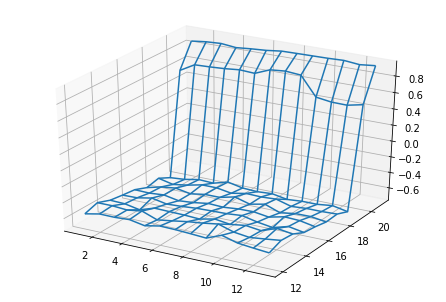

In [121]:
ace = np.split(V, 2, 1)         # 将数据按照是否有可用的ace牌分组，ace[0] 组没有，ace[1] 组有
data = ace[1].reshape(22,14)    # 除去无用的维度
data = data[12:22, 1:14]        # 除去多余的 0 数据
y = np.arange(12, 22)           # 生成 x 坐标，表示玩家此刻的点数
x = np.arange(1,14)             # 生成 y 坐标，表示庄家的明牌
x, y = np.meshgrid(x, y)        # 生成 meshgrid
# 画图
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_wireframe(x, y, data, rstride=1, cstride=1, cmap='viridis')